# Using Machine Learning Methods to Predict EPL Fantasy Football Points

### Data Collection
This notebook contains the data collection stage of my project on Predicting EPL Fantasy Football Points. Including some data cleansing required for merging the data sources I intend to use.

In [184]:
#Import the necessary packages
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from fuzzywuzzy import fuzz, process #Required for "fuzzy" matching between player names

#### FPL Data Import 

In [185]:
#Import and combine the various seasons we intend to build our model from
def read_csv_files(location, encoding='utf-8'):
    all_dataframes = []
    for file in os.listdir(location):
        if file.endswith('.csv'):
            file_path = os.path.join(location, file)
            df = pd.read_csv(file_path, encoding=encoding)
            file_year = os.path.splitext(file)[0][-4:]  #Get last 4 digits of the file name
            df['Year'] = file_year  #Add new column with the Year
            all_dataframes.append(df)

    combined_df = pd.concat(all_dataframes, ignore_index=True)
    return combined_df


folder_location = 'C:/Users/Hazbuk/Documents/University/Project/Data/GameWeek_Data'
fpl_data = read_csv_files(folder_location)

In [186]:
#Quick visual inspection of the data
fpl_data

,name,position,team,xP,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,Year,expected_assists,expected_goal_involvements,expected_goals,expected_goals_conceded,starts
0,Aaron Connolly,FWD,Brighton,0.5,0,0,-3,0,0.3,78,7,2,0,3.4,1.2,2020-09-14T19:15:00Z,45,5,0,0,0,0,1,0,32205,3,1,32.0,1,0,0,0,55,True,0,1,2021,NaN,NaN,NaN,NaN,NaN
1,Aaron Cresswell,DEF,West Ham,2.1,0,0,11,0,11.2,435,6,2,0,2.2,10.4,2020-09-12T19:00:00Z,90,14,0,0,0,0,1,0,70232,2,0,0.0,1,0,0,0,50,True,0,1,2021,NaN,NaN,NaN,NaN,NaN
2,Aaron Mooy,MID,Brighton,0.0,0,0,0,0,0.0,60,7,0,0,0.0,0.0,2020-09-14T19:15:00Z,0,5,0,0,0,0,1,0,2010,3,1,0.0,0,0,0,0,50,True,0,1,2021,NaN,NaN,NaN,NaN,NaN
3,Aaron Ramsdale,GK,Sheffield Utd,2.5,0,0,12,0,0.0,483,8,2,0,1.8,18.2,2020-09-14T17:00:00Z,90,20,0,0,0,0,1,2,462939,2,0,0.0,1,0,0,0,50,True,0,1,2021,NaN,NaN,NaN,NaN,NaN
4,Abdoulaye Doucouré,MID,Everton,1.3,0,0,20,1,44.6,512,4,0,0,6.9,20.4,2020-09-13T15:30:00Z,90,17,0,0,0,0,1,0,143040,1,0,4.0,3,0,0,0,55,False,0,1,2021,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76312,Oliver Skipp,MID,Spurs,2.0,0,0,16,0,0.0,441,377,1,0,0.0,0.0,2023-05-28T15:30:00Z,90,11,0,0,0,0,38,0,16761,4,1,0.0,2,100,742,642,43,False,0,38,2023,0.01,0.01,0.0,1.5,1.0
76313,Ryan Sessegnon,DEF,Spurs,0.0,0,0,0,0,0.0,436,377,0,0,0.0,0.0,2023-05-28T15:30:00Z,0,11,0,0,0,0,38,0,58774,4,1,0.0,0,-166,24,190,44,False,0,38,2023,0.00,0.00,0.0,0.0,0.0
76314,Ashley Young,DEF,Aston Villa,1.0,0,0,0,0,0.0,538,372,0,0,0.0,0.0,2023-05-28T15:30:00Z,0,5,0,0,0,0,38,0,96712,1,2,0.0,0,-1146,1522,2668,43,True,0,38,2023,0.00,0.00,0.0,0.0,0.0
76315,Jeremy Sarmiento Morante,MID,Brighton,0.0,0,0,0,0,0.0,119,372,0,0,0.0,0.0,2023-05-28T15:30:00Z,0,2,0,0,0,0,38,0,4511,1,2,0.0,0,-17,22,39,45,False,0,38,2023,0.00,0.00,0.0,0.0,0.0


In [187]:
'''
Upon inspection of the data from 2021 onwards, "Expected" values were not gathered until later
Since we expect these to be valuable in research we shall perform our research on the previous 3 seasons
worth of data only
'''
fpl_data[fpl_data['xP'].isna()] #We see now that there are no null values in 'xP'

,name,position,team,xP,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,Year,expected_assists,expected_goal_involvements,expected_goals,expected_goals_conceded,starts


In [188]:
#Basic Information about the FPL Dataset
print("Basic Information:")
print(fpl_data.info())

Basic Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76317 entries, 0 to 76316
Data columns (total 42 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   name                        76317 non-null  object 
 1   position                    76317 non-null  object 
 2   team                        76317 non-null  object 
 3   xP                          76317 non-null  float64
 4   assists                     76317 non-null  int64  
 5   bonus                       76317 non-null  int64  
 6   bps                         76317 non-null  int64  
 7   clean_sheets                76317 non-null  int64  
 8   creativity                  76317 non-null  float64
 9   element                     76317 non-null  int64  
 10  fixture                     76317 non-null  int64  
 11  goals_conceded              76317 non-null  int64  
 12  goals_scored                76317 non-null  int64  
 13  ict_index   

In [189]:
#Missing values for all columns
print("Missing Values:")
missing_values = fpl_data.isnull().sum()
for column, count in missing_values.items():
    print(f"{column:<30} {count}")

Missing Values:
name                           0
position                       0
team                           0
xP                             0
assists                        0
bonus                          0
bps                            0
clean_sheets                   0
creativity                     0
element                        0
fixture                        0
goals_conceded                 0
goals_scored                   0
ict_index                      0
influence                      0
kickoff_time                   0
minutes                        0
opponent_team                  0
own_goals                      0
penalties_missed               0
penalties_saved                0
red_cards                      0
round                          0
saves                          0
selected                       0
team_a_score                   0
team_h_score                   0
threat                         0
total_points                   0
transfers_balance          

In [190]:
#Data types of columns
print("Data Types:")
for column, dtype in fpl_data.dtypes.items():
    print(f"{column:<30} {dtype}")

Data Types:
name                           object
position                       object
team                           object
xP                             float64
assists                        int64
bonus                          int64
bps                            int64
clean_sheets                   int64
creativity                     float64
element                        int64
fixture                        int64
goals_conceded                 int64
goals_scored                   int64
ict_index                      float64
influence                      float64
kickoff_time                   object
minutes                        int64
opponent_team                  int64
own_goals                      int64
penalties_missed               int64
penalties_saved                int64
red_cards                      int64
round                          int64
saves                          int64
selected                       int64
team_a_score                   int64
team_h_score  

Correlation Matrix:


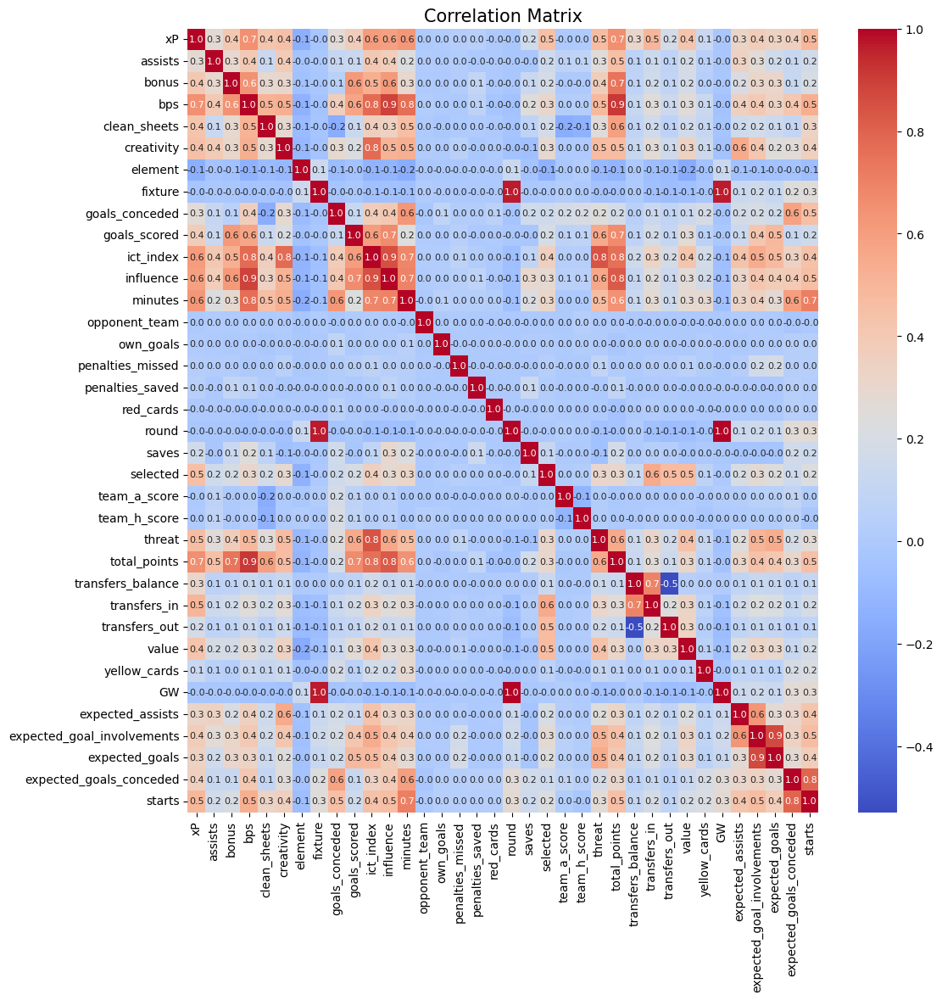

In [191]:
#Select numerical columns only
numerical_cols = fpl_data.select_dtypes(include=[np.number]).columns.tolist()

#Correlation matrix (for numerical columns)
print("Correlation Matrix:")
correlation_matrix = fpl_data[numerical_cols].corr()

# Set the figure size
plt.figure(figsize=(12, 12))

# Use 'annot_kws' parameter to adjust the font size of the labels
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".1f", annot_kws={'size': 8})

plt.title("Correlation Matrix", fontsize=15)  # Adjust the title font size
plt.show()

#### FIFA Data Import

In [192]:
#Import the FIFA Dataset for combination with FPL Dataset
#This uses the same script previously written to iterate the files
folder_location = 'C:/Users/Hazbuk/Documents/University/Project/Data/FIFA_Data'
fifa_data = read_csv_files(folder_location)

In [193]:
#Quick visual inspection of the data
fifa_data

,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Real Face,Position,Jersey Number,Joined,Loaned From,Contract Valid Until,Height,Weight,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Best Position,Best Overall Rating,Release Clause,DefensiveAwareness,Year,Kit Number
0,176580,L. Suárez,33,https://cdn.sofifa.com/players/176/580/20_60.png,Uruguay,https://cdn.sofifa.com/flags/uy.png,87,87,Atlético Madrid,https://cdn.sofifa.com/teams/240/light_30.png,€31.5M,€115K,2316,Right,5.0,4.0,3.0,High/ Medium,PLAYER_BODY_TYPE_374,Yes,"<span class=""pos pos24"">RS",9.0,"Sep 25, 2020",NaN,2022,6'0,190lbs,80.0,92.0,84.0,83.0,90.0,84.0,86.0,82.0,77.0,84.0,72.0,68.0,76.0,92.0,78.0,89.0,69.0,78.0,85.0,88.0,87.0,41.0,91.0,84.0,83.0,85.0,NaN,45.0,38.0,27.0,25.0,31.0,33.0,37.0,ST,87.0,€64.6M,57.0,2021,NaN
1,192985,K. De Bruyne,29,https://cdn.sofifa.com/players/192/985/20_60.png,Belgium,https://cdn.sofifa.com/flags/be.png,91,91,Manchester City,https://cdn.sofifa.com/teams/10/light_30.png,€87M,€370K,2304,Right,4.0,5.0,4.0,High/ High,PLAYER_BODY_TYPE_321,Yes,"<span class=""pos pos13"">RCM",17.0,"Aug 30, 2015",NaN,2023,5'11,154lbs,94.0,82.0,55.0,94.0,82.0,88.0,85.0,83.0,93.0,92.0,77.0,76.0,78.0,91.0,76.0,91.0,63.0,89.0,74.0,91.0,76.0,66.0,88.0,94.0,84.0,91.0,NaN,65.0,53.0,15.0,13.0,5.0,10.0,13.0,CAM,91.0,€161M,68.0,2021,NaN
2,212198,Bruno Fernandes,25,https://cdn.sofifa.com/players/212/198/20_60.png,Portugal,https://cdn.sofifa.com/flags/pt.png,87,90,Manchester United,https://cdn.sofifa.com/teams/11/light_30.png,€63M,€195K,2303,Right,2.0,4.0,4.0,High/ High,Lean (170-185),Yes,"<span class=""pos pos18"">CAM",18.0,"Jan 30, 2020",NaN,2025,5'10,152lbs,87.0,77.0,58.0,88.0,86.0,85.0,86.0,87.0,87.0,88.0,78.0,76.0,79.0,86.0,79.0,89.0,72.0,94.0,67.0,89.0,70.0,74.0,83.0,90.0,91.0,86.0,NaN,67.0,55.0,12.0,14.0,15.0,8.0,14.0,CAM,88.0,€124.4M,72.0,2021,NaN
3,194765,A. Griezmann,29,https://cdn.sofifa.com/players/194/765/20_60.png,France,https://cdn.sofifa.com/flags/fr.png,87,87,FC Barcelona,https://cdn.sofifa.com/teams/241/light_30.png,€50.5M,€290K,2288,Left,4.0,3.0,4.0,Medium/ Medium,PLAYER_BODY_TYPE_266,Yes,"<span class=""pos pos23"">RW",7.0,"Jul 12, 2019",NaN,2024,5'9,161lbs,83.0,88.0,83.0,84.0,87.0,87.0,86.0,85.0,82.0,89.0,80.0,79.0,91.0,92.0,83.0,81.0,90.0,86.0,63.0,82.0,73.0,49.0,89.0,85.0,86.0,89.0,NaN,54.0,49.0,14.0,8.0,14.0,13.0,14.0,ST,87.0,€103.5M,59.0,2021,NaN
4,224334,M. Acuña,28,https://cdn.sofifa.com/players/224/334/20_60.png,Argentina,https://cdn.sofifa.com/flags/ar.png,83,83,Sevilla FC,https://cdn.sofifa.com/teams/481/light_30.png,€22M,€41K,2280,Left,2.0,3.0,4.0,High/ High,Stocky (170-185),No,"<span class=""pos pos7"">LB",19.0,"Sep 14, 2020",NaN,2024,5'8,152lbs,87.0,66.0,57.0,81.0,68.0,87.0,88.0,75.0,78.0,87.0,77.0,75.0,82.0,83.0,90.0,82.0,63.0,90.0,80.0,81.0,84.0,78.0,81.0,82.0,76.0,87.0,NaN,82.0,79.0,8.0,14.0,13.0,13.0,14.0,LB,83.0,€46.2M,79.0,2021,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51473,269526,Deng Xiongtao,19,https://cdn.sofifa.net/players/269/526/23_60.png,China PR,https://cdn.sofifa.net/flags/cn.png,48,61,Meizhou Hakka,https://cdn.sofifa.net/teams/114628/30.png,€100K,€500,762,Right,1.0,3.0,1.0,Medium/ Medium,Normal (185+),No,"<span class=""pos pos29"">RES",NaN,"Apr 11, 2022",NaN,2027,190cm,78kg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [194]:
#Basic Information about the FIFA Dataset
print("Basic Information:")
print(fifa_data.info())

Basic Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51478 entries, 0 to 51477
Data columns (total 67 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        51478 non-null  int64  
 1   Name                      51478 non-null  object 
 2   Age                       51478 non-null  int64  
 3   Photo                     51478 non-null  object 
 4   Nationality               51478 non-null  object 
 5   Flag                      51478 non-null  object 
 6   Overall                   51478 non-null  int64  
 7   Potential                 51478 non-null  int64  
 8   Club                      50678 non-null  object 
 9   Club Logo                 51478 non-null  object 
 10  Value                     51478 non-null  object 
 11  Wage                      51478 non-null  object 
 12  Special                   51478 non-null  int64  
 13  Preferred Foot            51478 non-null  

In [195]:
#Missing values for all columns
print("Missing Values:")
missing_values = fifa_data.isnull().sum()
for column, count in missing_values.items():
    print(f"{column:<30} {count}")

Missing Values:
ID                             0
Name                           0
Age                            0
Photo                          0
Nationality                    0
Flag                           0
Overall                        0
Potential                      0
Club                           800
Club Logo                      0
Value                          0
Wage                           0
Special                        0
Preferred Foot                 0
International Reputation       0
Weak Foot                      0
Skill Moves                    0
Work Rate                      0
Body Type                      92
Real Face                      92
Position                       81
Jersey Number                  17706
Joined                         4059
Loaned From                    48730
Contract Valid Until           1208
Height                         0
Weight                         0
Crossing                       17660
Finishing                      17660


In [196]:
#Data types of columns
print("Data Types:")
for column, dtype in fifa_data.dtypes.items():
    print(f"{column:<30} {dtype}")

Data Types:
ID                             int64
Name                           object
Age                            int64
Photo                          object
Nationality                    object
Flag                           object
Overall                        int64
Potential                      int64
Club                           object
Club Logo                      object
Value                          object
Wage                           object
Special                        int64
Preferred Foot                 object
International Reputation       float64
Weak Foot                      float64
Skill Moves                    float64
Work Rate                      object
Body Type                      object
Real Face                      object
Position                       object
Jersey Number                  float64
Joined                         object
Loaned From                    object
Contract Valid Until           object
Height                         object
W

Correlation Matrix:


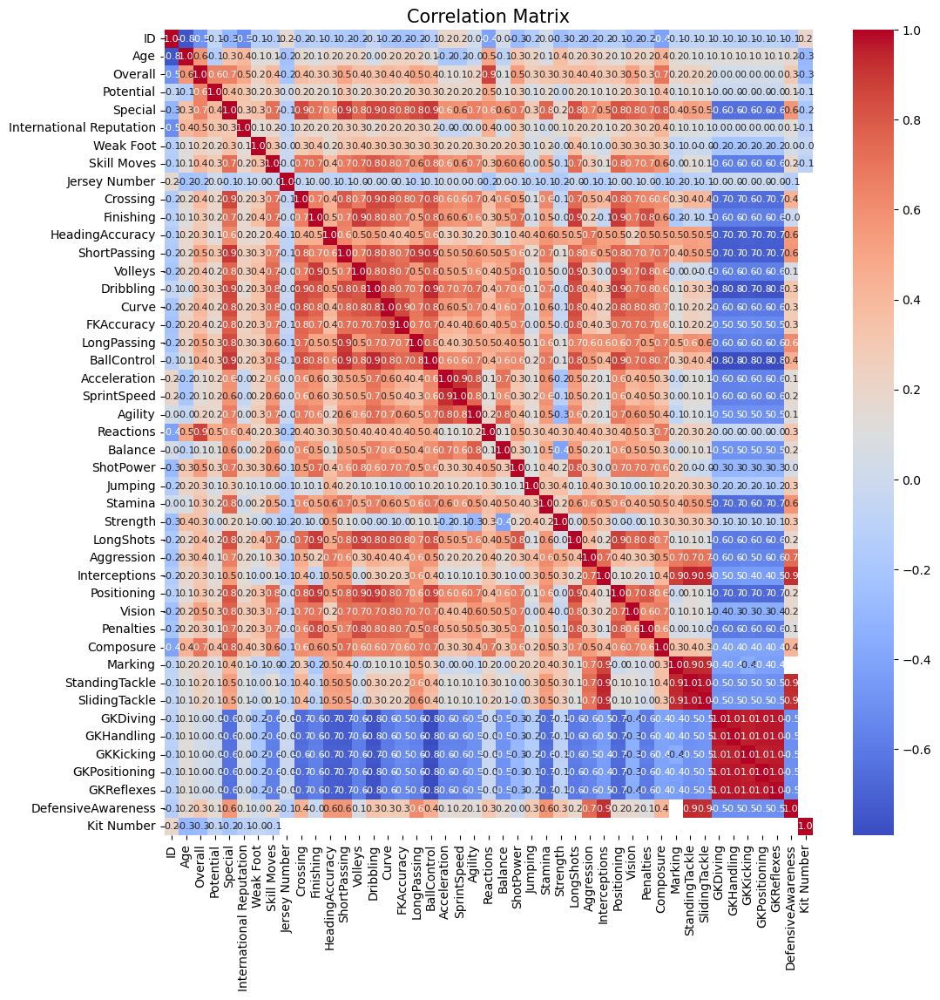

In [197]:
#Select numerical columns only
numerical_cols = fifa_data.select_dtypes(include=[np.number]).columns.tolist()

#Correlation matrix (for numerical columns)
print("Correlation Matrix:")
correlation_matrix = fifa_data[numerical_cols].corr()

# Set the figure size
plt.figure(figsize=(12, 12))

# Use 'annot_kws' parameter to adjust the font size of the labels
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".1f", annot_kws={'size': 8})

plt.title("Correlation Matrix", fontsize=15)  # Adjust the title font size
plt.show()

#### Merging the Datasets
Now that the data sets are ingested, we need to combine them, from the Literature review we found that Kirstinsson encounter several data cleansing issues while trying to match player names. As such, we need to inspect the various names in each set and see what string manipulations we can employ such that they will match and allow us to join the data successfully.

As part of the process through this step, it has become apparent that to effectively join the data we will need the FIFA data for the corresponding years and not just the latest information on player statistics.

Differences in Club names across the two data sets were noted, these have to be manually altered in order to facilitate the joins.

In [198]:
#Firstly we need to replace the club names to match

#Create the mapping to replace the club names
name_mapping = {
    'Brighton & Hove Albion': 'Brighton',
    'West Ham United': 'West Ham',
    'Sheffield United': 'Sheffield Utd',
    'Everton': 'Everton',
    'Fulham': 'Fulham',
    'Wolverhampton Wanderers': 'Wolves',
    'Leeds United': 'Leeds',
    'Leicester City': 'Leicester',
    'Liverpool': 'Liverpool',
    'West Bromwich Albion': 'West Brom',
    'Arsenal': 'Arsenal',
    'Southampton': 'Southampton',
    'Newcastle United': 'Newcastle',
    'Chelsea': 'Chelsea',
    'Crystal Palace': 'Crystal Palace',
    'Tottenham Hotspur': 'Spurs',
    'Manchester United': 'Man Utd',
    'Manchester City': 'Man City',
    'Aston Villa': 'Aston Villa',
    'Burnley': 'Burnley',
    'Watford': 'Watford',
    'Norwich City': 'Norwich',
    'Brentford': 'Brentford',
    'AFC Bournemouth': 'Bournemouth',
    'Nottingham Forest': "Nott'm Forest"
}

#Replace the occurrences in the fifa data based on the mapping above
fifa_data.replace({"Club": name_mapping}, inplace=True)

In [211]:
#Code used to check for the unique club names in the FIFA data following mapping
pd.set_option('display.max_rows', 80000) #Display more rows for inspection
#fifa_data['Club'].drop_duplicates()

In [200]:
#Code used to check for the unique team names in fpl data
#fpl_data['team'].drop_duplicates()

In [230]:
#Set the team names to filter the fifa dataset to be the same as those in the fpl dataset
#Teams = fpl_data['team'].drop_duplicates()
#fifa_data = fifa_data[fifa_data['Club'].isin(Teams)] #filter the fifa data to EPL Clubs

#Select only the relevant columns for the joins to inspect
#fifa_names = fifa_data[['Name','Club','Year']].drop_duplicates()
#Check the names side by side for players and their respective clubs + the year
#fifa_names

In [203]:
#Select only the relevant columns for the joins to inspect
fpl_names = fpl_data[['name','team','Year']].drop_duplicates()
#Check the names side by side for players and their respective clubs + the year
fpl_names

,name,team,Year
0,Aaron Connolly,Brighton,2021
1,Aaron Cresswell,West Ham,2021
2,Aaron Mooy,Brighton,2021
3,Aaron Ramsdale,Sheffield Utd,2021
4,Abdoulaye Doucouré,Everton,2021
5,Aboubakar Kamara,Fulham,2021
6,Adama Traoré,Wolves,2021
7,Adam Forshaw,Leeds,2021
8,Adam Lallana,Brighton,2021
9,Adam Webster,Brighton,2021


In [204]:
#Let's amend the columns names for the joins to be the same
#This should make the code more readable when joining

print('FIFA columns','\n',fifa_data.columns)
print('FPL columns','\n',fpl_data.columns)

#Rename the columns as required
fifa_data.rename(columns={'Name': 'name','Club': 'team'}, inplace=True)

FIFA columns 
 Index(['ID', 'Name', 'Age', 'Photo', 'Nationality', 'Flag', 'Overall',
       'Potential', 'Club', 'Club Logo', 'Value', 'Wage', 'Special',
       'Preferred Foot', 'International Reputation', 'Weak Foot',
       'Skill Moves', 'Work Rate', 'Body Type', 'Real Face', 'Position',
       'Jersey Number', 'Joined', 'Loaned From', 'Contract Valid Until',
       'Height', 'Weight', 'Crossing', 'Finishing', 'HeadingAccuracy',
       'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 'FKAccuracy',
       'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed', 'Agility',
       'Reactions', 'Balance', 'ShotPower', 'Jumping', 'Stamina', 'Strength',
       'LongShots', 'Aggression', 'Interceptions', 'Positioning', 'Vision',
       'Penalties', 'Composure', 'Marking', 'StandingTackle', 'SlidingTackle',
       'GKDiving', 'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes',
       'Best Position', 'Best Overall Rating', 'Release Clause',
       'DefensiveAwareness', 'Year', '

In [118]:
# # Reset the index of both DataFrames
# fpl_data.reset_index(drop=True, inplace=True)
# fifa_data.reset_index(drop=True, inplace=True)

# # Define a function to find the best match for "name" using fuzzy string matching
# def find_best_name_match(row, name_list):
#     index = row.name
#     name = row['name']
#     team = row['team']
#     Year = row['Year']
    
#     best_match = None
#     max_similarity = 0

#     for name_in_list in name_list:
#         similarity_score = fuzz.token_set_ratio(name, name_in_list)
#         if similarity_score > max_similarity:
#             max_similarity = similarity_score
#             best_match = name_in_list

#     print(f"Working on row {index}: name={name}, team={team}, Year={Year}, best_match={best_match}")
#     return best_match

# # Preprocess the "name" columns in both datasets
# fpl_data['processed_name'] = fpl_data.apply(find_best_name_match, name_list=fifa_data['name'].tolist(), axis=1)
# fifa_data['processed_name'] = fifa_data['name']

# # Perform the join based on "processed_name", "team", and "Year"
# joined_data = pd.merge(fpl_data, fifa_data, on=['processed_name', 'team', 'Year'], how='left')


In [119]:
# # Display the joined data
# joined_data

In [231]:
# Reset the index of both DataFrames
fpl_data.reset_index(drop=True, inplace=True)
fifa_data.reset_index(drop=True, inplace=True)

# Dictionary to store previously found matches
name_matches = {}

# Define a function to find the best match for "name" using fuzzy string matching
def find_best_name_match(row, fifa_data):
    index = row.name
    name = row['name']
    team = row['team']
    Year = row['Year']
    
    # Check if the name was previously matched
    if name in name_matches:
        best_match = name_matches[name]
        print(f"Working on row {index}: name={name}, team={team}, Year={Year}, best_match={best_match} (previously found)")
        return best_match

    # Filter the names from fifa_data based on matching "team" and "Year"
    filtered_names = fifa_data.loc[(fifa_data['team'] == team) & (fifa_data['Year'] == Year), 'name']

    best_match = None
    max_similarity = 0

    for name_in_list in filtered_names:
        similarity_score = fuzz.token_set_ratio(name, name_in_list)
        if similarity_score > max_similarity:
            max_similarity = similarity_score
            best_match = name_in_list

    # If the maximum similarity score is below a certain threshold, return null
    if max_similarity < 80:  # You can adjust this threshold as needed
        print(f"Working on row {index}: name={name}, team={team}, Year={Year}, best_match=None")
        return np.nan
    
    # Store the found match for future use
    name_matches[name] = best_match

    print(f"Working on row {index}: name={name}, team={team}, Year={Year}, best_match={best_match}")
    return best_match

# Preprocess the "name" columns in both datasets
fpl_data['processed_name'] = fpl_data.apply(find_best_name_match, fifa_data=fifa_data, axis=1)
fifa_data['processed_name'] = fifa_data['name']



Working on row 0: name=Aaron Connolly, team=Brighton, Year=2021, best_match= A. Connolly
Working on row 1: name=Aaron Cresswell, team=West Ham, Year=2021, best_match= A. Cresswell
Working on row 2: name=Aaron Mooy, team=Brighton, Year=2021, best_match=None
Working on row 3: name=Aaron Ramsdale, team=Sheffield Utd, Year=2021, best_match= A. Ramsdale
Working on row 4: name=Abdoulaye Doucouré, team=Everton, Year=2021, best_match= A. Doucouré
Working on row 5: name=Aboubakar Kamara, team=Fulham, Year=2021, best_match= A. Kamara
Working on row 6: name=Adama Traoré, team=Wolves, Year=2021, best_match= Adama Traoré
Working on row 7: name=Adam Forshaw, team=Leeds, Year=2021, best_match= A. Forshaw
Working on row 8: name=Adam Lallana, team=Brighton, Year=2021, best_match= A. Lallana
Working on row 9: name=Adam Webster, team=Brighton, Year=2021, best_match= A. Webster
Working on row 10: name=Adrien Silva, team=Leicester, Year=2021, best_match= Adrien Silva
Working on row 11: name=Adrián San Migu

Working on row 122: name=Fabio Silva, team=Wolves, Year=2021, best_match= Fábio Silva
Working on row 123: name=Fabián Balbuena, team=West Ham, Year=2021, best_match= F. Balbuena
Working on row 124: name=Fabricio Agosto Ramírez, team=Fulham, Year=2021, best_match= Fabricio
Working on row 125: name=Federico Fernández, team=Newcastle, Year=2021, best_match= F. Fernández
Working on row 126: name=Felipe Anderson Pereira Gomes, team=West Ham, Year=2021, best_match= Felipe Anderson
Working on row 127: name=Fernando Marçal, team=Wolves, Year=2021, best_match= Marçal
Working on row 128: name=Fikayo Tomori, team=Chelsea, Year=2021, best_match= F. Tomori
Working on row 129: name=Filip Benkovic, team=Leicester, Year=2021, best_match=None
Working on row 130: name=Florian Lejeune, team=Newcastle, Year=2021, best_match=None
Working on row 131: name=Florin Andone, team=Brighton, Year=2021, best_match= F. Andone
Working on row 132: name=Francisco Casilla Cortés, team=Leeds, Year=2021, best_match=None
W

Working on row 246: name=Leander Dendoncker, team=Wolves, Year=2021, best_match= L. Dendoncker
Working on row 247: name=Leandro Trossard, team=Brighton, Year=2021, best_match= L. Trossard
Working on row 248: name=Leif Davis, team=Leeds, Year=2021, best_match= L. Davis
Working on row 249: name=Leonardo Campana, team=Wolves, Year=2021, best_match=None
Working on row 250: name=Lewis Dunk, team=Brighton, Year=2021, best_match= L. Dunk
Working on row 251: name=Liam Cooper, team=Leeds, Year=2021, best_match= L. Cooper
Working on row 252: name=Lucas Digne, team=Everton, Year=2021, best_match= L. Digne
Working on row 253: name=Lucas Rodrigues Moura da Silva, team=Spurs, Year=2021, best_match= Lucas Moura
Working on row 254: name=Lucas Torreira, team=Arsenal, Year=2021, best_match= L. Torreira
Working on row 255: name=Lukasz Fabianski, team=West Ham, Year=2021, best_match=None
Working on row 256: name=Luka Milivojevic, team=Crystal Palace, Year=2021, best_match= L. Milivojević
Working on row 25

Working on row 343: name=Rhian Brewster, team=Liverpool, Year=2021, best_match= R. Brewster
Working on row 344: name=Ricardo Domingos Barbosa Pereira, team=Leicester, Year=2021, best_match= Ricardo Pereira
Working on row 345: name=Richarlison de Andrade, team=Everton, Year=2021, best_match= Richarlison
Working on row 346: name=Roberto Firmino, team=Liverpool, Year=2021, best_match= Roberto Firmino
Working on row 347: name=Roberto Jimenez Gago, team=West Ham, Year=2021, best_match=None
Working on row 348: name=Robert Snodgrass, team=West Ham, Year=2021, best_match= R. Snodgrass
Working on row 349: name=Robin Koch, team=Leeds, Year=2021, best_match= R. Koch
Working on row 350: name=Rob Holding, team=Arsenal, Year=2021, best_match= R. Holding
Working on row 351: name=Rodrigo Moreno, team=Leeds, Year=2021, best_match= Rodrigo
Working on row 352: name=Rolando Aarons, team=Newcastle, Year=2021, best_match= R. Aarons
Working on row 353: name=Romaine Sawyers, team=West Brom, Year=2021, best_ma

Working on row 465: name=Anthony Driscoll-Glennon, team=Burnley, Year=2021, best_match= A. Glennon
Working on row 466: name=Anthony Gordon, team=Everton, Year=2021, best_match= A. Gordon (previously found)
Working on row 467: name=Anthony Knockaert, team=Fulham, Year=2021, best_match= A. Knockaert (previously found)
Working on row 468: name=Anthony Martial, team=Man Utd, Year=2021, best_match= A. Martial
Working on row 469: name=Antonee Robinson, team=Fulham, Year=2021, best_match= A. Robinson (previously found)
Working on row 470: name=Antonio Rüdiger, team=Chelsea, Year=2021, best_match= A. Rüdiger (previously found)
Working on row 471: name=Anwar El Ghazi, team=Aston Villa, Year=2021, best_match= A. El Ghazi
Working on row 472: name=Arthur Masuaku, team=West Ham, Year=2021, best_match= A. Masuaku (previously found)
Working on row 473: name=Ashley Barnes, team=Burnley, Year=2021, best_match= A. Barnes
Working on row 474: name=Ashley Westwood, team=Burnley, Year=2021, best_match= A. W

Working on row 624: name=Heung-Min Son, team=Spurs, Year=2021, best_match=None
Working on row 625: name=Hugo Lloris, team=Spurs, Year=2021, best_match= H. Lloris (previously found)
Working on row 626: name=Héctor Bellerín, team=Arsenal, Year=2021, best_match= Héctor Bellerín (previously found)
Working on row 627: name=Hélder Wander Sousa de Azevedo e Costa, team=Leeds, Year=2021, best_match= Hélder Costa (previously found)
Working on row 628: name=Ian Carlo Poveda-Ocampo, team=Leeds, Year=2021, best_match= I. Poveda (previously found)
Working on row 629: name=Ilkay Gündogan, team=Man City, Year=2021, best_match=None
Working on row 630: name=Illan Meslier, team=Leeds, Year=2021, best_match= I. Meslier (previously found)
Working on row 631: name=Indiana Vassilev, team=Aston Villa, Year=2021, best_match=None
Working on row 632: name=Isaac Hayden, team=Newcastle, Year=2021, best_match= I. Hayden (previously found)
Working on row 633: name=Issa Diop, team=West Ham, Year=2021, best_match= I.

Working on row 725: name=Kelland Watts, team=Newcastle, Year=2021, best_match=None
Working on row 726: name=Kenneth Zohore, team=West Brom, Year=2021, best_match= K. Zohore (previously found)
Working on row 727: name=Kenny Tete, team=Fulham, Year=2021, best_match= K. Tete (previously found)
Working on row 728: name=Kepa Arrizabalaga, team=Chelsea, Year=2021, best_match= Kepa (previously found)
Working on row 729: name=Kevin De Bruyne, team=Man City, Year=2021, best_match= K. De Bruyne
Working on row 730: name=Kevin Long, team=Burnley, Year=2021, best_match= K. Long
Working on row 731: name=Kevin McDonald, team=Fulham, Year=2021, best_match= K. McDonald (previously found)
Working on row 732: name=Kieran Gibbs, team=West Brom, Year=2021, best_match= K. Gibbs (previously found)
Working on row 733: name=Kieran Tierney, team=Arsenal, Year=2021, best_match= K. Tierney (previously found)
Working on row 734: name=Konstantinos Tsimikas, team=Liverpool, Year=2021, best_match= K. Tsimikas (previo

Working on row 812: name=Morgan Gibbs-White, team=Wolves, Year=2021, best_match=None
Working on row 813: name=Moussa Djenepo, team=Southampton, Year=2021, best_match= M. Djenepo (previously found)
Working on row 814: name=Moussa Sissoko, team=Spurs, Year=2021, best_match= M. Sissoko (previously found)
Working on row 815: name=N'Golo Kanté, team=Chelsea, Year=2021, best_match= N. Kanté (previously found)
Working on row 816: name=Naby Keita, team=Liverpool, Year=2021, best_match=None
Working on row 817: name=Nampalys Mendy, team=Leicester, Year=2021, best_match= N. Mendy (previously found)
Working on row 818: name=Nathan Aké, team=Man City, Year=2021, best_match=None
Working on row 819: name=Nathan Ferguson, team=Crystal Palace, Year=2021, best_match= N. Ferguson (previously found)
Working on row 820: name=Nathan Redmond, team=Southampton, Year=2021, best_match= N. Redmond (previously found)
Working on row 821: name=Nathan Tella, team=Southampton, Year=2021, best_match= N. Tella (previou

Working on row 901: name=Sergio Agüero, team=Man City, Year=2021, best_match= S. Agüero
Working on row 902: name=Sergio Romero, team=Man Utd, Year=2021, best_match= S. Romero
Working on row 903: name=Shane Duffy, team=Brighton, Year=2021, best_match=None
Working on row 904: name=Shane Long, team=Southampton, Year=2021, best_match= S. Long (previously found)
Working on row 905: name=Shkodran Mustafi, team=Arsenal, Year=2021, best_match= S. Mustafi (previously found)
Working on row 906: name=Simon Moore, team=Sheffield Utd, Year=2021, best_match= S. Moore (previously found)
Working on row 907: name=Sofiane Boufal, team=Southampton, Year=2021, best_match= S. Boufal (previously found)
Working on row 908: name=Sokratis Papastathopoulos, team=Arsenal, Year=2021, best_match= Sokratis (previously found)
Working on row 909: name=Solomon March, team=Brighton, Year=2021, best_match= S. March (previously found)
Working on row 910: name=Stefan Johansen, team=Fulham, Year=2021, best_match= S. Johans

Working on row 1050: name=Cengiz Ünder, team=Leicester, Year=2021, best_match= C. Ünder
Working on row 1051: name=Cenk Tosun, team=Everton, Year=2021, best_match= C. Tosun (previously found)
Working on row 1052: name=Charlie Austin, team=West Brom, Year=2021, best_match= C. Austin (previously found)
Working on row 1053: name=Charlie Taylor, team=Burnley, Year=2021, best_match= C. Taylor (previously found)
Working on row 1054: name=Cheikhou Kouyaté, team=Crystal Palace, Year=2021, best_match= C. Kouyaté (previously found)
Working on row 1055: name=Che Adams, team=Southampton, Year=2021, best_match= C. Adams (previously found)
Working on row 1056: name=Christian Atsu, team=Newcastle, Year=2021, best_match= C. Atsu (previously found)
Working on row 1057: name=Christian Benteke, team=Crystal Palace, Year=2021, best_match= C. Benteke (previously found)
Working on row 1058: name=Christian Fuchs, team=Leicester, Year=2021, best_match= C. Fuchs (previously found)
Working on row 1059: name=Chri

Working on row 1249: name=Jorge Luiz Frello Filho, team=Chelsea, Year=2021, best_match=None
Working on row 1250: name=Joseph Gomez, team=Liverpool, Year=2021, best_match= J. Gomez (previously found)
Working on row 1251: name=Joseph Willock, team=Arsenal, Year=2021, best_match= J. Willock (previously found)
Working on row 1252: name=Josh Benson, team=Burnley, Year=2021, best_match= J. Benson (previously found)
Working on row 1253: name=Josh Brownhill, team=Burnley, Year=2021, best_match= J. Brownhill (previously found)
Working on row 1254: name=Josh Onomah, team=Fulham, Year=2021, best_match= J. Onomah (previously found)
Working on row 1255: name=Josh Sims, team=Southampton, Year=2021, best_match= J. Sims (previously found)
Working on row 1256: name=José Diogo Dalot Teixeira, team=Man Utd, Year=2021, best_match= Diogo Dalot (previously found)
Working on row 1257: name=José Ignacio Peleteiro Romallo, team=Aston Villa, Year=2021, best_match=None
Working on row 1258: name=José Izquierdo, t

Working on row 1431: name=Ross Barkley, team=Chelsea, Year=2021, best_match=None
Working on row 1432: name=Ruben Loftus-Cheek, team=Chelsea, Year=2021, best_match= R. Loftus-Cheek (previously found)
Working on row 1433: name=Rui Pedro dos Santos Patrício, team=Wolves, Year=2021, best_match= Rui Patrício (previously found)
Working on row 1434: name=Ryan Bennett, team=Wolves, Year=2021, best_match= R. Bennett (previously found)
Working on row 1435: name=Ryan Bertrand, team=Southampton, Year=2021, best_match= R. Bertrand (previously found)
Working on row 1436: name=Ryan Fraser, team=Newcastle, Year=2021, best_match= R. Fraser (previously found)
Working on row 1437: name=Ryan Fredericks, team=West Ham, Year=2021, best_match= R. Fredericks (previously found)
Working on row 1438: name=Ryan Inniss, team=Crystal Palace, Year=2021, best_match= R. Inniss (previously found)
Working on row 1439: name=Ryan Sessegnon, team=Spurs, Year=2021, best_match= R. Sessegnon (previously found)
Working on row 

Working on row 1701: name=Frederico Rodrigues de Paula Santos, team=Man Utd, Year=2021, best_match=None
Working on row 1702: name=Frédéric Guilbert, team=Aston Villa, Year=2021, best_match= F. Guilbert (previously found)
Working on row 1703: name=Gabriel Fernando de Jesus, team=Man City, Year=2021, best_match= Gabriel Jesus (previously found)
Working on row 1704: name=Gabriel Teodoro Martinelli Silva, team=Arsenal, Year=2021, best_match= Gabriel Martinelli (previously found)
Working on row 1705: name=Gabriel Magalhães, team=Arsenal, Year=2021, best_match= Gabriel (previously found)
Working on row 1706: name=Gareth Bale, team=Spurs, Year=2021, best_match= G. Bale (previously found)
Working on row 1707: name=Gary Cahill, team=Crystal Palace, Year=2021, best_match= G. Cahill (previously found)
Working on row 1708: name=Gedson Carvalho Fernandes, team=Spurs, Year=2021, best_match= Gedson Fernandes (previously found)
Working on row 1709: name=George Baldock, team=Sheffield Utd, Year=2021, b

Working on row 1924: name=Naby Keita, team=Liverpool, Year=2021, best_match=None
Working on row 1925: name=Nampalys Mendy, team=Leicester, Year=2021, best_match= N. Mendy (previously found)
Working on row 1926: name=Nathan Aké, team=Man City, Year=2021, best_match=None
Working on row 1927: name=Nathan Ferguson, team=Crystal Palace, Year=2021, best_match= N. Ferguson (previously found)
Working on row 1928: name=Nathan Redmond, team=Southampton, Year=2021, best_match= N. Redmond (previously found)
Working on row 1929: name=Nathan Tella, team=Southampton, Year=2021, best_match= N. Tella (previously found)
Working on row 1930: name=Neal Maupay, team=Brighton, Year=2021, best_match= N. Maupay (previously found)
Working on row 1931: name=Neco Williams, team=Liverpool, Year=2021, best_match= N. Williams (previously found)
Working on row 1932: name=Neeskens Kebano, team=Fulham, Year=2021, best_match= N. Kebano (previously found)
Working on row 1933: name=Neil Taylor, team=Aston Villa, Year=202

Working on row 2143: name=Ben Godfrey, team=Everton, Year=2021, best_match=None
Working on row 2144: name=Ben Johnson, team=West Ham, Year=2021, best_match= B. Johnson (previously found)
Working on row 2145: name=Ben Mee, team=Burnley, Year=2021, best_match= B. Mee (previously found)
Working on row 2146: name=Ben Osborn, team=Sheffield Utd, Year=2021, best_match= B. Osborn (previously found)
Working on row 2147: name=Ben White, team=Brighton, Year=2021, best_match= B. White (previously found)
Working on row 2148: name=Bernardo Mota Veiga de Carvalho e Silva, team=Man City, Year=2021, best_match= Bernardo Silva (previously found)
Working on row 2149: name=Bernardo Fernandes da Silva Junior, team=Brighton, Year=2021, best_match= Bernardo (previously found)
Working on row 2150: name=Bernard Anício Caldeira Duarte, team=Everton, Year=2021, best_match= Bernard (previously found)
Working on row 2151: name=Bernd Leno, team=Arsenal, Year=2021, best_match= B. Leno (previously found)
Working on 

Working on row 2378: name=Jorge Luiz Frello Filho, team=Chelsea, Year=2021, best_match=None
Working on row 2379: name=Joseph Gomez, team=Liverpool, Year=2021, best_match= J. Gomez (previously found)
Working on row 2380: name=Joseph Willock, team=Arsenal, Year=2021, best_match= J. Willock (previously found)
Working on row 2381: name=Josh Benson, team=Burnley, Year=2021, best_match= J. Benson (previously found)
Working on row 2382: name=Josh Brownhill, team=Burnley, Year=2021, best_match= J. Brownhill (previously found)
Working on row 2383: name=Josh Onomah, team=Fulham, Year=2021, best_match= J. Onomah (previously found)
Working on row 2384: name=Josh Sims, team=Southampton, Year=2021, best_match= J. Sims (previously found)
Working on row 2385: name=José Diogo Dalot Teixeira, team=Man Utd, Year=2021, best_match= Diogo Dalot (previously found)
Working on row 2386: name=José Ignacio Peleteiro Romallo, team=Aston Villa, Year=2021, best_match=None
Working on row 2387: name=José Izquierdo, t

Working on row 2596: name=Shane Duffy, team=Brighton, Year=2021, best_match=None
Working on row 2597: name=Shane Long, team=Southampton, Year=2021, best_match= S. Long (previously found)
Working on row 2598: name=Shkodran Mustafi, team=Arsenal, Year=2021, best_match= S. Mustafi (previously found)
Working on row 2599: name=Simon Moore, team=Sheffield Utd, Year=2021, best_match= S. Moore (previously found)
Working on row 2600: name=Sofiane Boufal, team=Southampton, Year=2021, best_match= S. Boufal (previously found)
Working on row 2601: name=Sokratis Papastathopoulos, team=Arsenal, Year=2021, best_match= Sokratis (previously found)
Working on row 2602: name=Solomon March, team=Brighton, Year=2021, best_match= S. March (previously found)
Working on row 2603: name=Stefan Johansen, team=Fulham, Year=2021, best_match= S. Johansen (previously found)
Working on row 2604: name=Stephen Henderson, team=Crystal Palace, Year=2021, best_match= S. Henderson
Working on row 2605: name=Steven Alzate, te

Working on row 2782: name=Nathaniel Phillips, team=Liverpool, Year=2021, best_match= N. Phillips
Working on row 2783: name=Steven Alzate, team=Brighton, Year=2021, best_match= S. Alzate (previously found)
Working on row 2784: name=Sadio Mané, team=Liverpool, Year=2021, best_match=None
Working on row 2785: name=Jarrad Branthwaite, team=Everton, Year=2021, best_match= J. Branthwaite (previously found)
Working on row 2786: name=Nathan Ferguson, team=Crystal Palace, Year=2021, best_match= N. Ferguson (previously found)
Working on row 2787: name=Javier Manquillo, team=Newcastle, Year=2021, best_match= Manquillo (previously found)
Working on row 2788: name=Josh Sims, team=Southampton, Year=2021, best_match= J. Sims (previously found)
Working on row 2789: name=Facundo Pellistri, team=Man Utd, Year=2021, best_match=None
Working on row 2790: name=James Justin, team=Leicester, Year=2021, best_match= J. Justin (previously found)
Working on row 2791: name=Antonio Rüdiger, team=Chelsea, Year=2021, 

Working on row 2940: name=Ademola Lookman, team=Fulham, Year=2021, best_match=None
Working on row 2941: name=Raphael Dias Belloli, team=Leeds, Year=2021, best_match=None
Working on row 2942: name=Allan Marques Loureiro, team=Everton, Year=2021, best_match= Allan (previously found)
Working on row 2943: name=Angus Gunn, team=Southampton, Year=2021, best_match= A. Gunn (previously found)
Working on row 2944: name=Christian Atsu, team=Newcastle, Year=2021, best_match= C. Atsu (previously found)
Working on row 2945: name=Matteo Guendouzi, team=Arsenal, Year=2021, best_match= M. Guendouzi (previously found)
Working on row 2946: name=Erik Lamela, team=Spurs, Year=2021, best_match= E. Lamela (previously found)
Working on row 2947: name=Allan Saint-Maximin, team=Newcastle, Year=2021, best_match= A. Saint-Maximin (previously found)
Working on row 2948: name=Timothy Castagne, team=Leicester, Year=2021, best_match= T. Castagne (previously found)
Working on row 2949: name=Gedson Carvalho Fernandes,

Working on row 3111: name=Eberechi Eze, team=Crystal Palace, Year=2021, best_match=None
Working on row 3112: name=Alex McCarthy, team=Southampton, Year=2021, best_match= A. McCarthy (previously found)
Working on row 3113: name=Oliver McBurnie, team=Sheffield Utd, Year=2021, best_match= O. McBurnie (previously found)
Working on row 3114: name=Timothy Fosu-Mensah, team=Man Utd, Year=2021, best_match= T. Fosu-Mensah (previously found)
Working on row 3115: name=Sergio Agüero, team=Man City, Year=2021, best_match= S. Agüero (previously found)
Working on row 3116: name=Filip Krovinovic, team=West Brom, Year=2021, best_match=None
Working on row 3117: name=Christian Pulisic, team=Chelsea, Year=2021, best_match= C. Pulisic (previously found)
Working on row 3118: name=André Filipe Tavares Gomes, team=Everton, Year=2021, best_match= André Gomes (previously found)
Working on row 3119: name=Wayne Hennessey, team=Crystal Palace, Year=2021, best_match= W. Hennessey (previously found)
Working on row 3

Working on row 3334: name=Jonathan Castro Otto, team=Wolves, Year=2021, best_match=None
Working on row 3335: name=Kelland Watts, team=Newcastle, Year=2021, best_match=None
Working on row 3336: name=Jeffrey Schlupp, team=Crystal Palace, Year=2021, best_match= J. Schlupp (previously found)
Working on row 3337: name=Richarlison de Andrade, team=Everton, Year=2021, best_match= Richarlison (previously found)
Working on row 3338: name=James Rodríguez, team=Everton, Year=2021, best_match= J. Rodríguez (previously found)
Working on row 3339: name=Danny Welbeck, team=Brighton, Year=2021, best_match=None
Working on row 3340: name=Edward Nketiah, team=Arsenal, Year=2021, best_match= E. Nketiah (previously found)
Working on row 3341: name=Aboubakar Kamara, team=Fulham, Year=2021, best_match= A. Kamara (previously found)
Working on row 3342: name=Timo Werner, team=Chelsea, Year=2021, best_match= T. Werner (previously found)
Working on row 3343: name=Edouard Mendy, team=Chelsea, Year=2021, best_matc

Working on row 3495: name=Vladimir Coufal, team=West Ham, Year=2021, best_match=None
Working on row 3496: name=Nathan Tella, team=Southampton, Year=2021, best_match= N. Tella (previously found)
Working on row 3497: name=Jason Steele, team=Brighton, Year=2021, best_match= J. Steele (previously found)
Working on row 3498: name=Jorge Luiz Frello Filho, team=Chelsea, Year=2021, best_match=None
Working on row 3499: name=Fabian Delph, team=Everton, Year=2021, best_match= F. Delph (previously found)
Working on row 3500: name=Albian Ajeti, team=West Ham, Year=2021, best_match=None
Working on row 3501: name=Bjorn Engels, team=Aston Villa, Year=2021, best_match= B. Engels (previously found)
Working on row 3502: name=Maxime Le Marchand, team=Fulham, Year=2021, best_match= M. Le Marchand (previously found)
Working on row 3503: name=Emil Krafth, team=Newcastle, Year=2021, best_match= E. Krafth (previously found)
Working on row 3504: name=Bruno André Cavaco Jordao, team=Wolves, Year=2021, best_match

Working on row 3663: name=Saïd Benrahma, team=West Ham, Year=2021, best_match=None
Working on row 3664: name=Jean-Philippe Gbamin, team=Everton, Year=2021, best_match= J. Gbamin (previously found)
Working on row 3665: name=Jed Steer, team=Aston Villa, Year=2021, best_match= J. Steer (previously found)
Working on row 3666: name=Ezri Konsa Ngoyo, team=Aston Villa, Year=2021, best_match= E. Konsa (previously found)
Working on row 3667: name=Wes Foderingham, team=Sheffield Utd, Year=2021, best_match= W. Foderingham (previously found)
Working on row 3668: name=Emiliano Martínez, team=Aston Villa, Year=2021, best_match= E. Martínez (previously found)
Working on row 3669: name=Marcos Alonso, team=Chelsea, Year=2021, best_match= Marcos Alonso (previously found)
Working on row 3670: name=James Maddison, team=Leicester, Year=2021, best_match= J. Maddison (previously found)
Working on row 3671: name=Adrien Silva, team=Leicester, Year=2021, best_match= Adrien Silva (previously found)
Working on ro

Working on row 3850: name=Ibrahima Diallo, team=Southampton, Year=2021, best_match=None
Working on row 3851: name=Felipe Anderson Pereira Gomes, team=West Ham, Year=2021, best_match= Felipe Anderson (previously found)
Working on row 3852: name=Raheem Sterling, team=Man City, Year=2021, best_match= R. Sterling (previously found)
Working on row 3853: name=Juan Mata, team=Man Utd, Year=2021, best_match= Juan Mata (previously found)
Working on row 3854: name=Aaron Connolly, team=Brighton, Year=2021, best_match= A. Connolly (previously found)
Working on row 3855: name=Oliver Norwood, team=Sheffield Utd, Year=2021, best_match= O. Norwood (previously found)
Working on row 3856: name=Lee Peltier, team=West Brom, Year=2021, best_match= L. Peltier
Working on row 3857: name=Wilfried Zaha, team=Crystal Palace, Year=2021, best_match= W. Zaha (previously found)
Working on row 3858: name=Bailey Peacock-Farrell, team=Burnley, Year=2021, best_match= B. Peacock-Farrell (previously found)
Working on row 

Working on row 4023: name=Carlos Vinicius Alves Morais, team=Spurs, Year=2021, best_match=None
Working on row 4024: name=Cole Palmer, team=Man City, Year=2021, best_match= C. Palmer (previously found)
Working on row 4025: name=Jack O'Connell, team=Sheffield Utd, Year=2021, best_match= J. O'Connell (previously found)
Working on row 4026: name=Pablo Marí, team=Arsenal, Year=2021, best_match= Pablo Marí (previously found)
Working on row 4027: name=Matthew Longstaff, team=Newcastle, Year=2021, best_match= S. Longstaff (previously found)
Working on row 4028: name=Meritan Shabani, team=Wolves, Year=2021, best_match= M. Shabani (previously found)
Working on row 4029: name=Fikayo Tomori, team=Chelsea, Year=2021, best_match= F. Tomori (previously found)
Working on row 4030: name=Jordan Stevens, team=Leeds, Year=2021, best_match=None
Working on row 4031: name=Christian Benteke, team=Crystal Palace, Year=2021, best_match= C. Benteke (previously found)
Working on row 4032: name=Caoimhin Kelleher, 

Working on row 4209: name=Cyrus Christie, team=Fulham, Year=2021, best_match=None
Working on row 4210: name=Lys Mousset, team=Sheffield Utd, Year=2021, best_match= L. Mousset (previously found)
Working on row 4211: name=David de Gea, team=Man Utd, Year=2021, best_match= De Gea (previously found)
Working on row 4212: name=Willy Boly, team=Wolves, Year=2021, best_match= W. Boly (previously found)
Working on row 4213: name=Conor Gallagher, team=West Brom, Year=2021, best_match= C. Gallagher (previously found)
Working on row 4214: name=Dwight McNeil, team=Burnley, Year=2021, best_match= D. McNeil (previously found)
Working on row 4215: name=Kalvin Phillips, team=Leeds, Year=2021, best_match= K. Phillips (previously found)
Working on row 4216: name=Matthew Clarke, team=Brighton, Year=2021, best_match=None
Working on row 4217: name=Tom Cairney, team=Fulham, Year=2021, best_match= T. Cairney (previously found)
Working on row 4218: name=Grady Diangana, team=West Brom, Year=2021, best_match= G.

Working on row 4384: name=Indiana Vassilev, team=Aston Villa, Year=2021, best_match=None
Working on row 4385: name=Will Norris, team=Burnley, Year=2021, best_match= W. Norris (previously found)
Working on row 4386: name=Wesley Moraes, team=Aston Villa, Year=2021, best_match= Wesley (previously found)
Working on row 4387: name=Sébastien Haller, team=West Ham, Year=2021, best_match= S. Haller (previously found)
Working on row 4388: name=Matej Vydra, team=Burnley, Year=2021, best_match= M. Vydra (previously found)
Working on row 4389: name=Kai Havertz, team=Chelsea, Year=2021, best_match= K. Havertz (previously found)
Working on row 4390: name=Billy Sharp, team=Sheffield Utd, Year=2021, best_match= B. Sharp (previously found)
Working on row 4391: name=Dale Stephens, team=Burnley, Year=2021, best_match= D. Stephens (previously found)
Working on row 4392: name=Frédéric Guilbert, team=Aston Villa, Year=2021, best_match= F. Guilbert (previously found)
Working on row 4393: name=Rodrigo Moreno,

Working on row 4578: name=Facundo Pellistri, team=Man Utd, Year=2021, best_match=None
Working on row 4579: name=James Justin, team=Leicester, Year=2021, best_match= J. Justin (previously found)
Working on row 4580: name=Antonio Rüdiger, team=Chelsea, Year=2021, best_match= A. Rüdiger (previously found)
Working on row 4581: name=Konstantinos Tsimikas, team=Liverpool, Year=2021, best_match= K. Tsimikas (previously found)
Working on row 4582: name=Nicolas Pépé, team=Arsenal, Year=2021, best_match=None
Working on row 4583: name=Bertrand Traoré, team=Aston Villa, Year=2021, best_match= B. Traoré (previously found)
Working on row 4584: name=Sam Field, team=West Brom, Year=2021, best_match= S. Field (previously found)
Working on row 4585: name=Stefan Johansen, team=Fulham, Year=2021, best_match= S. Johansen (previously found)
Working on row 4586: name=Josh Benson, team=Burnley, Year=2021, best_match= J. Benson (previously found)
Working on row 4587: name=Wes Morgan, team=Leicester, Year=2021,

Working on row 4731: name=Raphael Dias Belloli, team=Leeds, Year=2021, best_match=None
Working on row 4732: name=Allan Marques Loureiro, team=Everton, Year=2021, best_match= Allan (previously found)
Working on row 4733: name=Angus Gunn, team=Southampton, Year=2021, best_match= A. Gunn (previously found)
Working on row 4734: name=Christian Atsu, team=Newcastle, Year=2021, best_match= C. Atsu (previously found)
Working on row 4735: name=Matteo Guendouzi, team=Arsenal, Year=2021, best_match= M. Guendouzi (previously found)
Working on row 4736: name=Erik Lamela, team=Spurs, Year=2021, best_match= E. Lamela (previously found)
Working on row 4737: name=Allan Saint-Maximin, team=Newcastle, Year=2021, best_match= A. Saint-Maximin (previously found)
Working on row 4738: name=Timothy Castagne, team=Leicester, Year=2021, best_match= T. Castagne (previously found)
Working on row 4739: name=Gedson Carvalho Fernandes, team=Spurs, Year=2021, best_match= Gedson Fernandes (previously found)
Working on 

Working on row 4907: name=Eberechi Eze, team=Crystal Palace, Year=2021, best_match=None
Working on row 4908: name=Alex McCarthy, team=Southampton, Year=2021, best_match= A. McCarthy (previously found)
Working on row 4909: name=Oliver McBurnie, team=Sheffield Utd, Year=2021, best_match= O. McBurnie (previously found)
Working on row 4910: name=Timothy Fosu-Mensah, team=Man Utd, Year=2021, best_match= T. Fosu-Mensah (previously found)
Working on row 4911: name=Sergio Agüero, team=Man City, Year=2021, best_match= S. Agüero (previously found)
Working on row 4912: name=Filip Krovinovic, team=West Brom, Year=2021, best_match=None
Working on row 4913: name=Christian Pulisic, team=Chelsea, Year=2021, best_match= C. Pulisic (previously found)
Working on row 4914: name=André Filipe Tavares Gomes, team=Everton, Year=2021, best_match= André Gomes (previously found)
Working on row 4915: name=Wayne Hennessey, team=Crystal Palace, Year=2021, best_match= W. Hennessey (previously found)
Working on row 4

Working on row 5069: name=James Bree, team=Aston Villa, Year=2021, best_match=None
Working on row 5070: name=Branislav Ivanovic, team=West Brom, Year=2021, best_match=None
Working on row 5071: name=Dennis Praet, team=Leicester, Year=2021, best_match= D. Praet (previously found)
Working on row 5072: name=Max Lowe, team=Sheffield Utd, Year=2021, best_match= M. Lowe (previously found)
Working on row 5073: name=Brandon Williams, team=Man Utd, Year=2021, best_match= B. Williams (previously found)
Working on row 5074: name=Neal Maupay, team=Brighton, Year=2021, best_match= N. Maupay (previously found)
Working on row 5075: name=Moise Kean, team=Everton, Year=2021, best_match= M. Kean (previously found)
Working on row 5076: name=Aymeric Laporte, team=Man City, Year=2021, best_match= A. Laporte (previously found)
Working on row 5077: name=Zack Steffen, team=Man City, Year=2021, best_match= Z. Steffen (previously found)
Working on row 5078: name=Fabricio Agosto Ramírez, team=Fulham, Year=2021, b

Working on row 5239: name=Filip Benkovic, team=Leicester, Year=2021, best_match=None
Working on row 5240: name=Abdoulaye Doucouré, team=Everton, Year=2021, best_match= A. Doucouré (previously found)
Working on row 5241: name=Diego Llorente, team=Leeds, Year=2021, best_match= Diego Llorente (previously found)
Working on row 5242: name=Owen Otasowie, team=Wolves, Year=2021, best_match=None
Working on row 5243: name=Antonee Robinson, team=Fulham, Year=2021, best_match= A. Robinson (previously found)
Working on row 5244: name=Adam Forshaw, team=Leeds, Year=2021, best_match= A. Forshaw (previously found)
Working on row 5245: name=Jacob Murphy, team=Newcastle, Year=2021, best_match= J. Murphy (previously found)
Working on row 5246: name=Joël Veltman, team=Brighton, Year=2021, best_match= J. Veltman (previously found)
Working on row 5247: name=Jayden Bogle, team=Sheffield Utd, Year=2021, best_match= J. Bogle (previously found)
Working on row 5248: name=Kenny Tete, team=Fulham, Year=2021, best

Working on row 5377: name=James Trafford, team=Man City, Year=2021, best_match=None
Working on row 5378: name=Chris Wood, team=Burnley, Year=2021, best_match= C. Wood (previously found)
Working on row 5379: name=Nick Pope, team=Burnley, Year=2021, best_match= N. Pope (previously found)
Working on row 5380: name=Daniel Castelo Podence, team=Wolves, Year=2021, best_match= Daniel Podence (previously found)
Working on row 5381: name=Joseph Gomez, team=Liverpool, Year=2021, best_match= J. Gomez (previously found)
Working on row 5382: name=Lucas Torreira, team=Arsenal, Year=2021, best_match= L. Torreira (previously found)
Working on row 5383: name=Matt Macey, team=Arsenal, Year=2021, best_match= M. Macey (previously found)
Working on row 5384: name=Matt Phillips, team=West Brom, Year=2021, best_match= M. Phillips (previously found)
Working on row 5385: name=Scott Dann, team=Crystal Palace, Year=2021, best_match= S. Dann (previously found)
Working on row 5386: name=Ainsley Maitland-Niles, tea

Working on row 5537: name=Daniel Ceballos Fernández, team=Arsenal, Year=2021, best_match=None
Working on row 5538: name=Marcus Rashford, team=Man Utd, Year=2021, best_match= M. Rashford (previously found)
Working on row 5539: name=Theo Walcott, team=Southampton, Year=2021, best_match= T. Walcott (previously found)
Working on row 5540: name=Ryan Fredericks, team=West Ham, Year=2021, best_match= R. Fredericks (previously found)
Working on row 5541: name=Michail Antonio, team=West Ham, Year=2021, best_match= M. Antonio (previously found)
Working on row 5542: name=Callum Wilson, team=Newcastle, Year=2021, best_match= C. Wilson (previously found)
Working on row 5543: name=David Luiz Moreira Marinho, team=Arsenal, Year=2021, best_match= David Luiz (previously found)
Working on row 5544: name=Moussa Djenepo, team=Southampton, Year=2021, best_match= M. Djenepo (previously found)
Working on row 5545: name=Andreas Pereira, team=Man Utd, Year=2021, best_match= Andreas Pereira (previously found)
W

Working on row 5749: name=Jonathan Leko, team=West Brom, Year=2021, best_match=None
Working on row 5750: name=Solomon March, team=Brighton, Year=2021, best_match= S. March (previously found)
Working on row 5751: name=Issa Diop, team=West Ham, Year=2021, best_match= I. Diop (previously found)
Working on row 5752: name=John Egan, team=Sheffield Utd, Year=2021, best_match= J. Egan (previously found)
Working on row 5753: name=Matija Sarkic, team=Wolves, Year=2021, best_match=None
Working on row 5754: name=Angelo Ogbonna, team=West Ham, Year=2021, best_match= A. Ogbonna (previously found)
Working on row 5755: name=Virgil van Dijk, team=Liverpool, Year=2021, best_match= V. van Dijk (previously found)
Working on row 5756: name=Darnell Furlong, team=West Brom, Year=2021, best_match= D. Furlong (previously found)
Working on row 5757: name=Luka Milivojevic, team=Crystal Palace, Year=2021, best_match= L. Milivojević (previously found)
Working on row 5758: name=Victor Lindelöf, team=Man Utd, Year=

Working on row 5907: name=Raphael Dias Belloli, team=Leeds, Year=2021, best_match=None
Working on row 5908: name=Allan Marques Loureiro, team=Everton, Year=2021, best_match= Allan (previously found)
Working on row 5909: name=Angus Gunn, team=Southampton, Year=2021, best_match= A. Gunn (previously found)
Working on row 5910: name=Matteo Guendouzi, team=Arsenal, Year=2021, best_match= M. Guendouzi (previously found)
Working on row 5911: name=Erik Lamela, team=Spurs, Year=2021, best_match= E. Lamela (previously found)
Working on row 5912: name=Timothy Castagne, team=Leicester, Year=2021, best_match= T. Castagne (previously found)
Working on row 5913: name=Gedson Carvalho Fernandes, team=Spurs, Year=2021, best_match= Gedson Fernandes (previously found)
Working on row 5914: name=Lucas Rodrigues Moura da Silva, team=Spurs, Year=2021, best_match= Lucas Moura (previously found)
Working on row 5915: name=Sam Woods, team=Crystal Palace, Year=2021, best_match= S. Woods (previously found)
Working 

Working on row 6087: name=Ahmed El-Sayed Hegazy, team=West Brom, Year=2021, best_match=None
Working on row 6088: name=Jordan Ayew, team=Crystal Palace, Year=2021, best_match= J. Ayew (previously found)
Working on row 6089: name=Bobby Thomas, team=Burnley, Year=2021, best_match= B. Thomas (previously found)
Working on row 6090: name=Romaine Sawyers, team=West Brom, Year=2021, best_match= R. Sawyers (previously found)
Working on row 6091: name=José Izquierdo, team=Brighton, Year=2021, best_match= J. Izquierdo (previously found)
Working on row 6092: name=Harvey Barnes, team=Leicester, Year=2021, best_match= H. Barnes (previously found)
Working on row 6093: name=Daniel Ceballos Fernández, team=Arsenal, Year=2021, best_match=None
Working on row 6094: name=Marcus Rashford, team=Man Utd, Year=2021, best_match= M. Rashford (previously found)
Working on row 6095: name=Theo Walcott, team=Southampton, Year=2021, best_match= T. Walcott (previously found)
Working on row 6096: name=Ryan Fredericks, 

Working on row 6282: name=Faustino Anjorin, team=Chelsea, Year=2021, best_match=None
Working on row 6283: name=Richarlison de Andrade, team=Everton, Year=2021, best_match= Richarlison (previously found)
Working on row 6284: name=James Rodríguez, team=Everton, Year=2021, best_match= J. Rodríguez (previously found)
Working on row 6285: name=Danny Welbeck, team=Brighton, Year=2021, best_match=None
Working on row 6286: name=Edward Nketiah, team=Arsenal, Year=2021, best_match= E. Nketiah (previously found)
Working on row 6287: name=Aboubakar Kamara, team=Fulham, Year=2021, best_match= A. Kamara (previously found)
Working on row 6288: name=Timo Werner, team=Chelsea, Year=2021, best_match= T. Werner (previously found)
Working on row 6289: name=Edouard Mendy, team=Chelsea, Year=2021, best_match= E. Mendy (previously found)
Working on row 6290: name=Vitor Ferreira, team=Wolves, Year=2021, best_match= Vítor Ferreira (previously found)
Working on row 6291: name=Tim Ream, team=Fulham, Year=2021, b

Working on row 6443: name=Vladimir Coufal, team=West Ham, Year=2021, best_match=None
Working on row 6444: name=Nathan Tella, team=Southampton, Year=2021, best_match= N. Tella (previously found)
Working on row 6445: name=Jason Steele, team=Brighton, Year=2021, best_match= J. Steele (previously found)
Working on row 6446: name=Jorge Luiz Frello Filho, team=Chelsea, Year=2021, best_match=None
Working on row 6447: name=Fabian Delph, team=Everton, Year=2021, best_match= F. Delph (previously found)
Working on row 6448: name=Albian Ajeti, team=West Ham, Year=2021, best_match=None
Working on row 6449: name=Bjorn Engels, team=Aston Villa, Year=2021, best_match= B. Engels (previously found)
Working on row 6450: name=Maxime Le Marchand, team=Fulham, Year=2021, best_match= M. Le Marchand (previously found)
Working on row 6451: name=Emil Krafth, team=Newcastle, Year=2021, best_match= E. Krafth (previously found)
Working on row 6452: name=Bruno André Cavaco Jordao, team=Wolves, Year=2021, best_match

Working on row 6587: name=Tom Davies, team=Everton, Year=2021, best_match=None
Working on row 6588: name=Matthew Cash, team=Aston Villa, Year=2021, best_match= M. Cash (previously found)
Working on row 6589: name=David McGoldrick, team=Sheffield Utd, Year=2021, best_match= D. McGoldrick (previously found)
Working on row 6590: name=Kasper Schmeichel, team=Leicester, Year=2021, best_match= K. Schmeichel (previously found)
Working on row 6591: name=Hamza Choudhury, team=Leicester, Year=2021, best_match= H. Choudhury (previously found)
Working on row 6592: name=Simon Moore, team=Sheffield Utd, Year=2021, best_match= S. Moore (previously found)
Working on row 6593: name=Tahith Chong, team=Man Utd, Year=2021, best_match=None
Working on row 6594: name=Jordan Pickford, team=Everton, Year=2021, best_match= J. Pickford (previously found)
Working on row 6595: name=Emerson Palmieri dos Santos, team=Chelsea, Year=2021, best_match= Emerson (previously found)
Working on row 6596: name=Luke Thomas, te

Working on row 6769: name=Zeze Steven Sessegnon, team=Fulham, Year=2021, best_match=None
Working on row 6770: name=Michael Keane, team=Everton, Year=2021, best_match= M. Keane (previously found)
Working on row 6771: name=Morgan Gibbs-White, team=Wolves, Year=2021, best_match=None
Working on row 6772: name=Jake Cain, team=Liverpool, Year=2021, best_match=None
Working on row 6773: name=Jack Harrison, team=Leeds, Year=2021, best_match= J. Harrison (previously found)
Working on row 6774: name=Cenk Tosun, team=Everton, Year=2021, best_match= C. Tosun (previously found)
Working on row 6775: name=Sander Berge, team=Sheffield Utd, Year=2021, best_match= S. Berge (previously found)
Working on row 6776: name=Aaron Cresswell, team=West Ham, Year=2021, best_match= A. Cresswell (previously found)
Working on row 6777: name=Ryan Bertrand, team=Southampton, Year=2021, best_match= R. Bertrand (previously found)
Working on row 6778: name=Donny van de Beek, team=Man Utd, Year=2021, best_match= D. van de 

Working on row 6957: name=Luke Freeman, team=Sheffield Utd, Year=2021, best_match=None
Working on row 6958: name=Jack Cork, team=Burnley, Year=2021, best_match= J. Cork (previously found)
Working on row 6959: name=Harry Winks, team=Spurs, Year=2021, best_match= H. Winks (previously found)
Working on row 6960: name=Robin Olsen, team=Everton, Year=2021, best_match=None
Working on row 6961: name=Fabian Schär, team=Newcastle, Year=2021, best_match= F. Schär (previously found)
Working on row 6962: name=Johann Berg Gudmundsson, team=Burnley, Year=2021, best_match=None
Working on row 6963: name=Manuel Lanzini, team=West Ham, Year=2021, best_match= M. Lanzini (previously found)
Working on row 6964: name=Tanguy Ndombele, team=Spurs, Year=2021, best_match= T. Ndombele (previously found)
Working on row 6965: name=Florian Lejeune, team=Newcastle, Year=2021, best_match=None
Working on row 6966: name=Willian Borges Da Silva, team=Arsenal, Year=2021, best_match= Willian (previously found)
Working on 

Working on row 7129: name=Joachim Andersen, team=Fulham, Year=2021, best_match=None
Working on row 7130: name=Matt Targett, team=Aston Villa, Year=2021, best_match= M. Targett (previously found)
Working on row 7131: name=James Trafford, team=Man City, Year=2021, best_match=None
Working on row 7132: name=Chris Wood, team=Burnley, Year=2021, best_match= C. Wood (previously found)
Working on row 7133: name=Nick Pope, team=Burnley, Year=2021, best_match= N. Pope (previously found)
Working on row 7134: name=Daniel Castelo Podence, team=Wolves, Year=2021, best_match= Daniel Podence (previously found)
Working on row 7135: name=Joseph Gomez, team=Liverpool, Year=2021, best_match= J. Gomez (previously found)
Working on row 7136: name=Lucas Torreira, team=Arsenal, Year=2021, best_match= L. Torreira (previously found)
Working on row 7137: name=Matt Macey, team=Arsenal, Year=2021, best_match= M. Macey (previously found)
Working on row 7138: name=Matt Phillips, team=West Brom, Year=2021, best_match

Working on row 7337: name=Roberto Jimenez Gago, team=West Ham, Year=2021, best_match=None
Working on row 7338: name=Jannik Vestergaard, team=Southampton, Year=2021, best_match= J. Vestergaard (previously found)
Working on row 7339: name=Martin Kelly, team=Crystal Palace, Year=2021, best_match= M. Kelly (previously found)
Working on row 7340: name=Harvey Elliott, team=Liverpool, Year=2021, best_match= H. Elliott (previously found)
Working on row 7341: name=Nemanja Matic, team=Man Utd, Year=2021, best_match=None
Working on row 7342: name=Indiana Vassilev, team=Aston Villa, Year=2021, best_match=None
Working on row 7343: name=Will Norris, team=Burnley, Year=2021, best_match= W. Norris (previously found)
Working on row 7344: name=Wesley Moraes, team=Aston Villa, Year=2021, best_match= Wesley (previously found)
Working on row 7345: name=Sébastien Haller, team=West Ham, Year=2021, best_match= S. Haller (previously found)
Working on row 7346: name=Matej Vydra, team=Burnley, Year=2021, best_ma

Working on row 7522: name=Matija Sarkic, team=Wolves, Year=2021, best_match=None
Working on row 7523: name=Angelo Ogbonna, team=West Ham, Year=2021, best_match= A. Ogbonna (previously found)
Working on row 7524: name=Virgil van Dijk, team=Liverpool, Year=2021, best_match= V. van Dijk (previously found)
Working on row 7525: name=Darnell Furlong, team=West Brom, Year=2021, best_match= D. Furlong (previously found)
Working on row 7526: name=Luka Milivojevic, team=Crystal Palace, Year=2021, best_match= L. Milivojević (previously found)
Working on row 7527: name=Victor Lindelöf, team=Man Utd, Year=2021, best_match= V. Lindelöf (previously found)
Working on row 7528: name=Dara O'Shea, team=West Brom, Year=2021, best_match= D. O'Shea (previously found)
Working on row 7529: name=Alphonse Areola, team=Fulham, Year=2021, best_match= A. Areola (previously found)
Working on row 7530: name=Yerry Mina, team=Everton, Year=2021, best_match= Y. Mina (previously found)
Working on row 7531: name=Nathan A

Working on row 7692: name=Ademola Lookman, team=Fulham, Year=2021, best_match=None
Working on row 7693: name=Raphael Dias Belloli, team=Leeds, Year=2021, best_match=None
Working on row 7694: name=Allan Marques Loureiro, team=Everton, Year=2021, best_match= Allan (previously found)
Working on row 7695: name=Angus Gunn, team=Southampton, Year=2021, best_match= A. Gunn (previously found)
Working on row 7696: name=Christian Atsu, team=Newcastle, Year=2021, best_match= C. Atsu (previously found)
Working on row 7697: name=Matteo Guendouzi, team=Arsenal, Year=2021, best_match= M. Guendouzi (previously found)
Working on row 7698: name=Erik Lamela, team=Spurs, Year=2021, best_match= E. Lamela (previously found)
Working on row 7699: name=Allan Saint-Maximin, team=Newcastle, Year=2021, best_match= A. Saint-Maximin (previously found)
Working on row 7700: name=Timothy Castagne, team=Leicester, Year=2021, best_match= T. Castagne (previously found)
Working on row 7701: name=Gedson Carvalho Fernandes,

Working on row 7870: name=Mesut Özil, team=Arsenal, Year=2021, best_match=None
Working on row 7871: name=Ezgjan Alioski, team=Leeds, Year=2021, best_match= E. Alioski (previously found)
Working on row 7872: name=Kayne Ramsay, team=Southampton, Year=2021, best_match= K. Ramsay (previously found)
Working on row 7873: name=Eberechi Eze, team=Crystal Palace, Year=2021, best_match=None
Working on row 7874: name=Alex McCarthy, team=Southampton, Year=2021, best_match= A. McCarthy (previously found)
Working on row 7875: name=Oliver McBurnie, team=Sheffield Utd, Year=2021, best_match= O. McBurnie (previously found)
Working on row 7876: name=Timothy Fosu-Mensah, team=Man Utd, Year=2021, best_match= T. Fosu-Mensah (previously found)
Working on row 7877: name=Sergio Agüero, team=Man City, Year=2021, best_match= S. Agüero (previously found)
Working on row 7878: name=Filip Krovinovic, team=West Brom, Year=2021, best_match=None
Working on row 7879: name=Christian Pulisic, team=Chelsea, Year=2021, bes

Working on row 8027: name=Daniel Langley, team=Newcastle, Year=2021, best_match=None
Working on row 8028: name=Wilfried Zaha, team=Crystal Palace, Year=2021, best_match= W. Zaha (previously found)
Working on row 8029: name=Bailey Peacock-Farrell, team=Burnley, Year=2021, best_match= B. Peacock-Farrell (previously found)
Working on row 8030: name=Ryan Fraser, team=Newcastle, Year=2021, best_match= R. Fraser (previously found)
Working on row 8031: name=Anthony Driscoll-Glennon, team=Burnley, Year=2021, best_match= A. Glennon (previously found)
Working on row 8032: name=Cengiz Ünder, team=Leicester, Year=2021, best_match= C. Ünder (previously found)
Working on row 8033: name=Hélder Wander Sousa de Azevedo e Costa, team=Leeds, Year=2021, best_match= Hélder Costa (previously found)
Working on row 8034: name=Jean Michaël Seri, team=Fulham, Year=2021, best_match= J. Seri (previously found)
Working on row 8035: name=Raúl Jiménez, team=Wolves, Year=2021, best_match= R. Jiménez (previously found

Working on row 8210: name=Filip Benkovic, team=Leicester, Year=2021, best_match=None
Working on row 8211: name=Abdoulaye Doucouré, team=Everton, Year=2021, best_match= A. Doucouré (previously found)
Working on row 8212: name=Diego Llorente, team=Leeds, Year=2021, best_match= Diego Llorente (previously found)
Working on row 8213: name=Owen Otasowie, team=Wolves, Year=2021, best_match=None
Working on row 8214: name=Antonee Robinson, team=Fulham, Year=2021, best_match= A. Robinson (previously found)
Working on row 8215: name=Adam Forshaw, team=Leeds, Year=2021, best_match= A. Forshaw (previously found)
Working on row 8216: name=Jacob Murphy, team=Newcastle, Year=2021, best_match= J. Murphy (previously found)
Working on row 8217: name=Joël Veltman, team=Brighton, Year=2021, best_match= J. Veltman (previously found)
Working on row 8218: name=Jayden Bogle, team=Sheffield Utd, Year=2021, best_match= J. Bogle (previously found)
Working on row 8219: name=Kenny Tete, team=Fulham, Year=2021, best

Working on row 8347: name=Marcus Bettinelli, team=Fulham, Year=2021, best_match=None
Working on row 8348: name=Fernando Marçal, team=Wolves, Year=2021, best_match= Marçal (previously found)
Working on row 8349: name=César Azpilicueta, team=Chelsea, Year=2021, best_match= Azpilicueta (previously found)
Working on row 8350: name=Joachim Andersen, team=Fulham, Year=2021, best_match=None
Working on row 8351: name=Matt Targett, team=Aston Villa, Year=2021, best_match= M. Targett (previously found)
Working on row 8352: name=James Trafford, team=Man City, Year=2021, best_match=None
Working on row 8353: name=Chris Wood, team=Burnley, Year=2021, best_match= C. Wood (previously found)
Working on row 8354: name=Nick Pope, team=Burnley, Year=2021, best_match= N. Pope (previously found)
Working on row 8355: name=Daniel Castelo Podence, team=Wolves, Year=2021, best_match= Daniel Podence (previously found)
Working on row 8356: name=Joseph Gomez, team=Liverpool, Year=2021, best_match= J. Gomez (previo

Working on row 8492: name=Filip Krovinovic, team=West Brom, Year=2021, best_match=None
Working on row 8493: name=Christian Pulisic, team=Chelsea, Year=2021, best_match= C. Pulisic (previously found)
Working on row 8494: name=André Filipe Tavares Gomes, team=Everton, Year=2021, best_match= André Gomes (previously found)
Working on row 8495: name=Wayne Hennessey, team=Crystal Palace, Year=2021, best_match= W. Hennessey (previously found)
Working on row 8496: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2021, best_match= João Moutinho (previously found)
Working on row 8497: name=Hugo Lloris, team=Spurs, Year=2021, best_match= H. Lloris (previously found)
Working on row 8498: name=Anthony Knockaert, team=Fulham, Year=2021, best_match= A. Knockaert (previously found)
Working on row 8499: name=Kevin McDonald, team=Fulham, Year=2021, best_match= K. McDonald (previously found)
Working on row 8500: name=Ciaran Clark, team=Newcastle, Year=2021, best_match= C. Clark (previously found)

Working on row 8697: name=Jonathan Castro Otto, team=Wolves, Year=2021, best_match=None
Working on row 8698: name=Kelland Watts, team=Newcastle, Year=2021, best_match=None
Working on row 8699: name=Jeffrey Schlupp, team=Crystal Palace, Year=2021, best_match= J. Schlupp (previously found)
Working on row 8700: name=Faustino Anjorin, team=Chelsea, Year=2021, best_match=None
Working on row 8701: name=Danny Welbeck, team=Brighton, Year=2021, best_match=None
Working on row 8702: name=Edward Nketiah, team=Arsenal, Year=2021, best_match= E. Nketiah (previously found)
Working on row 8703: name=Timo Werner, team=Chelsea, Year=2021, best_match= T. Werner (previously found)
Working on row 8704: name=Edouard Mendy, team=Chelsea, Year=2021, best_match= E. Mendy (previously found)
Working on row 8705: name=Vitor Ferreira, team=Wolves, Year=2021, best_match= Vítor Ferreira (previously found)
Working on row 8706: name=Reece James, team=Chelsea, Year=2021, best_match= R. James (previously found)
Working

Working on row 8790: name=Shane Duffy, team=Brighton, Year=2021, best_match=None
Working on row 8791: name=Jayson Molumby, team=Brighton, Year=2021, best_match= J. Molumby (previously found)
Working on row 8792: name=Mateo Kovacic, team=Chelsea, Year=2021, best_match=None
Working on row 8793: name=Takumi Minamino, team=Liverpool, Year=2021, best_match= T. Minamino (previously found)
Working on row 8794: name=Kevin Long, team=Burnley, Year=2021, best_match= K. Long (previously found)
Working on row 8795: name=Sofiane Boufal, team=Southampton, Year=2021, best_match= S. Boufal (previously found)
Working on row 8796: name=Isaac Hayden, team=Newcastle, Year=2021, best_match= I. Hayden (previously found)
Working on row 8797: name=Alex Nicolao Telles, team=Man Utd, Year=2021, best_match=None
Working on row 8798: name=Mateusz Klich, team=Leeds, Year=2021, best_match= M. Klich (previously found)
Working on row 8799: name=Mark Gillespie, team=Newcastle, Year=2021, best_match= M. Gillespie (previ

Working on row 8924: name=Matthew Clarke, team=Brighton, Year=2021, best_match=None
Working on row 8925: name=Joel Mumbongo, team=Burnley, Year=2021, best_match= J. Mumbongo (previously found)
Working on row 8926: name=Grady Diangana, team=West Brom, Year=2021, best_match= G. Diangana (previously found)
Working on row 8927: name=Pascal Groß, team=Brighton, Year=2021, best_match=None
Working on row 8928: name=Pedro Lomba Neto, team=Wolves, Year=2021, best_match= Pedro Neto (previously found)
Working on row 8929: name=Thiago Alcántara do Nascimento, team=Liverpool, Year=2021, best_match= Thiago (previously found)
Working on row 8930: name=Max Thompson, team=Burnley, Year=2021, best_match= M. Thompson (previously found)
Working on row 8931: name=Kepa Arrizabalaga, team=Chelsea, Year=2021, best_match= Kepa (previously found)
Working on row 8932: name=Jack Wilshere, team=West Ham, Year=2021, best_match= J. Wilshere (previously found)
Working on row 8933: name=Chris Basham, team=Sheffield Ut

Working on row 9019: name=Ahmed El-Sayed Hegazy, team=West Brom, Year=2021, best_match=None
Working on row 9020: name=Jordan Ayew, team=Crystal Palace, Year=2021, best_match= J. Ayew (previously found)
Working on row 9021: name=Bobby Thomas, team=Burnley, Year=2021, best_match= B. Thomas (previously found)
Working on row 9022: name=Romaine Sawyers, team=West Brom, Year=2021, best_match= R. Sawyers (previously found)
Working on row 9023: name=José Izquierdo, team=Brighton, Year=2021, best_match= J. Izquierdo (previously found)
Working on row 9024: name=Harvey Barnes, team=Leicester, Year=2021, best_match= H. Barnes (previously found)
Working on row 9025: name=Daniel Ceballos Fernández, team=Arsenal, Year=2021, best_match=None
Working on row 9026: name=Marcus Rashford, team=Man Utd, Year=2021, best_match= M. Rashford (previously found)
Working on row 9027: name=Theo Walcott, team=Southampton, Year=2021, best_match= T. Walcott (previously found)
Working on row 9028: name=Ryan Fredericks, 

Working on row 9132: name=Daniel Langley, team=Newcastle, Year=2021, best_match=None
Working on row 9133: name=Wilfried Zaha, team=Crystal Palace, Year=2021, best_match= W. Zaha (previously found)
Working on row 9134: name=Ryan Fraser, team=Newcastle, Year=2021, best_match= R. Fraser (previously found)
Working on row 9135: name=Cengiz Ünder, team=Leicester, Year=2021, best_match= C. Ünder (previously found)
Working on row 9136: name=Hélder Wander Sousa de Azevedo e Costa, team=Leeds, Year=2021, best_match= Hélder Costa (previously found)
Working on row 9137: name=Raúl Jiménez, team=Wolves, Year=2021, best_match= R. Jiménez (previously found)
Working on row 9138: name=Oskar Buur, team=Wolves, Year=2021, best_match=None
Working on row 9139: name=Kieran Tierney, team=Arsenal, Year=2021, best_match= K. Tierney (previously found)
Working on row 9140: name=José Diogo Dalot Teixeira, team=Man Utd, Year=2021, best_match= Diogo Dalot (previously found)
Working on row 9141: name=James Bree, team

Working on row 9229: name=Matija Sarkic, team=Wolves, Year=2021, best_match=None
Working on row 9230: name=Angelo Ogbonna, team=West Ham, Year=2021, best_match= A. Ogbonna (previously found)
Working on row 9231: name=Virgil van Dijk, team=Liverpool, Year=2021, best_match= V. van Dijk (previously found)
Working on row 9232: name=Darnell Furlong, team=West Brom, Year=2021, best_match= D. Furlong (previously found)
Working on row 9233: name=Luka Milivojevic, team=Crystal Palace, Year=2021, best_match= L. Milivojević (previously found)
Working on row 9234: name=Victor Lindelöf, team=Man Utd, Year=2021, best_match= V. Lindelöf (previously found)
Working on row 9235: name=Dara O'Shea, team=West Brom, Year=2021, best_match= D. O'Shea (previously found)
Working on row 9236: name=Yerry Mina, team=Everton, Year=2021, best_match= Y. Mina (previously found)
Working on row 9237: name=Nathan Aké, team=Man City, Year=2021, best_match=None
Working on row 9238: name=Nathaniel Phillips, team=Liverpool, 

Working on row 9318: name=Alex Nicolao Telles, team=Man Utd, Year=2021, best_match=None
Working on row 9319: name=Mateusz Klich, team=Leeds, Year=2021, best_match= M. Klich (previously found)
Working on row 9320: name=Mark Gillespie, team=Newcastle, Year=2021, best_match= M. Gillespie (previously found)
Working on row 9321: name=Jack Robinson, team=Sheffield Utd, Year=2021, best_match= J. Robinson (previously found)
Working on row 9322: name=Harry Lewis, team=Southampton, Year=2021, best_match= H. Lewis
Working on row 9323: name=Seamus Coleman, team=Everton, Year=2021, best_match= S. Coleman (previously found)
Working on row 9324: name=Brandon Pierrick, team=Crystal Palace, Year=2021, best_match= B. Pierrick (previously found)
Working on row 9325: name=Oluwasemilogo Adesewo Ibidapo Ajayi, team=West Brom, Year=2021, best_match= S. Ajayi (previously found)
Working on row 9326: name=John Lundstram, team=Sheffield Utd, Year=2021, best_match= J. Lundstram (previously found)
Working on row 9

Working on row 9424: name=James Trafford, team=Man City, Year=2021, best_match=None
Working on row 9425: name=Daniel Castelo Podence, team=Wolves, Year=2021, best_match= Daniel Podence (previously found)
Working on row 9426: name=Joseph Gomez, team=Liverpool, Year=2021, best_match= J. Gomez (previously found)
Working on row 9427: name=Lucas Torreira, team=Arsenal, Year=2021, best_match= L. Torreira (previously found)
Working on row 9428: name=Matt Macey, team=Arsenal, Year=2021, best_match= M. Macey (previously found)
Working on row 9429: name=Matt Phillips, team=West Brom, Year=2021, best_match= M. Phillips (previously found)
Working on row 9430: name=Scott Dann, team=Crystal Palace, Year=2021, best_match= S. Dann (previously found)
Working on row 9431: name=Ainsley Maitland-Niles, team=Arsenal, Year=2021, best_match= A. Maitland-Niles (previously found)
Working on row 9432: name=Kieran Gibbs, team=West Brom, Year=2021, best_match= K. Gibbs (previously found)
Working on row 9433: name

Working on row 9522: name=Fabio Henrique Tavares, team=Liverpool, Year=2021, best_match=None
Working on row 9523: name=Nathan Redmond, team=Southampton, Year=2021, best_match= N. Redmond (previously found)
Working on row 9524: name=Joelinton Cássio Apolinário de Lira, team=Newcastle, Year=2021, best_match= Joelinton (previously found)
Working on row 9525: name=Dan Burn, team=Brighton, Year=2021, best_match= D. Burn (previously found)
Working on row 9526: name=Conor Townsend, team=West Brom, Year=2021, best_match= C. Townsend (previously found)
Working on row 9527: name=Ian Carlo Poveda-Ocampo, team=Leeds, Year=2021, best_match= I. Poveda (previously found)
Working on row 9528: name=Mason Greenwood, team=Man Utd, Year=2021, best_match= M. Greenwood (previously found)
Working on row 9529: name=Aaron Wan-Bissaka, team=Man Utd, Year=2021, best_match= A. Wan-Bissaka (previously found)
Working on row 9530: name=Ellis Simms, team=Everton, Year=2021, best_match= E. Simms (previously found)
Wor

Working on row 9644: name=Ben Godfrey, team=Everton, Year=2021, best_match=None
Working on row 9645: name=Yves Bissouma, team=Brighton, Year=2021, best_match= Y. Bissouma (previously found)
Working on row 9646: name=Mohammed Salisu, team=Southampton, Year=2021, best_match= M. Salisu (previously found)
Working on row 9647: name=Nicolás Otamendi, team=Man City, Year=2021, best_match=None
Working on row 9648: name=Tammy Abraham, team=Chelsea, Year=2021, best_match= T. Abraham (previously found)
Working on row 9649: name=Tomas Soucek, team=West Ham, Year=2021, best_match=None
Working on row 9650: name=Sergio Romero, team=Man Utd, Year=2021, best_match= S. Romero (previously found)
Working on row 9651: name=Joseph Willock, team=Arsenal, Year=2021, best_match= J. Willock (previously found)
Working on row 9652: name=Michael Keane, team=Everton, Year=2021, best_match= M. Keane (previously found)
Working on row 9653: name=Morgan Gibbs-White, team=Wolves, Year=2021, best_match=None
Working on ro

Working on row 9772: name=Nicolas Pépé, team=Arsenal, Year=2021, best_match=None
Working on row 9773: name=Stefan Johansen, team=Fulham, Year=2021, best_match= S. Johansen (previously found)
Working on row 9774: name=Josh Benson, team=Burnley, Year=2021, best_match= J. Benson (previously found)
Working on row 9775: name=Granit Xhaka, team=Arsenal, Year=2021, best_match= G. Xhaka (previously found)
Working on row 9776: name=Max Kilman, team=Wolves, Year=2021, best_match= M. Kilman (previously found)
Working on row 9777: name=Jack Butland, team=Crystal Palace, Year=2021, best_match=None
Working on row 9778: name=Adam Lallana, team=Brighton, Year=2021, best_match= A. Lallana (previously found)
Working on row 9779: name=Michael Hector, team=Fulham, Year=2021, best_match= M. Hector (previously found)
Working on row 9780: name=Josh Onomah, team=Fulham, Year=2021, best_match= J. Onomah (previously found)
Working on row 9781: name=Bukayo Saka, team=Arsenal, Year=2021, best_match= B. Saka (prev

Working on row 9908: name=James Trafford, team=Man City, Year=2021, best_match=None
Working on row 9909: name=Chris Wood, team=Burnley, Year=2021, best_match= C. Wood (previously found)
Working on row 9910: name=Nick Pope, team=Burnley, Year=2021, best_match= N. Pope (previously found)
Working on row 9911: name=Daniel Castelo Podence, team=Wolves, Year=2021, best_match= Daniel Podence (previously found)
Working on row 9912: name=Lucas Torreira, team=Arsenal, Year=2021, best_match= L. Torreira (previously found)
Working on row 9913: name=Matt Macey, team=Arsenal, Year=2021, best_match= M. Macey (previously found)
Working on row 9914: name=Scott Dann, team=Crystal Palace, Year=2021, best_match= S. Dann (previously found)
Working on row 9915: name=Ainsley Maitland-Niles, team=Arsenal, Year=2021, best_match= A. Maitland-Niles (previously found)
Working on row 9916: name=Alexis Mac Allister, team=Brighton, Year=2021, best_match= A. Mac Allister (previously found)
Working on row 9917: name=S

Working on row 10034: name=Tosin Adarabioyo, team=Fulham, Year=2021, best_match=None
Working on row 10035: name=Martin Kelly, team=Crystal Palace, Year=2021, best_match= M. Kelly (previously found)
Working on row 10036: name=Nemanja Matic, team=Man Utd, Year=2021, best_match=None
Working on row 10037: name=Will Norris, team=Burnley, Year=2021, best_match= W. Norris (previously found)
Working on row 10038: name=Matej Vydra, team=Burnley, Year=2021, best_match= M. Vydra (previously found)
Working on row 10039: name=Billy Sharp, team=Sheffield Utd, Year=2021, best_match= B. Sharp (previously found)
Working on row 10040: name=Christian Marques, team=Wolves, Year=2021, best_match= Christian Marques (previously found)
Working on row 10041: name=Dale Stephens, team=Burnley, Year=2021, best_match= D. Stephens (previously found)
Working on row 10042: name=James Tomkins, team=Crystal Palace, Year=2021, best_match= J. Tomkins (previously found)
Working on row 10043: name=Shkodran Mustafi, team=Ar

Working on row 10196: name=Fernando Luiz Rosa, team=Man City, Year=2021, best_match=None
Working on row 10197: name=Fabián Balbuena, team=West Ham, Year=2021, best_match= F. Balbuena (previously found)
Working on row 10198: name=Fabián Balbuena, team=West Ham, Year=2021, best_match= F. Balbuena (previously found)
Working on row 10199: name=Kenneth Zohore, team=West Brom, Year=2021, best_match= K. Zohore (previously found)
Working on row 10200: name=Kenneth Zohore, team=West Brom, Year=2021, best_match= K. Zohore (previously found)
Working on row 10201: name=Eric Dier, team=Spurs, Year=2021, best_match= E. Dier (previously found)
Working on row 10202: name=Phil Foden, team=Man City, Year=2021, best_match= P. Foden (previously found)
Working on row 10203: name=Phil Foden, team=Man City, Year=2021, best_match= P. Foden (previously found)
Working on row 10204: name=James Garner, team=Man Utd, Year=2021, best_match= D. James (previously found)
Working on row 10205: name=James Garner, team=M

Working on row 10352: name=Andi Zeqiri, team=Brighton, Year=2021, best_match=None
Working on row 10353: name=Kamil Miazek, team=Leeds, Year=2021, best_match= K. Miazek (previously found)
Working on row 10354: name=Jarrod Bowen, team=West Ham, Year=2021, best_match= J. Bowen (previously found)
Working on row 10355: name=Jarrod Bowen, team=West Ham, Year=2021, best_match= J. Bowen (previously found)
Working on row 10356: name=Carlos Vinicius Alves Morais, team=Spurs, Year=2021, best_match=None
Working on row 10357: name=Cole Palmer, team=Man City, Year=2021, best_match= C. Palmer (previously found)
Working on row 10358: name=Cole Palmer, team=Man City, Year=2021, best_match= C. Palmer (previously found)
Working on row 10359: name=Jack O'Connell, team=Sheffield Utd, Year=2021, best_match= J. O'Connell (previously found)
Working on row 10360: name=Pablo Marí, team=Arsenal, Year=2021, best_match= Pablo Marí (previously found)
Working on row 10361: name=Matthew Longstaff, team=Newcastle, Yea

Working on row 10472: name=Jorge Luiz Frello Filho, team=Chelsea, Year=2021, best_match=None
Working on row 10473: name=Albian Ajeti, team=West Ham, Year=2021, best_match=None
Working on row 10474: name=Albian Ajeti, team=West Ham, Year=2021, best_match=None
Working on row 10475: name=Bjorn Engels, team=Aston Villa, Year=2021, best_match= B. Engels (previously found)
Working on row 10476: name=Bjorn Engels, team=Aston Villa, Year=2021, best_match= B. Engels (previously found)
Working on row 10477: name=Maxime Le Marchand, team=Fulham, Year=2021, best_match= M. Le Marchand (previously found)
Working on row 10478: name=Maxime Le Marchand, team=Fulham, Year=2021, best_match= M. Le Marchand (previously found)
Working on row 10479: name=Emil Krafth, team=Newcastle, Year=2021, best_match= E. Krafth (previously found)
Working on row 10480: name=Emil Krafth, team=Newcastle, Year=2021, best_match= E. Krafth (previously found)
Working on row 10481: name=Bruno André Cavaco Jordao, team=Wolves, Ye

Working on row 10596: name=Joachim Andersen, team=Fulham, Year=2021, best_match=None
Working on row 10597: name=Joachim Andersen, team=Fulham, Year=2021, best_match=None
Working on row 10598: name=Matt Targett, team=Aston Villa, Year=2021, best_match= M. Targett (previously found)
Working on row 10599: name=Matt Targett, team=Aston Villa, Year=2021, best_match= M. Targett (previously found)
Working on row 10600: name=James Trafford, team=Man City, Year=2021, best_match=None
Working on row 10601: name=James Trafford, team=Man City, Year=2021, best_match=None
Working on row 10602: name=Chris Wood, team=Burnley, Year=2021, best_match= C. Wood (previously found)
Working on row 10603: name=Chris Wood, team=Burnley, Year=2021, best_match= C. Wood (previously found)
Working on row 10604: name=Nick Pope, team=Burnley, Year=2021, best_match= N. Pope (previously found)
Working on row 10605: name=Nick Pope, team=Burnley, Year=2021, best_match= N. Pope (previously found)
Working on row 10606: name

Working on row 10731: name=Nathaniel Clyne, team=Crystal Palace, Year=2021, best_match=None
Working on row 10732: name=Anthony Martial, team=Man Utd, Year=2021, best_match= A. Martial (previously found)
Working on row 10733: name=Anthony Martial, team=Man Utd, Year=2021, best_match= A. Martial (previously found)
Working on row 10734: name=Lewis Dunk, team=Brighton, Year=2021, best_match= L. Dunk (previously found)
Working on row 10735: name=Ahmed El Mohamady, team=Aston Villa, Year=2021, best_match= A. Elmohamady (previously found)
Working on row 10736: name=Ahmed El Mohamady, team=Aston Villa, Year=2021, best_match= A. Elmohamady (previously found)
Working on row 10737: name=Ryan Bennett, team=Wolves, Year=2021, best_match= R. Bennett (previously found)
Working on row 10738: name=Saïd Benrahma, team=West Ham, Year=2021, best_match=None
Working on row 10739: name=Saïd Benrahma, team=West Ham, Year=2021, best_match=None
Working on row 10740: name=Jed Steer, team=Aston Villa, Year=2021, 

Working on row 10845: name=Ahmed El-Sayed Hegazy, team=West Brom, Year=2021, best_match=None
Working on row 10846: name=Jordan Ayew, team=Crystal Palace, Year=2021, best_match= J. Ayew (previously found)
Working on row 10847: name=Bobby Thomas, team=Burnley, Year=2021, best_match= B. Thomas (previously found)
Working on row 10848: name=Bobby Thomas, team=Burnley, Year=2021, best_match= B. Thomas (previously found)
Working on row 10849: name=Romaine Sawyers, team=West Brom, Year=2021, best_match= R. Sawyers (previously found)
Working on row 10850: name=Romaine Sawyers, team=West Brom, Year=2021, best_match= R. Sawyers (previously found)
Working on row 10851: name=José Izquierdo, team=Brighton, Year=2021, best_match= J. Izquierdo (previously found)
Working on row 10852: name=Harvey Barnes, team=Leicester, Year=2021, best_match= H. Barnes (previously found)
Working on row 10853: name=Harvey Barnes, team=Leicester, Year=2021, best_match= H. Barnes (previously found)
Working on row 10854: n

Working on row 10989: name=Lewis Richardson, team=Burnley, Year=2021, best_match=None
Working on row 10990: name=Lewis Richardson, team=Burnley, Year=2021, best_match=None
Working on row 10991: name=Zeze Steven Sessegnon, team=Fulham, Year=2021, best_match=None
Working on row 10992: name=Zeze Steven Sessegnon, team=Fulham, Year=2021, best_match=None
Working on row 10993: name=Morgan Gibbs-White, team=Wolves, Year=2021, best_match=None
Working on row 10994: name=Jake Cain, team=Liverpool, Year=2021, best_match=None
Working on row 10995: name=Jake Cain, team=Liverpool, Year=2021, best_match=None
Working on row 10996: name=Jack Harrison, team=Leeds, Year=2021, best_match= J. Harrison (previously found)
Working on row 10997: name=Lewis Richards, team=Wolves, Year=2021, best_match= L. Richards (previously found)
Working on row 10998: name=Sander Berge, team=Sheffield Utd, Year=2021, best_match= S. Berge (previously found)
Working on row 10999: name=Aaron Cresswell, team=West Ham, Year=2021,

Working on row 11102: name=Jack Jenkins, team=Leeds, Year=2021, best_match=None
Working on row 11103: name=Kelechi Iheanacho, team=Leicester, Year=2021, best_match= K. Iheanacho (previously found)
Working on row 11104: name=Craig Dawson, team=West Ham, Year=2021, best_match=None
Working on row 11105: name=Anthony Gordon, team=Everton, Year=2021, best_match= A. Gordon (previously found)
Working on row 11106: name=Kyle Walker-Peters, team=Southampton, Year=2021, best_match= K. Walker-Peters (previously found)
Working on row 11107: name=Sam Johnstone, team=West Brom, Year=2021, best_match= S. Johnstone (previously found)
Working on row 11108: name=Rayan Ait Nouri, team=Wolves, Year=2021, best_match=None
Working on row 11109: name=Joel Matip, team=Liverpool, Year=2021, best_match= J. Matip (previously found)
Working on row 11110: name=Gabriel Fernando de Jesus, team=Man City, Year=2021, best_match= Gabriel Jesus (previously found)
Working on row 11111: name=Kevin De Bruyne, team=Man City, 

Working on row 11208: name=Florian Lejeune, team=Newcastle, Year=2021, best_match=None
Working on row 11209: name=Willian Borges Da Silva, team=Arsenal, Year=2021, best_match= Willian (previously found)
Working on row 11210: name=Sergio Reguilón, team=Spurs, Year=2021, best_match= Reguilón (previously found)
Working on row 11211: name=Cameron Carter-Vickers, team=Spurs, Year=2021, best_match= C. Carter-Vickers (previously found)
Working on row 11212: name=Alisson Ramses Becker, team=Liverpool, Year=2021, best_match= Alisson (previously found)
Working on row 11213: name=Marcos Rojo, team=Man Utd, Year=2021, best_match= M. Rojo (previously found)
Working on row 11214: name=Rekeem Harper, team=West Brom, Year=2021, best_match= R. Harper (previously found)
Working on row 11215: name=Che Adams, team=Southampton, Year=2021, best_match= C. Adams (previously found)
Working on row 11216: name=Hal Robson-Kanu, team=West Brom, Year=2021, best_match= H. Robson-Kanu (previously found)
Working on ro

Working on row 11338: name=Ademola Lookman, team=Fulham, Year=2021, best_match=None
Working on row 11339: name=Raphael Dias Belloli, team=Leeds, Year=2021, best_match=None
Working on row 11340: name=Allan Marques Loureiro, team=Everton, Year=2021, best_match= Allan (previously found)
Working on row 11341: name=Angus Gunn, team=Southampton, Year=2021, best_match= A. Gunn (previously found)
Working on row 11342: name=Christian Atsu, team=Newcastle, Year=2021, best_match= C. Atsu (previously found)
Working on row 11343: name=Matteo Guendouzi, team=Arsenal, Year=2021, best_match= M. Guendouzi (previously found)
Working on row 11344: name=Erik Lamela, team=Spurs, Year=2021, best_match= E. Lamela (previously found)
Working on row 11345: name=Allan Saint-Maximin, team=Newcastle, Year=2021, best_match= A. Saint-Maximin (previously found)
Working on row 11346: name=Timothy Castagne, team=Leicester, Year=2021, best_match= T. Castagne (previously found)
Working on row 11347: name=Gedson Carvalho 

Working on row 11488: name=Aaron Mooy, team=Brighton, Year=2021, best_match=None
Working on row 11489: name=Jay Rodriguez, team=Burnley, Year=2021, best_match= J. Rodriguez (previously found)
Working on row 11490: name=John Ruddy, team=Wolves, Year=2021, best_match= J. Ruddy (previously found)
Working on row 11491: name=Jimmy Dunne, team=Burnley, Year=2021, best_match= J. Dunne (previously found)
Working on row 11492: name=Jay-Roy Grot, team=Leeds, Year=2021, best_match= J. Grot (previously found)
Working on row 11493: name=Demarai Gray, team=Leicester, Year=2021, best_match= D. Gray (previously found)
Working on row 11494: name=Gabriel Magalhães, team=Arsenal, Year=2021, best_match= Gabriel (previously found)
Working on row 11495: name=James Milner, team=Liverpool, Year=2021, best_match= J. Milner (previously found)
Working on row 11496: name=Enda Stevens, team=Sheffield Utd, Year=2021, best_match= E. Stevens (previously found)
Working on row 11497: name=Luke Mbete, team=Man City, Yea

Working on row 11636: name=Ben Godfrey, team=Everton, Year=2021, best_match=None
Working on row 11637: name=Yves Bissouma, team=Brighton, Year=2021, best_match= Y. Bissouma (previously found)
Working on row 11638: name=Mohammed Salisu, team=Southampton, Year=2021, best_match= M. Salisu (previously found)
Working on row 11639: name=Nicolás Otamendi, team=Man City, Year=2021, best_match=None
Working on row 11640: name=Tammy Abraham, team=Chelsea, Year=2021, best_match= T. Abraham (previously found)
Working on row 11641: name=Tomas Soucek, team=West Ham, Year=2021, best_match=None
Working on row 11642: name=Sergio Romero, team=Man Utd, Year=2021, best_match= S. Romero (previously found)
Working on row 11643: name=Joseph Willock, team=Arsenal, Year=2021, best_match= J. Willock (previously found)
Working on row 11644: name=Lewis Richardson, team=Burnley, Year=2021, best_match=None
Working on row 11645: name=Zeze Steven Sessegnon, team=Fulham, Year=2021, best_match=None
Working on row 11646:

Working on row 11776: name=Danny Welbeck, team=Brighton, Year=2021, best_match=None
Working on row 11777: name=Edward Nketiah, team=Arsenal, Year=2021, best_match= E. Nketiah (previously found)
Working on row 11778: name=Aboubakar Kamara, team=Fulham, Year=2021, best_match= A. Kamara (previously found)
Working on row 11779: name=Timo Werner, team=Chelsea, Year=2021, best_match= T. Werner (previously found)
Working on row 11780: name=Edouard Mendy, team=Chelsea, Year=2021, best_match= E. Mendy (previously found)
Working on row 11781: name=Vitor Ferreira, team=Wolves, Year=2021, best_match= Vítor Ferreira (previously found)
Working on row 11782: name=Tim Ream, team=Fulham, Year=2021, best_match= T. Ream (previously found)
Working on row 11783: name=Reece James, team=Chelsea, Year=2021, best_match= R. James (previously found)
Working on row 11784: name=Ollie Watkins, team=Aston Villa, Year=2021, best_match= O. Watkins (previously found)
Working on row 11785: name=Davinson Sánchez, team=Sp

Working on row 11886: name=Owen Otasowie, team=Wolves, Year=2021, best_match=None
Working on row 11887: name=Antonee Robinson, team=Fulham, Year=2021, best_match= A. Robinson (previously found)
Working on row 11888: name=Adam Forshaw, team=Leeds, Year=2021, best_match= A. Forshaw (previously found)
Working on row 11889: name=Cheikh Diaby, team=West Brom, Year=2021, best_match=None
Working on row 11890: name=Jacob Murphy, team=Newcastle, Year=2021, best_match= J. Murphy (previously found)
Working on row 11891: name=Joël Veltman, team=Brighton, Year=2021, best_match= J. Veltman (previously found)
Working on row 11892: name=Jayden Bogle, team=Sheffield Utd, Year=2021, best_match= J. Bogle (previously found)
Working on row 11893: name=Kenny Tete, team=Fulham, Year=2021, best_match= K. Tete (previously found)
Working on row 11894: name=Davy Pröpper, team=Brighton, Year=2021, best_match= D. Pröpper (previously found)
Working on row 11895: name=Thomas Partey, team=Arsenal, Year=2021, best_mat

Working on row 12022: name=Rodrigo Hernandez, team=Man City, Year=2021, best_match=None
Working on row 12023: name=Robert Snodgrass, team=West Brom, Year=2021, best_match= R. Snodgrass (previously found)
Working on row 12024: name=Andreas Christensen, team=Chelsea, Year=2021, best_match= A. Christensen (previously found)
Working on row 12025: name=Steven Bergwijn, team=Spurs, Year=2021, best_match= S. Bergwijn (previously found)
Working on row 12026: name=Tariq Lamptey, team=Brighton, Year=2021, best_match= T. Lamptey (previously found)
Working on row 12027: name=Robin Koch, team=Leeds, Year=2021, best_match= R. Koch (previously found)
Working on row 12028: name=Fabio Silva, team=Wolves, Year=2021, best_match= Fábio Silva (previously found)
Working on row 12029: name=Marcus Bettinelli, team=Fulham, Year=2021, best_match=None
Working on row 12030: name=Fernando Marçal, team=Wolves, Year=2021, best_match= Marçal (previously found)
Working on row 12031: name=César Azpilicueta, team=Chelse

Working on row 12172: name=Eberechi Eze, team=Crystal Palace, Year=2021, best_match=None
Working on row 12173: name=Alex McCarthy, team=Southampton, Year=2021, best_match= A. McCarthy (previously found)
Working on row 12174: name=Oliver McBurnie, team=Sheffield Utd, Year=2021, best_match= O. McBurnie (previously found)
Working on row 12175: name=Timothy Fosu-Mensah, team=Man Utd, Year=2021, best_match= T. Fosu-Mensah (previously found)
Working on row 12176: name=Sergio Agüero, team=Man City, Year=2021, best_match= S. Agüero (previously found)
Working on row 12177: name=Filip Krovinovic, team=West Brom, Year=2021, best_match=None
Working on row 12178: name=Christian Pulisic, team=Chelsea, Year=2021, best_match= C. Pulisic (previously found)
Working on row 12179: name=André Filipe Tavares Gomes, team=Everton, Year=2021, best_match= André Gomes (previously found)
Working on row 12180: name=Allan Tchaptchet, team=Southampton, Year=2021, best_match=None
Working on row 12181: name=Wayne Henn

Working on row 12296: name=Jake Cain, team=Liverpool, Year=2021, best_match=None
Working on row 12297: name=Jack Harrison, team=Leeds, Year=2021, best_match= J. Harrison (previously found)
Working on row 12298: name=Cenk Tosun, team=Everton, Year=2021, best_match= C. Tosun (previously found)
Working on row 12299: name=Lewis Richards, team=Wolves, Year=2021, best_match= L. Richards (previously found)
Working on row 12300: name=Mbaye Diagne, team=West Brom, Year=2021, best_match=None
Working on row 12301: name=Sander Berge, team=Sheffield Utd, Year=2021, best_match= S. Berge (previously found)
Working on row 12302: name=Aaron Cresswell, team=West Ham, Year=2021, best_match= A. Cresswell (previously found)
Working on row 12303: name=Ryan Bertrand, team=Southampton, Year=2021, best_match= R. Bertrand (previously found)
Working on row 12304: name=Donny van de Beek, team=Man Utd, Year=2021, best_match= D. van de Beek (previously found)
Working on row 12305: name=Divock Origi, team=Liverpool,

Working on row 12445: name=José Ignacio Peleteiro Romallo, team=Aston Villa, Year=2021, best_match=None
Working on row 12446: name=Kgaogelo Chauke, team=Southampton, Year=2021, best_match=None
Working on row 12447: name=Claudio Bravo, team=Man City, Year=2021, best_match=None
Working on row 12448: name=Kyron Gordon, team=Sheffield Utd, Year=2021, best_match= K. Gordon (previously found)
Working on row 12449: name=Jonathan Leko, team=West Brom, Year=2021, best_match=None
Working on row 12450: name=Solomon March, team=Brighton, Year=2021, best_match= S. March (previously found)
Working on row 12451: name=Issa Diop, team=West Ham, Year=2021, best_match= I. Diop (previously found)
Working on row 12452: name=Alfie Devine, team=Spurs, Year=2021, best_match=None
Working on row 12453: name=John Egan, team=Sheffield Utd, Year=2021, best_match= J. Egan (previously found)
Working on row 12454: name=Matija Sarkic, team=Wolves, Year=2021, best_match=None
Working on row 12455: name=Angelo Ogbonna, t

Working on row 12541: name=Owen Otasowie, team=Wolves, Year=2021, best_match=None
Working on row 12542: name=Antonee Robinson, team=Fulham, Year=2021, best_match= A. Robinson (previously found)
Working on row 12543: name=Adam Forshaw, team=Leeds, Year=2021, best_match= A. Forshaw (previously found)
Working on row 12544: name=Cheikh Diaby, team=West Brom, Year=2021, best_match=None
Working on row 12545: name=Jacob Murphy, team=Newcastle, Year=2021, best_match= J. Murphy (previously found)
Working on row 12546: name=Joël Veltman, team=Brighton, Year=2021, best_match= J. Veltman (previously found)
Working on row 12547: name=Jayden Bogle, team=Sheffield Utd, Year=2021, best_match= J. Bogle (previously found)
Working on row 12548: name=Kenny Tete, team=Fulham, Year=2021, best_match= K. Tete (previously found)
Working on row 12549: name=Davy Pröpper, team=Brighton, Year=2021, best_match= D. Pröpper (previously found)
Working on row 12550: name=Thomas Partey, team=Arsenal, Year=2021, best_mat

Working on row 12644: name=Raphael Dias Belloli, team=Leeds, Year=2021, best_match=None
Working on row 12645: name=Allan Marques Loureiro, team=Everton, Year=2021, best_match= Allan (previously found)
Working on row 12646: name=Angus Gunn, team=Southampton, Year=2021, best_match= A. Gunn (previously found)
Working on row 12647: name=Christian Atsu, team=Newcastle, Year=2021, best_match= C. Atsu (previously found)
Working on row 12648: name=Matteo Guendouzi, team=Arsenal, Year=2021, best_match= M. Guendouzi (previously found)
Working on row 12649: name=Erik Lamela, team=Spurs, Year=2021, best_match= E. Lamela (previously found)
Working on row 12650: name=Allan Saint-Maximin, team=Newcastle, Year=2021, best_match= A. Saint-Maximin (previously found)
Working on row 12651: name=Timothy Castagne, team=Leicester, Year=2021, best_match= T. Castagne (previously found)
Working on row 12652: name=Gedson Carvalho Fernandes, team=Spurs, Year=2021, best_match= Gedson Fernandes (previously found)
Wo

Working on row 12767: name=Tahith Chong, team=Man Utd, Year=2021, best_match=None
Working on row 12768: name=Jordan Pickford, team=Everton, Year=2021, best_match= J. Pickford (previously found)
Working on row 12769: name=Emerson Palmieri dos Santos, team=Chelsea, Year=2021, best_match= Emerson (previously found)
Working on row 12770: name=Luke Thomas, team=Leicester, Year=2021, best_match= L. Thomas (previously found)
Working on row 12771: name=Federico Fernández, team=Newcastle, Year=2021, best_match= F. Fernández (previously found)
Working on row 12772: name=Robert Sánchez, team=Brighton, Year=2021, best_match= Robert Sanchez (previously found)
Working on row 12773: name=Marvelous Nakamba, team=Aston Villa, Year=2021, best_match= M. Nakamba (previously found)
Working on row 12774: name=James Tarkowski, team=Burnley, Year=2021, best_match= J. Tarkowski (previously found)
Working on row 12775: name=Yoshinori Muto, team=Newcastle, Year=2021, best_match=None
Working on row 12776: name=An

Working on row 12873: name=Leonardo Campana, team=Wolves, Year=2021, best_match=None
Working on row 12874: name=Ryan Inniss, team=Crystal Palace, Year=2021, best_match= R. Inniss (previously found)
Working on row 12875: name=Anwar El Ghazi, team=Aston Villa, Year=2021, best_match= A. El Ghazi (previously found)
Working on row 12876: name=Keinan Davis, team=Aston Villa, Year=2021, best_match= K. Davis (previously found)
Working on row 12877: name=Odion Ighalo, team=Man Utd, Year=2021, best_match= O. Ighalo (previously found)
Working on row 12878: name=Elliot Anderson, team=Newcastle, Year=2021, best_match= E. Anderson (previously found)
Working on row 12879: name=Phil Jones, team=Man Utd, Year=2021, best_match= P. Jones (previously found)
Working on row 12880: name=Ryan Sessegnon, team=Spurs, Year=2021, best_match= R. Sessegnon (previously found)
Working on row 12881: name=Andros Townsend, team=Crystal Palace, Year=2021, best_match= A. Townsend (previously found)
Working on row 12882: n

Working on row 12982: name=Hugo Bueno, team=Wolves, Year=2021, best_match=None
Working on row 12983: name=Phil Jagielka, team=Sheffield Utd, Year=2021, best_match= P. Jagielka (previously found)
Working on row 12984: name=Dwight Gayle, team=Newcastle, Year=2021, best_match= D. Gayle (previously found)
Working on row 12985: name=Adrián Bernabé, team=Man City, Year=2021, best_match= Adrián Bernabé (previously found)
Working on row 12986: name=Naby Keita, team=Liverpool, Year=2021, best_match=None
Working on row 12987: name=Liam Delap, team=Man City, Year=2021, best_match= L. Delap (previously found)
Working on row 12988: name=Max Meyer, team=Crystal Palace, Year=2021, best_match= M. Meyer (previously found)
Working on row 12989: name=Hakim Ziyech, team=Chelsea, Year=2021, best_match= H. Ziyech (previously found)
Working on row 12990: name=Jonny Evans, team=Leicester, Year=2021, best_match= J. Evans (previously found)
Working on row 12991: name=Kyle Edwards, team=West Brom, Year=2021, bes

Working on row 13110: name=Kgaogelo Chauke, team=Southampton, Year=2021, best_match=None
Working on row 13111: name=Claudio Bravo, team=Man City, Year=2021, best_match=None
Working on row 13112: name=Kyron Gordon, team=Sheffield Utd, Year=2021, best_match= K. Gordon (previously found)
Working on row 13113: name=Jonathan Leko, team=West Brom, Year=2021, best_match=None
Working on row 13114: name=Solomon March, team=Brighton, Year=2021, best_match= S. March (previously found)
Working on row 13115: name=Issa Diop, team=West Ham, Year=2021, best_match= I. Diop (previously found)
Working on row 13116: name=Alfie Devine, team=Spurs, Year=2021, best_match=None
Working on row 13117: name=John Egan, team=Sheffield Utd, Year=2021, best_match= J. Egan (previously found)
Working on row 13118: name=Matija Sarkic, team=Wolves, Year=2021, best_match=None
Working on row 13119: name=Angelo Ogbonna, team=West Ham, Year=2021, best_match= A. Ogbonna (previously found)
Working on row 13120: name=Virgil van

Working on row 13215: name=Thomas Partey, team=Arsenal, Year=2021, best_match=None
Working on row 13216: name=Iliman Ndiaye, team=Sheffield Utd, Year=2021, best_match=None
Working on row 13217: name=Pablo Fornals, team=West Ham, Year=2021, best_match= Pablo Fornals (previously found)
Working on row 13218: name=Adam Webster, team=Brighton, Year=2021, best_match= A. Webster (previously found)
Working on row 13219: name=Shane Duffy, team=Brighton, Year=2021, best_match=None
Working on row 13220: name=Jayson Molumby, team=Brighton, Year=2021, best_match= J. Molumby (previously found)
Working on row 13221: name=Mateo Kovacic, team=Chelsea, Year=2021, best_match=None
Working on row 13222: name=Takumi Minamino, team=Southampton, Year=2021, best_match= T. Minamino (previously found)
Working on row 13223: name=Kevin Long, team=Burnley, Year=2021, best_match= K. Long (previously found)
Working on row 13224: name=Sofiane Boufal, team=Southampton, Year=2021, best_match= S. Boufal (previously found

Working on row 13344: name=Rodrigo Hernandez, team=Man City, Year=2021, best_match=None
Working on row 13345: name=Robert Snodgrass, team=West Brom, Year=2021, best_match= R. Snodgrass (previously found)
Working on row 13346: name=Andreas Christensen, team=Chelsea, Year=2021, best_match= A. Christensen (previously found)
Working on row 13347: name=Steven Bergwijn, team=Spurs, Year=2021, best_match= S. Bergwijn (previously found)
Working on row 13348: name=Tariq Lamptey, team=Brighton, Year=2021, best_match= T. Lamptey (previously found)
Working on row 13349: name=Robin Koch, team=Leeds, Year=2021, best_match= R. Koch (previously found)
Working on row 13350: name=Fabio Silva, team=Wolves, Year=2021, best_match= Fábio Silva (previously found)
Working on row 13351: name=Marcus Bettinelli, team=Fulham, Year=2021, best_match=None
Working on row 13352: name=Fernando Marçal, team=Wolves, Year=2021, best_match= Marçal (previously found)
Working on row 13353: name=César Azpilicueta, team=Chelse

Working on row 13472: name=Fabio Henrique Tavares, team=Liverpool, Year=2021, best_match=None
Working on row 13473: name=Nathan Redmond, team=Southampton, Year=2021, best_match= N. Redmond (previously found)
Working on row 13474: name=André-Frank Zambo Anguissa, team=Fulham, Year=2021, best_match= A. Zambo Anguissa (previously found)
Working on row 13475: name=Joelinton Cássio Apolinário de Lira, team=Newcastle, Year=2021, best_match= Joelinton (previously found)
Working on row 13476: name=Dan Burn, team=Brighton, Year=2021, best_match= D. Burn (previously found)
Working on row 13477: name=Conor Townsend, team=West Brom, Year=2021, best_match= C. Townsend (previously found)
Working on row 13478: name=Ian Carlo Poveda-Ocampo, team=Leeds, Year=2021, best_match= I. Poveda (previously found)
Working on row 13479: name=Mason Greenwood, team=Man Utd, Year=2021, best_match= M. Greenwood (previously found)
Working on row 13480: name=Aaron Wan-Bissaka, team=Man Utd, Year=2021, best_match= A. Wa

Working on row 13587: name=Indiana Vassilev, team=Aston Villa, Year=2021, best_match=None
Working on row 13588: name=Will Norris, team=Burnley, Year=2021, best_match= W. Norris (previously found)
Working on row 13589: name=Wesley Moraes, team=Aston Villa, Year=2021, best_match= Wesley (previously found)
Working on row 13590: name=Sébastien Haller, team=West Ham, Year=2021, best_match= S. Haller (previously found)
Working on row 13591: name=Matej Vydra, team=Burnley, Year=2021, best_match= M. Vydra (previously found)
Working on row 13592: name=Kai Havertz, team=Chelsea, Year=2021, best_match= K. Havertz (previously found)
Working on row 13593: name=Billy Sharp, team=Sheffield Utd, Year=2021, best_match= B. Sharp (previously found)
Working on row 13594: name=Christian Marques, team=Wolves, Year=2021, best_match= Christian Marques (previously found)
Working on row 13595: name=Dale Stephens, team=Burnley, Year=2021, best_match= D. Stephens (previously found)
Working on row 13596: name=Fréd

Working on row 13687: name=Andy Lonergan, team=West Brom, Year=2021, best_match=None
Working on row 13688: name=Branislav Ivanovic, team=West Brom, Year=2021, best_match=None
Working on row 13689: name=Dennis Praet, team=Leicester, Year=2021, best_match= D. Praet (previously found)
Working on row 13690: name=Max Lowe, team=Sheffield Utd, Year=2021, best_match= M. Lowe (previously found)
Working on row 13691: name=Brandon Williams, team=Man Utd, Year=2021, best_match= B. Williams (previously found)
Working on row 13692: name=Neal Maupay, team=Brighton, Year=2021, best_match= N. Maupay (previously found)
Working on row 13693: name=Moise Kean, team=Everton, Year=2021, best_match= M. Kean (previously found)
Working on row 13694: name=Moise Kean, team=Everton, Year=2021, best_match= M. Kean (previously found)
Working on row 13695: name=Aymeric Laporte, team=Man City, Year=2021, best_match= A. Laporte (previously found)
Working on row 13696: name=Aymeric Laporte, team=Man City, Year=2021, be

Working on row 13807: name=Kgaogelo Chauke, team=Southampton, Year=2021, best_match=None
Working on row 13808: name=Claudio Bravo, team=Man City, Year=2021, best_match=None
Working on row 13809: name=Claudio Bravo, team=Man City, Year=2021, best_match=None
Working on row 13810: name=Kyron Gordon, team=Sheffield Utd, Year=2021, best_match= K. Gordon (previously found)
Working on row 13811: name=Jonathan Leko, team=West Brom, Year=2021, best_match=None
Working on row 13812: name=Solomon March, team=Brighton, Year=2021, best_match= S. March (previously found)
Working on row 13813: name=Issa Diop, team=West Ham, Year=2021, best_match= I. Diop (previously found)
Working on row 13814: name=Alfie Devine, team=Spurs, Year=2021, best_match=None
Working on row 13815: name=John Egan, team=Sheffield Utd, Year=2021, best_match= J. Egan (previously found)
Working on row 13816: name=Matija Sarkic, team=Wolves, Year=2021, best_match=None
Working on row 13817: name=Angelo Ogbonna, team=West Ham, Year=2

Working on row 13977: name=Percy Tau, team=Brighton, Year=2021, best_match=None
Working on row 13978: name=Terence Kongolo, team=Fulham, Year=2021, best_match=None
Working on row 13979: name=Terence Kongolo, team=Fulham, Year=2021, best_match=None
Working on row 13980: name=Bernardo Fernandes da Silva Junior, team=Brighton, Year=2021, best_match= Bernardo (previously found)
Working on row 13981: name=Rúben Diogo da Silva Neves, team=Wolves, Year=2021, best_match= Rúben Neves (previously found)
Working on row 13982: name=Mathew Ryan, team=Arsenal, Year=2021, best_match= M. Ryan (previously found)
Working on row 13983: name=Ben Mee, team=Burnley, Year=2021, best_match= B. Mee (previously found)
Working on row 13984: name=Ben Mee, team=Burnley, Year=2021, best_match= B. Mee (previously found)
Working on row 13985: name=Yan Valery, team=Southampton, Year=2021, best_match= Y. Valery (previously found)
Working on row 13986: name=Gareth Bale, team=Spurs, Year=2021, best_match= G. Bale (previo

Working on row 14098: name=Joachim Andersen, team=Fulham, Year=2021, best_match=None
Working on row 14099: name=Joachim Andersen, team=Fulham, Year=2021, best_match=None
Working on row 14100: name=Matt Targett, team=Aston Villa, Year=2021, best_match= M. Targett (previously found)
Working on row 14101: name=James Trafford, team=Man City, Year=2021, best_match=None
Working on row 14102: name=James Trafford, team=Man City, Year=2021, best_match=None
Working on row 14103: name=Chris Wood, team=Burnley, Year=2021, best_match= C. Wood (previously found)
Working on row 14104: name=Chris Wood, team=Burnley, Year=2021, best_match= C. Wood (previously found)
Working on row 14105: name=Nick Pope, team=Burnley, Year=2021, best_match= N. Pope (previously found)
Working on row 14106: name=Nick Pope, team=Burnley, Year=2021, best_match= N. Pope (previously found)
Working on row 14107: name=Daniel Castelo Podence, team=Wolves, Year=2021, best_match= Daniel Podence (previously found)
Working on row 14

Working on row 14218: name=Saïd Benrahma, team=West Ham, Year=2021, best_match=None
Working on row 14219: name=Jean-Philippe Gbamin, team=Everton, Year=2021, best_match= J. Gbamin (previously found)
Working on row 14220: name=Jean-Philippe Gbamin, team=Everton, Year=2021, best_match= J. Gbamin (previously found)
Working on row 14221: name=Jed Steer, team=Aston Villa, Year=2021, best_match= J. Steer (previously found)
Working on row 14222: name=Ezri Konsa Ngoyo, team=Aston Villa, Year=2021, best_match= E. Konsa (previously found)
Working on row 14223: name=Wes Foderingham, team=Sheffield Utd, Year=2021, best_match= W. Foderingham (previously found)
Working on row 14224: name=Emiliano Martínez, team=Aston Villa, Year=2021, best_match= E. Martínez (previously found)
Working on row 14225: name=Marcos Alonso, team=Chelsea, Year=2021, best_match= Marcos Alonso (previously found)
Working on row 14226: name=James Maddison, team=Leicester, Year=2021, best_match= J. Maddison (previously found)
W

Working on row 14335: name=Josh Maja, team=Fulham, Year=2021, best_match=None
Working on row 14336: name=Josh Maja, team=Fulham, Year=2021, best_match=None
Working on row 14337: name=Scott McTominay, team=Man Utd, Year=2021, best_match= S. McTominay (previously found)
Working on row 14338: name=Matthew Lowton, team=Burnley, Year=2021, best_match= M. Lowton (previously found)
Working on row 14339: name=Matthew Lowton, team=Burnley, Year=2021, best_match= M. Lowton (previously found)
Working on row 14340: name=Ferran Torres, team=Man City, Year=2021, best_match= Ferran Torres (previously found)
Working on row 14341: name=Ferran Torres, team=Man City, Year=2021, best_match= Ferran Torres (previously found)
Working on row 14342: name=Rhian Brewster, team=Sheffield Utd, Year=2021, best_match= R. Brewster (previously found)
Working on row 14343: name=Darren Randolph, team=West Ham, Year=2021, best_match= D. Randolph (previously found)
Working on row 14344: name=Jonas Lössl, team=Everton, Yea

Working on row 14415: name=Lewis Richardson, team=Burnley, Year=2021, best_match=None
Working on row 14416: name=Zeze Steven Sessegnon, team=Fulham, Year=2021, best_match=None
Working on row 14417: name=Zeze Steven Sessegnon, team=Fulham, Year=2021, best_match=None
Working on row 14418: name=Michael Keane, team=Everton, Year=2021, best_match= M. Keane (previously found)
Working on row 14419: name=Michael Keane, team=Everton, Year=2021, best_match= M. Keane (previously found)
Working on row 14420: name=Morgan Gibbs-White, team=Wolves, Year=2021, best_match=None
Working on row 14421: name=Jake Cain, team=Liverpool, Year=2021, best_match=None
Working on row 14422: name=Jack Harrison, team=Leeds, Year=2021, best_match= J. Harrison (previously found)
Working on row 14423: name=Cenk Tosun, team=Everton, Year=2021, best_match= C. Tosun (previously found)
Working on row 14424: name=Cenk Tosun, team=Everton, Year=2021, best_match= C. Tosun (previously found)
Working on row 14425: name=Lewis Ric

Working on row 14511: name=Niall Huggins, team=Leeds, Year=2021, best_match=None
Working on row 14512: name=Niall Huggins, team=Leeds, Year=2021, best_match=None
Working on row 14513: name=Shane Long, team=Southampton, Year=2021, best_match= S. Long (previously found)
Working on row 14514: name=Shane Long, team=Southampton, Year=2021, best_match= S. Long (previously found)
Working on row 14515: name=Bernd Leno, team=Arsenal, Year=2021, best_match= B. Leno (previously found)
Working on row 14516: name=Ivan Ricardo Neves Abreu Cavaleiro, team=Fulham, Year=2021, best_match= Ivan Cavaleiro (previously found)
Working on row 14517: name=Luke Ayling, team=Leeds, Year=2021, best_match= L. Ayling (previously found)
Working on row 14518: name=Luke Ayling, team=Leeds, Year=2021, best_match= L. Ayling (previously found)
Working on row 14519: name=Jesse Lingard, team=West Ham, Year=2021, best_match= J. Lingard (previously found)
Working on row 14520: name=Robbie Brady, team=Burnley, Year=2021, best

Working on row 14599: name=Matija Sarkic, team=Wolves, Year=2021, best_match=None
Working on row 14600: name=Angelo Ogbonna, team=West Ham, Year=2021, best_match= A. Ogbonna (previously found)
Working on row 14601: name=Virgil van Dijk, team=Liverpool, Year=2021, best_match= V. van Dijk (previously found)
Working on row 14602: name=Darnell Furlong, team=West Brom, Year=2021, best_match= D. Furlong (previously found)
Working on row 14603: name=Luka Milivojevic, team=Crystal Palace, Year=2021, best_match= L. Milivojević (previously found)
Working on row 14604: name=Victor Lindelöf, team=Man Utd, Year=2021, best_match= V. Lindelöf (previously found)
Working on row 14605: name=Dara O'Shea, team=West Brom, Year=2021, best_match= D. O'Shea (previously found)
Working on row 14606: name=Alphonse Areola, team=Fulham, Year=2021, best_match= A. Areola (previously found)
Working on row 14607: name=Yerry Mina, team=Everton, Year=2021, best_match= Y. Mina (previously found)
Working on row 14608: nam

Working on row 14706: name=Thomas Partey, team=Arsenal, Year=2021, best_match=None
Working on row 14707: name=Iliman Ndiaye, team=Sheffield Utd, Year=2021, best_match=None
Working on row 14708: name=Pablo Fornals, team=West Ham, Year=2021, best_match= Pablo Fornals (previously found)
Working on row 14709: name=Adam Webster, team=Brighton, Year=2021, best_match= A. Webster (previously found)
Working on row 14710: name=Shane Duffy, team=Brighton, Year=2021, best_match=None
Working on row 14711: name=Jayson Molumby, team=Brighton, Year=2021, best_match= J. Molumby (previously found)
Working on row 14712: name=Mateo Kovacic, team=Chelsea, Year=2021, best_match=None
Working on row 14713: name=Takumi Minamino, team=Southampton, Year=2021, best_match= T. Minamino (previously found)
Working on row 14714: name=Takumi Minamino, team=Southampton, Year=2021, best_match= T. Minamino (previously found)
Working on row 14715: name=Shola Shoretire, team=Man Utd, Year=2021, best_match=None
Working on ro

Working on row 14834: name=Edinson Cavani, team=Man Utd, Year=2021, best_match=None
Working on row 14835: name=Cheikhou Kouyaté, team=Crystal Palace, Year=2021, best_match= C. Kouyaté (previously found)
Working on row 14836: name=Juan Foyth, team=Spurs, Year=2021, best_match= J. Foyth (previously found)
Working on row 14837: name=Mason Mount, team=Chelsea, Year=2021, best_match= M. Mount (previously found)
Working on row 14838: name=Chris Smalling, team=Man Utd, Year=2021, best_match= C. Smalling (previously found)
Working on row 14839: name=Ederson Santana de Moraes, team=Man City, Year=2021, best_match= Ederson (previously found)
Working on row 14840: name=Felix Nmecha, team=Man City, Year=2021, best_match= F. Nmecha (previously found)
Working on row 14841: name=James McArthur, team=Crystal Palace, Year=2021, best_match= J. McArthur (previously found)
Working on row 14842: name=Leandro Trossard, team=Brighton, Year=2021, best_match= L. Trossard (previously found)
Working on row 14843

Working on row 15002: name=Ilkay Gündogan, team=Man City, Year=2021, best_match=None
Working on row 15003: name=Eric Bailly, team=Man Utd, Year=2021, best_match= E. Bailly (previously found)
Working on row 15004: name=Patrick Bamford, team=Leeds, Year=2021, best_match= P. Bamford (previously found)
Working on row 15005: name=Patrick Bamford, team=Leeds, Year=2021, best_match= P. Bamford (previously found)
Working on row 15006: name=Karlan Grant, team=West Brom, Year=2021, best_match=None
Working on row 15007: name=Lukasz Fabianski, team=West Ham, Year=2021, best_match=None
Working on row 15008: name=Callum Robinson, team=West Brom, Year=2021, best_match= C. Robinson (previously found)
Working on row 15009: name=Ørjan Nyland, team=Aston Villa, Year=2021, best_match= O. Nyland (previously found)
Working on row 15010: name=Ki-Jana Hoever, team=Wolves, Year=2021, best_match= K. Hoever (previously found)
Working on row 15011: name=Billy Gilmour, team=Chelsea, Year=2021, best_match= B. Gilmo

Working on row 15122: name=Indiana Vassilev, team=Aston Villa, Year=2021, best_match=None
Working on row 15123: name=Will Norris, team=Burnley, Year=2021, best_match= W. Norris (previously found)
Working on row 15124: name=Wesley Moraes, team=Aston Villa, Year=2021, best_match= Wesley (previously found)
Working on row 15125: name=Sébastien Haller, team=West Ham, Year=2021, best_match= S. Haller (previously found)
Working on row 15126: name=Matej Vydra, team=Burnley, Year=2021, best_match= M. Vydra (previously found)
Working on row 15127: name=Kai Havertz, team=Chelsea, Year=2021, best_match= K. Havertz (previously found)
Working on row 15128: name=Billy Sharp, team=Sheffield Utd, Year=2021, best_match= B. Sharp (previously found)
Working on row 15129: name=Christian Marques, team=Wolves, Year=2021, best_match= Christian Marques (previously found)
Working on row 15130: name=Dale Stephens, team=Burnley, Year=2021, best_match= D. Stephens (previously found)
Working on row 15131: name=Fréd

Working on row 15241: name=James Bree, team=Aston Villa, Year=2021, best_match=None
Working on row 15242: name=James Bree, team=Aston Villa, Year=2021, best_match=None
Working on row 15243: name=Andy Lonergan, team=West Brom, Year=2021, best_match=None
Working on row 15244: name=Andy Lonergan, team=West Brom, Year=2021, best_match=None
Working on row 15245: name=Branislav Ivanovic, team=West Brom, Year=2021, best_match=None
Working on row 15246: name=Branislav Ivanovic, team=West Brom, Year=2021, best_match=None
Working on row 15247: name=Dennis Praet, team=Leicester, Year=2021, best_match= D. Praet (previously found)
Working on row 15248: name=Dennis Praet, team=Leicester, Year=2021, best_match= D. Praet (previously found)
Working on row 15249: name=Max Lowe, team=Sheffield Utd, Year=2021, best_match= M. Lowe (previously found)
Working on row 15250: name=Max Lowe, team=Sheffield Utd, Year=2021, best_match= M. Lowe (previously found)
Working on row 15251: name=Brandon Williams, team=Ma

Working on row 15406: name=José Ignacio Peleteiro Romallo, team=Aston Villa, Year=2021, best_match=None
Working on row 15407: name=José Ignacio Peleteiro Romallo, team=Aston Villa, Year=2021, best_match=None
Working on row 15408: name=Conor Coventry, team=West Ham, Year=2021, best_match= C. Coventry (previously found)
Working on row 15409: name=Kgaogelo Chauke, team=Southampton, Year=2021, best_match=None
Working on row 15410: name=Claudio Bravo, team=Man City, Year=2021, best_match=None
Working on row 15411: name=Claudio Bravo, team=Man City, Year=2021, best_match=None
Working on row 15412: name=Kyron Gordon, team=Sheffield Utd, Year=2021, best_match= K. Gordon (previously found)
Working on row 15413: name=Kyron Gordon, team=Sheffield Utd, Year=2021, best_match= K. Gordon (previously found)
Working on row 15414: name=Jonathan Leko, team=West Brom, Year=2021, best_match=None
Working on row 15415: name=Jonathan Leko, team=West Brom, Year=2021, best_match=None
Working on row 15416: name=

Working on row 15508: name=Robin Olsen, team=Everton, Year=2021, best_match=None
Working on row 15509: name=Robin Olsen, team=Everton, Year=2021, best_match=None
Working on row 15510: name=Fabian Schär, team=Newcastle, Year=2021, best_match= F. Schär (previously found)
Working on row 15511: name=Johann Berg Gudmundsson, team=Burnley, Year=2021, best_match=None
Working on row 15512: name=Johann Berg Gudmundsson, team=Burnley, Year=2021, best_match=None
Working on row 15513: name=Manuel Lanzini, team=West Ham, Year=2021, best_match= M. Lanzini (previously found)
Working on row 15514: name=Tanguy Ndombele, team=Spurs, Year=2021, best_match= T. Ndombele (previously found)
Working on row 15515: name=Tanguy Ndombele, team=Spurs, Year=2021, best_match= T. Ndombele (previously found)
Working on row 15516: name=Michal Karbownik, team=Brighton, Year=2021, best_match=None
Working on row 15517: name=Amad Diallo, team=Man Utd, Year=2021, best_match=None
Working on row 15518: name=Amad Diallo, team=

Working on row 15596: name=Mateo Kovacic, team=Chelsea, Year=2021, best_match=None
Working on row 15597: name=Mateo Kovacic, team=Chelsea, Year=2021, best_match=None
Working on row 15598: name=Takumi Minamino, team=Southampton, Year=2021, best_match= T. Minamino (previously found)
Working on row 15599: name=Shola Shoretire, team=Man Utd, Year=2021, best_match=None
Working on row 15600: name=Shola Shoretire, team=Man Utd, Year=2021, best_match=None
Working on row 15601: name=Kevin Long, team=Burnley, Year=2021, best_match= K. Long (previously found)
Working on row 15602: name=Kevin Long, team=Burnley, Year=2021, best_match= K. Long (previously found)
Working on row 15603: name=Sofiane Boufal, team=Southampton, Year=2021, best_match= S. Boufal (previously found)
Working on row 15604: name=Danny Rose, team=Spurs, Year=2021, best_match= D. Rose (previously found)
Working on row 15605: name=Danny Rose, team=Spurs, Year=2021, best_match= D. Rose (previously found)
Working on row 15606: name=

Working on row 15698: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, Year=2021, best_match=None
Working on row 15699: name=Ruben Loftus-Cheek, team=Fulham, Year=2021, best_match= R. Loftus-Cheek (previously found)
Working on row 15700: name=Ruben Loftus-Cheek, team=Fulham, Year=2021, best_match= R. Loftus-Cheek (previously found)
Working on row 15701: name=Jensen Weir, team=Brighton, Year=2021, best_match= J. Weir (previously found)
Working on row 15702: name=Dean Henderson, team=Man Utd, Year=2021, best_match= D. Henderson (previously found)
Working on row 15703: name=Dean Henderson, team=Man Utd, Year=2021, best_match= D. Henderson (previously found)
Working on row 15704: name=Mario Lemina, team=Fulham, Year=2021, best_match= M. Lemina (previously found)
Working on row 15705: name=Mario Lemina, team=Fulham, Year=2021, best_match= M. Lemina (previously found)
Working on row 15706: name=Heung-Min Son, team=Spurs, Year=2021, best_match=None
Working on row 15707: name=Heung-Min Son

Working on row 15820: name=Marcus Bettinelli, team=Fulham, Year=2021, best_match=None
Working on row 15821: name=Fernando Marçal, team=Wolves, Year=2021, best_match= Marçal (previously found)
Working on row 15822: name=Fernando Marçal, team=Wolves, Year=2021, best_match= Marçal (previously found)
Working on row 15823: name=César Azpilicueta, team=Chelsea, Year=2021, best_match= Azpilicueta (previously found)
Working on row 15824: name=César Azpilicueta, team=Chelsea, Year=2021, best_match= Azpilicueta (previously found)
Working on row 15825: name=Joachim Andersen, team=Fulham, Year=2021, best_match=None
Working on row 15826: name=Joachim Andersen, team=Fulham, Year=2021, best_match=None
Working on row 15827: name=Matt Targett, team=Aston Villa, Year=2021, best_match= M. Targett (previously found)
Working on row 15828: name=Matt Targett, team=Aston Villa, Year=2021, best_match= M. Targett (previously found)
Working on row 15829: name=James Trafford, team=Man City, Year=2021, best_match=

Working on row 15954: name=Tom Davies, team=Everton, Year=2021, best_match=None
Working on row 15955: name=Matthew Cash, team=Aston Villa, Year=2021, best_match= M. Cash (previously found)
Working on row 15956: name=Matthew Cash, team=Aston Villa, Year=2021, best_match= M. Cash (previously found)
Working on row 15957: name=David McGoldrick, team=Sheffield Utd, Year=2021, best_match= D. McGoldrick (previously found)
Working on row 15958: name=David McGoldrick, team=Sheffield Utd, Year=2021, best_match= D. McGoldrick (previously found)
Working on row 15959: name=Kasper Schmeichel, team=Leicester, Year=2021, best_match= K. Schmeichel (previously found)
Working on row 15960: name=Kasper Schmeichel, team=Leicester, Year=2021, best_match= K. Schmeichel (previously found)
Working on row 15961: name=Hamza Choudhury, team=Leicester, Year=2021, best_match= H. Choudhury (previously found)
Working on row 15962: name=Hamza Choudhury, team=Leicester, Year=2021, best_match= H. Choudhury (previously f

Working on row 16067: name=Lukasz Fabianski, team=West Ham, Year=2021, best_match=None
Working on row 16068: name=Callum Robinson, team=West Brom, Year=2021, best_match= C. Robinson (previously found)
Working on row 16069: name=Callum Robinson, team=West Brom, Year=2021, best_match= C. Robinson (previously found)
Working on row 16070: name=Ørjan Nyland, team=Aston Villa, Year=2021, best_match= O. Nyland (previously found)
Working on row 16071: name=Ørjan Nyland, team=Aston Villa, Year=2021, best_match= O. Nyland (previously found)
Working on row 16072: name=Ki-Jana Hoever, team=Wolves, Year=2021, best_match= K. Hoever (previously found)
Working on row 16073: name=Ki-Jana Hoever, team=Wolves, Year=2021, best_match= K. Hoever (previously found)
Working on row 16074: name=Billy Gilmour, team=Chelsea, Year=2021, best_match= B. Gilmour (previously found)
Working on row 16075: name=Billy Gilmour, team=Chelsea, Year=2021, best_match= B. Gilmour (previously found)
Working on row 16076: name=Me

Working on row 16201: name=Caleb Watts, team=Southampton, Year=2021, best_match=None
Working on row 16202: name=Andy Carroll, team=Newcastle, Year=2021, best_match= A. Carroll (previously found)
Working on row 16203: name=Jack Grealish, team=Aston Villa, Year=2021, best_match= J. Grealish (previously found)
Working on row 16204: name=Jack Grealish, team=Aston Villa, Year=2021, best_match= J. Grealish (previously found)
Working on row 16205: name=Charlie Cresswell, team=Leeds, Year=2021, best_match= C. Cresswell (previously found)
Working on row 16206: name=Frederico Rodrigues de Paula Santos, team=Man Utd, Year=2021, best_match=None
Working on row 16207: name=Frederico Rodrigues de Paula Santos, team=Man Utd, Year=2021, best_match=None
Working on row 16208: name=Douglas Luiz Soares de Paulo, team=Aston Villa, Year=2021, best_match= Douglas Luiz (previously found)
Working on row 16209: name=Douglas Luiz Soares de Paulo, team=Aston Villa, Year=2021, best_match= Douglas Luiz (previously f

Working on row 16296: name=Jake Cain, team=Liverpool, Year=2021, best_match=None
Working on row 16297: name=Jack Harrison, team=Leeds, Year=2021, best_match= J. Harrison (previously found)
Working on row 16298: name=Cenk Tosun, team=Everton, Year=2021, best_match= C. Tosun (previously found)
Working on row 16299: name=Cenk Tosun, team=Everton, Year=2021, best_match= C. Tosun (previously found)
Working on row 16300: name=Lewis Richards, team=Wolves, Year=2021, best_match= L. Richards (previously found)
Working on row 16301: name=Lewis Richards, team=Wolves, Year=2021, best_match= L. Richards (previously found)
Working on row 16302: name=Mbaye Diagne, team=West Brom, Year=2021, best_match=None
Working on row 16303: name=Mbaye Diagne, team=West Brom, Year=2021, best_match=None
Working on row 16304: name=Sander Berge, team=Sheffield Utd, Year=2021, best_match= S. Berge (previously found)
Working on row 16305: name=Sander Berge, team=Sheffield Utd, Year=2021, best_match= S. Berge (previousl

Working on row 16437: name=Vladimir Coufal, team=West Ham, Year=2021, best_match=None
Working on row 16438: name=Jan Bednarek, team=Southampton, Year=2021, best_match= J. Bednarek (previously found)
Working on row 16439: name=Jan Bednarek, team=Southampton, Year=2021, best_match= J. Bednarek (previously found)
Working on row 16440: name=Robin Olsen, team=Everton, Year=2021, best_match=None
Working on row 16441: name=Matej Vydra, team=Burnley, Year=2021, best_match= M. Vydra (previously found)
Working on row 16442: name=Zack Steffen, team=Man City, Year=2021, best_match= Z. Steffen (previously found)
Working on row 16443: name=Zack Steffen, team=Man City, Year=2021, best_match= Z. Steffen (previously found)
Working on row 16444: name=Conor Townsend, team=West Brom, Year=2021, best_match= C. Townsend (previously found)
Working on row 16445: name=Ivan Ricardo Neves Abreu Cavaleiro, team=Fulham, Year=2021, best_match= Ivan Cavaleiro (previously found)
Working on row 16446: name=Angelo Ogbo

Working on row 16583: name=Carlos Vinicius Alves Morais, team=Spurs, Year=2021, best_match=None
Working on row 16584: name=Harry Kane, team=Spurs, Year=2021, best_match= H. Kane (previously found)
Working on row 16585: name=Joseph Willock, team=Newcastle, Year=2021, best_match= J. Willock (previously found)
Working on row 16586: name=Mamadou Sakho, team=Crystal Palace, Year=2021, best_match= M. Sakho (previously found)
Working on row 16587: name=Reda Khadra, team=Brighton, Year=2021, best_match=None
Working on row 16588: name=Niall Huggins, team=Leeds, Year=2021, best_match=None
Working on row 16589: name=Facundo Pellistri, team=Man Utd, Year=2021, best_match=None
Working on row 16590: name=Martin Ødegaard, team=Arsenal, Year=2021, best_match=None
Working on row 16591: name=Matteo Guendouzi, team=Arsenal, Year=2021, best_match= M. Guendouzi (previously found)
Working on row 16592: name=Kenneth Zohore, team=West Brom, Year=2021, best_match= K. Zohore (previously found)
Working on row 16

Working on row 16678: name=Percy Tau, team=Brighton, Year=2021, best_match=None
Working on row 16679: name=Lucas Digne, team=Everton, Year=2021, best_match= L. Digne (previously found)
Working on row 16680: name=Pedro Lomba Neto, team=Wolves, Year=2021, best_match= Pedro Neto (previously found)
Working on row 16681: name=Iliman Ndiaye, team=Sheffield Utd, Year=2021, best_match=None
Working on row 16682: name=Matthew Cash, team=Aston Villa, Year=2021, best_match= M. Cash (previously found)
Working on row 16683: name=Jason Steele, team=Brighton, Year=2021, best_match= J. Steele (previously found)
Working on row 16684: name=Youri Tielemans, team=Leicester, Year=2021, best_match= Y. Tielemans (previously found)
Working on row 16685: name=Niels Nkounkou, team=Everton, Year=2021, best_match=None
Working on row 16686: name=João Pedro Cavaco Cancelo, team=Man City, Year=2021, best_match= João Cancelo (previously found)
Working on row 16687: name=João Pedro Cavaco Cancelo, team=Man City, Year=2

Working on row 16801: name=Michal Karbownik, team=Brighton, Year=2021, best_match=None
Working on row 16802: name=Romain Saïss, team=Wolves, Year=2021, best_match= R. Saïss (previously found)
Working on row 16803: name=Kieran Tierney, team=Arsenal, Year=2021, best_match= K. Tierney (previously found)
Working on row 16804: name=Dwight Gayle, team=Newcastle, Year=2021, best_match= D. Gayle (previously found)
Working on row 16805: name=Leif Davis, team=Leeds, Year=2021, best_match= L. Davis (previously found)
Working on row 16806: name=Cameron Carter-Vickers, team=Spurs, Year=2021, best_match= C. Carter-Vickers (previously found)
Working on row 16807: name=Luke Ayling, team=Leeds, Year=2021, best_match= L. Ayling (previously found)
Working on row 16808: name=Gareth Bale, team=Spurs, Year=2021, best_match= G. Bale (previously found)
Working on row 16809: name=Ezgjan Alioski, team=Leeds, Year=2021, best_match= E. Alioski (previously found)
Working on row 16810: name=Claudio Bravo, team=Man 

Working on row 16935: name=Mateo Kovacic, team=Chelsea, Year=2021, best_match=None
Working on row 16936: name=Jean-Philippe Gbamin, team=Everton, Year=2021, best_match= J. Gbamin (previously found)
Working on row 16937: name=Mbaye Diagne, team=West Brom, Year=2021, best_match=None
Working on row 16938: name=Trent Alexander-Arnold, team=Liverpool, Year=2021, best_match= T. Alexander-Arnold (previously found)
Working on row 16939: name=Oleksandr Zinchenko, team=Man City, Year=2021, best_match= O. Zinchenko (previously found)
Working on row 16940: name=Oleksandr Zinchenko, team=Man City, Year=2021, best_match= O. Zinchenko (previously found)
Working on row 16941: name=Andrew Robertson, team=Liverpool, Year=2021, best_match= A. Robertson (previously found)
Working on row 16942: name=Adrián Bernabé, team=Man City, Year=2021, best_match= Adrián Bernabé (previously found)
Working on row 16943: name=Adrián Bernabé, team=Man City, Year=2021, best_match= Adrián Bernabé (previously found)
Working

Working on row 17073: name=Theo Corbeanu, team=Wolves, Year=2021, best_match=None
Working on row 17074: name=Bruno Miguel Borges Fernandes, team=Man Utd, Year=2021, best_match= Bruno Fernandes (previously found)
Working on row 17075: name=Sébastien Haller, team=West Ham, Year=2021, best_match= S. Haller (previously found)
Working on row 17076: name=Lee Grant, team=Man Utd, Year=2021, best_match= L. Grant (previously found)
Working on row 17077: name=Marcus Bettinelli, team=Fulham, Year=2021, best_match=None
Working on row 17078: name=Anthony Mancini, team=Burnley, Year=2021, best_match=None
Working on row 17079: name=Carney Chukwuemeka, team=Aston Villa, Year=2021, best_match=None
Working on row 17080: name=Che Adams, team=Southampton, Year=2021, best_match= C. Adams (previously found)
Working on row 17081: name=Che Adams, team=Southampton, Year=2021, best_match= C. Adams (previously found)
Working on row 17082: name=Victor Lindelöf, team=Man Utd, Year=2021, best_match= V. Lindelöf (pr

Working on row 17189: name=Vladimir Coufal, team=West Ham, Year=2021, best_match=None
Working on row 17190: name=Jan Bednarek, team=Southampton, Year=2021, best_match= J. Bednarek (previously found)
Working on row 17191: name=Robin Olsen, team=Everton, Year=2021, best_match=None
Working on row 17192: name=Matej Vydra, team=Burnley, Year=2021, best_match= M. Vydra (previously found)
Working on row 17193: name=Zack Steffen, team=Man City, Year=2021, best_match= Z. Steffen (previously found)
Working on row 17194: name=Conor Townsend, team=West Brom, Year=2021, best_match= C. Townsend (previously found)
Working on row 17195: name=Ivan Ricardo Neves Abreu Cavaleiro, team=Fulham, Year=2021, best_match= Ivan Cavaleiro (previously found)
Working on row 17196: name=Angelo Ogbonna, team=West Ham, Year=2021, best_match= A. Ogbonna (previously found)
Working on row 17197: name=Kamil Miazek, team=Leeds, Year=2021, best_match= K. Miazek (previously found)
Working on row 17198: name=Jordan Ayew, team

Working on row 17316: name=Alfie Devine, team=Spurs, Year=2021, best_match=None
Working on row 17317: name=Scott Carson, team=Man City, Year=2021, best_match= S. Carson (previously found)
Working on row 17318: name=Jayden Bogle, team=Sheffield Utd, Year=2021, best_match= J. Bogle (previously found)
Working on row 17319: name=Davinson Sánchez, team=Spurs, Year=2021, best_match= D. Sánchez (previously found)
Working on row 17320: name=Daniel Amartey, team=Leicester, Year=2021, best_match= D. Amartey (previously found)
Working on row 17321: name=Ricardo Domingos Barbosa Pereira, team=Leicester, Year=2021, best_match= Ricardo Pereira (previously found)
Working on row 17322: name=Carlos Vinicius Alves Morais, team=Spurs, Year=2021, best_match=None
Working on row 17323: name=Harry Kane, team=Spurs, Year=2021, best_match= H. Kane (previously found)
Working on row 17324: name=Joseph Willock, team=Newcastle, Year=2021, best_match= J. Willock (previously found)
Working on row 17325: name=Mamadou

Working on row 17407: name=Filip Krovinovic, team=West Brom, Year=2021, best_match=None
Working on row 17408: name=Fabio Henrique Tavares, team=Liverpool, Year=2021, best_match=None
Working on row 17409: name=Percy Tau, team=Brighton, Year=2021, best_match=None
Working on row 17410: name=Lucas Digne, team=Everton, Year=2021, best_match= L. Digne (previously found)
Working on row 17411: name=Pedro Lomba Neto, team=Wolves, Year=2021, best_match= Pedro Neto (previously found)
Working on row 17412: name=Iliman Ndiaye, team=Sheffield Utd, Year=2021, best_match=None
Working on row 17413: name=Matthew Cash, team=Aston Villa, Year=2021, best_match= M. Cash (previously found)
Working on row 17414: name=Jason Steele, team=Brighton, Year=2021, best_match= J. Steele (previously found)
Working on row 17415: name=Youri Tielemans, team=Leicester, Year=2021, best_match= Y. Tielemans (previously found)
Working on row 17416: name=Niels Nkounkou, team=Everton, Year=2021, best_match=None
Working on row 17

Working on row 17529: name=Claudio Bravo, team=Man City, Year=2021, best_match=None
Working on row 17530: name=Josh Onomah, team=Fulham, Year=2021, best_match= J. Onomah (previously found)
Working on row 17531: name=Luke Shaw, team=Man Utd, Year=2021, best_match= L. Shaw (previously found)
Working on row 17532: name=John Stones, team=Man City, Year=2021, best_match= J. Stones (previously found)
Working on row 17533: name=Kamil Grosicki, team=West Brom, Year=2021, best_match= K. Grosicki (previously found)
Working on row 17534: name=Keinan Davis, team=Aston Villa, Year=2021, best_match= K. Davis (previously found)
Working on row 17535: name=Kai Havertz, team=Chelsea, Year=2021, best_match= K. Havertz (previously found)
Working on row 17536: name=Oliver Norwood, team=Sheffield Utd, Year=2021, best_match= O. Norwood (previously found)
Working on row 17537: name=Edinson Cavani, team=Man Utd, Year=2021, best_match=None
Working on row 17538: name=Kgaogelo Chauke, team=Southampton, Year=2021,

Working on row 17647: name=Liam Hughes, team=Liverpool, Year=2021, best_match=None
Working on row 17648: name=César Azpilicueta, team=Chelsea, Year=2021, best_match= Azpilicueta (previously found)
Working on row 17649: name=Jairo Riedewald, team=Crystal Palace, Year=2021, best_match= J. Riedewald (previously found)
Working on row 17650: name=Ben Godfrey, team=Everton, Year=2021, best_match=None
Working on row 17651: name=Mark Noble, team=West Ham, Year=2021, best_match= M. Noble (previously found)
Working on row 17652: name=Jonathan Castro Otto, team=Wolves, Year=2021, best_match=None
Working on row 17653: name=Christian Fuchs, team=Leicester, Year=2021, best_match= C. Fuchs (previously found)
Working on row 17654: name=Jordan Hugill, team=West Ham, Year=2021, best_match=None
Working on row 17655: name=Moise Kean, team=Everton, Year=2021, best_match= M. Kean (previously found)
Working on row 17656: name=Ki-Jana Hoever, team=Wolves, Year=2021, best_match= K. Hoever (previously found)
Wo

Working on row 17766: name=Marcus Bettinelli, team=Fulham, Year=2021, best_match=None
Working on row 17767: name=Anthony Mancini, team=Burnley, Year=2021, best_match=None
Working on row 17768: name=Carney Chukwuemeka, team=Aston Villa, Year=2021, best_match=None
Working on row 17769: name=Che Adams, team=Southampton, Year=2021, best_match= C. Adams (previously found)
Working on row 17770: name=Victor Lindelöf, team=Man Utd, Year=2021, best_match= V. Lindelöf (previously found)
Working on row 17771: name=Phil Jones, team=Man Utd, Year=2021, best_match= P. Jones (previously found)
Working on row 17772: name=Tyrick Mitchell, team=Crystal Palace, Year=2021, best_match= T. Mitchell (previously found)
Working on row 17773: name=Jack Harrison, team=Leeds, Year=2021, best_match= J. Harrison (previously found)
Working on row 17774: name=Callum Robinson, team=West Brom, Year=2021, best_match= C. Robinson (previously found)
Working on row 17775: name=Tariq Lamptey, team=Brighton, Year=2021, best_

Working on row 17880: name=Alfie Devine, team=Spurs, Year=2021, best_match=None
Working on row 17881: name=Davinson Sánchez, team=Spurs, Year=2021, best_match= D. Sánchez (previously found)
Working on row 17882: name=Carlos Vinicius Alves Morais, team=Spurs, Year=2021, best_match=None
Working on row 17883: name=Harry Kane, team=Spurs, Year=2021, best_match= H. Kane (previously found)
Working on row 17884: name=Joseph Willock, team=Newcastle, Year=2021, best_match= J. Willock (previously found)
Working on row 17885: name=Reda Khadra, team=Brighton, Year=2021, best_match=None
Working on row 17886: name=Niall Huggins, team=Leeds, Year=2021, best_match=None
Working on row 17887: name=Martin Ødegaard, team=Arsenal, Year=2021, best_match=None
Working on row 17888: name=Matteo Guendouzi, team=Arsenal, Year=2021, best_match= M. Guendouzi (previously found)
Working on row 17889: name=Martin Dubravka, team=Newcastle, Year=2021, best_match=None
Working on row 17890: name=Tomas Soucek, team=West H

Working on row 18000: name=Florian Lejeune, team=Newcastle, Year=2021, best_match=None
Working on row 18001: name=Mbwana Samatta, team=Aston Villa, Year=2021, best_match=None
Working on row 18002: name=Pascal Struijk, team=Leeds, Year=2021, best_match= P. Struijk (previously found)
Working on row 18003: name=Rodrigo Moreno, team=Leeds, Year=2021, best_match= Rodrigo (previously found)
Working on row 18004: name=Harrison Reed, team=Fulham, Year=2021, best_match= H. Reed (previously found)
Working on row 18005: name=Indiana Vassilev, team=Aston Villa, Year=2021, best_match=None
Working on row 18006: name=Lewis Dunk, team=Brighton, Year=2021, best_match= L. Dunk (previously found)
Working on row 18007: name=Mario Lemina, team=Fulham, Year=2021, best_match= M. Lemina (previously found)
Working on row 18008: name=Matt Macey, team=Arsenal, Year=2021, best_match= M. Macey (previously found)
Working on row 18009: name=Douglas Luiz Soares de Paulo, team=Aston Villa, Year=2021, best_match= Dougl

Working on row 18111: name=Glenn Murray, team=Brighton, Year=2021, best_match=None
Working on row 18112: name=Serge Aurier, team=Spurs, Year=2021, best_match= S. Aurier (previously found)
Working on row 18113: name=Yerry Mina, team=Everton, Year=2021, best_match= Y. Mina (previously found)
Working on row 18114: name=Emerson Palmieri dos Santos, team=Chelsea, Year=2021, best_match= Emerson (previously found)
Working on row 18115: name=Yoshinori Muto, team=Newcastle, Year=2021, best_match=None
Working on row 18116: name=John Fleck, team=Sheffield Utd, Year=2021, best_match= J. Fleck (previously found)
Working on row 18117: name=Timo Werner, team=Chelsea, Year=2021, best_match= T. Werner (previously found)
Working on row 18118: name=Axel Tuanzebe, team=Man Utd, Year=2021, best_match= A. Tuanzebe (previously found)
Working on row 18119: name=Olivier Giroud, team=Chelsea, Year=2021, best_match= O. Giroud (previously found)
Working on row 18120: name=Jorge Luiz Frello Filho, team=Chelsea, Ye

Working on row 18250: name=James Trafford, team=Man City, Year=2021, best_match=None
Working on row 18251: name=Shola Shoretire, team=Man Utd, Year=2021, best_match=None
Working on row 18252: name=Callum Hudson-Odoi, team=Chelsea, Year=2021, best_match= C. Hudson-Odoi (previously found)
Working on row 18253: name=Michael Verrips, team=Sheffield Utd, Year=2021, best_match= M. Verrips (previously found)
Working on row 18254: name=Albian Ajeti, team=West Ham, Year=2021, best_match=None
Working on row 18255: name=John Ruddy, team=Wolves, Year=2021, best_match= J. Ruddy (previously found)
Working on row 18256: name=Andreas Christensen, team=Chelsea, Year=2021, best_match= A. Christensen (previously found)
Working on row 18257: name=Aaron Connolly, team=Brighton, Year=2021, best_match= A. Connolly (previously found)
Working on row 18258: name=Solomon March, team=Brighton, Year=2021, best_match= S. March (previously found)
Working on row 18259: name=Matthew Lowton, team=Burnley, Year=2021, be

Working on row 18349: name=Andi Zeqiri, team=Brighton, Year=2021, best_match=None
Working on row 18350: name=Nemanja Matic, team=Man Utd, Year=2021, best_match=None
Working on row 18351: name=Michael Obafemi, team=Southampton, Year=2021, best_match= M. Obafemi (previously found)
Working on row 18352: name=Felix Nmecha, team=Man City, Year=2021, best_match= F. Nmecha (previously found)
Working on row 18353: name=Erik Lamela, team=Spurs, Year=2021, best_match= E. Lamela (previously found)
Working on row 18354: name=Kevin Long, team=Burnley, Year=2021, best_match= K. Long (previously found)
Working on row 18355: name=Andros Townsend, team=Crystal Palace, Year=2021, best_match= A. Townsend (previously found)
Working on row 18356: name=Bjorn Engels, team=Aston Villa, Year=2021, best_match= B. Engels (previously found)
Working on row 18357: name=Jakub Ojrzynski, team=Liverpool, Year=2021, best_match=None
Working on row 18358: name=Ruben Loftus-Cheek, team=Fulham, Year=2021, best_match= R. Lo

Working on row 18463: name=Rodrigo Hernandez, team=Man City, Year=2021, best_match=None
Working on row 18464: name=Aleksandar Mitrović, team=Fulham, Year=2021, best_match= A. Mitrović (previously found)
Working on row 18465: name=Bernard Anício Caldeira Duarte, team=Everton, Year=2021, best_match= Bernard (previously found)
Working on row 18466: name=Virgil van Dijk, team=Liverpool, Year=2021, best_match= V. van Dijk (previously found)
Working on row 18467: name=Joe Bryan, team=Fulham, Year=2021, best_match= J. Bryan (previously found)
Working on row 18468: name=Anthony Martial, team=Man Utd, Year=2021, best_match= A. Martial (previously found)
Working on row 18469: name=Ryan Bennett, team=Wolves, Year=2021, best_match= R. Bennett (previously found)
Working on row 18470: name=Cyrus Christie, team=Fulham, Year=2021, best_match=None
Working on row 18471: name=Will Ferry, team=Southampton, Year=2021, best_match= W. Ferry (previously found)
Working on row 18472: name=Adam Lallana, team=Bri

Working on row 18574: name=Florian Lejeune, team=Newcastle, Year=2021, best_match=None
Working on row 18575: name=Mbwana Samatta, team=Aston Villa, Year=2021, best_match=None
Working on row 18576: name=James Justin, team=Leicester, Year=2021, best_match= J. Justin (previously found)
Working on row 18577: name=Scott McTominay, team=Man Utd, Year=2021, best_match= S. McTominay (previously found)
Working on row 18578: name=Pascal Struijk, team=Leeds, Year=2021, best_match= P. Struijk (previously found)
Working on row 18579: name=Rodrigo Moreno, team=Leeds, Year=2021, best_match= Rodrigo (previously found)
Working on row 18580: name=Divock Origi, team=Liverpool, Year=2021, best_match= D. Origi (previously found)
Working on row 18581: name=Reece Hannam, team=Crystal Palace, Year=2021, best_match=None
Working on row 18582: name=Harrison Reed, team=Fulham, Year=2021, best_match= H. Reed (previously found)
Working on row 18583: name=Indiana Vassilev, team=Aston Villa, Year=2021, best_match=Non

Working on row 18662: name=Bruno André Cavaco Jordao, team=Wolves, Year=2021, best_match=None
Working on row 18663: name=Ethan Ampadu, team=Sheffield Utd, Year=2021, best_match= E. Ampadu (previously found)
Working on row 18664: name=Ryan Sessegnon, team=Spurs, Year=2021, best_match= R. Sessegnon (previously found)
Working on row 18665: name=Bernd Leno, team=Arsenal, Year=2021, best_match= B. Leno (previously found)
Working on row 18666: name=Miguel Almirón, team=Newcastle, Year=2021, best_match= M. Almirón (previously found)
Working on row 18667: name=João Virgínia, team=Everton, Year=2021, best_match= João Virgínia (previously found)
Working on row 18668: name=Matt Doherty, team=Spurs, Year=2021, best_match= M. Doherty (previously found)
Working on row 18669: name=Kieran Gibbs, team=West Brom, Year=2021, best_match= K. Gibbs (previously found)
Working on row 18670: name=Karlo Ziger, team=Chelsea, Year=2021, best_match=None
Working on row 18671: name=Jamal Lewis, team=Newcastle, Year=

Working on row 18784: name=Branislav Ivanovic, team=West Brom, Year=2021, best_match=None
Working on row 18785: name=Sam Johnstone, team=West Brom, Year=2021, best_match= S. Johnstone (previously found)
Working on row 18786: name=Sead Kolasinac, team=Arsenal, Year=2021, best_match= S. Kolašinac (previously found)
Working on row 18787: name=Christian Walton, team=Brighton, Year=2021, best_match= C. Walton (previously found)
Working on row 18788: name=Charlie Cresswell, team=Leeds, Year=2021, best_match= C. Cresswell (previously found)
Working on row 18789: name=David Luiz Moreira Marinho, team=Arsenal, Year=2021, best_match= David Luiz (previously found)
Working on row 18790: name=Jack Grealish, team=Aston Villa, Year=2021, best_match= J. Grealish (previously found)
Working on row 18791: name=Kyle Walker, team=Man City, Year=2021, best_match= K. Walker (previously found)
Working on row 18792: name=Felipe Anderson Pereira Gomes, team=West Ham, Year=2021, best_match= Felipe Anderson (prev

Working on row 18907: name=Nicolás Otamendi, team=Man City, Year=2021, best_match=None
Working on row 18908: name=Saïd Benrahma, team=West Ham, Year=2021, best_match=None
Working on row 18909: name=Thiago Alcántara do Nascimento, team=Liverpool, Year=2021, best_match= Thiago (previously found)
Working on row 18910: name=Nathaniel Phillips, team=Liverpool, Year=2021, best_match= N. Phillips (previously found)
Working on row 18911: name=Kurt Zouma, team=Chelsea, Year=2021, best_match= K. Zouma (previously found)
Working on row 18912: name=Aaron Cresswell, team=West Ham, Year=2021, best_match= A. Cresswell (previously found)
Working on row 18913: name=Jonny Evans, team=Leicester, Year=2021, best_match= J. Evans (previously found)
Working on row 18914: name=Brandon Williams, team=Man Utd, Year=2021, best_match= B. Williams (previously found)
Working on row 18915: name=James McArthur, team=Crystal Palace, Year=2021, best_match= J. McArthur (previously found)
Working on row 18916: name=Alexa

Working on row 18992: name=Ozan Kabak, team=Liverpool, Year=2021, best_match=None
Working on row 18993: name=Ben Davies, team=Spurs, Year=2021, best_match= B. Davies (previously found)
Working on row 18994: name=Willy Caballero, team=Chelsea, Year=2021, best_match= W. Caballero (previously found)
Working on row 18995: name=Pierre-Emile Højbjerg, team=Spurs, Year=2021, best_match= P. Højbjerg (previously found)
Working on row 18996: name=Çaglar Söyüncü, team=Leicester, Year=2021, best_match= C. Söyüncü (previously found)
Working on row 18997: name=Harry Lewis, team=Southampton, Year=2021, best_match= H. Lewis (previously found)
Working on row 18998: name=Tommy Doyle, team=Man City, Year=2021, best_match=None
Working on row 18999: name=Ben Johnson, team=West Ham, Year=2021, best_match= B. Johnson (previously found)
Working on row 19000: name=Kevin McDonald, team=Fulham, Year=2021, best_match= K. McDonald (previously found)
Working on row 19001: name=William Smallbone, team=Southampton, Y

Working on row 19174: name=Michal Karbownik, team=Brighton, Year=2021, best_match=None
Working on row 19175: name=Romain Saïss, team=Wolves, Year=2021, best_match= R. Saïss (previously found)
Working on row 19176: name=Kieran Tierney, team=Arsenal, Year=2021, best_match= K. Tierney (previously found)
Working on row 19177: name=Dwight Gayle, team=Newcastle, Year=2021, best_match= D. Gayle (previously found)
Working on row 19178: name=Leif Davis, team=Leeds, Year=2021, best_match= L. Davis (previously found)
Working on row 19179: name=Cameron Carter-Vickers, team=Spurs, Year=2021, best_match= C. Carter-Vickers (previously found)
Working on row 19180: name=Luke Ayling, team=Leeds, Year=2021, best_match= L. Ayling (previously found)
Working on row 19181: name=Gareth Bale, team=Spurs, Year=2021, best_match= G. Bale (previously found)
Working on row 19182: name=Ezgjan Alioski, team=Leeds, Year=2021, best_match= E. Alioski (previously found)
Working on row 19183: name=Claudio Bravo, team=Man 

Working on row 19294: name=Mateo Kovacic, team=Chelsea, Year=2021, best_match=None
Working on row 19295: name=Jean-Philippe Gbamin, team=Everton, Year=2021, best_match= J. Gbamin (previously found)
Working on row 19296: name=Mbaye Diagne, team=West Brom, Year=2021, best_match=None
Working on row 19297: name=Trent Alexander-Arnold, team=Liverpool, Year=2021, best_match= T. Alexander-Arnold (previously found)
Working on row 19298: name=Oleksandr Zinchenko, team=Man City, Year=2021, best_match= O. Zinchenko (previously found)
Working on row 19299: name=Andrew Robertson, team=Liverpool, Year=2021, best_match= A. Robertson (previously found)
Working on row 19300: name=Adrián Bernabé, team=Man City, Year=2021, best_match= Adrián Bernabé (previously found)
Working on row 19301: name=Liam Hughes, team=Liverpool, Year=2021, best_match=None
Working on row 19302: name=César Azpilicueta, team=Chelsea, Year=2021, best_match= Azpilicueta (previously found)
Working on row 19303: name=Jairo Riedewald,

Working on row 19399: name=Antwoine Hackford, team=Sheffield Utd, Year=2021, best_match=None
Working on row 19400: name=Moisés Caicedo, team=Brighton, Year=2021, best_match=None
Working on row 19401: name=Richarlison de Andrade, team=Everton, Year=2021, best_match= Richarlison (previously found)
Working on row 19402: name=Antonee Robinson, team=Fulham, Year=2021, best_match= A. Robinson (previously found)
Working on row 19403: name=Nélson Cabral Semedo, team=Wolves, Year=2021, best_match= Nélson Semedo (previously found)
Working on row 19404: name=Cengiz Ünder, team=Leicester, Year=2021, best_match= C. Ünder (previously found)
Working on row 19405: name=Conor Coady, team=Wolves, Year=2021, best_match= C. Coady (previously found)
Working on row 19406: name=Matt Phillips, team=West Brom, Year=2021, best_match= M. Phillips (previously found)
Working on row 19407: name=Matthew Longstaff, team=Newcastle, Year=2021, best_match= S. Longstaff (previously found)
Working on row 19408: name=Olive

Working on row 19508: name=Tosin Adarabioyo, team=Fulham, Year=2021, best_match=None
Working on row 19509: name=David de Gea, team=Man Utd, Year=2021, best_match= De Gea (previously found)
Working on row 19510: name=Karl Darlow, team=Newcastle, Year=2021, best_match= K. Darlow (previously found)
Working on row 19511: name=Tom Cairney, team=Fulham, Year=2021, best_match= T. Cairney (previously found)
Working on row 19512: name=Kyle Edwards, team=West Brom, Year=2021, best_match= K. Edwards (previously found)
Working on row 19513: name=Marcus Rashford, team=Man Utd, Year=2021, best_match= M. Rashford (previously found)
Working on row 19514: name=Andreas Pereira, team=Man Utd, Year=2021, best_match= Andreas Pereira (previously found)
Working on row 19515: name=Willian Borges Da Silva, team=Arsenal, Year=2021, best_match= Willian (previously found)
Working on row 19516: name=Tom Davies, team=Everton, Year=2021, best_match=None
Working on row 19517: name=Heung-Min Son, team=Spurs, Year=2021

Working on row 19658: name=Alfie Devine, team=Spurs, Year=2021, best_match=None
Working on row 19659: name=Alfie Devine, team=Spurs, Year=2021, best_match=None
Working on row 19660: name=Scott Carson, team=Man City, Year=2021, best_match= S. Carson (previously found)
Working on row 19661: name=Jayden Bogle, team=Sheffield Utd, Year=2021, best_match= J. Bogle (previously found)
Working on row 19662: name=Davinson Sánchez, team=Spurs, Year=2021, best_match= D. Sánchez (previously found)
Working on row 19663: name=Davinson Sánchez, team=Spurs, Year=2021, best_match= D. Sánchez (previously found)
Working on row 19664: name=Daniel Amartey, team=Leicester, Year=2021, best_match= D. Amartey (previously found)
Working on row 19665: name=Ricardo Domingos Barbosa Pereira, team=Leicester, Year=2021, best_match= Ricardo Pereira (previously found)
Working on row 19666: name=Carlos Vinicius Alves Morais, team=Spurs, Year=2021, best_match=None
Working on row 19667: name=Carlos Vinicius Alves Morais, 

Working on row 19737: name=Reece Welch, team=Everton, Year=2021, best_match=None
Working on row 19738: name=Erik Lamela, team=Spurs, Year=2021, best_match= E. Lamela (previously found)
Working on row 19739: name=Erik Lamela, team=Spurs, Year=2021, best_match= E. Lamela (previously found)
Working on row 19740: name=Kevin Long, team=Burnley, Year=2021, best_match= K. Long (previously found)
Working on row 19741: name=Bjorn Engels, team=Aston Villa, Year=2021, best_match= B. Engels (previously found)
Working on row 19742: name=Jakub Ojrzynski, team=Liverpool, Year=2021, best_match=None
Working on row 19743: name=Ruben Loftus-Cheek, team=Fulham, Year=2021, best_match= R. Loftus-Cheek (previously found)
Working on row 19744: name=Jakub Moder, team=Brighton, Year=2021, best_match=None
Working on row 19745: name=André Filipe Tavares Gomes, team=Everton, Year=2021, best_match= André Gomes (previously found)
Working on row 19746: name=José Ignacio Peleteiro Romallo, team=Aston Villa, Year=2021,

Working on row 19849: name=Cyrus Christie, team=Fulham, Year=2021, best_match=None
Working on row 19850: name=Will Ferry, team=Southampton, Year=2021, best_match= W. Ferry (previously found)
Working on row 19851: name=Adam Lallana, team=Brighton, Year=2021, best_match= A. Lallana (previously found)
Working on row 19852: name=Johann Berg Gudmundsson, team=Burnley, Year=2021, best_match=None
Working on row 19853: name=Okay Yokuslu, team=West Brom, Year=2021, best_match=None
Working on row 19854: name=Rúnar Alex Rúnarsson, team=Arsenal, Year=2021, best_match= R. Rúnarsson (previously found)
Working on row 19855: name=Ashley Barnes, team=Burnley, Year=2021, best_match= A. Barnes (previously found)
Working on row 19856: name=Fabricio Agosto Ramírez, team=Fulham, Year=2021, best_match= Fabricio (previously found)
Working on row 19857: name=Mace Goodridge, team=Burnley, Year=2021, best_match= M. Goodridge (previously found)
Working on row 19858: name=Neco Williams, team=Liverpool, Year=2021, 

Working on row 19987: name=Liam Hughes, team=Liverpool, Year=2021, best_match=None
Working on row 19988: name=César Azpilicueta, team=Chelsea, Year=2021, best_match= Azpilicueta (previously found)
Working on row 19989: name=Ben Godfrey, team=Everton, Year=2021, best_match=None
Working on row 19990: name=Mark Noble, team=West Ham, Year=2021, best_match= M. Noble (previously found)
Working on row 19991: name=Jonathan Castro Otto, team=Wolves, Year=2021, best_match=None
Working on row 19992: name=Christian Fuchs, team=Leicester, Year=2021, best_match= C. Fuchs (previously found)
Working on row 19993: name=Jordan Hugill, team=West Ham, Year=2021, best_match=None
Working on row 19994: name=Moise Kean, team=Everton, Year=2021, best_match= M. Kean (previously found)
Working on row 19995: name=Ki-Jana Hoever, team=Wolves, Year=2021, best_match= K. Hoever (previously found)
Working on row 19996: name=Luke Thomas, team=Leicester, Year=2021, best_match= L. Thomas (previously found)
Working on row

Working on row 20112: name=Marcus Bettinelli, team=Fulham, Year=2021, best_match=None
Working on row 20113: name=Anthony Mancini, team=Burnley, Year=2021, best_match=None
Working on row 20114: name=Carney Chukwuemeka, team=Aston Villa, Year=2021, best_match=None
Working on row 20115: name=Che Adams, team=Southampton, Year=2021, best_match= C. Adams (previously found)
Working on row 20116: name=Victor Lindelöf, team=Man Utd, Year=2021, best_match= V. Lindelöf (previously found)
Working on row 20117: name=Phil Jones, team=Man Utd, Year=2021, best_match= P. Jones (previously found)
Working on row 20118: name=Jack Harrison, team=Leeds, Year=2021, best_match= J. Harrison (previously found)
Working on row 20119: name=Callum Robinson, team=West Brom, Year=2021, best_match= C. Robinson (previously found)
Working on row 20120: name=Tariq Lamptey, team=Brighton, Year=2021, best_match= T. Lamptey (previously found)
Working on row 20121: name=Luke Freeman, team=Sheffield Utd, Year=2021, best_match

Working on row 20214: name=Frankie Maguire, team=Sheffield Utd, Year=2021, best_match=None
Working on row 20215: name=Vitor Ferreira, team=Wolves, Year=2021, best_match= Vítor Ferreira (previously found)
Working on row 20216: name=Abdoulaye Doucouré, team=Everton, Year=2021, best_match= A. Doucouré (previously found)
Working on row 20217: name=Benjamin Chilwell, team=Chelsea, Year=2021, best_match= B. Chilwell (previously found)
Working on row 20218: name=Grady Diangana, team=West Brom, Year=2021, best_match= G. Diangana (previously found)
Working on row 20219: name=John Egan, team=Sheffield Utd, Year=2021, best_match= J. Egan (previously found)
Working on row 20220: name=Ayoze Pérez, team=Leicester, Year=2021, best_match= Ayoze Pérez (previously found)
Working on row 20221: name=Odion Ighalo, team=Man Utd, Year=2021, best_match= O. Ighalo (previously found)
Working on row 20222: name=Ben Osborn, team=Sheffield Utd, Year=2021, best_match= B. Osborn (previously found)
Working on row 202

Working on row 20351: name=Jesurun Rak-Sakyi, team=Crystal Palace, Year=2021, best_match=None
Working on row 20352: name=Callum Wilson, team=Newcastle, Year=2021, best_match= C. Wilson (previously found)
Working on row 20353: name=Edouard Mendy, team=Chelsea, Year=2021, best_match= E. Mendy (previously found)
Working on row 20354: name=Chris Wood, team=Burnley, Year=2021, best_match= C. Wood (previously found)
Working on row 20355: name=Phil Bardsley, team=Burnley, Year=2021, best_match= P. Bardsley (previously found)
Working on row 20356: name=Anthony Driscoll-Glennon, team=Burnley, Year=2021, best_match= A. Glennon (previously found)
Working on row 20357: name=Joe Gelhardt, team=Leeds, Year=2021, best_match= J. Gelhardt (previously found)
Working on row 20358: name=Sadio Mané, team=Liverpool, Year=2021, best_match=None
Working on row 20359: name=Marcos Alonso, team=Chelsea, Year=2021, best_match= Marcos Alonso (previously found)
Working on row 20360: name=Matheus Pereira, team=West B

Working on row 20443: name=Shane Duffy, team=Brighton, Year=2021, best_match=None
Working on row 20444: name=Jeffrey Schlupp, team=Crystal Palace, Year=2021, best_match= J. Schlupp (previously found)
Working on row 20445: name=Wilfred Ndidi, team=Leicester, Year=2021, best_match= W. Ndidi (previously found)
Working on row 20446: name=Mohamed Naser El Sayed Elneny, team=Arsenal, Year=2021, best_match= M. Elneny (previously found)
Working on row 20447: name=Christian Atsu, team=Newcastle, Year=2021, best_match= C. Atsu (previously found)
Working on row 20448: name=Federico Fernández, team=Newcastle, Year=2021, best_match= F. Fernández (previously found)
Working on row 20449: name=Mason Mount, team=Chelsea, Year=2021, best_match= M. Mount (previously found)
Working on row 20450: name=Luka Milivojevic, team=Crystal Palace, Year=2021, best_match= L. Milivojević (previously found)
Working on row 20451: name=Jesse Lingard, team=West Ham, Year=2021, best_match= J. Lingard (previously found)
Wo

Working on row 20569: name=Richard Nartey, team=Burnley, Year=2021, best_match=None
Working on row 20570: name=Harvey Elliott, team=Liverpool, Year=2021, best_match= H. Elliott (previously found)
Working on row 20571: name=Oluwasemilogo Adesewo Ibidapo Ajayi, team=West Brom, Year=2021, best_match= S. Ajayi (previously found)
Working on row 20572: name=Mateo Kovacic, team=Chelsea, Year=2021, best_match=None
Working on row 20573: name=Jean-Philippe Gbamin, team=Everton, Year=2021, best_match= J. Gbamin (previously found)
Working on row 20574: name=Mbaye Diagne, team=West Brom, Year=2021, best_match=None
Working on row 20575: name=Trent Alexander-Arnold, team=Liverpool, Year=2021, best_match= T. Alexander-Arnold (previously found)
Working on row 20576: name=Andrew Robertson, team=Liverpool, Year=2021, best_match= A. Robertson (previously found)
Working on row 20577: name=Liam Hughes, team=Liverpool, Year=2021, best_match=None
Working on row 20578: name=César Azpilicueta, team=Chelsea, Yea

Working on row 20680: name=Luke Freeman, team=Sheffield Utd, Year=2021, best_match=None
Working on row 20681: name=Sam Field, team=West Brom, Year=2021, best_match= S. Field (previously found)
Working on row 20682: name=Matija Sarkic, team=Wolves, Year=2021, best_match=None
Working on row 20683: name=Kaine Hayden, team=Aston Villa, Year=2021, best_match=None
Working on row 20684: name=Phil Jagielka, team=Sheffield Utd, Year=2021, best_match= P. Jagielka (previously found)
Working on row 20685: name=David Martin, team=West Ham, Year=2021, best_match= D. Martin (previously found)
Working on row 20686: name=Ahmed El Mohamady, team=Aston Villa, Year=2021, best_match= A. Elmohamady (previously found)
Working on row 20687: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, Year=2021, best_match=None
Working on row 20688: name=James McCarthy, team=Crystal Palace, Year=2021, best_match= J. McCarthy (previously found)
Working on row 20689: name=Reiss Nelson, team=Arsenal, Year=2021, best_matc

Working on row 20797: name=Cheikh Diaby, team=West Brom, Year=2021, best_match=None
Working on row 20798: name=Hélder Wander Sousa de Azevedo e Costa, team=Leeds, Year=2021, best_match= Hélder Costa (previously found)
Working on row 20799: name=Patrick Bamford, team=Leeds, Year=2021, best_match= P. Bamford (previously found)
Working on row 20800: name=Jean-Philippe Mateta, team=Crystal Palace, Year=2021, best_match=None
Working on row 20801: name=Jack Robinson, team=Sheffield Utd, Year=2021, best_match= J. Robinson (previously found)
Working on row 20802: name=Arthur Masuaku, team=West Ham, Year=2021, best_match= A. Masuaku (previously found)
Working on row 20803: name=Cédric Soares, team=Arsenal, Year=2021, best_match= Cédric (previously found)
Working on row 20804: name=Emile Smith Rowe, team=Arsenal, Year=2021, best_match= E. Smith Rowe (previously found)
Working on row 20805: name=Chris Basham, team=Sheffield Utd, Year=2021, best_match= C. Basham (previously found)
Working on row 2

Working on row 20924: name=Jesurun Rak-Sakyi, team=Crystal Palace, Year=2021, best_match=None
Working on row 20925: name=Callum Wilson, team=Newcastle, Year=2021, best_match= C. Wilson (previously found)
Working on row 20926: name=Edouard Mendy, team=Chelsea, Year=2021, best_match= E. Mendy (previously found)
Working on row 20927: name=Chris Wood, team=Burnley, Year=2021, best_match= C. Wood (previously found)
Working on row 20928: name=Maxime Le Marchand, team=Fulham, Year=2021, best_match= M. Le Marchand (previously found)
Working on row 20929: name=Phil Bardsley, team=Burnley, Year=2021, best_match= P. Bardsley (previously found)
Working on row 20930: name=Jake Vokins, team=Southampton, Year=2021, best_match= J. Vokins (previously found)
Working on row 20931: name=Anthony Driscoll-Glennon, team=Burnley, Year=2021, best_match= A. Glennon (previously found)
Working on row 20932: name=Joe Gelhardt, team=Leeds, Year=2021, best_match= J. Gelhardt (previously found)
Working on row 20933: 

Working on row 21031: name=Allan Tchaptchet, team=Southampton, Year=2021, best_match=None
Working on row 21032: name=Christian Atsu, team=Newcastle, Year=2021, best_match= C. Atsu (previously found)
Working on row 21033: name=Federico Fernández, team=Newcastle, Year=2021, best_match= F. Fernández (previously found)
Working on row 21034: name=Mason Mount, team=Chelsea, Year=2021, best_match= M. Mount (previously found)
Working on row 21035: name=Luka Milivojevic, team=Crystal Palace, Year=2021, best_match= L. Milivojević (previously found)
Working on row 21036: name=Joachim Andersen, team=Fulham, Year=2021, best_match=None
Working on row 21037: name=Jesse Lingard, team=West Ham, Year=2021, best_match= J. Lingard (previously found)
Working on row 21038: name=George Baldock, team=Sheffield Utd, Year=2021, best_match= G. Baldock (previously found)
Working on row 21039: name=John Lundstram, team=Sheffield Utd, Year=2021, best_match= J. Lundstram (previously found)
Working on row 21040: name

Working on row 21159: name=Morgan Gibbs-White, team=Wolves, Year=2021, best_match=None
Working on row 21160: name=Lewis Dunk, team=Brighton, Year=2021, best_match= L. Dunk (previously found)
Working on row 21161: name=Taylor Perry, team=Wolves, Year=2021, best_match= T. Perry (previously found)
Working on row 21162: name=Jannik Vestergaard, team=Southampton, Year=2021, best_match= J. Vestergaard (previously found)
Working on row 21163: name=Mario Lemina, team=Fulham, Year=2021, best_match= M. Lemina (previously found)
Working on row 21164: name=Matt Macey, team=Arsenal, Year=2021, best_match= M. Macey (previously found)
Working on row 21165: name=Douglas Luiz Soares de Paulo, team=Aston Villa, Year=2021, best_match= Douglas Luiz (previously found)
Working on row 21166: name=Ross Barkley, team=Aston Villa, Year=2021, best_match= R. Barkley (previously found)
Working on row 21167: name=Jack Cork, team=Burnley, Year=2021, best_match= J. Cork (previously found)
Working on row 21168: name=A

Working on row 21274: name=Moisés Caicedo, team=Brighton, Year=2021, best_match=None
Working on row 21275: name=Richarlison de Andrade, team=Everton, Year=2021, best_match= Richarlison (previously found)
Working on row 21276: name=Antonee Robinson, team=Fulham, Year=2021, best_match= A. Robinson (previously found)
Working on row 21277: name=Nélson Cabral Semedo, team=Wolves, Year=2021, best_match= Nélson Semedo (previously found)
Working on row 21278: name=Cengiz Ünder, team=Leicester, Year=2021, best_match= C. Ünder (previously found)
Working on row 21279: name=Conor Coady, team=Wolves, Year=2021, best_match= C. Coady (previously found)
Working on row 21280: name=Matt Phillips, team=West Brom, Year=2021, best_match= M. Phillips (previously found)
Working on row 21281: name=Matthew Longstaff, team=Newcastle, Year=2021, best_match= S. Longstaff (previously found)
Working on row 21282: name=Oliver McBurnie, team=Sheffield Utd, Year=2021, best_match= O. McBurnie (previously found)
Working

Working on row 21397: name=Shane Flynn, team=Leicester, Year=2021, best_match=None
Working on row 21398: name=Willian José Da Silva, team=Wolves, Year=2021, best_match=None
Working on row 21399: name=Tosin Adarabioyo, team=Fulham, Year=2021, best_match=None
Working on row 21400: name=David de Gea, team=Man Utd, Year=2021, best_match= De Gea (previously found)
Working on row 21401: name=David de Gea, team=Man Utd, Year=2021, best_match= De Gea (previously found)
Working on row 21402: name=David de Gea, team=Man Utd, Year=2021, best_match= De Gea (previously found)
Working on row 21403: name=Patrick van Aanholt, team=Crystal Palace, Year=2021, best_match= P. van Aanholt (previously found)
Working on row 21404: name=Patrick van Aanholt, team=Crystal Palace, Year=2021, best_match= P. van Aanholt (previously found)
Working on row 21405: name=Karl Darlow, team=Newcastle, Year=2021, best_match= K. Darlow (previously found)
Working on row 21406: name=Tom Cairney, team=Fulham, Year=2021, best_m

Working on row 21501: name=Cheikh Diaby, team=West Brom, Year=2021, best_match=None
Working on row 21502: name=Leighton Clarkson, team=Liverpool, Year=2021, best_match= 20 L. Clarkson (previously found)
Working on row 21503: name=Leighton Clarkson, team=Liverpool, Year=2021, best_match= 20 L. Clarkson (previously found)
Working on row 21504: name=Hélder Wander Sousa de Azevedo e Costa, team=Leeds, Year=2021, best_match= Hélder Costa (previously found)
Working on row 21505: name=Patrick Bamford, team=Leeds, Year=2021, best_match= P. Bamford (previously found)
Working on row 21506: name=Mohamed Salah, team=Liverpool, Year=2021, best_match= M. Salah (previously found)
Working on row 21507: name=Mohamed Salah, team=Liverpool, Year=2021, best_match= M. Salah (previously found)
Working on row 21508: name=Jean-Philippe Mateta, team=Crystal Palace, Year=2021, best_match=None
Working on row 21509: name=Jean-Philippe Mateta, team=Crystal Palace, Year=2021, best_match=None
Working on row 21510: n

Working on row 21639: name=Alfie Devine, team=Spurs, Year=2021, best_match=None
Working on row 21640: name=Scott Carson, team=Man City, Year=2021, best_match= S. Carson (previously found)
Working on row 21641: name=Jayden Bogle, team=Sheffield Utd, Year=2021, best_match= J. Bogle (previously found)
Working on row 21642: name=Davinson Sánchez, team=Spurs, Year=2021, best_match= D. Sánchez (previously found)
Working on row 21643: name=Daniel Amartey, team=Leicester, Year=2021, best_match= D. Amartey (previously found)
Working on row 21644: name=Daniel Amartey, team=Leicester, Year=2021, best_match= D. Amartey (previously found)
Working on row 21645: name=Ricardo Domingos Barbosa Pereira, team=Leicester, Year=2021, best_match= Ricardo Pereira (previously found)
Working on row 21646: name=Ricardo Domingos Barbosa Pereira, team=Leicester, Year=2021, best_match= Ricardo Pereira (previously found)
Working on row 21647: name=Carlos Vinicius Alves Morais, team=Spurs, Year=2021, best_match=None


Working on row 21769: name=José Ignacio Peleteiro Romallo, team=Aston Villa, Year=2021, best_match=None
Working on row 21770: name=José Ignacio Peleteiro Romallo, team=Aston Villa, Year=2021, best_match=None
Working on row 21771: name=Christian Marques, team=Wolves, Year=2021, best_match= Christian Marques (previously found)
Working on row 21772: name=Josh Benson, team=Burnley, Year=2021, best_match= J. Benson (previously found)
Working on row 21773: name=Fernando Marçal, team=Wolves, Year=2021, best_match= Marçal (previously found)
Working on row 21774: name=Sergio Agüero, team=Man City, Year=2021, best_match= S. Agüero (previously found)
Working on row 21775: name=Ben Gibson, team=Burnley, Year=2021, best_match=None
Working on row 21776: name=Zeze Steven Sessegnon, team=Fulham, Year=2021, best_match=None
Working on row 21777: name=Ezri Konsa Ngoyo, team=Aston Villa, Year=2021, best_match= E. Konsa (previously found)
Working on row 21778: name=Ezri Konsa Ngoyo, team=Aston Villa, Year=

Working on row 21866: name=Oskar Buur, team=Wolves, Year=2021, best_match=None
Working on row 21867: name=Joel Matip, team=Liverpool, Year=2021, best_match= J. Matip (previously found)
Working on row 21868: name=Joel Matip, team=Liverpool, Year=2021, best_match= J. Matip (previously found)
Working on row 21869: name=Josh Sims, team=Southampton, Year=2021, best_match= J. Sims (previously found)
Working on row 21870: name=Josh Sims, team=Southampton, Year=2021, best_match= J. Sims (previously found)
Working on row 21871: name=Robert Snodgrass, team=West Brom, Year=2021, best_match= R. Snodgrass (previously found)
Working on row 21872: name=Robert Sánchez, team=Brighton, Year=2021, best_match= Robert Sanchez (previously found)
Working on row 21873: name=Ryan Inniss, team=Crystal Palace, Year=2021, best_match= R. Inniss (previously found)
Working on row 21874: name=Ryan Inniss, team=Crystal Palace, Year=2021, best_match= R. Inniss (previously found)
Working on row 21875: name=Michail Anton

Working on row 21951: name=Michal Karbownik, team=Brighton, Year=2021, best_match=None
Working on row 21952: name=Romain Saïss, team=Wolves, Year=2021, best_match= R. Saïss (previously found)
Working on row 21953: name=Kieran Tierney, team=Arsenal, Year=2021, best_match= K. Tierney (previously found)
Working on row 21954: name=Kieran Tierney, team=Arsenal, Year=2021, best_match= K. Tierney (previously found)
Working on row 21955: name=Dwight Gayle, team=Newcastle, Year=2021, best_match= D. Gayle (previously found)
Working on row 21956: name=Leif Davis, team=Leeds, Year=2021, best_match= L. Davis (previously found)
Working on row 21957: name=Cameron Carter-Vickers, team=Spurs, Year=2021, best_match= C. Carter-Vickers (previously found)
Working on row 21958: name=Luke Ayling, team=Leeds, Year=2021, best_match= L. Ayling (previously found)
Working on row 21959: name=Gareth Bale, team=Spurs, Year=2021, best_match= G. Bale (previously found)
Working on row 21960: name=Ezgjan Alioski, team=L

Working on row 22038: name=Ibrahima Diallo, team=Southampton, Year=2021, best_match=None
Working on row 22039: name=Ibrahima Diallo, team=Southampton, Year=2021, best_match=None
Working on row 22040: name=Teddy Jenks, team=Brighton, Year=2021, best_match= T. Jenks (previously found)
Working on row 22041: name=Alireza Jahanbakhsh, team=Brighton, Year=2021, best_match= A. Jahanbakhsh (previously found)
Working on row 22042: name=Ola Aina, team=Fulham, Year=2021, best_match= O. Aina (previously found)
Working on row 22043: name=Stuart Dallas, team=Leeds, Year=2021, best_match= S. Dallas (previously found)
Working on row 22044: name=Paul Dummett, team=Newcastle, Year=2021, best_match= P. Dummett (previously found)
Working on row 22045: name=Nicolas Pépé, team=Arsenal, Year=2021, best_match=None
Working on row 22046: name=Nicolas Pépé, team=Arsenal, Year=2021, best_match=None
Working on row 22047: name=Fabián Balbuena, team=West Ham, Year=2021, best_match= F. Balbuena (previously found)
Wor

Working on row 22128: name=Mbaye Diagne, team=West Brom, Year=2021, best_match=None
Working on row 22129: name=Fabio Carvalho, team=Fulham, Year=2021, best_match= F. Carvalho (previously found)
Working on row 22130: name=Trent Alexander-Arnold, team=Liverpool, Year=2021, best_match= T. Alexander-Arnold (previously found)
Working on row 22131: name=Trent Alexander-Arnold, team=Liverpool, Year=2021, best_match= T. Alexander-Arnold (previously found)
Working on row 22132: name=Oleksandr Zinchenko, team=Man City, Year=2021, best_match= O. Zinchenko (previously found)
Working on row 22133: name=Andrew Robertson, team=Liverpool, Year=2021, best_match= A. Robertson (previously found)
Working on row 22134: name=Andrew Robertson, team=Liverpool, Year=2021, best_match= A. Robertson (previously found)
Working on row 22135: name=Adrián Bernabé, team=Man City, Year=2021, best_match= Adrián Bernabé (previously found)
Working on row 22136: name=Liam Hughes, team=Liverpool, Year=2021, best_match=None


Working on row 22220: name=Joshua King, team=Everton, Year=2021, best_match=None
Working on row 22221: name=John McGinn, team=Aston Villa, Year=2021, best_match= J. McGinn (previously found)
Working on row 22222: name=John McGinn, team=Aston Villa, Year=2021, best_match= J. McGinn (previously found)
Working on row 22223: name=Sergio Reguilón, team=Spurs, Year=2021, best_match= Reguilón (previously found)
Working on row 22224: name=Hamza Choudhury, team=Leicester, Year=2021, best_match= H. Choudhury (previously found)
Working on row 22225: name=Hamza Choudhury, team=Leicester, Year=2021, best_match= H. Choudhury (previously found)
Working on row 22226: name=Bruno André Cavaco Jordao, team=Wolves, Year=2021, best_match=None
Working on row 22227: name=Ethan Ampadu, team=Sheffield Utd, Year=2021, best_match= E. Ampadu (previously found)
Working on row 22228: name=Ryan Sessegnon, team=Spurs, Year=2021, best_match= R. Sessegnon (previously found)
Working on row 22229: name=Bernd Leno, team=A

Working on row 22330: name=Anthony Mancini, team=Burnley, Year=2021, best_match=None
Working on row 22331: name=Carney Chukwuemeka, team=Aston Villa, Year=2021, best_match=None
Working on row 22332: name=Carney Chukwuemeka, team=Aston Villa, Year=2021, best_match=None
Working on row 22333: name=Che Adams, team=Southampton, Year=2021, best_match= C. Adams (previously found)
Working on row 22334: name=Che Adams, team=Southampton, Year=2021, best_match= C. Adams (previously found)
Working on row 22335: name=Victor Lindelöf, team=Man Utd, Year=2021, best_match= V. Lindelöf (previously found)
Working on row 22336: name=Victor Lindelöf, team=Man Utd, Year=2021, best_match= V. Lindelöf (previously found)
Working on row 22337: name=Victor Lindelöf, team=Man Utd, Year=2021, best_match= V. Lindelöf (previously found)
Working on row 22338: name=Phil Jones, team=Man Utd, Year=2021, best_match= P. Jones (previously found)
Working on row 22339: name=Phil Jones, team=Man Utd, Year=2021, best_match= P

Working on row 22452: name=Danny Welbeck, team=Brighton, Year=2021, best_match=None
Working on row 22453: name=Nathaniel Clyne, team=Crystal Palace, Year=2021, best_match=None
Working on row 22454: name=Frederik Alves, team=West Ham, Year=2021, best_match=None
Working on row 22455: name=Illan Meslier, team=Leeds, Year=2021, best_match= I. Meslier (previously found)
Working on row 22456: name=Ferran Torres, team=Man City, Year=2021, best_match= Ferran Torres (previously found)
Working on row 22457: name=Rhian Brewster, team=Sheffield Utd, Year=2021, best_match= R. Brewster (previously found)
Working on row 22458: name=Jonjo Shelvey, team=Newcastle, Year=2021, best_match= J. Shelvey (previously found)
Working on row 22459: name=Alisson Ramses Becker, team=Liverpool, Year=2021, best_match= Alisson (previously found)
Working on row 22460: name=Adama Traoré, team=Wolves, Year=2021, best_match= Adama Traoré (previously found)
Working on row 22461: name=Stephen Henderson, team=Crystal Palace,

Working on row 22571: name=Aaron Mooy, team=Brighton, Year=2021, best_match=None
Working on row 22572: name=Fabian Schär, team=Newcastle, Year=2021, best_match= F. Schär (previously found)
Working on row 22573: name=Nigel Lonwijk, team=Wolves, Year=2021, best_match=None
Working on row 22574: name=Ben White, team=Brighton, Year=2021, best_match= B. White (previously found)
Working on row 22575: name=Mason Holgate, team=Everton, Year=2021, best_match= M. Holgate (previously found)
Working on row 22576: name=Meritan Shabani, team=Wolves, Year=2021, best_match= M. Shabani (previously found)
Working on row 22577: name=Isaac Price, team=Everton, Year=2021, best_match=None
Working on row 22578: name=Jordan Pickford, team=Everton, Year=2021, best_match= J. Pickford (previously found)
Working on row 22579: name=Jesurun Rak-Sakyi, team=Crystal Palace, Year=2021, best_match=None
Working on row 22580: name=Callum Wilson, team=Newcastle, Year=2021, best_match= C. Wilson (previously found)
Working o

Working on row 22674: name=Naby Keita, team=Liverpool, Year=2021, best_match=None
Working on row 22675: name=Shane Duffy, team=Brighton, Year=2021, best_match=None
Working on row 22676: name=Jeffrey Schlupp, team=Crystal Palace, Year=2021, best_match= J. Schlupp (previously found)
Working on row 22677: name=Neeskens Kebano, team=Fulham, Year=2021, best_match= N. Kebano (previously found)
Working on row 22678: name=Allan Tchaptchet, team=Southampton, Year=2021, best_match=None
Working on row 22679: name=Taylor Gardner-Hickman, team=West Brom, Year=2021, best_match=None
Working on row 22680: name=Christian Atsu, team=Newcastle, Year=2021, best_match= C. Atsu (previously found)
Working on row 22681: name=Federico Fernández, team=Newcastle, Year=2021, best_match= F. Fernández (previously found)
Working on row 22682: name=Luka Milivojevic, team=Crystal Palace, Year=2021, best_match= L. Milivojević (previously found)
Working on row 22683: name=Joachim Andersen, team=Fulham, Year=2021, best_m

Working on row 22794: name=Sam Greenwood, team=Leeds, Year=2021, best_match=None
Working on row 22795: name=Pascal Struijk, team=Leeds, Year=2021, best_match= P. Struijk (previously found)
Working on row 22796: name=Rodrigo Moreno, team=Leeds, Year=2021, best_match= Rodrigo (previously found)
Working on row 22797: name=Divock Origi, team=Liverpool, Year=2021, best_match= D. Origi (previously found)
Working on row 22798: name=Reece Hannam, team=Crystal Palace, Year=2021, best_match=None
Working on row 22799: name=Harrison Reed, team=Fulham, Year=2021, best_match= H. Reed (previously found)
Working on row 22800: name=Indiana Vassilev, team=Aston Villa, Year=2021, best_match=None
Working on row 22801: name=Morgan Gibbs-White, team=Wolves, Year=2021, best_match=None
Working on row 22802: name=Lewis Dunk, team=Brighton, Year=2021, best_match= L. Dunk (previously found)
Working on row 22803: name=Taylor Perry, team=Wolves, Year=2021, best_match= T. Perry (previously found)
Working on row 228

Working on row 22902: name=Moisés Caicedo, team=Brighton, Year=2021, best_match=None
Working on row 22903: name=Richarlison de Andrade, team=Everton, Year=2021, best_match= Richarlison (previously found)
Working on row 22904: name=Antonee Robinson, team=Fulham, Year=2021, best_match= A. Robinson (previously found)
Working on row 22905: name=Nélson Cabral Semedo, team=Wolves, Year=2021, best_match= Nélson Semedo (previously found)
Working on row 22906: name=Conor Coady, team=Wolves, Year=2021, best_match= C. Coady (previously found)
Working on row 22907: name=Matt Phillips, team=West Brom, Year=2021, best_match= M. Phillips (previously found)
Working on row 22908: name=Matthew Longstaff, team=Newcastle, Year=2021, best_match= S. Longstaff (previously found)
Working on row 22909: name=Oliver McBurnie, team=Sheffield Utd, Year=2021, best_match= O. McBurnie (previously found)
Working on row 22910: name=Sander Berge, team=Sheffield Utd, Year=2021, best_match= S. Berge (previously found)
Wor

Working on row 23009: name=Frederico Rodrigues de Paula Santos, team=Man Utd, Year=2021, best_match=None
Working on row 23010: name=Japhet Tanganga, team=Spurs, Year=2021, best_match= J. Tanganga (previously found)
Working on row 23011: name=Tom Heaton, team=Aston Villa, Year=2021, best_match= T. Heaton (previously found)
Working on row 23012: name=Andreas Söndergaard, team=Wolves, Year=2021, best_match= 20 A. Søndergaard (previously found)
Working on row 23013: name=Ben Woodburn, team=Liverpool, Year=2021, best_match= B. Woodburn (previously found)
Working on row 23014: name=Oriol Romeu Vidal, team=Southampton, Year=2021, best_match= Oriol Romeu (previously found)
Working on row 23015: name=Emiliano Martínez, team=Aston Villa, Year=2021, best_match= E. Martínez (previously found)
Working on row 23016: name=Joe Hart, team=Spurs, Year=2021, best_match= J. Hart (previously found)
Working on row 23017: name=Billy Gilmour, team=Chelsea, Year=2021, best_match= B. Gilmour (previously found)


Working on row 23134: name=Dane Scarlett, team=Spurs, Year=2021, best_match=None
Working on row 23135: name=Alex McCarthy, team=Southampton, Year=2021, best_match= A. McCarthy (previously found)
Working on row 23136: name=Harry Wilson, team=Liverpool, Year=2021, best_match= H. Wilson (previously found)
Working on row 23137: name=Tyler Onyango, team=Everton, Year=2021, best_match=None
Working on row 23138: name=Jake Cain, team=Liverpool, Year=2021, best_match=None
Working on row 23139: name=Amad Diallo, team=Man Utd, Year=2021, best_match=None
Working on row 23140: name=Kenny Tete, team=Fulham, Year=2021, best_match= K. Tete (previously found)
Working on row 23141: name=Lewis Richards, team=Wolves, Year=2021, best_match= L. Richards (previously found)
Working on row 23142: name=Nathan Ferguson, team=Crystal Palace, Year=2021, best_match= N. Ferguson (previously found)
Working on row 23143: name=Conor Hourihane, team=Aston Villa, Year=2021, best_match= C. Hourihane (previously found)
Wor

Working on row 23218: name=Sadio Mané, team=Liverpool, Year=2021, best_match=None
Working on row 23219: name=Marcos Alonso, team=Chelsea, Year=2021, best_match= Marcos Alonso (previously found)
Working on row 23220: name=Matheus Pereira, team=West Brom, Year=2021, best_match= Matheus Pereira (previously found)
Working on row 23221: name=Michael Keane, team=Everton, Year=2021, best_match= M. Keane (previously found)
Working on row 23222: name=Lewis Richardson, team=Burnley, Year=2021, best_match=None
Working on row 23223: name=Thanawat Suengchitthawon, team=Leicester, Year=2021, best_match=None
Working on row 23224: name=Ademola Lookman, team=Fulham, Year=2021, best_match=None
Working on row 23225: name=Thakgalo Leshabela, team=Leicester, Year=2021, best_match= 20 K. Leshabela (previously found)
Working on row 23226: name=Kyron Gordon, team=Sheffield Utd, Year=2021, best_match= K. Gordon (previously found)
Working on row 23227: name=Andi Zeqiri, team=Brighton, Year=2021, best_match=None

Working on row 23345: name=Rodrigo Hernandez, team=Man City, Year=2021, best_match=None
Working on row 23346: name=Aleksandar Mitrović, team=Fulham, Year=2021, best_match= A. Mitrović (previously found)
Working on row 23347: name=Bernard Anício Caldeira Duarte, team=Everton, Year=2021, best_match= Bernard (previously found)
Working on row 23348: name=Virgil van Dijk, team=Liverpool, Year=2021, best_match= V. van Dijk (previously found)
Working on row 23349: name=Joe Bryan, team=Fulham, Year=2021, best_match= J. Bryan (previously found)
Working on row 23350: name=Anthony Martial, team=Man Utd, Year=2021, best_match= A. Martial (previously found)
Working on row 23351: name=Ryan Bennett, team=Wolves, Year=2021, best_match= R. Bennett (previously found)
Working on row 23352: name=Cyrus Christie, team=Fulham, Year=2021, best_match=None
Working on row 23353: name=Will Ferry, team=Southampton, Year=2021, best_match= W. Ferry (previously found)
Working on row 23354: name=Adam Lallana, team=Bri

Working on row 23438: name=Jack Butland, team=Crystal Palace, Year=2021, best_match=None
Working on row 23439: name=Raheem Sterling, team=Man City, Year=2021, best_match= R. Sterling (previously found)
Working on row 23440: name=Riyad Mahrez, team=Man City, Year=2021, best_match= R. Mahrez (previously found)
Working on row 23441: name=Bobby Thomas, team=Burnley, Year=2021, best_match= B. Thomas (previously found)
Working on row 23442: name=Oliver Burke, team=Sheffield Utd, Year=2021, best_match= O. Burke (previously found)
Working on row 23443: name=Ahmed El-Sayed Hegazy, team=West Brom, Year=2021, best_match=None
Working on row 23444: name=Charlie Taylor, team=Burnley, Year=2021, best_match= C. Taylor (previously found)
Working on row 23445: name=Matt Targett, team=Aston Villa, Year=2021, best_match= M. Targett (previously found)
Working on row 23446: name=Will Norris, team=Burnley, Year=2021, best_match= W. Norris (previously found)
Working on row 23447: name=Josh Brownhill, team=Bur

Working on row 23533: name=James Bree, team=Aston Villa, Year=2021, best_match=None
Working on row 23534: name=Michy Batshuayi, team=Crystal Palace, Year=2021, best_match= M. Batshuayi (previously found)
Working on row 23535: name=Fernando Luiz Rosa, team=Man City, Year=2021, best_match=None
Working on row 23536: name=David Button, team=West Brom, Year=2021, best_match= D. Button (previously found)
Working on row 23537: name=Wayne Hennessey, team=Crystal Palace, Year=2021, best_match= W. Hennessey (previously found)
Working on row 23538: name=Lee Peltier, team=West Brom, Year=2021, best_match= L. Peltier (previously found)
Working on row 23539: name=Lys Mousset, team=Sheffield Utd, Year=2021, best_match= L. Mousset (previously found)
Working on row 23540: name=Jonjoe Kenny, team=Everton, Year=2021, best_match= J. Kenny (previously found)
Working on row 23541: name=Donny van de Beek, team=Man Utd, Year=2021, best_match= D. van de Beek (previously found)
Working on row 23542: name=Kortne

Working on row 23668: name=Nathan Broadhead, team=Everton, Year=2021, best_match=None
Working on row 23669: name=Chris Smalling, team=Man Utd, Year=2021, best_match= C. Smalling (previously found)
Working on row 23670: name=Bailey Peacock-Farrell, team=Burnley, Year=2021, best_match= B. Peacock-Farrell (previously found)
Working on row 23671: name=Nathan Aké, team=Man City, Year=2021, best_match=None
Working on row 23672: name=Branislav Ivanovic, team=West Brom, Year=2021, best_match=None
Working on row 23673: name=Sam Johnstone, team=West Brom, Year=2021, best_match= S. Johnstone (previously found)
Working on row 23674: name=Sead Kolasinac, team=Arsenal, Year=2021, best_match= S. Kolašinac (previously found)
Working on row 23675: name=Christian Walton, team=Brighton, Year=2021, best_match= C. Walton (previously found)
Working on row 23676: name=Charlie Cresswell, team=Leeds, Year=2021, best_match= C. Cresswell (previously found)
Working on row 23677: name=David Luiz Moreira Marinho, t

Working on row 23769: name=Hannibal Mejbri, team=Man Utd, Year=2021, best_match=None
Working on row 23770: name=Patrick Bamford, team=Leeds, Year=2021, best_match= P. Bamford (previously found)
Working on row 23771: name=Mohamed Salah, team=Liverpool, Year=2021, best_match= M. Salah (previously found)
Working on row 23772: name=Jean-Philippe Mateta, team=Crystal Palace, Year=2021, best_match=None
Working on row 23773: name=Jack Robinson, team=Sheffield Utd, Year=2021, best_match= J. Robinson (previously found)
Working on row 23774: name=Arthur Masuaku, team=West Ham, Year=2021, best_match= A. Masuaku (previously found)
Working on row 23775: name=Cédric Soares, team=Arsenal, Year=2021, best_match= Cédric (previously found)
Working on row 23776: name=Emile Smith Rowe, team=Arsenal, Year=2021, best_match= E. Smith Rowe (previously found)
Working on row 23777: name=Chris Basham, team=Sheffield Utd, Year=2021, best_match= C. Basham (previously found)
Working on row 23778: name=Mateusz Bogus

Working on row 23872: name=Martin Ødegaard, team=Arsenal, Year=2021, best_match=None
Working on row 23873: name=Matteo Guendouzi, team=Arsenal, Year=2021, best_match= M. Guendouzi (previously found)
Working on row 23874: name=Kenneth Zohore, team=West Brom, Year=2021, best_match= K. Zohore (previously found)
Working on row 23875: name=Martin Dubravka, team=Newcastle, Year=2021, best_match=None
Working on row 23876: name=Caleb Taylor, team=West Brom, Year=2021, best_match=None
Working on row 23877: name=Toby King, team=West Brom, Year=2021, best_match=None
Working on row 23878: name=Max Lowe, team=Sheffield Utd, Year=2021, best_match= M. Lowe (previously found)
Working on row 23879: name=Tomas Soucek, team=West Ham, Year=2021, best_match=None
Working on row 23880: name=Rúben Gonçalo Silva Nascimento Vinagre, team=Wolves, Year=2021, best_match= Rúben Vinagre (previously found)
Working on row 23881: name=Billy Koumetio, team=Liverpool, Year=2021, best_match= B. Koumetio (previously found)

Working on row 23960: name=Fabio Henrique Tavares, team=Liverpool, Year=2021, best_match=None
Working on row 23961: name=Percy Tau, team=Brighton, Year=2021, best_match=None
Working on row 23962: name=Lucas Digne, team=Everton, Year=2021, best_match= L. Digne (previously found)
Working on row 23963: name=Pedro Lomba Neto, team=Wolves, Year=2021, best_match= Pedro Neto (previously found)
Working on row 23964: name=Iliman Ndiaye, team=Sheffield Utd, Year=2021, best_match=None
Working on row 23965: name=Matthew Cash, team=Aston Villa, Year=2021, best_match= M. Cash (previously found)
Working on row 23966: name=Jason Steele, team=Brighton, Year=2021, best_match= J. Steele (previously found)
Working on row 23967: name=Youri Tielemans, team=Leicester, Year=2021, best_match= Y. Tielemans (previously found)
Working on row 23968: name=Niels Nkounkou, team=Everton, Year=2021, best_match=None
Working on row 23969: name=João Pedro Cavaco Cancelo, team=Man City, Year=2021, best_match= João Cancelo 

Working on row 24061: name=Cyrus Christie, team=Fulham, Year=2021, best_match=None
Working on row 24062: name=Will Ferry, team=Southampton, Year=2021, best_match= W. Ferry (previously found)
Working on row 24063: name=Adam Lallana, team=Brighton, Year=2021, best_match= A. Lallana (previously found)
Working on row 24064: name=Sylvester Jasper, team=Fulham, Year=2021, best_match= S. Jasper
Working on row 24065: name=Johann Berg Gudmundsson, team=Burnley, Year=2021, best_match=None
Working on row 24066: name=Okay Yokuslu, team=West Brom, Year=2021, best_match=None
Working on row 24067: name=Rúnar Alex Rúnarsson, team=Arsenal, Year=2021, best_match= R. Rúnarsson (previously found)
Working on row 24068: name=Ashley Barnes, team=Burnley, Year=2021, best_match= A. Barnes (previously found)
Working on row 24069: name=Gary Cahill, team=Crystal Palace, Year=2021, best_match= G. Cahill (previously found)
Working on row 24070: name=Fabricio Agosto Ramírez, team=Fulham, Year=2021, best_match= Fabri

Working on row 24176: name=Reece Hannam, team=Crystal Palace, Year=2021, best_match=None
Working on row 24177: name=Harrison Reed, team=Fulham, Year=2021, best_match= H. Reed (previously found)
Working on row 24178: name=Indiana Vassilev, team=Aston Villa, Year=2021, best_match=None
Working on row 24179: name=Morgan Gibbs-White, team=Wolves, Year=2021, best_match=None
Working on row 24180: name=Lewis Dunk, team=Brighton, Year=2021, best_match= L. Dunk (previously found)
Working on row 24181: name=Taylor Perry, team=Wolves, Year=2021, best_match= T. Perry (previously found)
Working on row 24182: name=Jannik Vestergaard, team=Southampton, Year=2021, best_match= J. Vestergaard (previously found)
Working on row 24183: name=William Osula, team=Sheffield Utd, Year=2021, best_match=None
Working on row 24184: name=Mario Lemina, team=Fulham, Year=2021, best_match= M. Lemina (previously found)
Working on row 24185: name=Matt Macey, team=Arsenal, Year=2021, best_match= M. Macey (previously found)

Working on row 24273: name=Daniel Ceballos Fernández, team=Arsenal, Year=2021, best_match=None
Working on row 24274: name=Thomas Partey, team=Arsenal, Year=2021, best_match=None
Working on row 24275: name=Kyle Walker-Peters, team=Southampton, Year=2021, best_match= K. Walker-Peters (previously found)
Working on row 24276: name=Mathew Ryan, team=Arsenal, Year=2021, best_match= M. Ryan (previously found)
Working on row 24277: name=Joël Veltman, team=Brighton, Year=2021, best_match= J. Veltman (previously found)
Working on row 24278: name=Darren Randolph, team=West Ham, Year=2021, best_match= D. Randolph (previously found)
Working on row 24279: name=Ederson Santana de Moraes, team=Man City, Year=2021, best_match= Ederson (previously found)
Working on row 24280: name=James Tomkins, team=Crystal Palace, Year=2021, best_match= J. Tomkins (previously found)
Working on row 24281: name=Joe Rodon, team=Spurs, Year=2021, best_match=None
Working on row 24282: name=Marvelous Nakamba, team=Aston Vil

Working on row 24383: name=Sam Byram, team=Norwich, Year=2022, best_match=S. Byram
Working on row 24384: name=Danny Rose, team=Watford, Year=2022, best_match= D. Rose (previously found)
Working on row 24385: name=Ederson Santana de Moraes, team=Man City, Year=2022, best_match= Ederson (previously found)
Working on row 24386: name=Liam Cooper, team=Leeds, Year=2022, best_match= L. Cooper (previously found)
Working on row 24387: name=Frédéric Guilbert, team=Aston Villa, Year=2022, best_match= F. Guilbert (previously found)
Working on row 24388: name=Matt Targett, team=Aston Villa, Year=2022, best_match= M. Targett (previously found)
Working on row 24389: name=Adama Traoré, team=Wolves, Year=2022, best_match= Adama Traoré (previously found)
Working on row 24390: name=Jorge Luiz Frello Filho, team=Chelsea, Year=2022, best_match=None
Working on row 24391: name=Diogo Jota, team=Liverpool, Year=2022, best_match= Diogo Jota (previously found)
Working on row 24392: name=Ilkay Gündogan, team=Man

Working on row 24514: name=Freddie Woodman, team=Newcastle, Year=2022, best_match=F. Woodman
Working on row 24515: name=Robert Sánchez, team=Brighton, Year=2022, best_match= Robert Sanchez (previously found)
Working on row 24516: name=Neco Williams, team=Liverpool, Year=2022, best_match= N. Williams (previously found)
Working on row 24517: name=Ben Mee, team=Burnley, Year=2022, best_match= B. Mee (previously found)
Working on row 24518: name=Pascal Struijk, team=Leeds, Year=2022, best_match= P. Struijk (previously found)
Working on row 24519: name=Tom Davies, team=Everton, Year=2022, best_match=T. Davies
Working on row 24520: name=Konstantinos Mavropanos, team=Arsenal, Year=2022, best_match=None
Working on row 24521: name=Alex Iwobi, team=Everton, Year=2022, best_match= A. Iwobi (previously found)
Working on row 24522: name=Edouard Mendy, team=Chelsea, Year=2022, best_match= E. Mendy (previously found)
Working on row 24523: name=Serge Aurier, team=Spurs, Year=2022, best_match= S. Aurie

Working on row 24635: name=Moisés Caicedo, team=Brighton, Year=2022, best_match=None
Working on row 24636: name=Andros Townsend, team=Everton, Year=2022, best_match= A. Townsend (previously found)
Working on row 24637: name=Jonjo Shelvey, team=Newcastle, Year=2022, best_match= J. Shelvey (previously found)
Working on row 24638: name=Matt Doherty, team=Spurs, Year=2022, best_match= M. Doherty (previously found)
Working on row 24639: name=Jean-Philippe Gbamin, team=Everton, Year=2022, best_match= J. Gbamin (previously found)
Working on row 24640: name=Yan Valery, team=Southampton, Year=2022, best_match= Y. Valery (previously found)
Working on row 24641: name=Charlie Goode, team=Brentford, Year=2022, best_match=C. Goode
Working on row 24642: name=Marcos Alonso, team=Chelsea, Year=2022, best_match= Marcos Alonso (previously found)
Working on row 24643: name=Pelenda Joshua Dasilva, team=Brentford, Year=2022, best_match=J. Dasilva
Working on row 24644: name=Allan Marques Loureiro, team=Evert

Working on row 24714: name=Matthew Pollock, team=Watford, Year=2022, best_match=None
Working on row 24715: name=Ki-Jana Hoever, team=Wolves, Year=2022, best_match= K. Hoever (previously found)
Working on row 24716: name=Aaron Wan-Bissaka, team=Man Utd, Year=2022, best_match= A. Wan-Bissaka (previously found)
Working on row 24717: name=Joël Veltman, team=Brighton, Year=2022, best_match= J. Veltman (previously found)
Working on row 24718: name=Stuart Dallas, team=Leeds, Year=2022, best_match= S. Dallas (previously found)
Working on row 24719: name=Carney Chukwuemeka, team=Aston Villa, Year=2022, best_match=C. Chukwuemeka
Working on row 24720: name=Ben Godfrey, team=Everton, Year=2022, best_match=B. Godfrey
Working on row 24721: name=Pierre Lees-Melou, team=Norwich, Year=2022, best_match=P. Lees-Melou
Working on row 24722: name=Tyler Roberts, team=Leeds, Year=2022, best_match= T. Roberts (previously found)
Working on row 24723: name=Andreas Pereira, team=Man Utd, Year=2022, best_match= An

Working on row 24858: name=Anthony Elanga, team=Man Utd, Year=2022, best_match=A. Elanga
Working on row 24859: name=Joe Rodon, team=Spurs, Year=2022, best_match=J. Rodon
Working on row 24860: name=Ferran Torres, team=Man City, Year=2022, best_match= Ferran Torres (previously found)
Working on row 24861: name=Wesley Moraes, team=Aston Villa, Year=2022, best_match= Wesley (previously found)
Working on row 24862: name=Jordan Pickford, team=Everton, Year=2022, best_match= J. Pickford (previously found)
Working on row 24863: name=Erik Pieters, team=Burnley, Year=2022, best_match= E. Pieters (previously found)
Working on row 24864: name=Juan Camilo Hernández Suárez, team=Watford, Year=2022, best_match=J. Hernández
Working on row 24865: name=Bernd Leno, team=Arsenal, Year=2022, best_match= B. Leno (previously found)
Working on row 24866: name=Kai Havertz, team=Chelsea, Year=2022, best_match= K. Havertz (previously found)
Working on row 24867: name=Daniel N'Lundulu, team=Southampton, Year=2022

Working on row 24952: name=Isaac Success Ajayi, team=Watford, Year=2022, best_match=None
Working on row 24953: name=Declan Rice, team=West Ham, Year=2022, best_match= D. Rice (previously found)
Working on row 24954: name=Juan Mata, team=Man Utd, Year=2022, best_match= Juan Mata (previously found)
Working on row 24955: name=Hélder Wander Sousa de Azevedo e Costa, team=Leeds, Year=2022, best_match= Hélder Costa (previously found)
Working on row 24956: name=Robert Street, team=Crystal Palace, Year=2022, best_match=R. Street (previously found)
Working on row 24957: name=Harvey Elliott, team=Liverpool, Year=2022, best_match= H. Elliott (previously found)
Working on row 24958: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, Year=2022, best_match=None
Working on row 24959: name=Ashley Young, team=Aston Villa, Year=2022, best_match=A. Young (previously found)
Working on row 24960: name=Hamza Choudhury, team=Leicester, Year=2022, best_match= H. Choudhury (previously found)
Working on row 2

Working on row 25124: name=Ben Wilmot, team=Watford, Year=2022, best_match=None
Working on row 25125: name=Saïd Benrahma, team=West Ham, Year=2022, best_match=S. Benrahma (previously found)
Working on row 25126: name=Max Aarons, team=Norwich, Year=2022, best_match=M. Aarons (previously found)
Working on row 25127: name=Demarai Gray, team=Everton, Year=2022, best_match= D. Gray (previously found)
Working on row 25128: name=Antonio Rüdiger, team=Chelsea, Year=2022, best_match= A. Rüdiger (previously found)
Working on row 25129: name=Philip Zinckernagel, team=Watford, Year=2022, best_match=None
Working on row 25130: name=Dean Henderson, team=Man Utd, Year=2022, best_match= D. Henderson (previously found)
Working on row 25131: name=Jamaal Lascelles, team=Newcastle, Year=2022, best_match= J. Lascelles (previously found)
Working on row 25132: name=Darren Randolph, team=West Ham, Year=2022, best_match= D. Randolph (previously found)
Working on row 25133: name=Mads Bech Sørensen, team=Brentfor

Working on row 25378: name=Troy Deeney, team=Watford, Year=2022, best_match=None
Working on row 25379: name=Seamus Coleman, team=Everton, Year=2022, best_match= S. Coleman (previously found)
Working on row 25380: name=Harvey Barnes, team=Leicester, Year=2022, best_match= H. Barnes (previously found)
Working on row 25381: name=Sergio Reguilón, team=Spurs, Year=2022, best_match= Reguilón (previously found)
Working on row 25382: name=Timothy Castagne, team=Leicester, Year=2022, best_match= T. Castagne (previously found)
Working on row 25383: name=Joachim Andersen, team=Crystal Palace, Year=2022, best_match=J. Andersen (previously found)
Working on row 25384: name=Bailey Peacock-Farrell, team=Burnley, Year=2022, best_match= B. Peacock-Farrell (previously found)
Working on row 25385: name=Tom Heaton, team=Man Utd, Year=2022, best_match= T. Heaton (previously found)
Working on row 25386: name=Pierluigi Gollini, team=Spurs, Year=2022, best_match=P. Gollini (previously found)
Working on row 25

Working on row 25543: name=Fernando Luiz Rosa, team=Man City, Year=2022, best_match=None
Working on row 25544: name=Björn Engels, team=Aston Villa, Year=2022, best_match=None
Working on row 25545: name=Tariqe Fosu-Henry, team=Brentford, Year=2022, best_match=R. Henry (previously found)
Working on row 25546: name=Thomas Partey, team=Arsenal, Year=2022, best_match=T. Partey (previously found)
Working on row 25547: name=Karl Hein, team=Arsenal, Year=2022, best_match=None
Working on row 25548: name=Francisco Femenía Far, team=Watford, Year=2022, best_match=None
Working on row 25549: name=Raúl Jiménez, team=Wolves, Year=2022, best_match= R. Jiménez (previously found)
Working on row 25550: name=Sean Longstaff, team=Newcastle, Year=2022, best_match= S. Longstaff (previously found)
Working on row 25551: name=Boubakary Soumaré, team=Leicester, Year=2022, best_match=B. Soumaré (previously found)
Working on row 25552: name=Héctor Bellerín, team=Arsenal, Year=2022, best_match= Héctor Bellerín (pre

Working on row 25688: name=Frederik Alves, team=West Ham, Year=2022, best_match=None
Working on row 25689: name=Rodrigo Moreno, team=Leeds, Year=2022, best_match= Rodrigo (previously found)
Working on row 25690: name=Cristian Romero, team=Spurs, Year=2022, best_match=C. Romero (previously found)
Working on row 25691: name=Callum Wilson, team=Newcastle, Year=2022, best_match= C. Wilson (previously found)
Working on row 25692: name=Joel Matip, team=Liverpool, Year=2022, best_match= J. Matip (previously found)
Working on row 25693: name=Dan Gosling, team=Watford, Year=2022, best_match=D. Gosling (previously found)
Working on row 25694: name=Virgil van Dijk, team=Liverpool, Year=2022, best_match= V. van Dijk (previously found)
Working on row 25695: name=Ben Wilmot, team=Watford, Year=2022, best_match=None
Working on row 25696: name=Saïd Benrahma, team=West Ham, Year=2022, best_match=S. Benrahma (previously found)
Working on row 25697: name=Max Aarons, team=Norwich, Year=2022, best_match=M.

Working on row 25928: name=Jonathan Castro Otto, team=Wolves, Year=2022, best_match=None
Working on row 25929: name=Patrik Gunnarsson, team=Brentford, Year=2022, best_match=None
Working on row 25930: name=Matthew Longstaff, team=Newcastle, Year=2022, best_match= S. Longstaff (previously found)
Working on row 25931: name=James Tomkins, team=Crystal Palace, Year=2022, best_match= J. Tomkins (previously found)
Working on row 25932: name=Timo Werner, team=Chelsea, Year=2022, best_match= T. Werner (previously found)
Working on row 25933: name=David Raya Martin, team=Brentford, Year=2022, best_match=David Raya (previously found)
Working on row 25934: name=Nick Pope, team=Burnley, Year=2022, best_match= N. Pope (previously found)
Working on row 25935: name=Ezri Konsa Ngoyo, team=Aston Villa, Year=2022, best_match= E. Konsa (previously found)
Working on row 25936: name=Kristoffer Klaesson, team=Leeds, Year=2022, best_match=K. Klaesson (previously found)
Working on row 25937: name=Gabriel Teodo

Working on row 26119: name=Jaden Philogene-Bidace, team=Aston Villa, Year=2022, best_match=None
Working on row 26120: name=Fernando Luiz Rosa, team=Man City, Year=2022, best_match=None
Working on row 26121: name=Björn Engels, team=Aston Villa, Year=2022, best_match=None
Working on row 26122: name=Tariqe Fosu-Henry, team=Brentford, Year=2022, best_match=R. Henry (previously found)
Working on row 26123: name=Thomas Partey, team=Arsenal, Year=2022, best_match=T. Partey (previously found)
Working on row 26124: name=Karl Hein, team=Arsenal, Year=2022, best_match=None
Working on row 26125: name=Francisco Femenía Far, team=Watford, Year=2022, best_match=None
Working on row 26126: name=Maxwel Cornet, team=Burnley, Year=2022, best_match=M. Cornet
Working on row 26127: name=Raúl Jiménez, team=Wolves, Year=2022, best_match= R. Jiménez (previously found)
Working on row 26128: name=Sean Longstaff, team=Newcastle, Year=2022, best_match= S. Longstaff (previously found)
Working on row 26129: name=Boub

Working on row 26248: name=Owen Dodgson, team=Burnley, Year=2022, best_match=None
Working on row 26249: name=Luka Milivojevic, team=Crystal Palace, Year=2022, best_match= L. Milivojević (previously found)
Working on row 26250: name=Ruben Loftus-Cheek, team=Chelsea, Year=2022, best_match= R. Loftus-Cheek (previously found)
Working on row 26251: name=Dominic Thompson, team=Brentford, Year=2022, best_match=D. Thompson (previously found)
Working on row 26252: name=Ozan Kabak, team=Norwich, Year=2022, best_match=O. Kabak
Working on row 26253: name=Liam McCarron, team=Leeds, Year=2022, best_match=L. McCarron (previously found)
Working on row 26254: name=Rúnar Alex Rúnarsson, team=Arsenal, Year=2022, best_match= R. Rúnarsson (previously found)
Working on row 26255: name=Rui Pedro dos Santos Patrício, team=Wolves, Year=2022, best_match= Rui Patrício (previously found)
Working on row 26256: name=Eberechi Eze, team=Crystal Palace, Year=2022, best_match=None
Working on row 26257: name=Joseph Hung

Working on row 26401: name=Marco Stiepermann, team=Norwich, Year=2022, best_match=None
Working on row 26402: name=Tino Livramento, team=Southampton, Year=2022, best_match=T. Livramento (previously found)
Working on row 26403: name=Joe Hart, team=Spurs, Year=2022, best_match= J. Hart (previously found)
Working on row 26404: name=Ashley Westwood, team=Burnley, Year=2022, best_match= A. Westwood (previously found)
Working on row 26405: name=Cameron Archer, team=Aston Villa, Year=2022, best_match=C. Archer (previously found)
Working on row 26406: name=Charlie Taylor, team=Burnley, Year=2022, best_match= C. Taylor (previously found)
Working on row 26407: name=Mathias Normann, team=Norwich, Year=2022, best_match=M. Normann
Working on row 26408: name=Mads Bidstrup, team=Brentford, Year=2022, best_match=M. Bidstrup (previously found)
Working on row 26409: name=Mason Holgate, team=Everton, Year=2022, best_match= M. Holgate (previously found)
Working on row 26410: name=Jack Stephens, team=Southa

Working on row 26591: name=Bernardo Fernandes Da Silva Junior, team=Brighton, Year=2022, best_match=None
Working on row 26592: name=Yves Bissouma, team=Brighton, Year=2022, best_match= Y. Bissouma (previously found)
Working on row 26593: name=Luke Ayling, team=Leeds, Year=2022, best_match= L. Ayling (previously found)
Working on row 26594: name=Mads Roerslev Rasmussen, team=Brentford, Year=2022, best_match=M. Roerslev (previously found)
Working on row 26595: name=Jonny Evans, team=Leicester, Year=2022, best_match= J. Evans (previously found)
Working on row 26596: name=Anthony Elanga, team=Man Utd, Year=2022, best_match=A. Elanga (previously found)
Working on row 26597: name=Joe Rodon, team=Spurs, Year=2022, best_match=J. Rodon (previously found)
Working on row 26598: name=Ferran Torres, team=Man City, Year=2022, best_match= Ferran Torres (previously found)
Working on row 26599: name=Finley Stevens, team=Brentford, Year=2022, best_match=F. Stevens (previously found)
Working on row 26600

Working on row 26786: name=Nathaniel Chalobah, team=Watford, Year=2022, best_match=None
Working on row 26787: name=Fabio Henrique Tavares, team=Liverpool, Year=2022, best_match=None
Working on row 26788: name=Niels Nkounkou, team=Everton, Year=2022, best_match=None
Working on row 26789: name=Pontus Jansson, team=Brentford, Year=2022, best_match=P. Jansson (previously found)
Working on row 26790: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2022, best_match= João Moutinho (previously found)
Working on row 26791: name=Asmir Begović, team=Everton, Year=2022, best_match=A. Begović (previously found)
Working on row 26792: name=Aymeric Laporte, team=Man City, Year=2022, best_match= A. Laporte (previously found)
Working on row 26793: name=Nuno Varela Tavares, team=Arsenal, Year=2022, best_match=Nuno Tavares (previously found)
Working on row 26794: name=Konstantinos Tsimikas, team=Liverpool, Year=2022, best_match= K. Tsimikas (previously found)
Working on row 26795: name=Jacob Murp

Working on row 26953: name=Marcus Bettinelli, team=Chelsea, Year=2022, best_match=M. Bettinelli
Working on row 26954: name=Patrick Bamford, team=Leeds, Year=2022, best_match= P. Bamford (previously found)
Working on row 26955: name=William Saliba, team=Arsenal, Year=2022, best_match= W. Saliba (previously found)
Working on row 26956: name=Salomón Rondón, team=Everton, Year=2022, best_match=S. Rondón (previously found)
Working on row 26957: name=Marc Albrighton, team=Leicester, Year=2022, best_match= M. Albrighton (previously found)
Working on row 26958: name=Kevin Long, team=Burnley, Year=2022, best_match= K. Long (previously found)
Working on row 26959: name=Jamie Vardy, team=Leicester, Year=2022, best_match= J. Vardy (previously found)
Working on row 26960: name=Alisson Ramses Becker, team=Liverpool, Year=2022, best_match= Alisson (previously found)
Working on row 26961: name=Emiliano Buendía Stati, team=Aston Villa, Year=2022, best_match=E. Buendía (previously found)
Working on row 

Working on row 27194: name=Andi Zeqiri, team=Brighton, Year=2022, best_match=None
Working on row 27195: name=Fabio Silva, team=Wolves, Year=2022, best_match= Fábio Silva (previously found)
Working on row 27196: name=Michail Antonio, team=West Ham, Year=2022, best_match= M. Antonio (previously found)
Working on row 27197: name=Bernardo Fernandes Da Silva Junior, team=Brighton, Year=2022, best_match=None
Working on row 27198: name=Yves Bissouma, team=Brighton, Year=2022, best_match= Y. Bissouma (previously found)
Working on row 27199: name=Luke Ayling, team=Leeds, Year=2022, best_match= L. Ayling (previously found)
Working on row 27200: name=Mads Roerslev Rasmussen, team=Brentford, Year=2022, best_match=M. Roerslev (previously found)
Working on row 27201: name=Jonny Evans, team=Leicester, Year=2022, best_match= J. Evans (previously found)
Working on row 27202: name=Anthony Elanga, team=Man Utd, Year=2022, best_match=A. Elanga (previously found)
Working on row 27203: name=Joe Rodon, team=

Working on row 27386: name=Johann Berg Gudmundsson, team=Burnley, Year=2022, best_match=None
Working on row 27387: name=Eric Dier, team=Spurs, Year=2022, best_match= E. Dier (previously found)
Working on row 27388: name=Charlie Cresswell, team=Leeds, Year=2022, best_match= C. Cresswell (previously found)
Working on row 27389: name=Jan Bednarek, team=Southampton, Year=2022, best_match= J. Bednarek (previously found)
Working on row 27390: name=Steven Alzate, team=Brighton, Year=2022, best_match= S. Alzate (previously found)
Working on row 27391: name=Eldin Jakupovic, team=Leicester, Year=2022, best_match=None
Working on row 27392: name=Nathaniel Chalobah, team=Watford, Year=2022, best_match=None
Working on row 27393: name=Fabio Henrique Tavares, team=Liverpool, Year=2022, best_match=None
Working on row 27394: name=Niels Nkounkou, team=Everton, Year=2022, best_match=None
Working on row 27395: name=Pontus Jansson, team=Brentford, Year=2022, best_match=P. Jansson (previously found)
Working 

Working on row 27556: name=Winston Reid, team=West Ham, Year=2022, best_match=None
Working on row 27557: name=Axel Tuanzebe, team=Aston Villa, Year=2022, best_match= A. Tuanzebe (previously found)
Working on row 27558: name=Ademola Lookman, team=Leicester, Year=2022, best_match=A. Lookman (previously found)
Working on row 27559: name=Hakim Ziyech, team=Chelsea, Year=2022, best_match= H. Ziyech (previously found)
Working on row 27560: name=Marcus Bettinelli, team=Chelsea, Year=2022, best_match=M. Bettinelli (previously found)
Working on row 27561: name=Patrick Bamford, team=Leeds, Year=2022, best_match= P. Bamford (previously found)
Working on row 27562: name=William Saliba, team=Arsenal, Year=2022, best_match= W. Saliba (previously found)
Working on row 27563: name=Salomón Rondón, team=Everton, Year=2022, best_match=S. Rondón (previously found)
Working on row 27564: name=Marc Albrighton, team=Leicester, Year=2022, best_match= M. Albrighton (previously found)
Working on row 27565: name=

Working on row 27805: name=Andi Zeqiri, team=Brighton, Year=2022, best_match=None
Working on row 27806: name=Fabio Silva, team=Wolves, Year=2022, best_match= Fábio Silva (previously found)
Working on row 27807: name=Michail Antonio, team=West Ham, Year=2022, best_match= M. Antonio (previously found)
Working on row 27808: name=Bernardo Fernandes Da Silva Junior, team=Brighton, Year=2022, best_match=None
Working on row 27809: name=Yves Bissouma, team=Brighton, Year=2022, best_match= Y. Bissouma (previously found)
Working on row 27810: name=Luke Ayling, team=Leeds, Year=2022, best_match= L. Ayling (previously found)
Working on row 27811: name=Mads Roerslev Rasmussen, team=Brentford, Year=2022, best_match=M. Roerslev (previously found)
Working on row 27812: name=Jonny Evans, team=Leicester, Year=2022, best_match= J. Evans (previously found)
Working on row 27813: name=Anthony Elanga, team=Man Utd, Year=2022, best_match=A. Elanga (previously found)
Working on row 27814: name=Joe Rodon, team=

Working on row 28002: name=Eldin Jakupovic, team=Leicester, Year=2022, best_match=None
Working on row 28003: name=Nathaniel Chalobah, team=Watford, Year=2022, best_match=None
Working on row 28004: name=Fabio Henrique Tavares, team=Liverpool, Year=2022, best_match=None
Working on row 28005: name=Niels Nkounkou, team=Everton, Year=2022, best_match=None
Working on row 28006: name=Pontus Jansson, team=Brentford, Year=2022, best_match=P. Jansson (previously found)
Working on row 28007: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2022, best_match= João Moutinho (previously found)
Working on row 28008: name=Asmir Begović, team=Everton, Year=2022, best_match=A. Begović (previously found)
Working on row 28009: name=Aymeric Laporte, team=Man City, Year=2022, best_match= A. Laporte (previously found)
Working on row 28010: name=Nuno Varela Tavares, team=Arsenal, Year=2022, best_match=Nuno Tavares (previously found)
Working on row 28011: name=Konstantinos Tsimikas, team=Liverpool, Year

Working on row 28183: name=Moisés Caicedo, team=Brighton, Year=2022, best_match=None
Working on row 28184: name=Andros Townsend, team=Everton, Year=2022, best_match= A. Townsend (previously found)
Working on row 28185: name=Jonjo Shelvey, team=Newcastle, Year=2022, best_match= J. Shelvey (previously found)
Working on row 28186: name=Matt Doherty, team=Spurs, Year=2022, best_match= M. Doherty (previously found)
Working on row 28187: name=Jean-Philippe Gbamin, team=Everton, Year=2022, best_match= J. Gbamin (previously found)
Working on row 28188: name=Elliot Anderson, team=Newcastle, Year=2022, best_match= E. Anderson (previously found)
Working on row 28189: name=Yan Valery, team=Southampton, Year=2022, best_match= Y. Valery (previously found)
Working on row 28190: name=Charlie Goode, team=Brentford, Year=2022, best_match=C. Goode (previously found)
Working on row 28191: name=Marcos Alonso, team=Chelsea, Year=2022, best_match= Marcos Alonso (previously found)
Working on row 28192: name=P

Working on row 28440: name=Morgan Gibbs-White, team=Wolves, Year=2022, best_match=None
Working on row 28441: name=Jeff Hendrick, team=Newcastle, Year=2022, best_match= J. Hendrick (previously found)
Working on row 28442: name=Michael Keane, team=Everton, Year=2022, best_match= M. Keane (previously found)
Working on row 28443: name=Mason Greenwood, team=Man Utd, Year=2022, best_match= M. Greenwood (previously found)
Working on row 28444: name=João Virgínia, team=Everton, Year=2022, best_match= João Virgínia (previously found)
Working on row 28445: name=Adam Masina, team=Watford, Year=2022, best_match=A. Masina (previously found)
Working on row 28446: name=Ryan Sessegnon, team=Spurs, Year=2022, best_match= R. Sessegnon (previously found)
Working on row 28447: name=Bryan Gil Salvatierra, team=Spurs, Year=2022, best_match=Bryan Gil (previously found)
Working on row 28448: name=Daniel Amartey, team=Leicester, Year=2022, best_match= D. Amartey (previously found)
Working on row 28449: name=Ch

Working on row 28618: name=Niels Nkounkou, team=Everton, Year=2022, best_match=None
Working on row 28619: name=Pontus Jansson, team=Brentford, Year=2022, best_match=P. Jansson (previously found)
Working on row 28620: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2022, best_match= João Moutinho (previously found)
Working on row 28621: name=Asmir Begović, team=Everton, Year=2022, best_match=A. Begović (previously found)
Working on row 28622: name=Aymeric Laporte, team=Man City, Year=2022, best_match= A. Laporte (previously found)
Working on row 28623: name=Nuno Varela Tavares, team=Arsenal, Year=2022, best_match=Nuno Tavares (previously found)
Working on row 28624: name=Konstantinos Tsimikas, team=Liverpool, Year=2022, best_match= K. Tsimikas (previously found)
Working on row 28625: name=Jacob Murphy, team=Newcastle, Year=2022, best_match= J. Murphy (previously found)
Working on row 28626: name=Mason Mount, team=Chelsea, Year=2022, best_match= M. Mount (previously found)
Worki

Working on row 28797: name=Moisés Caicedo, team=Brighton, Year=2022, best_match=None
Working on row 28798: name=Andros Townsend, team=Everton, Year=2022, best_match= A. Townsend (previously found)
Working on row 28799: name=Jonjo Shelvey, team=Newcastle, Year=2022, best_match= J. Shelvey (previously found)
Working on row 28800: name=Matt Doherty, team=Spurs, Year=2022, best_match= M. Doherty (previously found)
Working on row 28801: name=Jean-Philippe Gbamin, team=Everton, Year=2022, best_match= J. Gbamin (previously found)
Working on row 28802: name=Elliot Anderson, team=Newcastle, Year=2022, best_match= E. Anderson (previously found)
Working on row 28803: name=Yan Valery, team=Southampton, Year=2022, best_match= Y. Valery (previously found)
Working on row 28804: name=Charlie Goode, team=Brentford, Year=2022, best_match=C. Goode (previously found)
Working on row 28805: name=Marcos Alonso, team=Chelsea, Year=2022, best_match= Marcos Alonso (previously found)
Working on row 28806: name=P

Working on row 29057: name=Morgan Gibbs-White, team=Wolves, Year=2022, best_match=None
Working on row 29058: name=Jeff Hendrick, team=Newcastle, Year=2022, best_match= J. Hendrick (previously found)
Working on row 29059: name=Michael Keane, team=Everton, Year=2022, best_match= M. Keane (previously found)
Working on row 29060: name=Mason Greenwood, team=Man Utd, Year=2022, best_match= M. Greenwood (previously found)
Working on row 29061: name=João Virgínia, team=Everton, Year=2022, best_match= João Virgínia (previously found)
Working on row 29062: name=Adam Masina, team=Watford, Year=2022, best_match=A. Masina (previously found)
Working on row 29063: name=Ryan Sessegnon, team=Spurs, Year=2022, best_match= R. Sessegnon (previously found)
Working on row 29064: name=Bryan Gil Salvatierra, team=Spurs, Year=2022, best_match=Bryan Gil (previously found)
Working on row 29065: name=Daniel Amartey, team=Leicester, Year=2022, best_match= D. Amartey (previously found)
Working on row 29066: name=Ch

Working on row 29215: name=Michal Karbownik, team=Brighton, Year=2022, best_match=None
Working on row 29216: name=Ciaran Clark, team=Newcastle, Year=2022, best_match= C. Clark (previously found)
Working on row 29217: name=Pascal Groß, team=Brighton, Year=2022, best_match=None
Working on row 29218: name=Bobby Thomas, team=Burnley, Year=2022, best_match= B. Thomas (previously found)
Working on row 29219: name=John McGinn, team=Aston Villa, Year=2022, best_match= J. McGinn (previously found)
Working on row 29220: name=Bukayo Saka, team=Arsenal, Year=2022, best_match= B. Saka (previously found)
Working on row 29221: name=Takumi Minamino, team=Liverpool, Year=2022, best_match= T. Minamino (previously found)
Working on row 29222: name=Rhys Williams, team=Liverpool, Year=2022, best_match= N. Williams (previously found)
Working on row 29223: name=Jack Butland, team=Crystal Palace, Year=2022, best_match=J. Butland (previously found)
Working on row 29224: name=João Pedro Cavaco Cancelo, team=Man

Working on row 29337: name=Philip Zinckernagel, team=Watford, Year=2022, best_match=None
Working on row 29338: name=Dean Henderson, team=Man Utd, Year=2022, best_match= D. Henderson (previously found)
Working on row 29339: name=Jamaal Lascelles, team=Newcastle, Year=2022, best_match= J. Lascelles (previously found)
Working on row 29340: name=Darren Randolph, team=West Ham, Year=2022, best_match= D. Randolph (previously found)
Working on row 29341: name=Mads Bech Sørensen, team=Brentford, Year=2022, best_match=M. Sørensen (previously found)
Working on row 29342: name=Malang Sarr, team=Chelsea, Year=2022, best_match=M. Sarr (previously found)
Working on row 29343: name=Douglas Luiz Soares de Paulo, team=Aston Villa, Year=2022, best_match= Douglas Luiz (previously found)
Working on row 29344: name=Sergi Canós, team=Brentford, Year=2022, best_match=Sergi Canós (previously found)
Working on row 29345: name=Przemyslaw Placheta, team=Norwich, Year=2022, best_match=None
Working on row 29346: n

Working on row 29597: name=Heung-Min Son, team=Spurs, Year=2022, best_match=None
Working on row 29598: name=Lewis Dobbin, team=Everton, Year=2022, best_match=L. Dobbin (previously found)
Working on row 29599: name=Jack Cork, team=Burnley, Year=2022, best_match= J. Cork (previously found)
Working on row 29600: name=Domingos Quina, team=Watford, Year=2022, best_match=None
Working on row 29601: name=Aaron Ramsey, team=Aston Villa, Year=2022, best_match=J. Ramsey (previously found)
Working on row 29602: name=Patrick Cutrone, team=Wolves, Year=2022, best_match=None
Working on row 29603: name=Jacob Ramsey, team=Aston Villa, Year=2022, best_match= J. Ramsey (previously found)
Working on row 29604: name=Leo Fuhr Hjelde, team=Leeds, Year=2022, best_match=L. Hjelde (previously found)
Working on row 29605: name=Nathan Aké, team=Man City, Year=2022, best_match=None
Working on row 29606: name=Jonjoe Kenny, team=Everton, Year=2022, best_match= J. Kenny (previously found)
Working on row 29607: name=D

Working on row 29757: name=Armando Broja, team=Southampton, Year=2022, best_match=None
Working on row 29758: name=Nicolas Nkoulou, team=Watford, Year=2022, best_match=None
Working on row 29759: name=Stipe Perica, team=Watford, Year=2022, best_match=S. Perica (previously found)
Working on row 29760: name=Emerson Palmieri dos Santos, team=Chelsea, Year=2022, best_match= Emerson (previously found)
Working on row 29761: name=Isaac Success Ajayi, team=Watford, Year=2022, best_match=None
Working on row 29762: name=Declan Rice, team=West Ham, Year=2022, best_match= D. Rice (previously found)
Working on row 29763: name=Juan Mata, team=Man Utd, Year=2022, best_match= Juan Mata (previously found)
Working on row 29764: name=Hélder Wander Sousa de Azevedo e Costa, team=Leeds, Year=2022, best_match= Hélder Costa (previously found)
Working on row 29765: name=Robert Street, team=Crystal Palace, Year=2022, best_match=R. Street (previously found)
Working on row 29766: name=Harvey Elliott, team=Liverpoo

Working on row 29895: name=Louie Moulden, team=Wolves, Year=2022, best_match=None
Working on row 29896: name=Konstantinos Mavropanos, team=Arsenal, Year=2022, best_match=None
Working on row 29897: name=Alex Iwobi, team=Everton, Year=2022, best_match= A. Iwobi (previously found)
Working on row 29898: name=Edouard Mendy, team=Chelsea, Year=2022, best_match= E. Mendy (previously found)
Working on row 29899: name=Serge Aurier, team=Spurs, Year=2022, best_match= S. Aurier (previously found)
Working on row 29900: name=Ozan Tufan, team=Watford, Year=2022, best_match=O. Tufan (previously found)
Working on row 29901: name=Marc Guéhi, team=Crystal Palace, Year=2022, best_match=M. Guéhi (previously found)
Working on row 29902: name=Matej Vydra, team=Burnley, Year=2022, best_match= M. Vydra (previously found)
Working on row 29903: name=Ethan Ampadu, team=Chelsea, Year=2022, best_match= E. Ampadu (previously found)
Working on row 29904: name=Marcus Forss, team=Brentford, Year=2022, best_match=M. Fo

Working on row 30068: name=Tyler Morton, team=Liverpool, Year=2022, best_match=None
Working on row 30069: name=Joelinton Cássio Apolinário de Lira, team=Newcastle, Year=2022, best_match= Joelinton (previously found)
Working on row 30070: name=Karl Darlow, team=Newcastle, Year=2022, best_match= K. Darlow (previously found)
Working on row 30071: name=Kiernan Dewsbury-Hall, team=Leicester, Year=2022, best_match=K. Dewsbury-Hall (previously found)
Working on row 30072: name=Christian Benteke, team=Crystal Palace, Year=2022, best_match= C. Benteke (previously found)
Working on row 30073: name=Riyad Mahrez, team=Man City, Year=2022, best_match= R. Mahrez (previously found)
Working on row 30074: name=Bamidele Alli, team=Spurs, Year=2022, best_match= D. Alli (previously found)
Working on row 30075: name=Frank Onyeka, team=Brentford, Year=2022, best_match=F. Onyeka (previously found)
Working on row 30076: name=Jay Rodriguez, team=Burnley, Year=2022, best_match= J. Rodriguez (previously found)
W

Working on row 30276: name=Andi Zeqiri, team=Brighton, Year=2022, best_match=None
Working on row 30277: name=Fabio Silva, team=Wolves, Year=2022, best_match= Fábio Silva (previously found)
Working on row 30278: name=Michail Antonio, team=West Ham, Year=2022, best_match= M. Antonio (previously found)
Working on row 30279: name=Bernardo Fernandes Da Silva Junior, team=Brighton, Year=2022, best_match=None
Working on row 30280: name=Yves Bissouma, team=Brighton, Year=2022, best_match= Y. Bissouma (previously found)
Working on row 30281: name=Luke Ayling, team=Leeds, Year=2022, best_match= L. Ayling (previously found)
Working on row 30282: name=Mads Roerslev Rasmussen, team=Brentford, Year=2022, best_match=M. Roerslev (previously found)
Working on row 30283: name=Jonny Evans, team=Leicester, Year=2022, best_match= J. Evans (previously found)
Working on row 30284: name=Anthony Elanga, team=Man Utd, Year=2022, best_match=A. Elanga (previously found)
Working on row 30285: name=Joe Rodon, team=

Working on row 30449: name=Onel Hernández, team=Norwich, Year=2022, best_match=None
Working on row 30450: name=Benjamin Chilwell, team=Chelsea, Year=2022, best_match= B. Chilwell (previously found)
Working on row 30451: name=Leander Dendoncker, team=Wolves, Year=2022, best_match= L. Dendoncker (previously found)
Working on row 30452: name=Andrew Robertson, team=Liverpool, Year=2022, best_match= A. Robertson (previously found)
Working on row 30453: name=Hee-Chan Hwang, team=Wolves, Year=2022, best_match=Hwang Hee Chan (previously found)
Working on row 30454: name=Marcus Rashford, team=Man Utd, Year=2022, best_match= M. Rashford (previously found)
Working on row 30455: name=Rayan Ait Nouri, team=Wolves, Year=2022, best_match=R. Aït Nouri (previously found)
Working on row 30456: name=Michal Karbownik, team=Brighton, Year=2022, best_match=None
Working on row 30457: name=Ciaran Clark, team=Newcastle, Year=2022, best_match= C. Clark (previously found)
Working on row 30458: name=Pascal Groß, 

Working on row 30588: name=Przemyslaw Placheta, team=Norwich, Year=2022, best_match=None
Working on row 30589: name=Patson Daka, team=Leicester, Year=2022, best_match=P. Daka (previously found)
Working on row 30590: name=Stuart Armstrong, team=Southampton, Year=2022, best_match= S. Armstrong (previously found)
Working on row 30591: name=Ismaila Sarr, team=Watford, Year=2022, best_match=I. Sarr (previously found)
Working on row 30592: name=Owen Otasowie, team=Wolves, Year=2022, best_match=None
Working on row 30593: name=Reece Hannam, team=Crystal Palace, Year=2022, best_match=R. Hannam (previously found)
Working on row 30594: name=Martin Dubravka, team=Newcastle, Year=2022, best_match=None
Working on row 30595: name=Nathaniel Clyne, team=Crystal Palace, Year=2022, best_match=N. Clyne (previously found)
Working on row 30596: name=Luke Mbete, team=Man City, Year=2022, best_match=L. Mbete (previously found)
Working on row 30597: name=Lukasz Fabianski, team=West Ham, Year=2022, best_match=N

Working on row 30833: name=Patrik Gunnarsson, team=Brentford, Year=2022, best_match=None
Working on row 30834: name=Matthew Longstaff, team=Newcastle, Year=2022, best_match= S. Longstaff (previously found)
Working on row 30835: name=Saúl Ñíguez, team=Chelsea, Year=2022, best_match=Saúl (previously found)
Working on row 30836: name=James Tomkins, team=Crystal Palace, Year=2022, best_match= J. Tomkins (previously found)
Working on row 30837: name=Timo Werner, team=Chelsea, Year=2022, best_match= T. Werner (previously found)
Working on row 30838: name=David Raya Martin, team=Brentford, Year=2022, best_match=David Raya (previously found)
Working on row 30839: name=Nick Pope, team=Burnley, Year=2022, best_match= N. Pope (previously found)
Working on row 30840: name=Ezri Konsa Ngoyo, team=Aston Villa, Year=2022, best_match= E. Konsa (previously found)
Working on row 30841: name=Kristoffer Klaesson, team=Leeds, Year=2022, best_match=K. Klaesson (previously found)
Working on row 30842: name=Ga

Working on row 31009: name=Isaac Success Ajayi, team=Watford, Year=2022, best_match=None
Working on row 31010: name=Declan Rice, team=West Ham, Year=2022, best_match= D. Rice (previously found)
Working on row 31011: name=Juan Mata, team=Man Utd, Year=2022, best_match= Juan Mata (previously found)
Working on row 31012: name=Hélder Wander Sousa de Azevedo e Costa, team=Leeds, Year=2022, best_match= Hélder Costa (previously found)
Working on row 31013: name=Robert Street, team=Crystal Palace, Year=2022, best_match=R. Street (previously found)
Working on row 31014: name=Harvey Elliott, team=Liverpool, Year=2022, best_match= H. Elliott (previously found)
Working on row 31015: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, Year=2022, best_match=None
Working on row 31016: name=Ashley Young, team=Aston Villa, Year=2022, best_match=A. Young (previously found)
Working on row 31017: name=Hamza Choudhury, team=Leicester, Year=2022, best_match= H. Choudhury (previously found)
Working on row 3

Working on row 31159: name=Folarin Balogun, team=Arsenal, Year=2022, best_match=None
Working on row 31160: name=Benjamin Mendy, team=Man City, Year=2022, best_match= B. Mendy (previously found)
Working on row 31161: name=Willian Borges Da Silva, team=Arsenal, Year=2022, best_match= Willian (previously found)
Working on row 31162: name=Joe White, team=Newcastle, Year=2022, best_match=None
Working on row 31163: name=Francisco Machado Mota de Castro Trincão, team=Wolves, Year=2022, best_match=Trincão (previously found)
Working on row 31164: name=Manuel Lanzini, team=West Ham, Year=2022, best_match= M. Lanzini (previously found)
Working on row 31165: name=Moussa Sissoko, team=Watford, Year=2022, best_match= M. Sissoko (previously found)
Working on row 31166: name=Owen Dodgson, team=Burnley, Year=2022, best_match=None
Working on row 31167: name=Luka Milivojevic, team=Crystal Palace, Year=2022, best_match= L. Milivojević (previously found)
Working on row 31168: name=Ruben Loftus-Cheek, team=

Working on row 31329: name=Ellery Balcombe, team=Brentford, Year=2022, best_match=None
Working on row 31330: name=Marco Stiepermann, team=Norwich, Year=2022, best_match=None
Working on row 31331: name=Tino Livramento, team=Southampton, Year=2022, best_match=T. Livramento (previously found)
Working on row 31332: name=Joe Hart, team=Spurs, Year=2022, best_match= J. Hart (previously found)
Working on row 31333: name=Ashley Westwood, team=Burnley, Year=2022, best_match= A. Westwood (previously found)
Working on row 31334: name=Cameron Archer, team=Aston Villa, Year=2022, best_match=C. Archer (previously found)
Working on row 31335: name=Charlie Taylor, team=Burnley, Year=2022, best_match= C. Taylor (previously found)
Working on row 31336: name=Mathias Normann, team=Norwich, Year=2022, best_match=M. Normann (previously found)
Working on row 31337: name=Mads Bidstrup, team=Brentford, Year=2022, best_match=M. Bidstrup (previously found)
Working on row 31338: name=Mason Holgate, team=Everton, 

Working on row 31529: name=Jan Zamburek, team=Brentford, Year=2022, best_match=None
Working on row 31530: name=Andi Zeqiri, team=Brighton, Year=2022, best_match=None
Working on row 31531: name=Fabio Silva, team=Wolves, Year=2022, best_match= Fábio Silva (previously found)
Working on row 31532: name=Michail Antonio, team=West Ham, Year=2022, best_match= M. Antonio (previously found)
Working on row 31533: name=Bernardo Fernandes Da Silva Junior, team=Brighton, Year=2022, best_match=None
Working on row 31534: name=Yves Bissouma, team=Brighton, Year=2022, best_match= Y. Bissouma (previously found)
Working on row 31535: name=Luke Ayling, team=Leeds, Year=2022, best_match= L. Ayling (previously found)
Working on row 31536: name=Mads Roerslev Rasmussen, team=Brentford, Year=2022, best_match=M. Roerslev (previously found)
Working on row 31537: name=Jonny Evans, team=Leicester, Year=2022, best_match= J. Evans (previously found)
Working on row 31538: name=Anthony Elanga, team=Man Utd, Year=2022,

Working on row 31684: name=Tommy Doyle, team=Man City, Year=2022, best_match=None
Working on row 31685: name=Nemanja Matic, team=Man Utd, Year=2022, best_match=None
Working on row 31686: name=Arthur Masuaku, team=West Ham, Year=2022, best_match= A. Masuaku (previously found)
Working on row 31687: name=Bernard Anício Caldeira Duarte, team=Everton, Year=2022, best_match= Bernard (previously found)
Working on row 31688: name=Brandon Williams, team=Norwich, Year=2022, best_match= B. Williams (previously found)
Working on row 31689: name=Kenny McLean, team=Norwich, Year=2022, best_match=K. McLean (previously found)
Working on row 31690: name=Jeremy Ngakia, team=Watford, Year=2022, best_match=J. Ngakia (previously found)
Working on row 31691: name=Sadio Mané, team=Liverpool, Year=2022, best_match=None
Working on row 31692: name=Conor Bradley, team=Liverpool, Year=2022, best_match=None
Working on row 31693: name=Edward Nketiah, team=Arsenal, Year=2022, best_match= E. Nketiah (previously found

Working on row 31816: name=Frederik Alves, team=West Ham, Year=2022, best_match=None
Working on row 31817: name=Rodrigo Moreno, team=Leeds, Year=2022, best_match= Rodrigo (previously found)
Working on row 31818: name=Callum Wilson, team=Newcastle, Year=2022, best_match= C. Wilson (previously found)
Working on row 31819: name=Joel Matip, team=Liverpool, Year=2022, best_match= J. Matip (previously found)
Working on row 31820: name=Dan Gosling, team=Watford, Year=2022, best_match=D. Gosling (previously found)
Working on row 31821: name=Virgil van Dijk, team=Liverpool, Year=2022, best_match= V. van Dijk (previously found)
Working on row 31822: name=Ben Wilmot, team=Watford, Year=2022, best_match=None
Working on row 31823: name=Saïd Benrahma, team=West Ham, Year=2022, best_match=S. Benrahma (previously found)
Working on row 31824: name=Max Aarons, team=Norwich, Year=2022, best_match=M. Aarons (previously found)
Working on row 31825: name=Demarai Gray, team=Everton, Year=2022, best_match= D.

Working on row 32044: name=Francisco Casilla Cortés, team=Leeds, Year=2022, best_match=None
Working on row 32045: name=Gabriel Magalhães, team=Arsenal, Year=2022, best_match= Gabriel (previously found)
Working on row 32046: name=Francisco Sierralta, team=Watford, Year=2022, best_match=F. Sierralta (previously found)
Working on row 32047: name=Jordan Henderson, team=Liverpool, Year=2022, best_match= J. Henderson (previously found)
Working on row 32048: name=Romeo Lavia, team=Man City, Year=2022, best_match=R. Lavia (previously found)
Working on row 32049: name=Ibrahima Diallo, team=Southampton, Year=2022, best_match=I. Diallo (previously found)
Working on row 32050: name=Calum Chambers, team=Arsenal, Year=2022, best_match= C. Chambers (previously found)
Working on row 32051: name=Jonathan Castro Otto, team=Wolves, Year=2022, best_match=None
Working on row 32052: name=Patrik Gunnarsson, team=Brentford, Year=2022, best_match=None
Working on row 32053: name=Matthew Longstaff, team=Newcastl

Working on row 32214: name=Isaac Success Ajayi, team=Watford, Year=2022, best_match=None
Working on row 32215: name=Declan Rice, team=West Ham, Year=2022, best_match= D. Rice (previously found)
Working on row 32216: name=Juan Mata, team=Man Utd, Year=2022, best_match= Juan Mata (previously found)
Working on row 32217: name=Hélder Wander Sousa de Azevedo e Costa, team=Leeds, Year=2022, best_match= Hélder Costa (previously found)
Working on row 32218: name=Robert Street, team=Crystal Palace, Year=2022, best_match=R. Street (previously found)
Working on row 32219: name=Harvey Elliott, team=Liverpool, Year=2022, best_match= H. Elliott (previously found)
Working on row 32220: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, Year=2022, best_match=None
Working on row 32221: name=Ashley Young, team=Aston Villa, Year=2022, best_match=A. Young (previously found)
Working on row 32222: name=Hamza Choudhury, team=Leicester, Year=2022, best_match= H. Choudhury (previously found)
Working on row 3

Working on row 32365: name=Folarin Balogun, team=Arsenal, Year=2022, best_match=None
Working on row 32366: name=Benjamin Mendy, team=Man City, Year=2022, best_match= B. Mendy (previously found)
Working on row 32367: name=Willian Borges Da Silva, team=Arsenal, Year=2022, best_match= Willian (previously found)
Working on row 32368: name=Joe White, team=Newcastle, Year=2022, best_match=None
Working on row 32369: name=Francisco Machado Mota de Castro Trincão, team=Wolves, Year=2022, best_match=Trincão (previously found)
Working on row 32370: name=Manuel Lanzini, team=West Ham, Year=2022, best_match= M. Lanzini (previously found)
Working on row 32371: name=Moussa Sissoko, team=Watford, Year=2022, best_match= M. Sissoko (previously found)
Working on row 32372: name=Owen Dodgson, team=Burnley, Year=2022, best_match=None
Working on row 32373: name=Luka Milivojevic, team=Crystal Palace, Year=2022, best_match= L. Milivojević (previously found)
Working on row 32374: name=Ruben Loftus-Cheek, team=

Working on row 32528: name=Tyler Morton, team=Liverpool, Year=2022, best_match=None
Working on row 32529: name=Joelinton Cássio Apolinário de Lira, team=Newcastle, Year=2022, best_match= Joelinton (previously found)
Working on row 32530: name=Karl Darlow, team=Newcastle, Year=2022, best_match= K. Darlow (previously found)
Working on row 32531: name=Kiernan Dewsbury-Hall, team=Leicester, Year=2022, best_match=K. Dewsbury-Hall (previously found)
Working on row 32532: name=Christian Benteke, team=Crystal Palace, Year=2022, best_match= C. Benteke (previously found)
Working on row 32533: name=Riyad Mahrez, team=Man City, Year=2022, best_match= R. Mahrez (previously found)
Working on row 32534: name=Bamidele Alli, team=Spurs, Year=2022, best_match= D. Alli (previously found)
Working on row 32535: name=Frank Onyeka, team=Brentford, Year=2022, best_match=F. Onyeka (previously found)
Working on row 32536: name=Jay Rodriguez, team=Burnley, Year=2022, best_match= J. Rodriguez (previously found)
W

Working on row 32734: name=Nicolas Pépé, team=Arsenal, Year=2022, best_match=None
Working on row 32735: name=Martin Kelly, team=Crystal Palace, Year=2022, best_match= M. Kelly (previously found)
Working on row 32736: name=Andreas Söndergaard, team=Wolves, Year=2022, best_match= 20 A. Søndergaard (previously found)
Working on row 32737: name=Will Norris, team=Burnley, Year=2022, best_match= W. Norris (previously found)
Working on row 32738: name=Granit Xhaka, team=Arsenal, Year=2022, best_match= G. Xhaka (previously found)
Working on row 32739: name=Jan Zamburek, team=Brentford, Year=2022, best_match=None
Working on row 32740: name=Andi Zeqiri, team=Brighton, Year=2022, best_match=None
Working on row 32741: name=Fabio Silva, team=Wolves, Year=2022, best_match= Fábio Silva (previously found)
Working on row 32742: name=Michail Antonio, team=West Ham, Year=2022, best_match= M. Antonio (previously found)
Working on row 32743: name=Bernardo Fernandes Da Silva Junior, team=Brighton, Year=2022

Working on row 32896: name=Nemanja Matic, team=Man Utd, Year=2022, best_match=None
Working on row 32897: name=Arthur Masuaku, team=West Ham, Year=2022, best_match= A. Masuaku (previously found)
Working on row 32898: name=Bernard Anício Caldeira Duarte, team=Everton, Year=2022, best_match= Bernard (previously found)
Working on row 32899: name=Brandon Williams, team=Norwich, Year=2022, best_match= B. Williams (previously found)
Working on row 32900: name=Kenny McLean, team=Norwich, Year=2022, best_match=K. McLean (previously found)
Working on row 32901: name=Jeremy Ngakia, team=Watford, Year=2022, best_match=J. Ngakia (previously found)
Working on row 32902: name=Connor Roberts, team=Burnley, Year=2022, best_match=C. Roberts (previously found)
Working on row 32903: name=Sadio Mané, team=Liverpool, Year=2022, best_match=None
Working on row 32904: name=Conor Bradley, team=Liverpool, Year=2022, best_match=None
Working on row 32905: name=Edward Nketiah, team=Arsenal, Year=2022, best_match= E

Working on row 33029: name=Mateo Kovacic, team=Chelsea, Year=2022, best_match=None
Working on row 33030: name=Matthew Cox, team=Brentford, Year=2022, best_match=None
Working on row 33031: name=Conor Gallagher, team=Crystal Palace, Year=2022, best_match= C. Gallagher (previously found)
Working on row 33032: name=James Morris, team=Watford, Year=2022, best_match=None
Working on row 33033: name=Anthony Martial, team=Man Utd, Year=2022, best_match= A. Martial (previously found)
Working on row 33034: name=Crysencio Summerville, team=Leeds, Year=2022, best_match= C. Summerville (previously found)
Working on row 33035: name=Rico Henry, team=Brentford, Year=2022, best_match=R. Henry (previously found)
Working on row 33036: name=Harry Winks, team=Spurs, Year=2022, best_match= H. Winks (previously found)
Working on row 33037: name=Harrison Ashby, team=West Ham, Year=2022, best_match=H. Ashby (previously found)
Working on row 33038: name=Davy Pröpper, team=Brighton, Year=2022, best_match= D. Pröp

Working on row 33213: name=Adedapo Awokoya-Mebude, team=Watford, Year=2022, best_match=None
Working on row 33214: name=Kelechi Iheanacho, team=Leicester, Year=2022, best_match= K. Iheanacho (previously found)
Working on row 33215: name=Ashley Fletcher, team=Watford, Year=2022, best_match=A. Fletcher (previously found)
Working on row 33216: name=Daniel James, team=Leeds, Year=2022, best_match= D. James (previously found)
Working on row 33217: name=Lewis Richardson, team=Burnley, Year=2022, best_match=L. Richardson (previously found)
Working on row 33218: name=Kieran Tierney, team=Arsenal, Year=2022, best_match= K. Tierney (previously found)
Working on row 33219: name=Ben Foster, team=Watford, Year=2022, best_match=B. Foster (previously found)
Working on row 33220: name=Adam Webster, team=Brighton, Year=2022, best_match= A. Webster (previously found)
Working on row 33221: name=Lewis Bate, team=Leeds, Year=2022, best_match=L. Bate (previously found)
Working on row 33222: name=Arthur Okonk

Working on row 33434: name=Halil Dervişoğlu, team=Brentford, Year=2022, best_match=None
Working on row 33435: name=Jadon Sancho, team=Man Utd, Year=2022, best_match=J. Sancho (previously found)
Working on row 33436: name=Kurt Zouma, team=West Ham, Year=2022, best_match= K. Zouma (previously found)
Working on row 33437: name=Lukas Rupp, team=Norwich, Year=2022, best_match=L. Rupp (previously found)
Working on row 33438: name=Aaron Cresswell, team=West Ham, Year=2022, best_match= A. Cresswell (previously found)
Working on row 33439: name=Jordan Hugill, team=Norwich, Year=2022, best_match=None
Working on row 33440: name=Scott Carson, team=Man City, Year=2022, best_match= S. Carson (previously found)
Working on row 33441: name=Nathan Broadhead, team=Everton, Year=2022, best_match=None
Working on row 33442: name=Federico Fernández, team=Newcastle, Year=2022, best_match= F. Fernández (previously found)
Working on row 33443: name=Curtis Jones, team=Liverpool, Year=2022, best_match= C. Jones (

Working on row 33572: name=Eldin Jakupovic, team=Leicester, Year=2022, best_match=None
Working on row 33573: name=Nathaniel Chalobah, team=Watford, Year=2022, best_match=None
Working on row 33574: name=Fabio Henrique Tavares, team=Liverpool, Year=2022, best_match=None
Working on row 33575: name=Niels Nkounkou, team=Everton, Year=2022, best_match=None
Working on row 33576: name=Maxwell Haygarth, team=Brentford, Year=2022, best_match=M. Haygarth (previously found)
Working on row 33577: name=Pontus Jansson, team=Brentford, Year=2022, best_match=P. Jansson (previously found)
Working on row 33578: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2022, best_match= João Moutinho (previously found)
Working on row 33579: name=James Storer, team=Wolves, Year=2022, best_match=None
Working on row 33580: name=Asmir Begović, team=Everton, Year=2022, best_match=A. Begović (previously found)
Working on row 33581: name=Aymeric Laporte, team=Man City, Year=2022, best_match= A. Laporte (previousl

Working on row 33686: name=Przemyslaw Placheta, team=Norwich, Year=2022, best_match=None
Working on row 33687: name=Patson Daka, team=Leicester, Year=2022, best_match=P. Daka (previously found)
Working on row 33688: name=Stuart Armstrong, team=Southampton, Year=2022, best_match= S. Armstrong (previously found)
Working on row 33689: name=Ismaila Sarr, team=Watford, Year=2022, best_match=I. Sarr (previously found)
Working on row 33690: name=Owen Otasowie, team=Wolves, Year=2022, best_match=None
Working on row 33691: name=Reece Hannam, team=Crystal Palace, Year=2022, best_match=R. Hannam (previously found)
Working on row 33692: name=Martin Dubravka, team=Newcastle, Year=2022, best_match=None
Working on row 33693: name=Nathaniel Clyne, team=Crystal Palace, Year=2022, best_match=N. Clyne (previously found)
Working on row 33694: name=Luke Mbete, team=Man City, Year=2022, best_match=L. Mbete (previously found)
Working on row 33695: name=Lukasz Fabianski, team=West Ham, Year=2022, best_match=N

Working on row 33898: name=Reece Welch, team=Everton, Year=2022, best_match=None
Working on row 33899: name=Saman Ghoddos, team=Brentford, Year=2022, best_match=S. Ghoddos (previously found)
Working on row 33900: name=Illan Meslier, team=Leeds, Year=2022, best_match= I. Meslier (previously found)
Working on row 33901: name=Francisco Casilla Cortés, team=Leeds, Year=2022, best_match=None
Working on row 33902: name=Gabriel Magalhães, team=Arsenal, Year=2022, best_match= Gabriel (previously found)
Working on row 33903: name=Francisco Sierralta, team=Watford, Year=2022, best_match=F. Sierralta (previously found)
Working on row 33904: name=Jordan Henderson, team=Liverpool, Year=2022, best_match= J. Henderson (previously found)
Working on row 33905: name=Romeo Lavia, team=Man City, Year=2022, best_match=R. Lavia (previously found)
Working on row 33906: name=Ibrahima Diallo, team=Southampton, Year=2022, best_match=I. Diallo (previously found)
Working on row 33907: name=Calum Chambers, team=Ar

Working on row 34028: name=Owen Beck, team=Liverpool, Year=2022, best_match=None
Working on row 34029: name=John Ruddy, team=Wolves, Year=2022, best_match= J. Ruddy (previously found)
Working on row 34030: name=Mohammed Salisu, team=Southampton, Year=2022, best_match= M. Salisu (previously found)
Working on row 34031: name=N'Golo Kanté, team=Chelsea, Year=2022, best_match= N. Kanté (previously found)
Working on row 34032: name=Josh Martin, team=Norwich, Year=2022, best_match=None
Working on row 34033: name=Wilfred Ndidi, team=Leicester, Year=2022, best_match= W. Ndidi (previously found)
Working on row 34034: name=Matt Ritchie, team=Newcastle, Year=2022, best_match= M. Ritchie (previously found)
Working on row 34035: name=Nathan Redmond, team=Southampton, Year=2022, best_match= N. Redmond (previously found)
Working on row 34036: name=Ryan Fredericks, team=West Ham, Year=2022, best_match= R. Fredericks (previously found)
Working on row 34037: name=Keinan Davis, team=Aston Villa, Year=202

Working on row 34125: name=Jonathan Tomkinson, team=Norwich, Year=2022, best_match=None
Working on row 34126: name=Bukayo Saka, team=Arsenal, Year=2022, best_match= B. Saka (previously found)
Working on row 34127: name=Takumi Minamino, team=Liverpool, Year=2022, best_match= T. Minamino (previously found)
Working on row 34128: name=Rhys Williams, team=Liverpool, Year=2022, best_match= N. Williams (previously found)
Working on row 34129: name=Jack Butland, team=Crystal Palace, Year=2022, best_match=J. Butland (previously found)
Working on row 34130: name=João Pedro Cavaco Cancelo, team=Man City, Year=2022, best_match= João Cancelo (previously found)
Working on row 34131: name=Marvelous Nakamba, team=Aston Villa, Year=2022, best_match= M. Nakamba (previously found)
Working on row 34132: name=Cédric Soares, team=Arsenal, Year=2022, best_match= Cédric (previously found)
Working on row 34133: name=Joseph Gomez, team=Liverpool, Year=2022, best_match= J. Gomez (previously found)
Working on row

Working on row 34232: name=Lukasz Fabianski, team=West Ham, Year=2022, best_match=None
Working on row 34233: name=Gylfi Sigurdsson, team=Everton, Year=2022, best_match= G. Sigurðsson (previously found)
Working on row 34234: name=Yerry Mina, team=Everton, Year=2022, best_match= Y. Mina (previously found)
Working on row 34235: name=Mattéo Guendouzi, team=Arsenal, Year=2022, best_match=None
Working on row 34236: name=Conor Coventry, team=West Ham, Year=2022, best_match= C. Coventry (previously found)
Working on row 34237: name=Grant Hanley, team=Norwich, Year=2022, best_match=G. Hanley (previously found)
Working on row 34238: name=Emiliano Martínez, team=Aston Villa, Year=2022, best_match= E. Martínez (previously found)
Working on row 34239: name=Oriol Romeu Vidal, team=Southampton, Year=2022, best_match= Oriol Romeu (previously found)
Working on row 34240: name=Emil Krafth, team=Newcastle, Year=2022, best_match= E. Krafth (previously found)
Working on row 34241: name=Christian Pulisic, t

Working on row 34432: name=Tomas Soucek, team=West Ham, Year=2022, best_match=None
Working on row 34433: name=Aaron Connolly, team=Brighton, Year=2022, best_match= A. Connolly (previously found)
Working on row 34434: name=Javier Manquillo, team=Newcastle, Year=2022, best_match= Manquillo (previously found)
Working on row 34435: name=Romain Perraud, team=Southampton, Year=2022, best_match=R. Perraud (previously found)
Working on row 34436: name=Will Hughes, team=Crystal Palace, Year=2022, best_match=W. Hughes (previously found)
Working on row 34437: name=Nicolas Pépé, team=Arsenal, Year=2022, best_match=None
Working on row 34438: name=Martin Kelly, team=Crystal Palace, Year=2022, best_match= M. Kelly (previously found)
Working on row 34439: name=Andreas Söndergaard, team=Wolves, Year=2022, best_match= 20 A. Søndergaard (previously found)
Working on row 34440: name=Granit Xhaka, team=Arsenal, Year=2022, best_match= G. Xhaka (previously found)
Working on row 34441: name=Andi Zeqiri, team=

Working on row 34581: name=Joe White, team=Newcastle, Year=2022, best_match=None
Working on row 34582: name=Francisco Machado Mota de Castro Trincão, team=Wolves, Year=2022, best_match=Trincão (previously found)
Working on row 34583: name=Archie Gray, team=Leeds, Year=2022, best_match=None
Working on row 34584: name=Ruben Loftus-Cheek, team=Chelsea, Year=2022, best_match= R. Loftus-Cheek (previously found)
Working on row 34585: name=Liam McCarron, team=Leeds, Year=2022, best_match=L. McCarron (previously found)
Working on row 34586: name=Rúnar Alex Rúnarsson, team=Arsenal, Year=2022, best_match= R. Rúnarsson (previously found)
Working on row 34587: name=Rui Pedro dos Santos Patrício, team=Wolves, Year=2022, best_match= Rui Patrício (previously found)
Working on row 34588: name=Joshua Wilson-Esbrand, team=Man City, Year=2022, best_match=None
Working on row 34589: name=Dwight Gayle, team=Newcastle, Year=2022, best_match= D. Gayle (previously found)
Working on row 34590: name=Raphael Dias

Working on row 34725: name=Nicolas Pépé, team=Arsenal, Year=2022, best_match=None
Working on row 34726: name=Andreas Söndergaard, team=Wolves, Year=2022, best_match= 20 A. Søndergaard (previously found)
Working on row 34727: name=Granit Xhaka, team=Arsenal, Year=2022, best_match= G. Xhaka (previously found)
Working on row 34728: name=Fabio Silva, team=Wolves, Year=2022, best_match= Fábio Silva (previously found)
Working on row 34729: name=Luke Ayling, team=Leeds, Year=2022, best_match= L. Ayling (previously found)
Working on row 34730: name=Marcelo de Araújo Pitaluga Filho, team=Liverpool, Year=2022, best_match=Marcelo Pitaluga (previously found)
Working on row 34731: name=Joe Rodon, team=Spurs, Year=2022, best_match=J. Rodon (previously found)
Working on row 34732: name=Ferran Torres, team=Man City, Year=2022, best_match= Ferran Torres (previously found)
Working on row 34733: name=Bernd Leno, team=Arsenal, Year=2022, best_match= B. Leno (previously found)
Working on row 34734: name=Ka

Working on row 34865: name=Tim Iroegbunam, team=Aston Villa, Year=2022, best_match=None
Working on row 34866: name=Dane Scarlett, team=Spurs, Year=2022, best_match=D. Scarlett (previously found)
Working on row 34867: name=Aaron Ramsdale, team=Arsenal, Year=2022, best_match= A. Ramsdale (previously found)
Working on row 34868: name=Luke Thomas, team=Leicester, Year=2022, best_match= L. Thomas (previously found)
Working on row 34869: name=Phil Jones, team=Man Utd, Year=2022, best_match= P. Jones (previously found)
Working on row 34870: name=Albert Sambi Lokonga, team=Arsenal, Year=2022, best_match=A. Sambi Lokonga (previously found)
Working on row 34871: name=Nathan Ferguson, team=Crystal Palace, Year=2022, best_match= N. Ferguson (previously found)
Working on row 34872: name=Alexandre Lacazette, team=Arsenal, Year=2022, best_match= A. Lacazette (previously found)
Working on row 34873: name=Kevin De Bruyne, team=Man City, Year=2022, best_match= K. De Bruyne (previously found)
Working on 

Working on row 35017: name=Armstrong Oko-Flex, team=West Ham, Year=2022, best_match=None
Working on row 35018: name=Ellery Balcombe, team=Brentford, Year=2022, best_match=None
Working on row 35019: name=Marco Stiepermann, team=Norwich, Year=2022, best_match=None
Working on row 35020: name=Tino Livramento, team=Southampton, Year=2022, best_match=T. Livramento (previously found)
Working on row 35021: name=Joe Hart, team=Spurs, Year=2022, best_match= J. Hart (previously found)
Working on row 35022: name=Cameron Archer, team=Aston Villa, Year=2022, best_match=C. Archer (previously found)
Working on row 35023: name=Mathias Normann, team=Norwich, Year=2022, best_match=M. Normann (previously found)
Working on row 35024: name=Mads Bidstrup, team=Brentford, Year=2022, best_match=M. Bidstrup (previously found)
Working on row 35025: name=Jack Stephens, team=Southampton, Year=2022, best_match= J. Stephens (previously found)
Working on row 35026: name=Lyanco Evangelista Silveira Neves Vojnovic, tea

Working on row 35230: name=Ilkay Gündogan, team=Man City, Year=2022, best_match=None
Working on row 35231: name=Luke Shaw, team=Man Utd, Year=2022, best_match= L. Shaw (previously found)
Working on row 35232: name=Armando Broja, team=Southampton, Year=2022, best_match=None
Working on row 35233: name=Ed Turns, team=Brighton, Year=2022, best_match=None
Working on row 35234: name=Nicolas Nkoulou, team=Watford, Year=2022, best_match=None
Working on row 35235: name=Stipe Perica, team=Watford, Year=2022, best_match=S. Perica (previously found)
Working on row 35236: name=Emerson Palmieri dos Santos, team=Chelsea, Year=2022, best_match= Emerson (previously found)
Working on row 35237: name=Isaac Success Ajayi, team=Watford, Year=2022, best_match=None
Working on row 35238: name=Brandon Austin, team=Spurs, Year=2022, best_match=None
Working on row 35239: name=Declan Rice, team=West Ham, Year=2022, best_match= D. Rice (previously found)
Working on row 35240: name=Juan Mata, team=Man Utd, Year=202

Working on row 35328: name=Conrad Egan-Riley, team=Man City, Year=2022, best_match=None
Working on row 35329: name=Robert Sánchez, team=Brighton, Year=2022, best_match= Robert Sanchez (previously found)
Working on row 35330: name=Dynel Simeu, team=Southampton, Year=2022, best_match=D. Simeu (previously found)
Working on row 35331: name=Neco Williams, team=Liverpool, Year=2022, best_match= N. Williams (previously found)
Working on row 35332: name=Ben Mee, team=Burnley, Year=2022, best_match= B. Mee (previously found)
Working on row 35333: name=Edouard Mendy, team=Chelsea, Year=2022, best_match= E. Mendy (previously found)
Working on row 35334: name=Serge Aurier, team=Spurs, Year=2022, best_match= S. Aurier (previously found)
Working on row 35335: name=Ozan Tufan, team=Watford, Year=2022, best_match=O. Tufan (previously found)
Working on row 35336: name=Marc Guéhi, team=Crystal Palace, Year=2022, best_match=M. Guéhi (previously found)
Working on row 35337: name=Matej Vydra, team=Burnley,

Working on row 35465: name=Marco Stiepermann, team=Norwich, Year=2022, best_match=None
Working on row 35466: name=Tino Livramento, team=Southampton, Year=2022, best_match=T. Livramento (previously found)
Working on row 35467: name=Joe Hart, team=Spurs, Year=2022, best_match= J. Hart (previously found)
Working on row 35468: name=Ashley Westwood, team=Burnley, Year=2022, best_match= A. Westwood (previously found)
Working on row 35469: name=Charlie Taylor, team=Burnley, Year=2022, best_match= C. Taylor (previously found)
Working on row 35470: name=Mathias Normann, team=Norwich, Year=2022, best_match=M. Normann (previously found)
Working on row 35471: name=Mads Bidstrup, team=Brentford, Year=2022, best_match=M. Bidstrup (previously found)
Working on row 35472: name=Jack Stephens, team=Southampton, Year=2022, best_match= J. Stephens (previously found)
Working on row 35473: name=Lyanco Evangelista Silveira Neves Vojnovic, team=Southampton, Year=2022, best_match=Lyanco (previously found)
Work

Working on row 35665: name=Josh Martin, team=Norwich, Year=2022, best_match=None
Working on row 35666: name=Wilfred Ndidi, team=Leicester, Year=2022, best_match= W. Ndidi (previously found)
Working on row 35667: name=Nathan Redmond, team=Southampton, Year=2022, best_match= N. Redmond (previously found)
Working on row 35668: name=Mathew Ryan, team=Brighton, Year=2022, best_match= M. Ryan (previously found)
Working on row 35669: name=Ryan Fredericks, team=West Ham, Year=2022, best_match= R. Fredericks (previously found)
Working on row 35670: name=Ozan Tufan, team=Watford, Year=2022, best_match=O. Tufan (previously found)
Working on row 35671: name=Andre Gray, team=Watford, Year=2022, best_match=None
Working on row 35672: name=Willy Boly, team=Wolves, Year=2022, best_match= W. Boly (previously found)
Working on row 35673: name=Mads Roerslev Rasmussen, team=Brentford, Year=2022, best_match=M. Roerslev (previously found)
Working on row 35674: name=Mads Roerslev Rasmussen, team=Brentford, Ye

Working on row 35820: name=Jan Zamburek, team=Brentford, Year=2022, best_match=None
Working on row 35821: name=Jan Zamburek, team=Brentford, Year=2022, best_match=None
Working on row 35822: name=Shane Long, team=Southampton, Year=2022, best_match= S. Long (previously found)
Working on row 35823: name=Patrick Bamford, team=Leeds, Year=2022, best_match= P. Bamford (previously found)
Working on row 35824: name=Kgaogelo Chauke, team=Southampton, Year=2022, best_match=K. Chauke
Working on row 35825: name=Dimitris Giannoulis, team=Norwich, Year=2022, best_match=D. Giannoulis (previously found)
Working on row 35826: name=Ajibola Alese, team=West Ham, Year=2022, best_match=A. Alese (previously found)
Working on row 35827: name=Ajibola Alese, team=West Ham, Year=2022, best_match=A. Alese (previously found)
Working on row 35828: name=Abdoulaye Doucouré, team=Everton, Year=2022, best_match= A. Doucouré (previously found)
Working on row 35829: name=Stuart Dallas, team=Leeds, Year=2022, best_match=

Working on row 35960: name=Matthew Pollock, team=Watford, Year=2022, best_match=None
Working on row 35961: name=Bruno Miguel Borges Fernandes, team=Man Utd, Year=2022, best_match= Bruno Fernandes (previously found)
Working on row 35962: name=Lucas Torreira, team=Arsenal, Year=2022, best_match= L. Torreira (previously found)
Working on row 35963: name=Matt Targett, team=Aston Villa, Year=2022, best_match= M. Targett (previously found)
Working on row 35964: name=Conrad Egan-Riley, team=Man City, Year=2022, best_match=None
Working on row 35965: name=Sead Kolasinac, team=Arsenal, Year=2022, best_match= S. Kolašinac (previously found)
Working on row 35966: name=Richarlison de Andrade, team=Everton, Year=2022, best_match= Richarlison (previously found)
Working on row 35967: name=Harvey Elliott, team=Liverpool, Year=2022, best_match= H. Elliott (previously found)
Working on row 35968: name=Erik Lamela, team=Spurs, Year=2022, best_match= E. Lamela (previously found)
Working on row 35969: name=

Working on row 36108: name=James Morris, team=Watford, Year=2022, best_match=None
Working on row 36109: name=Nikola Vlasic, team=West Ham, Year=2022, best_match=None
Working on row 36110: name=Nikola Vlasic, team=West Ham, Year=2022, best_match=None
Working on row 36111: name=Joel Matip, team=Liverpool, Year=2022, best_match= J. Matip (previously found)
Working on row 36112: name=Juan Mata, team=Man Utd, Year=2022, best_match= Juan Mata (previously found)
Working on row 36113: name=Hélder Wander Sousa de Azevedo e Costa, team=Leeds, Year=2022, best_match= Hélder Costa (previously found)
Working on row 36114: name=Fabio Henrique Tavares, team=Liverpool, Year=2022, best_match=None
Working on row 36115: name=Conor Hourihane, team=Aston Villa, Year=2022, best_match= C. Hourihane (previously found)
Working on row 36116: name=Danny Welbeck, team=Brighton, Year=2022, best_match=D. Welbeck (previously found)
Working on row 36117: name=Nicolas Nkoulou, team=Watford, Year=2022, best_match=None
W

Working on row 36206: name=Michal Karbownik, team=Brighton, Year=2022, best_match=None
Working on row 36207: name=Saman Ghoddos, team=Brentford, Year=2022, best_match=S. Ghoddos (previously found)
Working on row 36208: name=Saman Ghoddos, team=Brentford, Year=2022, best_match=S. Ghoddos (previously found)
Working on row 36209: name=Jan Bednarek, team=Southampton, Year=2022, best_match= J. Bednarek (previously found)
Working on row 36210: name=Conor Bradley, team=Liverpool, Year=2022, best_match=None
Working on row 36211: name=Aaron Wan-Bissaka, team=Man Utd, Year=2022, best_match= A. Wan-Bissaka (previously found)
Working on row 36212: name=Arthur Masuaku, team=West Ham, Year=2022, best_match= A. Masuaku (previously found)
Working on row 36213: name=Arthur Masuaku, team=West Ham, Year=2022, best_match= A. Masuaku (previously found)
Working on row 36214: name=Jorge Luiz Frello Filho, team=Chelsea, Year=2022, best_match=None
Working on row 36215: name=Jamal Baptiste, team=West Ham, Year=

Working on row 36375: name=Patrik Gunnarsson, team=Brentford, Year=2022, best_match=None
Working on row 36376: name=Patrik Gunnarsson, team=Brentford, Year=2022, best_match=None
Working on row 36377: name=Tariqe Fosu-Henry, team=Brentford, Year=2022, best_match=R. Henry (previously found)
Working on row 36378: name=Tariqe Fosu-Henry, team=Brentford, Year=2022, best_match=R. Henry (previously found)
Working on row 36379: name=Onel Hernández, team=Norwich, Year=2022, best_match=None
Working on row 36380: name=Jack Grealish, team=Man City, Year=2022, best_match= J. Grealish (previously found)
Working on row 36381: name=James Storer, team=Wolves, Year=2022, best_match=None
Working on row 36382: name=Samir Caetano de Souza Santos, team=Watford, Year=2022, best_match=None
Working on row 36383: name=Daniel James, team=Leeds, Year=2022, best_match= D. James (previously found)
Working on row 36384: name=Angelo Ogbonna, team=West Ham, Year=2022, best_match= A. Ogbonna (previously found)
Working 

Working on row 36535: name=Isaac Success Ajayi, team=Watford, Year=2022, best_match=None
Working on row 36536: name=Edo Kayembe, team=Watford, Year=2022, best_match=None
Working on row 36537: name=Romain Saïss, team=Wolves, Year=2022, best_match= R. Saïss (previously found)
Working on row 36538: name=Nélson Cabral Semedo, team=Wolves, Year=2022, best_match= Nélson Semedo (previously found)
Working on row 36539: name=Vicente Guaita, team=Crystal Palace, Year=2022, best_match= Guaita (previously found)
Working on row 36540: name=David de Gea, team=Man Utd, Year=2022, best_match= De Gea (previously found)
Working on row 36541: name=David de Gea, team=Man Utd, Year=2022, best_match= De Gea (previously found)
Working on row 36542: name=Takumi Minamino, team=Liverpool, Year=2022, best_match= T. Minamino (previously found)
Working on row 36543: name=Maxwell Haygarth, team=Brentford, Year=2022, best_match=M. Haygarth (previously found)
Working on row 36544: name=Maxwell Haygarth, team=Brentfor

Working on row 36699: name=Troy Deeney, team=Watford, Year=2022, best_match=None
Working on row 36700: name=Jakub Moder, team=Brighton, Year=2022, best_match=J. Moder (previously found)
Working on row 36701: name=Jakub Moder, team=Brighton, Year=2022, best_match=J. Moder (previously found)
Working on row 36702: name=Ross Barkley, team=Chelsea, Year=2022, best_match= R. Barkley (previously found)
Working on row 36703: name=Ross Barkley, team=Chelsea, Year=2022, best_match= R. Barkley (previously found)
Working on row 36704: name=César Azpilicueta, team=Chelsea, Year=2022, best_match= Azpilicueta (previously found)
Working on row 36705: name=César Azpilicueta, team=Chelsea, Year=2022, best_match= Azpilicueta (previously found)
Working on row 36706: name=Ryan Bertrand, team=Leicester, Year=2022, best_match= R. Bertrand (previously found)
Working on row 36707: name=Joseph Hungbo, team=Watford, Year=2022, best_match=None
Working on row 36708: name=Romeo Lavia, team=Man City, Year=2022, best

Working on row 36844: name=Jonathan Tomkinson, team=Norwich, Year=2022, best_match=None
Working on row 36845: name=Sean Longstaff, team=Newcastle, Year=2022, best_match= S. Longstaff (previously found)
Working on row 36846: name=Che Adams, team=Southampton, Year=2022, best_match= C. Adams (previously found)
Working on row 36847: name=Emiliano Buendía Stati, team=Aston Villa, Year=2022, best_match=E. Buendía (previously found)
Working on row 36848: name=James Morris, team=Watford, Year=2022, best_match=None
Working on row 36849: name=Nikola Vlasic, team=West Ham, Year=2022, best_match=None
Working on row 36850: name=Joel Matip, team=Liverpool, Year=2022, best_match= J. Matip (previously found)
Working on row 36851: name=Juan Mata, team=Man Utd, Year=2022, best_match= Juan Mata (previously found)
Working on row 36852: name=Juan Mata, team=Man Utd, Year=2022, best_match= Juan Mata (previously found)
Working on row 36853: name=Kieran Trippier, team=Newcastle, Year=2022, best_match=None
Wor

Working on row 36932: name=Marco Stiepermann, team=Norwich, Year=2022, best_match=None
Working on row 36933: name=Joseph Willock, team=Newcastle, Year=2022, best_match= J. Willock (previously found)
Working on row 36934: name=Cole Palmer, team=Man City, Year=2022, best_match= C. Palmer (previously found)
Working on row 36935: name=Kieran Dowell, team=Norwich, Year=2022, best_match=K. Dowell (previously found)
Working on row 36936: name=Fabian Delph, team=Everton, Year=2022, best_match= F. Delph (previously found)
Working on row 36937: name=Benjamin Mendy, team=Man City, Year=2022, best_match= B. Mendy (previously found)
Working on row 36938: name=Domingos Quina, team=Watford, Year=2022, best_match=None
Working on row 36939: name=Morgan Sanson, team=Aston Villa, Year=2022, best_match=M. Sanson (previously found)
Working on row 36940: name=Rico Henry, team=Brentford, Year=2022, best_match=R. Henry (previously found)
Working on row 36941: name=Rico Henry, team=Brentford, Year=2022, best_m

Working on row 37095: name=Nathan Young-Coombes, team=Brentford, Year=2022, best_match=None
Working on row 37096: name=Josh Martin, team=Norwich, Year=2022, best_match=None
Working on row 37097: name=Raphaël Varane, team=Man Utd, Year=2022, best_match=R. Varane (previously found)
Working on row 37098: name=Raphaël Varane, team=Man Utd, Year=2022, best_match=R. Varane (previously found)
Working on row 37099: name=Ben Nelson, team=Leicester, Year=2022, best_match=None
Working on row 37100: name=Andy Lonergan, team=Everton, Year=2022, best_match=A. Lonergan (previously found)
Working on row 37101: name=Joel Ward, team=Crystal Palace, Year=2022, best_match= J. Ward (previously found)
Working on row 37102: name=Trent Alexander-Arnold, team=Liverpool, Year=2022, best_match= T. Alexander-Arnold (previously found)
Working on row 37103: name=Jesse Lingard, team=Man Utd, Year=2022, best_match= J. Lingard (previously found)
Working on row 37104: name=Jesse Lingard, team=Man Utd, Year=2022, best_m

Working on row 37199: name=Francisco Femenía Far, team=Watford, Year=2022, best_match=None
Working on row 37200: name=Maxwel Cornet, team=Burnley, Year=2022, best_match=M. Cornet (previously found)
Working on row 37201: name=Maxwel Cornet, team=Burnley, Year=2022, best_match=M. Cornet (previously found)
Working on row 37202: name=Raúl Jiménez, team=Wolves, Year=2022, best_match= R. Jiménez (previously found)
Working on row 37203: name=Jarell Quansah, team=Liverpool, Year=2022, best_match=None
Working on row 37204: name=Sean Longstaff, team=Newcastle, Year=2022, best_match= S. Longstaff (previously found)
Working on row 37205: name=Boubakary Soumaré, team=Leicester, Year=2022, best_match=B. Soumaré (previously found)
Working on row 37206: name=Héctor Bellerín, team=Arsenal, Year=2022, best_match= Héctor Bellerín (previously found)
Working on row 37207: name=Emmanuel Dennis, team=Watford, Year=2022, best_match=E. Dennis (previously found)
Working on row 37208: name=Emmanuel Dennis, team=

Working on row 37307: name=Tyler Onyango, team=Everton, Year=2022, best_match=None
Working on row 37308: name=Phil Jones, team=Man Utd, Year=2022, best_match= P. Jones (previously found)
Working on row 37309: name=Diego Llorente, team=Leeds, Year=2022, best_match= Diego Llorente (previously found)
Working on row 37310: name=Robin Koch, team=Leeds, Year=2022, best_match= R. Koch (previously found)
Working on row 37311: name=Albert Sambi Lokonga, team=Arsenal, Year=2022, best_match=A. Sambi Lokonga (previously found)
Working on row 37312: name=Sam Greenwood, team=Leeds, Year=2022, best_match=S. Greenwood (previously found)
Working on row 37313: name=Nathan Ferguson, team=Crystal Palace, Year=2022, best_match= N. Ferguson (previously found)
Working on row 37314: name=Alexandre Lacazette, team=Arsenal, Year=2022, best_match= A. Lacazette (previously found)
Working on row 37315: name=Kevin De Bruyne, team=Man City, Year=2022, best_match= K. De Bruyne (previously found)
Working on row 37316:

Working on row 37408: name=Salah-Eddine Oulad M'hand, team=Arsenal, Year=2022, best_match=None
Working on row 37409: name=Jamaal Lascelles, team=Newcastle, Year=2022, best_match= J. Lascelles (previously found)
Working on row 37410: name=Darren Randolph, team=West Ham, Year=2022, best_match= D. Randolph (previously found)
Working on row 37411: name=Mads Bech Sørensen, team=Brentford, Year=2022, best_match=M. Sørensen (previously found)
Working on row 37412: name=Malang Sarr, team=Chelsea, Year=2022, best_match=M. Sarr (previously found)
Working on row 37413: name=Willy Caballero, team=Southampton, Year=2022, best_match= W. Caballero (previously found)
Working on row 37414: name=Douglas Luiz Soares de Paulo, team=Aston Villa, Year=2022, best_match= Douglas Luiz (previously found)
Working on row 37415: name=Sergi Canós, team=Brentford, Year=2022, best_match=Sergi Canós (previously found)
Working on row 37416: name=Przemyslaw Placheta, team=Norwich, Year=2022, best_match=None
Working on r

Working on row 37555: name=Ellery Balcombe, team=Brentford, Year=2022, best_match=None
Working on row 37556: name=Marco Stiepermann, team=Norwich, Year=2022, best_match=None
Working on row 37557: name=Tino Livramento, team=Southampton, Year=2022, best_match=T. Livramento (previously found)
Working on row 37558: name=Joe Hart, team=Spurs, Year=2022, best_match= J. Hart (previously found)
Working on row 37559: name=Ashley Westwood, team=Burnley, Year=2022, best_match= A. Westwood (previously found)
Working on row 37560: name=Ashley Westwood, team=Burnley, Year=2022, best_match= A. Westwood (previously found)
Working on row 37561: name=Ryan Giles, team=Wolves, Year=2022, best_match=None
Working on row 37562: name=Cameron Archer, team=Aston Villa, Year=2022, best_match=C. Archer (previously found)
Working on row 37563: name=Charlie Taylor, team=Burnley, Year=2022, best_match= C. Taylor (previously found)
Working on row 37564: name=Charlie Taylor, team=Burnley, Year=2022, best_match= C. Tay

Working on row 37741: name=Nathan Aké, team=Man City, Year=2022, best_match=None
Working on row 37742: name=Jonjoe Kenny, team=Everton, Year=2022, best_match= J. Kenny (previously found)
Working on row 37743: name=Dennis Praet, team=Leicester, Year=2022, best_match= D. Praet (previously found)
Working on row 37744: name=Joseph Willock, team=Newcastle, Year=2022, best_match= J. Willock (previously found)
Working on row 37745: name=Angelo Ogbonna, team=West Ham, Year=2022, best_match= A. Ogbonna (previously found)
Working on row 37746: name=Pablo Hernández Domínguez, team=Leeds, Year=2022, best_match= Pablo Hernández (previously found)
Working on row 37747: name=Reiss Nelson, team=Arsenal, Year=2022, best_match= R. Nelson (previously found)
Working on row 37748: name=Rob Holding, team=Arsenal, Year=2022, best_match= R. Holding (previously found)
Working on row 37749: name=Harry Kane, team=Spurs, Year=2022, best_match= H. Kane (previously found)
Working on row 37750: name=Troy Deeney, tea

Working on row 37868: name=Kamil Conteh, team=Watford, Year=2022, best_match=None
Working on row 37869: name=Kamil Conteh, team=Watford, Year=2022, best_match=None
Working on row 37870: name=Kurt Zouma, team=West Ham, Year=2022, best_match= K. Zouma (previously found)
Working on row 37871: name=Lukas Rupp, team=Norwich, Year=2022, best_match=L. Rupp (previously found)
Working on row 37872: name=Aaron Cresswell, team=West Ham, Year=2022, best_match= A. Cresswell (previously found)
Working on row 37873: name=Jordan Hugill, team=Norwich, Year=2022, best_match=None
Working on row 37874: name=Scott Carson, team=Man City, Year=2022, best_match= S. Carson (previously found)
Working on row 37875: name=Nathan Broadhead, team=Everton, Year=2022, best_match=None
Working on row 37876: name=Federico Fernández, team=Newcastle, Year=2022, best_match= F. Fernández (previously found)
Working on row 37877: name=Curtis Jones, team=Liverpool, Year=2022, best_match= C. Jones (previously found)
Working on r

Working on row 37965: name=Josh Feeney, team=Aston Villa, Year=2022, best_match=None
Working on row 37966: name=Bertrand Traoré, team=Aston Villa, Year=2022, best_match= B. Traoré (previously found)
Working on row 37967: name=Christian Nørgaard, team=Brentford, Year=2022, best_match=C. Nørgaard (previously found)
Working on row 37968: name=Wesley Fofana, team=Leicester, Year=2022, best_match=W. Fofana (previously found)
Working on row 37969: name=Tommy Doyle, team=Man City, Year=2022, best_match=None
Working on row 37970: name=Nemanja Matic, team=Man Utd, Year=2022, best_match=None
Working on row 37971: name=Arthur Masuaku, team=West Ham, Year=2022, best_match= A. Masuaku (previously found)
Working on row 37972: name=Bernard Anício Caldeira Duarte, team=Everton, Year=2022, best_match= Bernard (previously found)
Working on row 37973: name=Brandon Williams, team=Norwich, Year=2022, best_match= B. Williams (previously found)
Working on row 37974: name=Kenny McLean, team=Norwich, Year=2022

Working on row 38076: name=Joe White, team=Newcastle, Year=2022, best_match=None
Working on row 38077: name=Francisco Machado Mota de Castro Trincão, team=Wolves, Year=2022, best_match=Trincão (previously found)
Working on row 38078: name=Manuel Lanzini, team=West Ham, Year=2022, best_match= M. Lanzini (previously found)
Working on row 38079: name=Moussa Sissoko, team=Watford, Year=2022, best_match= M. Sissoko (previously found)
Working on row 38080: name=Owen Dodgson, team=Burnley, Year=2022, best_match=None
Working on row 38081: name=Luka Milivojevic, team=Crystal Palace, Year=2022, best_match= L. Milivojević (previously found)
Working on row 38082: name=Archie Gray, team=Leeds, Year=2022, best_match=None
Working on row 38083: name=Dominic Thompson, team=Brentford, Year=2022, best_match=D. Thompson (previously found)
Working on row 38084: name=Ozan Kabak, team=Norwich, Year=2022, best_match=O. Kabak (previously found)
Working on row 38085: name=Liam McCarron, team=Leeds, Year=2022, b

Working on row 38307: name=Matthew Pollock, team=Watford, Year=2022, best_match=None
Working on row 38308: name=Ki-Jana Hoever, team=Wolves, Year=2022, best_match= K. Hoever (previously found)
Working on row 38309: name=Aaron Wan-Bissaka, team=Man Utd, Year=2022, best_match= A. Wan-Bissaka (previously found)
Working on row 38310: name=Hugo Bueno, team=Wolves, Year=2022, best_match=Hugo Bueno (previously found)
Working on row 38311: name=Stuart Dallas, team=Leeds, Year=2022, best_match= S. Dallas (previously found)
Working on row 38312: name=Carney Chukwuemeka, team=Aston Villa, Year=2022, best_match=C. Chukwuemeka (previously found)
Working on row 38313: name=Ben Godfrey, team=Everton, Year=2022, best_match=B. Godfrey (previously found)
Working on row 38314: name=Pierre Lees-Melou, team=Norwich, Year=2022, best_match=P. Lees-Melou (previously found)
Working on row 38315: name=Tyler Roberts, team=Leeds, Year=2022, best_match= T. Roberts (previously found)
Working on row 38316: name=Andr

Working on row 38504: name=Halil Dervişoğlu, team=Brentford, Year=2022, best_match=None
Working on row 38505: name=Jadon Sancho, team=Man Utd, Year=2022, best_match=J. Sancho (previously found)
Working on row 38506: name=Kamil Conteh, team=Watford, Year=2022, best_match=None
Working on row 38507: name=Kurt Zouma, team=West Ham, Year=2022, best_match= K. Zouma (previously found)
Working on row 38508: name=Lukas Rupp, team=Norwich, Year=2022, best_match=L. Rupp (previously found)
Working on row 38509: name=Aaron Cresswell, team=West Ham, Year=2022, best_match= A. Cresswell (previously found)
Working on row 38510: name=Jordan Hugill, team=Norwich, Year=2022, best_match=None
Working on row 38511: name=Scott Carson, team=Man City, Year=2022, best_match= S. Carson (previously found)
Working on row 38512: name=Nathan Broadhead, team=Everton, Year=2022, best_match=None
Working on row 38513: name=Federico Fernández, team=Newcastle, Year=2022, best_match= F. Fernández (previously found)
Working 

Working on row 38620: name=Nemanja Matic, team=Man Utd, Year=2022, best_match=None
Working on row 38621: name=Arthur Masuaku, team=West Ham, Year=2022, best_match= A. Masuaku (previously found)
Working on row 38622: name=Bernard Anício Caldeira Duarte, team=Everton, Year=2022, best_match= Bernard (previously found)
Working on row 38623: name=Brandon Williams, team=Norwich, Year=2022, best_match= B. Williams (previously found)
Working on row 38624: name=Kenny McLean, team=Norwich, Year=2022, best_match=K. McLean (previously found)
Working on row 38625: name=Jeremy Ngakia, team=Watford, Year=2022, best_match=J. Ngakia (previously found)
Working on row 38626: name=Connor Roberts, team=Burnley, Year=2022, best_match=C. Roberts (previously found)
Working on row 38627: name=Sadio Mané, team=Liverpool, Year=2022, best_match=None
Working on row 38628: name=Conor Bradley, team=Liverpool, Year=2022, best_match=None
Working on row 38629: name=Jakub Moder, team=Brighton, Year=2022, best_match=J. M

Working on row 38742: name=Eberechi Eze, team=Crystal Palace, Year=2022, best_match=None
Working on row 38743: name=Joshua Wilson-Esbrand, team=Man City, Year=2022, best_match=None
Working on row 38744: name=Joseph Hungbo, team=Watford, Year=2022, best_match=None
Working on row 38745: name=Benjamin Chrisene, team=Aston Villa, Year=2022, best_match=B. Chrisene (previously found)
Working on row 38746: name=Dale Stephens, team=Burnley, Year=2022, best_match= D. Stephens (previously found)
Working on row 38747: name=James Rodríguez, team=Everton, Year=2022, best_match= J. Rodríguez (previously found)
Working on row 38748: name=Charlie Whitaker, team=Everton, Year=2022, best_match=None
Working on row 38749: name=Jürgen Locadia, team=Brighton, Year=2022, best_match=J. Locadia (previously found)
Working on row 38750: name=Jürgen Locadia, team=Brighton, Year=2022, best_match=J. Locadia (previously found)
Working on row 38751: name=Dwight Gayle, team=Newcastle, Year=2022, best_match= D. Gayle (

Working on row 38853: name=Winston Reid, team=West Ham, Year=2022, best_match=None
Working on row 38854: name=Axel Tuanzebe, team=Man Utd, Year=2022, best_match= A. Tuanzebe (previously found)
Working on row 38855: name=Axel Tuanzebe, team=Man Utd, Year=2022, best_match= A. Tuanzebe (previously found)
Working on row 38856: name=Ademola Lookman, team=Leicester, Year=2022, best_match=A. Lookman (previously found)
Working on row 38857: name=Kaide Gordon, team=Liverpool, Year=2022, best_match=None
Working on row 38858: name=Sonny Perkins, team=West Ham, Year=2022, best_match=None
Working on row 38859: name=Patrick Bamford, team=Leeds, Year=2022, best_match= P. Bamford (previously found)
Working on row 38860: name=Ben Nelson, team=Leicester, Year=2022, best_match=None
Working on row 38861: name=Salomón Rondón, team=Everton, Year=2022, best_match=S. Rondón (previously found)
Working on row 38862: name=Marc Albrighton, team=Leicester, Year=2022, best_match= M. Albrighton (previously found)
Wo

Working on row 39057: name=Rodrigo Bentancur, team=Spurs, Year=2022, best_match=None
Working on row 39058: name=Reece Welch, team=Everton, Year=2022, best_match=None
Working on row 39059: name=Saman Ghoddos, team=Brentford, Year=2022, best_match=S. Ghoddos (previously found)
Working on row 39060: name=Illan Meslier, team=Leeds, Year=2022, best_match= I. Meslier (previously found)
Working on row 39061: name=Francisco Casilla Cortés, team=Leeds, Year=2022, best_match=None
Working on row 39062: name=Dilan Markanday, team=Spurs, Year=2022, best_match=D. Markanday (previously found)
Working on row 39063: name=Tanguy Ndombele, team=Spurs, Year=2022, best_match= T. Ndombele (previously found)
Working on row 39064: name=Francisco Sierralta, team=Watford, Year=2022, best_match=F. Sierralta (previously found)
Working on row 39065: name=Jordan Henderson, team=Liverpool, Year=2022, best_match= J. Henderson (previously found)
Working on row 39066: name=Romeo Lavia, team=Man City, Year=2022, best_ma

Working on row 39145: name=Andi Zeqiri, team=Brighton, Year=2022, best_match=None
Working on row 39146: name=Fabio Silva, team=Wolves, Year=2022, best_match= Fábio Silva (previously found)
Working on row 39147: name=Michail Antonio, team=West Ham, Year=2022, best_match= M. Antonio (previously found)
Working on row 39148: name=Bernardo Fernandes Da Silva Junior, team=Brighton, Year=2022, best_match=None
Working on row 39149: name=Bernardo Fernandes Da Silva Junior, team=Brighton, Year=2022, best_match=None
Working on row 39150: name=Yves Bissouma, team=Brighton, Year=2022, best_match= Y. Bissouma (previously found)
Working on row 39151: name=Yves Bissouma, team=Brighton, Year=2022, best_match= Y. Bissouma (previously found)
Working on row 39152: name=Luke Ayling, team=Leeds, Year=2022, best_match= L. Ayling (previously found)
Working on row 39153: name=Mads Roerslev Rasmussen, team=Brentford, Year=2022, best_match=M. Roerslev (previously found)
Working on row 39154: name=Marcelo de Araú

Working on row 39280: name=Daniel Chesters, team=West Ham, Year=2022, best_match=D. Chesters
Working on row 39281: name=Isaac Success Ajayi, team=Watford, Year=2022, best_match=None
Working on row 39282: name=Isaac Success Ajayi, team=Watford, Year=2022, best_match=None
Working on row 39283: name=Brandon Austin, team=Spurs, Year=2022, best_match=None
Working on row 39284: name=Brandon Austin, team=Spurs, Year=2022, best_match=None
Working on row 39285: name=Declan Rice, team=West Ham, Year=2022, best_match= D. Rice (previously found)
Working on row 39286: name=Juan Mata, team=Man Utd, Year=2022, best_match= Juan Mata (previously found)
Working on row 39287: name=Hélder Wander Sousa de Azevedo e Costa, team=Leeds, Year=2022, best_match= Hélder Costa (previously found)
Working on row 39288: name=Hélder Wander Sousa de Azevedo e Costa, team=Leeds, Year=2022, best_match= Hélder Costa (previously found)
Working on row 39289: name=Zak Swanson, team=Arsenal, Year=2022, best_match=None
Working

Working on row 39366: name=Sadio Mané, team=Liverpool, Year=2022, best_match=None
Working on row 39367: name=Conor Bradley, team=Liverpool, Year=2022, best_match=None
Working on row 39368: name=Conor Bradley, team=Liverpool, Year=2022, best_match=None
Working on row 39369: name=Edward Nketiah, team=Arsenal, Year=2022, best_match= E. Nketiah (previously found)
Working on row 39370: name=Edward Nketiah, team=Arsenal, Year=2022, best_match= E. Nketiah (previously found)
Working on row 39371: name=Jakub Moder, team=Brighton, Year=2022, best_match=J. Moder (previously found)
Working on row 39372: name=Ben Davies, team=Liverpool, Year=2022, best_match= B. Davies (previously found)
Working on row 39373: name=Ben Davies, team=Liverpool, Year=2022, best_match= B. Davies (previously found)
Working on row 39374: name=Trevoh Chalobah, team=Chelsea, Year=2022, best_match=T. Chalobah (previously found)
Working on row 39375: name=Bali Mumba, team=Norwich, Year=2022, best_match=B. Mumba (previously fo

Working on row 39464: name=Andre Gray, team=Watford, Year=2022, best_match=None
Working on row 39465: name=Ibrahima Konaté, team=Liverpool, Year=2022, best_match=I. Konaté (previously found)
Working on row 39466: name=Ibrahima Konaté, team=Liverpool, Year=2022, best_match=I. Konaté (previously found)
Working on row 39467: name=Jean-Philippe Mateta, team=Crystal Palace, Year=2022, best_match=J. Mateta (previously found)
Working on row 39468: name=Jean-Philippe Mateta, team=Crystal Palace, Year=2022, best_match=J. Mateta (previously found)
Working on row 39469: name=Tim Iroegbunam, team=Aston Villa, Year=2022, best_match=None
Working on row 39470: name=Dane Scarlett, team=Spurs, Year=2022, best_match=D. Scarlett (previously found)
Working on row 39471: name=Dane Scarlett, team=Spurs, Year=2022, best_match=D. Scarlett (previously found)
Working on row 39472: name=Aaron Ramsdale, team=Arsenal, Year=2022, best_match= A. Ramsdale (previously found)
Working on row 39473: name=Aaron Ramsdale, 

Working on row 39567: name=Philippe Coutinho Correia, team=Aston Villa, Year=2022, best_match=None
Working on row 39568: name=Issa Diop, team=West Ham, Year=2022, best_match= I. Diop (previously found)
Working on row 39569: name=Michy Batshuayi, team=Chelsea, Year=2022, best_match= M. Batshuayi (previously found)
Working on row 39570: name=Rúben Diogo da Silva Neves, team=Wolves, Year=2022, best_match= Rúben Neves (previously found)
Working on row 39571: name=Rúben Diogo da Silva Neves, team=Wolves, Year=2022, best_match= Rúben Neves (previously found)
Working on row 39572: name=Mateo Kovacic, team=Chelsea, Year=2022, best_match=None
Working on row 39573: name=Matthew Cox, team=Brentford, Year=2022, best_match=None
Working on row 39574: name=Conor Gallagher, team=Crystal Palace, Year=2022, best_match= C. Gallagher (previously found)
Working on row 39575: name=Conor Gallagher, team=Crystal Palace, Year=2022, best_match= C. Gallagher (previously found)
Working on row 39576: name=Bruno Gu

Working on row 39795: name=Marco Stiepermann, team=Norwich, Year=2022, best_match=None
Working on row 39796: name=Tino Livramento, team=Southampton, Year=2022, best_match=T. Livramento (previously found)
Working on row 39797: name=Joe Hart, team=Spurs, Year=2022, best_match= J. Hart (previously found)
Working on row 39798: name=Joe Hart, team=Spurs, Year=2022, best_match= J. Hart (previously found)
Working on row 39799: name=Ashley Westwood, team=Burnley, Year=2022, best_match= A. Westwood (previously found)
Working on row 39800: name=Ashley Westwood, team=Burnley, Year=2022, best_match= A. Westwood (previously found)
Working on row 39801: name=Ryan Giles, team=Wolves, Year=2022, best_match=None
Working on row 39802: name=Ryan Giles, team=Wolves, Year=2022, best_match=None
Working on row 39803: name=Cameron Archer, team=Aston Villa, Year=2022, best_match=C. Archer (previously found)
Working on row 39804: name=Charlie Taylor, team=Burnley, Year=2022, best_match= C. Taylor (previously fo

Working on row 39984: name=Rodrigo Bentancur, team=Spurs, Year=2022, best_match=None
Working on row 39985: name=Rodrigo Bentancur, team=Spurs, Year=2022, best_match=None
Working on row 39986: name=Reece Welch, team=Everton, Year=2022, best_match=None
Working on row 39987: name=Saman Ghoddos, team=Brentford, Year=2022, best_match=S. Ghoddos (previously found)
Working on row 39988: name=Illan Meslier, team=Leeds, Year=2022, best_match= I. Meslier (previously found)
Working on row 39989: name=Illan Meslier, team=Leeds, Year=2022, best_match= I. Meslier (previously found)
Working on row 39990: name=Francisco Casilla Cortés, team=Leeds, Year=2022, best_match=None
Working on row 39991: name=Francisco Casilla Cortés, team=Leeds, Year=2022, best_match=None
Working on row 39992: name=Dilan Markanday, team=Spurs, Year=2022, best_match=D. Markanday (previously found)
Working on row 39993: name=Dilan Markanday, team=Spurs, Year=2022, best_match=D. Markanday (previously found)
Working on row 39994:

Working on row 40108: name=Nicolas Pépé, team=Arsenal, Year=2022, best_match=None
Working on row 40109: name=Nicolas Pépé, team=Arsenal, Year=2022, best_match=None
Working on row 40110: name=Martin Kelly, team=Crystal Palace, Year=2022, best_match= M. Kelly (previously found)
Working on row 40111: name=Martin Kelly, team=Crystal Palace, Year=2022, best_match= M. Kelly (previously found)
Working on row 40112: name=Andreas Söndergaard, team=Wolves, Year=2022, best_match= 20 A. Søndergaard (previously found)
Working on row 40113: name=Andreas Söndergaard, team=Wolves, Year=2022, best_match= 20 A. Søndergaard (previously found)
Working on row 40114: name=Will Norris, team=Burnley, Year=2022, best_match= W. Norris (previously found)
Working on row 40115: name=Will Norris, team=Burnley, Year=2022, best_match= W. Norris (previously found)
Working on row 40116: name=Granit Xhaka, team=Arsenal, Year=2022, best_match= G. Xhaka (previously found)
Working on row 40117: name=Granit Xhaka, team=Arse

Working on row 40252: name=Raphael Dias Belloli, team=Leeds, Year=2022, best_match=None
Working on row 40253: name=Marcus Forss, team=Brentford, Year=2022, best_match=M. Forss (previously found)
Working on row 40254: name=Billy Gilmour, team=Norwich, Year=2022, best_match= B. Gilmour (previously found)
Working on row 40255: name=Victor Lindelöf, team=Man Utd, Year=2022, best_match= V. Lindelöf (previously found)
Working on row 40256: name=Ezri Konsa Ngoyo, team=Aston Villa, Year=2022, best_match= E. Konsa (previously found)
Working on row 40257: name=Max Kilman, team=Wolves, Year=2022, best_match= M. Kilman (previously found)
Working on row 40258: name=Alex Iwobi, team=Everton, Year=2022, best_match= A. Iwobi (previously found)
Working on row 40259: name=Moisés Caicedo, team=Brighton, Year=2022, best_match=None
Working on row 40260: name=Enock Mwepu, team=Brighton, Year=2022, best_match=E. Mwepu (previously found)
Working on row 40261: name=Robin Koch, team=Leeds, Year=2022, best_match

Working on row 40403: name=Alex Kral, team=West Ham, Year=2022, best_match=None
Working on row 40404: name=Ibrahima Diallo, team=Southampton, Year=2022, best_match=I. Diallo (previously found)
Working on row 40405: name=Charlie Taylor, team=Burnley, Year=2022, best_match= C. Taylor (previously found)
Working on row 40406: name=Charlie Taylor, team=Burnley, Year=2022, best_match= C. Taylor (previously found)
Working on row 40407: name=Bruno André Cavaco Jordão, team=Wolves, Year=2022, best_match=Bruno Jordão (previously found)
Working on row 40408: name=Ben Mee, team=Burnley, Year=2022, best_match= B. Mee (previously found)
Working on row 40409: name=Ben Mee, team=Burnley, Year=2022, best_match= B. Mee (previously found)
Working on row 40410: name=Adam Forshaw, team=Leeds, Year=2022, best_match= A. Forshaw (previously found)
Working on row 40411: name=Luke Mbete, team=Man City, Year=2022, best_match=L. Mbete (previously found)
Working on row 40412: name=Fabian Schär, team=Newcastle, Yea

Working on row 40557: name=Halil Dervişoğlu, team=Brentford, Year=2022, best_match=None
Working on row 40558: name=Jairo Riedewald, team=Crystal Palace, Year=2022, best_match= J. Riedewald (previously found)
Working on row 40559: name=Darren Randolph, team=West Ham, Year=2022, best_match= D. Randolph (previously found)
Working on row 40560: name=Björn Engels, team=Aston Villa, Year=2022, best_match=None
Working on row 40561: name=Kevin De Bruyne, team=Man City, Year=2022, best_match= K. De Bruyne (previously found)
Working on row 40562: name=Vitalii Mykolenko, team=Everton, Year=2022, best_match=None
Working on row 40563: name=Jed Steer, team=Aston Villa, Year=2022, best_match= J. Steer (previously found)
Working on row 40564: name=Kristoffer Klaesson, team=Leeds, Year=2022, best_match=K. Klaesson (previously found)
Working on row 40565: name=Kurt Zouma, team=West Ham, Year=2022, best_match= K. Zouma (previously found)
Working on row 40566: name=Davy Pröpper, team=Brighton, Year=2022, 

Working on row 40668: name=Stuart McKinstry, team=Leeds, Year=2022, best_match=None
Working on row 40669: name=Filip Marschall, team=Aston Villa, Year=2022, best_match=None
Working on row 40670: name=João Pedro Junqueira de Jesus, team=Watford, Year=2022, best_match=João Pedro (previously found)
Working on row 40671: name=Andi Zeqiri, team=Brighton, Year=2022, best_match=None
Working on row 40672: name=Ilkay Gündogan, team=Man City, Year=2022, best_match=None
Working on row 40673: name=Tyler Onyango, team=Everton, Year=2022, best_match=None
Working on row 40674: name=Brandon Austin, team=Spurs, Year=2022, best_match=None
Working on row 40675: name=Saïd Benrahma, team=West Ham, Year=2022, best_match=S. Benrahma (previously found)
Working on row 40676: name=Diego Llorente, team=Leeds, Year=2022, best_match= Diego Llorente (previously found)
Working on row 40677: name=Lukasz Fabianski, team=West Ham, Year=2022, best_match=None
Working on row 40678: name=Harvey White, team=Spurs, Year=2022

Working on row 40795: name=Ellery Balcombe, team=Brentford, Year=2022, best_match=None
Working on row 40796: name=Jack Jenkins, team=Leeds, Year=2022, best_match=J. Jenkins (previously found)
Working on row 40797: name=Lyanco Evangelista Silveira Neves Vojnovic, team=Southampton, Year=2022, best_match=Lyanco (previously found)
Working on row 40798: name=Michael McGovern, team=Norwich, Year=2022, best_match=M. McGovern (previously found)
Working on row 40799: name=Phil Bardsley, team=Burnley, Year=2022, best_match= P. Bardsley (previously found)
Working on row 40800: name=Phil Bardsley, team=Burnley, Year=2022, best_match= P. Bardsley (previously found)
Working on row 40801: name=Wilfried Zaha, team=Crystal Palace, Year=2022, best_match= W. Zaha (previously found)
Working on row 40802: name=Rodrigo Hernandez, team=Man City, Year=2022, best_match=None
Working on row 40803: name=James Ward-Prowse, team=Southampton, Year=2022, best_match= J. Ward-Prowse (previously found)
Working on row 40

Working on row 40923: name=Isaac Success Ajayi, team=Watford, Year=2022, best_match=None
Working on row 40924: name=Isaac Success Ajayi, team=Watford, Year=2022, best_match=None
Working on row 40925: name=Brandon Austin, team=Spurs, Year=2022, best_match=None
Working on row 40926: name=Declan Rice, team=West Ham, Year=2022, best_match= D. Rice (previously found)
Working on row 40927: name=Juan Mata, team=Man Utd, Year=2022, best_match= Juan Mata (previously found)
Working on row 40928: name=Hélder Wander Sousa de Azevedo e Costa, team=Leeds, Year=2022, best_match= Hélder Costa (previously found)
Working on row 40929: name=Hélder Wander Sousa de Azevedo e Costa, team=Leeds, Year=2022, best_match= Hélder Costa (previously found)
Working on row 40930: name=Zak Swanson, team=Arsenal, Year=2022, best_match=None
Working on row 40931: name=Sam Waller, team=Burnley, Year=2022, best_match=None
Working on row 40932: name=Robert Street, team=Crystal Palace, Year=2022, best_match=R. Street (previo

Working on row 41032: name=Onel Hernández, team=Norwich, Year=2022, best_match=None
Working on row 41033: name=Onel Hernández, team=Norwich, Year=2022, best_match=None
Working on row 41034: name=Benjamin Chilwell, team=Chelsea, Year=2022, best_match= B. Chilwell (previously found)
Working on row 41035: name=Benjamin Chilwell, team=Chelsea, Year=2022, best_match= B. Chilwell (previously found)
Working on row 41036: name=Leander Dendoncker, team=Wolves, Year=2022, best_match= L. Dendoncker (previously found)
Working on row 41037: name=Leander Dendoncker, team=Wolves, Year=2022, best_match= L. Dendoncker (previously found)
Working on row 41038: name=Andrew Robertson, team=Liverpool, Year=2022, best_match= A. Robertson (previously found)
Working on row 41039: name=Hee-Chan Hwang, team=Wolves, Year=2022, best_match=Hwang Hee Chan (previously found)
Working on row 41040: name=Hee-Chan Hwang, team=Wolves, Year=2022, best_match=Hwang Hee Chan (previously found)
Working on row 41041: name=Marcu

Working on row 41162: name=Folarin Balogun, team=Arsenal, Year=2022, best_match=None
Working on row 41163: name=Benjamin Mendy, team=Man City, Year=2022, best_match= B. Mendy (previously found)
Working on row 41164: name=Willian Borges Da Silva, team=Arsenal, Year=2022, best_match= Willian (previously found)
Working on row 41165: name=Joe White, team=Newcastle, Year=2022, best_match=None
Working on row 41166: name=Joe White, team=Newcastle, Year=2022, best_match=None
Working on row 41167: name=Francisco Machado Mota de Castro Trincão, team=Wolves, Year=2022, best_match=Trincão (previously found)
Working on row 41168: name=Francisco Machado Mota de Castro Trincão, team=Wolves, Year=2022, best_match=Trincão (previously found)
Working on row 41169: name=Manuel Lanzini, team=West Ham, Year=2022, best_match= M. Lanzini (previously found)
Working on row 41170: name=Moussa Sissoko, team=Watford, Year=2022, best_match= M. Sissoko (previously found)
Working on row 41171: name=Moussa Sissoko, te

Working on row 41319: name=Nikola Vlasic, team=West Ham, Year=2022, best_match=None
Working on row 41320: name=Ellis Simms, team=Everton, Year=2022, best_match= E. Simms (previously found)
Working on row 41321: name=Takehiro Tomiyasu, team=Arsenal, Year=2022, best_match=T. Tomiyasu (previously found)
Working on row 41322: name=Kalvin Phillips, team=Leeds, Year=2022, best_match= K. Phillips (previously found)
Working on row 41323: name=Kalvin Phillips, team=Leeds, Year=2022, best_match= K. Phillips (previously found)
Working on row 41324: name=Oliver Skipp, team=Spurs, Year=2022, best_match=O. Skipp (previously found)
Working on row 41325: name=Ollie Watkins, team=Aston Villa, Year=2022, best_match= O. Watkins (previously found)
Working on row 41326: name=Ollie Watkins, team=Aston Villa, Year=2022, best_match= O. Watkins (previously found)
Working on row 41327: name=Ethan Pinnock, team=Brentford, Year=2022, best_match=E. Pinnock (previously found)
Working on row 41328: name=Aaron Lennon

Working on row 41448: name=Ryan Giles, team=Wolves, Year=2022, best_match=None
Working on row 41449: name=Cameron Archer, team=Aston Villa, Year=2022, best_match=C. Archer (previously found)
Working on row 41450: name=Cameron Archer, team=Aston Villa, Year=2022, best_match=C. Archer (previously found)
Working on row 41451: name=Charlie Taylor, team=Burnley, Year=2022, best_match= C. Taylor (previously found)
Working on row 41452: name=Christian Eriksen, team=Brentford, Year=2022, best_match=None
Working on row 41453: name=Mathias Normann, team=Norwich, Year=2022, best_match=M. Normann (previously found)
Working on row 41454: name=Mathias Normann, team=Norwich, Year=2022, best_match=M. Normann (previously found)
Working on row 41455: name=Mads Bidstrup, team=Brentford, Year=2022, best_match=M. Bidstrup (previously found)
Working on row 41456: name=Mason Holgate, team=Everton, Year=2022, best_match= M. Holgate (previously found)
Working on row 41457: name=Jack Stephens, team=Southampton,

Working on row 41636: name=Francisco Casilla Cortés, team=Leeds, Year=2022, best_match=None
Working on row 41637: name=Francisco Casilla Cortés, team=Leeds, Year=2022, best_match=None
Working on row 41638: name=Dilan Markanday, team=Spurs, Year=2022, best_match=D. Markanday (previously found)
Working on row 41639: name=Gabriel Magalhães, team=Arsenal, Year=2022, best_match= Gabriel (previously found)
Working on row 41640: name=Tanguy Ndombele, team=Spurs, Year=2022, best_match= T. Ndombele (previously found)
Working on row 41641: name=Francisco Sierralta, team=Watford, Year=2022, best_match=F. Sierralta (previously found)
Working on row 41642: name=Francisco Sierralta, team=Watford, Year=2022, best_match=F. Sierralta (previously found)
Working on row 41643: name=Jordan Henderson, team=Liverpool, Year=2022, best_match= J. Henderson (previously found)
Working on row 41644: name=Romeo Lavia, team=Man City, Year=2022, best_match=R. Lavia (previously found)
Working on row 41645: name=Ibrahi

Working on row 41737: name=Tomas Soucek, team=West Ham, Year=2022, best_match=None
Working on row 41738: name=Aaron Connolly, team=Brighton, Year=2022, best_match= A. Connolly (previously found)
Working on row 41739: name=Javier Manquillo, team=Newcastle, Year=2022, best_match= Manquillo (previously found)
Working on row 41740: name=Javier Manquillo, team=Newcastle, Year=2022, best_match= Manquillo (previously found)
Working on row 41741: name=Paris Maghoma, team=Brentford, Year=2022, best_match=None
Working on row 41742: name=Romain Perraud, team=Southampton, Year=2022, best_match=R. Perraud (previously found)
Working on row 41743: name=Romain Perraud, team=Southampton, Year=2022, best_match=R. Perraud (previously found)
Working on row 41744: name=Bruno André Cavaco Jordão, team=Wolves, Year=2022, best_match=Bruno Jordão (previously found)
Working on row 41745: name=Bruno André Cavaco Jordão, team=Wolves, Year=2022, best_match=Bruno Jordão (previously found)
Working on row 41746: name

Working on row 41871: name=Ayotomiwa Dele-Bashiru, team=Watford, Year=2022, best_match=None
Working on row 41872: name=James Ward-Prowse, team=Southampton, Year=2022, best_match= J. Ward-Prowse (previously found)
Working on row 41873: name=Bruno Miguel Borges Fernandes, team=Man Utd, Year=2022, best_match= Bruno Fernandes (previously found)
Working on row 41874: name=Adrián San Miguel del Castillo, team=Liverpool, Year=2022, best_match= Adrián (previously found)
Working on row 41875: name=Adrián San Miguel del Castillo, team=Liverpool, Year=2022, best_match= Adrián (previously found)
Working on row 41876: name=James McArthur, team=Crystal Palace, Year=2022, best_match= J. McArthur (previously found)
Working on row 41877: name=Moise Kean, team=Everton, Year=2022, best_match= M. Kean (previously found)
Working on row 41878: name=Moise Kean, team=Everton, Year=2022, best_match= M. Kean (previously found)
Working on row 41879: name=Kwadwo Baah, team=Watford, Year=2022, best_match=K. Baah (

Working on row 41963: name=Karl Hein, team=Arsenal, Year=2022, best_match=None
Working on row 41964: name=Francisco Femenía Far, team=Watford, Year=2022, best_match=None
Working on row 41965: name=Maxwel Cornet, team=Burnley, Year=2022, best_match=M. Cornet (previously found)
Working on row 41966: name=Raúl Jiménez, team=Wolves, Year=2022, best_match= R. Jiménez (previously found)
Working on row 41967: name=Jarell Quansah, team=Liverpool, Year=2022, best_match=None
Working on row 41968: name=Jarell Quansah, team=Liverpool, Year=2022, best_match=None
Working on row 41969: name=Sean Longstaff, team=Newcastle, Year=2022, best_match= S. Longstaff (previously found)
Working on row 41970: name=Sean Longstaff, team=Newcastle, Year=2022, best_match= S. Longstaff (previously found)
Working on row 41971: name=Boubakary Soumaré, team=Leicester, Year=2022, best_match=B. Soumaré (previously found)
Working on row 41972: name=Héctor Bellerín, team=Arsenal, Year=2022, best_match= Héctor Bellerín (prev

Working on row 42062: name=Fabio Henrique Tavares, team=Liverpool, Year=2022, best_match=None
Working on row 42063: name=Niels Nkounkou, team=Everton, Year=2022, best_match=None
Working on row 42064: name=Niels Nkounkou, team=Everton, Year=2022, best_match=None
Working on row 42065: name=Maxwell Haygarth, team=Brentford, Year=2022, best_match=M. Haygarth (previously found)
Working on row 42066: name=Pontus Jansson, team=Brentford, Year=2022, best_match=P. Jansson (previously found)
Working on row 42067: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2022, best_match= João Moutinho (previously found)
Working on row 42068: name=James Storer, team=Wolves, Year=2022, best_match=None
Working on row 42069: name=Asmir Begović, team=Everton, Year=2022, best_match=A. Begović (previously found)
Working on row 42070: name=Asmir Begović, team=Everton, Year=2022, best_match=A. Begović (previously found)
Working on row 42071: name=Aymeric Laporte, team=Man City, Year=2022, best_match= A. L

Working on row 42176: name=Charlie Whitaker, team=Everton, Year=2022, best_match=None
Working on row 42177: name=Charlie Whitaker, team=Everton, Year=2022, best_match=None
Working on row 42178: name=Jürgen Locadia, team=Brighton, Year=2022, best_match=J. Locadia (previously found)
Working on row 42179: name=Jürgen Locadia, team=Brighton, Year=2022, best_match=J. Locadia (previously found)
Working on row 42180: name=Dwight Gayle, team=Newcastle, Year=2022, best_match= D. Gayle (previously found)
Working on row 42181: name=Dwight Gayle, team=Newcastle, Year=2022, best_match= D. Gayle (previously found)
Working on row 42182: name=Raphael Dias Belloli, team=Leeds, Year=2022, best_match=None
Working on row 42183: name=Philippe Coutinho Correia, team=Aston Villa, Year=2022, best_match=None
Working on row 42184: name=Issa Diop, team=West Ham, Year=2022, best_match= I. Diop (previously found)
Working on row 42185: name=Michy Batshuayi, team=Chelsea, Year=2022, best_match= M. Batshuayi (previou

Working on row 42275: name=Luis Díaz, team=Liverpool, Year=2022, best_match=None
Working on row 42276: name=Luis Díaz, team=Liverpool, Year=2022, best_match=None
Working on row 42277: name=Gabriel Fernando de Jesus, team=Man City, Year=2022, best_match= Gabriel Jesus (previously found)
Working on row 42278: name=Scott McTominay, team=Man Utd, Year=2022, best_match= S. McTominay (previously found)
Working on row 42279: name=Pablo Marí, team=Arsenal, Year=2022, best_match= Pablo Marí (previously found)
Working on row 42280: name=Pablo Marí, team=Arsenal, Year=2022, best_match= Pablo Marí (previously found)
Working on row 42281: name=Taylor Richards, team=Brighton, Year=2022, best_match=T. Richards (previously found)
Working on row 42282: name=Taylor Richards, team=Brighton, Year=2022, best_match=T. Richards (previously found)
Working on row 42283: name=Andy Lonergan, team=Everton, Year=2022, best_match=A. Lonergan (previously found)
Working on row 42284: name=Andy Lonergan, team=Everton,

Working on row 42416: name=Marco Stiepermann, team=Norwich, Year=2022, best_match=None
Working on row 42417: name=Tino Livramento, team=Southampton, Year=2022, best_match=T. Livramento (previously found)
Working on row 42418: name=Joe Hart, team=Spurs, Year=2022, best_match= J. Hart (previously found)
Working on row 42419: name=Joe Hart, team=Spurs, Year=2022, best_match= J. Hart (previously found)
Working on row 42420: name=Ashley Westwood, team=Burnley, Year=2022, best_match= A. Westwood (previously found)
Working on row 42421: name=Ryan Giles, team=Wolves, Year=2022, best_match=None
Working on row 42422: name=Cameron Archer, team=Aston Villa, Year=2022, best_match=C. Archer (previously found)
Working on row 42423: name=Charlie Taylor, team=Burnley, Year=2022, best_match= C. Taylor (previously found)
Working on row 42424: name=Christian Eriksen, team=Brentford, Year=2022, best_match=None
Working on row 42425: name=Mathias Normann, team=Norwich, Year=2022, best_match=M. Normann (previ

Working on row 42606: name=Patrik Gunnarsson, team=Brentford, Year=2022, best_match=None
Working on row 42607: name=Matthew Longstaff, team=Newcastle, Year=2022, best_match= S. Longstaff (previously found)
Working on row 42608: name=Matthew Longstaff, team=Newcastle, Year=2022, best_match= S. Longstaff (previously found)
Working on row 42609: name=Saúl Ñíguez, team=Chelsea, Year=2022, best_match=Saúl (previously found)
Working on row 42610: name=James Tomkins, team=Crystal Palace, Year=2022, best_match= J. Tomkins (previously found)
Working on row 42611: name=Timo Werner, team=Chelsea, Year=2022, best_match= T. Werner (previously found)
Working on row 42612: name=David Raya Martin, team=Brentford, Year=2022, best_match=David Raya (previously found)
Working on row 42613: name=Nick Pope, team=Burnley, Year=2022, best_match= N. Pope (previously found)
Working on row 42614: name=Ezri Konsa Ngoyo, team=Aston Villa, Year=2022, best_match= E. Konsa (previously found)
Working on row 42615: nam

Working on row 42779: name=Kaine Hayden, team=Aston Villa, Year=2022, best_match=None
Working on row 42780: name=Christos Tzolis, team=Norwich, Year=2022, best_match=C. Tzolis (previously found)
Working on row 42781: name=Thiago Emiliano da Silva, team=Chelsea, Year=2022, best_match=Thiago Silva (previously found)
Working on row 42782: name=Daniel Castelo Podence, team=Wolves, Year=2022, best_match= Daniel Podence (previously found)
Working on row 42783: name=Halil Dervişoğlu, team=Brentford, Year=2022, best_match=None
Working on row 42784: name=Jadon Sancho, team=Man Utd, Year=2022, best_match=J. Sancho (previously found)
Working on row 42785: name=Kamil Conteh, team=Watford, Year=2022, best_match=None
Working on row 42786: name=Kurt Zouma, team=West Ham, Year=2022, best_match= K. Zouma (previously found)
Working on row 42787: name=Lukas Rupp, team=Norwich, Year=2022, best_match=L. Rupp (previously found)
Working on row 42788: name=Aaron Cresswell, team=West Ham, Year=2022, best_match

Working on row 42889: name=Archie Gray, team=Leeds, Year=2022, best_match=None
Working on row 42890: name=Dominic Thompson, team=Brentford, Year=2022, best_match=D. Thompson (previously found)
Working on row 42891: name=Liam McCarron, team=Leeds, Year=2022, best_match=L. McCarron (previously found)
Working on row 42892: name=Rúnar Alex Rúnarsson, team=Arsenal, Year=2022, best_match= R. Rúnarsson (previously found)
Working on row 42893: name=Rui Pedro dos Santos Patrício, team=Wolves, Year=2022, best_match= Rui Patrício (previously found)
Working on row 42894: name=Benjamin Chrisene, team=Aston Villa, Year=2022, best_match=B. Chrisene (previously found)
Working on row 42895: name=Raphael Dias Belloli, team=Leeds, Year=2022, best_match=None
Working on row 42896: name=Philippe Coutinho Correia, team=Aston Villa, Year=2022, best_match=None
Working on row 42897: name=Issa Diop, team=West Ham, Year=2022, best_match= I. Diop (previously found)
Working on row 42898: name=Rúben Diogo da Silva N

Working on row 43013: name=Mathias Jorgensen, team=Brentford, Year=2022, best_match=None
Working on row 43014: name=Erik Lamela, team=Spurs, Year=2022, best_match= E. Lamela (previously found)
Working on row 43015: name=Conor Hourihane, team=Aston Villa, Year=2022, best_match= C. Hourihane (previously found)
Working on row 43016: name=Charlie Patino, team=Arsenal, Year=2022, best_match=C. Patino (previously found)
Working on row 43017: name=Conor Coady, team=Wolves, Year=2022, best_match= C. Coady (previously found)
Working on row 43018: name=Mbwana Ally Samatta, team=Aston Villa, Year=2022, best_match=None
Working on row 43019: name=Toti António Gomes, team=Wolves, Year=2022, best_match=None
Working on row 43020: name=Youri Tielemans, team=Leicester, Year=2022, best_match= Y. Tielemans (previously found)
Working on row 43021: name=Hugo Lloris, team=Spurs, Year=2022, best_match= H. Lloris (previously found)
Working on row 43022: name=Rodrigo Bentancur, team=Spurs, Year=2022, best_match

Working on row 43127: name=Raphael Dias Belloli, team=Leeds, Year=2022, best_match=None
Working on row 43128: name=Marcus Forss, team=Brentford, Year=2022, best_match=M. Forss (previously found)
Working on row 43129: name=Billy Gilmour, team=Norwich, Year=2022, best_match= B. Gilmour (previously found)
Working on row 43130: name=Victor Lindelöf, team=Man Utd, Year=2022, best_match= V. Lindelöf (previously found)
Working on row 43131: name=Ezri Konsa Ngoyo, team=Aston Villa, Year=2022, best_match= E. Konsa (previously found)
Working on row 43132: name=Max Kilman, team=Wolves, Year=2022, best_match= M. Kilman (previously found)
Working on row 43133: name=Alex Iwobi, team=Everton, Year=2022, best_match= A. Iwobi (previously found)
Working on row 43134: name=Alex Iwobi, team=Everton, Year=2022, best_match= A. Iwobi (previously found)
Working on row 43135: name=Moisés Caicedo, team=Brighton, Year=2022, best_match=None
Working on row 43136: name=Enock Mwepu, team=Brighton, Year=2022, best_ma

Working on row 43286: name=Edo Kayembe, team=Watford, Year=2022, best_match=None
Working on row 43287: name=Romain Saïss, team=Wolves, Year=2022, best_match= R. Saïss (previously found)
Working on row 43288: name=Nélson Cabral Semedo, team=Wolves, Year=2022, best_match= Nélson Semedo (previously found)
Working on row 43289: name=Bailey Peacock-Farrell, team=Burnley, Year=2022, best_match= B. Peacock-Farrell (previously found)
Working on row 43290: name=Bailey Peacock-Farrell, team=Burnley, Year=2022, best_match= B. Peacock-Farrell (previously found)
Working on row 43291: name=Vicente Guaita, team=Crystal Palace, Year=2022, best_match= Guaita (previously found)
Working on row 43292: name=Gabriel Teodoro Martinelli Silva, team=Arsenal, Year=2022, best_match= Gabriel Martinelli (previously found)
Working on row 43293: name=David de Gea, team=Man Utd, Year=2022, best_match= De Gea (previously found)
Working on row 43294: name=Takumi Minamino, team=Liverpool, Year=2022, best_match= T. Minam

Working on row 43415: name=Jordan Hugill, team=Norwich, Year=2022, best_match=None
Working on row 43416: name=Tom Heaton, team=Man Utd, Year=2022, best_match= T. Heaton (previously found)
Working on row 43417: name=Vontae Daley-Campbell, team=Leicester, Year=2022, best_match=V. Daley-Campbell (previously found)
Working on row 43418: name=Dane Scarlett, team=Spurs, Year=2022, best_match=D. Scarlett (previously found)
Working on row 43419: name=Mattéo Guendouzi, team=Arsenal, Year=2022, best_match=None
Working on row 43420: name=Odeluga Offiah, team=Brighton, Year=2022, best_match=O. Offiah (previously found)
Working on row 43421: name=Ryan Fraser, team=Newcastle, Year=2022, best_match= R. Fraser (previously found)
Working on row 43422: name=Max Aarons, team=Norwich, Year=2022, best_match=M. Aarons (previously found)
Working on row 43423: name=Phil Jones, team=Man Utd, Year=2022, best_match= P. Jones (previously found)
Working on row 43424: name=Olivier Giroud, team=Chelsea, Year=2022, b

Working on row 43552: name=Joe White, team=Newcastle, Year=2022, best_match=None
Working on row 43553: name=Nathan Broadhead, team=Everton, Year=2022, best_match=None
Working on row 43554: name=Nathan Broadhead, team=Everton, Year=2022, best_match=None
Working on row 43555: name=Jack Butland, team=Crystal Palace, Year=2022, best_match=J. Butland (previously found)
Working on row 43556: name=Serge Aurier, team=Spurs, Year=2022, best_match= S. Aurier (previously found)
Working on row 43557: name=Owen Otasowie, team=Wolves, Year=2022, best_match=None
Working on row 43558: name=Rui Pedro dos Santos Patrício, team=Wolves, Year=2022, best_match= Rui Patrício (previously found)
Working on row 43559: name=Adedapo Awokoya-Mebude, team=Watford, Year=2022, best_match=None
Working on row 43560: name=Conor Gallagher, team=Crystal Palace, Year=2022, best_match= C. Gallagher (previously found)
Working on row 43561: name=Mazeed Ogungbo, team=Arsenal, Year=2022, best_match=None
Working on row 43562: na

Working on row 43649: name=Ryan Giles, team=Wolves, Year=2022, best_match=None
Working on row 43650: name=Takehiro Tomiyasu, team=Arsenal, Year=2022, best_match=T. Tomiyasu (previously found)
Working on row 43651: name=Kepa Arrizabalaga, team=Chelsea, Year=2022, best_match= Kepa (previously found)
Working on row 43652: name=Grant Hanley, team=Norwich, Year=2022, best_match=G. Hanley (previously found)
Working on row 43653: name=Stuart McKinstry, team=Leeds, Year=2022, best_match=None
Working on row 43654: name=Rob Holding, team=Arsenal, Year=2022, best_match= R. Holding (previously found)
Working on row 43655: name=Gabriel Magalhães, team=Arsenal, Year=2022, best_match= Gabriel (previously found)
Working on row 43656: name=Nathaniel Phillips, team=Liverpool, Year=2022, best_match= N. Phillips (previously found)
Working on row 43657: name=Filip Marschall, team=Aston Villa, Year=2022, best_match=None
Working on row 43658: name=João Pedro Junqueira de Jesus, team=Watford, Year=2022, best_

Working on row 43760: name=Abu Kamara, team=Norwich, Year=2022, best_match=None
Working on row 43761: name=Ben Gibson, team=Norwich, Year=2022, best_match=B. Gibson (previously found)
Working on row 43762: name=Timothy Castagne, team=Leicester, Year=2022, best_match= T. Castagne (previously found)
Working on row 43763: name=Çaglar Söyüncü, team=Leicester, Year=2022, best_match= C. Söyüncü (previously found)
Working on row 43764: name=Stipe Perica, team=Watford, Year=2022, best_match=S. Perica (previously found)
Working on row 43765: name=Ibrahima Konaté, team=Liverpool, Year=2022, best_match=I. Konaté (previously found)
Working on row 43766: name=Anthony Elanga, team=Man Utd, Year=2022, best_match=A. Elanga (previously found)
Working on row 43767: name=Adama Traoré, team=Wolves, Year=2022, best_match= Adama Traoré (previously found)
Working on row 43768: name=Przemyslaw Placheta, team=Norwich, Year=2022, best_match=None
Working on row 43769: name=Ashley Barnes, team=Burnley, Year=2022,

Working on row 43875: name=Josh Martin, team=Norwich, Year=2022, best_match=None
Working on row 43876: name=Raphaël Varane, team=Man Utd, Year=2022, best_match=R. Varane (previously found)
Working on row 43877: name=Ben Nelson, team=Leicester, Year=2022, best_match=None
Working on row 43878: name=Andy Lonergan, team=Everton, Year=2022, best_match=A. Lonergan (previously found)
Working on row 43879: name=Andy Lonergan, team=Everton, Year=2022, best_match=A. Lonergan (previously found)
Working on row 43880: name=Joel Ward, team=Crystal Palace, Year=2022, best_match= J. Ward (previously found)
Working on row 43881: name=Samuel Kalu, team=Watford, Year=2022, best_match=None
Working on row 43882: name=Trent Alexander-Arnold, team=Liverpool, Year=2022, best_match= T. Alexander-Arnold (previously found)
Working on row 43883: name=Jesse Lingard, team=Man Utd, Year=2022, best_match= J. Lingard (previously found)
Working on row 43884: name=Owen Beck, team=Liverpool, Year=2022, best_match=None
Wo

Working on row 43991: name=Nathan Patterson, team=Everton, Year=2022, best_match=None
Working on row 43992: name=Lucas Digne, team=Aston Villa, Year=2022, best_match= L. Digne (previously found)
Working on row 43993: name=Yan Valery, team=Southampton, Year=2022, best_match= Y. Valery (previously found)
Working on row 43994: name=Danny Ward, team=Leicester, Year=2022, best_match= D. Ward (previously found)
Working on row 43995: name=Jarrad Branthwaite, team=Everton, Year=2022, best_match= J. Branthwaite (previously found)
Working on row 43996: name=Oliver Skipp, team=Spurs, Year=2022, best_match=O. Skipp (previously found)
Working on row 43997: name=James Milner, team=Liverpool, Year=2022, best_match= J. Milner (previously found)
Working on row 43998: name=Paul Pogba, team=Man Utd, Year=2022, best_match= P. Pogba (previously found)
Working on row 43999: name=Philippe Coutinho Correia, team=Aston Villa, Year=2022, best_match=None
Working on row 44000: name=Alisson Ramses Becker, team=Liv

Working on row 44116: name=Omari Hutchinson, team=Arsenal, Year=2022, best_match=None
Working on row 44117: name=Mason Mount, team=Chelsea, Year=2022, best_match= M. Mount (previously found)
Working on row 44118: name=Douglas Luiz Soares de Paulo, team=Aston Villa, Year=2022, best_match= Douglas Luiz (previously found)
Working on row 44119: name=Cenk Tosun, team=Everton, Year=2022, best_match= C. Tosun (previously found)
Working on row 44120: name=Willy Caballero, team=Southampton, Year=2022, best_match= W. Caballero (previously found)
Working on row 44121: name=Jeremy Ngakia, team=Watford, Year=2022, best_match=J. Ngakia (previously found)
Working on row 44122: name=Dion Sanderson, team=Wolves, Year=2022, best_match=None
Working on row 44123: name=Marcelo Flores, team=Arsenal, Year=2022, best_match=None
Working on row 44124: name=Andriy Yarmolenko, team=West Ham, Year=2022, best_match= A. Yarmolenko (previously found)
Working on row 44125: name=Jamaal Lascelles, team=Newcastle, Year=2

Working on row 44272: name=Halil Dervişoğlu, team=Brentford, Year=2022, best_match=None
Working on row 44273: name=Jairo Riedewald, team=Crystal Palace, Year=2022, best_match= J. Riedewald (previously found)
Working on row 44274: name=Darren Randolph, team=West Ham, Year=2022, best_match= D. Randolph (previously found)
Working on row 44275: name=Björn Engels, team=Aston Villa, Year=2022, best_match=None
Working on row 44276: name=Kevin De Bruyne, team=Man City, Year=2022, best_match= K. De Bruyne (previously found)
Working on row 44277: name=Vitalii Mykolenko, team=Everton, Year=2022, best_match=None
Working on row 44278: name=Jed Steer, team=Aston Villa, Year=2022, best_match= J. Steer (previously found)
Working on row 44279: name=Kristoffer Klaesson, team=Leeds, Year=2022, best_match=K. Klaesson (previously found)
Working on row 44280: name=Kurt Zouma, team=West Ham, Year=2022, best_match= K. Zouma (previously found)
Working on row 44281: name=Davy Pröpper, team=Brighton, Year=2022, 

Working on row 44379: name=Philip Zinckernagel, team=Watford, Year=2022, best_match=None
Working on row 44380: name=Jonjo Shelvey, team=Newcastle, Year=2022, best_match= J. Shelvey (previously found)
Working on row 44381: name=Ricardo Domingos Barbosa Pereira, team=Leicester, Year=2022, best_match= Ricardo Pereira (previously found)
Working on row 44382: name=Mark Noble, team=West Ham, Year=2022, best_match= M. Noble (previously found)
Working on row 44383: name=Jonjoe Kenny, team=Everton, Year=2022, best_match= J. Kenny (previously found)
Working on row 44384: name=Marcus Bettinelli, team=Chelsea, Year=2022, best_match=M. Bettinelli (previously found)
Working on row 44385: name=Robin Olsen, team=Aston Villa, Year=2022, best_match=None
Working on row 44386: name=Bernardo Fernandes Da Silva Junior, team=Brighton, Year=2022, best_match=None
Working on row 44387: name=Steven Bergwijn, team=Spurs, Year=2022, best_match= S. Bergwijn (previously found)
Working on row 44388: name=Lewis Dobbin

Working on row 44471: name=Thomas McGill, team=Brighton, Year=2022, best_match=None
Working on row 44472: name=Ayotomiwa Dele-Bashiru, team=Watford, Year=2022, best_match=None
Working on row 44473: name=Mateusz Klich, team=Leeds, Year=2022, best_match= M. Klich (previously found)
Working on row 44474: name=Bryan Gil Salvatierra, team=Spurs, Year=2022, best_match=Bryan Gil (previously found)
Working on row 44475: name=Frank Onyeka, team=Brentford, Year=2022, best_match=F. Onyeka (previously found)
Working on row 44476: name=Willian Borges Da Silva, team=Arsenal, Year=2022, best_match= Willian (previously found)
Working on row 44477: name=Mohamed Naser El Sayed Elneny, team=Arsenal, Year=2022, best_match= M. Elneny (previously found)
Working on row 44478: name=Dilan Markanday, team=Spurs, Year=2022, best_match=D. Markanday (previously found)
Working on row 44479: name=Pierre-Emerick Aubameyang, team=Arsenal, Year=2022, best_match= P. Aubameyang (previously found)
Working on row 44480: na

Working on row 44608: name=Owen Beck, team=Liverpool, Year=2022, best_match=None
Working on row 44609: name=Harry Kane, team=Spurs, Year=2022, best_match= H. Kane (previously found)
Working on row 44610: name=Connor Roberts, team=Burnley, Year=2022, best_match=C. Roberts (previously found)
Working on row 44611: name=Adam Webster, team=Brighton, Year=2022, best_match= A. Webster (previously found)
Working on row 44612: name=Phil Foden, team=Man City, Year=2022, best_match= P. Foden (previously found)
Working on row 44613: name=João Virgínia, team=Everton, Year=2022, best_match= João Virgínia (previously found)
Working on row 44614: name=Reece James, team=Chelsea, Year=2022, best_match= R. James (previously found)
Working on row 44615: name=Tommi O'Reilly, team=Aston Villa, Year=2022, best_match=None
Working on row 44616: name=Sergi Canós, team=Brentford, Year=2022, best_match=Sergi Canós (previously found)
Working on row 44617: name=Ozan Tufan, team=Watford, Year=2022, best_match=O. Tuf

Working on row 44767: name=Dejan Kulusevski, team=Spurs, Year=2022, best_match=None
Working on row 44768: name=Amad Diallo, team=Man Utd, Year=2022, best_match=A. Diallo (previously found)
Working on row 44769: name=Amad Diallo, team=Man Utd, Year=2022, best_match=A. Diallo (previously found)
Working on row 44770: name=Miguel Almirón, team=Newcastle, Year=2022, best_match= M. Almirón (previously found)
Working on row 44771: name=Miguel Almirón, team=Newcastle, Year=2022, best_match= M. Almirón (previously found)
Working on row 44772: name=Nathaniel Clyne, team=Crystal Palace, Year=2022, best_match=N. Clyne (previously found)
Working on row 44773: name=Ben Davies, team=Spurs, Year=2022, best_match= B. Davies (previously found)
Working on row 44774: name=Wilfred Ndidi, team=Leicester, Year=2022, best_match= W. Ndidi (previously found)
Working on row 44775: name=Wilfred Ndidi, team=Leicester, Year=2022, best_match= W. Ndidi (previously found)
Working on row 44776: name=Joshua Wilson-Esbra

Working on row 44895: name=Frederik Alves, team=West Ham, Year=2022, best_match=None
Working on row 44896: name=Bukayo Saka, team=Arsenal, Year=2022, best_match= B. Saka (previously found)
Working on row 44897: name=Bukayo Saka, team=Arsenal, Year=2022, best_match= B. Saka (previously found)
Working on row 44898: name=Aaron Connolly, team=Brighton, Year=2022, best_match= A. Connolly (previously found)
Working on row 44899: name=Aaron Connolly, team=Brighton, Year=2022, best_match= A. Connolly (previously found)
Working on row 44900: name=Liam Gibbs, team=Norwich, Year=2022, best_match=L. Gibbs (previously found)
Working on row 44901: name=Marc Leonard, team=Brighton, Year=2022, best_match=None
Working on row 44902: name=Marc Leonard, team=Brighton, Year=2022, best_match=None
Working on row 44903: name=Jeremy Sarmiento, team=Brighton, Year=2022, best_match=J. Sarmiento (previously found)
Working on row 44904: name=Jeremy Sarmiento, team=Brighton, Year=2022, best_match=J. Sarmiento (prev

Working on row 45016: name=Joseph Hungbo, team=Watford, Year=2022, best_match=None
Working on row 45017: name=Romeo Lavia, team=Man City, Year=2022, best_match=R. Lavia (previously found)
Working on row 45018: name=Wayne Hennessey, team=Burnley, Year=2022, best_match= W. Hennessey (previously found)
Working on row 45019: name=Wayne Hennessey, team=Burnley, Year=2022, best_match= W. Hennessey (previously found)
Working on row 45020: name=Dan Gosling, team=Watford, Year=2022, best_match=D. Gosling (previously found)
Working on row 45021: name=James Tarkowski, team=Burnley, Year=2022, best_match= J. Tarkowski (previously found)
Working on row 45022: name=James Tarkowski, team=Burnley, Year=2022, best_match= J. Tarkowski (previously found)
Working on row 45023: name=Harry Tyrer, team=Everton, Year=2022, best_match=None
Working on row 45024: name=Emil Krafth, team=Newcastle, Year=2022, best_match= E. Krafth (previously found)
Working on row 45025: name=Emil Krafth, team=Newcastle, Year=2022

Working on row 45162: name=Kamil Conteh, team=Watford, Year=2022, best_match=None
Working on row 45163: name=Milot Rashica, team=Norwich, Year=2022, best_match=M. Rashica (previously found)
Working on row 45164: name=Nathaniel Chalobah, team=Watford, Year=2022, best_match=None
Working on row 45165: name=Jonathan Tomkinson, team=Norwich, Year=2022, best_match=None
Working on row 45166: name=Sean Longstaff, team=Newcastle, Year=2022, best_match= S. Longstaff (previously found)
Working on row 45167: name=Sean Longstaff, team=Newcastle, Year=2022, best_match= S. Longstaff (previously found)
Working on row 45168: name=Che Adams, team=Southampton, Year=2022, best_match= C. Adams (previously found)
Working on row 45169: name=Che Adams, team=Southampton, Year=2022, best_match= C. Adams (previously found)
Working on row 45170: name=James Morris, team=Watford, Year=2022, best_match=None
Working on row 45171: name=Nikola Vlasic, team=West Ham, Year=2022, best_match=None
Working on row 45172: name

Working on row 45374: name=Ellery Balcombe, team=Brentford, Year=2022, best_match=None
Working on row 45375: name=Thomas Partey, team=Arsenal, Year=2022, best_match=T. Partey (previously found)
Working on row 45376: name=Thomas Partey, team=Arsenal, Year=2022, best_match=T. Partey (previously found)
Working on row 45377: name=Lyanco Evangelista Silveira Neves Vojnovic, team=Southampton, Year=2022, best_match=Lyanco (previously found)
Working on row 45378: name=Lyanco Evangelista Silveira Neves Vojnovic, team=Southampton, Year=2022, best_match=Lyanco (previously found)
Working on row 45379: name=Christian Pulisic, team=Chelsea, Year=2022, best_match= C. Pulisic (previously found)
Working on row 45380: name=Michael McGovern, team=Norwich, Year=2022, best_match=M. McGovern (previously found)
Working on row 45381: name=Phil Bardsley, team=Burnley, Year=2022, best_match= P. Bardsley (previously found)
Working on row 45382: name=Phil Bardsley, team=Burnley, Year=2022, best_match= P. Bardsley

Working on row 45489: name=Onel Hernández, team=Norwich, Year=2022, best_match=None
Working on row 45490: name=Jack Grealish, team=Man City, Year=2022, best_match= J. Grealish (previously found)
Working on row 45491: name=James Storer, team=Wolves, Year=2022, best_match=None
Working on row 45492: name=Samir Caetano de Souza Santos, team=Watford, Year=2022, best_match=None
Working on row 45493: name=Daniel James, team=Leeds, Year=2022, best_match= D. James (previously found)
Working on row 45494: name=Angelo Ogbonna, team=West Ham, Year=2022, best_match= A. Ogbonna (previously found)
Working on row 45495: name=Raphael Dias Belloli, team=Leeds, Year=2022, best_match=None
Working on row 45496: name=Marcus Forss, team=Brentford, Year=2022, best_match=M. Forss (previously found)
Working on row 45497: name=Billy Gilmour, team=Norwich, Year=2022, best_match= B. Gilmour (previously found)
Working on row 45498: name=Victor Lindelöf, team=Man Utd, Year=2022, best_match= V. Lindelöf (previously f

Working on row 45634: name=Jan Zamburek, team=Brentford, Year=2022, best_match=None
Working on row 45635: name=Tayo Adaramola, team=Crystal Palace, Year=2022, best_match=None
Working on row 45636: name=Shane Long, team=Southampton, Year=2022, best_match= S. Long (previously found)
Working on row 45637: name=Patrick Bamford, team=Leeds, Year=2022, best_match= P. Bamford (previously found)
Working on row 45638: name=Kgaogelo Chauke, team=Southampton, Year=2022, best_match=K. Chauke (previously found)
Working on row 45639: name=Dimitris Giannoulis, team=Norwich, Year=2022, best_match=D. Giannoulis (previously found)
Working on row 45640: name=Ajibola Alese, team=West Ham, Year=2022, best_match=A. Alese (previously found)
Working on row 45641: name=Abdoulaye Doucouré, team=Everton, Year=2022, best_match= A. Doucouré (previously found)
Working on row 45642: name=Stuart Dallas, team=Leeds, Year=2022, best_match= S. Dallas (previously found)
Working on row 45643: name=Jannik Vestergaard, team

Working on row 45771: name=Martin Dubravka, team=Newcastle, Year=2022, best_match=None
Working on row 45772: name=John Ruddy, team=Wolves, Year=2022, best_match= J. Ruddy (previously found)
Working on row 45773: name=Anthony Gordon, team=Everton, Year=2022, best_match= A. Gordon (previously found)
Working on row 45774: name=Nicolas Pépé, team=Arsenal, Year=2022, best_match=None
Working on row 45775: name=Jason Steele, team=Brighton, Year=2022, best_match= J. Steele (previously found)
Working on row 45776: name=Imrân Louza, team=Watford, Year=2022, best_match=I. Louza (previously found)
Working on row 45777: name=Dean Henderson, team=Man Utd, Year=2022, best_match= D. Henderson (previously found)
Working on row 45778: name=Dean Henderson, team=Man Utd, Year=2022, best_match= D. Henderson (previously found)
Working on row 45779: name=Paul Dummett, team=Newcastle, Year=2022, best_match= P. Dummett (previously found)
Working on row 45780: name=Jordan Hugill, team=Norwich, Year=2022, best_m

Working on row 45904: name=Lewis Brunt, team=Leicester, Year=2022, best_match=None
Working on row 45905: name=Marc Albrighton, team=Leicester, Year=2022, best_match= M. Albrighton (previously found)
Working on row 45906: name=Andros Townsend, team=Everton, Year=2022, best_match= A. Townsend (previously found)
Working on row 45907: name=Liam McCarron, team=Leeds, Year=2022, best_match=L. McCarron (previously found)
Working on row 45908: name=Francisco Machado Mota de Castro Trincão, team=Wolves, Year=2022, best_match=Trincão (previously found)
Working on row 45909: name=Hamza Choudhury, team=Leicester, Year=2022, best_match= H. Choudhury (previously found)
Working on row 45910: name=Diogo Jota, team=Liverpool, Year=2022, best_match= Diogo Jota (previously found)
Working on row 45911: name=Christian Eriksen, team=Brentford, Year=2022, best_match=None
Working on row 45912: name=Tobi Omole, team=Spurs, Year=2022, best_match=None
Working on row 45913: name=Emiliano Martínez, team=Aston Vill

Working on row 45984: name=Dara Costelloe, team=Burnley, Year=2022, best_match=None
Working on row 45985: name=Joel Matip, team=Liverpool, Year=2022, best_match= J. Matip (previously found)
Working on row 45986: name=Juan Mata, team=Man Utd, Year=2022, best_match= Juan Mata (previously found)
Working on row 45987: name=Juan Mata, team=Man Utd, Year=2022, best_match= Juan Mata (previously found)
Working on row 45988: name=Kieran Trippier, team=Newcastle, Year=2022, best_match=None
Working on row 45989: name=Hélder Wander Sousa de Azevedo e Costa, team=Leeds, Year=2022, best_match= Hélder Costa (previously found)
Working on row 45990: name=Fabio Henrique Tavares, team=Liverpool, Year=2022, best_match=None
Working on row 45991: name=Conor Hourihane, team=Aston Villa, Year=2022, best_match= C. Hourihane (previously found)
Working on row 45992: name=Danny Welbeck, team=Brighton, Year=2022, best_match=D. Welbeck (previously found)
Working on row 45993: name=Zach Awe, team=Arsenal, Year=2022,

Working on row 46180: name=Ellery Balcombe, team=Brentford, Year=2022, best_match=None
Working on row 46181: name=Jack Jenkins, team=Leeds, Year=2022, best_match=J. Jenkins (previously found)
Working on row 46182: name=Thomas Partey, team=Arsenal, Year=2022, best_match=T. Partey (previously found)
Working on row 46183: name=Lyanco Evangelista Silveira Neves Vojnovic, team=Southampton, Year=2022, best_match=Lyanco (previously found)
Working on row 46184: name=Christian Pulisic, team=Chelsea, Year=2022, best_match= C. Pulisic (previously found)
Working on row 46185: name=Christian Pulisic, team=Chelsea, Year=2022, best_match= C. Pulisic (previously found)
Working on row 46186: name=Michael McGovern, team=Norwich, Year=2022, best_match=M. McGovern (previously found)
Working on row 46187: name=Phil Bardsley, team=Burnley, Year=2022, best_match= P. Bardsley (previously found)
Working on row 46188: name=Michy Batshuayi, team=Chelsea, Year=2022, best_match= M. Batshuayi (previously found)
Wor

Working on row 46301: name=Kris Moore, team=Leeds, Year=2022, best_match=None
Working on row 46302: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2022, best_match= João Moutinho (previously found)
Working on row 46303: name=Gylfi Sigurdsson, team=Everton, Year=2022, best_match= G. Sigurðsson (previously found)
Working on row 46304: name=Nuno Varela Tavares, team=Arsenal, Year=2022, best_match=Nuno Tavares (previously found)
Working on row 46305: name=Javier Manquillo, team=Newcastle, Year=2022, best_match= Manquillo (previously found)
Working on row 46306: name=Pontus Jansson, team=Brentford, Year=2022, best_match=P. Jansson (previously found)
Working on row 46307: name=James McAtee, team=Man City, Year=2022, best_match=J. McAtee (previously found)
Working on row 46308: name=Tim Iroegbunam, team=Aston Villa, Year=2022, best_match=None
Working on row 46309: name=Julian Jeanvier, team=Brentford, Year=2022, best_match=J. Jeanvier (previously found)
Working on row 46310: name=Be

Working on row 46460: name=Alex Kral, team=West Ham, Year=2022, best_match=None
Working on row 46461: name=Ibrahima Diallo, team=Southampton, Year=2022, best_match=I. Diallo (previously found)
Working on row 46462: name=Charlie Taylor, team=Burnley, Year=2022, best_match= C. Taylor (previously found)
Working on row 46463: name=Bruno André Cavaco Jordão, team=Wolves, Year=2022, best_match=Bruno Jordão (previously found)
Working on row 46464: name=Ben Mee, team=Burnley, Year=2022, best_match= B. Mee (previously found)
Working on row 46465: name=Miguel Azeez, team=Arsenal, Year=2022, best_match=None
Working on row 46466: name=Adam Forshaw, team=Leeds, Year=2022, best_match= A. Forshaw (previously found)
Working on row 46467: name=N'Golo Kanté, team=Chelsea, Year=2022, best_match= N. Kanté (previously found)
Working on row 46468: name=Luke Mbete, team=Man City, Year=2022, best_match=L. Mbete (previously found)
Working on row 46469: name=Fabian Schär, team=Newcastle, Year=2022, best_match= 

Working on row 46592: name=Archie Gray, team=Leeds, Year=2022, best_match=None
Working on row 46593: name=Karl Hein, team=Arsenal, Year=2022, best_match=None
Working on row 46594: name=Jordan Pickford, team=Everton, Year=2022, best_match= J. Pickford (previously found)
Working on row 46595: name=Ashley Fletcher, team=Watford, Year=2022, best_match=A. Fletcher (previously found)
Working on row 46596: name=Troy Deeney, team=Watford, Year=2022, best_match=None
Working on row 46597: name=Jakub Moder, team=Brighton, Year=2022, best_match=J. Moder (previously found)
Working on row 46598: name=Ross Barkley, team=Chelsea, Year=2022, best_match= R. Barkley (previously found)
Working on row 46599: name=César Azpilicueta, team=Chelsea, Year=2022, best_match= Azpilicueta (previously found)
Working on row 46600: name=Ryan Bertrand, team=Leicester, Year=2022, best_match= R. Bertrand (previously found)
Working on row 46601: name=Charlie Patino, team=Arsenal, Year=2022, best_match=C. Patino (previousl

Working on row 46732: name=Kamil Conteh, team=Watford, Year=2022, best_match=None
Working on row 46733: name=Milot Rashica, team=Norwich, Year=2022, best_match=M. Rashica (previously found)
Working on row 46734: name=Nathaniel Chalobah, team=Watford, Year=2022, best_match=None
Working on row 46735: name=Jonathan Tomkinson, team=Norwich, Year=2022, best_match=None
Working on row 46736: name=Sean Longstaff, team=Newcastle, Year=2022, best_match= S. Longstaff (previously found)
Working on row 46737: name=Che Adams, team=Southampton, Year=2022, best_match= C. Adams (previously found)
Working on row 46738: name=Emiliano Buendía Stati, team=Aston Villa, Year=2022, best_match=E. Buendía (previously found)
Working on row 46739: name=James Morris, team=Watford, Year=2022, best_match=None
Working on row 46740: name=Nikola Vlasic, team=West Ham, Year=2022, best_match=None
Working on row 46741: name=Dara Costelloe, team=Burnley, Year=2022, best_match=None
Working on row 46742: name=Joel Matip, tea

Working on row 46946: name=Lucas De Bolle, team=Newcastle, Year=2022, best_match=None
Working on row 46947: name=Kenny McLean, team=Norwich, Year=2022, best_match=K. McLean (previously found)
Working on row 46948: name=Michael Obafemi, team=Southampton, Year=2022, best_match= M. Obafemi (previously found)
Working on row 46949: name=Folarin Balogun, team=Arsenal, Year=2022, best_match=None
Working on row 46950: name=John McGinn, team=Aston Villa, Year=2022, best_match= J. McGinn (previously found)
Working on row 46951: name=Jay Rodriguez, team=Burnley, Year=2022, best_match= J. Rodriguez (previously found)
Working on row 46952: name=Pascal Struijk, team=Leeds, Year=2022, best_match= P. Struijk (previously found)
Working on row 46953: name=Tino Livramento, team=Southampton, Year=2022, best_match=T. Livramento (previously found)
Working on row 46954: name=Matthew Cox, team=Brentford, Year=2022, best_match=None
Working on row 46955: name=Oriol Romeu Vidal, team=Southampton, Year=2022, best

Working on row 47056: name=Nicolas Nkoulou, team=Watford, Year=2022, best_match=None
Working on row 47057: name=Stipe Perica, team=Watford, Year=2022, best_match=S. Perica (previously found)
Working on row 47058: name=Stipe Perica, team=Watford, Year=2022, best_match=S. Perica (previously found)
Working on row 47059: name=Emerson Palmieri dos Santos, team=Chelsea, Year=2022, best_match= Emerson (previously found)
Working on row 47060: name=Emerson Palmieri dos Santos, team=Chelsea, Year=2022, best_match= Emerson (previously found)
Working on row 47061: name=Daniel Chesters, team=West Ham, Year=2022, best_match=D. Chesters (previously found)
Working on row 47062: name=Isaac Success Ajayi, team=Watford, Year=2022, best_match=None
Working on row 47063: name=Isaac Success Ajayi, team=Watford, Year=2022, best_match=None
Working on row 47064: name=Brandon Austin, team=Spurs, Year=2022, best_match=None
Working on row 47065: name=Brandon Austin, team=Spurs, Year=2022, best_match=None
Working o

Working on row 47243: name=Fabio Henrique Tavares, team=Liverpool, Year=2022, best_match=None
Working on row 47244: name=Niels Nkounkou, team=Everton, Year=2022, best_match=None
Working on row 47245: name=Niels Nkounkou, team=Everton, Year=2022, best_match=None
Working on row 47246: name=Maxwell Haygarth, team=Brentford, Year=2022, best_match=M. Haygarth (previously found)
Working on row 47247: name=Pontus Jansson, team=Brentford, Year=2022, best_match=P. Jansson (previously found)
Working on row 47248: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2022, best_match= João Moutinho (previously found)
Working on row 47249: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2022, best_match= João Moutinho (previously found)
Working on row 47250: name=James Storer, team=Wolves, Year=2022, best_match=None
Working on row 47251: name=James Storer, team=Wolves, Year=2022, best_match=None
Working on row 47252: name=Asmir Begović, team=Everton, Year=2022, best_match=A. Begović (p

Working on row 47369: name=Archie Gray, team=Leeds, Year=2022, best_match=None
Working on row 47370: name=Archie Gray, team=Leeds, Year=2022, best_match=None
Working on row 47371: name=Ruben Loftus-Cheek, team=Chelsea, Year=2022, best_match= R. Loftus-Cheek (previously found)
Working on row 47372: name=Ruben Loftus-Cheek, team=Chelsea, Year=2022, best_match= R. Loftus-Cheek (previously found)
Working on row 47373: name=Dominic Thompson, team=Brentford, Year=2022, best_match=D. Thompson (previously found)
Working on row 47374: name=Ozan Kabak, team=Norwich, Year=2022, best_match=O. Kabak (previously found)
Working on row 47375: name=Ozan Kabak, team=Norwich, Year=2022, best_match=O. Kabak (previously found)
Working on row 47376: name=Liam McCarron, team=Leeds, Year=2022, best_match=L. McCarron (previously found)
Working on row 47377: name=Liam McCarron, team=Leeds, Year=2022, best_match=L. McCarron (previously found)
Working on row 47378: name=Rúnar Alex Rúnarsson, team=Arsenal, Year=20

Working on row 47539: name=Abu Kamara, team=Norwich, Year=2022, best_match=None
Working on row 47540: name=Ellis Simms, team=Everton, Year=2022, best_match= E. Simms (previously found)
Working on row 47541: name=Ellis Simms, team=Everton, Year=2022, best_match= E. Simms (previously found)
Working on row 47542: name=Takehiro Tomiyasu, team=Arsenal, Year=2022, best_match=T. Tomiyasu (previously found)
Working on row 47543: name=Takehiro Tomiyasu, team=Arsenal, Year=2022, best_match=T. Tomiyasu (previously found)
Working on row 47544: name=Kalvin Phillips, team=Leeds, Year=2022, best_match= K. Phillips (previously found)
Working on row 47545: name=Kalvin Phillips, team=Leeds, Year=2022, best_match= K. Phillips (previously found)
Working on row 47546: name=Oliver Skipp, team=Spurs, Year=2022, best_match=O. Skipp (previously found)
Working on row 47547: name=Oliver Skipp, team=Spurs, Year=2022, best_match=O. Skipp (previously found)
Working on row 47548: name=Ollie Watkins, team=Aston Villa

Working on row 47685: name=Armstrong Oko-Flex, team=West Ham, Year=2022, best_match=None
Working on row 47686: name=Jay Rodriguez, team=Burnley, Year=2022, best_match= J. Rodriguez (previously found)
Working on row 47687: name=Ellery Balcombe, team=Brentford, Year=2022, best_match=None
Working on row 47688: name=Marco Stiepermann, team=Norwich, Year=2022, best_match=None
Working on row 47689: name=Marco Stiepermann, team=Norwich, Year=2022, best_match=None
Working on row 47690: name=Tino Livramento, team=Southampton, Year=2022, best_match=T. Livramento (previously found)
Working on row 47691: name=Joe Hart, team=Spurs, Year=2022, best_match= J. Hart (previously found)
Working on row 47692: name=Joe Hart, team=Spurs, Year=2022, best_match= J. Hart (previously found)
Working on row 47693: name=Ashley Westwood, team=Burnley, Year=2022, best_match= A. Westwood (previously found)
Working on row 47694: name=Ryan Giles, team=Wolves, Year=2022, best_match=None
Working on row 47695: name=Ryan G

Working on row 47801: name=Tayo Adaramola, team=Crystal Palace, Year=2022, best_match=None
Working on row 47802: name=Ross Barkley, team=Chelsea, Year=2022, best_match= R. Barkley (previously found)
Working on row 47803: name=Ross Barkley, team=Chelsea, Year=2022, best_match= R. Barkley (previously found)
Working on row 47804: name=Ivan Toney, team=Brentford, Year=2022, best_match=I. Toney (previously found)
Working on row 47805: name=Lewis Dunk, team=Brighton, Year=2022, best_match= L. Dunk (previously found)
Working on row 47806: name=Jason Steele, team=Brighton, Year=2022, best_match= J. Steele (previously found)
Working on row 47807: name=Cole Palmer, team=Man City, Year=2022, best_match= C. Palmer (previously found)
Working on row 47808: name=Cole Palmer, team=Man City, Year=2022, best_match= C. Palmer (previously found)
Working on row 47809: name=James Maddison, team=Leicester, Year=2022, best_match= J. Maddison (previously found)
Working on row 47810: name=James Maddison, team=L

Working on row 47934: name=Patrik Gunnarsson, team=Brentford, Year=2022, best_match=None
Working on row 47935: name=Matthew Longstaff, team=Newcastle, Year=2022, best_match= S. Longstaff (previously found)
Working on row 47936: name=Saúl Ñíguez, team=Chelsea, Year=2022, best_match=Saúl (previously found)
Working on row 47937: name=Saúl Ñíguez, team=Chelsea, Year=2022, best_match=Saúl (previously found)
Working on row 47938: name=James Tomkins, team=Crystal Palace, Year=2022, best_match= J. Tomkins (previously found)
Working on row 47939: name=Timo Werner, team=Chelsea, Year=2022, best_match= T. Werner (previously found)
Working on row 47940: name=Timo Werner, team=Chelsea, Year=2022, best_match= T. Werner (previously found)
Working on row 47941: name=David Raya Martin, team=Brentford, Year=2022, best_match=David Raya (previously found)
Working on row 47942: name=Nick Pope, team=Burnley, Year=2022, best_match= N. Pope (previously found)
Working on row 47943: name=Ezri Konsa Ngoyo, team=

Working on row 48030: name=Lewis Hall, team=Chelsea, Year=2022, best_match=None
Working on row 48031: name=Ayoze Pérez, team=Leicester, Year=2022, best_match= Ayoze Pérez (previously found)
Working on row 48032: name=Ayoze Pérez, team=Leicester, Year=2022, best_match= Ayoze Pérez (previously found)
Working on row 48033: name=Neal Maupay, team=Brighton, Year=2022, best_match= N. Maupay (previously found)
Working on row 48034: name=Danny Welbeck, team=Brighton, Year=2022, best_match=D. Welbeck (previously found)
Working on row 48035: name=Tomas Soucek, team=West Ham, Year=2022, best_match=None
Working on row 48036: name=Aaron Connolly, team=Brighton, Year=2022, best_match= A. Connolly (previously found)
Working on row 48037: name=Javier Manquillo, team=Newcastle, Year=2022, best_match= Manquillo (previously found)
Working on row 48038: name=Paris Maghoma, team=Brentford, Year=2022, best_match=None
Working on row 48039: name=Romain Perraud, team=Southampton, Year=2022, best_match=R. Perra

Working on row 48168: name=Jordan Hugill, team=Norwich, Year=2022, best_match=None
Working on row 48169: name=Scott Carson, team=Man City, Year=2022, best_match= S. Carson (previously found)
Working on row 48170: name=Scott Carson, team=Man City, Year=2022, best_match= S. Carson (previously found)
Working on row 48171: name=Nathan Broadhead, team=Everton, Year=2022, best_match=None
Working on row 48172: name=Nathan Broadhead, team=Everton, Year=2022, best_match=None
Working on row 48173: name=Federico Fernández, team=Newcastle, Year=2022, best_match= F. Fernández (previously found)
Working on row 48174: name=Curtis Jones, team=Liverpool, Year=2022, best_match= C. Jones (previously found)
Working on row 48175: name=Curtis Jones, team=Liverpool, Year=2022, best_match= C. Jones (previously found)
Working on row 48176: name=Owen Beck, team=Liverpool, Year=2022, best_match=None
Working on row 48177: name=Owen Beck, team=Liverpool, Year=2022, best_match=None
Working on row 48178: name=John R

Working on row 48446: name=Nathan Aké, team=Man City, Year=2022, best_match=None
Working on row 48447: name=Aymeric Laporte, team=Man City, Year=2022, best_match= A. Laporte (previously found)
Working on row 48448: name=Gabriel Teodoro Martinelli Silva, team=Arsenal, Year=2022, best_match= Gabriel Martinelli (previously found)
Working on row 48449: name=Zack Steffen, team=Man City, Year=2022, best_match= Z. Steffen (previously found)
Working on row 48450: name=Bernardo Mota Veiga de Carvalho e Silva, team=Man City, Year=2022, best_match= Bernardo Silva (previously found)
Working on row 48451: name=Rúben Santos Gato Alves Dias, team=Man City, Year=2022, best_match= Rúben Dias (previously found)
Working on row 48452: name=Gabriel Fernando de Jesus, team=Man City, Year=2022, best_match= Gabriel Jesus (previously found)
Working on row 48453: name=Oleksandr Zinchenko, team=Man City, Year=2022, best_match= O. Zinchenko (previously found)
Working on row 48454: name=Phil Foden, team=Man City, 

Working on row 48614: name=Winston Reid, team=West Ham, Year=2022, best_match=None
Working on row 48615: name=Aaron Cresswell, team=West Ham, Year=2022, best_match= A. Cresswell (previously found)
Working on row 48616: name=Andriy Yarmolenko, team=West Ham, Year=2022, best_match= A. Yarmolenko (previously found)
Working on row 48617: name=Michail Antonio, team=West Ham, Year=2022, best_match= M. Antonio (previously found)
Working on row 48618: name=Craig Dawson, team=West Ham, Year=2022, best_match=C. Dawson (previously found)
Working on row 48619: name=Ryan Fredericks, team=West Ham, Year=2022, best_match= R. Fredericks (previously found)
Working on row 48620: name=Manuel Lanzini, team=West Ham, Year=2022, best_match= M. Lanzini (previously found)
Working on row 48621: name=Arthur Masuaku, team=West Ham, Year=2022, best_match= A. Masuaku (previously found)
Working on row 48622: name=Vladimir Coufal, team=West Ham, Year=2022, best_match=V. Coufal (previously found)
Working on row 48623

Working on row 48821: name=Owen Dodgson, team=Burnley, Year=2022, best_match=None
Working on row 48822: name=Tommy Doyle, team=Man City, Year=2022, best_match=None
Working on row 48823: name=Lyanco Evangelista Silveira Neves Vojnovic, team=Southampton, Year=2022, best_match=Lyanco (previously found)
Working on row 48824: name=Cameron Archer, team=Aston Villa, Year=2022, best_match=C. Archer (previously found)
Working on row 48825: name=Cameron Archer, team=Aston Villa, Year=2022, best_match=C. Archer (previously found)
Working on row 48826: name=Finley Stevens, team=Brentford, Year=2022, best_match=F. Stevens (previously found)
Working on row 48827: name=Davy Pröpper, team=Brighton, Year=2022, best_match= D. Pröpper (previously found)
Working on row 48828: name=Niels Nkounkou, team=Everton, Year=2022, best_match=None
Working on row 48829: name=Niels Nkounkou, team=Everton, Year=2022, best_match=None
Working on row 48830: name=Andy Lonergan, team=Everton, Year=2022, best_match=A. Lonerg

Working on row 48905: name=Kaide Gordon, team=Liverpool, Year=2022, best_match=None
Working on row 48906: name=Conor Bradley, team=Liverpool, Year=2022, best_match=None
Working on row 48907: name=Owen Beck, team=Liverpool, Year=2022, best_match=None
Working on row 48908: name=Maxwell Haygarth, team=Brentford, Year=2022, best_match=M. Haygarth (previously found)
Working on row 48909: name=James McAtee, team=Man City, Year=2022, best_match=J. McAtee (previously found)
Working on row 48910: name=Neal Maupay, team=Brighton, Year=2022, best_match= N. Maupay (previously found)
Working on row 48911: name=Tyler Onyango, team=Everton, Year=2022, best_match=None
Working on row 48912: name=Tyler Onyango, team=Everton, Year=2022, best_match=None
Working on row 48913: name=Jack Jenkins, team=Leeds, Year=2022, best_match=J. Jenkins (previously found)
Working on row 48914: name=James Morris, team=Watford, Year=2022, best_match=None
Working on row 48915: name=Sonny Perkins, team=West Ham, Year=2022, b

Working on row 49022: name=Jamie Bowden, team=Spurs, Year=2022, best_match=None
Working on row 49023: name=Isaac Price, team=Everton, Year=2022, best_match=None
Working on row 49024: name=Isaac Price, team=Everton, Year=2022, best_match=None
Working on row 49025: name=Mazeed Ogungbo, team=Arsenal, Year=2022, best_match=None
Working on row 49026: name=Aaron Connolly, team=Brighton, Year=2022, best_match= A. Connolly (previously found)
Working on row 49027: name=Marcelo Flores, team=Arsenal, Year=2022, best_match=None
Working on row 49028: name=Miguel Azeez, team=Arsenal, Year=2022, best_match=None
Working on row 49029: name=Julian Jeanvier, team=Brentford, Year=2022, best_match=J. Jeanvier (previously found)
Working on row 49030: name=Marcel Lavinier, team=Spurs, Year=2022, best_match=M. Lavinier (previously found)
Working on row 49031: name=Shaqai Forde, team=Watford, Year=2022, best_match=None
Working on row 49032: name=Dara Costelloe, team=Burnley, Year=2022, best_match=None
Working 

Working on row 49182: name=Conor Bradley, team=Liverpool, Year=2022, best_match=None
Working on row 49183: name=Edward Nketiah, team=Arsenal, Year=2022, best_match= E. Nketiah (previously found)
Working on row 49184: name=Jakub Moder, team=Brighton, Year=2022, best_match=J. Moder (previously found)
Working on row 49185: name=Ben Davies, team=Liverpool, Year=2022, best_match= B. Davies (previously found)
Working on row 49186: name=Trevoh Chalobah, team=Chelsea, Year=2022, best_match=T. Chalobah (previously found)
Working on row 49187: name=Bali Mumba, team=Norwich, Year=2022, best_match=B. Mumba (previously found)
Working on row 49188: name=Enock Mwepu, team=Brighton, Year=2022, best_match=E. Mwepu (previously found)
Working on row 49189: name=Theo Walcott, team=Southampton, Year=2022, best_match= T. Walcott (previously found)
Working on row 49190: name=Fabian Schär, team=Newcastle, Year=2022, best_match= F. Schär (previously found)
Working on row 49191: name=Mateusz Klich, team=Leeds, 

Working on row 49309: name=Joshua Wilson-Esbrand, team=Man City, Year=2022, best_match=None
Working on row 49310: name=Joseph Hungbo, team=Watford, Year=2022, best_match=None
Working on row 49311: name=Benjamin Chrisene, team=Aston Villa, Year=2022, best_match=B. Chrisene (previously found)
Working on row 49312: name=Dale Stephens, team=Burnley, Year=2022, best_match= D. Stephens (previously found)
Working on row 49313: name=James Rodríguez, team=Everton, Year=2022, best_match= J. Rodríguez (previously found)
Working on row 49314: name=Charlie Whitaker, team=Everton, Year=2022, best_match=None
Working on row 49315: name=Jürgen Locadia, team=Brighton, Year=2022, best_match=J. Locadia (previously found)
Working on row 49316: name=Dwight Gayle, team=Newcastle, Year=2022, best_match= D. Gayle (previously found)
Working on row 49317: name=Raphael Dias Belloli, team=Leeds, Year=2022, best_match=None
Working on row 49318: name=Philippe Coutinho Correia, team=Aston Villa, Year=2022, best_match

Working on row 49403: name=Kasey McAteer, team=Leicester, Year=2022, best_match=None
Working on row 49404: name=Charlie Savage, team=Man Utd, Year=2022, best_match=None
Working on row 49405: name=Mika Biereth, team=Arsenal, Year=2022, best_match=None
Working on row 49406: name=Nikola Vlasic, team=West Ham, Year=2022, best_match=None
Working on row 49407: name=Abu Kamara, team=Norwich, Year=2022, best_match=None
Working on row 49408: name=Ellis Simms, team=Everton, Year=2022, best_match= E. Simms (previously found)
Working on row 49409: name=Takehiro Tomiyasu, team=Arsenal, Year=2022, best_match=T. Tomiyasu (previously found)
Working on row 49410: name=Kalvin Phillips, team=Leeds, Year=2022, best_match= K. Phillips (previously found)
Working on row 49411: name=Oliver Skipp, team=Spurs, Year=2022, best_match=O. Skipp (previously found)
Working on row 49412: name=Ollie Watkins, team=Aston Villa, Year=2022, best_match= O. Watkins (previously found)
Working on row 49413: name=Ethan Pinnock,

Working on row 49533: name=Harry Tyrer, team=Everton, Year=2022, best_match=None
Working on row 49534: name=Callum Hudson-Odoi, team=Chelsea, Year=2022, best_match= C. Hudson-Odoi (previously found)
Working on row 49535: name=Morgan Sanson, team=Aston Villa, Year=2022, best_match=M. Sanson (previously found)
Working on row 49536: name=Nathan Patterson, team=Everton, Year=2022, best_match=None
Working on row 49537: name=Harry Maguire, team=Man Utd, Year=2022, best_match= H. Maguire (previously found)
Working on row 49538: name=Raphaël Varane, team=Man Utd, Year=2022, best_match=R. Varane (previously found)
Working on row 49539: name=Max Kilman, team=Wolves, Year=2022, best_match= M. Kilman (previously found)
Working on row 49540: name=Teemu Pukki, team=Norwich, Year=2022, best_match=T. Pukki (previously found)
Working on row 49541: name=Mohamed Naser El Sayed Elneny, team=Arsenal, Year=2022, best_match= M. Elneny (previously found)
Working on row 49542: name=William Smallbone, team=Sout

Working on row 49674: name=Nathan Aké, team=Man City, Year=2022, best_match=None
Working on row 49675: name=Jonjoe Kenny, team=Everton, Year=2022, best_match= J. Kenny (previously found)
Working on row 49676: name=Dennis Praet, team=Leicester, Year=2022, best_match= D. Praet (previously found)
Working on row 49677: name=Joseph Willock, team=Newcastle, Year=2022, best_match= J. Willock (previously found)
Working on row 49678: name=Angelo Ogbonna, team=West Ham, Year=2022, best_match= A. Ogbonna (previously found)
Working on row 49679: name=Pablo Hernández Domínguez, team=Leeds, Year=2022, best_match= Pablo Hernández (previously found)
Working on row 49680: name=Reiss Nelson, team=Arsenal, Year=2022, best_match= R. Nelson (previously found)
Working on row 49681: name=Rob Holding, team=Arsenal, Year=2022, best_match= R. Holding (previously found)
Working on row 49682: name=Harry Kane, team=Spurs, Year=2022, best_match= H. Kane (previously found)
Working on row 49683: name=Troy Deeney, tea

Working on row 49813: name=Junior Stanislas, team=Bournemouth, Year=2023, best_match=None
Working on row 49814: name=Armando Broja, team=Chelsea, Year=2023, best_match=A. Broja
Working on row 49815: name=Fabian Schär, team=Newcastle, Year=2023, best_match= F. Schär (previously found)
Working on row 49816: name=Jonny Evans, team=Leicester, Year=2023, best_match= J. Evans (previously found)
Working on row 49817: name=Brennan Johnson, team=Nott'm Forest, Year=2023, best_match=B. Johnson
Working on row 49818: name=Cheick Doucouré, team=Crystal Palace, Year=2023, best_match=C. Doucouré
Working on row 49819: name=Oliver Hammond, team=Nott'm Forest, Year=2023, best_match=O. Hammond
Working on row 49820: name=Luke Cundle, team=Wolves, Year=2023, best_match= L. Cundle (previously found)
Working on row 49821: name=Fin Stevens, team=Brentford, Year=2023, best_match=F. Stevens
Working on row 49822: name=Brandon Austin, team=Spurs, Year=2023, best_match=B. Austin
Working on row 49823: name=Luka Mil

Working on row 49940: name=Bernardo Veiga de Carvalho e Silva, team=Man City, Year=2023, best_match=Bernardo Silva
Working on row 49941: name=Javier Manquillo Gaitán, team=Newcastle, Year=2023, best_match=Manquillo
Working on row 49942: name=Bertrand Traoré, team=Aston Villa, Year=2023, best_match= B. Traoré (previously found)
Working on row 49943: name=Raphaël Varane, team=Man Utd, Year=2023, best_match=R. Varane (previously found)
Working on row 49944: name=Cody Drameh, team=Leeds, Year=2023, best_match= C. Drameh (previously found)
Working on row 49945: name=Vitalii Mykolenko, team=Everton, Year=2023, best_match=V. Mykolenko
Working on row 49946: name=Kyle Walker, team=Man City, Year=2023, best_match= K. Walker (previously found)
Working on row 49947: name=Scott Carson, team=Man City, Year=2023, best_match= S. Carson (previously found)
Working on row 49948: name=Dominic Solanke, team=Bournemouth, Year=2023, best_match=D. Solanke
Working on row 49949: name=Vitaly Janelt, team=Brentfo

Working on row 50030: name=Jefferson Lerma Solís, team=Bournemouth, Year=2023, best_match=J. Lerma
Working on row 50031: name=Ezri Konsa Ngoyo, team=Aston Villa, Year=2023, best_match= E. Konsa (previously found)
Working on row 50032: name=Chris Mepham, team=Bournemouth, Year=2023, best_match=C. Mepham
Working on row 50033: name=Willy Caballero, team=Southampton, Year=2023, best_match= W. Caballero (previously found)
Working on row 50034: name=Alex Mighten, team=Nott'm Forest, Year=2023, best_match=A. Mighten
Working on row 50035: name=Keinan Davis, team=Aston Villa, Year=2023, best_match= K. Davis (previously found)
Working on row 50036: name=Robin Olsen, team=Aston Villa, Year=2023, best_match=R. Olsen
Working on row 50037: name=Josh Dasilva, team=Brentford, Year=2023, best_match=J. Dasilva
Working on row 50038: name=Roberto Firmino, team=Liverpool, Year=2023, best_match= Roberto Firmino (previously found)
Working on row 50039: name=Thiago Alcántara do Nascimento, team=Liverpool, Yea

Working on row 50157: name=Harry Arter, team=Nott'm Forest, Year=2023, best_match=H. Arter
Working on row 50158: name=Darko Gyabi, team=Leeds, Year=2023, best_match=None
Working on row 50159: name=Manuel Lanzini, team=West Ham, Year=2023, best_match= M. Lanzini (previously found)
Working on row 50160: name=Ayoze Pérez, team=Leicester, Year=2023, best_match= Ayoze Pérez (previously found)
Working on row 50161: name=Sam Johnstone, team=Crystal Palace, Year=2023, best_match= S. Johnstone (previously found)
Working on row 50162: name=Kasper Schmeichel, team=Leicester, Year=2023, best_match= K. Schmeichel (previously found)
Working on row 50163: name=Marcus Forss, team=Brentford, Year=2023, best_match=M. Forss (previously found)
Working on row 50164: name=Adam Webster, team=Brighton, Year=2023, best_match= A. Webster (previously found)
Working on row 50165: name=James Tarkowski, team=Everton, Year=2023, best_match= J. Tarkowski (previously found)
Working on row 50166: name=Stefan Bajcetic, 

Working on row 50240: name=Pablo Marí Villar, team=Arsenal, Year=2023, best_match=Pablo Marí
Working on row 50241: name=Scott McKenna, team=Nott'm Forest, Year=2023, best_match=S. McKenna
Working on row 50242: name=Jeffrey Schlupp, team=Crystal Palace, Year=2023, best_match= J. Schlupp (previously found)
Working on row 50243: name=Tom Heaton, team=Man Utd, Year=2023, best_match= T. Heaton (previously found)
Working on row 50244: name=Luke Harris, team=Fulham, Year=2023, best_match=None
Working on row 50245: name=Douglas Luiz Soares de Paulo, team=Aston Villa, Year=2023, best_match= Douglas Luiz (previously found)
Working on row 50246: name=Rhys Williams, team=Liverpool, Year=2023, best_match= N. Williams (previously found)
Working on row 50247: name=Jordan Ayew, team=Crystal Palace, Year=2023, best_match= J. Ayew (previously found)
Working on row 50248: name=Federico Fernández, team=Newcastle, Year=2023, best_match= F. Fernández (previously found)
Working on row 50249: name=Aaron Cress

Working on row 50373: name=Facundo Pellistri Rebollo, team=Man Utd, Year=2023, best_match=F. Pellistri
Working on row 50374: name=Reiss Nelson, team=Arsenal, Year=2023, best_match= R. Nelson (previously found)
Working on row 50375: name=Vicente Guaita, team=Crystal Palace, Year=2023, best_match= Guaita (previously found)
Working on row 50376: name=James Justin, team=Leicester, Year=2023, best_match= J. Justin (previously found)
Working on row 50377: name=Çaglar Söyüncü, team=Leicester, Year=2023, best_match= C. Söyüncü (previously found)
Working on row 50378: name=Hugo Lloris, team=Spurs, Year=2023, best_match= H. Lloris (previously found)
Working on row 50379: name=Nick Pope, team=Newcastle, Year=2023, best_match= N. Pope (previously found)
Working on row 50380: name=Oliver Skipp, team=Spurs, Year=2023, best_match=O. Skipp (previously found)
Working on row 50381: name=Ryan Sessegnon, team=Spurs, Year=2023, best_match= R. Sessegnon (previously found)
Working on row 50382: name=Ashley Y

Working on row 50574: name=Nathan Aké, team=Man City, Year=2023, best_match=None
Working on row 50575: name=Bukayo Saka, team=Arsenal, Year=2023, best_match= B. Saka (previously found)
Working on row 50576: name=Lloyd Kelly, team=Bournemouth, Year=2023, best_match=L. Kelly (previously found)
Working on row 50577: name=Trent Alexander-Arnold, team=Liverpool, Year=2023, best_match= T. Alexander-Arnold (previously found)
Working on row 50578: name=Kiernan Dewsbury-Hall, team=Leicester, Year=2023, best_match=K. Dewsbury-Hall (previously found)
Working on row 50579: name=Mohamed Salah, team=Liverpool, Year=2023, best_match= M. Salah (previously found)
Working on row 50580: name=Ross Barkley, team=Chelsea, Year=2023, best_match= R. Barkley (previously found)
Working on row 50581: name=Thomas Partey, team=Arsenal, Year=2023, best_match=T. Partey (previously found)
Working on row 50582: name=Gavin Bazunu, team=Southampton, Year=2023, best_match=G. Bazunu (previously found)
Working on row 50583

Working on row 50790: name=Ilkay Gündogan, team=Man City, Year=2023, best_match=None
Working on row 50791: name=Patrick Bamford, team=Leeds, Year=2023, best_match= P. Bamford (previously found)
Working on row 50792: name=Ben Davies, team=Spurs, Year=2023, best_match= B. Davies (previously found)
Working on row 50793: name=Conor Coady, team=Everton, Year=2023, best_match= C. Coady (previously found)
Working on row 50794: name=Nicolas Pépé, team=Arsenal, Year=2023, best_match=None
Working on row 50795: name=Tyrone Mings, team=Aston Villa, Year=2023, best_match= T. Mings (previously found)
Working on row 50796: name=Kevin Mbabu, team=Fulham, Year=2023, best_match=K. Mbabu (previously found)
Working on row 50797: name=Harvey White, team=Spurs, Year=2023, best_match=H. White (previously found)
Working on row 50798: name=José Malheiro de Sá, team=Wolves, Year=2023, best_match=José Sá (previously found)
Working on row 50799: name=Demarai Gray, team=Everton, Year=2023, best_match= D. Gray (pre

Working on row 50945: name=Bobby De Cordova-Reid, team=Fulham, Year=2023, best_match=None
Working on row 50946: name=Alex Telles, team=Man Utd, Year=2023, best_match=None
Working on row 50947: name=Bruno Guimarães Rodriguez Moura, team=Newcastle, Year=2023, best_match=Bruno Guimarães (previously found)
Working on row 50948: name=Gabriel dos Santos Magalhães, team=Arsenal, Year=2023, best_match=Gabriel (previously found)
Working on row 50949: name=Emerson Palmieri dos Santos, team=Chelsea, Year=2023, best_match= Emerson (previously found)
Working on row 50950: name=Martin Ødegaard, team=Arsenal, Year=2023, best_match=M. Ødegaard (previously found)
Working on row 50951: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2023, best_match= João Moutinho (previously found)
Working on row 50952: name=Ethan Pinnock, team=Brentford, Year=2023, best_match=E. Pinnock (previously found)
Working on row 50953: name=Facundo Pellistri Rebollo, team=Man Utd, Year=2023, best_match=F. Pellistri (p

Working on row 51101: name=Bobby Clark, team=Liverpool, Year=2023, best_match=None
Working on row 51102: name=Raphaël Varane, team=Man Utd, Year=2023, best_match=R. Varane (previously found)
Working on row 51103: name=Cody Drameh, team=Leeds, Year=2023, best_match= C. Drameh (previously found)
Working on row 51104: name=Vitalii Mykolenko, team=Everton, Year=2023, best_match=V. Mykolenko (previously found)
Working on row 51105: name=Kyle Walker, team=Man City, Year=2023, best_match= K. Walker (previously found)
Working on row 51106: name=Scott Carson, team=Man City, Year=2023, best_match= S. Carson (previously found)
Working on row 51107: name=Dominic Solanke, team=Bournemouth, Year=2023, best_match=D. Solanke (previously found)
Working on row 51108: name=Vitaly Janelt, team=Brentford, Year=2023, best_match=V. Janelt (previously found)
Working on row 51109: name=Robert Sánchez, team=Brighton, Year=2023, best_match= Robert Sanchez (previously found)
Working on row 51110: name=Edouard Men

Working on row 51322: name=Darko Gyabi, team=Leeds, Year=2023, best_match=None
Working on row 51323: name=Manuel Lanzini, team=West Ham, Year=2023, best_match= M. Lanzini (previously found)
Working on row 51324: name=Ayoze Pérez, team=Leicester, Year=2023, best_match= Ayoze Pérez (previously found)
Working on row 51325: name=Sam Johnstone, team=Crystal Palace, Year=2023, best_match= S. Johnstone (previously found)
Working on row 51326: name=Kasper Schmeichel, team=Leicester, Year=2023, best_match= K. Schmeichel (previously found)
Working on row 51327: name=Marcus Forss, team=Brentford, Year=2023, best_match=M. Forss (previously found)
Working on row 51328: name=Adam Webster, team=Brighton, Year=2023, best_match= A. Webster (previously found)
Working on row 51329: name=James Tarkowski, team=Everton, Year=2023, best_match= J. Tarkowski (previously found)
Working on row 51330: name=Stefan Bajcetic, team=Liverpool, Year=2023, best_match=None
Working on row 51331: name=Dominic Calvert-Lewin

Working on row 51526: name=Jonathan Panzo, team=Nott'm Forest, Year=2023, best_match=None
Working on row 51527: name=Romain Perraud, team=Southampton, Year=2023, best_match=R. Perraud (previously found)
Working on row 51528: name=Kristoffer Klaesson, team=Leeds, Year=2023, best_match=K. Klaesson (previously found)
Working on row 51529: name=Harrison Reed, team=Fulham, Year=2023, best_match= H. Reed (previously found)
Working on row 51530: name=Fábio Freitas Gouveia Carvalho, team=Liverpool, Year=2023, best_match=Fábio Carvalho (previously found)
Working on row 51531: name=Clément Lenglet, team=Spurs, Year=2023, best_match=C. Lenglet (previously found)
Working on row 51532: name=Alexis Mac Allister, team=Brighton, Year=2023, best_match= A. Mac Allister (previously found)
Working on row 51533: name=Eberechi Eze, team=Crystal Palace, Year=2023, best_match=None
Working on row 51534: name=Anthony Elanga, team=Man Utd, Year=2023, best_match=A. Elanga (previously found)
Working on row 51535: 

Working on row 51708: name=Lewis Warrington, team=Everton, Year=2023, best_match=None
Working on row 51709: name=Pierre-Emile Højbjerg, team=Spurs, Year=2023, best_match= P. Højbjerg (previously found)
Working on row 51710: name=Kaden Rodney, team=Crystal Palace, Year=2023, best_match=None
Working on row 51711: name=Jesurun Rak-Sakyi, team=Crystal Palace, Year=2023, best_match=J. Rak-Sakyi (previously found)
Working on row 51712: name=Jairo Riedewald, team=Crystal Palace, Year=2023, best_match= J. Riedewald (previously found)
Working on row 51713: name=Declan Rice, team=West Ham, Year=2023, best_match= D. Rice (previously found)
Working on row 51714: name=Daniel Amartey, team=Leicester, Year=2023, best_match= D. Amartey (previously found)
Working on row 51715: name=Anthony Gordon, team=Everton, Year=2023, best_match= A. Gordon (previously found)
Working on row 51716: name=David Raya Martin, team=Brentford, Year=2023, best_match=David Raya (previously found)
Working on row 51717: name=D

Working on row 51920: name=Darko Gyabi, team=Leeds, Year=2023, best_match=None
Working on row 51921: name=Manuel Lanzini, team=West Ham, Year=2023, best_match= M. Lanzini (previously found)
Working on row 51922: name=Ayoze Pérez, team=Leicester, Year=2023, best_match= Ayoze Pérez (previously found)
Working on row 51923: name=Sam Johnstone, team=Crystal Palace, Year=2023, best_match= S. Johnstone (previously found)
Working on row 51924: name=Kasper Schmeichel, team=Leicester, Year=2023, best_match= K. Schmeichel (previously found)
Working on row 51925: name=Marcus Forss, team=Brentford, Year=2023, best_match=M. Forss (previously found)
Working on row 51926: name=Adam Webster, team=Brighton, Year=2023, best_match= A. Webster (previously found)
Working on row 51927: name=James Tarkowski, team=Everton, Year=2023, best_match= J. Tarkowski (previously found)
Working on row 51928: name=Stefan Bajcetic, team=Liverpool, Year=2023, best_match=None
Working on row 51929: name=Dominic Calvert-Lewin

Working on row 52127: name=Jonathan Panzo, team=Nott'm Forest, Year=2023, best_match=None
Working on row 52128: name=Romain Perraud, team=Southampton, Year=2023, best_match=R. Perraud (previously found)
Working on row 52129: name=Kristoffer Klaesson, team=Leeds, Year=2023, best_match=K. Klaesson (previously found)
Working on row 52130: name=Harrison Reed, team=Fulham, Year=2023, best_match= H. Reed (previously found)
Working on row 52131: name=Fábio Freitas Gouveia Carvalho, team=Liverpool, Year=2023, best_match=Fábio Carvalho (previously found)
Working on row 52132: name=Clément Lenglet, team=Spurs, Year=2023, best_match=C. Lenglet (previously found)
Working on row 52133: name=Alexis Mac Allister, team=Brighton, Year=2023, best_match= A. Mac Allister (previously found)
Working on row 52134: name=Eberechi Eze, team=Crystal Palace, Year=2023, best_match=None
Working on row 52135: name=Anthony Elanga, team=Man Utd, Year=2023, best_match=A. Elanga (previously found)
Working on row 52136: 

Working on row 52297: name=Bobby Clark, team=Liverpool, Year=2023, best_match=None
Working on row 52298: name=Raphaël Varane, team=Man Utd, Year=2023, best_match=R. Varane (previously found)
Working on row 52299: name=Cody Drameh, team=Leeds, Year=2023, best_match= C. Drameh (previously found)
Working on row 52300: name=Vitalii Mykolenko, team=Everton, Year=2023, best_match=V. Mykolenko (previously found)
Working on row 52301: name=Kyle Walker, team=Man City, Year=2023, best_match= K. Walker (previously found)
Working on row 52302: name=Scott Carson, team=Man City, Year=2023, best_match= S. Carson (previously found)
Working on row 52303: name=Dominic Solanke, team=Bournemouth, Year=2023, best_match=D. Solanke (previously found)
Working on row 52304: name=Vitaly Janelt, team=Brentford, Year=2023, best_match=V. Janelt (previously found)
Working on row 52305: name=Robert Sánchez, team=Brighton, Year=2023, best_match= Robert Sanchez (previously found)
Working on row 52306: name=Edouard Men

Working on row 52565: name=Lukasz Fabianski, team=West Ham, Year=2023, best_match=None
Working on row 52566: name=Curtis Jones, team=Liverpool, Year=2023, best_match= C. Jones (previously found)
Working on row 52567: name=Reece James, team=Chelsea, Year=2023, best_match= R. James (previously found)
Working on row 52568: name=Josh Onomah, team=Fulham, Year=2023, best_match= J. Onomah (previously found)
Working on row 52569: name=Luke Shaw, team=Man Utd, Year=2023, best_match= L. Shaw (previously found)
Working on row 52570: name=Terry Ablade, team=Fulham, Year=2023, best_match=T. Ablade (previously found)
Working on row 52571: name=Timothy Castagne, team=Leicester, Year=2023, best_match= T. Castagne (previously found)
Working on row 52572: name=Cédric Alves Soares, team=Arsenal, Year=2023, best_match=Cédric (previously found)
Working on row 52573: name=Albert Sambi Lokonga, team=Arsenal, Year=2023, best_match=A. Sambi Lokonga (previously found)
Working on row 52574: name=Rico Lewis, tea

Working on row 52744: name=Luis Díaz, team=Liverpool, Year=2023, best_match=None
Working on row 52745: name=Bobby De Cordova-Reid, team=Fulham, Year=2023, best_match=None
Working on row 52746: name=Alex Telles, team=Man Utd, Year=2023, best_match=None
Working on row 52747: name=Sergio Gómez, team=Man City, Year=2023, best_match=None
Working on row 52748: name=Bruno Guimarães Rodriguez Moura, team=Newcastle, Year=2023, best_match=Bruno Guimarães (previously found)
Working on row 52749: name=Gabriel dos Santos Magalhães, team=Arsenal, Year=2023, best_match=Gabriel (previously found)
Working on row 52750: name=Emerson Palmieri dos Santos, team=West Ham, Year=2023, best_match= Emerson (previously found)
Working on row 52751: name=Martin Ødegaard, team=Arsenal, Year=2023, best_match=M. Ødegaard (previously found)
Working on row 52752: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2023, best_match= João Moutinho (previously found)
Working on row 52753: name=Ethan Pinnock, team=Bre

Working on row 52920: name=Lewis Warrington, team=Everton, Year=2023, best_match=None
Working on row 52921: name=Pierre-Emile Højbjerg, team=Spurs, Year=2023, best_match= P. Højbjerg (previously found)
Working on row 52922: name=Kaden Rodney, team=Crystal Palace, Year=2023, best_match=None
Working on row 52923: name=Jesurun Rak-Sakyi, team=Crystal Palace, Year=2023, best_match=J. Rak-Sakyi (previously found)
Working on row 52924: name=Jairo Riedewald, team=Crystal Palace, Year=2023, best_match= J. Riedewald (previously found)
Working on row 52925: name=Declan Rice, team=West Ham, Year=2023, best_match= D. Rice (previously found)
Working on row 52926: name=Daniel Amartey, team=Leicester, Year=2023, best_match= D. Amartey (previously found)
Working on row 52927: name=Anthony Gordon, team=Everton, Year=2023, best_match= A. Gordon (previously found)
Working on row 52928: name=David Raya Martin, team=Brentford, Year=2023, best_match=David Raya (previously found)
Working on row 52929: name=D

Working on row 53083: name=Richie Laryea, team=Nott'm Forest, Year=2023, best_match=None
Working on row 53084: name=Marc Cucurella Saseta, team=Chelsea, Year=2023, best_match=Cucurella (previously found)
Working on row 53085: name=Jamie Shackleton, team=Leeds, Year=2023, best_match= J. Shackleton (previously found)
Working on row 53086: name=Ollie Watkins, team=Aston Villa, Year=2023, best_match= O. Watkins (previously found)
Working on row 53087: name=James Hill, team=Bournemouth, Year=2023, best_match=J. Hill (previously found)
Working on row 53088: name=Adam Smith, team=Bournemouth, Year=2023, best_match=A. Smith (previously found)
Working on row 53089: name=Killian Phillips, team=Crystal Palace, Year=2023, best_match=K. Phillips (previously found)
Working on row 53090: name=Zack Steffen, team=Man City, Year=2023, best_match= Z. Steffen (previously found)
Working on row 53091: name=Leandro Trossard, team=Brighton, Year=2023, best_match= L. Trossard (previously found)
Working on row 

Working on row 53336: name=Carlos Henrique Casimiro, team=Man Utd, Year=2023, best_match=None
Working on row 53337: name=Carlos Vinícius Alves Morais, team=Fulham, Year=2023, best_match=None
Working on row 53338: name=Danny Ings, team=Aston Villa, Year=2023, best_match= D. Ings (previously found)
Working on row 53339: name=Andros Townsend, team=Everton, Year=2023, best_match= A. Townsend (previously found)
Working on row 53340: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, Year=2023, best_match=None
Working on row 53341: name=Marcus Tavernier, team=Bournemouth, Year=2023, best_match=M. Tavernier (previously found)
Working on row 53342: name=Ivan Neves Abreu Cavaleiro, team=Fulham, Year=2023, best_match=Ivan Cavaleiro (previously found)
Working on row 53343: name=Jonjo Shelvey, team=Newcastle, Year=2023, best_match= J. Shelvey (previously found)
Working on row 53344: name=Victor Lindelöf, team=Man Utd, Year=2023, best_match= V. Lindelöf (previously found)
Working on row 53345:

Working on row 53478: name=Armstrong Oko-Flex, team=West Ham, Year=2023, best_match=None
Working on row 53479: name=Taiwo Awoniyi, team=Nott'm Forest, Year=2023, best_match=T. Awoniyi (previously found)
Working on row 53480: name=Harry Winks, team=Spurs, Year=2023, best_match= H. Winks (previously found)
Working on row 53481: name=Ricardo Barbosa Pereira, team=Leicester, Year=2023, best_match=Ricardo Pereira (previously found)
Working on row 53482: name=Moussa Djenepo, team=Southampton, Year=2023, best_match= M. Djenepo (previously found)
Working on row 53483: name=Morgan Gibbs-White, team=Nott'm Forest, Year=2023, best_match=M. Gibbs-White (previously found)
Working on row 53484: name=Mads Bidstrup, team=Brentford, Year=2023, best_match=M. Bidstrup (previously found)
Working on row 53485: name=Loïc Badé, team=Nott'm Forest, Year=2023, best_match=None
Working on row 53486: name=Ryan Christie, team=Bournemouth, Year=2023, best_match=R. Christie (previously found)
Working on row 53487: n

Working on row 53695: name=Brice Samba, team=Nott'm Forest, Year=2023, best_match=None
Working on row 53696: name=Richarlison de Andrade, team=Spurs, Year=2023, best_match= Richarlison (previously found)
Working on row 53697: name=Asmir Begović, team=Everton, Year=2023, best_match=A. Begović (previously found)
Working on row 53698: name=Ludwig Augustinsson, team=Aston Villa, Year=2023, best_match=L. Augustinsson (previously found)
Working on row 53699: name=Kenny Tete, team=Fulham, Year=2023, best_match= K. Tete (previously found)
Working on row 53700: name=Callum Wilson, team=Newcastle, Year=2023, best_match= C. Wilson (previously found)
Working on row 53701: name=Diego Da Silva Costa, team=Wolves, Year=2023, best_match=None
Working on row 53702: name=Kieran Tierney, team=Arsenal, Year=2023, best_match= K. Tierney (previously found)
Working on row 53703: name=Ilkay Gündogan, team=Man City, Year=2023, best_match=None
Working on row 53704: name=Ben Davies, team=Spurs, Year=2023, best_ma

Working on row 53866: name=Will Smallbone, team=Southampton, Year=2023, best_match=None
Working on row 53867: name=Chris Wood, team=Newcastle, Year=2023, best_match= C. Wood (previously found)
Working on row 53868: name=Darren Randolph, team=West Ham, Year=2023, best_match= D. Randolph (previously found)
Working on row 53869: name=Leander Dendoncker, team=Aston Villa, Year=2023, best_match= L. Dendoncker (previously found)
Working on row 53870: name=Allan Marques Loureiro, team=Everton, Year=2023, best_match= Allan (previously found)
Working on row 53871: name=Ibrahima Konaté, team=Liverpool, Year=2023, best_match=I. Konaté (previously found)
Working on row 53872: name=Aleksandar Mitrović, team=Fulham, Year=2023, best_match= A. Mitrović (previously found)
Working on row 53873: name=Christian Eriksen, team=Man Utd, Year=2023, best_match=C. Eriksen (previously found)
Working on row 53874: name=Joe Willock, team=Newcastle, Year=2023, best_match=J. Willock (previously found)
Working on row

Working on row 54032: name=Nathan Aké, team=Man City, Year=2023, best_match=None
Working on row 54033: name=Bukayo Saka, team=Arsenal, Year=2023, best_match= B. Saka (previously found)
Working on row 54034: name=Lloyd Kelly, team=Bournemouth, Year=2023, best_match=L. Kelly (previously found)
Working on row 54035: name=Trent Alexander-Arnold, team=Liverpool, Year=2023, best_match= T. Alexander-Arnold (previously found)
Working on row 54036: name=Kiernan Dewsbury-Hall, team=Leicester, Year=2023, best_match=K. Dewsbury-Hall (previously found)
Working on row 54037: name=Mohamed Salah, team=Liverpool, Year=2023, best_match= M. Salah (previously found)
Working on row 54038: name=Ross Barkley, team=Chelsea, Year=2023, best_match= R. Barkley (previously found)
Working on row 54039: name=Thomas Partey, team=Arsenal, Year=2023, best_match=T. Partey (previously found)
Working on row 54040: name=Gavin Bazunu, team=Southampton, Year=2023, best_match=G. Bazunu (previously found)
Working on row 54041

Working on row 54212: name=Darko Gyabi, team=Leeds, Year=2023, best_match=None
Working on row 54213: name=Pierre-Emerick Aubameyang, team=Chelsea, Year=2023, best_match= P. Aubameyang (previously found)
Working on row 54214: name=Manuel Lanzini, team=West Ham, Year=2023, best_match= M. Lanzini (previously found)
Working on row 54215: name=Ayoze Pérez, team=Leicester, Year=2023, best_match= Ayoze Pérez (previously found)
Working on row 54216: name=Sam Johnstone, team=Crystal Palace, Year=2023, best_match= S. Johnstone (previously found)
Working on row 54217: name=Kasper Schmeichel, team=Leicester, Year=2023, best_match= K. Schmeichel (previously found)
Working on row 54218: name=Marcus Forss, team=Brentford, Year=2023, best_match=M. Forss (previously found)
Working on row 54219: name=Adam Webster, team=Brighton, Year=2023, best_match= A. Webster (previously found)
Working on row 54220: name=James Tarkowski, team=Everton, Year=2023, best_match= J. Tarkowski (previously found)
Working on 

Working on row 54388: name=Joseph Whitworth, team=Crystal Palace, Year=2023, best_match=None
Working on row 54389: name=Cole Palmer, team=Man City, Year=2023, best_match= C. Palmer (previously found)
Working on row 54390: name=Davinson Sánchez, team=Spurs, Year=2023, best_match= D. Sánchez (previously found)
Working on row 54391: name=Raheem Sterling, team=Chelsea, Year=2023, best_match= R. Sterling (previously found)
Working on row 54392: name=Jordan Henderson, team=Liverpool, Year=2023, best_match= J. Henderson (previously found)
Working on row 54393: name=Nathan Collins, team=Wolves, Year=2023, best_match=N. Collins (previously found)
Working on row 54394: name=Christian Pulisic, team=Chelsea, Year=2023, best_match= C. Pulisic (previously found)
Working on row 54395: name=Jaidon Anthony, team=Bournemouth, Year=2023, best_match=J. Anthony (previously found)
Working on row 54396: name=Pascal Struijk, team=Leeds, Year=2023, best_match= P. Struijk (previously found)
Working on row 54397

Working on row 54545: name=Lucas Tolentino Coelho de Lima, team=West Ham, Year=2023, best_match=None
Working on row 54546: name=Jean-Philippe Mateta, team=Crystal Palace, Year=2023, best_match=J. Mateta (previously found)
Working on row 54547: name=Salomón Rondón, team=Everton, Year=2023, best_match=S. Rondón (previously found)
Working on row 54548: name=Liam Cooper, team=Leeds, Year=2023, best_match= L. Cooper (previously found)
Working on row 54549: name=Alexander Isak, team=Newcastle, Year=2023, best_match=None
Working on row 54550: name=Erling Haaland, team=Man City, Year=2023, best_match=E. Haaland (previously found)
Working on row 54551: name=Lewis Cook, team=Bournemouth, Year=2023, best_match=L. Cook (previously found)
Working on row 54552: name=Remi Matthews, team=Crystal Palace, Year=2023, best_match=R. Matthews (previously found)
Working on row 54553: name=Phil Foden, team=Man City, Year=2023, best_match= P. Foden (previously found)
Working on row 54554: name=Juan Larios Lópe

Working on row 54714: name=Denis Zakaria, team=Chelsea, Year=2023, best_match=None
Working on row 54715: name=Willy Caballero, team=Southampton, Year=2023, best_match= W. Caballero (previously found)
Working on row 54716: name=Alex Mighten, team=Nott'm Forest, Year=2023, best_match=A. Mighten (previously found)
Working on row 54717: name=Keinan Davis, team=Aston Villa, Year=2023, best_match= K. Davis (previously found)
Working on row 54718: name=Robin Olsen, team=Aston Villa, Year=2023, best_match=R. Olsen (previously found)
Working on row 54719: name=Josh Dasilva, team=Brentford, Year=2023, best_match=J. Dasilva (previously found)
Working on row 54720: name=Roberto Firmino, team=Liverpool, Year=2023, best_match= Roberto Firmino (previously found)
Working on row 54721: name=Thiago Alcántara do Nascimento, team=Liverpool, Year=2023, best_match= Thiago (previously found)
Working on row 54722: name=João Palhinha Gonçalves, team=Fulham, Year=2023, best_match=Palhinha (previously found)
Wor

Working on row 54911: name=Diego Da Silva Costa, team=Wolves, Year=2023, best_match=None
Working on row 54912: name=Kieran Tierney, team=Arsenal, Year=2023, best_match= K. Tierney (previously found)
Working on row 54913: name=Ilkay Gündogan, team=Man City, Year=2023, best_match=None
Working on row 54914: name=Patrick Bamford, team=Leeds, Year=2023, best_match= P. Bamford (previously found)
Working on row 54915: name=Ben Davies, team=Spurs, Year=2023, best_match= B. Davies (previously found)
Working on row 54916: name=Conor Coady, team=Everton, Year=2023, best_match= C. Coady (previously found)
Working on row 54917: name=Nicolas Pépé, team=Arsenal, Year=2023, best_match=None
Working on row 54918: name=Tyrone Mings, team=Aston Villa, Year=2023, best_match= T. Mings (previously found)
Working on row 54919: name=Kevin Mbabu, team=Fulham, Year=2023, best_match=K. Mbabu (previously found)
Working on row 54920: name=Harvey White, team=Spurs, Year=2023, best_match=H. White (previously found)
W

Working on row 55059: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, Year=2023, best_match=None
Working on row 55060: name=Marcus Tavernier, team=Bournemouth, Year=2023, best_match=M. Tavernier (previously found)
Working on row 55061: name=Ivan Neves Abreu Cavaleiro, team=Fulham, Year=2023, best_match=Ivan Cavaleiro (previously found)
Working on row 55062: name=Jonjo Shelvey, team=Newcastle, Year=2023, best_match= J. Shelvey (previously found)
Working on row 55063: name=Victor Lindelöf, team=Man Utd, Year=2023, best_match= V. Lindelöf (previously found)
Working on row 55064: name=Miguel Almirón Rejala, team=Newcastle, Year=2023, best_match=M. Almirón (previously found)
Working on row 55065: name=Odsonne Edouard, team=Crystal Palace, Year=2023, best_match=O. Edouard (previously found)
Working on row 55066: name=Christian Benteke, team=Crystal Palace, Year=2023, best_match= C. Benteke (previously found)
Working on row 55067: name=Tim Iroegbunam, team=Aston Villa, Year=2023, best

Working on row 55195: name=Juan Larios López, team=Southampton, Year=2023, best_match=None
Working on row 55196: name=Calvin Ramsay, team=Liverpool, Year=2023, best_match=None
Working on row 55197: name=Steve Cook, team=Nott'm Forest, Year=2023, best_match=None
Working on row 55198: name=Ryan Bertrand, team=Leicester, Year=2023, best_match= R. Bertrand (previously found)
Working on row 55199: name=Sékou Mara, team=Southampton, Year=2023, best_match=S. Mara (previously found)
Working on row 55200: name=Scott McTominay, team=Man Utd, Year=2023, best_match= S. McTominay (previously found)
Working on row 55201: name=Xande Nascimento da Costa Silva, team=Nott'm Forest, Year=2023, best_match=None
Working on row 55202: name=Dean Henderson, team=Nott'm Forest, Year=2023, best_match= D. Henderson (previously found)
Working on row 55203: name=Jack Stacey, team=Bournemouth, Year=2023, best_match=J. Stacey (previously found)
Working on row 55204: name=Mason Holgate, team=Everton, Year=2023, best_m

Working on row 55380: name=Joseph Hodge, team=Wolves, Year=2023, best_match=None
Working on row 55381: name=Alex Iwobi, team=Everton, Year=2023, best_match= A. Iwobi (previously found)
Working on row 55382: name=Adam Forshaw, team=Leeds, Year=2023, best_match= A. Forshaw (previously found)
Working on row 55383: name=Ben Pearson, team=Bournemouth, Year=2023, best_match=None
Working on row 55384: name=Joel Matip, team=Liverpool, Year=2023, best_match= J. Matip (previously found)
Working on row 55385: name=Sven Botman, team=Newcastle, Year=2023, best_match=S. Botman (previously found)
Working on row 55386: name=Saïd Benrahma, team=West Ham, Year=2023, best_match=S. Benrahma (previously found)
Working on row 55387: name=Fabio Henrique Tavares, team=Liverpool, Year=2023, best_match=None
Working on row 55388: name=Hakim Ziyech, team=Chelsea, Year=2023, best_match= H. Ziyech (previously found)
Working on row 55389: name=Robert Kenedy Nunes do Nascimento, team=Chelsea, Year=2023, best_match=Ke

Working on row 55580: name=Lucas Torreira di Pascua, team=Arsenal, Year=2023, best_match=None
Working on row 55581: name=Rúben da Silva Neves, team=Wolves, Year=2023, best_match=Rúben Neves (previously found)
Working on row 55582: name=Stefan Ortega Moreno, team=Man City, Year=2023, best_match=M. Moreno (previously found)
Working on row 55583: name=Emiliano Martínez Romero, team=Aston Villa, Year=2023, best_match=E. Martínez (previously found)
Working on row 55584: name=Siriki Dembélé, team=Bournemouth, Year=2023, best_match=S. Dembélé (previously found)
Working on row 55585: name=Christian Nørgaard, team=Brentford, Year=2023, best_match=C. Nørgaard (previously found)
Working on row 55586: name=Arthur Masuaku, team=West Ham, Year=2023, best_match= A. Masuaku (previously found)
Working on row 55587: name=Matej Kovár, team=Man Utd, Year=2023, best_match=None
Working on row 55588: name=Tariq Lamptey, team=Brighton, Year=2023, best_match= T. Lamptey (previously found)
Working on row 55589:

Working on row 55721: name=Jonathan Panzo, team=Nott'm Forest, Year=2023, best_match=None
Working on row 55722: name=Romain Perraud, team=Southampton, Year=2023, best_match=R. Perraud (previously found)
Working on row 55723: name=Kristoffer Klaesson, team=Leeds, Year=2023, best_match=K. Klaesson (previously found)
Working on row 55724: name=Harrison Reed, team=Fulham, Year=2023, best_match= H. Reed (previously found)
Working on row 55725: name=Fábio Freitas Gouveia Carvalho, team=Liverpool, Year=2023, best_match=Fábio Carvalho (previously found)
Working on row 55726: name=Clément Lenglet, team=Spurs, Year=2023, best_match=C. Lenglet (previously found)
Working on row 55727: name=Alexis Mac Allister, team=Brighton, Year=2023, best_match= A. Mac Allister (previously found)
Working on row 55728: name=Eberechi Eze, team=Crystal Palace, Year=2023, best_match=None
Working on row 55729: name=Anthony Elanga, team=Man Utd, Year=2023, best_match=A. Elanga (previously found)
Working on row 55730: 

Working on row 55872: name=Kofi Balmer, team=Crystal Palace, Year=2023, best_match=None
Working on row 55873: name=Ricardo Barbosa Pereira, team=Leicester, Year=2023, best_match=Ricardo Pereira (previously found)
Working on row 55874: name=Moussa Djenepo, team=Southampton, Year=2023, best_match= M. Djenepo (previously found)
Working on row 55875: name=Morgan Gibbs-White, team=Nott'm Forest, Year=2023, best_match=M. Gibbs-White (previously found)
Working on row 55876: name=Mads Bidstrup, team=Brentford, Year=2023, best_match=M. Bidstrup (previously found)
Working on row 55877: name=Loïc Badé, team=Nott'm Forest, Year=2023, best_match=None
Working on row 55878: name=Ryan Christie, team=Bournemouth, Year=2023, best_match=R. Christie (previously found)
Working on row 55879: name=Pervis Estupiñán, team=Brighton, Year=2023, best_match=None
Working on row 55880: name=Carney Chukwuemeka, team=Chelsea, Year=2023, best_match=C. Chukwuemeka (previously found)
Working on row 55881: name=Matty Cash

Working on row 56022: name=Zidane Iqbal, team=Man Utd, Year=2023, best_match=None
Working on row 56023: name=Niels Nkounkou, team=Everton, Year=2023, best_match=N. Nkounkou (previously found)
Working on row 56024: name=Rodrigo Bentancur, team=Spurs, Year=2023, best_match=R. Bentancur (previously found)
Working on row 56025: name=Mason Mount, team=Chelsea, Year=2023, best_match= M. Mount (previously found)
Working on row 56026: name=Nayef Aguerd, team=West Ham, Year=2023, best_match=N. Aguerd (previously found)
Working on row 56027: name=Manor Solomon, team=Fulham, Year=2023, best_match=M. Solomon (previously found)
Working on row 56028: name=Raúl Jiménez, team=Wolves, Year=2023, best_match= R. Jiménez (previously found)
Working on row 56029: name=Luke Chambers, team=Liverpool, Year=2023, best_match=None
Working on row 56030: name=Kai Havertz, team=Chelsea, Year=2023, best_match= K. Havertz (previously found)
Working on row 56031: name=Ibrahima Diallo, team=Southampton, Year=2023, best_

Working on row 56188: name=Luke Harris, team=Fulham, Year=2023, best_match=None
Working on row 56189: name=Douglas Luiz Soares de Paulo, team=Aston Villa, Year=2023, best_match= Douglas Luiz (previously found)
Working on row 56190: name=Rhys Williams, team=Liverpool, Year=2023, best_match= N. Williams (previously found)
Working on row 56191: name=Jordan Ayew, team=Crystal Palace, Year=2023, best_match= J. Ayew (previously found)
Working on row 56192: name=Federico Fernández, team=Newcastle, Year=2023, best_match= F. Fernández (previously found)
Working on row 56193: name=Aaron Cresswell, team=West Ham, Year=2023, best_match= A. Cresswell (previously found)
Working on row 56194: name=Andrew Robertson, team=Liverpool, Year=2023, best_match= A. Robertson (previously found)
Working on row 56195: name=Pablo Fornals Malla, team=West Ham, Year=2023, best_match=Pablo Fornals (previously found)
Working on row 56196: name=Marcos Alonso, team=Chelsea, Year=2023, best_match= Marcos Alonso (previou

Working on row 56321: name=Alex Telles, team=Man Utd, Year=2023, best_match=None
Working on row 56322: name=Bruno Guimarães Rodriguez Moura, team=Newcastle, Year=2023, best_match=Bruno Guimarães (previously found)
Working on row 56323: name=Emerson Palmieri dos Santos, team=West Ham, Year=2023, best_match= Emerson (previously found)
Working on row 56324: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2023, best_match= João Moutinho (previously found)
Working on row 56325: name=Ethan Pinnock, team=Brentford, Year=2023, best_match=E. Pinnock (previously found)
Working on row 56326: name=Facundo Pellistri Rebollo, team=Man Utd, Year=2023, best_match=F. Pellistri (previously found)
Working on row 56327: name=Gonçalo Manuel Ganchinho Guedes, team=Wolves, Year=2023, best_match=Gonçalo Guedes (previously found)
Working on row 56328: name=Vicente Guaita, team=Crystal Palace, Year=2023, best_match= Guaita (previously found)
Working on row 56329: name=James Justin, team=Leicester, Year

Working on row 56496: name=Lewis Warrington, team=Everton, Year=2023, best_match=None
Working on row 56497: name=Pierre-Emile Højbjerg, team=Spurs, Year=2023, best_match= P. Højbjerg (previously found)
Working on row 56498: name=Kaden Rodney, team=Crystal Palace, Year=2023, best_match=None
Working on row 56499: name=Jesurun Rak-Sakyi, team=Crystal Palace, Year=2023, best_match=J. Rak-Sakyi (previously found)
Working on row 56500: name=Jairo Riedewald, team=Crystal Palace, Year=2023, best_match= J. Riedewald (previously found)
Working on row 56501: name=Declan Rice, team=West Ham, Year=2023, best_match= D. Rice (previously found)
Working on row 56502: name=Daniel Amartey, team=Leicester, Year=2023, best_match= D. Amartey (previously found)
Working on row 56503: name=Anthony Gordon, team=Everton, Year=2023, best_match= A. Gordon (previously found)
Working on row 56504: name=David Raya Martin, team=Brentford, Year=2023, best_match=David Raya (previously found)
Working on row 56505: name=D

Working on row 56650: name=Jorge Luiz Frello Filho, team=Chelsea, Year=2023, best_match=None
Working on row 56651: name=Timo Werner, team=Chelsea, Year=2023, best_match= T. Werner (previously found)
Working on row 56652: name=Layvin Kurzawa, team=Fulham, Year=2023, best_match=None
Working on row 56653: name=Wayne Hennessey, team=Nott'm Forest, Year=2023, best_match= W. Hennessey (previously found)
Working on row 56654: name=Andreas Hoelgebaum Pereira, team=Fulham, Year=2023, best_match=Andreas Pereira (previously found)
Working on row 56655: name=Rúben Gato Alves Dias, team=Man City, Year=2023, best_match=Rúben Dias (previously found)
Working on row 56656: name=Ellery Balcombe, team=Brentford, Year=2023, best_match=None
Working on row 56657: name=Jean-Philippe Gbamin, team=Everton, Year=2023, best_match= J. Gbamin (previously found)
Working on row 56658: name=Oleksandr Zinchenko, team=Arsenal, Year=2023, best_match= O. Zinchenko (previously found)
Working on row 56659: name=Reece Welch

Working on row 56846: name=Mohamed Dräger, team=Nott'm Forest, Year=2023, best_match=None
Working on row 56847: name=Anwar El Ghazi, team=Aston Villa, Year=2023, best_match= A. El Ghazi (previously found)
Working on row 56848: name=Stuart Dallas, team=Leeds, Year=2023, best_match= S. Dallas (previously found)
Working on row 56849: name=Marc Guéhi, team=Crystal Palace, Year=2023, best_match=M. Guéhi (previously found)
Working on row 56850: name=Raphael Dias Belloli, team=Leeds, Year=2023, best_match=None
Working on row 56851: name=Kyle John, team=Everton, Year=2023, best_match= K. John (previously found)
Working on row 56852: name=Mikkel Damsgaard, team=Brentford, Year=2023, best_match=None
Working on row 56853: name=Philippe Coutinho Correia, team=Aston Villa, Year=2023, best_match=Coutinho (previously found)
Working on row 56854: name=Djed Spence, team=Spurs, Year=2023, best_match=D. Spence (previously found)
Working on row 56855: name=Dan Burn, team=Newcastle, Year=2023, best_match= 

Working on row 56948: name=Wilfried Gnonto, team=Leeds, Year=2023, best_match=None
Working on row 56949: name=Jonathan Castro Otto, team=Wolves, Year=2023, best_match=None
Working on row 56950: name=Marcos Senesi, team=Bournemouth, Year=2023, best_match=M. Senesi (previously found)
Working on row 56951: name=Youri Tielemans, team=Leicester, Year=2023, best_match= Y. Tielemans (previously found)
Working on row 56952: name=Jonathan Panzo, team=Nott'm Forest, Year=2023, best_match=None
Working on row 56953: name=Ryan Finnigan, team=Southampton, Year=2023, best_match=None
Working on row 56954: name=Romain Perraud, team=Southampton, Year=2023, best_match=R. Perraud (previously found)
Working on row 56955: name=Kristoffer Klaesson, team=Leeds, Year=2023, best_match=K. Klaesson (previously found)
Working on row 56956: name=Harrison Reed, team=Fulham, Year=2023, best_match= H. Reed (previously found)
Working on row 56957: name=Fábio Freitas Gouveia Carvalho, team=Liverpool, Year=2023, best_mat

Working on row 57059: name=Francisco Jorge Tomás Oliveira, team=Wolves, Year=2023, best_match=None
Working on row 57060: name=Mohammed Salisu, team=Southampton, Year=2023, best_match= M. Salisu (previously found)
Working on row 57061: name=Frederico Rodrigues de Paula Santos, team=Man Utd, Year=2023, best_match=None
Working on row 57062: name=Jakub Moder, team=Brighton, Year=2023, best_match=J. Moder (previously found)
Working on row 57063: name=Lucas Tolentino Coelho de Lima, team=West Ham, Year=2023, best_match=None
Working on row 57064: name=Jean-Philippe Mateta, team=Crystal Palace, Year=2023, best_match=J. Mateta (previously found)
Working on row 57065: name=Salomón Rondón, team=Everton, Year=2023, best_match=S. Rondón (previously found)
Working on row 57066: name=Liam Cooper, team=Leeds, Year=2023, best_match= L. Cooper (previously found)
Working on row 57067: name=Alexander Isak, team=Newcastle, Year=2023, best_match=None
Working on row 57068: name=Erling Haaland, team=Man City,

Working on row 57146: name=Lewis Warrington, team=Everton, Year=2023, best_match=None
Working on row 57147: name=Pierre-Emile Højbjerg, team=Spurs, Year=2023, best_match= P. Højbjerg (previously found)
Working on row 57148: name=Kaden Rodney, team=Crystal Palace, Year=2023, best_match=None
Working on row 57149: name=Jesurun Rak-Sakyi, team=Crystal Palace, Year=2023, best_match=J. Rak-Sakyi (previously found)
Working on row 57150: name=Jairo Riedewald, team=Crystal Palace, Year=2023, best_match= J. Riedewald (previously found)
Working on row 57151: name=Declan Rice, team=West Ham, Year=2023, best_match= D. Rice (previously found)
Working on row 57152: name=Daniel Amartey, team=Leicester, Year=2023, best_match= D. Amartey (previously found)
Working on row 57153: name=Anthony Gordon, team=Everton, Year=2023, best_match= A. Gordon (previously found)
Working on row 57154: name=David Raya Martin, team=Brentford, Year=2023, best_match=David Raya (previously found)
Working on row 57155: name=D

Working on row 57265: name=Ben Pearson, team=Bournemouth, Year=2023, best_match=None
Working on row 57266: name=Joel Matip, team=Liverpool, Year=2023, best_match= J. Matip (previously found)
Working on row 57267: name=Sven Botman, team=Newcastle, Year=2023, best_match=S. Botman (previously found)
Working on row 57268: name=Saïd Benrahma, team=West Ham, Year=2023, best_match=S. Benrahma (previously found)
Working on row 57269: name=Fabio Henrique Tavares, team=Liverpool, Year=2023, best_match=None
Working on row 57270: name=Hakim Ziyech, team=Chelsea, Year=2023, best_match= H. Ziyech (previously found)
Working on row 57271: name=Robert Kenedy Nunes do Nascimento, team=Chelsea, Year=2023, best_match=Kenedy (previously found)
Working on row 57272: name=Willy Boly, team=Nott'm Forest, Year=2023, best_match= W. Boly (previously found)
Working on row 57273: name=Tomas Soucek, team=West Ham, Year=2023, best_match=None
Working on row 57274: name=Leo Fuhr Hjelde, team=Leeds, Year=2023, best_mat

Working on row 57425: name=Duje Caleta-Car, team=Southampton, Year=2023, best_match=None
Working on row 57426: name=Josh Onomah, team=Fulham, Year=2023, best_match= J. Onomah (previously found)
Working on row 57427: name=Luke Shaw, team=Man Utd, Year=2023, best_match= L. Shaw (previously found)
Working on row 57428: name=Terry Ablade, team=Fulham, Year=2023, best_match=T. Ablade (previously found)
Working on row 57429: name=Timothy Castagne, team=Leicester, Year=2023, best_match= T. Castagne (previously found)
Working on row 57430: name=Cédric Alves Soares, team=Arsenal, Year=2023, best_match=Cédric (previously found)
Working on row 57431: name=Albert Sambi Lokonga, team=Arsenal, Year=2023, best_match=A. Sambi Lokonga (previously found)
Working on row 57432: name=Rico Lewis, team=Man City, Year=2023, best_match=None
Working on row 57433: name=Brice Samba, team=Nott'm Forest, Year=2023, best_match=None
Working on row 57434: name=Richarlison de Andrade, team=Spurs, Year=2023, best_match=

Working on row 57558: name=Joseph Whitworth, team=Crystal Palace, Year=2023, best_match=None
Working on row 57559: name=Cole Palmer, team=Man City, Year=2023, best_match= C. Palmer (previously found)
Working on row 57560: name=Davinson Sánchez, team=Spurs, Year=2023, best_match= D. Sánchez (previously found)
Working on row 57561: name=Raheem Sterling, team=Chelsea, Year=2023, best_match= R. Sterling (previously found)
Working on row 57562: name=Jordan Henderson, team=Liverpool, Year=2023, best_match= J. Henderson (previously found)
Working on row 57563: name=Nathan Collins, team=Wolves, Year=2023, best_match=N. Collins (previously found)
Working on row 57564: name=Christian Pulisic, team=Chelsea, Year=2023, best_match= C. Pulisic (previously found)
Working on row 57565: name=Jaidon Anthony, team=Bournemouth, Year=2023, best_match=J. Anthony (previously found)
Working on row 57566: name=Pascal Struijk, team=Leeds, Year=2023, best_match= P. Struijk (previously found)
Working on row 57567

Working on row 57706: name=Lewis Brunt, team=Leicester, Year=2023, best_match=None
Working on row 57707: name=Matt Ritchie, team=Newcastle, Year=2023, best_match= M. Ritchie (previously found)
Working on row 57708: name=Jannik Vestergaard, team=Leicester, Year=2023, best_match= J. Vestergaard (previously found)
Working on row 57709: name=Enock Mwepu, team=Brighton, Year=2023, best_match=E. Mwepu (previously found)
Working on row 57710: name=Trevoh Chalobah, team=Chelsea, Year=2023, best_match=T. Chalobah (previously found)
Working on row 57711: name=Chris Richards, team=Crystal Palace, Year=2023, best_match=C. Richards (previously found)
Working on row 57712: name=Cameron Plain, team=Bournemouth, Year=2023, best_match=None
Working on row 57713: name=Diogo Teixeira da Silva, team=Liverpool, Year=2023, best_match=None
Working on row 57714: name=Martin Dubravka, team=Man Utd, Year=2023, best_match=None
Working on row 57715: name=Rodrigo Moreno, team=Leeds, Year=2023, best_match= Rodrigo (

Working on row 57852: name=Nathan Aké, team=Man City, Year=2023, best_match=None
Working on row 57853: name=Bukayo Saka, team=Arsenal, Year=2023, best_match= B. Saka (previously found)
Working on row 57854: name=Lloyd Kelly, team=Bournemouth, Year=2023, best_match=L. Kelly (previously found)
Working on row 57855: name=Omari Hutchinson, team=Chelsea, Year=2023, best_match=None
Working on row 57856: name=Trent Alexander-Arnold, team=Liverpool, Year=2023, best_match= T. Alexander-Arnold (previously found)
Working on row 57857: name=Kiernan Dewsbury-Hall, team=Leicester, Year=2023, best_match=K. Dewsbury-Hall (previously found)
Working on row 57858: name=Mohamed Salah, team=Liverpool, Year=2023, best_match= M. Salah (previously found)
Working on row 57859: name=Ross Barkley, team=Chelsea, Year=2023, best_match= R. Barkley (previously found)
Working on row 57860: name=Thomas Partey, team=Arsenal, Year=2023, best_match=T. Partey (previously found)
Working on row 57861: name=Gavin Bazunu, tea

Working on row 57958: name=Luke Chambers, team=Liverpool, Year=2023, best_match=None
Working on row 57959: name=Kai Havertz, team=Chelsea, Year=2023, best_match= K. Havertz (previously found)
Working on row 57960: name=Ibrahima Diallo, team=Southampton, Year=2023, best_match=I. Diallo (previously found)
Working on row 57961: name=Adam Armstrong, team=Southampton, Year=2023, best_match=S. Armstrong (previously found)
Working on row 57962: name=Joe Worrall, team=Nott'm Forest, Year=2023, best_match=J. Worrall (previously found)
Working on row 57963: name=Danny Welbeck, team=Brighton, Year=2023, best_match=D. Welbeck (previously found)
Working on row 57964: name=Jorge Luiz Frello Filho, team=Chelsea, Year=2023, best_match=None
Working on row 57965: name=Timo Werner, team=Chelsea, Year=2023, best_match= T. Werner (previously found)
Working on row 57966: name=Layvin Kurzawa, team=Fulham, Year=2023, best_match=None
Working on row 57967: name=Wayne Hennessey, team=Nott'm Forest, Year=2023, be

Working on row 58133: name=Matej Kovár, team=Man Utd, Year=2023, best_match=None
Working on row 58134: name=Tariq Lamptey, team=Brighton, Year=2023, best_match= T. Lamptey (previously found)
Working on row 58135: name=Pablo Marí Villar, team=Arsenal, Year=2023, best_match=Pablo Marí (previously found)
Working on row 58136: name=Scott McKenna, team=Nott'm Forest, Year=2023, best_match=S. McKenna (previously found)
Working on row 58137: name=Sasa Kalajdzic, team=Wolves, Year=2023, best_match=None
Working on row 58138: name=Jeffrey Schlupp, team=Crystal Palace, Year=2023, best_match= J. Schlupp (previously found)
Working on row 58139: name=Tom Heaton, team=Man Utd, Year=2023, best_match= T. Heaton (previously found)
Working on row 58140: name=Luke Harris, team=Fulham, Year=2023, best_match=None
Working on row 58141: name=Douglas Luiz Soares de Paulo, team=Aston Villa, Year=2023, best_match= Douglas Luiz (previously found)
Working on row 58142: name=Rhys Williams, team=Liverpool, Year=2023

Working on row 58282: name=Alex Telles, team=Man Utd, Year=2023, best_match=None
Working on row 58283: name=Sergio Gómez, team=Man City, Year=2023, best_match=None
Working on row 58284: name=Bruno Guimarães Rodriguez Moura, team=Newcastle, Year=2023, best_match=Bruno Guimarães (previously found)
Working on row 58285: name=Gabriel dos Santos Magalhães, team=Arsenal, Year=2023, best_match=Gabriel (previously found)
Working on row 58286: name=Emerson Palmieri dos Santos, team=West Ham, Year=2023, best_match= Emerson (previously found)
Working on row 58287: name=Martin Ødegaard, team=Arsenal, Year=2023, best_match=M. Ødegaard (previously found)
Working on row 58288: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2023, best_match= João Moutinho (previously found)
Working on row 58289: name=Ethan Pinnock, team=Brentford, Year=2023, best_match=E. Pinnock (previously found)
Working on row 58290: name=Facundo Pellistri Rebollo, team=Man Utd, Year=2023, best_match=F. Pellistri (previou

Working on row 58437: name=Armstrong Oko-Flex, team=West Ham, Year=2023, best_match=None
Working on row 58438: name=Taiwo Awoniyi, team=Nott'm Forest, Year=2023, best_match=T. Awoniyi (previously found)
Working on row 58439: name=Harry Winks, team=Spurs, Year=2023, best_match= H. Winks (previously found)
Working on row 58440: name=Levi Colwill, team=Brighton, Year=2023, best_match=L. Colwill (previously found)
Working on row 58441: name=Kofi Balmer, team=Crystal Palace, Year=2023, best_match=None
Working on row 58442: name=Ricardo Barbosa Pereira, team=Leicester, Year=2023, best_match=Ricardo Pereira (previously found)
Working on row 58443: name=Moussa Djenepo, team=Southampton, Year=2023, best_match= M. Djenepo (previously found)
Working on row 58444: name=Morgan Gibbs-White, team=Nott'm Forest, Year=2023, best_match=M. Gibbs-White (previously found)
Working on row 58445: name=Mads Bidstrup, team=Brentford, Year=2023, best_match=M. Bidstrup (previously found)
Working on row 58446: nam

Working on row 58600: name=Harvey Vale, team=Chelsea, Year=2023, best_match=None
Working on row 58601: name=Wilfried Zaha, team=Crystal Palace, Year=2023, best_match= W. Zaha (previously found)
Working on row 58602: name=Sean Longstaff, team=Newcastle, Year=2023, best_match= S. Longstaff (previously found)
Working on row 58603: name=Mads Bech Sørensen, team=Brentford, Year=2023, best_match=M. Sørensen (previously found)
Working on row 58604: name=Tom Davies, team=Everton, Year=2023, best_match=T. Davies (previously found)
Working on row 58605: name=Granit Xhaka, team=Arsenal, Year=2023, best_match= G. Xhaka (previously found)
Working on row 58606: name=Nathan Bishop, team=Man Utd, Year=2023, best_match=None
Working on row 58607: name=Lisandro Martínez, team=Man Utd, Year=2023, best_match=L. Martínez (previously found)
Working on row 58608: name=Pape Matar Sarr, team=Spurs, Year=2023, best_match=P. Sarr (previously found)
Working on row 58609: name=Junior Firpo Adames, team=Leeds, Year=

Working on row 58780: name=Boubacar Traoré, team=Wolves, Year=2023, best_match=None
Working on row 58781: name=Dominic Thompson, team=Brentford, Year=2023, best_match=D. Thompson (previously found)
Working on row 58782: name=James Garner, team=Everton, Year=2023, best_match= D. James (previously found)
Working on row 58783: name=Matheus Luiz Nunes, team=Wolves, Year=2023, best_match=None
Working on row 58784: name=Nathan Fraser, team=Wolves, Year=2023, best_match=None
Working on row 58785: name=Jordan Pickford, team=Everton, Year=2023, best_match= J. Pickford (previously found)
Working on row 58786: name=Pascal Groß, team=Brighton, Year=2023, best_match=None
Working on row 58787: name=Taylor Richards, team=Brighton, Year=2023, best_match=T. Richards (previously found)
Working on row 58788: name=Serge Aurier, team=Nott'm Forest, Year=2023, best_match= S. Aurier (previously found)
Working on row 58789: name=Paul Dummett, team=Newcastle, Year=2023, best_match= P. Dummett (previously found

Working on row 58912: name=Carlos Vinícius Alves Morais, team=Fulham, Year=2023, best_match=None
Working on row 58913: name=Danny Ings, team=Aston Villa, Year=2023, best_match= D. Ings (previously found)
Working on row 58914: name=Andros Townsend, team=Everton, Year=2023, best_match= A. Townsend (previously found)
Working on row 58915: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, Year=2023, best_match=None
Working on row 58916: name=Marcus Tavernier, team=Bournemouth, Year=2023, best_match=M. Tavernier (previously found)
Working on row 58917: name=Ivan Neves Abreu Cavaleiro, team=Fulham, Year=2023, best_match=Ivan Cavaleiro (previously found)
Working on row 58918: name=Jonjo Shelvey, team=Newcastle, Year=2023, best_match= J. Shelvey (previously found)
Working on row 58919: name=Victor Lindelöf, team=Man Utd, Year=2023, best_match= V. Lindelöf (previously found)
Working on row 58920: name=Miguel Almirón Rejala, team=Newcastle, Year=2023, best_match=M. Almirón (previously foun

Working on row 59046: name=Frederico Rodrigues de Paula Santos, team=Man Utd, Year=2023, best_match=None
Working on row 59047: name=Jakub Moder, team=Brighton, Year=2023, best_match=J. Moder (previously found)
Working on row 59048: name=Lucas Tolentino Coelho de Lima, team=West Ham, Year=2023, best_match=None
Working on row 59049: name=Jean-Philippe Mateta, team=Crystal Palace, Year=2023, best_match=J. Mateta (previously found)
Working on row 59050: name=Salomón Rondón, team=Everton, Year=2023, best_match=S. Rondón (previously found)
Working on row 59051: name=Liam Cooper, team=Leeds, Year=2023, best_match= L. Cooper (previously found)
Working on row 59052: name=Ben Doak, team=Liverpool, Year=2023, best_match=None
Working on row 59053: name=Alexander Isak, team=Newcastle, Year=2023, best_match=None
Working on row 59054: name=Erling Haaland, team=Man City, Year=2023, best_match=E. Haaland (previously found)
Working on row 59055: name=Lewis Cook, team=Bournemouth, Year=2023, best_match=L

Working on row 59201: name=Karl Hein, team=Arsenal, Year=2023, best_match=None
Working on row 59202: name=Ben Chilwell, team=Chelsea, Year=2023, best_match=B. Chilwell (previously found)
Working on row 59203: name=Lewis Dunk, team=Brighton, Year=2023, best_match= L. Dunk (previously found)
Working on row 59204: name=Alfie Devine, team=Spurs, Year=2023, best_match=A. Devine (previously found)
Working on row 59205: name=Giulian Biancone, team=Nott'm Forest, Year=2023, best_match=G. Biancone (previously found)
Working on row 59206: name=Dennis Praet, team=Leicester, Year=2023, best_match= D. Praet (previously found)
Working on row 59207: name=Wout Faes, team=Leicester, Year=2023, best_match=None
Working on row 59208: name=William Saliba, team=Arsenal, Year=2023, best_match= W. Saliba (previously found)
Working on row 59209: name=Haydon Roberts, team=Brighton, Year=2023, best_match=H. Roberts (previously found)
Working on row 59210: name=Harvey Griffiths, team=Wolves, Year=2023, best_match

Working on row 59337: name=Braian Ojeda Rodríguez, team=Nott'm Forest, Year=2023, best_match=None
Working on row 59338: name=Allan Saint-Maximin, team=Newcastle, Year=2023, best_match= A. Saint-Maximin (previously found)
Working on row 59339: name=Kieffer Moore, team=Bournemouth, Year=2023, best_match=K. Moore (previously found)
Working on row 59340: name=Kaoru Mitoma, team=Brighton, Year=2023, best_match=K. Mitoma (previously found)
Working on row 59341: name=Flynn Downes, team=West Ham, Year=2023, best_match=F. Downes (previously found)
Working on row 59342: name=Norberto Murara Neto, team=Bournemouth, Year=2023, best_match=Neto (previously found)
Working on row 59343: name=Loris Karius, team=Newcastle, Year=2023, best_match=None
Working on row 59344: name=Pedro Lomba Neto, team=Wolves, Year=2023, best_match= Pedro Neto (previously found)
Working on row 59345: name=Issa Diop, team=Fulham, Year=2023, best_match= I. Diop (previously found)
Working on row 59346: name=Christian Saydee, t

Working on row 59506: name=Mikkel Damsgaard, team=Brentford, Year=2023, best_match=None
Working on row 59507: name=Philippe Coutinho Correia, team=Aston Villa, Year=2023, best_match=Coutinho (previously found)
Working on row 59508: name=Djed Spence, team=Spurs, Year=2023, best_match=D. Spence (previously found)
Working on row 59509: name=Dan Burn, team=Newcastle, Year=2023, best_match= D. Burn (previously found)
Working on row 59510: name=Jack Butland, team=Crystal Palace, Year=2023, best_match=J. Butland (previously found)
Working on row 59511: name=Mateo Kovacic, team=Chelsea, Year=2023, best_match=None
Working on row 59512: name=Dele Alli, team=Everton, Year=2023, best_match=D. Alli (previously found)
Working on row 59513: name=Diego Llorente, team=Leeds, Year=2023, best_match= Diego Llorente (previously found)
Working on row 59514: name=Malcolm Ebiowei, team=Crystal Palace, Year=2023, best_match=M. Ebiowei (previously found)
Working on row 59515: name=Kacper Kozłowski, team=Brighto

Working on row 59620: name=Luis Díaz, team=Liverpool, Year=2023, best_match=None
Working on row 59621: name=Bobby De Cordova-Reid, team=Fulham, Year=2023, best_match=None
Working on row 59622: name=Alex Telles, team=Man Utd, Year=2023, best_match=None
Working on row 59623: name=Sergio Gómez, team=Man City, Year=2023, best_match=None
Working on row 59624: name=Bruno Guimarães Rodriguez Moura, team=Newcastle, Year=2023, best_match=Bruno Guimarães (previously found)
Working on row 59625: name=Gabriel dos Santos Magalhães, team=Arsenal, Year=2023, best_match=Gabriel (previously found)
Working on row 59626: name=Filip Marschall, team=Aston Villa, Year=2023, best_match=None
Working on row 59627: name=Emerson Palmieri dos Santos, team=West Ham, Year=2023, best_match= Emerson (previously found)
Working on row 59628: name=Martin Ødegaard, team=Arsenal, Year=2023, best_match=M. Ødegaard (previously found)
Working on row 59629: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2023, best_m

Working on row 59737: name=Steve Cook, team=Nott'm Forest, Year=2023, best_match=None
Working on row 59738: name=Ryan Bertrand, team=Leicester, Year=2023, best_match= R. Bertrand (previously found)
Working on row 59739: name=Sékou Mara, team=Southampton, Year=2023, best_match=S. Mara (previously found)
Working on row 59740: name=Scott McTominay, team=Man Utd, Year=2023, best_match= S. McTominay (previously found)
Working on row 59741: name=Xande Nascimento da Costa Silva, team=Nott'm Forest, Year=2023, best_match=None
Working on row 59742: name=Dean Henderson, team=Nott'm Forest, Year=2023, best_match= D. Henderson (previously found)
Working on row 59743: name=Jack Stacey, team=Bournemouth, Year=2023, best_match=J. Stacey (previously found)
Working on row 59744: name=Mason Holgate, team=Everton, Year=2023, best_match= M. Holgate (previously found)
Working on row 59745: name=Steven Alzate, team=Brighton, Year=2023, best_match= S. Alzate (previously found)
Working on row 59746: name=Mate

Working on row 59876: name=Lewis Hall, team=Chelsea, Year=2023, best_match=None
Working on row 59877: name=Karl Hein, team=Arsenal, Year=2023, best_match=None
Working on row 59878: name=Ben Chilwell, team=Chelsea, Year=2023, best_match=B. Chilwell (previously found)
Working on row 59879: name=Lewis Dunk, team=Brighton, Year=2023, best_match= L. Dunk (previously found)
Working on row 59880: name=Alfie Devine, team=Spurs, Year=2023, best_match=A. Devine (previously found)
Working on row 59881: name=Giulian Biancone, team=Nott'm Forest, Year=2023, best_match=G. Biancone (previously found)
Working on row 59882: name=Dennis Praet, team=Leicester, Year=2023, best_match= D. Praet (previously found)
Working on row 59883: name=Wout Faes, team=Leicester, Year=2023, best_match=None
Working on row 59884: name=William Saliba, team=Arsenal, Year=2023, best_match= W. Saliba (previously found)
Working on row 59885: name=Haydon Roberts, team=Brighton, Year=2023, best_match=H. Roberts (previously found)

Working on row 59989: name=Richie Laryea, team=Nott'm Forest, Year=2023, best_match=None
Working on row 59990: name=Marc Cucurella Saseta, team=Chelsea, Year=2023, best_match=Cucurella (previously found)
Working on row 59991: name=Jamie Shackleton, team=Leeds, Year=2023, best_match= J. Shackleton (previously found)
Working on row 59992: name=Ollie Watkins, team=Aston Villa, Year=2023, best_match= O. Watkins (previously found)
Working on row 59993: name=James Hill, team=Bournemouth, Year=2023, best_match=J. Hill (previously found)
Working on row 59994: name=Adam Smith, team=Bournemouth, Year=2023, best_match=A. Smith (previously found)
Working on row 59995: name=Killian Phillips, team=Crystal Palace, Year=2023, best_match=K. Phillips (previously found)
Working on row 59996: name=Zack Steffen, team=Man City, Year=2023, best_match= Z. Steffen (previously found)
Working on row 59997: name=Leandro Trossard, team=Brighton, Year=2023, best_match= L. Trossard (previously found)
Working on row 

Working on row 60152: name=Sasa Kalajdzic, team=Wolves, Year=2023, best_match=None
Working on row 60153: name=Jeffrey Schlupp, team=Crystal Palace, Year=2023, best_match= J. Schlupp (previously found)
Working on row 60154: name=Tom Heaton, team=Man Utd, Year=2023, best_match= T. Heaton (previously found)
Working on row 60155: name=Luke Harris, team=Fulham, Year=2023, best_match=None
Working on row 60156: name=Douglas Luiz Soares de Paulo, team=Aston Villa, Year=2023, best_match= Douglas Luiz (previously found)
Working on row 60157: name=Rhys Williams, team=Liverpool, Year=2023, best_match= N. Williams (previously found)
Working on row 60158: name=Jordan Ayew, team=Crystal Palace, Year=2023, best_match= J. Ayew (previously found)
Working on row 60159: name=Federico Fernández, team=Newcastle, Year=2023, best_match= F. Fernández (previously found)
Working on row 60160: name=Aaron Cresswell, team=West Ham, Year=2023, best_match= A. Cresswell (previously found)
Working on row 60161: name=An

Working on row 60288: name=Ryan Finnigan, team=Southampton, Year=2023, best_match=None
Working on row 60289: name=Romain Perraud, team=Southampton, Year=2023, best_match=R. Perraud (previously found)
Working on row 60290: name=Kristoffer Klaesson, team=Leeds, Year=2023, best_match=K. Klaesson (previously found)
Working on row 60291: name=Harrison Reed, team=Fulham, Year=2023, best_match= H. Reed (previously found)
Working on row 60292: name=Fábio Freitas Gouveia Carvalho, team=Liverpool, Year=2023, best_match=Fábio Carvalho (previously found)
Working on row 60293: name=Clément Lenglet, team=Spurs, Year=2023, best_match=C. Lenglet (previously found)
Working on row 60294: name=Alexis Mac Allister, team=Brighton, Year=2023, best_match= A. Mac Allister (previously found)
Working on row 60295: name=Joe Wormleighton, team=Leicester, Year=2023, best_match=None
Working on row 60296: name=Eberechi Eze, team=Crystal Palace, Year=2023, best_match=None
Working on row 60297: name=Anthony Elanga, te

Working on row 60416: name=Alexander Isak, team=Newcastle, Year=2023, best_match=None
Working on row 60417: name=Erling Haaland, team=Man City, Year=2023, best_match=E. Haaland (previously found)
Working on row 60418: name=Lewis Cook, team=Bournemouth, Year=2023, best_match=L. Cook (previously found)
Working on row 60419: name=Remi Matthews, team=Crystal Palace, Year=2023, best_match=R. Matthews (previously found)
Working on row 60420: name=Phil Foden, team=Man City, Year=2023, best_match= P. Foden (previously found)
Working on row 60421: name=David Ozoh, team=Crystal Palace, Year=2023, best_match=None
Working on row 60422: name=Juan Larios López, team=Southampton, Year=2023, best_match=None
Working on row 60423: name=Calvin Ramsay, team=Liverpool, Year=2023, best_match=None
Working on row 60424: name=Yegor Yarmolyuk, team=Brentford, Year=2023, best_match=None
Working on row 60425: name=Steve Cook, team=Nott'm Forest, Year=2023, best_match=None
Working on row 60426: name=Ryan Bertrand,

Working on row 60559: name=Omari Hutchinson, team=Chelsea, Year=2023, best_match=None
Working on row 60560: name=Trent Alexander-Arnold, team=Liverpool, Year=2023, best_match= T. Alexander-Arnold (previously found)
Working on row 60561: name=Kiernan Dewsbury-Hall, team=Leicester, Year=2023, best_match=K. Dewsbury-Hall (previously found)
Working on row 60562: name=Mohamed Salah, team=Liverpool, Year=2023, best_match= M. Salah (previously found)
Working on row 60563: name=Ross Barkley, team=Chelsea, Year=2023, best_match= R. Barkley (previously found)
Working on row 60564: name=Ross Barkley, team=Chelsea, Year=2023, best_match= R. Barkley (previously found)
Working on row 60565: name=Thomas Partey, team=Arsenal, Year=2023, best_match=T. Partey (previously found)
Working on row 60566: name=Gavin Bazunu, team=Southampton, Year=2023, best_match=G. Bazunu (previously found)
Working on row 60567: name=Alex Smithies, team=Leicester, Year=2023, best_match=None
Working on row 60568: name=Cameron

Working on row 60665: name=Nathan Bishop, team=Man Utd, Year=2023, best_match=None
Working on row 60666: name=Lisandro Martínez, team=Man Utd, Year=2023, best_match=L. Martínez (previously found)
Working on row 60667: name=Pape Matar Sarr, team=Spurs, Year=2023, best_match=P. Sarr (previously found)
Working on row 60668: name=Junior Firpo Adames, team=Leeds, Year=2023, best_match=Junior Firpo (previously found)
Working on row 60669: name=Harvey Barnes, team=Leicester, Year=2023, best_match= H. Barnes (previously found)
Working on row 60670: name=Idrissa Gueye, team=Everton, Year=2023, best_match=None
Working on row 60671: name=Michail Antonio, team=West Ham, Year=2023, best_match= M. Antonio (previously found)
Working on row 60672: name=Mohamed Elyounoussi, team=Southampton, Year=2023, best_match=M. Elyounoussi (previously found)
Working on row 60673: name=Frank Onyeka, team=Brentford, Year=2023, best_match=F. Onyeka (previously found)
Working on row 60674: name=Zidane Iqbal, team=Man 

Working on row 60855: name=Nicolas Pépé, team=Arsenal, Year=2023, best_match=None
Working on row 60856: name=Tyrone Mings, team=Aston Villa, Year=2023, best_match= T. Mings (previously found)
Working on row 60857: name=Kevin Mbabu, team=Fulham, Year=2023, best_match=K. Mbabu (previously found)
Working on row 60858: name=Kevin Mbabu, team=Fulham, Year=2023, best_match=K. Mbabu (previously found)
Working on row 60859: name=Harvey White, team=Spurs, Year=2023, best_match=H. White (previously found)
Working on row 60860: name=José Malheiro de Sá, team=Wolves, Year=2023, best_match=José Sá (previously found)
Working on row 60861: name=Demarai Gray, team=Everton, Year=2023, best_match= D. Gray (previously found)
Working on row 60862: name=Neeskens Kebano, team=Fulham, Year=2023, best_match= N. Kebano (previously found)
Working on row 60863: name=Neeskens Kebano, team=Fulham, Year=2023, best_match= N. Kebano (previously found)
Working on row 60864: name=Antonee Robinson, team=Fulham, Year=202

Working on row 60954: name=Lino Sousa, team=Arsenal, Year=2023, best_match=None
Working on row 60955: name=Kalidou Koulibaly, team=Chelsea, Year=2023, best_match=K. Koulibaly (previously found)
Working on row 60956: name=Kalidou Koulibaly, team=Chelsea, Year=2023, best_match=K. Koulibaly (previously found)
Working on row 60957: name=Jack Hinshelwood, team=Brighton, Year=2023, best_match=None
Working on row 60958: name=Joël Veltman, team=Brighton, Year=2023, best_match= J. Veltman (previously found)
Working on row 60959: name=Boubacar Kamara, team=Aston Villa, Year=2023, best_match=B. Kamara (previously found)
Working on row 60960: name=Ethan Ampadu, team=Chelsea, Year=2023, best_match= E. Ampadu (previously found)
Working on row 60961: name=Ethan Ampadu, team=Chelsea, Year=2023, best_match= E. Ampadu (previously found)
Working on row 60962: name=Kaine Kesler Hayden, team=Aston Villa, Year=2023, best_match=K. Kesler Hayden (previously found)
Working on row 60963: name=James Ward-Prowse,

Working on row 61069: name=Filip Marschall, team=Aston Villa, Year=2023, best_match=None
Working on row 61070: name=Emerson Palmieri dos Santos, team=West Ham, Year=2023, best_match= Emerson (previously found)
Working on row 61071: name=Martin Ødegaard, team=Arsenal, Year=2023, best_match=M. Ødegaard (previously found)
Working on row 61072: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2023, best_match= João Moutinho (previously found)
Working on row 61073: name=Ethan Pinnock, team=Brentford, Year=2023, best_match=E. Pinnock (previously found)
Working on row 61074: name=Facundo Pellistri Rebollo, team=Man Utd, Year=2023, best_match=F. Pellistri (previously found)
Working on row 61075: name=Reiss Nelson, team=Arsenal, Year=2023, best_match= R. Nelson (previously found)
Working on row 61076: name=Gonçalo Manuel Ganchinho Guedes, team=Wolves, Year=2023, best_match=Gonçalo Guedes (previously found)
Working on row 61077: name=Vicente Guaita, team=Crystal Palace, Year=2023, best_m

Working on row 61204: name=Steve Cook, team=Nott'm Forest, Year=2023, best_match=None
Working on row 61205: name=Ryan Bertrand, team=Leicester, Year=2023, best_match= R. Bertrand (previously found)
Working on row 61206: name=Mislav Orsic, team=Southampton, Year=2023, best_match=None
Working on row 61207: name=Sékou Mara, team=Southampton, Year=2023, best_match=S. Mara (previously found)
Working on row 61208: name=Scott McTominay, team=Man Utd, Year=2023, best_match= S. McTominay (previously found)
Working on row 61209: name=Scott McTominay, team=Man Utd, Year=2023, best_match= S. McTominay (previously found)
Working on row 61210: name=Xande Nascimento da Costa Silva, team=Nott'm Forest, Year=2023, best_match=None
Working on row 61211: name=Dean Henderson, team=Nott'm Forest, Year=2023, best_match= D. Henderson (previously found)
Working on row 61212: name=Jack Stacey, team=Bournemouth, Year=2023, best_match=J. Stacey (previously found)
Working on row 61213: name=Mason Holgate, team=Eve

Working on row 61359: name=Nathan Aké, team=Man City, Year=2023, best_match=None
Working on row 61360: name=Bukayo Saka, team=Arsenal, Year=2023, best_match= B. Saka (previously found)
Working on row 61361: name=Lloyd Kelly, team=Bournemouth, Year=2023, best_match=L. Kelly (previously found)
Working on row 61362: name=Omari Hutchinson, team=Chelsea, Year=2023, best_match=None
Working on row 61363: name=Trent Alexander-Arnold, team=Liverpool, Year=2023, best_match= T. Alexander-Arnold (previously found)
Working on row 61364: name=Kiernan Dewsbury-Hall, team=Leicester, Year=2023, best_match=K. Dewsbury-Hall (previously found)
Working on row 61365: name=Mohamed Salah, team=Liverpool, Year=2023, best_match= M. Salah (previously found)
Working on row 61366: name=Ross Barkley, team=Chelsea, Year=2023, best_match= R. Barkley (previously found)
Working on row 61367: name=Thomas Partey, team=Arsenal, Year=2023, best_match=T. Partey (previously found)
Working on row 61368: name=Carlos Alcaraz, t

Working on row 61467: name=Nathan Bishop, team=Man Utd, Year=2023, best_match=None
Working on row 61468: name=Nathan Bishop, team=Man Utd, Year=2023, best_match=None
Working on row 61469: name=Lisandro Martínez, team=Man Utd, Year=2023, best_match=L. Martínez (previously found)
Working on row 61470: name=Lisandro Martínez, team=Man Utd, Year=2023, best_match=L. Martínez (previously found)
Working on row 61471: name=Pape Matar Sarr, team=Spurs, Year=2023, best_match=P. Sarr (previously found)
Working on row 61472: name=Pape Matar Sarr, team=Spurs, Year=2023, best_match=P. Sarr (previously found)
Working on row 61473: name=Junior Firpo Adames, team=Leeds, Year=2023, best_match=Junior Firpo (previously found)
Working on row 61474: name=Harvey Barnes, team=Leicester, Year=2023, best_match= H. Barnes (previously found)
Working on row 61475: name=Idrissa Gueye, team=Everton, Year=2023, best_match=None
Working on row 61476: name=Michail Antonio, team=West Ham, Year=2023, best_match= M. Antoni

Working on row 61639: name=Duje Caleta-Car, team=Southampton, Year=2023, best_match=None
Working on row 61640: name=Josh Onomah, team=Fulham, Year=2023, best_match= J. Onomah (previously found)
Working on row 61641: name=Luke Shaw, team=Man Utd, Year=2023, best_match= L. Shaw (previously found)
Working on row 61642: name=Luke Shaw, team=Man Utd, Year=2023, best_match= L. Shaw (previously found)
Working on row 61643: name=Divin Mubama, team=West Ham, Year=2023, best_match=None
Working on row 61644: name=Terry Ablade, team=Fulham, Year=2023, best_match=T. Ablade (previously found)
Working on row 61645: name=Timothy Castagne, team=Leicester, Year=2023, best_match= T. Castagne (previously found)
Working on row 61646: name=Cédric Alves Soares, team=Arsenal, Year=2023, best_match=Cédric (previously found)
Working on row 61647: name=Albert Sambi Lokonga, team=Arsenal, Year=2023, best_match=A. Sambi Lokonga (previously found)
Working on row 61648: name=Rico Lewis, team=Man City, Year=2023, bes

Working on row 61755: name=Mateo Kovacic, team=Chelsea, Year=2023, best_match=None
Working on row 61756: name=Nathan Butler-Oyedeji, team=Arsenal, Year=2023, best_match=None
Working on row 61757: name=Dele Alli, team=Everton, Year=2023, best_match=D. Alli (previously found)
Working on row 61758: name=Diego Llorente, team=Leeds, Year=2023, best_match= Diego Llorente (previously found)
Working on row 61759: name=Malcolm Ebiowei, team=Crystal Palace, Year=2023, best_match=M. Ebiowei (previously found)
Working on row 61760: name=Malcolm Ebiowei, team=Crystal Palace, Year=2023, best_match=M. Ebiowei (previously found)
Working on row 61761: name=Kacper Kozłowski, team=Brighton, Year=2023, best_match=K. Kozłowski (previously found)
Working on row 61762: name=Nikola Vlasic, team=West Ham, Year=2023, best_match=None
Working on row 61763: name=Owen Goodman, team=Crystal Palace, Year=2023, best_match=None
Working on row 61764: name=Owen Goodman, team=Crystal Palace, Year=2023, best_match=None
Wor

Working on row 61885: name=Joe Wormleighton, team=Leicester, Year=2023, best_match=None
Working on row 61886: name=Eberechi Eze, team=Crystal Palace, Year=2023, best_match=None
Working on row 61887: name=Eberechi Eze, team=Crystal Palace, Year=2023, best_match=None
Working on row 61888: name=Anthony Elanga, team=Man Utd, Year=2023, best_match=A. Elanga (previously found)
Working on row 61889: name=Anthony Elanga, team=Man Utd, Year=2023, best_match=A. Elanga (previously found)
Working on row 61890: name=Luis Díaz, team=Liverpool, Year=2023, best_match=None
Working on row 61891: name=Bobby De Cordova-Reid, team=Fulham, Year=2023, best_match=None
Working on row 61892: name=Alex Telles, team=Man Utd, Year=2023, best_match=None
Working on row 61893: name=Alex Telles, team=Man Utd, Year=2023, best_match=None
Working on row 61894: name=Sergio Gómez, team=Man City, Year=2023, best_match=None
Working on row 61895: name=Sergio Gómez, team=Man City, Year=2023, best_match=None
Working on row 6189

Working on row 62010: name=Euan Pollock, team=Bournemouth, Year=2023, best_match=None
Working on row 62011: name=Lewis Cook, team=Bournemouth, Year=2023, best_match=L. Cook (previously found)
Working on row 62012: name=Remi Matthews, team=Crystal Palace, Year=2023, best_match=R. Matthews (previously found)
Working on row 62013: name=Phil Foden, team=Man City, Year=2023, best_match= P. Foden (previously found)
Working on row 62014: name=David Ozoh, team=Crystal Palace, Year=2023, best_match=None
Working on row 62015: name=Juan Larios López, team=Southampton, Year=2023, best_match=None
Working on row 62016: name=Calvin Ramsay, team=Liverpool, Year=2023, best_match=None
Working on row 62017: name=Yegor Yarmolyuk, team=Brentford, Year=2023, best_match=None
Working on row 62018: name=Danilo dos Santos de Oliveira, team=Nott'm Forest, Year=2023, best_match=None
Working on row 62019: name=Steve Cook, team=Nott'm Forest, Year=2023, best_match=None
Working on row 62020: name=Ryan Bertrand, team

Working on row 62146: name=Nathan Aké, team=Man City, Year=2023, best_match=None
Working on row 62147: name=Bukayo Saka, team=Arsenal, Year=2023, best_match= B. Saka (previously found)
Working on row 62148: name=Lloyd Kelly, team=Bournemouth, Year=2023, best_match=L. Kelly (previously found)
Working on row 62149: name=Omari Hutchinson, team=Chelsea, Year=2023, best_match=None
Working on row 62150: name=Trent Alexander-Arnold, team=Liverpool, Year=2023, best_match= T. Alexander-Arnold (previously found)
Working on row 62151: name=Kiernan Dewsbury-Hall, team=Leicester, Year=2023, best_match=K. Dewsbury-Hall (previously found)
Working on row 62152: name=Mohamed Salah, team=Liverpool, Year=2023, best_match= M. Salah (previously found)
Working on row 62153: name=Ross Barkley, team=Chelsea, Year=2023, best_match= R. Barkley (previously found)
Working on row 62154: name=Thomas Partey, team=Arsenal, Year=2023, best_match=T. Partey (previously found)
Working on row 62155: name=Carlos Alcaraz, t

Working on row 62268: name=Layvin Kurzawa, team=Fulham, Year=2023, best_match=None
Working on row 62269: name=Wayne Hennessey, team=Nott'm Forest, Year=2023, best_match= W. Hennessey (previously found)
Working on row 62270: name=Georginio Rutter, team=Leeds, Year=2023, best_match=None
Working on row 62271: name=Andreas Hoelgebaum Pereira, team=Fulham, Year=2023, best_match=Andreas Pereira (previously found)
Working on row 62272: name=Rúben Gato Alves Dias, team=Man City, Year=2023, best_match=Rúben Dias (previously found)
Working on row 62273: name=Kristian Sekularac, team=Fulham, Year=2023, best_match=None
Working on row 62274: name=Ellery Balcombe, team=Brentford, Year=2023, best_match=None
Working on row 62275: name=Jean-Philippe Gbamin, team=Everton, Year=2023, best_match= J. Gbamin (previously found)
Working on row 62276: name=Oleksandr Zinchenko, team=Arsenal, Year=2023, best_match= O. Zinchenko (previously found)
Working on row 62277: name=Reece Welch, team=Everton, Year=2023, b

Working on row 62429: name=Nathan Fraser, team=Wolves, Year=2023, best_match=None
Working on row 62430: name=Jordan Pickford, team=Everton, Year=2023, best_match= J. Pickford (previously found)
Working on row 62431: name=Pascal Groß, team=Brighton, Year=2023, best_match=None
Working on row 62432: name=Taylor Richards, team=Brighton, Year=2023, best_match=T. Richards (previously found)
Working on row 62433: name=Serge Aurier, team=Nott'm Forest, Year=2023, best_match= S. Aurier (previously found)
Working on row 62434: name=Paul Dummett, team=Newcastle, Year=2023, best_match= P. Dummett (previously found)
Working on row 62435: name=Manuel Akanji, team=Man City, Year=2023, best_match=None
Working on row 62436: name=Joel Robles, team=Leeds, Year=2023, best_match=Joel Robles (previously found)
Working on row 62437: name=Lucas Torreira di Pascua, team=Arsenal, Year=2023, best_match=None
Working on row 62438: name=Rúben da Silva Neves, team=Wolves, Year=2023, best_match=Rúben Neves (previousl

Working on row 62535: name=Jaden Philogene-Bidace, team=Aston Villa, Year=2023, best_match=None
Working on row 62536: name=Remo Freuler, team=Nott'm Forest, Year=2023, best_match=None
Working on row 62537: name=Jeff Hendrick, team=Newcastle, Year=2023, best_match= J. Hendrick (previously found)
Working on row 62538: name=Dejan Kulusevski, team=Spurs, Year=2023, best_match=D. Kulusevski (previously found)
Working on row 62539: name=Leon Bailey, team=Aston Villa, Year=2023, best_match=L. Bailey (previously found)
Working on row 62540: name=James Maddison, team=Leicester, Year=2023, best_match= J. Maddison (previously found)
Working on row 62541: name=Joseph Whitworth, team=Crystal Palace, Year=2023, best_match=None
Working on row 62542: name=Cole Palmer, team=Man City, Year=2023, best_match= C. Palmer (previously found)
Working on row 62543: name=Davinson Sánchez, team=Spurs, Year=2023, best_match= D. Sánchez (previously found)
Working on row 62544: name=Raheem Sterling, team=Chelsea, Ye

Working on row 62670: name=Will Smallbone, team=Southampton, Year=2023, best_match=None
Working on row 62671: name=Martial Godo, team=Fulham, Year=2023, best_match=None
Working on row 62672: name=Chris Wood, team=Nott'm Forest, Year=2023, best_match= C. Wood (previously found)
Working on row 62673: name=Darren Randolph, team=Bournemouth, Year=2023, best_match= D. Randolph (previously found)
Working on row 62674: name=Leander Dendoncker, team=Aston Villa, Year=2023, best_match= L. Dendoncker (previously found)
Working on row 62675: name=Keylor Navas, team=Nott'm Forest, Year=2023, best_match=None
Working on row 62676: name=Allan Marques Loureiro, team=Everton, Year=2023, best_match= Allan (previously found)
Working on row 62677: name=Ibrahima Konaté, team=Liverpool, Year=2023, best_match=I. Konaté (previously found)
Working on row 62678: name=Aleksandar Mitrović, team=Fulham, Year=2023, best_match= A. Mitrović (previously found)
Working on row 62679: name=Christian Eriksen, team=Man Utd

Working on row 62768: name=Kasey McAteer, team=Leicester, Year=2023, best_match=None
Working on row 62769: name=Marcus Oliveira Alencar, team=Arsenal, Year=2023, best_match=None
Working on row 62770: name=Matías Viña, team=Bournemouth, Year=2023, best_match=None
Working on row 62771: name=Daniel James, team=Fulham, Year=2023, best_match= D. James (previously found)
Working on row 62772: name=João Félix Sequeira, team=Chelsea, Year=2023, best_match=None
Working on row 62773: name=João Cancelo, team=Man City, Year=2023, best_match=João Cancelo (previously found)
Working on row 62774: name=Bruno Borges Fernandes, team=Man Utd, Year=2023, best_match=Bruno Fernandes (previously found)
Working on row 62775: name=Bruno Borges Fernandes, team=Man Utd, Year=2023, best_match=Bruno Fernandes (previously found)
Working on row 62776: name=Tyler Adams, team=Leeds, Year=2023, best_match=T. Adams (previously found)
Working on row 62777: name=Tyler Adams, team=Leeds, Year=2023, best_match=T. Adams (pre

Working on row 62890: name=Nathan Aké, team=Man City, Year=2023, best_match=None
Working on row 62891: name=Bukayo Saka, team=Arsenal, Year=2023, best_match= B. Saka (previously found)
Working on row 62892: name=Lloyd Kelly, team=Bournemouth, Year=2023, best_match=L. Kelly (previously found)
Working on row 62893: name=Weston McKennie, team=Leeds, Year=2023, best_match=None
Working on row 62894: name=Weston McKennie, team=Leeds, Year=2023, best_match=None
Working on row 62895: name=Omari Hutchinson, team=Chelsea, Year=2023, best_match=None
Working on row 62896: name=Trent Alexander-Arnold, team=Liverpool, Year=2023, best_match= T. Alexander-Arnold (previously found)
Working on row 62897: name=Kiernan Dewsbury-Hall, team=Leicester, Year=2023, best_match=K. Dewsbury-Hall (previously found)
Working on row 62898: name=Mohamed Salah, team=Liverpool, Year=2023, best_match= M. Salah (previously found)
Working on row 62899: name=Ross Barkley, team=Chelsea, Year=2023, best_match= R. Barkley (pre

Working on row 62991: name=Harvey Vale, team=Chelsea, Year=2023, best_match=None
Working on row 62992: name=Wilfried Zaha, team=Crystal Palace, Year=2023, best_match= W. Zaha (previously found)
Working on row 62993: name=Sean Longstaff, team=Newcastle, Year=2023, best_match= S. Longstaff (previously found)
Working on row 62994: name=Kadan Young, team=Aston Villa, Year=2023, best_match=A. Young (previously found)
Working on row 62995: name=Mads Bech Sørensen, team=Brentford, Year=2023, best_match=M. Sørensen (previously found)
Working on row 62996: name=Tom Davies, team=Everton, Year=2023, best_match=T. Davies (previously found)
Working on row 62997: name=Granit Xhaka, team=Arsenal, Year=2023, best_match= G. Xhaka (previously found)
Working on row 62998: name=Nathan Bishop, team=Man Utd, Year=2023, best_match=None
Working on row 62999: name=Nathan Bishop, team=Man Utd, Year=2023, best_match=None
Working on row 63000: name=Lisandro Martínez, team=Man Utd, Year=2023, best_match=L. Martíne

Working on row 63126: name=Stefan Bajcetic, team=Liverpool, Year=2023, best_match=None
Working on row 63127: name=Dominic Calvert-Lewin, team=Everton, Year=2023, best_match= D. Calvert-Lewin (previously found)
Working on row 63128: name=Toti António Gomes, team=Wolves, Year=2023, best_match=Toti Gomes (previously found)
Working on row 63129: name=Marc Albrighton, team=Leicester, Year=2023, best_match= M. Albrighton (previously found)
Working on row 63130: name=Adama Traoré Diarra, team=Wolves, Year=2023, best_match=Adama Traoré (previously found)
Working on row 63131: name=Joe Bryan, team=Fulham, Year=2023, best_match= J. Bryan (previously found)
Working on row 63132: name=Matt Doherty, team=Spurs, Year=2023, best_match= M. Doherty (previously found)
Working on row 63133: name=Adam Lallana, team=Brighton, Year=2023, best_match= A. Lallana (previously found)
Working on row 63134: name=Eric Dier, team=Spurs, Year=2023, best_match= E. Dier (previously found)
Working on row 63135: name=Rub

Working on row 63236: name=Mykhailo Mudryk, team=Chelsea, Year=2023, best_match=None
Working on row 63237: name=Luke Harris, team=Fulham, Year=2023, best_match=None
Working on row 63238: name=Hamed Traorè, team=Bournemouth, Year=2023, best_match=None
Working on row 63239: name=Douglas Luiz Soares de Paulo, team=Aston Villa, Year=2023, best_match= Douglas Luiz (previously found)
Working on row 63240: name=Rhys Williams, team=Liverpool, Year=2023, best_match= N. Williams (previously found)
Working on row 63241: name=Jordan Ayew, team=Crystal Palace, Year=2023, best_match= J. Ayew (previously found)
Working on row 63242: name=Federico Fernández, team=Newcastle, Year=2023, best_match= F. Fernández (previously found)
Working on row 63243: name=Max Kinsey-Wellings, team=Bournemouth, Year=2023, best_match=None
Working on row 63244: name=Aaron Cresswell, team=West Ham, Year=2023, best_match= A. Cresswell (previously found)
Working on row 63245: name=Felipe Augusto de Almeida Monteiro, team=Not

Working on row 63413: name=Joe Wormleighton, team=Leicester, Year=2023, best_match=None
Working on row 63414: name=Eberechi Eze, team=Crystal Palace, Year=2023, best_match=None
Working on row 63415: name=Anthony Elanga, team=Man Utd, Year=2023, best_match=A. Elanga (previously found)
Working on row 63416: name=Anthony Elanga, team=Man Utd, Year=2023, best_match=A. Elanga (previously found)
Working on row 63417: name=Luis Díaz, team=Liverpool, Year=2023, best_match=None
Working on row 63418: name=Bobby De Cordova-Reid, team=Fulham, Year=2023, best_match=None
Working on row 63419: name=Alex Telles, team=Man Utd, Year=2023, best_match=None
Working on row 63420: name=Alex Telles, team=Man Utd, Year=2023, best_match=None
Working on row 63421: name=Sergio Gómez, team=Man City, Year=2023, best_match=None
Working on row 63422: name=Bruno Guimarães Rodriguez Moura, team=Newcastle, Year=2023, best_match=Bruno Guimarães (previously found)
Working on row 63423: name=Gabriel dos Santos Magalhães, t

Working on row 63507: name=Joe Ayodele-Aribo, team=Southampton, Year=2023, best_match=None
Working on row 63508: name=Orel Mangala, team=Nott'm Forest, Year=2023, best_match=O. Mangala (previously found)
Working on row 63509: name=Luke Plange, team=Crystal Palace, Year=2023, best_match=L. Plange (previously found)
Working on row 63510: name=Cristian Romero, team=Spurs, Year=2023, best_match=C. Romero (previously found)
Working on row 63511: name=Jack Harrison, team=Leeds, Year=2023, best_match= J. Harrison (previously found)
Working on row 63512: name=Maxwel Cornet, team=West Ham, Year=2023, best_match=M. Cornet (previously found)
Working on row 63513: name=Luis Sinisterra Lucumí, team=Leeds, Year=2023, best_match=L. Sinisterra (previously found)
Working on row 63514: name=Nathaniel Clyne, team=Crystal Palace, Year=2023, best_match=N. Clyne (previously found)
Working on row 63515: name=Stuart Armstrong, team=Southampton, Year=2023, best_match= S. Armstrong (previously found)
Working on

Working on row 63715: name=Carlos Alcaraz, team=Southampton, Year=2023, best_match=None
Working on row 63716: name=Gavin Bazunu, team=Southampton, Year=2023, best_match=G. Bazunu (previously found)
Working on row 63717: name=Alex Smithies, team=Leicester, Year=2023, best_match=None
Working on row 63718: name=Cameron Archer, team=Aston Villa, Year=2023, best_match=C. Archer (previously found)
Working on row 63719: name=Mathias Jorgensen, team=Brentford, Year=2023, best_match=None
Working on row 63720: name=André Tavares Gomes, team=Everton, Year=2023, best_match=André Gomes (previously found)
Working on row 63721: name=Lyanco Silveira Neves Vojnovic, team=Southampton, Year=2023, best_match=Lyanco (previously found)
Working on row 63722: name=Thomas Strakosha, team=Brentford, Year=2023, best_match=T. Strakosha (previously found)
Working on row 63723: name=Jordan Smith, team=Nott'm Forest, Year=2023, best_match=None
Working on row 63724: name=Lewis Hall, team=Chelsea, Year=2023, best_matc

Working on row 63817: name=Nathan Bishop, team=Man Utd, Year=2023, best_match=None
Working on row 63818: name=Lisandro Martínez, team=Man Utd, Year=2023, best_match=L. Martínez (previously found)
Working on row 63819: name=Sil Swinkels, team=Aston Villa, Year=2023, best_match=22 S. Swinkels
Working on row 63820: name=Pape Matar Sarr, team=Spurs, Year=2023, best_match=P. Sarr (previously found)
Working on row 63821: name=Junior Firpo Adames, team=Leeds, Year=2023, best_match=Junior Firpo (previously found)
Working on row 63822: name=Harvey Barnes, team=Leicester, Year=2023, best_match= H. Barnes (previously found)
Working on row 63823: name=Idrissa Gueye, team=Everton, Year=2023, best_match=None
Working on row 63824: name=Michail Antonio, team=West Ham, Year=2023, best_match= M. Antonio (previously found)
Working on row 63825: name=Mohamed Elyounoussi, team=Southampton, Year=2023, best_match=M. Elyounoussi (previously found)
Working on row 63826: name=Frank Onyeka, team=Brentford, Year=

Working on row 63982: name=Lukasz Fabianski, team=West Ham, Year=2023, best_match=None
Working on row 63983: name=Curtis Jones, team=Liverpool, Year=2023, best_match= C. Jones (previously found)
Working on row 63984: name=Reece James, team=Chelsea, Year=2023, best_match= R. James (previously found)
Working on row 63985: name=Duje Caleta-Car, team=Southampton, Year=2023, best_match=None
Working on row 63986: name=Josh Onomah, team=Fulham, Year=2023, best_match= J. Onomah (previously found)
Working on row 63987: name=Luke Shaw, team=Man Utd, Year=2023, best_match= L. Shaw (previously found)
Working on row 63988: name=Divin Mubama, team=West Ham, Year=2023, best_match=None
Working on row 63989: name=Terry Ablade, team=Fulham, Year=2023, best_match=T. Ablade (previously found)
Working on row 63990: name=Timothy Castagne, team=Leicester, Year=2023, best_match= T. Castagne (previously found)
Working on row 63991: name=Cédric Alves Soares, team=Fulham, Year=2023, best_match=Cédric (previously

Working on row 64154: name=Joseph Whitworth, team=Crystal Palace, Year=2023, best_match=None
Working on row 64155: name=Cole Palmer, team=Man City, Year=2023, best_match= C. Palmer (previously found)
Working on row 64156: name=Cole Palmer, team=Man City, Year=2023, best_match= C. Palmer (previously found)
Working on row 64157: name=Davinson Sánchez, team=Spurs, Year=2023, best_match= D. Sánchez (previously found)
Working on row 64158: name=Raheem Sterling, team=Chelsea, Year=2023, best_match= R. Sterling (previously found)
Working on row 64159: name=Jordan Henderson, team=Liverpool, Year=2023, best_match= J. Henderson (previously found)
Working on row 64160: name=Nathan Collins, team=Wolves, Year=2023, best_match=N. Collins (previously found)
Working on row 64161: name=Christian Pulisic, team=Chelsea, Year=2023, best_match= C. Pulisic (previously found)
Working on row 64162: name=Jaidon Anthony, team=Bournemouth, Year=2023, best_match=J. Anthony (previously found)
Working on row 64163:

Working on row 64260: name=Enzo Fernández, team=Chelsea, Year=2023, best_match=None
Working on row 64261: name=Brennan Johnson, team=Nott'm Forest, Year=2023, best_match=B. Johnson (previously found)
Working on row 64262: name=Cheick Doucouré, team=Crystal Palace, Year=2023, best_match=C. Doucouré (previously found)
Working on row 64263: name=Oliver Hammond, team=Nott'm Forest, Year=2023, best_match=O. Hammond (previously found)
Working on row 64264: name=Luke Cundle, team=Wolves, Year=2023, best_match= L. Cundle (previously found)
Working on row 64265: name=Fin Stevens, team=Brentford, Year=2023, best_match=F. Stevens (previously found)
Working on row 64266: name=Brandon Austin, team=Spurs, Year=2023, best_match=B. Austin (previously found)
Working on row 64267: name=Luka Milivojevic, team=Crystal Palace, Year=2023, best_match= L. Milivojević (previously found)
Working on row 64268: name=Wesley Fofana, team=Chelsea, Year=2023, best_match=W. Fofana (previously found)
Working on row 642

Working on row 64358: name=Danilo dos Santos de Oliveira, team=Nott'm Forest, Year=2023, best_match=None
Working on row 64359: name=Steve Cook, team=Nott'm Forest, Year=2023, best_match=None
Working on row 64360: name=Ryan Bertrand, team=Leicester, Year=2023, best_match= R. Bertrand (previously found)
Working on row 64361: name=Mislav Orsic, team=Southampton, Year=2023, best_match=None
Working on row 64362: name=Sékou Mara, team=Southampton, Year=2023, best_match=S. Mara (previously found)
Working on row 64363: name=Scott McTominay, team=Man Utd, Year=2023, best_match= S. McTominay (previously found)
Working on row 64364: name=Xande Nascimento da Costa Silva, team=Nott'm Forest, Year=2023, best_match=None
Working on row 64365: name=Dean Henderson, team=Nott'm Forest, Year=2023, best_match= D. Henderson (previously found)
Working on row 64366: name=Jack Stacey, team=Bournemouth, Year=2023, best_match=J. Stacey (previously found)
Working on row 64367: name=Mason Holgate, team=Everton, Ye

Working on row 64496: name=Omari Hutchinson, team=Chelsea, Year=2023, best_match=None
Working on row 64497: name=Trent Alexander-Arnold, team=Liverpool, Year=2023, best_match= T. Alexander-Arnold (previously found)
Working on row 64498: name=Kiernan Dewsbury-Hall, team=Leicester, Year=2023, best_match=K. Dewsbury-Hall (previously found)
Working on row 64499: name=Mohamed Salah, team=Liverpool, Year=2023, best_match= M. Salah (previously found)
Working on row 64500: name=Ross Barkley, team=Chelsea, Year=2023, best_match= R. Barkley (previously found)
Working on row 64501: name=Thomas Partey, team=Arsenal, Year=2023, best_match=T. Partey (previously found)
Working on row 64502: name=Carlos Alcaraz, team=Southampton, Year=2023, best_match=None
Working on row 64503: name=Gavin Bazunu, team=Southampton, Year=2023, best_match=G. Bazunu (previously found)
Working on row 64504: name=Alex Smithies, team=Leicester, Year=2023, best_match=None
Working on row 64505: name=Cameron Archer, team=Aston 

Working on row 64596: name=Nathan Bishop, team=Man Utd, Year=2023, best_match=None
Working on row 64597: name=Lisandro Martínez, team=Man Utd, Year=2023, best_match=L. Martínez (previously found)
Working on row 64598: name=Sil Swinkels, team=Aston Villa, Year=2023, best_match=22 S. Swinkels (previously found)
Working on row 64599: name=Pape Matar Sarr, team=Spurs, Year=2023, best_match=P. Sarr (previously found)
Working on row 64600: name=Junior Firpo Adames, team=Leeds, Year=2023, best_match=Junior Firpo (previously found)
Working on row 64601: name=Harvey Barnes, team=Leicester, Year=2023, best_match= H. Barnes (previously found)
Working on row 64602: name=Idrissa Gueye, team=Everton, Year=2023, best_match=None
Working on row 64603: name=Michail Antonio, team=West Ham, Year=2023, best_match= M. Antonio (previously found)
Working on row 64604: name=Mohamed Elyounoussi, team=Southampton, Year=2023, best_match=M. Elyounoussi (previously found)
Working on row 64605: name=Frank Onyeka, te

Working on row 64745: name=Wout Weghorst, team=Man Utd, Year=2023, best_match=None
Working on row 64746: name=Tristan Crama, team=Brentford, Year=2023, best_match=None
Working on row 64747: name=Moisés Caicedo Corozo, team=Brighton, Year=2023, best_match=M. Caicedo (previously found)
Working on row 64748: name=Omar Richards, team=Nott'm Forest, Year=2023, best_match=O. Richards (previously found)
Working on row 64749: name=David De Gea Quintana, team=Man Utd, Year=2023, best_match=De Gea (previously found)
Working on row 64750: name=Lukasz Fabianski, team=West Ham, Year=2023, best_match=None
Working on row 64751: name=Curtis Jones, team=Liverpool, Year=2023, best_match= C. Jones (previously found)
Working on row 64752: name=Reece James, team=Chelsea, Year=2023, best_match= R. James (previously found)
Working on row 64753: name=Duje Caleta-Car, team=Southampton, Year=2023, best_match=None
Working on row 64754: name=Josh Onomah, team=Fulham, Year=2023, best_match= J. Onomah (previously f

Working on row 64846: name=Garang Kuol, team=Newcastle, Year=2023, best_match=None
Working on row 64847: name=Stuart Dallas, team=Leeds, Year=2023, best_match= S. Dallas (previously found)
Working on row 64848: name=Marc Guéhi, team=Crystal Palace, Year=2023, best_match=M. Guéhi (previously found)
Working on row 64849: name=Raphael Dias Belloli, team=Leeds, Year=2023, best_match=None
Working on row 64850: name=Kyle John, team=Everton, Year=2023, best_match= K. John (previously found)
Working on row 64851: name=Mikkel Damsgaard, team=Brentford, Year=2023, best_match=None
Working on row 64852: name=Facundo Buonanotte, team=Brighton, Year=2023, best_match=None
Working on row 64853: name=Philippe Coutinho Correia, team=Aston Villa, Year=2023, best_match=Coutinho (previously found)
Working on row 64854: name=Djed Spence, team=Spurs, Year=2023, best_match=D. Spence (previously found)
Working on row 64855: name=Dan Burn, team=Newcastle, Year=2023, best_match= D. Burn (previously found)
Workin

Working on row 64959: name=Wilfried Gnonto, team=Leeds, Year=2023, best_match=None
Working on row 64960: name=Jonathan Castro Otto, team=Wolves, Year=2023, best_match=None
Working on row 64961: name=Marcos Senesi, team=Bournemouth, Year=2023, best_match=M. Senesi (previously found)
Working on row 64962: name=Youri Tielemans, team=Leicester, Year=2023, best_match= Y. Tielemans (previously found)
Working on row 64963: name=Jonathan Panzo, team=Nott'm Forest, Year=2023, best_match=None
Working on row 64964: name=Ryan Finnigan, team=Southampton, Year=2023, best_match=None
Working on row 64965: name=Romain Perraud, team=Southampton, Year=2023, best_match=R. Perraud (previously found)
Working on row 64966: name=Jhon Durán, team=Aston Villa, Year=2023, best_match=None
Working on row 64967: name=Kristoffer Klaesson, team=Leeds, Year=2023, best_match=K. Klaesson (previously found)
Working on row 64968: name=Harrison Reed, team=Fulham, Year=2023, best_match= H. Reed (previously found)
Working on

Working on row 65078: name=Francisco Jorge Tomás Oliveira, team=Wolves, Year=2023, best_match=None
Working on row 65079: name=Francisco Jorge Tomás Oliveira, team=Wolves, Year=2023, best_match=None
Working on row 65080: name=Mohammed Salisu, team=Southampton, Year=2023, best_match= M. Salisu (previously found)
Working on row 65081: name=Lucas Tolentino Coelho de Lima, team=West Ham, Year=2023, best_match=None
Working on row 65082: name=Jean-Philippe Mateta, team=Crystal Palace, Year=2023, best_match=J. Mateta (previously found)
Working on row 65083: name=Salomón Rondón, team=Everton, Year=2023, best_match=S. Rondón (previously found)
Working on row 65084: name=Salomón Rondón, team=Everton, Year=2023, best_match=S. Rondón (previously found)
Working on row 65085: name=Liam Cooper, team=Leeds, Year=2023, best_match= L. Cooper (previously found)
Working on row 65086: name=Ben Doak, team=Liverpool, Year=2023, best_match=None
Working on row 65087: name=Ben Doak, team=Liverpool, Year=2023, be

Working on row 65174: name=Lewis Warrington, team=Everton, Year=2023, best_match=None
Working on row 65175: name=Pierre-Emile Højbjerg, team=Spurs, Year=2023, best_match= P. Højbjerg (previously found)
Working on row 65176: name=Kaden Rodney, team=Crystal Palace, Year=2023, best_match=None
Working on row 65177: name=Jesurun Rak-Sakyi, team=Crystal Palace, Year=2023, best_match=J. Rak-Sakyi (previously found)
Working on row 65178: name=Jairo Riedewald, team=Crystal Palace, Year=2023, best_match= J. Riedewald (previously found)
Working on row 65179: name=Declan Rice, team=West Ham, Year=2023, best_match= D. Rice (previously found)
Working on row 65180: name=Daniel Amartey, team=Leicester, Year=2023, best_match= D. Amartey (previously found)
Working on row 65181: name=Kamaldeen Sulemana, team=Southampton, Year=2023, best_match=None
Working on row 65182: name=Dane Scarlett, team=Spurs, Year=2023, best_match=D. Scarlett (previously found)
Working on row 65183: name=João Victor Gomes da Silv

Working on row 65275: name=Harvey Davies, team=Liverpool, Year=2023, best_match=None
Working on row 65276: name=Harry Souttar, team=Leicester, Year=2023, best_match=None
Working on row 65277: name=Dexter Lembikisa, team=Wolves, Year=2023, best_match=D. Lembikisa (previously found)
Working on row 65278: name=Dexter Lembikisa, team=Wolves, Year=2023, best_match=D. Lembikisa (previously found)
Working on row 65279: name=N'Golo Kanté, team=Chelsea, Year=2023, best_match= N. Kanté (previously found)
Working on row 65280: name=Harry Toffolo, team=Nott'm Forest, Year=2023, best_match=H. Toffolo (previously found)
Working on row 65281: name=Jefferson Lerma Solís, team=Bournemouth, Year=2023, best_match=J. Lerma (previously found)
Working on row 65282: name=Marcus Bettinelli, team=Chelsea, Year=2023, best_match=M. Bettinelli (previously found)
Working on row 65283: name=Ezri Konsa Ngoyo, team=Aston Villa, Year=2023, best_match= E. Konsa (previously found)
Working on row 65284: name=Benoît Badia

Working on row 65402: name=Antoine Semenyo, team=Bournemouth, Year=2023, best_match=None
Working on row 65403: name=Mohamed Elneny, team=Arsenal, Year=2023, best_match=M. Elneny (previously found)
Working on row 65404: name=Mohamed Elneny, team=Arsenal, Year=2023, best_match=M. Elneny (previously found)
Working on row 65405: name=Jackson Smith, team=Wolves, Year=2023, best_match=None
Working on row 65406: name=Jackson Smith, team=Wolves, Year=2023, best_match=None
Working on row 65407: name=Jacob Ramsey, team=Aston Villa, Year=2023, best_match= J. Ramsey (previously found)
Working on row 65408: name=Braian Ojeda Rodríguez, team=Nott'm Forest, Year=2023, best_match=None
Working on row 65409: name=Kieffer Moore, team=Bournemouth, Year=2023, best_match=K. Moore (previously found)
Working on row 65410: name=Viljami Sinisalo, team=Aston Villa, Year=2023, best_match=V. Sinisalo (previously found)
Working on row 65411: name=Michael Dacosta Gonzalez, team=Bournemouth, Year=2023, best_match=Non

Working on row 65554: name=David Datro Fofana, team=Chelsea, Year=2023, best_match=None
Working on row 65555: name=Arthur Masuaku, team=West Ham, Year=2023, best_match= A. Masuaku (previously found)
Working on row 65556: name=Pablo Sarabia, team=Wolves, Year=2023, best_match=None
Working on row 65557: name=Pablo Sarabia, team=Wolves, Year=2023, best_match=None
Working on row 65558: name=Pablo Marí Villar, team=Arsenal, Year=2023, best_match=Pablo Marí (previously found)
Working on row 65559: name=Pablo Marí Villar, team=Arsenal, Year=2023, best_match=Pablo Marí (previously found)
Working on row 65560: name=Scott McKenna, team=Nott'm Forest, Year=2023, best_match=S. McKenna (previously found)
Working on row 65561: name=Sasa Kalajdzic, team=Wolves, Year=2023, best_match=None
Working on row 65562: name=Sasa Kalajdzic, team=Wolves, Year=2023, best_match=None
Working on row 65563: name=Jeffrey Schlupp, team=Crystal Palace, Year=2023, best_match= J. Schlupp (previously found)
Working on row 

Working on row 65725: name=Sergio Gómez, team=Man City, Year=2023, best_match=None
Working on row 65726: name=Gabriel dos Santos Magalhães, team=Arsenal, Year=2023, best_match=Gabriel (previously found)
Working on row 65727: name=Gabriel dos Santos Magalhães, team=Arsenal, Year=2023, best_match=Gabriel (previously found)
Working on row 65728: name=Filip Marschall, team=Aston Villa, Year=2023, best_match=None
Working on row 65729: name=Emerson Palmieri dos Santos, team=West Ham, Year=2023, best_match= Emerson (previously found)
Working on row 65730: name=Martin Ødegaard, team=Arsenal, Year=2023, best_match=M. Ødegaard (previously found)
Working on row 65731: name=Martin Ødegaard, team=Arsenal, Year=2023, best_match=M. Ødegaard (previously found)
Working on row 65732: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2023, best_match= João Moutinho (previously found)
Working on row 65733: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2023, best_match= João Moutinho (pre

Working on row 65845: name=Sasa Lukic, team=Fulham, Year=2023, best_match=None
Working on row 65846: name=Lewis Cook, team=Bournemouth, Year=2023, best_match=L. Cook (previously found)
Working on row 65847: name=Remi Matthews, team=Crystal Palace, Year=2023, best_match=R. Matthews (previously found)
Working on row 65848: name=Phil Foden, team=Man City, Year=2023, best_match= P. Foden (previously found)
Working on row 65849: name=David Ozoh, team=Crystal Palace, Year=2023, best_match=None
Working on row 65850: name=Juan Larios López, team=Southampton, Year=2023, best_match=None
Working on row 65851: name=Calvin Ramsay, team=Liverpool, Year=2023, best_match=None
Working on row 65852: name=Yegor Yarmolyuk, team=Brentford, Year=2023, best_match=None
Working on row 65853: name=Danilo dos Santos de Oliveira, team=Nott'm Forest, Year=2023, best_match=None
Working on row 65854: name=Steve Cook, team=Nott'm Forest, Year=2023, best_match=None
Working on row 65855: name=Ryan Bertrand, team=Leices

Working on row 65949: name=Maximilian Wöber, team=Leeds, Year=2023, best_match=None
Working on row 65950: name=Dwight Gayle, team=Newcastle, Year=2023, best_match= D. Gayle (previously found)
Working on row 65951: name=Brenden Aaronson, team=Leeds, Year=2023, best_match=B. Aaronson (previously found)
Working on row 65952: name=Danny Ward, team=Leicester, Year=2023, best_match= D. Ward (previously found)
Working on row 65953: name=Joachim Andersen, team=Crystal Palace, Year=2023, best_match=J. Andersen (previously found)
Working on row 65954: name=Kjell Scherpen, team=Brighton, Year=2023, best_match=K. Scherpen (previously found)
Working on row 65955: name=Jack Stephens, team=Bournemouth, Year=2023, best_match= J. Stephens (previously found)
Working on row 65956: name=James McArthur, team=Crystal Palace, Year=2023, best_match= J. McArthur (previously found)
Working on row 65957: name=Wilfred Ndidi, team=Leicester, Year=2023, best_match= W. Ndidi (previously found)
Working on row 65958: 

Working on row 66035: name=Yasin Ayari, team=Brighton, Year=2023, best_match=None
Working on row 66036: name=Harry Toffolo, team=Nott'm Forest, Year=2023, best_match=H. Toffolo (previously found)
Working on row 66037: name=Jefferson Lerma Solís, team=Bournemouth, Year=2023, best_match=J. Lerma (previously found)
Working on row 66038: name=Marcus Bettinelli, team=Chelsea, Year=2023, best_match=M. Bettinelli (previously found)
Working on row 66039: name=Ezri Konsa Ngoyo, team=Aston Villa, Year=2023, best_match= E. Konsa (previously found)
Working on row 66040: name=Benoît Badiashile, team=Chelsea, Year=2023, best_match=None
Working on row 66041: name=Chris Mepham, team=Bournemouth, Year=2023, best_match=C. Mepham (previously found)
Working on row 66042: name=Denis Zakaria, team=Chelsea, Year=2023, best_match=None
Working on row 66043: name=Willy Caballero, team=Southampton, Year=2023, best_match= W. Caballero (previously found)
Working on row 66044: name=Alex Mighten, team=Nott'm Forest,

Working on row 66127: name=Emerson Leite de Souza Junior, team=Spurs, Year=2023, best_match=None
Working on row 66128: name=Daniel Castelo Podence, team=Wolves, Year=2023, best_match= Daniel Podence (previously found)
Working on row 66129: name=Michael Olise, team=Crystal Palace, Year=2023, best_match=M. Olise (previously found)
Working on row 66130: name=Richie Laryea, team=Nott'm Forest, Year=2023, best_match=None
Working on row 66131: name=Marc Cucurella Saseta, team=Chelsea, Year=2023, best_match=Cucurella (previously found)
Working on row 66132: name=Jamie Shackleton, team=Leeds, Year=2023, best_match= J. Shackleton (previously found)
Working on row 66133: name=Ollie Watkins, team=Aston Villa, Year=2023, best_match= O. Watkins (previously found)
Working on row 66134: name=James Hill, team=Bournemouth, Year=2023, best_match=J. Hill (previously found)
Working on row 66135: name=Adam Smith, team=Bournemouth, Year=2023, best_match=A. Smith (previously found)
Working on row 66136: name

Working on row 66280: name=Boubacar Traoré, team=Wolves, Year=2023, best_match=None
Working on row 66281: name=Dominic Thompson, team=Brentford, Year=2023, best_match=D. Thompson (previously found)
Working on row 66282: name=Illia Zabarnyi, team=Bournemouth, Year=2023, best_match=None
Working on row 66283: name=James Garner, team=Everton, Year=2023, best_match= D. James (previously found)
Working on row 66284: name=Matheus Luiz Nunes, team=Wolves, Year=2023, best_match=None
Working on row 66285: name=Nathan Fraser, team=Wolves, Year=2023, best_match=None
Working on row 66286: name=Jordan Pickford, team=Everton, Year=2023, best_match= J. Pickford (previously found)
Working on row 66287: name=Pascal Groß, team=Brighton, Year=2023, best_match=None
Working on row 66288: name=Taylor Richards, team=Brighton, Year=2023, best_match=T. Richards (previously found)
Working on row 66289: name=Serge Aurier, team=Nott'm Forest, Year=2023, best_match= S. Aurier (previously found)
Working on row 66290

Working on row 66455: name=Jonathan Castro Otto, team=Wolves, Year=2023, best_match=None
Working on row 66456: name=Marcos Senesi, team=Bournemouth, Year=2023, best_match=M. Senesi (previously found)
Working on row 66457: name=Youri Tielemans, team=Leicester, Year=2023, best_match= Y. Tielemans (previously found)
Working on row 66458: name=Jonathan Panzo, team=Nott'm Forest, Year=2023, best_match=None
Working on row 66459: name=Ryan Finnigan, team=Southampton, Year=2023, best_match=None
Working on row 66460: name=Romain Perraud, team=Southampton, Year=2023, best_match=R. Perraud (previously found)
Working on row 66461: name=Jhon Durán, team=Aston Villa, Year=2023, best_match=None
Working on row 66462: name=Kristoffer Klaesson, team=Leeds, Year=2023, best_match=K. Klaesson (previously found)
Working on row 66463: name=Harrison Reed, team=Fulham, Year=2023, best_match= H. Reed (previously found)
Working on row 66464: name=Fábio Freitas Gouveia Carvalho, team=Liverpool, Year=2023, best_ma

Working on row 66583: name=Lewis Brunt, team=Leicester, Year=2023, best_match=None
Working on row 66584: name=Matt Ritchie, team=Newcastle, Year=2023, best_match= M. Ritchie (previously found)
Working on row 66585: name=Jannik Vestergaard, team=Leicester, Year=2023, best_match= J. Vestergaard (previously found)
Working on row 66586: name=Enock Mwepu, team=Brighton, Year=2023, best_match=E. Mwepu (previously found)
Working on row 66587: name=Enock Mwepu, team=Brighton, Year=2023, best_match=E. Mwepu (previously found)
Working on row 66588: name=Trevoh Chalobah, team=Chelsea, Year=2023, best_match=T. Chalobah (previously found)
Working on row 66589: name=Chris Richards, team=Crystal Palace, Year=2023, best_match=C. Richards (previously found)
Working on row 66590: name=Chris Richards, team=Crystal Palace, Year=2023, best_match=C. Richards (previously found)
Working on row 66591: name=Cameron Plain, team=Bournemouth, Year=2023, best_match=None
Working on row 66592: name=Diogo Teixeira da 

Working on row 66784: name=Alexandre Moreno Lopera, team=Aston Villa, Year=2023, best_match=None
Working on row 66785: name=Julián Álvarez, team=Man City, Year=2023, best_match=J. Álvarez (previously found)
Working on row 66786: name=Mateusz Lis, team=Southampton, Year=2023, best_match=None
Working on row 66787: name=Mateusz Lis, team=Southampton, Year=2023, best_match=None
Working on row 66788: name=Takehiro Tomiyasu, team=Arsenal, Year=2023, best_match=T. Tomiyasu (previously found)
Working on row 66789: name=Emil Krafth, team=Newcastle, Year=2023, best_match= E. Krafth (previously found)
Working on row 66790: name=John Stones, team=Man City, Year=2023, best_match= J. Stones (previously found)
Working on row 66791: name=Lucas Digne, team=Aston Villa, Year=2023, best_match= L. Digne (previously found)
Working on row 66792: name=Shandon Baptiste, team=Brentford, Year=2023, best_match=S. Baptiste (previously found)
Working on row 66793: name=Shandon Baptiste, team=Brentford, Year=2023, 

Working on row 66960: name=Emerson Leite de Souza Junior, team=Spurs, Year=2023, best_match=None
Working on row 66961: name=Daniel Castelo Podence, team=Wolves, Year=2023, best_match= Daniel Podence (previously found)
Working on row 66962: name=Michael Olise, team=Crystal Palace, Year=2023, best_match=M. Olise (previously found)
Working on row 66963: name=Michael Olise, team=Crystal Palace, Year=2023, best_match=M. Olise (previously found)
Working on row 66964: name=Richie Laryea, team=Nott'm Forest, Year=2023, best_match=None
Working on row 66965: name=Marc Cucurella Saseta, team=Chelsea, Year=2023, best_match=Cucurella (previously found)
Working on row 66966: name=Jamie Shackleton, team=Leeds, Year=2023, best_match= J. Shackleton (previously found)
Working on row 66967: name=Ollie Watkins, team=Aston Villa, Year=2023, best_match= O. Watkins (previously found)
Working on row 66968: name=James Hill, team=Bournemouth, Year=2023, best_match=J. Hill (previously found)
Working on row 66969

Working on row 67116: name=Dominic Sadi, team=Bournemouth, Year=2023, best_match=None
Working on row 67117: name=Brice Samba, team=Nott'm Forest, Year=2023, best_match=None
Working on row 67118: name=Richarlison de Andrade, team=Spurs, Year=2023, best_match= Richarlison (previously found)
Working on row 67119: name=Asmir Begović, team=Everton, Year=2023, best_match=A. Begović (previously found)
Working on row 67120: name=Ludwig Augustinsson, team=Aston Villa, Year=2023, best_match=L. Augustinsson (previously found)
Working on row 67121: name=Kenny Tete, team=Fulham, Year=2023, best_match= K. Tete (previously found)
Working on row 67122: name=Callum Wilson, team=Newcastle, Year=2023, best_match= C. Wilson (previously found)
Working on row 67123: name=Diego Da Silva Costa, team=Wolves, Year=2023, best_match=None
Working on row 67124: name=Kieran Tierney, team=Arsenal, Year=2023, best_match= K. Tierney (previously found)
Working on row 67125: name=Ilkay Gündogan, team=Man City, Year=2023,

Working on row 67207: name=George Shelvey, team=Nott'm Forest, Year=2023, best_match=G. Shelvey
Working on row 67208: name=Cody Gakpo, team=Liverpool, Year=2023, best_match=None
Working on row 67209: name=Anwar El Ghazi, team=Aston Villa, Year=2023, best_match= A. El Ghazi (previously found)
Working on row 67210: name=Garang Kuol, team=Newcastle, Year=2023, best_match=None
Working on row 67211: name=Stuart Dallas, team=Leeds, Year=2023, best_match= S. Dallas (previously found)
Working on row 67212: name=Marc Guéhi, team=Crystal Palace, Year=2023, best_match=M. Guéhi (previously found)
Working on row 67213: name=Marc Guéhi, team=Crystal Palace, Year=2023, best_match=M. Guéhi (previously found)
Working on row 67214: name=Raphael Dias Belloli, team=Leeds, Year=2023, best_match=None
Working on row 67215: name=Kyle John, team=Everton, Year=2023, best_match= K. John (previously found)
Working on row 67216: name=Mikkel Damsgaard, team=Brentford, Year=2023, best_match=None
Working on row 67217

Working on row 67297: name=Romaine Mundle, team=Spurs, Year=2023, best_match=None
Working on row 67298: name=Alex McCarthy, team=Southampton, Year=2023, best_match= A. McCarthy (previously found)
Working on row 67299: name=Alex McCarthy, team=Southampton, Year=2023, best_match= A. McCarthy (previously found)
Working on row 67300: name=Ben Knight, team=Man City, Year=2023, best_match=None
Working on row 67301: name=Jamal Lowe, team=Bournemouth, Year=2023, best_match=J. Lowe (previously found)
Working on row 67302: name=Matheus Santos Carneiro Da Cunha, team=Wolves, Year=2023, best_match=None
Working on row 67303: name=Ryan Yates, team=Nott'm Forest, Year=2023, best_match=R. Yates (previously found)
Working on row 67304: name=Darwin Núñez Ribeiro, team=Liverpool, Year=2023, best_match=None
Working on row 67305: name=André Ayew, team=Nott'm Forest, Year=2023, best_match=None
Working on row 67306: name=Calum Chambers, team=Aston Villa, Year=2023, best_match= C. Chambers (previously found)


Working on row 67383: name=Thomas Cannon, team=Everton, Year=2023, best_match=None
Working on row 67384: name=Çaglar Söyüncü, team=Leicester, Year=2023, best_match= C. Söyüncü (previously found)
Working on row 67385: name=Hugo Lloris, team=Spurs, Year=2023, best_match= H. Lloris (previously found)
Working on row 67386: name=Nick Pope, team=Newcastle, Year=2023, best_match= N. Pope (previously found)
Working on row 67387: name=Oliver Skipp, team=Spurs, Year=2023, best_match=O. Skipp (previously found)
Working on row 67388: name=Ryan Sessegnon, team=Spurs, Year=2023, best_match= R. Sessegnon (previously found)
Working on row 67389: name=Ashley Young, team=Aston Villa, Year=2023, best_match=A. Young (previously found)
Working on row 67390: name=Jeremy Sarmiento Morante, team=Brighton, Year=2023, best_match=J. Sarmiento (previously found)
Working on row 67391: name=Jeremy Sarmiento Morante, team=Brighton, Year=2023, best_match=J. Sarmiento (previously found)
Working on row 67392: name=Phil

Working on row 67486: name=Mateo Joseph Fernández, team=Leeds, Year=2023, best_match=None
Working on row 67487: name=Kasey McAteer, team=Leicester, Year=2023, best_match=None
Working on row 67488: name=Marcus Oliveira Alencar, team=Arsenal, Year=2023, best_match=None
Working on row 67489: name=Matías Viña, team=Bournemouth, Year=2023, best_match=None
Working on row 67490: name=João Félix Sequeira, team=Chelsea, Year=2023, best_match=None
Working on row 67491: name=Tyler Adams, team=Leeds, Year=2023, best_match=T. Adams (previously found)
Working on row 67492: name=Ciaran Clark, team=Newcastle, Year=2023, best_match= C. Clark (previously found)
Working on row 67493: name=Owen Bevan, team=Bournemouth, Year=2023, best_match=O. Bevan (previously found)
Working on row 67494: name=Mark Travers, team=Bournemouth, Year=2023, best_match=M. Travers (previously found)
Working on row 67495: name=Jordan Zemura, team=Bournemouth, Year=2023, best_match=J. Zemura (previously found)
Working on row 6749

Working on row 67587: name=Wout Faes, team=Leicester, Year=2023, best_match=None
Working on row 67588: name=Mario Lemina, team=Wolves, Year=2023, best_match= M. Lemina (previously found)
Working on row 67589: name=William Saliba, team=Arsenal, Year=2023, best_match= W. Saliba (previously found)
Working on row 67590: name=Jakub Kiwior, team=Arsenal, Year=2023, best_match=None
Working on row 67591: name=Harvey Griffiths, team=Wolves, Year=2023, best_match=None
Working on row 67592: name=Craig Dawson, team=Wolves, Year=2023, best_match=C. Dawson (previously found)
Working on row 67593: name=Bryan Gil Salvatierra, team=Spurs, Year=2023, best_match=Bryan Gil (previously found)
Working on row 67594: name=Emiliano Buendía Stati, team=Aston Villa, Year=2023, best_match=E. Buendía (previously found)
Working on row 67595: name=Nathan Ferguson, team=Crystal Palace, Year=2023, best_match= N. Ferguson (previously found)
Working on row 67596: name=Son Heung-min, team=Spurs, Year=2023, best_match=Non

Working on row 67711: name=Kevin Schade, team=Brentford, Year=2023, best_match=None
Working on row 67712: name=Robin Koch, team=Leeds, Year=2023, best_match= R. Koch (previously found)
Working on row 67713: name=Hamza Choudhury, team=Leicester, Year=2023, best_match= H. Choudhury (previously found)
Working on row 67714: name=Kelechi Iheanacho, team=Leicester, Year=2023, best_match= K. Iheanacho (previously found)
Working on row 67715: name=Sonny Perkins, team=Leeds, Year=2023, best_match=S. Perkins (previously found)
Working on row 67716: name=Yan Valery, team=Southampton, Year=2023, best_match= Y. Valery (previously found)
Working on row 67717: name=Rayan Aït-Nouri, team=Wolves, Year=2023, best_match=R. Aït Nouri (previously found)
Working on row 67718: name=Chem Campbell, team=Wolves, Year=2023, best_match=C. Campbell (previously found)
Working on row 67719: name=Michael Keane, team=Everton, Year=2023, best_match= M. Keane (previously found)
Working on row 67720: name=Ryan Trevitt, t

Working on row 67815: name=Dango Ouattara, team=Bournemouth, Year=2023, best_match=None
Working on row 67816: name=Tino Livramento, team=Southampton, Year=2023, best_match=T. Livramento (previously found)
Working on row 67817: name=John-Kymani Gordon, team=Crystal Palace, Year=2023, best_match=None
Working on row 67818: name=Mohamed Dräger, team=Nott'm Forest, Year=2023, best_match=None
Working on row 67819: name=George Shelvey, team=Nott'm Forest, Year=2023, best_match=G. Shelvey (previously found)
Working on row 67820: name=Anwar El Ghazi, team=Aston Villa, Year=2023, best_match= A. El Ghazi (previously found)
Working on row 67821: name=Garang Kuol, team=Newcastle, Year=2023, best_match=None
Working on row 67822: name=Stuart Dallas, team=Leeds, Year=2023, best_match= S. Dallas (previously found)
Working on row 67823: name=Marc Guéhi, team=Crystal Palace, Year=2023, best_match=M. Guéhi (previously found)
Working on row 67824: name=Raphael Dias Belloli, team=Leeds, Year=2023, best_matc

Working on row 67944: name=Enzo Fernández, team=Chelsea, Year=2023, best_match=None
Working on row 67945: name=Brennan Johnson, team=Nott'm Forest, Year=2023, best_match=B. Johnson (previously found)
Working on row 67946: name=Brennan Johnson, team=Nott'm Forest, Year=2023, best_match=B. Johnson (previously found)
Working on row 67947: name=Cheick Doucouré, team=Crystal Palace, Year=2023, best_match=C. Doucouré (previously found)
Working on row 67948: name=Oliver Hammond, team=Nott'm Forest, Year=2023, best_match=O. Hammond (previously found)
Working on row 67949: name=Oliver Hammond, team=Nott'm Forest, Year=2023, best_match=O. Hammond (previously found)
Working on row 67950: name=Luke Cundle, team=Wolves, Year=2023, best_match= L. Cundle (previously found)
Working on row 67951: name=Fin Stevens, team=Brentford, Year=2023, best_match=F. Stevens (previously found)
Working on row 67952: name=Fin Stevens, team=Brentford, Year=2023, best_match=F. Stevens (previously found)
Working on row 

Working on row 68062: name=Martin Dubravka, team=Newcastle, Year=2023, best_match=None
Working on row 68063: name=Martin Dubravka, team=Newcastle, Year=2023, best_match=None
Working on row 68064: name=Rodrigo Moreno, team=Leeds, Year=2023, best_match= Rodrigo (previously found)
Working on row 68065: name=Rodrigo Moreno, team=Leeds, Year=2023, best_match= Rodrigo (previously found)
Working on row 68066: name=Ben Greenwood, team=Bournemouth, Year=2023, best_match=22 B. Greenwood (previously found)
Working on row 68067: name=Ben Greenwood, team=Bournemouth, Year=2023, best_match=22 B. Greenwood (previously found)
Working on row 68068: name=Francisco Jorge Tomás Oliveira, team=Wolves, Year=2023, best_match=None
Working on row 68069: name=Mohammed Salisu, team=Southampton, Year=2023, best_match= M. Salisu (previously found)
Working on row 68070: name=Frederico Rodrigues de Paula Santos, team=Man Utd, Year=2023, best_match=None
Working on row 68071: name=Frederico Rodrigues de Paula Santos, 

Working on row 68238: name=Lewis Warrington, team=Everton, Year=2023, best_match=None
Working on row 68239: name=Pierre-Emile Højbjerg, team=Spurs, Year=2023, best_match= P. Højbjerg (previously found)
Working on row 68240: name=Kaden Rodney, team=Crystal Palace, Year=2023, best_match=None
Working on row 68241: name=Jesurun Rak-Sakyi, team=Crystal Palace, Year=2023, best_match=J. Rak-Sakyi (previously found)
Working on row 68242: name=Jairo Riedewald, team=Crystal Palace, Year=2023, best_match= J. Riedewald (previously found)
Working on row 68243: name=Declan Rice, team=West Ham, Year=2023, best_match= D. Rice (previously found)
Working on row 68244: name=Declan Rice, team=West Ham, Year=2023, best_match= D. Rice (previously found)
Working on row 68245: name=Daniel Amartey, team=Leicester, Year=2023, best_match= D. Amartey (previously found)
Working on row 68246: name=Daniel Amartey, team=Leicester, Year=2023, best_match= D. Amartey (previously found)
Working on row 68247: name=Kamalde

Working on row 68355: name=Lewis Hall, team=Chelsea, Year=2023, best_match=None
Working on row 68356: name=Lewis Hall, team=Chelsea, Year=2023, best_match=None
Working on row 68357: name=Karl Hein, team=Arsenal, Year=2023, best_match=None
Working on row 68358: name=Ben Chilwell, team=Chelsea, Year=2023, best_match=B. Chilwell (previously found)
Working on row 68359: name=Ben Chilwell, team=Chelsea, Year=2023, best_match=B. Chilwell (previously found)
Working on row 68360: name=Lewis Dunk, team=Brighton, Year=2023, best_match= L. Dunk (previously found)
Working on row 68361: name=Lewis Dunk, team=Brighton, Year=2023, best_match= L. Dunk (previously found)
Working on row 68362: name=Alfie Devine, team=Spurs, Year=2023, best_match=A. Devine (previously found)
Working on row 68363: name=Giulian Biancone, team=Nott'm Forest, Year=2023, best_match=G. Biancone (previously found)
Working on row 68364: name=Giulian Biancone, team=Nott'm Forest, Year=2023, best_match=G. Biancone (previously foun

Working on row 68461: name=Daniel Adu-Adjei, team=Bournemouth, Year=2023, best_match=None
Working on row 68462: name=Sven Botman, team=Newcastle, Year=2023, best_match=S. Botman (previously found)
Working on row 68463: name=Sven Botman, team=Newcastle, Year=2023, best_match=S. Botman (previously found)
Working on row 68464: name=Saïd Benrahma, team=West Ham, Year=2023, best_match=S. Benrahma (previously found)
Working on row 68465: name=Saïd Benrahma, team=West Ham, Year=2023, best_match=S. Benrahma (previously found)
Working on row 68466: name=Fabio Henrique Tavares, team=Liverpool, Year=2023, best_match=None
Working on row 68467: name=Fabio Henrique Tavares, team=Liverpool, Year=2023, best_match=None
Working on row 68468: name=Victor Kristiansen, team=Leicester, Year=2023, best_match=None
Working on row 68469: name=Victor Kristiansen, team=Leicester, Year=2023, best_match=None
Working on row 68470: name=Hakim Ziyech, team=Chelsea, Year=2023, best_match= H. Ziyech (previously found)
W

Working on row 68571: name=Krisztián Hegyi, team=West Ham, Year=2023, best_match=None
Working on row 68572: name=Jesse Lingard, team=Nott'm Forest, Year=2023, best_match= J. Lingard (previously found)
Working on row 68573: name=Jesse Lingard, team=Nott'm Forest, Year=2023, best_match= J. Lingard (previously found)
Working on row 68574: name=Nathan Patterson, team=Everton, Year=2023, best_match=N. Patterson (previously found)
Working on row 68575: name=Jacob Murphy, team=Newcastle, Year=2023, best_match= J. Murphy (previously found)
Working on row 68576: name=Jacob Murphy, team=Newcastle, Year=2023, best_match= J. Murphy (previously found)
Working on row 68577: name=Sam Surridge, team=Nott'm Forest, Year=2023, best_match=S. Surridge (previously found)
Working on row 68578: name=Sam Surridge, team=Nott'm Forest, Year=2023, best_match=S. Surridge (previously found)
Working on row 68579: name=Jamie Vardy, team=Leicester, Year=2023, best_match= J. Vardy (previously found)
Working on row 685

Working on row 68732: name=Wout Weghorst, team=Man Utd, Year=2023, best_match=None
Working on row 68733: name=Tristan Crama, team=Brentford, Year=2023, best_match=None
Working on row 68734: name=Tristan Crama, team=Brentford, Year=2023, best_match=None
Working on row 68735: name=Moisés Caicedo Corozo, team=Brighton, Year=2023, best_match=M. Caicedo (previously found)
Working on row 68736: name=Moisés Caicedo Corozo, team=Brighton, Year=2023, best_match=M. Caicedo (previously found)
Working on row 68737: name=Omar Richards, team=Nott'm Forest, Year=2023, best_match=O. Richards (previously found)
Working on row 68738: name=Omar Richards, team=Nott'm Forest, Year=2023, best_match=O. Richards (previously found)
Working on row 68739: name=David De Gea Quintana, team=Man Utd, Year=2023, best_match=De Gea (previously found)
Working on row 68740: name=David De Gea Quintana, team=Man Utd, Year=2023, best_match=De Gea (previously found)
Working on row 68741: name=Lukasz Fabianski, team=West Ham,

Working on row 68871: name=Michael Olakigbe, team=Brentford, Year=2023, best_match=None
Working on row 68872: name=Gabriel Fernando de Jesus, team=Arsenal, Year=2023, best_match= Gabriel Jesus (previously found)
Working on row 68873: name=Kortney Hause, team=Aston Villa, Year=2023, best_match= K. Hause (previously found)
Working on row 68874: name=Kortney Hause, team=Aston Villa, Year=2023, best_match= K. Hause (previously found)
Working on row 68875: name=Ben Godfrey, team=Everton, Year=2023, best_match=B. Godfrey (previously found)
Working on row 68876: name=Dango Ouattara, team=Bournemouth, Year=2023, best_match=None
Working on row 68877: name=Dango Ouattara, team=Bournemouth, Year=2023, best_match=None
Working on row 68878: name=Jay Stansfield, team=Fulham, Year=2023, best_match=J. Stansfield (previously found)
Working on row 68879: name=Diogo Dalot Teixeira, team=Man Utd, Year=2023, best_match=Diogo Dalot (previously found)
Working on row 68880: name=Diogo Dalot Teixeira, team=Man

Working on row 69051: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, Year=2023, best_match=None
Working on row 69052: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, Year=2023, best_match=None
Working on row 69053: name=Marcus Tavernier, team=Bournemouth, Year=2023, best_match=M. Tavernier (previously found)
Working on row 69054: name=Marcus Tavernier, team=Bournemouth, Year=2023, best_match=M. Tavernier (previously found)
Working on row 69055: name=Ivan Neves Abreu Cavaleiro, team=Fulham, Year=2023, best_match=Ivan Cavaleiro (previously found)
Working on row 69056: name=Jonjo Shelvey, team=Nott'm Forest, Year=2023, best_match= J. Shelvey (previously found)
Working on row 69057: name=Jonjo Shelvey, team=Nott'm Forest, Year=2023, best_match= J. Shelvey (previously found)
Working on row 69058: name=Victor Lindelöf, team=Man Utd, Year=2023, best_match= V. Lindelöf (previously found)
Working on row 69059: name=Victor Lindelöf, team=Man Utd, Year=2023, best_match= V. Lindel

Working on row 69151: name=Enzo Fernández, team=Chelsea, Year=2023, best_match=None
Working on row 69152: name=Brennan Johnson, team=Nott'm Forest, Year=2023, best_match=B. Johnson (previously found)
Working on row 69153: name=Cheick Doucouré, team=Crystal Palace, Year=2023, best_match=C. Doucouré (previously found)
Working on row 69154: name=Oliver Hammond, team=Nott'm Forest, Year=2023, best_match=O. Hammond (previously found)
Working on row 69155: name=Luke Cundle, team=Wolves, Year=2023, best_match= L. Cundle (previously found)
Working on row 69156: name=Fin Stevens, team=Brentford, Year=2023, best_match=F. Stevens (previously found)
Working on row 69157: name=Brandon Austin, team=Spurs, Year=2023, best_match=B. Austin (previously found)
Working on row 69158: name=Luka Milivojevic, team=Crystal Palace, Year=2023, best_match= L. Milivojević (previously found)
Working on row 69159: name=George Wickens, team=Fulham, Year=2023, best_match=None
Working on row 69160: name=Wesley Fofana, 

Working on row 69248: name=Juan Larios López, team=Southampton, Year=2023, best_match=None
Working on row 69249: name=Calvin Ramsay, team=Liverpool, Year=2023, best_match=None
Working on row 69250: name=Yegor Yarmolyuk, team=Brentford, Year=2023, best_match=None
Working on row 69251: name=Danilo dos Santos de Oliveira, team=Nott'm Forest, Year=2023, best_match=None
Working on row 69252: name=Steve Cook, team=Nott'm Forest, Year=2023, best_match=None
Working on row 69253: name=Ryan Bertrand, team=Leicester, Year=2023, best_match= R. Bertrand (previously found)
Working on row 69254: name=Mislav Orsic, team=Southampton, Year=2023, best_match=None
Working on row 69255: name=Sékou Mara, team=Southampton, Year=2023, best_match=S. Mara (previously found)
Working on row 69256: name=Scott McTominay, team=Man Utd, Year=2023, best_match= S. McTominay (previously found)
Working on row 69257: name=Xande Nascimento da Costa Silva, team=Nott'm Forest, Year=2023, best_match=None
Working on row 69258: 

Working on row 69369: name=Naby Keita, team=Liverpool, Year=2023, best_match=None
Working on row 69370: name=Archie Gray, team=Leeds, Year=2023, best_match=None
Working on row 69371: name=Amadou Onana, team=Everton, Year=2023, best_match=A. Onana (previously found)
Working on row 69372: name=Andrew Moran, team=Brighton, Year=2023, best_match=None
Working on row 69373: name=Amad Diallo, team=Man Utd, Year=2023, best_match=A. Diallo (previously found)
Working on row 69374: name=Joseph Anang, team=West Ham, Year=2023, best_match=None
Working on row 69375: name=Billy Gilmour, team=Brighton, Year=2023, best_match= B. Gilmour (previously found)
Working on row 69376: name=Marcus Rashford, team=Man Utd, Year=2023, best_match= M. Rashford (previously found)
Working on row 69377: name=Alexandre Moreno Lopera, team=Aston Villa, Year=2023, best_match=None
Working on row 69378: name=Julián Álvarez, team=Man City, Year=2023, best_match=J. Álvarez (previously found)
Working on row 69379: name=Mateusz

Working on row 69465: name=Joseph Hodge, team=Wolves, Year=2023, best_match=None
Working on row 69466: name=Alex Iwobi, team=Everton, Year=2023, best_match= A. Iwobi (previously found)
Working on row 69467: name=Adam Forshaw, team=Leeds, Year=2023, best_match= A. Forshaw (previously found)
Working on row 69468: name=Ben Pearson, team=Bournemouth, Year=2023, best_match=None
Working on row 69469: name=Joel Matip, team=Liverpool, Year=2023, best_match= J. Matip (previously found)
Working on row 69470: name=Daniel Adu-Adjei, team=Bournemouth, Year=2023, best_match=None
Working on row 69471: name=Sven Botman, team=Newcastle, Year=2023, best_match=S. Botman (previously found)
Working on row 69472: name=Saïd Benrahma, team=West Ham, Year=2023, best_match=S. Benrahma (previously found)
Working on row 69473: name=Fabio Henrique Tavares, team=Liverpool, Year=2023, best_match=None
Working on row 69474: name=Victor Kristiansen, team=Leicester, Year=2023, best_match=None
Working on row 69475: name=

Working on row 69592: name=James Bree, team=Southampton, Year=2023, best_match=None
Working on row 69593: name=Kepa Arrizabalaga, team=Chelsea, Year=2023, best_match= Kepa (previously found)
Working on row 69594: name=Joe Lolley, team=Nott'm Forest, Year=2023, best_match=J. Lolley (previously found)
Working on row 69595: name=Yoane Wissa, team=Brentford, Year=2023, best_match=Y. Wissa (previously found)
Working on row 69596: name=Jack Wells-Morrison, team=Crystal Palace, Year=2023, best_match=J. Wells-Morrison (previously found)
Working on row 69597: name=Harry Arter, team=Nott'm Forest, Year=2023, best_match=H. Arter (previously found)
Working on row 69598: name=Darko Gyabi, team=Leeds, Year=2023, best_match=None
Working on row 69599: name=Pierre-Emerick Aubameyang, team=Chelsea, Year=2023, best_match= P. Aubameyang (previously found)
Working on row 69600: name=Manuel Lanzini, team=West Ham, Year=2023, best_match= M. Lanzini (previously found)
Working on row 69601: name=Ayoze Pérez, t

Working on row 69711: name=Luke Harris, team=Fulham, Year=2023, best_match=None
Working on row 69712: name=Hamed Traorè, team=Bournemouth, Year=2023, best_match=None
Working on row 69713: name=Douglas Luiz Soares de Paulo, team=Aston Villa, Year=2023, best_match= Douglas Luiz (previously found)
Working on row 69714: name=Rhys Williams, team=Liverpool, Year=2023, best_match= N. Williams (previously found)
Working on row 69715: name=Jordan Ayew, team=Crystal Palace, Year=2023, best_match= J. Ayew (previously found)
Working on row 69716: name=Federico Fernández, team=Newcastle, Year=2023, best_match= F. Fernández (previously found)
Working on row 69717: name=Max Kinsey-Wellings, team=Bournemouth, Year=2023, best_match=None
Working on row 69718: name=Aaron Cresswell, team=West Ham, Year=2023, best_match= A. Cresswell (previously found)
Working on row 69719: name=Felipe Augusto de Almeida Monteiro, team=Nott'm Forest, Year=2023, best_match=None
Working on row 69720: name=Andrew Robertson, t

Working on row 69801: name=Remo Freuler, team=Nott'm Forest, Year=2023, best_match=None
Working on row 69802: name=Jeff Hendrick, team=Newcastle, Year=2023, best_match= J. Hendrick (previously found)
Working on row 69803: name=Dejan Kulusevski, team=Spurs, Year=2023, best_match=D. Kulusevski (previously found)
Working on row 69804: name=Leon Bailey, team=Aston Villa, Year=2023, best_match=L. Bailey (previously found)
Working on row 69805: name=James Maddison, team=Leicester, Year=2023, best_match= J. Maddison (previously found)
Working on row 69806: name=Joseph Whitworth, team=Crystal Palace, Year=2023, best_match=None
Working on row 69807: name=Cole Palmer, team=Man City, Year=2023, best_match= C. Palmer (previously found)
Working on row 69808: name=Davinson Sánchez, team=Spurs, Year=2023, best_match= D. Sánchez (previously found)
Working on row 69809: name=Raheem Sterling, team=Chelsea, Year=2023, best_match= R. Sterling (previously found)
Working on row 69810: name=Jordan Henderson,

Working on row 69900: name=Junior Stanislas, team=Bournemouth, Year=2023, best_match=None
Working on row 69901: name=Armando Broja, team=Chelsea, Year=2023, best_match=A. Broja (previously found)
Working on row 69902: name=Fabian Schär, team=Newcastle, Year=2023, best_match= F. Schär (previously found)
Working on row 69903: name=Jeremiah Chilokoa-Mullen, team=Leeds, Year=2023, best_match=None
Working on row 69904: name=Jonny Evans, team=Leicester, Year=2023, best_match= J. Evans (previously found)
Working on row 69905: name=Enzo Fernández, team=Chelsea, Year=2023, best_match=None
Working on row 69906: name=Brennan Johnson, team=Nott'm Forest, Year=2023, best_match=B. Johnson (previously found)
Working on row 69907: name=Cheick Doucouré, team=Crystal Palace, Year=2023, best_match=C. Doucouré (previously found)
Working on row 69908: name=Oliver Hammond, team=Nott'm Forest, Year=2023, best_match=O. Hammond (previously found)
Working on row 69909: name=Luke Cundle, team=Wolves, Year=2023, 

Working on row 70003: name=Juan Larios López, team=Southampton, Year=2023, best_match=None
Working on row 70004: name=Calvin Ramsay, team=Liverpool, Year=2023, best_match=None
Working on row 70005: name=Yegor Yarmolyuk, team=Brentford, Year=2023, best_match=None
Working on row 70006: name=Danilo dos Santos de Oliveira, team=Nott'm Forest, Year=2023, best_match=None
Working on row 70007: name=Steve Cook, team=Nott'm Forest, Year=2023, best_match=None
Working on row 70008: name=Ryan Bertrand, team=Leicester, Year=2023, best_match= R. Bertrand (previously found)
Working on row 70009: name=Mislav Orsic, team=Southampton, Year=2023, best_match=None
Working on row 70010: name=Sékou Mara, team=Southampton, Year=2023, best_match=S. Mara (previously found)
Working on row 70011: name=Scott McTominay, team=Man Utd, Year=2023, best_match= S. McTominay (previously found)
Working on row 70012: name=Xande Nascimento da Costa Silva, team=Nott'm Forest, Year=2023, best_match=None
Working on row 70013: 

Working on row 70125: name=Archie Gray, team=Leeds, Year=2023, best_match=None
Working on row 70126: name=Amadou Onana, team=Everton, Year=2023, best_match=A. Onana (previously found)
Working on row 70127: name=Andrew Moran, team=Brighton, Year=2023, best_match=None
Working on row 70128: name=Amad Diallo, team=Man Utd, Year=2023, best_match=A. Diallo (previously found)
Working on row 70129: name=Joseph Anang, team=West Ham, Year=2023, best_match=None
Working on row 70130: name=Billy Gilmour, team=Brighton, Year=2023, best_match= B. Gilmour (previously found)
Working on row 70131: name=Marcus Rashford, team=Man Utd, Year=2023, best_match= M. Rashford (previously found)
Working on row 70132: name=Alexandre Moreno Lopera, team=Aston Villa, Year=2023, best_match=None
Working on row 70133: name=Julián Álvarez, team=Man City, Year=2023, best_match=J. Álvarez (previously found)
Working on row 70134: name=Mateusz Lis, team=Southampton, Year=2023, best_match=None
Working on row 70135: name=Take

Working on row 70229: name=Victor Kristiansen, team=Leicester, Year=2023, best_match=None
Working on row 70230: name=George Abbott, team=Spurs, Year=2023, best_match=None
Working on row 70231: name=Hakim Ziyech, team=Chelsea, Year=2023, best_match= H. Ziyech (previously found)
Working on row 70232: name=Robert Kenedy Nunes do Nascimento, team=Chelsea, Year=2023, best_match=Kenedy (previously found)
Working on row 70233: name=Willy Boly, team=Nott'm Forest, Year=2023, best_match= W. Boly (previously found)
Working on row 70234: name=Tomas Soucek, team=West Ham, Year=2023, best_match=None
Working on row 70235: name=Leo Fuhr Hjelde, team=Leeds, Year=2023, best_match=L. Hjelde (previously found)
Working on row 70236: name=Mads Roerslev Rasmussen, team=Brentford, Year=2023, best_match=M. Roerslev (previously found)
Working on row 70237: name=Paul Onuachu, team=Southampton, Year=2023, best_match=None
Working on row 70238: name=Harvey Vale, team=Chelsea, Year=2023, best_match=None
Working on 

Working on row 70390: name=Kobbie Mainoo, team=Man Utd, Year=2023, best_match=None
Working on row 70391: name=Tyrese Francois, team=Fulham, Year=2023, best_match= T. Francois (previously found)
Working on row 70392: name=Illan Meslier, team=Leeds, Year=2023, best_match= I. Meslier (previously found)
Working on row 70393: name=Sergio Reguilón, team=Spurs, Year=2023, best_match= Reguilón (previously found)
Working on row 70394: name=Wout Weghorst, team=Man Utd, Year=2023, best_match=None
Working on row 70395: name=Tristan Crama, team=Brentford, Year=2023, best_match=None
Working on row 70396: name=Moisés Caicedo Corozo, team=Brighton, Year=2023, best_match=M. Caicedo (previously found)
Working on row 70397: name=Omar Richards, team=Nott'm Forest, Year=2023, best_match=O. Richards (previously found)
Working on row 70398: name=David De Gea Quintana, team=Man Utd, Year=2023, best_match=De Gea (previously found)
Working on row 70399: name=Lukasz Fabianski, team=West Ham, Year=2023, best_matc

Working on row 70479: name=Máximo Perrone, team=Man City, Year=2023, best_match=None
Working on row 70480: name=Nélson Cabral Semedo, team=Wolves, Year=2023, best_match= Nélson Semedo (previously found)
Working on row 70481: name=Harry Kane, team=Spurs, Year=2023, best_match= H. Kane (previously found)
Working on row 70482: name=Will Dennis, team=Bournemouth, Year=2023, best_match=W. Dennis (previously found)
Working on row 70483: name=Julio Enciso, team=Brighton, Year=2023, best_match=J. Enciso (previously found)
Working on row 70484: name=Michael Olakigbe, team=Brentford, Year=2023, best_match=None
Working on row 70485: name=Gabriel Fernando de Jesus, team=Arsenal, Year=2023, best_match= Gabriel Jesus (previously found)
Working on row 70486: name=Kortney Hause, team=Aston Villa, Year=2023, best_match= K. Hause (previously found)
Working on row 70487: name=Ben Godfrey, team=Everton, Year=2023, best_match=B. Godfrey (previously found)
Working on row 70488: name=Dango Ouattara, team=Bou

Working on row 70581: name=André Ayew, team=Nott'm Forest, Year=2023, best_match=None
Working on row 70582: name=Calum Chambers, team=Aston Villa, Year=2023, best_match= C. Chambers (previously found)
Working on row 70583: name=Seamus Coleman, team=Everton, Year=2023, best_match= S. Coleman (previously found)
Working on row 70584: name=Samuel Edozie, team=Southampton, Year=2023, best_match=S. Edozie (previously found)
Working on row 70585: name=Rodrigo Muniz Carvalho, team=Fulham, Year=2023, best_match=Rodrigo Muniz (previously found)
Working on row 70586: name=Theo Walcott, team=Southampton, Year=2023, best_match= T. Walcott (previously found)
Working on row 70587: name=Marc Roca Junqué, team=Leeds, Year=2023, best_match=Marc Roca (previously found)
Working on row 70588: name=Vladimir Coufal, team=West Ham, Year=2023, best_match=V. Coufal (previously found)
Working on row 70589: name=Shane Duffy, team=Fulham, Year=2023, best_match=S. Duffy (previously found)
Working on row 70590: name

Working on row 70681: name=Carlos Ribeiro Dias, team=Nott'm Forest, Year=2023, best_match=None
Working on row 70682: name=Marek Rodák, team=Fulham, Year=2023, best_match= M. Rodák (previously found)
Working on row 70683: name=Ryan Fraser, team=Newcastle, Year=2023, best_match= R. Fraser (previously found)
Working on row 70684: name=Luke Thomas, team=Leicester, Year=2023, best_match= L. Thomas (previously found)
Working on row 70685: name=Karl Darlow, team=Newcastle, Year=2023, best_match= K. Darlow (previously found)
Working on row 70686: name=Fraser Forster, team=Spurs, Year=2023, best_match= F. Forster (previously found)
Working on row 70687: name=Alex Oxlade-Chamberlain, team=Liverpool, Year=2023, best_match= A. Oxlade-Chamberlain (previously found)
Working on row 70688: name=Ethan Nwaneri, team=Arsenal, Year=2023, best_match=None
Working on row 70689: name=Will Smallbone, team=Southampton, Year=2023, best_match=None
Working on row 70690: name=Martial Godo, team=Fulham, Year=2023, b

Working on row 70767: name=Mateo Joseph Fernández, team=Leeds, Year=2023, best_match=None
Working on row 70768: name=Kasey McAteer, team=Leicester, Year=2023, best_match=None
Working on row 70769: name=Marcus Oliveira Alencar, team=Arsenal, Year=2023, best_match=None
Working on row 70770: name=Matías Viña, team=Bournemouth, Year=2023, best_match=None
Working on row 70771: name=Daniel James, team=Fulham, Year=2023, best_match= D. James (previously found)
Working on row 70772: name=Tyler Adams, team=Leeds, Year=2023, best_match=T. Adams (previously found)
Working on row 70773: name=Ciaran Clark, team=Newcastle, Year=2023, best_match= C. Clark (previously found)
Working on row 70774: name=Owen Bevan, team=Bournemouth, Year=2023, best_match=O. Bevan (previously found)
Working on row 70775: name=Mark Travers, team=Bournemouth, Year=2023, best_match=M. Travers (previously found)
Working on row 70776: name=Jordan Zemura, team=Bournemouth, Year=2023, best_match=J. Zemura (previously found)
Wor

Working on row 70883: name=Son Heung-min, team=Spurs, Year=2023, best_match=None
Working on row 70884: name=Aaron Ramsdale, team=Arsenal, Year=2023, best_match= A. Ramsdale (previously found)
Working on row 70885: name=Tyrick Mitchell, team=Crystal Palace, Year=2023, best_match= T. Mitchell (previously found)
Working on row 70886: name=Max Kilman, team=Wolves, Year=2023, best_match= M. Kilman (previously found)
Working on row 70887: name=Dwight McNeil, team=Everton, Year=2023, best_match= D. McNeil (previously found)
Working on row 70888: name=Harvey Davies, team=Liverpool, Year=2023, best_match=None
Working on row 70889: name=Harry Souttar, team=Leicester, Year=2023, best_match=None
Working on row 70890: name=Dexter Lembikisa, team=Wolves, Year=2023, best_match=D. Lembikisa (previously found)
Working on row 70891: name=Harry Toffolo, team=Nott'm Forest, Year=2023, best_match=H. Toffolo (previously found)
Working on row 70892: name=Jefferson Lerma Solís, team=Bournemouth, Year=2023, be

Working on row 70998: name=Loris Karius, team=Newcastle, Year=2023, best_match=None
Working on row 70999: name=Pedro Lomba Neto, team=Wolves, Year=2023, best_match= Pedro Neto (previously found)
Working on row 71000: name=Issa Diop, team=Fulham, Year=2023, best_match= I. Diop (previously found)
Working on row 71001: name=Christian Saydee, team=Bournemouth, Year=2023, best_match=C. Saydee (previously found)
Working on row 71002: name=Emile Smith Rowe, team=Arsenal, Year=2023, best_match= E. Smith Rowe (previously found)
Working on row 71003: name=Kaelan Casey, team=West Ham, Year=2023, best_match=None
Working on row 71004: name=Rico Henry, team=Brentford, Year=2023, best_match=R. Henry (previously found)
Working on row 71005: name=Matt Turner, team=Arsenal, Year=2023, best_match=M. Turner (previously found)
Working on row 71006: name=Harry Wilson, team=Fulham, Year=2023, best_match= H. Wilson (previously found)
Working on row 71007: name=Halil Dervişoğlu, team=Brentford, Year=2023, best

Working on row 71132: name=Michael Olakigbe, team=Brentford, Year=2023, best_match=None
Working on row 71133: name=Gabriel Fernando de Jesus, team=Arsenal, Year=2023, best_match= Gabriel Jesus (previously found)
Working on row 71134: name=Kortney Hause, team=Aston Villa, Year=2023, best_match= K. Hause (previously found)
Working on row 71135: name=Ben Godfrey, team=Everton, Year=2023, best_match=B. Godfrey (previously found)
Working on row 71136: name=Dango Ouattara, team=Bournemouth, Year=2023, best_match=None
Working on row 71137: name=Jay Stansfield, team=Fulham, Year=2023, best_match=J. Stansfield (previously found)
Working on row 71138: name=Tino Livramento, team=Southampton, Year=2023, best_match=T. Livramento (previously found)
Working on row 71139: name=John-Kymani Gordon, team=Crystal Palace, Year=2023, best_match=None
Working on row 71140: name=Mohamed Dräger, team=Nott'm Forest, Year=2023, best_match=None
Working on row 71141: name=George Shelvey, team=Nott'm Forest, Year=20

Working on row 71222: name=Ishé Samuels-Smith, team=Everton, Year=2023, best_match=None
Working on row 71223: name=Miguel Almirón Rejala, team=Newcastle, Year=2023, best_match=M. Almirón (previously found)
Working on row 71224: name=Odsonne Edouard, team=Crystal Palace, Year=2023, best_match=O. Edouard (previously found)
Working on row 71225: name=Amario Cozier-Duberry, team=Arsenal, Year=2023, best_match=None
Working on row 71226: name=Christian Benteke, team=Crystal Palace, Year=2023, best_match= C. Benteke (previously found)
Working on row 71227: name=Tim Iroegbunam, team=Aston Villa, Year=2023, best_match=T. Iroegbunam (previously found)
Working on row 71228: name=Lyle Taylor, team=Nott'm Forest, Year=2023, best_match=L. Taylor (previously found)
Working on row 71229: name=Jack Colback, team=Nott'm Forest, Year=2023, best_match=J. Colback (previously found)
Working on row 71230: name=Elliot Anderson, team=Newcastle, Year=2023, best_match= E. Anderson (previously found)
Working on r

Working on row 71316: name=Keylor Navas, team=Nott'm Forest, Year=2023, best_match=None
Working on row 71317: name=Allan Marques Loureiro, team=Everton, Year=2023, best_match= Allan (previously found)
Working on row 71318: name=Ibrahima Konaté, team=Liverpool, Year=2023, best_match=I. Konaté (previously found)
Working on row 71319: name=Aleksandar Mitrović, team=Fulham, Year=2023, best_match= A. Mitrović (previously found)
Working on row 71320: name=Christian Eriksen, team=Man Utd, Year=2023, best_match=C. Eriksen (previously found)
Working on row 71321: name=Joe Willock, team=Newcastle, Year=2023, best_match=J. Willock (previously found)
Working on row 71322: name=Yerson Mosquera Valdelamar, team=Wolves, Year=2023, best_match=Y. Mosquera (previously found)
Working on row 71323: name=Roméo Lavia, team=Southampton, Year=2023, best_match=R. Lavia (previously found)
Working on row 71324: name=Ellis Simms, team=Everton, Year=2023, best_match= E. Simms (previously found)
Working on row 7132

Working on row 71402: name=Matías Viña, team=Bournemouth, Year=2023, best_match=None
Working on row 71403: name=Daniel James, team=Fulham, Year=2023, best_match= D. James (previously found)
Working on row 71404: name=João Félix Sequeira, team=Chelsea, Year=2023, best_match=None
Working on row 71405: name=João Cancelo, team=Man City, Year=2023, best_match=João Cancelo (previously found)
Working on row 71406: name=Bruno Borges Fernandes, team=Man Utd, Year=2023, best_match=Bruno Fernandes (previously found)
Working on row 71407: name=Tyler Adams, team=Leeds, Year=2023, best_match=T. Adams (previously found)
Working on row 71408: name=Ciaran Clark, team=Newcastle, Year=2023, best_match= C. Clark (previously found)
Working on row 71409: name=Owen Bevan, team=Bournemouth, Year=2023, best_match=O. Bevan (previously found)
Working on row 71410: name=Mark Travers, team=Bournemouth, Year=2023, best_match=M. Travers (previously found)
Working on row 71411: name=Jordan Zemura, team=Bournemouth, Y

Working on row 71525: name=Mathias Jorgensen, team=Brentford, Year=2023, best_match=None
Working on row 71526: name=André Tavares Gomes, team=Everton, Year=2023, best_match=André Gomes (previously found)
Working on row 71527: name=Lyanco Silveira Neves Vojnovic, team=Southampton, Year=2023, best_match=Lyanco (previously found)
Working on row 71528: name=Thomas Strakosha, team=Brentford, Year=2023, best_match=T. Strakosha (previously found)
Working on row 71529: name=Jordan Smith, team=Nott'm Forest, Year=2023, best_match=None
Working on row 71530: name=Lewis Hall, team=Chelsea, Year=2023, best_match=None
Working on row 71531: name=Karl Hein, team=Arsenal, Year=2023, best_match=None
Working on row 71532: name=Ben Chilwell, team=Chelsea, Year=2023, best_match=B. Chilwell (previously found)
Working on row 71533: name=Lewis Dunk, team=Brighton, Year=2023, best_match= L. Dunk (previously found)
Working on row 71534: name=Alfie Devine, team=Spurs, Year=2023, best_match=A. Devine (previously 

Working on row 71679: name=Jackson Smith, team=Wolves, Year=2023, best_match=None
Working on row 71680: name=Jacob Ramsey, team=Aston Villa, Year=2023, best_match= J. Ramsey (previously found)
Working on row 71681: name=Jamaal Lascelles, team=Newcastle, Year=2023, best_match= J. Lascelles (previously found)
Working on row 71682: name=Braian Ojeda Rodríguez, team=Nott'm Forest, Year=2023, best_match=None
Working on row 71683: name=Allan Saint-Maximin, team=Newcastle, Year=2023, best_match= A. Saint-Maximin (previously found)
Working on row 71684: name=Kieffer Moore, team=Bournemouth, Year=2023, best_match=K. Moore (previously found)
Working on row 71685: name=Viljami Sinisalo, team=Aston Villa, Year=2023, best_match=V. Sinisalo (previously found)
Working on row 71686: name=Michael Dacosta Gonzalez, team=Bournemouth, Year=2023, best_match=None
Working on row 71687: name=Kaoru Mitoma, team=Brighton, Year=2023, best_match=K. Mitoma (previously found)
Working on row 71688: name=Flynn Downes

Working on row 71808: name=Illia Zabarnyi, team=Bournemouth, Year=2023, best_match=None
Working on row 71809: name=James Garner, team=Everton, Year=2023, best_match= D. James (previously found)
Working on row 71810: name=Matheus Luiz Nunes, team=Wolves, Year=2023, best_match=None
Working on row 71811: name=Nathan Fraser, team=Wolves, Year=2023, best_match=None
Working on row 71812: name=Jordan Pickford, team=Everton, Year=2023, best_match= J. Pickford (previously found)
Working on row 71813: name=Pascal Groß, team=Brighton, Year=2023, best_match=None
Working on row 71814: name=Taylor Richards, team=Brighton, Year=2023, best_match=T. Richards (previously found)
Working on row 71815: name=Serge Aurier, team=Nott'm Forest, Year=2023, best_match= S. Aurier (previously found)
Working on row 71816: name=Paul Dummett, team=Newcastle, Year=2023, best_match= P. Dummett (previously found)
Working on row 71817: name=Manuel Akanji, team=Man City, Year=2023, best_match=None
Working on row 71818: na

Working on row 71966: name=Carlos Vinícius Alves Morais, team=Fulham, Year=2023, best_match=None
Working on row 71967: name=Pedro Porro, team=Spurs, Year=2023, best_match=None
Working on row 71968: name=Danny Ings, team=West Ham, Year=2023, best_match= D. Ings (previously found)
Working on row 71969: name=Andros Townsend, team=Everton, Year=2023, best_match= A. Townsend (previously found)
Working on row 71970: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, Year=2023, best_match=None
Working on row 71971: name=Marcus Tavernier, team=Bournemouth, Year=2023, best_match=M. Tavernier (previously found)
Working on row 71972: name=Ivan Neves Abreu Cavaleiro, team=Fulham, Year=2023, best_match=Ivan Cavaleiro (previously found)
Working on row 71973: name=Jonjo Shelvey, team=Nott'm Forest, Year=2023, best_match= J. Shelvey (previously found)
Working on row 71974: name=Ishé Samuels-Smith, team=Everton, Year=2023, best_match=None
Working on row 71975: name=Victor Lindelöf, team=Man Utd, Y

Working on row 72083: name=Ethan Nwaneri, team=Arsenal, Year=2023, best_match=None
Working on row 72084: name=Jack Grealish, team=Man City, Year=2023, best_match= J. Grealish (previously found)
Working on row 72085: name=Jack Grealish, team=Man City, Year=2023, best_match= J. Grealish (previously found)
Working on row 72086: name=James McAtee, team=Man City, Year=2023, best_match=J. McAtee (previously found)
Working on row 72087: name=James McAtee, team=Man City, Year=2023, best_match=J. McAtee (previously found)
Working on row 72088: name=Will Smallbone, team=Southampton, Year=2023, best_match=None
Working on row 72089: name=Martial Godo, team=Fulham, Year=2023, best_match=None
Working on row 72090: name=Martial Godo, team=Fulham, Year=2023, best_match=None
Working on row 72091: name=Chris Wood, team=Nott'm Forest, Year=2023, best_match= C. Wood (previously found)
Working on row 72092: name=Darren Randolph, team=Bournemouth, Year=2023, best_match= D. Randolph (previously found)
Workin

Working on row 72166: name=Calvin Ramsay, team=Liverpool, Year=2023, best_match=None
Working on row 72167: name=Yegor Yarmolyuk, team=Brentford, Year=2023, best_match=None
Working on row 72168: name=Danilo dos Santos de Oliveira, team=Nott'm Forest, Year=2023, best_match=None
Working on row 72169: name=Steve Cook, team=Nott'm Forest, Year=2023, best_match=None
Working on row 72170: name=Ryan Bertrand, team=Leicester, Year=2023, best_match= R. Bertrand (previously found)
Working on row 72171: name=Mislav Orsic, team=Southampton, Year=2023, best_match=None
Working on row 72172: name=Sékou Mara, team=Southampton, Year=2023, best_match=S. Mara (previously found)
Working on row 72173: name=Scott McTominay, team=Man Utd, Year=2023, best_match= S. McTominay (previously found)
Working on row 72174: name=Scott McTominay, team=Man Utd, Year=2023, best_match= S. McTominay (previously found)
Working on row 72175: name=Xande Nascimento da Costa Silva, team=Nott'm Forest, Year=2023, best_match=None


Working on row 72287: name=Maximilian Wöber, team=Leeds, Year=2023, best_match=None
Working on row 72288: name=Dwight Gayle, team=Newcastle, Year=2023, best_match= D. Gayle (previously found)
Working on row 72289: name=Brenden Aaronson, team=Leeds, Year=2023, best_match=B. Aaronson (previously found)
Working on row 72290: name=Danny Ward, team=Leicester, Year=2023, best_match= D. Ward (previously found)
Working on row 72291: name=Joachim Andersen, team=Crystal Palace, Year=2023, best_match=J. Andersen (previously found)
Working on row 72292: name=Kjell Scherpen, team=Brighton, Year=2023, best_match=K. Scherpen (previously found)
Working on row 72293: name=Kjell Scherpen, team=Brighton, Year=2023, best_match=K. Scherpen (previously found)
Working on row 72294: name=Jack Stephens, team=Bournemouth, Year=2023, best_match= J. Stephens (previously found)
Working on row 72295: name=James McArthur, team=Crystal Palace, Year=2023, best_match= J. McArthur (previously found)
Working on row 72296

Working on row 72384: name=Son Heung-min, team=Spurs, Year=2023, best_match=None
Working on row 72385: name=Aaron Ramsdale, team=Arsenal, Year=2023, best_match= A. Ramsdale (previously found)
Working on row 72386: name=Tyrick Mitchell, team=Crystal Palace, Year=2023, best_match= T. Mitchell (previously found)
Working on row 72387: name=Ed Turns, team=Brighton, Year=2023, best_match=22 E. Turns (previously found)
Working on row 72388: name=Ed Turns, team=Brighton, Year=2023, best_match=22 E. Turns (previously found)
Working on row 72389: name=Max Kilman, team=Wolves, Year=2023, best_match= M. Kilman (previously found)
Working on row 72390: name=Liam Delap, team=Man City, Year=2023, best_match= L. Delap (previously found)
Working on row 72391: name=Liam Delap, team=Man City, Year=2023, best_match= L. Delap (previously found)
Working on row 72392: name=Dwight McNeil, team=Everton, Year=2023, best_match= D. McNeil (previously found)
Working on row 72393: name=Harvey Davies, team=Liverpool,

Working on row 72481: name=Zidane Iqbal, team=Man Utd, Year=2023, best_match=None
Working on row 72482: name=Zidane Iqbal, team=Man Utd, Year=2023, best_match=None
Working on row 72483: name=Niels Nkounkou, team=Everton, Year=2023, best_match=N. Nkounkou (previously found)
Working on row 72484: name=Rodrigo Bentancur, team=Spurs, Year=2023, best_match=R. Bentancur (previously found)
Working on row 72485: name=Mason Mount, team=Chelsea, Year=2023, best_match= M. Mount (previously found)
Working on row 72486: name=Nayef Aguerd, team=West Ham, Year=2023, best_match=N. Aguerd (previously found)
Working on row 72487: name=Nayef Aguerd, team=West Ham, Year=2023, best_match=N. Aguerd (previously found)
Working on row 72488: name=Manor Solomon, team=Fulham, Year=2023, best_match=M. Solomon (previously found)
Working on row 72489: name=Manor Solomon, team=Fulham, Year=2023, best_match=M. Solomon (previously found)
Working on row 72490: name=Raúl Jiménez, team=Wolves, Year=2023, best_match= R. J

Working on row 72612: name=Marcel Sabitzer, team=Man Utd, Year=2023, best_match=None
Working on row 72613: name=Marcel Sabitzer, team=Man Utd, Year=2023, best_match=None
Working on row 72614: name=Adam Webster, team=Brighton, Year=2023, best_match= A. Webster (previously found)
Working on row 72615: name=Adam Webster, team=Brighton, Year=2023, best_match= A. Webster (previously found)
Working on row 72616: name=James Tarkowski, team=Everton, Year=2023, best_match= J. Tarkowski (previously found)
Working on row 72617: name=Stefan Bajcetic, team=Liverpool, Year=2023, best_match=None
Working on row 72618: name=Stefan Bajcetic, team=Liverpool, Year=2023, best_match=None
Working on row 72619: name=Dominic Calvert-Lewin, team=Everton, Year=2023, best_match= D. Calvert-Lewin (previously found)
Working on row 72620: name=Toti António Gomes, team=Wolves, Year=2023, best_match=Toti Gomes (previously found)
Working on row 72621: name=Marc Albrighton, team=Leicester, Year=2023, best_match= M. Albr

Working on row 72721: name=Matheus Luiz Nunes, team=Wolves, Year=2023, best_match=None
Working on row 72722: name=Nathan Fraser, team=Wolves, Year=2023, best_match=None
Working on row 72723: name=Jordan Pickford, team=Everton, Year=2023, best_match= J. Pickford (previously found)
Working on row 72724: name=Pascal Groß, team=Brighton, Year=2023, best_match=None
Working on row 72725: name=Pascal Groß, team=Brighton, Year=2023, best_match=None
Working on row 72726: name=Taylor Richards, team=Brighton, Year=2023, best_match=T. Richards (previously found)
Working on row 72727: name=Taylor Richards, team=Brighton, Year=2023, best_match=T. Richards (previously found)
Working on row 72728: name=Serge Aurier, team=Nott'm Forest, Year=2023, best_match= S. Aurier (previously found)
Working on row 72729: name=Paul Dummett, team=Newcastle, Year=2023, best_match= P. Dummett (previously found)
Working on row 72730: name=Manuel Akanji, team=Man City, Year=2023, best_match=None
Working on row 72731: na

Working on row 72849: name=Naouirou Ahamada, team=Crystal Palace, Year=2023, best_match=None
Working on row 72850: name=Kaine Kesler Hayden, team=Aston Villa, Year=2023, best_match=K. Kesler Hayden (previously found)
Working on row 72851: name=James Ward-Prowse, team=Southampton, Year=2023, best_match= J. Ward-Prowse (previously found)
Working on row 72852: name=Morgan Sanson, team=Aston Villa, Year=2023, best_match=M. Sanson (previously found)
Working on row 72853: name=Crysencio Summerville, team=Leeds, Year=2023, best_match= C. Summerville (previously found)
Working on row 72854: name=Harry Maguire, team=Man Utd, Year=2023, best_match= H. Maguire (previously found)
Working on row 72855: name=Harry Maguire, team=Man Utd, Year=2023, best_match= H. Maguire (previously found)
Working on row 72856: name=Lewis Miley, team=Newcastle, Year=2023, best_match=J. Lewis (previously found)
Working on row 72857: name=Donny van de Beek, team=Man Utd, Year=2023, best_match= D. van de Beek (previousl

Working on row 72959: name=Jonathan Panzo, team=Nott'm Forest, Year=2023, best_match=None
Working on row 72960: name=Ryan Finnigan, team=Southampton, Year=2023, best_match=None
Working on row 72961: name=Romain Perraud, team=Southampton, Year=2023, best_match=R. Perraud (previously found)
Working on row 72962: name=Jhon Durán, team=Aston Villa, Year=2023, best_match=None
Working on row 72963: name=Kristoffer Klaesson, team=Leeds, Year=2023, best_match=K. Klaesson (previously found)
Working on row 72964: name=Harrison Reed, team=Fulham, Year=2023, best_match= H. Reed (previously found)
Working on row 72965: name=Harrison Reed, team=Fulham, Year=2023, best_match= H. Reed (previously found)
Working on row 72966: name=Fábio Freitas Gouveia Carvalho, team=Liverpool, Year=2023, best_match=Fábio Carvalho (previously found)
Working on row 72967: name=Fábio Freitas Gouveia Carvalho, team=Liverpool, Year=2023, best_match=Fábio Carvalho (previously found)
Working on row 72968: name=Clément Lengle

Working on row 73050: name=Martial Godo, team=Fulham, Year=2023, best_match=None
Working on row 73051: name=Chris Wood, team=Nott'm Forest, Year=2023, best_match= C. Wood (previously found)
Working on row 73052: name=Darren Randolph, team=Bournemouth, Year=2023, best_match= D. Randolph (previously found)
Working on row 73053: name=Leander Dendoncker, team=Aston Villa, Year=2023, best_match= L. Dendoncker (previously found)
Working on row 73054: name=Keylor Navas, team=Nott'm Forest, Year=2023, best_match=None
Working on row 73055: name=Allan Marques Loureiro, team=Everton, Year=2023, best_match= Allan (previously found)
Working on row 73056: name=Ibrahima Konaté, team=Liverpool, Year=2023, best_match=I. Konaté (previously found)
Working on row 73057: name=Aleksandar Mitrović, team=Fulham, Year=2023, best_match= A. Mitrović (previously found)
Working on row 73058: name=Christian Eriksen, team=Man Utd, Year=2023, best_match=C. Eriksen (previously found)
Working on row 73059: name=Joe Wil

Working on row 73253: name=Weston McKennie, team=Leeds, Year=2023, best_match=None
Working on row 73254: name=Omari Hutchinson, team=Chelsea, Year=2023, best_match=None
Working on row 73255: name=Trent Alexander-Arnold, team=Liverpool, Year=2023, best_match= T. Alexander-Arnold (previously found)
Working on row 73256: name=Kiernan Dewsbury-Hall, team=Leicester, Year=2023, best_match=K. Dewsbury-Hall (previously found)
Working on row 73257: name=Mohamed Salah, team=Liverpool, Year=2023, best_match= M. Salah (previously found)
Working on row 73258: name=Ross Barkley, team=Chelsea, Year=2023, best_match= R. Barkley (previously found)
Working on row 73259: name=Thomas Partey, team=Arsenal, Year=2023, best_match=T. Partey (previously found)
Working on row 73260: name=Carlos Alcaraz, team=Southampton, Year=2023, best_match=None
Working on row 73261: name=Gavin Bazunu, team=Southampton, Year=2023, best_match=G. Bazunu (previously found)
Working on row 73262: name=Alex Smithies, team=Leicester

Working on row 73340: name=Victor Kristiansen, team=Leicester, Year=2023, best_match=None
Working on row 73341: name=George Abbott, team=Spurs, Year=2023, best_match=None
Working on row 73342: name=Hakim Ziyech, team=Chelsea, Year=2023, best_match= H. Ziyech (previously found)
Working on row 73343: name=Robert Kenedy Nunes do Nascimento, team=Chelsea, Year=2023, best_match=Kenedy (previously found)
Working on row 73344: name=Willy Boly, team=Nott'm Forest, Year=2023, best_match= W. Boly (previously found)
Working on row 73345: name=Tomas Soucek, team=West Ham, Year=2023, best_match=None
Working on row 73346: name=Leo Fuhr Hjelde, team=Leeds, Year=2023, best_match=L. Hjelde (previously found)
Working on row 73347: name=Mads Roerslev Rasmussen, team=Brentford, Year=2023, best_match=M. Roerslev (previously found)
Working on row 73348: name=Paul Onuachu, team=Southampton, Year=2023, best_match=None
Working on row 73349: name=Harvey Vale, team=Chelsea, Year=2023, best_match=None
Working on 

Working on row 73472: name=Marcel Sabitzer, team=Man Utd, Year=2023, best_match=None
Working on row 73473: name=Adam Webster, team=Brighton, Year=2023, best_match= A. Webster (previously found)
Working on row 73474: name=James Tarkowski, team=Everton, Year=2023, best_match= J. Tarkowski (previously found)
Working on row 73475: name=Stefan Bajcetic, team=Liverpool, Year=2023, best_match=None
Working on row 73476: name=Dominic Calvert-Lewin, team=Everton, Year=2023, best_match= D. Calvert-Lewin (previously found)
Working on row 73477: name=Toti António Gomes, team=Wolves, Year=2023, best_match=Toti Gomes (previously found)
Working on row 73478: name=Marc Albrighton, team=Leicester, Year=2023, best_match= M. Albrighton (previously found)
Working on row 73479: name=Adama Traoré Diarra, team=Wolves, Year=2023, best_match=Adama Traoré (previously found)
Working on row 73480: name=Joe Bryan, team=Fulham, Year=2023, best_match= J. Bryan (previously found)
Working on row 73481: name=Matt Dohert

Working on row 73578: name=Mykhailo Mudryk, team=Chelsea, Year=2023, best_match=None
Working on row 73579: name=Luke Harris, team=Fulham, Year=2023, best_match=None
Working on row 73580: name=Hamed Traorè, team=Bournemouth, Year=2023, best_match=None
Working on row 73581: name=Douglas Luiz Soares de Paulo, team=Aston Villa, Year=2023, best_match= Douglas Luiz (previously found)
Working on row 73582: name=Rhys Williams, team=Liverpool, Year=2023, best_match= N. Williams (previously found)
Working on row 73583: name=Jordan Ayew, team=Crystal Palace, Year=2023, best_match= J. Ayew (previously found)
Working on row 73584: name=Federico Fernández, team=Newcastle, Year=2023, best_match= F. Fernández (previously found)
Working on row 73585: name=Max Kinsey-Wellings, team=Bournemouth, Year=2023, best_match=None
Working on row 73586: name=Aaron Cresswell, team=West Ham, Year=2023, best_match= A. Cresswell (previously found)
Working on row 73587: name=Felipe Augusto de Almeida Monteiro, team=Not

Working on row 73671: name=Remo Freuler, team=Nott'm Forest, Year=2023, best_match=None
Working on row 73672: name=Jeff Hendrick, team=Newcastle, Year=2023, best_match= J. Hendrick (previously found)
Working on row 73673: name=Dejan Kulusevski, team=Spurs, Year=2023, best_match=D. Kulusevski (previously found)
Working on row 73674: name=Leon Bailey, team=Aston Villa, Year=2023, best_match=L. Bailey (previously found)
Working on row 73675: name=James Maddison, team=Leicester, Year=2023, best_match= J. Maddison (previously found)
Working on row 73676: name=Joseph Whitworth, team=Crystal Palace, Year=2023, best_match=None
Working on row 73677: name=Cole Palmer, team=Man City, Year=2023, best_match= C. Palmer (previously found)
Working on row 73678: name=Davinson Sánchez, team=Spurs, Year=2023, best_match= D. Sánchez (previously found)
Working on row 73679: name=Raheem Sterling, team=Chelsea, Year=2023, best_match= R. Sterling (previously found)
Working on row 73680: name=Jordan Henderson,

Working on row 73869: name=Lucas Tolentino Coelho de Lima, team=West Ham, Year=2023, best_match=None
Working on row 73870: name=Jean-Philippe Mateta, team=Crystal Palace, Year=2023, best_match=J. Mateta (previously found)
Working on row 73871: name=Salomón Rondón, team=Everton, Year=2023, best_match=S. Rondón (previously found)
Working on row 73872: name=Liam Cooper, team=Leeds, Year=2023, best_match= L. Cooper (previously found)
Working on row 73873: name=Ben Doak, team=Liverpool, Year=2023, best_match=None
Working on row 73874: name=Alexander Isak, team=Newcastle, Year=2023, best_match=None
Working on row 73875: name=Alexander Isak, team=Newcastle, Year=2023, best_match=None
Working on row 73876: name=Arnaut Danjuma, team=Spurs, Year=2023, best_match=None
Working on row 73877: name=Erling Haaland, team=Man City, Year=2023, best_match=E. Haaland (previously found)
Working on row 73878: name=Oliwier Zych, team=Aston Villa, Year=2023, best_match=None
Working on row 73879: name=Euan Poll

Working on row 73950: name=Loïc Badé, team=Nott'm Forest, Year=2023, best_match=None
Working on row 73951: name=Ryan Christie, team=Bournemouth, Year=2023, best_match=R. Christie (previously found)
Working on row 73952: name=Pervis Estupiñán, team=Brighton, Year=2023, best_match=None
Working on row 73953: name=Pervis Estupiñán, team=Brighton, Year=2023, best_match=None
Working on row 73954: name=Carney Chukwuemeka, team=Chelsea, Year=2023, best_match=C. Chukwuemeka (previously found)
Working on row 73955: name=Matty Cash, team=Aston Villa, Year=2023, best_match=M. Cash (previously found)
Working on row 73956: name=Bernardo Veiga de Carvalho e Silva, team=Man City, Year=2023, best_match=Bernardo Silva (previously found)
Working on row 73957: name=Javier Manquillo Gaitán, team=Newcastle, Year=2023, best_match=Manquillo (previously found)
Working on row 73958: name=Javier Manquillo Gaitán, team=Newcastle, Year=2023, best_match=Manquillo (previously found)
Working on row 73959: name=Bertra

Working on row 74070: name=Harvey Griffiths, team=Wolves, Year=2023, best_match=None
Working on row 74071: name=Andy Lonergan, team=Everton, Year=2023, best_match=A. Lonergan (previously found)
Working on row 74072: name=Craig Dawson, team=Wolves, Year=2023, best_match=C. Dawson (previously found)
Working on row 74073: name=Bryan Gil Salvatierra, team=Spurs, Year=2023, best_match=Bryan Gil (previously found)
Working on row 74074: name=Willian Borges da Silva, team=Fulham, Year=2023, best_match=None
Working on row 74075: name=Emiliano Buendía Stati, team=Aston Villa, Year=2023, best_match=E. Buendía (previously found)
Working on row 74076: name=Nathan Ferguson, team=Crystal Palace, Year=2023, best_match= N. Ferguson (previously found)
Working on row 74077: name=Son Heung-min, team=Spurs, Year=2023, best_match=None
Working on row 74078: name=Aaron Ramsdale, team=Arsenal, Year=2023, best_match= A. Ramsdale (previously found)
Working on row 74079: name=Tyrick Mitchell, team=Crystal Palace,

Working on row 74177: name=Jorge Luiz Frello Filho, team=Arsenal, Year=2023, best_match=None
Working on row 74178: name=Timo Werner, team=Chelsea, Year=2023, best_match= T. Werner (previously found)
Working on row 74179: name=Layvin Kurzawa, team=Fulham, Year=2023, best_match=None
Working on row 74180: name=Wayne Hennessey, team=Nott'm Forest, Year=2023, best_match= W. Hennessey (previously found)
Working on row 74181: name=Georginio Rutter, team=Leeds, Year=2023, best_match=None
Working on row 74182: name=Andreas Hoelgebaum Pereira, team=Fulham, Year=2023, best_match=Andreas Pereira (previously found)
Working on row 74183: name=Rúben Gato Alves Dias, team=Man City, Year=2023, best_match=Rúben Dias (previously found)
Working on row 74184: name=Kristian Sekularac, team=Fulham, Year=2023, best_match=None
Working on row 74185: name=Ellery Balcombe, team=Brentford, Year=2023, best_match=None
Working on row 74186: name=Jean-Philippe Gbamin, team=Everton, Year=2023, best_match= J. Gbamin (pr

Working on row 74307: name=Kobbie Mainoo, team=Man Utd, Year=2023, best_match=None
Working on row 74308: name=Tyrese Francois, team=Fulham, Year=2023, best_match= T. Francois (previously found)
Working on row 74309: name=Illan Meslier, team=Leeds, Year=2023, best_match= I. Meslier (previously found)
Working on row 74310: name=Sergio Reguilón, team=Spurs, Year=2023, best_match= Reguilón (previously found)
Working on row 74311: name=Wout Weghorst, team=Man Utd, Year=2023, best_match=None
Working on row 74312: name=Tristan Crama, team=Brentford, Year=2023, best_match=None
Working on row 74313: name=Moisés Caicedo Corozo, team=Brighton, Year=2023, best_match=M. Caicedo (previously found)
Working on row 74314: name=Moisés Caicedo Corozo, team=Brighton, Year=2023, best_match=M. Caicedo (previously found)
Working on row 74315: name=Cameron Peupion, team=Brighton, Year=2023, best_match=None
Working on row 74316: name=Cameron Peupion, team=Brighton, Year=2023, best_match=None
Working on row 743

Working on row 74435: name=Facundo Buonanotte, team=Brighton, Year=2023, best_match=None
Working on row 74436: name=Facundo Buonanotte, team=Brighton, Year=2023, best_match=None
Working on row 74437: name=Philippe Coutinho Correia, team=Aston Villa, Year=2023, best_match=Coutinho (previously found)
Working on row 74438: name=Djed Spence, team=Spurs, Year=2023, best_match=D. Spence (previously found)
Working on row 74439: name=Dan Burn, team=Newcastle, Year=2023, best_match= D. Burn (previously found)
Working on row 74440: name=Dan Burn, team=Newcastle, Year=2023, best_match= D. Burn (previously found)
Working on row 74441: name=Jack Butland, team=Man Utd, Year=2023, best_match=J. Butland (previously found)
Working on row 74442: name=Mateo Kovacic, team=Chelsea, Year=2023, best_match=None
Working on row 74443: name=Imari Samuels, team=Brighton, Year=2023, best_match=None
Working on row 74444: name=Imari Samuels, team=Brighton, Year=2023, best_match=None
Working on row 74445: name=Nathan

Working on row 74583: name=Sergio Gómez, team=Man City, Year=2023, best_match=None
Working on row 74584: name=Bruno Guimarães Rodriguez Moura, team=Newcastle, Year=2023, best_match=Bruno Guimarães (previously found)
Working on row 74585: name=Bruno Guimarães Rodriguez Moura, team=Newcastle, Year=2023, best_match=Bruno Guimarães (previously found)
Working on row 74586: name=Gabriel dos Santos Magalhães, team=Arsenal, Year=2023, best_match=Gabriel (previously found)
Working on row 74587: name=Filip Marschall, team=Aston Villa, Year=2023, best_match=None
Working on row 74588: name=Emerson Palmieri dos Santos, team=West Ham, Year=2023, best_match= Emerson (previously found)
Working on row 74589: name=Martin Ødegaard, team=Arsenal, Year=2023, best_match=M. Ødegaard (previously found)
Working on row 74590: name=João Filipe Iria Santos Moutinho, team=Wolves, Year=2023, best_match= João Moutinho (previously found)
Working on row 74591: name=Ethan Pinnock, team=Brentford, Year=2023, best_match=

Working on row 74706: name=Travis Patterson, team=Aston Villa, Year=2023, best_match=None
Working on row 74707: name=Martin Dubravka, team=Newcastle, Year=2023, best_match=None
Working on row 74708: name=Rodrigo Moreno, team=Leeds, Year=2023, best_match= Rodrigo (previously found)
Working on row 74709: name=Ben Greenwood, team=Bournemouth, Year=2023, best_match=22 B. Greenwood (previously found)
Working on row 74710: name=Francisco Jorge Tomás Oliveira, team=Wolves, Year=2023, best_match=None
Working on row 74711: name=Mohammed Salisu, team=Southampton, Year=2023, best_match= M. Salisu (previously found)
Working on row 74712: name=Frederico Rodrigues de Paula Santos, team=Man Utd, Year=2023, best_match=None
Working on row 74713: name=Frederico Rodrigues de Paula Santos, team=Man Utd, Year=2023, best_match=None
Working on row 74714: name=Jakub Moder, team=Brighton, Year=2023, best_match=J. Moder (previously found)
Working on row 74715: name=Jakub Moder, team=Brighton, Year=2023, best_ma

Working on row 74888: name=Andrew Moran, team=Brighton, Year=2023, best_match=None
Working on row 74889: name=Amad Diallo, team=Man Utd, Year=2023, best_match=A. Diallo (previously found)
Working on row 74890: name=Amad Diallo, team=Man Utd, Year=2023, best_match=A. Diallo (previously found)
Working on row 74891: name=Joseph Anang, team=West Ham, Year=2023, best_match=None
Working on row 74892: name=Billy Gilmour, team=Brighton, Year=2023, best_match= B. Gilmour (previously found)
Working on row 74893: name=Billy Gilmour, team=Brighton, Year=2023, best_match= B. Gilmour (previously found)
Working on row 74894: name=Marcus Rashford, team=Man Utd, Year=2023, best_match= M. Rashford (previously found)
Working on row 74895: name=Marcus Rashford, team=Man Utd, Year=2023, best_match= M. Rashford (previously found)
Working on row 74896: name=Alexandre Moreno Lopera, team=Aston Villa, Year=2023, best_match=None
Working on row 74897: name=Julián Álvarez, team=Man City, Year=2023, best_match=J. 

Working on row 74975: name=Denis Zakaria, team=Chelsea, Year=2023, best_match=None
Working on row 74976: name=Denis Zakaria, team=Chelsea, Year=2023, best_match=None
Working on row 74977: name=Willy Caballero, team=Southampton, Year=2023, best_match= W. Caballero (previously found)
Working on row 74978: name=Alex Mighten, team=Nott'm Forest, Year=2023, best_match=A. Mighten (previously found)
Working on row 74979: name=Keinan Davis, team=Aston Villa, Year=2023, best_match= K. Davis (previously found)
Working on row 74980: name=Robin Olsen, team=Aston Villa, Year=2023, best_match=R. Olsen (previously found)
Working on row 74981: name=Josh Dasilva, team=Brentford, Year=2023, best_match=J. Dasilva (previously found)
Working on row 74982: name=Roberto Firmino, team=Liverpool, Year=2023, best_match= Roberto Firmino (previously found)
Working on row 74983: name=Thiago Alcántara do Nascimento, team=Liverpool, Year=2023, best_match= Thiago (previously found)
Working on row 74984: name=Bashir H

Working on row 75055: name=Luke Chambers, team=Liverpool, Year=2023, best_match=None
Working on row 75056: name=Mateus Cardoso Lemos Martins, team=Leicester, Year=2023, best_match=None
Working on row 75057: name=Kai Havertz, team=Chelsea, Year=2023, best_match= K. Havertz (previously found)
Working on row 75058: name=Kai Havertz, team=Chelsea, Year=2023, best_match= K. Havertz (previously found)
Working on row 75059: name=Ibrahima Diallo, team=Southampton, Year=2023, best_match=I. Diallo (previously found)
Working on row 75060: name=Adam Armstrong, team=Southampton, Year=2023, best_match=S. Armstrong (previously found)
Working on row 75061: name=Joe Worrall, team=Nott'm Forest, Year=2023, best_match=J. Worrall (previously found)
Working on row 75062: name=Danny Welbeck, team=Brighton, Year=2023, best_match=D. Welbeck (previously found)
Working on row 75063: name=Danny Welbeck, team=Brighton, Year=2023, best_match=D. Welbeck (previously found)
Working on row 75064: name=Jorge Luiz Frell

Working on row 75203: name=Kobbie Mainoo, team=Man Utd, Year=2023, best_match=None
Working on row 75204: name=Kobbie Mainoo, team=Man Utd, Year=2023, best_match=None
Working on row 75205: name=Tyrese Francois, team=Fulham, Year=2023, best_match= T. Francois (previously found)
Working on row 75206: name=Illan Meslier, team=Leeds, Year=2023, best_match= I. Meslier (previously found)
Working on row 75207: name=Sergio Reguilón, team=Spurs, Year=2023, best_match= Reguilón (previously found)
Working on row 75208: name=Wout Weghorst, team=Man Utd, Year=2023, best_match=None
Working on row 75209: name=Wout Weghorst, team=Man Utd, Year=2023, best_match=None
Working on row 75210: name=Tristan Crama, team=Brentford, Year=2023, best_match=None
Working on row 75211: name=Moisés Caicedo Corozo, team=Brighton, Year=2023, best_match=M. Caicedo (previously found)
Working on row 75212: name=Moisés Caicedo Corozo, team=Brighton, Year=2023, best_match=M. Caicedo (previously found)
Working on row 75213: na

Working on row 75346: name=Mikkel Damsgaard, team=Brentford, Year=2023, best_match=None
Working on row 75347: name=Facundo Buonanotte, team=Brighton, Year=2023, best_match=None
Working on row 75348: name=Facundo Buonanotte, team=Brighton, Year=2023, best_match=None
Working on row 75349: name=Philippe Coutinho Correia, team=Aston Villa, Year=2023, best_match=Coutinho (previously found)
Working on row 75350: name=Djed Spence, team=Spurs, Year=2023, best_match=D. Spence (previously found)
Working on row 75351: name=Dan Burn, team=Newcastle, Year=2023, best_match= D. Burn (previously found)
Working on row 75352: name=Jack Butland, team=Man Utd, Year=2023, best_match=J. Butland (previously found)
Working on row 75353: name=Jack Butland, team=Man Utd, Year=2023, best_match=J. Butland (previously found)
Working on row 75354: name=Mateo Kovacic, team=Chelsea, Year=2023, best_match=None
Working on row 75355: name=Mateo Kovacic, team=Chelsea, Year=2023, best_match=None
Working on row 75356: name

Working on row 75441: name=Romaine Mundle, team=Spurs, Year=2023, best_match=None
Working on row 75442: name=Alex McCarthy, team=Southampton, Year=2023, best_match= A. McCarthy (previously found)
Working on row 75443: name=Alex Robertson, team=Man City, Year=2023, best_match=A. Robertson
Working on row 75444: name=Alex Robertson, team=Man City, Year=2023, best_match=A. Robertson (previously found)
Working on row 75445: name=Ben Knight, team=Man City, Year=2023, best_match=None
Working on row 75446: name=Ben Knight, team=Man City, Year=2023, best_match=None
Working on row 75447: name=Jamal Lowe, team=Bournemouth, Year=2023, best_match=J. Lowe (previously found)
Working on row 75448: name=Matheus Santos Carneiro Da Cunha, team=Wolves, Year=2023, best_match=None
Working on row 75449: name=Ryan Yates, team=Nott'm Forest, Year=2023, best_match=R. Yates (previously found)
Working on row 75450: name=Darwin Núñez Ribeiro, team=Liverpool, Year=2023, best_match=None
Working on row 75451: name=An

Working on row 75628: name=Frederico Rodrigues de Paula Santos, team=Man Utd, Year=2023, best_match=None
Working on row 75629: name=Jakub Moder, team=Brighton, Year=2023, best_match=J. Moder (previously found)
Working on row 75630: name=Lucas Tolentino Coelho de Lima, team=West Ham, Year=2023, best_match=None
Working on row 75631: name=Jean-Philippe Mateta, team=Crystal Palace, Year=2023, best_match=J. Mateta (previously found)
Working on row 75632: name=Salomón Rondón, team=Everton, Year=2023, best_match=S. Rondón (previously found)
Working on row 75633: name=Liam Cooper, team=Leeds, Year=2023, best_match= L. Cooper (previously found)
Working on row 75634: name=Ben Doak, team=Liverpool, Year=2023, best_match=None
Working on row 75635: name=Alexander Isak, team=Newcastle, Year=2023, best_match=None
Working on row 75636: name=Arnaut Danjuma, team=Spurs, Year=2023, best_match=None
Working on row 75637: name=Erling Haaland, team=Man City, Year=2023, best_match=E. Haaland (previously found

Working on row 75806: name=Lewis Hall, team=Chelsea, Year=2023, best_match=None
Working on row 75807: name=Karl Hein, team=Arsenal, Year=2023, best_match=None
Working on row 75808: name=Ben Chilwell, team=Chelsea, Year=2023, best_match=B. Chilwell (previously found)
Working on row 75809: name=Lewis Dunk, team=Brighton, Year=2023, best_match= L. Dunk (previously found)
Working on row 75810: name=Alfie Devine, team=Spurs, Year=2023, best_match=A. Devine (previously found)
Working on row 75811: name=Giulian Biancone, team=Nott'm Forest, Year=2023, best_match=G. Biancone (previously found)
Working on row 75812: name=Dennis Praet, team=Leicester, Year=2023, best_match= D. Praet (previously found)
Working on row 75813: name=Wout Faes, team=Leicester, Year=2023, best_match=None
Working on row 75814: name=Mario Lemina, team=Wolves, Year=2023, best_match= M. Lemina (previously found)
Working on row 75815: name=William Saliba, team=Arsenal, Year=2023, best_match= W. Saliba (previously found)
Wor

Working on row 75894: name=Nathan Bishop, team=Man Utd, Year=2023, best_match=None
Working on row 75895: name=Lisandro Martínez, team=Man Utd, Year=2023, best_match=L. Martínez (previously found)
Working on row 75896: name=Sil Swinkels, team=Aston Villa, Year=2023, best_match=22 S. Swinkels (previously found)
Working on row 75897: name=Pape Matar Sarr, team=Spurs, Year=2023, best_match=P. Sarr (previously found)
Working on row 75898: name=Junior Firpo Adames, team=Leeds, Year=2023, best_match=Junior Firpo (previously found)
Working on row 75899: name=Harvey Barnes, team=Leicester, Year=2023, best_match= H. Barnes (previously found)
Working on row 75900: name=Idrissa Gueye, team=Everton, Year=2023, best_match=None
Working on row 75901: name=Michail Antonio, team=West Ham, Year=2023, best_match= M. Antonio (previously found)
Working on row 75902: name=Mohamed Elyounoussi, team=Southampton, Year=2023, best_match=M. Elyounoussi (previously found)
Working on row 75903: name=Frank Onyeka, te

Working on row 76006: name=Darko Gyabi, team=Leeds, Year=2023, best_match=None
Working on row 76007: name=Pierre-Emerick Aubameyang, team=Chelsea, Year=2023, best_match= P. Aubameyang (previously found)
Working on row 76008: name=Manuel Lanzini, team=West Ham, Year=2023, best_match= M. Lanzini (previously found)
Working on row 76009: name=Ayoze Pérez, team=Leicester, Year=2023, best_match= Ayoze Pérez (previously found)
Working on row 76010: name=Sam Johnstone, team=Crystal Palace, Year=2023, best_match= S. Johnstone (previously found)
Working on row 76011: name=Kasper Schmeichel, team=Leicester, Year=2023, best_match= K. Schmeichel (previously found)
Working on row 76012: name=Marcus Forss, team=Brentford, Year=2023, best_match=M. Forss (previously found)
Working on row 76013: name=Marcel Sabitzer, team=Man Utd, Year=2023, best_match=None
Working on row 76014: name=Adam Webster, team=Brighton, Year=2023, best_match= A. Webster (previously found)
Working on row 76015: name=James Tarkow

Working on row 76111: name=Pablo Sarabia, team=Wolves, Year=2023, best_match=None
Working on row 76112: name=Matej Kovár, team=Man Utd, Year=2023, best_match=None
Working on row 76113: name=Tariq Lamptey, team=Brighton, Year=2023, best_match= T. Lamptey (previously found)
Working on row 76114: name=Pablo Marí Villar, team=Arsenal, Year=2023, best_match=Pablo Marí (previously found)
Working on row 76115: name=Scott McKenna, team=Nott'm Forest, Year=2023, best_match=S. McKenna (previously found)
Working on row 76116: name=Sasa Kalajdzic, team=Wolves, Year=2023, best_match=None
Working on row 76117: name=Jeffrey Schlupp, team=Crystal Palace, Year=2023, best_match= J. Schlupp (previously found)
Working on row 76118: name=Reuell Walters, team=Arsenal, Year=2023, best_match=None
Working on row 76119: name=Tom Heaton, team=Man Utd, Year=2023, best_match= T. Heaton (previously found)
Working on row 76120: name=Mykhailo Mudryk, team=Chelsea, Year=2023, best_match=None
Working on row 76121: name

Working on row 76256: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, Year=2023, best_match=None
Working on row 76257: name=Marcus Tavernier, team=Bournemouth, Year=2023, best_match=M. Tavernier (previously found)
Working on row 76258: name=Ivan Neves Abreu Cavaleiro, team=Fulham, Year=2023, best_match=Ivan Cavaleiro (previously found)
Working on row 76259: name=Jonjo Shelvey, team=Nott'm Forest, Year=2023, best_match= J. Shelvey (previously found)
Working on row 76260: name=Ishé Samuels-Smith, team=Everton, Year=2023, best_match=None
Working on row 76261: name=Victor Lindelöf, team=Man Utd, Year=2023, best_match= V. Lindelöf (previously found)
Working on row 76262: name=Miguel Almirón Rejala, team=Newcastle, Year=2023, best_match=M. Almirón (previously found)
Working on row 76263: name=Odsonne Edouard, team=Crystal Palace, Year=2023, best_match=O. Edouard (previously found)
Working on row 76264: name=Amario Cozier-Duberry, team=Arsenal, Year=2023, best_match=None
Working on ro

In [232]:
print('Current Missing Values: ',len(fpl_data[fpl_data['processed_name'].isna()]))

Current Missing Values:  14751


In [233]:
# Define a function to find the best match for "name" using fuzzy string matching on name and team
def find_best_name_match_unmatched(row, fifa_data, name_matches):
    index = row.name
    name = row['name']
    team = row['team']

    # If the name is already matched in name_matches, use that match
    if name in name_matches:
        print(f"Using previously matched name for row {index}: name={name}, team={team}, best_match={name_matches[name]}")
        return name_matches[name]

    # Filter the names from fifa_data based on matching "team"
    filtered_names = fifa_data.loc[(fifa_data['team'] == team), 'name']

    best_match = None
    max_similarity = 0

    for name_in_list in filtered_names:
        similarity_score = fuzz.token_set_ratio(name, name_in_list)
        if similarity_score > max_similarity:
            max_similarity = similarity_score
            best_match = name_in_list

    # If the maximum similarity score is below a certain threshold, return null
    if max_similarity < 80:  # You can adjust this threshold as needed
        print(f"Working on unmatched row {index}: name={name}, team={team}, best_match=None")
        return np.nan

    # Update the name_matches dictionary with the new match
    name_matches[name] = best_match
    print(f"Working on unmatched row {index}: name={name}, team={team}, best_match={best_match}")
    return best_match

# Get rows from the joined data where the processed_name is null (unmatched names)
unmatched_data = fpl_data[fpl_data['processed_name'].isnull()]

# Apply the function to find best matches for unmatched names
unmatched_data['processed_name'] = unmatched_data.apply(find_best_name_match_unmatched, fifa_data=fifa_data, name_matches=name_matches, axis=1)

# Update the processed names in the original fpl_data DataFrame
fpl_data.update(unmatched_data)

Working on unmatched row 2: name=Aaron Mooy, team=Brighton, best_match=None
Working on unmatched row 12: name=Ahmed El-Sayed Hegazy, team=West Brom, best_match=None
Working on unmatched row 14: name=Albian Ajeti, team=West Ham, best_match=None
Working on unmatched row 21: name=Alfie Mawson, team=Fulham, best_match=A. Mawson
Working on unmatched row 56: name=Bruno André Cavaco Jordao, team=Wolves, best_match=None
Working on unmatched row 63: name=Cedric Kipre, team=West Brom, best_match=None
Working on unmatched row 79: name=Cyrus Christie, team=Fulham, best_match=C. Christie
Using previously matched name for row 82: name=Dale Stephens, team=Brighton, best_match= D. Stephens
Working on unmatched row 85: name=Daniel Ceballos Fernández, team=Arsenal, best_match=None
Using previously matched name for row 104: name=Diogo Jota, team=Wolves, best_match= Diogo Jota
Working on unmatched row 108: name=Eberechi Eze, team=Crystal Palace, best_match=None
Using previously matched name for row 112: n

Working on unmatched row 828: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 829: name=Nicolás Otamendi, team=Man City, best_match=None
Using previously matched name for row 836: name=Oliver Skipp, team=Spurs, best_match=O. Skipp
Working on unmatched row 841: name=Oskar Buur, team=Wolves, best_match=None
Working on unmatched row 845: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 870: name=Roberto Jimenez Gago, team=West Ham, best_match=None
Working on unmatched row 874: name=Rodrigo Hernandez, team=Man City, best_match=None
Using previously matched name for row 879: name=Ross Barkley, team=Chelsea, best_match= R. Barkley
Working on unmatched row 890: name=Sadio Mané, team=Liverpool, best_match=None
Using previously matched name for row 903: name=Shane Duffy, team=Brighton, best_match=S. Duffy
Working on unmatched row 916: name=Tahith Chong, team=Man Utd, best_match=T. Chong
Working on unmatched row 930: name=Tomas Soucek, team=West

Working on unmatched row 1797: name=Jonathan Leko, team=West Brom, best_match=None
Working on unmatched row 1803: name=Jordan Hugill, team=West Ham, best_match=None
Working on unmatched row 1805: name=Jordan Stevens, team=Leeds, best_match=None
Working on unmatched row 1806: name=Jorge Luiz Frello Filho, team=Chelsea, best_match=None
Working on unmatched row 1814: name=José Ignacio Peleteiro Romallo, team=Aston Villa, best_match=None
Working on unmatched row 1830: name=Kelland Watts, team=Newcastle, best_match=None
Working on unmatched row 1850: name=Leonardo Campana, team=Wolves, best_match=None
Working on unmatched row 1857: name=Lukasz Fabianski, team=West Ham, best_match=None
Using previously matched name for row 1860: name=Luke Freeman, team=Sheffield Utd, best_match=L. Freeman
Working on unmatched row 1866: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=None
Using previously matched name for row 1871: name=Marcus Bettinelli, team=Fulham, best_match=M. Bettinelli


Working on unmatched row 2501: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 2509: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 2511: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 2512: name=Nicolás Otamendi, team=Man City, best_match=None
Using previously matched name for row 2513: name=Niels Nkounkou, team=Everton, best_match=N. Nkounkou
Using previously matched name for row 2522: name=Oliver Skipp, team=Spurs, best_match=O. Skipp
Working on unmatched row 2527: name=Oskar Buur, team=Wolves, best_match=None
Working on unmatched row 2528: name=Owen Otasowie, team=Wolves, best_match=None
Working on unmatched row 2532: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 2547: name=Raphael Dias Belloli, team=Leeds, best_match=None
Using previously matched name for row 2548: name=Rayan Ait Nouri, team=Wolves, best_match=R. Aït Nouri
Working on unmatched row 2559: name=Roberto Jimenez 

Working on unmatched row 3218: name=Tomas Soucek, team=West Ham, best_match=None
Using previously matched name for row 3221: name=Zeze Steven Sessegnon, team=Fulham, best_match=S. Sessegnon
Using previously matched name for row 3223: name=Morgan Gibbs-White, team=Wolves, best_match=M. Gibbs-White
Working on unmatched row 3235: name=Martín Montoya, team=Brighton, best_match=None
Working on unmatched row 3246: name=Naby Keita, team=Liverpool, best_match=None
Using previously matched name for row 3253: name=Ibrahima Diallo, team=Southampton, best_match=I. Diallo
Working on unmatched row 3267: name=Oskar Buur, team=Wolves, best_match=None
Working on unmatched row 3270: name=James Bree, team=Aston Villa, best_match=None
Working on unmatched row 3271: name=Branislav Ivanovic, team=West Brom, best_match=None
Using previously matched name for row 3312: name=Craig Dawson, team=West Ham, best_match=C. Dawson
Using previously matched name for row 3316: name=Rayan Ait Nouri, team=Wolves, best_matc

Working on unmatched row 4011: name=Florian Lejeune, team=Newcastle, best_match=None
Working on unmatched row 4020: name=Andi Zeqiri, team=Brighton, best_match=None
Working on unmatched row 4023: name=Carlos Vinicius Alves Morais, team=Spurs, best_match=None
Working on unmatched row 4030: name=Jordan Stevens, team=Leeds, best_match=None
Working on unmatched row 4038: name=Filip Benkovic, team=Leicester, best_match=None
Working on unmatched row 4041: name=Owen Otasowie, team=Wolves, best_match=None
Using previously matched name for row 4049: name=Thomas Partey, team=Arsenal, best_match=T. Partey
Using previously matched name for row 4052: name=Shane Duffy, team=Brighton, best_match=S. Duffy
Working on unmatched row 4054: name=Mateo Kovacic, team=Chelsea, best_match=None
Using previously matched name for row 4060: name=Alex Nicolao Telles, team=Man Utd, best_match=Alex Telles
Working on unmatched row 4076: name=Martin Dubravka, team=Newcastle, best_match=None
Using previously matched nam

Working on unmatched row 4763: name=Cedric Kipre, team=West Brom, best_match=None
Working on unmatched row 4764: name=Rodrigo Hernandez, team=Man City, best_match=None
Using previously matched name for row 4771: name=Marcus Bettinelli, team=Fulham, best_match=M. Bettinelli
Using previously matched name for row 4774: name=Joachim Andersen, team=Fulham, best_match=J. Andersen
Working on unmatched row 4776: name=James Trafford, team=Man City, best_match=None
Working on unmatched row 4794: name=Glenn Murray, team=Brighton, best_match=None
Working on unmatched row 4805: name=Mbwana Samatta, team=Aston Villa, best_match=None
Using previously matched name for row 4810: name=Cyrus Christie, team=Fulham, best_match=C. Christie
Using previously matched name for row 4817: name=Matthew Clarke, team=Brighton, best_match=M. Clarke
Working on unmatched row 4820: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 4823: name=Tommy Doyle, team=Man City, best_match=None
Using previ

Working on unmatched row 5576: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Using previously matched name for row 5582: name=Tosin Adarabioyo, team=Fulham, best_match=T. Adarabioyo
Working on unmatched row 5583: name=Roberto Jimenez Gago, team=West Ham, best_match=None
Working on unmatched row 5587: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 5588: name=Indiana Vassilev, team=Aston Villa, best_match=None
Working on unmatched row 5610: name=Jordan Hugill, team=West Ham, best_match=None
Using previously matched name for row 5613: name=Ben Godfrey, team=Everton, best_match=B. Godfrey
Working on unmatched row 5616: name=Nicolás Otamendi, team=Man City, best_match=None
Working on unmatched row 5618: name=Tomas Soucek, team=West Ham, best_match=None
Using previously matched name for row 5621: name=Lewis Richardson, team=Burnley, best_match=L. Richardson
Using previously matched name for row 5622: name=Zeze Steven Sessegnon, team=Fulha

Working on unmatched row 6370: name=Carlos Vinicius Alves Morais, team=Spurs, best_match=None
Working on unmatched row 6377: name=Jordan Stevens, team=Leeds, best_match=None
Working on unmatched row 6385: name=Filip Benkovic, team=Leicester, best_match=None
Working on unmatched row 6388: name=Owen Otasowie, team=Wolves, best_match=None
Using previously matched name for row 6396: name=Thomas Partey, team=Arsenal, best_match=T. Partey
Using previously matched name for row 6399: name=Shane Duffy, team=Brighton, best_match=S. Duffy
Working on unmatched row 6401: name=Mateo Kovacic, team=Chelsea, best_match=None
Using previously matched name for row 6407: name=Alex Nicolao Telles, team=Man Utd, best_match=Alex Telles
Working on unmatched row 6423: name=Martin Dubravka, team=Newcastle, best_match=None
Using previously matched name for row 6430: name=Terence Kongolo, team=Fulham, best_match=T. Kongolo
Using previously matched name for row 6443: name=Vladimir Coufal, team=West Ham, best_match=

Working on unmatched row 6995: name=Owen Otasowie, team=Wolves, best_match=None
Using previously matched name for row 7003: name=Thomas Partey, team=Arsenal, best_match=T. Partey
Using previously matched name for row 7006: name=Shane Duffy, team=Brighton, best_match=S. Duffy
Working on unmatched row 7008: name=Mateo Kovacic, team=Chelsea, best_match=None
Using previously matched name for row 7014: name=Alex Nicolao Telles, team=Man Utd, best_match=Alex Telles
Working on unmatched row 7030: name=Martin Dubravka, team=Newcastle, best_match=None
Using previously matched name for row 7037: name=Terence Kongolo, team=Fulham, best_match=T. Kongolo
Using previously matched name for row 7050: name=Vladimir Coufal, team=West Ham, best_match=V. Coufal
Working on unmatched row 7053: name=Jorge Luiz Frello Filho, team=Chelsea, best_match=None
Working on unmatched row 7055: name=Albian Ajeti, team=West Ham, best_match=None
Working on unmatched row 7059: name=Bruno André Cavaco Jordao, team=Wolves, 

Working on unmatched row 7666: name=Bruno André Cavaco Jordao, team=Wolves, best_match=None
Working on unmatched row 7668: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=None
Working on unmatched row 7672: name=Heung-Min Son, team=Spurs, best_match=None
Using previously matched name for row 7683: name=Ben Gibson, team=Burnley, best_match=B. Gibson
Using previously matched name for row 7685: name=Alfie Mawson, team=Fulham, best_match=A. Mawson
Working on unmatched row 7687: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Using previously matched name for row 7692: name=Ademola Lookman, team=Fulham, best_match=A. Lookman
Working on unmatched row 7693: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 7706: name=Theo Corbeanu, team=Wolves, best_match=None
Using previously matched name for row 7713: name=Edinson Cavani, team=Man Utd, best_match=E. Cavani
Working on unmatched row 7727: name=Cedric Kipre, team=West Brom, best_match=No

Working on unmatched row 8408: name=Anthony Mancini, team=Burnley, best_match=None
Using previously matched name for row 8416: name=Joe Rodon, team=Spurs, best_match=J. Rodon
Using previously matched name for row 8418: name=Tom Davies, team=Everton, best_match=T. Davies
Using previously matched name for row 8424: name=Tahith Chong, team=Man Utd, best_match=T. Chong
Working on unmatched row 8432: name=Yoshinori Muto, team=Newcastle, best_match=None
Using previously matched name for row 8434: name=Oliver Skipp, team=Spurs, best_match=O. Skipp
Using previously matched name for row 8438: name=Nathaniel Clyne, team=Crystal Palace, best_match=N. Clyne
Using previously matched name for row 8443: name=Saïd Benrahma, team=West Ham, best_match=S. Benrahma
Working on unmatched row 8452: name=Aaron Mooy, team=Brighton, best_match=None
Working on unmatched row 8461: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 8475: name=Ilkay Gündogan, team=Man City, best_m

Working on unmatched row 9142: name=Branislav Ivanovic, team=West Brom, best_match=None
Working on unmatched row 9161: name=Niall Huggins, team=Leeds, best_match=None
Using previously matched name for row 9178: name=Jack Jenkins, team=Leeds, best_match=J. Jenkins
Using previously matched name for row 9180: name=Craig Dawson, team=West Ham, best_match=C. Dawson
Using previously matched name for row 9184: name=Rayan Ait Nouri, team=Wolves, best_match=R. Aït Nouri
Working on unmatched row 9189: name=Fernando Luiz Rosa, team=Man City, best_match=None
Using previously matched name for row 9198: name=Niels Nkounkou, team=Everton, best_match=N. Nkounkou
Working on unmatched row 9201: name=Jonathan Castro Otto, team=Wolves, best_match=None
Working on unmatched row 9202: name=Kelland Watts, team=Newcastle, best_match=None
Working on unmatched row 9204: name=Faustino Anjorin, team=Chelsea, best_match=None
Using previously matched name for row 9207: name=Danny Welbeck, team=Brighton, best_match=D

Working on unmatched row 9761: name=Matija Sarkic, team=Wolves, best_match=None
Working on unmatched row 9766: name=Nathan Aké, team=Man City, best_match=None
Using previously matched name for row 9771: name=Facundo Pellistri, team=Man Utd, best_match=F. Pellistri
Working on unmatched row 9772: name=Nicolas Pépé, team=Arsenal, best_match=None
Using previously matched name for row 9777: name=Jack Butland, team=Crystal Palace, best_match=J. Butland
Using previously matched name for row 9784: name=Luke Freeman, team=Sheffield Utd, best_match=L. Freeman
Using previously matched name for row 9787: name=Robin Olsen, team=Everton, best_match=R. Olsen
Working on unmatched row 9789: name=Johann Berg Gudmundsson, team=Burnley, best_match=None
Working on unmatched row 9791: name=Florian Lejeune, team=Newcastle, best_match=None
Working on unmatched row 9796: name=Andi Zeqiri, team=Brighton, best_match=None
Working on unmatched row 9797: name=Carlos Vinicius Alves Morais, team=Spurs, best_match=Non

Working on unmatched row 10256: name=Jonathan Leko, team=West Brom, best_match=None
Working on unmatched row 10261: name=Matija Sarkic, team=Wolves, best_match=None
Working on unmatched row 10275: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 10276: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 10280: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 10281: name=Sadio Mané, team=Liverpool, best_match=None
Using previously matched name for row 10286: name=Facundo Pellistri, team=Man Utd, best_match=F. Pellistri
Using previously matched name for row 10287: name=Facundo Pellistri, team=Man Utd, best_match=F. Pellistri
Working on unmatched row 10294: name=Nicolas Pépé, team=Arsenal, best_match=None
Using previously matched name for row 10312: name=Jack Butland, team=Crystal Palace, best_match=J. Butland
Using previously matched name for row 10327: name=Luke Freeman, team=Sheffield Utd, best_match=L. Freeman
Worki

Working on unmatched row 10791: name=Ilkay Gündogan, team=Man City, best_match=None
Using previously matched name for row 10795: name=Karlan Grant, team=West Brom, best_match=K. Grant
Using previously matched name for row 10796: name=Karlan Grant, team=West Brom, best_match=K. Grant
Working on unmatched row 10797: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 10798: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 10806: name=Mesut Özil, team=Arsenal, best_match=None
Working on unmatched row 10809: name=Eberechi Eze, team=Crystal Palace, best_match=None
Working on unmatched row 10816: name=Filip Krovinovic, team=West Brom, best_match=None
Working on unmatched row 10817: name=Filip Krovinovic, team=West Brom, best_match=None
Working on unmatched row 10820: name=Allan Tchaptchet, team=Southampton, best_match=A. Tchaptchet
Working on unmatched row 10832: name=Karlo Ziger, team=Chelsea, best_match=None
Working on unmatched row 

Working on unmatched row 11310: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=None
Working on unmatched row 11315: name=Heung-Min Son, team=Spurs, best_match=None
Using previously matched name for row 11327: name=Ben Gibson, team=Burnley, best_match=B. Gibson
Using previously matched name for row 11329: name=Alfie Mawson, team=Fulham, best_match=A. Mawson
Working on unmatched row 11331: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Using previously matched name for row 11334: name=Ademipo Odubeko, team=West Ham, best_match=A. Odubeko
Using previously matched name for row 11338: name=Ademola Lookman, team=Fulham, best_match=A. Lookman
Working on unmatched row 11339: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 11352: name=Theo Corbeanu, team=Wolves, best_match=None
Using previously matched name for row 11359: name=Edinson Cavani, team=Man Utd, best_match=E. Cavani
Working on unmatched row 11373: name=Cedric Kipre, team=We

Working on unmatched row 11958: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=None
Working on unmatched row 11963: name=Heung-Min Son, team=Spurs, best_match=None
Using previously matched name for row 11975: name=Ben Gibson, team=Burnley, best_match=B. Gibson
Using previously matched name for row 11977: name=Alfie Mawson, team=Fulham, best_match=A. Mawson
Working on unmatched row 11979: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Using previously matched name for row 11982: name=Ademipo Odubeko, team=West Ham, best_match=A. Odubeko
Using previously matched name for row 11986: name=Ademola Lookman, team=Fulham, best_match=A. Lookman
Working on unmatched row 11987: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 12000: name=Theo Corbeanu, team=Wolves, best_match=None
Using previously matched name for row 12007: name=Edinson Cavani, team=Man Utd, best_match=E. Cavani
Working on unmatched row 12021: name=Cedric Kipre, team=We

Working on unmatched row 12454: name=Matija Sarkic, team=Wolves, best_match=None
Working on unmatched row 12463: name=Richard Nartey, team=Burnley, best_match=None
Working on unmatched row 12464: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 12467: name=Sadio Mané, team=Liverpool, best_match=None
Using previously matched name for row 12472: name=Facundo Pellistri, team=Man Utd, best_match=F. Pellistri
Working on unmatched row 12476: name=Nicolas Pépé, team=Arsenal, best_match=None
Using previously matched name for row 12487: name=Jack Butland, team=Crystal Palace, best_match=J. Butland
Using previously matched name for row 12497: name=Luke Freeman, team=Sheffield Utd, best_match=L. Freeman
Working on unmatched row 12500: name=Alexandre Jankewitz, team=Southampton, best_match=None
Using previously matched name for row 12501: name=Robin Olsen, team=Everton, best_match=R. Olsen
Working on unmatched row 12503: name=Johann Berg Gudmundsson, team=Burnley, best_matc

Working on unmatched row 12950: name=Nicolás Otamendi, team=Man City, best_match=None
Working on unmatched row 12952: name=Tomas Soucek, team=West Ham, best_match=None
Using previously matched name for row 12955: name=Lewis Richardson, team=Burnley, best_match=L. Richardson
Using previously matched name for row 12956: name=Zeze Steven Sessegnon, team=Fulham, best_match=S. Sessegnon
Using previously matched name for row 12958: name=Morgan Gibbs-White, team=Wolves, best_match=M. Gibbs-White
Using previously matched name for row 12959: name=Jake Cain, team=Liverpool, best_match=J. Cain
Working on unmatched row 12963: name=Mbaye Diagne, team=West Brom, best_match=None
Working on unmatched row 12974: name=Martín Montoya, team=Brighton, best_match=None
Using previously matched name for row 12982: name=Hugo Bueno, team=Wolves, best_match=Hugo Bueno
Working on unmatched row 12986: name=Naby Keita, team=Liverpool, best_match=None
Using previously matched name for row 12993: name=Ibrahima Diallo

Working on unmatched row 13538: name=Leonardo Campana, team=Wolves, best_match=None
Working on unmatched row 13555: name=Josh Maja, team=Fulham, best_match=None
Working on unmatched row 13565: name=Nigel Lonwijk, team=Wolves, best_match=None
Using previously matched name for row 13569: name=Caleb Watts, team=Southampton, best_match=C. Watts
Working on unmatched row 13573: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Using previously matched name for row 13579: name=Tosin Adarabioyo, team=Fulham, best_match=T. Adarabioyo
Working on unmatched row 13580: name=Roberto Jimenez Gago, team=West Ham, best_match=None
Working on unmatched row 13583: name=Willian José Da Silva, team=Wolves, best_match=None
Working on unmatched row 13586: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 13587: name=Indiana Vassilev, team=Aston Villa, best_match=None
Working on unmatched row 13611: name=Jordan Hugill, team=West Ham, best_match=None
Using previous

Working on unmatched row 14006: name=Bruno André Cavaco Jordao, team=Wolves, best_match=None
Working on unmatched row 14008: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=None
Working on unmatched row 14015: name=Heung-Min Son, team=Spurs, best_match=None
Using previously matched name for row 14030: name=Ben Gibson, team=Burnley, best_match=B. Gibson
Using previously matched name for row 14031: name=Ben Gibson, team=Burnley, best_match=B. Gibson
Using previously matched name for row 14033: name=Alfie Mawson, team=Fulham, best_match=A. Mawson
Using previously matched name for row 14034: name=Alfie Mawson, team=Fulham, best_match=A. Mawson
Working on unmatched row 14036: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Using previously matched name for row 14039: name=Ademipo Odubeko, team=West Ham, best_match=A. Odubeko
Using previously matched name for row 14045: name=Ademola Lookman, team=Fulham, best_match=A. Lookman
Using previously matched name for row 1

Working on unmatched row 14655: name=Michal Karbownik, team=Brighton, best_match=None
Using previously matched name for row 14656: name=Amad Diallo, team=Man Utd, best_match=A. Diallo
Working on unmatched row 14657: name=Florian Lejeune, team=Newcastle, best_match=None
Using previously matched name for row 14661: name=Dane Scarlett, team=Spurs, best_match=D. Scarlett
Working on unmatched row 14668: name=Andi Zeqiri, team=Brighton, best_match=None
Working on unmatched row 14672: name=Carlos Vinicius Alves Morais, team=Spurs, best_match=None
Working on unmatched row 14679: name=Jordan Stevens, team=Leeds, best_match=None
Working on unmatched row 14680: name=Jordan Stevens, team=Leeds, best_match=None
Using previously matched name for row 14683: name=Joshua King, team=Everton, best_match=J. King
Using previously matched name for row 14685: name=Martin Ødegaard, team=Arsenal, best_match=M. Ødegaard
Working on unmatched row 14690: name=Filip Benkovic, team=Leicester, best_match=None
Working

Working on unmatched row 15339: name=Fernando Luiz Rosa, team=Man City, best_match=None
Using previously matched name for row 15347: name=Moisés Caicedo, team=Brighton, best_match=M. Caicedo
Using previously matched name for row 15358: name=Niels Nkounkou, team=Everton, best_match=N. Nkounkou
Using previously matched name for row 15359: name=Niels Nkounkou, team=Everton, best_match=N. Nkounkou
Working on unmatched row 15365: name=Jonathan Castro Otto, team=Wolves, best_match=None
Working on unmatched row 15366: name=Jonathan Castro Otto, team=Wolves, best_match=None
Working on unmatched row 15367: name=Kelland Watts, team=Newcastle, best_match=None
Working on unmatched row 15370: name=Faustino Anjorin, team=Chelsea, best_match=None
Working on unmatched row 15371: name=Faustino Anjorin, team=Chelsea, best_match=None
Using previously matched name for row 15376: name=Danny Welbeck, team=Brighton, best_match=D. Welbeck
Using previously matched name for row 15392: name=Ozan Kabak, team=Live

Working on unmatched row 15706: name=Heung-Min Son, team=Spurs, best_match=None
Working on unmatched row 15707: name=Heung-Min Son, team=Spurs, best_match=None
Using previously matched name for row 15726: name=Ben Gibson, team=Burnley, best_match=B. Gibson
Using previously matched name for row 15727: name=Ben Gibson, team=Burnley, best_match=B. Gibson
Using previously matched name for row 15730: name=Alfie Mawson, team=Fulham, best_match=A. Mawson
Using previously matched name for row 15731: name=Alfie Mawson, team=Fulham, best_match=A. Mawson
Working on unmatched row 15733: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Using previously matched name for row 15738: name=Ademipo Odubeko, team=West Ham, best_match=A. Odubeko
Using previously matched name for row 15745: name=Ademola Lookman, team=Fulham, best_match=A. Lookman
Using previously matched name for row 15746: name=Ademola Lookman, team=Fulham, best_match=A. Lookman
Working on unmatched row 15747: name=Raphael Dias B

Working on unmatched row 16196: name=Nigel Lonwijk, team=Wolves, best_match=None
Using previously matched name for row 16201: name=Caleb Watts, team=Southampton, best_match=C. Watts
Working on unmatched row 16206: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 16207: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Using previously matched name for row 16216: name=Tosin Adarabioyo, team=Fulham, best_match=T. Adarabioyo
Using previously matched name for row 16217: name=Tosin Adarabioyo, team=Fulham, best_match=T. Adarabioyo
Working on unmatched row 16218: name=Roberto Jimenez Gago, team=West Ham, best_match=None
Working on unmatched row 16222: name=Willian José Da Silva, team=Wolves, best_match=None
Working on unmatched row 16223: name=Willian José Da Silva, team=Wolves, best_match=None
Working on unmatched row 16227: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 16228: name=Nemanja Mat

Working on unmatched row 16779: name=Rodrigo Hernandez, team=Man City, best_match=None
Using previously matched name for row 16786: name=Cyrus Christie, team=Fulham, best_match=C. Christie
Working on unmatched row 16790: name=Johann Berg Gudmundsson, team=Burnley, best_match=None
Working on unmatched row 16791: name=Okay Yokuslu, team=West Brom, best_match=None
Working on unmatched row 16801: name=Michal Karbownik, team=Brighton, best_match=None
Working on unmatched row 16810: name=Claudio Bravo, team=Man City, best_match=None
Working on unmatched row 16811: name=Claudio Bravo, team=Man City, best_match=None
Using previously matched name for row 16820: name=Edinson Cavani, team=Man Utd, best_match=E. Cavani
Using previously matched name for row 16821: name=Kgaogelo Chauke, team=Southampton, best_match=K. Chauke
Using previously matched name for row 16822: name=Kgaogelo Chauke, team=Southampton, best_match=K. Chauke
Working on unmatched row 16826: name=Francisco Casilla Cortés, team=Lee

Working on unmatched row 17348: name=Tommy Doyle, team=Man City, best_match=None
Working on unmatched row 17352: name=Faustino Anjorin, team=Chelsea, best_match=None
Working on unmatched row 17354: name=Harry Tyrer, team=Everton, best_match=None
Working on unmatched row 17361: name=Aaron Mooy, team=Brighton, best_match=None
Working on unmatched row 17363: name=Nigel Lonwijk, team=Wolves, best_match=None
Working on unmatched row 17377: name=Sadio Mané, team=Liverpool, best_match=None
Using previously matched name for row 17381: name=Lewis Richardson, team=Burnley, best_match=L. Richardson
Using previously matched name for row 17382: name=Ademola Lookman, team=Fulham, best_match=A. Lookman
Working on unmatched row 17385: name=Andi Zeqiri, team=Brighton, best_match=None
Working on unmatched row 17386: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 17393: name=Jakub Ojrzynski, team=Liverpool, best_match=None
Using previously matched name for row 17395: name=Jaku

Working on unmatched row 17906: name=Andi Zeqiri, team=Brighton, best_match=None
Using previously matched name for row 17910: name=Jakub Moder, team=Brighton, best_match=J. Moder
Working on unmatched row 17911: name=José Ignacio Peleteiro Romallo, team=Aston Villa, best_match=None
Using previously matched name for row 17912: name=Zeze Steven Sessegnon, team=Fulham, best_match=S. Sessegnon
Working on unmatched row 17915: name=Percy Tau, team=Brighton, best_match=None
Using previously matched name for row 17921: name=Terence Kongolo, team=Fulham, best_match=T. Kongolo
Working on unmatched row 17940: name=Kelland Watts, team=Newcastle, best_match=None
Using previously matched name for row 17941: name=Jamal Baptiste, team=West Ham, best_match=J. Baptiste
Using previously matched name for row 17944: name=Shane Duffy, team=Brighton, best_match=S. Duffy
Using previously matched name for row 17949: name=Joachim Andersen, team=Fulham, best_match=J. Andersen
Using previously matched name for row

Working on unmatched row 18412: name=Filip Benkovic, team=Leicester, best_match=None
Working on unmatched row 18426: name=Oskar Buur, team=Wolves, best_match=None
Using previously matched name for row 18433: name=Caleb Watts, team=Southampton, best_match=C. Watts
Using previously matched name for row 18435: name=Tahith Chong, team=Man Utd, best_match=T. Chong
Using previously matched name for row 18437: name=Hugo Bueno, team=Wolves, best_match=Hugo Bueno
Working on unmatched row 18438: name=Kelland Watts, team=Newcastle, best_match=None
Using previously matched name for row 18439: name=Jamal Baptiste, team=West Ham, best_match=J. Baptiste
Working on unmatched row 18441: name=Naby Keita, team=Liverpool, best_match=None
Using previously matched name for row 18443: name=Shane Duffy, team=Brighton, best_match=S. Duffy
Using previously matched name for row 18448: name=Allan Tchaptchet, team=Southampton, best_match=A. Tchaptchet
Using previously matched name for row 18453: name=Joachim Ander

Working on unmatched row 19013: name=Nigel Lonwijk, team=Wolves, best_match=None
Using previously matched name for row 19018: name=Isaac Price, team=Everton, best_match=I. Price
Using previously matched name for row 19020: name=Jesurun Rak-Sakyi, team=Crystal Palace, best_match=J. Rak-Sakyi
Working on unmatched row 19029: name=Sadio Mané, team=Liverpool, best_match=None
Using previously matched name for row 19033: name=Lewis Richardson, team=Burnley, best_match=L. Richardson
Using previously matched name for row 19034: name=Thanawat Suengchitthawon, team=Leicester, best_match=T. Suengchitthawon
Using previously matched name for row 19035: name=Ademola Lookman, team=Fulham, best_match=A. Lookman
Working on unmatched row 19038: name=Andi Zeqiri, team=Brighton, best_match=None
Working on unmatched row 19039: name=Nemanja Matic, team=Man Utd, best_match=None
Using previously matched name for row 19042: name=Reece Welch, team=Everton, best_match=R. Welch
Working on unmatched row 19047: name

Working on unmatched row 19486: name=Mesut Özil, team=Arsenal, best_match=None
Working on unmatched row 19487: name=Thomas McGill, team=Brighton, best_match=None
Working on unmatched row 19490: name=Glenn Murray, team=Brighton, best_match=None
Working on unmatched row 19495: name=Yoshinori Muto, team=Newcastle, best_match=None
Working on unmatched row 19500: name=Jorge Luiz Frello Filho, team=Chelsea, best_match=None
Using previously matched name for row 19505: name=Karlan Grant, team=West Brom, best_match=K. Grant
Using previously matched name for row 19506: name=Shane Flynn, team=Leicester, best_match=S. Flynn
Working on unmatched row 19507: name=Willian José Da Silva, team=Wolves, best_match=None
Using previously matched name for row 19508: name=Tosin Adarabioyo, team=Fulham, best_match=T. Adarabioyo
Using previously matched name for row 19516: name=Tom Davies, team=Everton, best_match=T. Davies
Working on unmatched row 19517: name=Heung-Min Son, team=Spurs, best_match=None
Working 

Working on unmatched row 19936: name=Ahmed El-Sayed Hegazy, team=West Brom, best_match=None
Working on unmatched row 19951: name=Florian Lejeune, team=Newcastle, best_match=None
Working on unmatched row 19952: name=Mbwana Samatta, team=Aston Villa, best_match=None
Working on unmatched row 19959: name=Indiana Vassilev, team=Aston Villa, best_match=None
Using previously matched name for row 19960: name=Morgan Gibbs-White, team=Wolves, best_match=M. Gibbs-White
Working on unmatched row 19977: name=Richard Nartey, team=Burnley, best_match=None
Working on unmatched row 19980: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 19982: name=Mbaye Diagne, team=West Brom, best_match=None
Working on unmatched row 19987: name=Liam Hughes, team=Liverpool, best_match=None
Using previously matched name for row 19989: name=Ben Godfrey, team=Everton, best_match=B. Godfrey
Working on unmatched row 19991: name=Jonathan Castro Otto, team=Wolves, best_match=None
Working on unmatched

Working on unmatched row 20490: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Using previously matched name for row 20494: name=Matthew Clarke, team=Brighton, best_match=M. Clarke
Using previously matched name for row 20499: name=Craig Dawson, team=West Ham, best_match=C. Dawson
Working on unmatched row 20504: name=Leonardo Campana, team=Wolves, best_match=None
Working on unmatched row 20506: name=Cedric Kipre, team=West Brom, best_match=None
Working on unmatched row 20507: name=Jordan Stevens, team=Leeds, best_match=None
Using previously matched name for row 20510: name=Patrick Cutrone, team=Wolves, best_match=P. Cutrone
Working on unmatched row 20513: name=Owen Otasowie, team=Wolves, best_match=None
Using previously matched name for row 20514: name=Jack Jenkins, team=Leeds, best_match=J. Jenkins
Working on unmatched row 20523: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 20525: name=Pascal Groß, team=Brighton, best_match=None
Using previously

Working on unmatched row 20902: name=Tommy Doyle, team=Man City, best_match=None
Working on unmatched row 20906: name=Faustino Anjorin, team=Chelsea, best_match=None
Working on unmatched row 20908: name=Harry Tyrer, team=Everton, best_match=None
Working on unmatched row 20915: name=Aaron Mooy, team=Brighton, best_match=None
Working on unmatched row 20917: name=Nigel Lonwijk, team=Wolves, best_match=None
Using previously matched name for row 20922: name=Isaac Price, team=Everton, best_match=I. Price
Using previously matched name for row 20924: name=Jesurun Rak-Sakyi, team=Crystal Palace, best_match=J. Rak-Sakyi
Using previously matched name for row 20936: name=Lewis Richardson, team=Burnley, best_match=L. Richardson
Using previously matched name for row 20937: name=Thanawat Suengchitthawon, team=Leicester, best_match=T. Suengchitthawon
Using previously matched name for row 20938: name=Ademola Lookman, team=Fulham, best_match=A. Lookman
Working on unmatched row 20941: name=Andi Zeqiri, t

Working on unmatched row 21322: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 21347: name=Nathan Broadhead, team=Everton, best_match=None
Working on unmatched row 21348: name=Nathan Broadhead, team=Everton, best_match=None
Working on unmatched row 21353: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 21354: name=Branislav Ivanovic, team=West Brom, best_match=None
Working on unmatched row 21367: name=Mesut Özil, team=Arsenal, best_match=None
Working on unmatched row 21368: name=Mesut Özil, team=Arsenal, best_match=None
Working on unmatched row 21369: name=Thomas McGill, team=Brighton, best_match=None
Working on unmatched row 21374: name=Glenn Murray, team=Brighton, best_match=None
Working on unmatched row 21380: name=Yoshinori Muto, team=Newcastle, best_match=None
Working on unmatched row 21389: name=Jorge Luiz Frello Filho, team=Chelsea, best_match=None
Working on unmatched row 21390: name=Jorge Luiz Frello Filho, team=Chelsea

Working on unmatched row 21866: name=Oskar Buur, team=Wolves, best_match=None
Using previously matched name for row 21876: name=Caleb Watts, team=Southampton, best_match=C. Watts
Using previously matched name for row 21877: name=Caleb Watts, team=Southampton, best_match=C. Watts
Using previously matched name for row 21880: name=Tahith Chong, team=Man Utd, best_match=T. Chong
Using previously matched name for row 21881: name=Tahith Chong, team=Man Utd, best_match=T. Chong
Using previously matched name for row 21882: name=Tahith Chong, team=Man Utd, best_match=T. Chong
Using previously matched name for row 21884: name=Hugo Bueno, team=Wolves, best_match=Hugo Bueno
Working on unmatched row 21885: name=Kelland Watts, team=Newcastle, best_match=None
Using previously matched name for row 21886: name=Jamal Baptiste, team=West Ham, best_match=J. Baptiste
Working on unmatched row 21888: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatched row 21889: name=Naby Keita, team=Liverp

Working on unmatched row 22355: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=None
Working on unmatched row 22356: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=None
Using previously matched name for row 22362: name=Oliver Skipp, team=Spurs, best_match=O. Skipp
Using previously matched name for row 22365: name=Daniel Langley, team=Newcastle, best_match=D. Langley
Working on unmatched row 22378: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 22391: name=Nathan Broadhead, team=Everton, best_match=None
Working on unmatched row 22393: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 22394: name=Branislav Ivanovic, team=West Brom, best_match=None
Working on unmatched row 22402: name=Thomas McGill, team=Brighton, best_match=None
Working on unmatched row 22404: name=Glenn Murray, team=Brighton, best_match=None
Working on unmatched row 22407: name=Yoshinori Muto, team=Newcastle, best_match=None
Using p

Working on unmatched row 22746: name=Leonardo Campana, team=Wolves, best_match=None
Working on unmatched row 22748: name=Cedric Kipre, team=West Brom, best_match=None
Working on unmatched row 22749: name=Jordan Stevens, team=Leeds, best_match=None
Using previously matched name for row 22752: name=Patrick Cutrone, team=Wolves, best_match=P. Cutrone
Working on unmatched row 22757: name=Owen Otasowie, team=Wolves, best_match=None
Using previously matched name for row 22758: name=Jack Jenkins, team=Leeds, best_match=J. Jenkins
Using previously matched name for row 22764: name=Ibrahima Diallo, team=Southampton, best_match=I. Diallo
Working on unmatched row 22771: name=Pascal Groß, team=Brighton, best_match=None
Using previously matched name for row 22774: name=Jack Butland, team=Crystal Palace, best_match=J. Butland
Working on unmatched row 22779: name=Ahmed El-Sayed Hegazy, team=West Brom, best_match=None
Working on unmatched row 22792: name=Florian Lejeune, team=Newcastle, best_match=None

Working on unmatched row 23193: name=Harry Tyrer, team=Everton, best_match=None
Working on unmatched row 23200: name=Aaron Mooy, team=Brighton, best_match=None
Working on unmatched row 23202: name=Nigel Lonwijk, team=Wolves, best_match=None
Using previously matched name for row 23207: name=Isaac Price, team=Everton, best_match=I. Price
Using previously matched name for row 23209: name=Jesurun Rak-Sakyi, team=Crystal Palace, best_match=J. Rak-Sakyi
Working on unmatched row 23218: name=Sadio Mané, team=Liverpool, best_match=None
Using previously matched name for row 23222: name=Lewis Richardson, team=Burnley, best_match=L. Richardson
Using previously matched name for row 23223: name=Thanawat Suengchitthawon, team=Leicester, best_match=T. Suengchitthawon
Using previously matched name for row 23224: name=Ademola Lookman, team=Fulham, best_match=A. Lookman
Working on unmatched row 23227: name=Andi Zeqiri, team=Brighton, best_match=None
Working on unmatched row 23228: name=Nemanja Matic, tea

Working on unmatched row 23558: name=Karlo Ziger, team=Chelsea, best_match=None
Working on unmatched row 23561: name=Daniel Ceballos Fernández, team=Arsenal, best_match=None
Using previously matched name for row 23562: name=Thomas Partey, team=Arsenal, best_match=T. Partey
Using previously matched name for row 23569: name=Joe Rodon, team=Spurs, best_match=J. Rodon
Working on unmatched row 23585: name=Martín Montoya, team=Brighton, best_match=None
Using previously matched name for row 23586: name=Alex Nicolao Telles, team=Man Utd, best_match=Alex Telles
Using previously matched name for row 23588: name=Ademipo Odubeko, team=West Ham, best_match=A. Odubeko
Working on unmatched row 23589: name=Lukasz Fabianski, team=West Ham, best_match=None
Using previously matched name for row 23596: name=Antwoine Hackford, team=Sheffield Utd, best_match=A. Hackford
Using previously matched name for row 23597: name=Moisés Caicedo, team=Brighton, best_match=M. Caicedo
Working on unmatched row 23609: name

Working on unmatched row 24145: name=Pascal Groß, team=Brighton, best_match=None
Using previously matched name for row 24148: name=Jack Butland, team=Crystal Palace, best_match=J. Butland
Working on unmatched row 24153: name=Ahmed El-Sayed Hegazy, team=West Brom, best_match=None
Working on unmatched row 24168: name=Florian Lejeune, team=Newcastle, best_match=None
Working on unmatched row 24169: name=Mbwana Samatta, team=Aston Villa, best_match=None
Using previously matched name for row 24172: name=Sam Greenwood, team=Leeds, best_match=S. Greenwood
Using previously matched name for row 24176: name=Reece Hannam, team=Crystal Palace, best_match=R. Hannam
Working on unmatched row 24178: name=Indiana Vassilev, team=Aston Villa, best_match=None
Using previously matched name for row 24179: name=Morgan Gibbs-White, team=Wolves, best_match=M. Gibbs-White
Working on unmatched row 24183: name=William Osula, team=Sheffield Utd, best_match=W. Osula
Working on unmatched row 24190: name=Eberechi Eze,

Working on unmatched row 24838: name=Tomas Soucek, team=West Ham, best_match=None
Using previously matched name for row 24842: name=Will Hughes, team=Watford, best_match=W. Hughes
Working on unmatched row 24844: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 24849: name=Jan Zamburek, team=Brentford, best_match=None
Working on unmatched row 24850: name=Andi Zeqiri, team=Brighton, best_match=None
Working on unmatched row 24853: name=Bernardo Fernandes Da Silva Junior, team=Brighton, best_match= Bernardo
Using previously matched name for row 24870: name=Morgan Gibbs-White, team=Wolves, best_match=M. Gibbs-White
Using previously matched name for row 24901: name=Halil Dervişoğlu, team=Brentford, best_match=H. Dervişoğlu
Working on unmatched row 24906: name=Jordan Hugill, team=Norwich, best_match= J. Hugill
Working on unmatched row 24907: name=Nathan Broadhead, team=Everton, best_match=None
Working on unmatched row 24913: name=Josh Martin, team=Norwich, best_match=

Working on unmatched row 25647: name=Konstantinos Mavropanos, team=Arsenal, best_match=None
Using previously matched name for row 25659: name=Folarin Balogun, team=Arsenal, best_match= F. Balogun
Using previously matched name for row 25665: name=Owen Dodgson, team=Burnley, best_match=O. Dodgson
Working on unmatched row 25672: name=Eberechi Eze, team=Crystal Palace, best_match=None
Working on unmatched row 25673: name=Joseph Hungbo, team=Watford, best_match=None
Working on unmatched row 25677: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 25681: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 25688: name=Frederik Alves, team=West Ham, best_match=None
Using previously matched name for row 25695: name=Ben Wilmot, team=Watford, best_match= B. Wilmot
Working on unmatched row 25700: name=Philip Zinckernagel, team=Watford, best_match=None
Working on unmatched row 25708: name=Przemyslaw Placheta, team=Norwich, best_match=None
Working

Working on unmatched row 26688: name=Jorge Luiz Frello Filho, team=Chelsea, best_match=None
Working on unmatched row 26690: name=Ilkay Gündogan, team=Man City, best_match=None
Using previously matched name for row 26692: name=Armando Broja, team=Southampton, best_match=A. Broja
Using previously matched name for row 26695: name=Isaac Success Ajayi, team=Watford, best_match= I. Success
Working on unmatched row 26701: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=None
Working on unmatched row 26718: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 26719: name=Fernando Luiz Rosa, team=Man City, best_match=None
Using previously matched name for row 26720: name=Björn Engels, team=Aston Villa, best_match= B. Engels
Working on unmatched row 26723: name=Karl Hein, team=Arsenal, best_match=None
Working on unmatched row 26724: name=Francisco Femenía Far, team=Watford, best_match=None
Working on unmatched row 26734: name=Alex Kral, team=West

Working on unmatched row 27469: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 27473: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 27480: name=Frederik Alves, team=West Ham, best_match=None
Using previously matched name for row 27487: name=Ben Wilmot, team=Watford, best_match= B. Wilmot
Using previously matched name for row 27492: name=Stuart McKinstry, team=Leeds, best_match= 20 S. McKinstry
Working on unmatched row 27493: name=Philip Zinckernagel, team=Watford, best_match=None
Working on unmatched row 27501: name=Przemyslaw Placheta, team=Norwich, best_match=None
Working on unmatched row 27505: name=Owen Otasowie, team=Wolves, best_match=None
Working on unmatched row 27507: name=Martin Dubravka, team=Newcastle, best_match=None
Working on unmatched row 27510: name=Lukasz Fabianski, team=West Ham, best_match=None
Using previously matched name for row 27514: name=Mattéo Guendouzi, team=Arsenal, best_match= M. Guendouzi
Worki

Working on unmatched row 28268: name=Tobi Omole, team=Spurs, best_match=None
Using previously matched name for row 28270: name=Matthew Pollock, team=Watford, best_match=M. Pollock
Working on unmatched row 28312: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatched row 28317: name=Mathias Jorgensen, team=Brentford, best_match=None
Working on unmatched row 28333: name=Mbwana Ally Samatta, team=Aston Villa, best_match=None
Working on unmatched row 28341: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Working on unmatched row 28351: name=Jonathan Castro Otto, team=Wolves, best_match=None
Using previously matched name for row 28352: name=Patrik Gunnarsson, team=Brentford, best_match= P. Gunnarsson
Working on unmatched row 28363: name=Heung-Min Son, team=Spurs, best_match=None
Using previously matched name for row 28366: name=Domingos Quina, team=Watford, best_match= Domingos Quina
Using previously matched name for row 28368: name=Patrick Cutrone, team=Wolves, be

Working on unmatched row 29167: name=Fernando Luiz Rosa, team=Man City, best_match=None
Using previously matched name for row 29168: name=Björn Engels, team=Aston Villa, best_match= B. Engels
Working on unmatched row 29171: name=Karl Hein, team=Arsenal, best_match=None
Working on unmatched row 29172: name=Francisco Femenía Far, team=Watford, best_match=None
Working on unmatched row 29182: name=Alex Kral, team=West Ham, best_match=None
Working on unmatched row 29188: name=Tommy Doyle, team=Man City, best_match=None
Working on unmatched row 29189: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 29196: name=Sadio Mané, team=Liverpool, best_match=None
Using previously matched name for row 29208: name=Onel Hernández, team=Norwich, best_match= O. Hernández
Working on unmatched row 29215: name=Michal Karbownik, team=Brighton, best_match=None
Working on unmatched row 29217: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 29228: name=Johann B

Working on unmatched row 29896: name=Konstantinos Mavropanos, team=Arsenal, best_match=None
Using previously matched name for row 29908: name=Folarin Balogun, team=Arsenal, best_match= F. Balogun
Using previously matched name for row 29911: name=Joe White, team=Newcastle, best_match=J. White
Using previously matched name for row 29915: name=Owen Dodgson, team=Burnley, best_match=O. Dodgson
Working on unmatched row 29923: name=Eberechi Eze, team=Crystal Palace, best_match=None
Using previously matched name for row 29924: name=Joshua Wilson-Esbrand, team=Man City, best_match=22 J. Wilson-Esbrand
Working on unmatched row 29925: name=Joseph Hungbo, team=Watford, best_match=None
Working on unmatched row 29928: name=Charlie Whitaker, team=Everton, best_match=None
Working on unmatched row 29931: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 29935: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 29936: name=Matthew Cox, team=Brentfor

Working on unmatched row 30597: name=Lukasz Fabianski, team=West Ham, best_match=None
Using previously matched name for row 30601: name=Mattéo Guendouzi, team=Arsenal, best_match= M. Guendouzi
Working on unmatched row 30625: name=Nikola Vlasic, team=West Ham, best_match=None
Working on unmatched row 30642: name=Rodrigo Hernandez, team=Man City, best_match=None
Working on unmatched row 30643: name=Winston Reid, team=West Ham, best_match=None
Using previously matched name for row 30658: name=Moisés Caicedo, team=Brighton, best_match=M. Caicedo
Working on unmatched row 30691: name=Tyler Morton, team=Liverpool, best_match=None
Using previously matched name for row 30700: name=Ellery Balcombe, team=Brentford, best_match= E. Balcombe
Using previously matched name for row 30701: name=Marco Stiepermann, team=Norwich, best_match= M. Stiepermann
Working on unmatched row 30728: name=Harry Tyrer, team=Everton, best_match=None
Working on unmatched row 30737: name=Adedapo Awokoya-Mebude, team=Watfor

Working on unmatched row 31482: name=Nathan Aké, team=Man City, best_match=None
Using previously matched name for row 31491: name=Troy Deeney, team=Watford, best_match= T. Deeney
Working on unmatched row 31503: name=Nohan Kenneh, team=Leeds, best_match=None
Working on unmatched row 31504: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 31517: name=Tomas Soucek, team=West Ham, best_match=None
Using previously matched name for row 31520: name=Paris Maghoma, team=Brentford, best_match= P. Maghoma
Working on unmatched row 31524: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 31529: name=Jan Zamburek, team=Brentford, best_match=None
Working on unmatched row 31530: name=Andi Zeqiri, team=Brighton, best_match=None
Using previously matched name for row 31533: name=Bernardo Fernandes Da Silva Junior, team=Brighton, best_match= Bernardo
Using previously matched name for row 31552: name=Morgan Gibbs-White, team=Wolves, be

Working on unmatched row 32267: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 32268: name=Conor Bradley, team=Liverpool, best_match=None
Using previously matched name for row 32280: name=Onel Hernández, team=Norwich, best_match= O. Hernández
Working on unmatched row 32287: name=Michal Karbownik, team=Brighton, best_match=None
Working on unmatched row 32289: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 32300: name=Johann Berg Gudmundsson, team=Burnley, best_match=None
Working on unmatched row 32305: name=Eldin Jakupovic, team=Leicester, best_match=None
Using previously matched name for row 32306: name=Nathaniel Chalobah, team=Watford, best_match=N. Chalobah
Working on unmatched row 32307: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Using previously matched name for row 32308: name=Niels Nkounkou, team=Everton, best_match=N. Nkounkou
Working on unmatched row 32312: name=James Storer, team=Wolves, best_match=None
Us

Working on unmatched row 33061: name=Przemyslaw Placheta, team=Norwich, best_match=None
Working on unmatched row 33065: name=Owen Otasowie, team=Wolves, best_match=None
Working on unmatched row 33067: name=Martin Dubravka, team=Newcastle, best_match=None
Working on unmatched row 33070: name=Lukasz Fabianski, team=West Ham, best_match=None
Using previously matched name for row 33074: name=Mattéo Guendouzi, team=Arsenal, best_match= M. Guendouzi
Working on unmatched row 33098: name=Nikola Vlasic, team=West Ham, best_match=None
Working on unmatched row 33115: name=Rodrigo Hernandez, team=Man City, best_match=None
Working on unmatched row 33116: name=Winston Reid, team=West Ham, best_match=None
Using previously matched name for row 33121: name=Kaide Gordon, team=Liverpool, best_match=K. Gordon
Using previously matched name for row 33122: name=Sonny Perkins, team=West Ham, best_match=S. Perkins
Using previously matched name for row 33133: name=Moisés Caicedo, team=Brighton, best_match=M. Ca

Working on unmatched row 33880: name=Mathias Jorgensen, team=Brentford, best_match=None
Working on unmatched row 33894: name=Mbwana Ally Samatta, team=Aston Villa, best_match=None
Working on unmatched row 33895: name=Cieran Slicker, team=Man City, best_match=None
Using previously matched name for row 33898: name=Reece Welch, team=Everton, best_match=R. Welch
Working on unmatched row 33901: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Working on unmatched row 33909: name=Jonathan Castro Otto, team=Wolves, best_match=None
Using previously matched name for row 33910: name=Patrik Gunnarsson, team=Brentford, best_match= P. Gunnarsson
Using previously matched name for row 33924: name=Domingos Quina, team=Watford, best_match= Domingos Quina
Using previously matched name for row 33926: name=Patrick Cutrone, team=Wolves, best_match=P. Cutrone
Working on unmatched row 33929: name=Nathan Aké, team=Man City, best_match=None
Using previously matched name for row 33937: name=Troy Deene

Working on unmatched row 34583: name=Archie Gray, team=Leeds, best_match=None
Using previously matched name for row 34588: name=Joshua Wilson-Esbrand, team=Man City, best_match=22 J. Wilson-Esbrand
Working on unmatched row 34590: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 34593: name=Mateo Kovacic, team=Chelsea, best_match=None
Using previously matched name for row 34602: name=Stuart McKinstry, team=Leeds, best_match= 20 S. McKinstry
Working on unmatched row 34605: name=Owen Otasowie, team=Wolves, best_match=None
Working on unmatched row 34606: name=Martin Dubravka, team=Newcastle, best_match=None
Using previously matched name for row 34608: name=Mattéo Guendouzi, team=Arsenal, best_match= M. Guendouzi
Working on unmatched row 34619: name=Kris Moore, team=Leeds, best_match=None
Working on unmatched row 34623: name=Rodrigo Hernandez, team=Man City, best_match=None
Using previously matched name for row 34626: name=Kaide Gordon, team=Liverpool, best_ma

Working on unmatched row 35301: name=Eldin Jakupovic, team=Leicester, best_match=None
Using previously matched name for row 35302: name=Nathaniel Chalobah, team=Watford, best_match=N. Chalobah
Working on unmatched row 35303: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Using previously matched name for row 35317: name=Andre Gray, team=Watford, best_match= A. Gray
Working on unmatched row 35328: name=Conrad Egan-Riley, team=Man City, best_match=None
Using previously matched name for row 35345: name=Owen Dodgson, team=Burnley, best_match=O. Dodgson
Working on unmatched row 35350: name=Eberechi Eze, team=Crystal Palace, best_match=None
Using previously matched name for row 35351: name=Joshua Wilson-Esbrand, team=Man City, best_match=22 J. Wilson-Esbrand
Working on unmatched row 35352: name=Joseph Hungbo, team=Watford, best_match=None
Working on unmatched row 35357: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 35358: name=Matthew Cox, team=Bren

Working on unmatched row 35926: name=Armstrong Oko-Flex, team=West Ham, best_match=None
Working on unmatched row 35940: name=Nicolas Pépé, team=Arsenal, best_match=None
Using previously matched name for row 35944: name=Jordan Hugill, team=Norwich, best_match= J. Hugill
Using previously matched name for row 35947: name=Mattéo Guendouzi, team=Arsenal, best_match= M. Guendouzi
Using previously matched name for row 35960: name=Matthew Pollock, team=Watford, best_match=M. Pollock
Working on unmatched row 35964: name=Conrad Egan-Riley, team=Man City, best_match=None
Using previously matched name for row 35969: name=Patrick Cutrone, team=Wolves, best_match=P. Cutrone
Working on unmatched row 35974: name=Archie Gray, team=Leeds, best_match=None
Working on unmatched row 35975: name=Karl Hein, team=Arsenal, best_match=None
Using previously matched name for row 35978: name=Troy Deeney, team=Watford, best_match= T. Deeney
Working on unmatched row 35983: name=Joseph Hungbo, team=Watford, best_match

Working on unmatched row 36439: name=Nathan Aké, team=Man City, best_match=None
Using previously matched name for row 36440: name=Morgan Gibbs-White, team=Wolves, best_match=M. Gibbs-White
Working on unmatched row 36455: name=Jarell Quansah, team=Liverpool, best_match=None
Working on unmatched row 36459: name=Cieran Slicker, team=Man City, best_match=None
Using previously matched name for row 36464: name=Nathan Patterson, team=Everton, best_match=N. Patterson
Using previously matched name for row 36473: name=Philippe Coutinho Correia, team=Aston Villa, best_match=Coutinho
Using previously matched name for row 36483: name=Armando Broja, team=Southampton, best_match=A. Broja
Working on unmatched row 36497: name=Tommy Doyle, team=Man City, best_match=None
Working on unmatched row 36500: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=None
Working on unmatched row 36510: name=Winston Reid, team=West Ham, best_match=None
Using previously matched name for row 36518: name=Josh

Working on unmatched row 37029: name=Eldin Jakupovic, team=Leicester, best_match=None
Working on unmatched row 37030: name=Tomas Soucek, team=West Ham, best_match=None
Using previously matched name for row 37033: name=Ellery Balcombe, team=Brentford, best_match= E. Balcombe
Using previously matched name for row 37034: name=Ellery Balcombe, team=Brentford, best_match= E. Balcombe
Working on unmatched row 37045: name=Rodrigo Hernandez, team=Man City, best_match=None
Working on unmatched row 37067: name=Matthew Cox, team=Brentford, best_match=None
Working on unmatched row 37068: name=Matthew Cox, team=Brentford, best_match=None
Using previously matched name for row 37076: name=Ed Turns, team=Brighton, best_match=22 E. Turns
Using previously matched name for row 37077: name=Ed Turns, team=Brighton, best_match=22 E. Turns
Working on unmatched row 37094: name=Nathan Young-Coombes, team=Brentford, best_match=None
Working on unmatched row 37095: name=Nathan Young-Coombes, team=Brentford, best_

Working on unmatched row 37543: name=Tyler Morton, team=Liverpool, best_match=None
Working on unmatched row 37552: name=Armstrong Oko-Flex, team=West Ham, best_match=None
Using previously matched name for row 37555: name=Ellery Balcombe, team=Brentford, best_match= E. Balcombe
Using previously matched name for row 37556: name=Marco Stiepermann, team=Norwich, best_match= M. Stiepermann
Working on unmatched row 37561: name=Ryan Giles, team=Wolves, best_match=None
Using previously matched name for row 37577: name=Vincent Angelini, team=Watford, best_match=22 V. Angelini
Using previously matched name for row 37578: name=Vincent Angelini, team=Watford, best_match=22 V. Angelini
Working on unmatched row 37590: name=Harry Tyrer, team=Everton, best_match=None
Using previously matched name for row 37593: name=Nathan Patterson, team=Everton, best_match=N. Patterson
Working on unmatched row 37600: name=Adedapo Awokoya-Mebude, team=Watford, best_match=None
Working on unmatched row 37601: name=Aded

Working on unmatched row 38191: name=Winston Reid, team=West Ham, best_match=None
Using previously matched name for row 38194: name=Kaide Gordon, team=Liverpool, best_match=K. Gordon
Using previously matched name for row 38195: name=Sonny Perkins, team=West Ham, best_match=S. Perkins
Working on unmatched row 38197: name=Ben Nelson, team=Leicester, best_match=None
Working on unmatched row 38201: name=Francisco Jorge Tomás Oliveira, team=Wolves, best_match=None
Working on unmatched row 38224: name=Lewis Brunt, team=Leicester, best_match=None
Working on unmatched row 38239: name=Pierre Ekwah, team=West Ham, best_match=None
Working on unmatched row 38243: name=Tyler Morton, team=Liverpool, best_match=None
Working on unmatched row 38252: name=Armstrong Oko-Flex, team=West Ham, best_match=None
Using previously matched name for row 38254: name=Ellery Balcombe, team=Brentford, best_match= E. Balcombe
Using previously matched name for row 38255: name=Marco Stiepermann, team=Norwich, best_match=

Working on unmatched row 38823: name=Luis Díaz, team=Liverpool, best_match=None
Working on unmatched row 38833: name=Kasey McAteer, team=Leicester, best_match=None
Working on unmatched row 38834: name=Nikola Vlasic, team=West Ham, best_match=None
Working on unmatched row 38842: name=Kris Moore, team=Leeds, best_match=None
Using previously matched name for row 38844: name=Kieran Trippier, team=Newcastle, best_match=K. Trippier
Working on unmatched row 38852: name=Rodrigo Hernandez, team=Man City, best_match=None
Working on unmatched row 38853: name=Winston Reid, team=West Ham, best_match=None
Using previously matched name for row 38857: name=Kaide Gordon, team=Liverpool, best_match=K. Gordon
Using previously matched name for row 38858: name=Sonny Perkins, team=West Ham, best_match=S. Perkins
Working on unmatched row 38860: name=Ben Nelson, team=Leicester, best_match=None
Working on unmatched row 38863: name=Francisco Jorge Tomás Oliveira, team=Wolves, best_match=None
Using previously ma

Working on unmatched row 39298: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=None
Working on unmatched row 39301: name=Marc Leonard, team=Brighton, best_match=None
Working on unmatched row 39321: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 39322: name=Fernando Luiz Rosa, team=Man City, best_match=None
Using previously matched name for row 39323: name=Jonathan Rowe, team=Norwich, best_match=J. Rowe
Using previously matched name for row 39324: name=Björn Engels, team=Aston Villa, best_match= B. Engels
Working on unmatched row 39328: name=Karl Hein, team=Arsenal, best_match=None
Working on unmatched row 39329: name=Karl Hein, team=Arsenal, best_match=None
Working on unmatched row 39330: name=Francisco Femenía Far, team=Watford, best_match=None
Working on unmatched row 39331: name=Francisco Femenía Far, team=Watford, best_match=None
Working on unmatched row 39336: name=Jarell Quansah, team=Liverpool, best_match=None
Working on 

Working on unmatched row 39781: name=Tyler Morton, team=Liverpool, best_match=None
Working on unmatched row 39791: name=Armstrong Oko-Flex, team=West Ham, best_match=None
Using previously matched name for row 39794: name=Ellery Balcombe, team=Brentford, best_match= E. Balcombe
Using previously matched name for row 39795: name=Marco Stiepermann, team=Norwich, best_match= M. Stiepermann
Working on unmatched row 39801: name=Ryan Giles, team=Wolves, best_match=None
Working on unmatched row 39802: name=Ryan Giles, team=Wolves, best_match=None
Using previously matched name for row 39806: name=Christian Eriksen, team=Brentford, best_match=C. Eriksen
Using previously matched name for row 39822: name=Vincent Angelini, team=Watford, best_match=22 V. Angelini
Using previously matched name for row 39823: name=Vincent Angelini, team=Watford, best_match=22 V. Angelini
Working on unmatched row 39840: name=Harry Tyrer, team=Everton, best_match=None
Using previously matched name for row 39843: name=Nat

Working on unmatched row 40296: name=Nathan Aké, team=Man City, best_match=None
Using previously matched name for row 40297: name=Morgan Gibbs-White, team=Wolves, best_match=M. Gibbs-White
Working on unmatched row 40308: name=Cieran Slicker, team=Man City, best_match=None
Using previously matched name for row 40315: name=Nathan Patterson, team=Everton, best_match=N. Patterson
Using previously matched name for row 40322: name=Philippe Coutinho Correia, team=Aston Villa, best_match=Coutinho
Using previously matched name for row 40330: name=Armando Broja, team=Southampton, best_match=A. Broja
Working on unmatched row 40341: name=Tommy Doyle, team=Man City, best_match=None
Working on unmatched row 40343: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=None
Working on unmatched row 40351: name=Winston Reid, team=West Ham, best_match=None
Using previously matched name for row 40352: name=Dejan Kulusevski, team=Spurs, best_match=D. Kulusevski
Using previously matched name for 

Working on unmatched row 40967: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 40968: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 40969: name=Fernando Luiz Rosa, team=Man City, best_match=None
Using previously matched name for row 40970: name=Jonathan Rowe, team=Norwich, best_match=J. Rowe
Using previously matched name for row 40971: name=Jonathan Rowe, team=Norwich, best_match=J. Rowe
Using previously matched name for row 40972: name=Björn Engels, team=Aston Villa, best_match= B. Engels
Using previously matched name for row 40973: name=Björn Engels, team=Aston Villa, best_match= B. Engels
Working on unmatched row 40976: name=Karl Hein, team=Arsenal, best_match=None
Working on unmatched row 40977: name=Francisco Femenía Far, team=Watford, best_match=None
Working on unmatched row 40978: name=Francisco Femenía Far, team=Watford, best_match=None
Working on unmatched row 40982: name=Jarell Quansah, team=Li

Working on unmatched row 41438: name=Armstrong Oko-Flex, team=West Ham, best_match=None
Using previously matched name for row 41440: name=Ellery Balcombe, team=Brentford, best_match= E. Balcombe
Using previously matched name for row 41441: name=Marco Stiepermann, team=Norwich, best_match= M. Stiepermann
Using previously matched name for row 41442: name=Marco Stiepermann, team=Norwich, best_match= M. Stiepermann
Working on unmatched row 41447: name=Ryan Giles, team=Wolves, best_match=None
Working on unmatched row 41448: name=Ryan Giles, team=Wolves, best_match=None
Using previously matched name for row 41452: name=Christian Eriksen, team=Brentford, best_match=C. Eriksen
Using previously matched name for row 41473: name=Vincent Angelini, team=Watford, best_match=22 V. Angelini
Using previously matched name for row 41474: name=Vincent Angelini, team=Watford, best_match=22 V. Angelini
Working on unmatched row 41487: name=Harry Tyrer, team=Everton, best_match=None
Using previously matched n

Working on unmatched row 41999: name=Conor Bradley, team=Liverpool, best_match=None
Working on unmatched row 42000: name=Conor Bradley, team=Liverpool, best_match=None
Using previously matched name for row 42017: name=Onel Hernández, team=Norwich, best_match= O. Hernández
Working on unmatched row 42026: name=Michal Karbownik, team=Brighton, best_match=None
Working on unmatched row 42027: name=Michal Karbownik, team=Brighton, best_match=None
Working on unmatched row 42030: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 42031: name=Pascal Groß, team=Brighton, best_match=None
Using previously matched name for row 42034: name=Jonathan Tomkinson, team=Norwich, best_match=J. Tomkinson
Working on unmatched row 42048: name=Johann Berg Gudmundsson, team=Burnley, best_match=None
Working on unmatched row 42055: name=Eldin Jakupovic, team=Leicester, best_match=None
Using previously matched name for row 42056: name=Nathaniel Chalobah, team=Watford, best_match=N. Chalobah


Working on unmatched row 42548: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatched row 42553: name=Mathias Jorgensen, team=Brentford, best_match=None
Working on unmatched row 42574: name=Mbwana Ally Samatta, team=Aston Villa, best_match=None
Working on unmatched row 42575: name=Cieran Slicker, team=Man City, best_match=None
Using previously matched name for row 42580: name=Toti António Gomes, team=Wolves, best_match=Toti Gomes
Using previously matched name for row 42585: name=Rodrigo Bentancur, team=Spurs, best_match=R. Bentancur
Using previously matched name for row 42586: name=Rodrigo Bentancur, team=Spurs, best_match=R. Bentancur
Using previously matched name for row 42587: name=Reece Welch, team=Everton, best_match=R. Welch
Using previously matched name for row 42588: name=Reece Welch, team=Everton, best_match=R. Welch
Working on unmatched row 42591: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Working on unmatched row 42605: name=Jonathan Castro Ot

Working on unmatched row 43025: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Working on unmatched row 43030: name=Jonathan Castro Otto, team=Wolves, best_match=None
Using previously matched name for row 43031: name=Patrik Gunnarsson, team=Brentford, best_match= P. Gunnarsson
Working on unmatched row 43037: name=Heung-Min Son, team=Spurs, best_match=None
Using previously matched name for row 43040: name=Patrick Cutrone, team=Wolves, best_match=P. Cutrone
Working on unmatched row 43054: name=Nohan Kenneh, team=Leeds, best_match=None
Working on unmatched row 43059: name=Tomas Soucek, team=West Ham, best_match=None
Using previously matched name for row 43060: name=Paris Maghoma, team=Brentford, best_match= P. Maghoma
Working on unmatched row 43063: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 43066: name=Jan Zamburek, team=Brentford, best_match=None
Using previously matched name for row 43080: name=Morgan Gibbs-White, team=Wolves, best_match=M. Gi

Working on unmatched row 43595: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 43596: name=Heung-Min Son, team=Spurs, best_match=None
Using previously matched name for row 43604: name=Evan Ferguson, team=Brighton, best_match=E. Ferguson
Working on unmatched row 43608: name=Kamil Conteh, team=Watford, best_match=None
Using previously matched name for row 43610: name=Nathaniel Chalobah, team=Watford, best_match=N. Chalobah
Using previously matched name for row 43611: name=Jonathan Tomkinson, team=Norwich, best_match=J. Tomkinson
Working on unmatched row 43615: name=James Morris, team=Watford, best_match=None
Working on unmatched row 43616: name=Nikola Vlasic, team=West Ham, best_match=None
Using previously matched name for row 43619: name=Kieran Trippier, team=Newcastle, best_match=K. Trippier
Working on unmatched row 43621: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 43624: name=Zach Awe, team=Arsenal, be

Working on unmatched row 44211: name=Kaine Hayden, team=Aston Villa, best_match=None
Using previously matched name for row 44214: name=Patrick Cutrone, team=Wolves, best_match=P. Cutrone
Working on unmatched row 44219: name=Archie Gray, team=Leeds, best_match=None
Working on unmatched row 44220: name=Karl Hein, team=Arsenal, best_match=None
Using previously matched name for row 44223: name=Troy Deeney, team=Watford, best_match= T. Deeney
Working on unmatched row 44229: name=Joseph Hungbo, team=Watford, best_match=None
Working on unmatched row 44235: name=Harry Tyrer, team=Everton, best_match=None
Working on unmatched row 44241: name=Konstantinos Mavropanos, team=Arsenal, best_match=None
Using previously matched name for row 44256: name=Toti António Gomes, team=Wolves, best_match=Toti Gomes
Working on unmatched row 44262: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 44266: name=Charlie Whitaker, team=Everton, best_match=None
Using previously matched name fo

Working on unmatched row 44832: name=Alex Kral, team=West Ham, best_match=None
Using previously matched name for row 44839: name=Miguel Azeez, team=Arsenal, best_match=M. Azeez
Using previously matched name for row 44840: name=Miguel Azeez, team=Arsenal, best_match=M. Azeez
Using previously matched name for row 44849: name=Sam Waller, team=Burnley, best_match=S. Waller
Using previously matched name for row 44850: name=Sam Waller, team=Burnley, best_match=S. Waller
Working on unmatched row 44852: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 44853: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 44863: name=Zak Swanson, team=Arsenal, best_match=None
Working on unmatched row 44864: name=Zak Swanson, team=Arsenal, best_match=None
Working on unmatched row 44866: name=Sadio Mané, team=Liverpool, best_match=None
Using previously matched name for row 44868: name=Omari Hutchinson, team=Arsenal, best_match=22 O. Hutchinson
Using previously m

Working on unmatched row 45321: name=Abu Kamara, team=Norwich, best_match=None
Working on unmatched row 45331: name=Przemyslaw Placheta, team=Norwich, best_match=None
Working on unmatched row 45337: name=Hassane Kamara, team=Watford, best_match=None
Working on unmatched row 45369: name=Eldin Jakupovic, team=Leicester, best_match=None
Working on unmatched row 45370: name=Eldin Jakupovic, team=Leicester, best_match=None
Working on unmatched row 45371: name=Tomas Soucek, team=West Ham, best_match=None
Using previously matched name for row 45374: name=Ellery Balcombe, team=Brentford, best_match= E. Balcombe
Working on unmatched row 45386: name=Rodrigo Hernandez, team=Man City, best_match=None
Working on unmatched row 45390: name=Shaqai Forde, team=Watford, best_match=None
Using previously matched name for row 45406: name=Lucas De Bolle, team=Newcastle, best_match=22 L. de Bolle
Using previously matched name for row 45407: name=Lucas De Bolle, team=Newcastle, best_match=22 L. de Bolle
Using

Working on unmatched row 45824: name=Archie Gray, team=Leeds, best_match=None
Working on unmatched row 45825: name=Karl Hein, team=Arsenal, best_match=None
Using previously matched name for row 45828: name=Troy Deeney, team=Watford, best_match= T. Deeney
Working on unmatched row 45836: name=Joseph Hungbo, team=Watford, best_match=None
Working on unmatched row 45842: name=Harry Tyrer, team=Everton, best_match=None
Working on unmatched row 45848: name=Konstantinos Mavropanos, team=Arsenal, best_match=None
Using previously matched name for row 45864: name=Toti António Gomes, team=Wolves, best_match=Toti Gomes
Working on unmatched row 45871: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 45872: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 45877: name=Charlie Whitaker, team=Everton, best_match=None
Using previously matched name for row 45883: name=Halil Dervişoğlu, team=Brentford, best_match=H. Dervişoğlu
Using previously matched nam

Working on unmatched row 46248: name=Ben Nelson, team=Leicester, best_match=None
Using previously matched name for row 46251: name=Samuel Kalu, team=Watford, best_match=S. Kalu
Working on unmatched row 46255: name=Owen Beck, team=Liverpool, best_match=None
Using previously matched name for row 46263: name=Tommi O'Reilly, team=Aston Villa, best_match=22 T. O'Reilly
Using previously matched name for row 46266: name=Andre Gray, team=Watford, best_match= A. Gray
Working on unmatched row 46270: name=Wout Weghorst, team=Burnley, best_match=None
Working on unmatched row 46279: name=Louie Moulden, team=Wolves, best_match=None
Working on unmatched row 46280: name=Mathias Jorgensen, team=Brentford, best_match=None
Using previously matched name for row 46281: name=Patrik Gunnarsson, team=Brentford, best_match= P. Gunnarsson
Using previously matched name for row 46283: name=Onel Hernández, team=Norwich, best_match= O. Hernández
Working on unmatched row 46285: name=James Storer, team=Wolves, best_m

Working on unmatched row 46820: name=Ryan Alebiosu, team=Arsenal, best_match=None
Using previously matched name for row 46827: name=Domingos Quina, team=Watford, best_match= Domingos Quina
Working on unmatched row 46837: name=Michal Karbownik, team=Brighton, best_match=None
Working on unmatched row 46841: name=Conor Bradley, team=Liverpool, best_match=None
Working on unmatched row 46844: name=Jorge Luiz Frello Filho, team=Chelsea, best_match=None
Working on unmatched row 46847: name=Thomas McGill, team=Brighton, best_match=None
Using previously matched name for row 46848: name=Ayotomiwa Dele-Bashiru, team=Watford, best_match=T. Dele-Bashiru
Working on unmatched row 46863: name=Mika Biereth, team=Arsenal, best_match=None
Using previously matched name for row 46864: name=Niels Nkounkou, team=Everton, best_match=N. Nkounkou
Working on unmatched row 46865: name=Harvey Vale, team=Chelsea, best_match=None
Working on unmatched row 46873: name=Abu Kamara, team=Norwich, best_match=None
Working 

Working on unmatched row 47385: name=Joseph Hungbo, team=Watford, best_match=None
Working on unmatched row 47386: name=Joseph Hungbo, team=Watford, best_match=None
Working on unmatched row 47392: name=Charlie Whitaker, team=Everton, best_match=None
Working on unmatched row 47393: name=Charlie Whitaker, team=Everton, best_match=None
Working on unmatched row 47396: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 47397: name=Raphael Dias Belloli, team=Leeds, best_match=None
Using previously matched name for row 47398: name=Philippe Coutinho Correia, team=Aston Villa, best_match=Coutinho
Using previously matched name for row 47399: name=Philippe Coutinho Correia, team=Aston Villa, best_match=Coutinho
Working on unmatched row 47405: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 47406: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 47407: name=Matthew Cox, team=Brentford, best_match=None
Using previously

Working on unmatched row 47952: name=Heung-Min Son, team=Spurs, best_match=None
Working on unmatched row 47953: name=Heung-Min Son, team=Spurs, best_match=None
Working on unmatched row 47956: name=Shaqai Forde, team=Watford, best_match=None
Working on unmatched row 47957: name=Shaqai Forde, team=Watford, best_match=None
Using previously matched name for row 47961: name=Domingos Quina, team=Watford, best_match= Domingos Quina
Using previously matched name for row 47962: name=Domingos Quina, team=Watford, best_match= Domingos Quina
Using previously matched name for row 47965: name=Patrick Cutrone, team=Wolves, best_match=P. Cutrone
Using previously matched name for row 47966: name=Patrick Cutrone, team=Wolves, best_match=P. Cutrone
Working on unmatched row 47971: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 47972: name=Nathan Aké, team=Man City, best_match=None
Using previously matched name for row 47987: name=Troy Deeney, team=Watford, best_match= T. Deeney
U

Working on unmatched row 48833: name=Eldin Jakupovic, team=Leicester, best_match=None
Working on unmatched row 48834: name=Eldin Jakupovic, team=Leicester, best_match=None
Working on unmatched row 48845: name=Nikola Vlasic, team=West Ham, best_match=None
Working on unmatched row 48855: name=Alex Kral, team=West Ham, best_match=None
Working on unmatched row 48862: name=Mathias Jorgensen, team=Brentford, best_match=None
Working on unmatched row 48867: name=Tobi Omole, team=Spurs, best_match=None
Using previously matched name for row 48868: name=Joe White, team=Newcastle, best_match=J. White
Working on unmatched row 48871: name=Nohan Kenneh, team=Leeds, best_match=None
Using previously matched name for row 48872: name=Stuart McKinstry, team=Leeds, best_match= 20 S. McKinstry
Using previously matched name for row 48876: name=Joshua Wilson-Esbrand, team=Man City, best_match=22 J. Wilson-Esbrand
Working on unmatched row 48886: name=Louie Moulden, team=Wolves, best_match=None
Working on unmat

Working on unmatched row 49128: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=None
Working on unmatched row 49131: name=Marc Leonard, team=Brighton, best_match=None
Working on unmatched row 49133: name=Tyler Dibling, team=Southampton, best_match=None
Working on unmatched row 49148: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 49149: name=Fernando Luiz Rosa, team=Man City, best_match=None
Using previously matched name for row 49150: name=Jonathan Rowe, team=Norwich, best_match=J. Rowe
Using previously matched name for row 49151: name=Björn Engels, team=Aston Villa, best_match= B. Engels
Working on unmatched row 49154: name=Karl Hein, team=Arsenal, best_match=None
Working on unmatched row 49155: name=Francisco Femenía Far, team=Watford, best_match=None
Working on unmatched row 49158: name=Jarell Quansah, team=Liverpool, best_match=None
Working on unmatched row 49166: name=Alex Kral, team=West Ham, best_match=None
Using previous

Working on unmatched row 49714: name=Tomas Soucek, team=West Ham, best_match=None
Using previously matched name for row 49717: name=Paris Maghoma, team=Brentford, best_match= P. Maghoma
Working on unmatched row 49722: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 49727: name=Edo Kayembe, team=Watford, best_match=None
Working on unmatched row 49728: name=Jan Zamburek, team=Brentford, best_match=None
Working on unmatched row 49729: name=Andi Zeqiri, team=Brighton, best_match=None
Using previously matched name for row 49732: name=Bernardo Fernandes Da Silva Junior, team=Brighton, best_match= Bernardo
Working on unmatched row 49743: name=Harvey Vale, team=Chelsea, best_match=None
Using previously matched name for row 49755: name=Morgan Gibbs-White, team=Wolves, best_match=M. Gibbs-White
Using previously matched name for row 49758: name=Miguel Azeez, team=Arsenal, best_match=M. Azeez
Working on unmatched row 49775: name=Nathan Young-Coombes, team=Brentford, best_

Working on unmatched row 50847: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 50848: name=Mikkel Damsgaard, team=Brentford, best_match=None
Working on unmatched row 50853: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 50858: name=Nikola Vlasic, team=West Ham, best_match=None
Working on unmatched row 50859: name=Troy Parrott, team=Spurs, best_match=None
Working on unmatched row 50889: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 50906: name=Darwin Núñez Ribeiro, team=Liverpool, best_match=None
Working on unmatched row 50932: name=Jonathan Castro Otto, team=Wolves, best_match=None
Working on unmatched row 50935: name=Jonathan Panzo, team=Nott'm Forest, best_match=None
Working on unmatched row 50942: name=Eberechi Eze, team=Crystal Palace, best_match=None
Working on unmatched row 50944: name=Luis Díaz, team=Liverpool, best_match=None
Working on unmatched row 50945: name=Bobby De Cordo

Working on unmatched row 51753: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 51762: name=Alex Smithies, team=Leicester, best_match=None
Working on unmatched row 51764: name=Mathias Jorgensen, team=Brentford, best_match=None
Working on unmatched row 51779: name=Son Heung-min, team=Spurs, best_match=None
Working on unmatched row 51785: name=Harvey Davies, team=Liverpool, best_match=None
Working on unmatched row 51804: name=Joe Rothwell, team=Bournemouth, best_match=None
Using previously matched name for row 51812: name=Joseph Hodge, team=Wolves, best_match=J. Hodge
Using previously matched name for row 51815: name=Ben Pearson, team=Bournemouth, best_match=B. Pearson
Working on unmatched row 51819: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 51823: name=Tomas Soucek, team=West Ham, best_match=None
Working on unmatched row 51838: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 51845: name=Luke C

Working on unmatched row 52509: name=Thilo Kehrer, team=West Ham, best_match=None
Working on unmatched row 52525: name=Darko Gyabi, team=Leeds, best_match=None
Working on unmatched row 52533: name=Stefan Bajcetic, team=Liverpool, best_match=None
Working on unmatched row 52565: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 52574: name=Rico Lewis, team=Man City, best_match=None
Using previously matched name for row 52575: name=Brice Samba, team=Nott'm Forest, best_match= B. Samba
Working on unmatched row 52582: name=Ilkay Gündogan, team=Man City, best_match=None
Working on unmatched row 52586: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 52597: name=Matheus Luiz Nunes, team=Wolves, best_match=None
Working on unmatched row 52599: name=Pascal Groß, team=Brighton, best_match=None
Using previously matched name for row 52603: name=Lucas Torreira di Pascua, team=Arsenal, best_match= L. Torreira
Working on unmatched row 52610: name=M

Working on unmatched row 53337: name=Carlos Vinícius Alves Morais, team=Fulham, best_match=None
Working on unmatched row 53340: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, best_match=None
Working on unmatched row 53353: name=Matthew Smith, team=Arsenal, best_match=None
Working on unmatched row 53355: name=Wilfried Gnonto, team=Leeds, best_match=None
Working on unmatched row 53356: name=Jonathan Castro Otto, team=Wolves, best_match=None
Working on unmatched row 53359: name=Jonathan Panzo, team=Nott'm Forest, best_match=None
Working on unmatched row 53366: name=Eberechi Eze, team=Crystal Palace, best_match=None
Working on unmatched row 53368: name=Luis Díaz, team=Liverpool, best_match=None
Working on unmatched row 53369: name=Bobby De Cordova-Reid, team=Fulham, best_match=None
Using previously matched name for row 53370: name=Alex Telles, team=Man Utd, best_match=Alex Telles
Working on unmatched row 53371: name=Sergio Gómez, team=Man City, best_match=None
Using previously mat

Working on unmatched row 54087: name=Joe Rothwell, team=Bournemouth, best_match=None
Working on unmatched row 54092: name=Arthur Henrique Ramos de Oliveira Melo, team=Liverpool, best_match=None
Working on unmatched row 54095: name=Antony Matheus dos Santos, team=Man Utd, best_match=None
Using previously matched name for row 54097: name=Joseph Hodge, team=Wolves, best_match=J. Hodge
Using previously matched name for row 54100: name=Ben Pearson, team=Bournemouth, best_match=B. Pearson
Working on unmatched row 54104: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 54108: name=Tomas Soucek, team=West Ham, best_match=None
Working on unmatched row 54111: name=Harvey Vale, team=Chelsea, best_match=None
Working on unmatched row 54121: name=Idrissa Gueye, team=Everton, best_match=None
Working on unmatched row 54125: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 54132: name=Luke Chambers, team=Liverpool, best_match=None
Working on

Working on unmatched row 54728: name=Joe Rothwell, team=Bournemouth, best_match=None
Working on unmatched row 54733: name=Arthur Henrique Ramos de Oliveira Melo, team=Liverpool, best_match=None
Working on unmatched row 54736: name=Antony Matheus dos Santos, team=Man Utd, best_match=None
Using previously matched name for row 54738: name=Joseph Hodge, team=Wolves, best_match=J. Hodge
Using previously matched name for row 54741: name=Ben Pearson, team=Bournemouth, best_match=B. Pearson
Working on unmatched row 54745: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 54749: name=Tomas Soucek, team=West Ham, best_match=None
Working on unmatched row 54752: name=Harvey Vale, team=Chelsea, best_match=None
Working on unmatched row 54762: name=Idrissa Gueye, team=Everton, best_match=None
Working on unmatched row 54766: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 54773: name=Luke Chambers, team=Liverpool, best_match=None
Working on

Working on unmatched row 55423: name=Layvin Kurzawa, team=Fulham, best_match=None
Using previously matched name for row 55427: name=Ellery Balcombe, team=Brentford, best_match= E. Balcombe
Using previously matched name for row 55431: name=Emerson Leite de Souza Junior, team=Spurs, best_match=Emerson
Working on unmatched row 55434: name=Richie Laryea, team=Nott'm Forest, best_match=None
Working on unmatched row 55455: name=Jackson Smith, team=Wolves, best_match=None
Using previously matched name for row 55458: name=Braian Ojeda Rodríguez, team=Nott'm Forest, best_match=B. Ojeda
Working on unmatched row 55464: name=Loris Karius, team=Newcastle, best_match=None
Working on unmatched row 55478: name=Thilo Kehrer, team=West Ham, best_match=None
Working on unmatched row 55495: name=Darko Gyabi, team=Leeds, best_match=None
Working on unmatched row 55504: name=Stefan Bajcetic, team=Liverpool, best_match=None
Working on unmatched row 55530: name=Kobbie Mainoo, team=Man Utd, best_match=None
Worki

Working on unmatched row 56155: name=Diego Da Silva Costa, team=Wolves, best_match=None
Working on unmatched row 56167: name=Boubacar Traoré, team=Wolves, best_match=None
Working on unmatched row 56170: name=Matheus Luiz Nunes, team=Wolves, best_match=None
Working on unmatched row 56172: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 56182: name=Matej Kovár, team=Man Utd, best_match=None
Working on unmatched row 56185: name=Sasa Kalajdzic, team=Wolves, best_match=None
Using previously matched name for row 56188: name=Luke Harris, team=Fulham, best_match= J. Harris
Working on unmatched row 56208: name=John-Kymani Gordon, team=Crystal Palace, best_match=None
Using previously matched name for row 56209: name=Mohamed Dräger, team=Nott'm Forest, best_match=M. Dräger
Working on unmatched row 56213: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 56215: name=Mikkel Damsgaard, team=Brentford, best_match=None
Working on unmatched row 56

Working on unmatched row 56850: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 56852: name=Mikkel Damsgaard, team=Brentford, best_match=None
Working on unmatched row 56857: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 56862: name=Nikola Vlasic, team=West Ham, best_match=None
Working on unmatched row 56863: name=Owen Goodman, team=Crystal Palace, best_match=None
Working on unmatched row 56864: name=Eldin Jakupovic, team=Everton, best_match=None
Working on unmatched row 56865: name=Troy Parrott, team=Spurs, best_match=None
Working on unmatched row 56869: name=Stefan Parkes, team=Fulham, best_match=None
Working on unmatched row 56872: name=Lino Sousa, team=Arsenal, best_match=None
Working on unmatched row 56897: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 56898: name=Remo Freuler, team=Nott'm Forest, best_match=None
Working on unmatched row 56903: name=Joseph Whitworth, team=Crystal 

Working on unmatched row 57414: name=Kobbie Mainoo, team=Man Utd, best_match=None
Working on unmatched row 57418: name=Tristan Crama, team=Brentford, best_match=None
Working on unmatched row 57422: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 57425: name=Duje Caleta-Car, team=Southampton, best_match=None
Working on unmatched row 57432: name=Rico Lewis, team=Man City, best_match=None
Using previously matched name for row 57433: name=Brice Samba, team=Nott'm Forest, best_match= B. Samba
Working on unmatched row 57439: name=Diego Da Silva Costa, team=Wolves, best_match=None
Working on unmatched row 57441: name=Ilkay Gündogan, team=Man City, best_match=None
Working on unmatched row 57445: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 57454: name=Boubacar Traoré, team=Wolves, best_match=None
Working on unmatched row 57457: name=Matheus Luiz Nunes, team=Wolves, best_match=None
Working on unmatched row 57459: name=Pascal Groß, team

Working on unmatched row 57912: name=Joe Rothwell, team=Bournemouth, best_match=None
Working on unmatched row 57917: name=Arthur Henrique Ramos de Oliveira Melo, team=Liverpool, best_match=None
Working on unmatched row 57920: name=Antony Matheus dos Santos, team=Man Utd, best_match=None
Using previously matched name for row 57922: name=Joseph Hodge, team=Wolves, best_match=J. Hodge
Using previously matched name for row 57925: name=Ben Pearson, team=Bournemouth, best_match=B. Pearson
Working on unmatched row 57929: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 57933: name=Tomas Soucek, team=West Ham, best_match=None
Working on unmatched row 57936: name=Harvey Vale, team=Chelsea, best_match=None
Working on unmatched row 57942: name=Nathan Bishop, team=Man Utd, best_match=None
Working on unmatched row 57947: name=Idrissa Gueye, team=Everton, best_match=None
Working on unmatched row 57951: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on u

Working on unmatched row 58415: name=Marcus Oliveira Alencar, team=Arsenal, best_match=None
Working on unmatched row 58430: name=Matthew Cox, team=Brentford, best_match=None
Working on unmatched row 58433: name=Stanley Mills, team=Everton, best_match=None
Using previously matched name for row 58436: name=Luke Mbete-Tabu, team=Man City, best_match=L. Mbete
Working on unmatched row 58437: name=Armstrong Oko-Flex, team=West Ham, best_match=None
Working on unmatched row 58441: name=Kofi Balmer, team=Crystal Palace, best_match=None
Working on unmatched row 58446: name=Loïc Badé, team=Nott'm Forest, best_match=None
Working on unmatched row 58448: name=Pervis Estupiñán, team=Brighton, best_match=None
Working on unmatched row 58454: name=Bobby Clark, team=Liverpool, best_match=None
Working on unmatched row 58467: name=Lewis Warrington, team=Everton, best_match=None
Working on unmatched row 58469: name=Kaden Rodney, team=Crystal Palace, best_match=None
Working on unmatched row 58501: name=Naby 

Working on unmatched row 59058: name=Juan Larios López, team=Southampton, best_match=None
Working on unmatched row 59059: name=Calvin Ramsay, team=Liverpool, best_match=None
Working on unmatched row 59060: name=Yegor Yarmolyuk, team=Brentford, best_match=None
Working on unmatched row 59061: name=Steve Cook, team=Nott'm Forest, best_match=None
Using previously matched name for row 59065: name=Xande Nascimento da Costa Silva, team=Nott'm Forest, best_match=Xande Silva
Working on unmatched row 59071: name=Jimmy Morgan, team=Southampton, best_match=None
Working on unmatched row 59082: name=Mateo Joseph Fernández, team=Leeds, best_match=None
Working on unmatched row 59083: name=Marcus Oliveira Alencar, team=Arsenal, best_match=None
Working on unmatched row 59098: name=Matthew Cox, team=Brentford, best_match=None
Working on unmatched row 59101: name=Stanley Mills, team=Everton, best_match=None
Using previously matched name for row 59104: name=Luke Mbete-Tabu, team=Man City, best_match=L. Mbe

Working on unmatched row 59588: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, best_match=None
Working on unmatched row 59595: name=Amario Cozier-Duberry, team=Arsenal, best_match=None
Using previously matched name for row 59596: name=James Furlong, team=Brighton, best_match=J. Furlong
Working on unmatched row 59603: name=Matthew Smith, team=Arsenal, best_match=None
Working on unmatched row 59605: name=Wilfried Gnonto, team=Leeds, best_match=None
Working on unmatched row 59606: name=Jonathan Castro Otto, team=Wolves, best_match=None
Working on unmatched row 59609: name=Jonathan Panzo, team=Nott'm Forest, best_match=None
Using previously matched name for row 59610: name=Ryan Finnigan, team=Southampton, best_match=R. Finnigan
Working on unmatched row 59617: name=Joe Wormleighton, team=Leicester, best_match=None
Working on unmatched row 59618: name=Eberechi Eze, team=Crystal Palace, best_match=None
Working on unmatched row 59620: name=Luis Díaz, team=Liverpool, best_match=None
Wo

Working on unmatched row 60113: name=Diego Da Silva Costa, team=Wolves, best_match=None
Working on unmatched row 60115: name=Ilkay Gündogan, team=Man City, best_match=None
Working on unmatched row 60119: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 60128: name=Boubacar Traoré, team=Wolves, best_match=None
Working on unmatched row 60131: name=Matheus Luiz Nunes, team=Wolves, best_match=None
Working on unmatched row 60132: name=Nathan Fraser, team=Wolves, best_match=None
Working on unmatched row 60134: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 60138: name=Manuel Akanji, team=Man City, best_match=None
Using previously matched name for row 60140: name=Lucas Torreira di Pascua, team=Arsenal, best_match= L. Torreira
Working on unmatched row 60148: name=Matej Kovár, team=Man Utd, best_match=None
Working on unmatched row 60152: name=Sasa Kalajdzic, team=Wolves, best_match=None
Using previously matched name for row 60155: name=Luke Ha

Working on unmatched row 60621: name=Bashir Humphreys, team=Chelsea, best_match=None
Working on unmatched row 60622: name=Bashir Humphreys, team=Chelsea, best_match=None
Working on unmatched row 60631: name=Joe Rothwell, team=Bournemouth, best_match=None
Working on unmatched row 60636: name=Arthur Henrique Ramos de Oliveira Melo, team=Liverpool, best_match=None
Working on unmatched row 60639: name=Antony Matheus dos Santos, team=Man Utd, best_match=None
Using previously matched name for row 60641: name=Joseph Hodge, team=Wolves, best_match=J. Hodge
Using previously matched name for row 60644: name=Ben Pearson, team=Bournemouth, best_match=B. Pearson
Working on unmatched row 60648: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 60654: name=Tomas Soucek, team=West Ham, best_match=None
Working on unmatched row 60657: name=Harvey Vale, team=Chelsea, best_match=None
Working on unmatched row 60658: name=Harvey Vale, team=Chelsea, best_match=None
Working

Working on unmatched row 61180: name=Francisco Jorge Tomás Oliveira, team=Wolves, best_match=None
Working on unmatched row 61182: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 61183: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 61185: name=Lucas Tolentino Coelho de Lima, team=West Ham, best_match=None
Working on unmatched row 61190: name=Ben Doak, team=Liverpool, best_match=None
Working on unmatched row 61191: name=Alexander Isak, team=Newcastle, best_match=None
Working on unmatched row 61199: name=David Ozoh, team=Crystal Palace, best_match=None
Working on unmatched row 61200: name=David Ozoh, team=Crystal Palace, best_match=None
Working on unmatched row 61201: name=Juan Larios López, team=Southampton, best_match=None
Working on unmatched row 61202: name=Calvin Ramsay, team=Liverpool, best_match=None
Working on unmatched row 61203: name=Yegor Yarmolyuk, team=Brentford, best_match=Non

Working on unmatched row 61705: name=Sasa Kalajdzic, team=Wolves, best_match=None
Using previously matched name for row 61710: name=Luke Harris, team=Fulham, best_match= J. Harris
Working on unmatched row 61736: name=John-Kymani Gordon, team=Crystal Palace, best_match=None
Working on unmatched row 61737: name=John-Kymani Gordon, team=Crystal Palace, best_match=None
Using previously matched name for row 61738: name=Mohamed Dräger, team=Nott'm Forest, best_match=M. Dräger
Working on unmatched row 61739: name=Cody Gakpo, team=Liverpool, best_match=None
Working on unmatched row 61741: name=Garang Kuol, team=Newcastle, best_match=None
Working on unmatched row 61745: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 61747: name=Mikkel Damsgaard, team=Brentford, best_match=None
Working on unmatched row 61748: name=Facundo Buonanotte, team=Brighton, best_match=None
Working on unmatched row 61755: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatch

Working on unmatched row 62205: name=Bashir Humphreys, team=Chelsea, best_match=None
Working on unmatched row 62212: name=Joe Rothwell, team=Bournemouth, best_match=None
Working on unmatched row 62217: name=Arthur Henrique Ramos de Oliveira Melo, team=Liverpool, best_match=None
Working on unmatched row 62220: name=Antony Matheus dos Santos, team=Man Utd, best_match=None
Using previously matched name for row 62222: name=Joseph Hodge, team=Wolves, best_match=J. Hodge
Using previously matched name for row 62225: name=Ben Pearson, team=Bournemouth, best_match=B. Pearson
Working on unmatched row 62227: name=Daniel Adu-Adjei, team=Bournemouth, best_match=None
Working on unmatched row 62230: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 62234: name=Tomas Soucek, team=West Ham, best_match=None
Working on unmatched row 62237: name=Harvey Vale, team=Chelsea, best_match=None
Working on unmatched row 62244: name=Nathan Bishop, team=Man Utd, best_match=None
W

Working on unmatched row 62727: name=Ben Doak, team=Liverpool, best_match=None
Working on unmatched row 62728: name=Alexander Isak, team=Newcastle, best_match=None
Working on unmatched row 62729: name=Arnaut Danjuma, team=Spurs, best_match=None
Working on unmatched row 62731: name=Euan Pollock, team=Bournemouth, best_match=None
Working on unmatched row 62732: name=Sasa Lukic, team=Fulham, best_match=None
Working on unmatched row 62736: name=David Ozoh, team=Crystal Palace, best_match=None
Working on unmatched row 62737: name=Juan Larios López, team=Southampton, best_match=None
Working on unmatched row 62738: name=Calvin Ramsay, team=Liverpool, best_match=None
Working on unmatched row 62739: name=Yegor Yarmolyuk, team=Brentford, best_match=None
Working on unmatched row 62740: name=Danilo dos Santos de Oliveira, team=Nott'm Forest, best_match=None
Working on unmatched row 62741: name=Steve Cook, team=Nott'm Forest, best_match=None
Working on unmatched row 62743: name=Mislav Orsic, team=S

Working on unmatched row 63160: name=Tristan Crama, team=Brentford, best_match=None
Working on unmatched row 63165: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 63168: name=Duje Caleta-Car, team=Southampton, best_match=None
Working on unmatched row 63172: name=Divin Mubama, team=West Ham, best_match=None
Working on unmatched row 63178: name=Rico Lewis, team=Man City, best_match=None
Working on unmatched row 63179: name=Dominic Sadi, team=Bournemouth, best_match=None
Using previously matched name for row 63180: name=Brice Samba, team=Nott'm Forest, best_match= B. Samba
Working on unmatched row 63186: name=Diego Da Silva Costa, team=Wolves, best_match=None
Working on unmatched row 63188: name=Ilkay Gündogan, team=Man City, best_match=None
Working on unmatched row 63193: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 63203: name=Boubacar Traoré, team=Wolves, best_match=None
Working on unmatched row 63205: name=Illia Zabarnyi, te

Working on unmatched row 63553: name=Calvin Ramsay, team=Liverpool, best_match=None
Working on unmatched row 63554: name=Yegor Yarmolyuk, team=Brentford, best_match=None
Working on unmatched row 63555: name=Danilo dos Santos de Oliveira, team=Nott'm Forest, best_match=None
Working on unmatched row 63556: name=Steve Cook, team=Nott'm Forest, best_match=None
Working on unmatched row 63558: name=Mislav Orsic, team=Southampton, best_match=None
Using previously matched name for row 63561: name=Xande Nascimento da Costa Silva, team=Nott'm Forest, best_match=Xande Silva
Working on unmatched row 63567: name=Jimmy Morgan, team=Southampton, best_match=None
Working on unmatched row 63579: name=Mateo Joseph Fernández, team=Leeds, best_match=None
Working on unmatched row 63580: name=Kasey McAteer, team=Leicester, best_match=None
Working on unmatched row 63581: name=Marcus Oliveira Alencar, team=Arsenal, best_match=None
Working on unmatched row 63582: name=Marcus Oliveira Alencar, team=Arsenal, best

Working on unmatched row 64012: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 64021: name=Boubacar Traoré, team=Wolves, best_match=None
Working on unmatched row 64023: name=Illia Zabarnyi, team=Bournemouth, best_match=None
Working on unmatched row 64025: name=Matheus Luiz Nunes, team=Wolves, best_match=None
Working on unmatched row 64026: name=Nathan Fraser, team=Wolves, best_match=None
Working on unmatched row 64028: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 64032: name=Manuel Akanji, team=Man City, best_match=None
Working on unmatched row 64033: name=Manuel Akanji, team=Man City, best_match=None
Using previously matched name for row 64035: name=Lucas Torreira di Pascua, team=Arsenal, best_match= L. Torreira
Using previously matched name for row 64036: name=Lucas Torreira di Pascua, team=Arsenal, best_match= L. Torreira
Working on unmatched row 64043: name=David Datro Fofana, team=Chelsea, best_match=None
Working on unmatched

Working on unmatched row 64407: name=Armstrong Oko-Flex, team=West Ham, best_match=None
Working on unmatched row 64411: name=Kofi Balmer, team=Crystal Palace, best_match=None
Working on unmatched row 64416: name=Loïc Badé, team=Nott'm Forest, best_match=None
Working on unmatched row 64418: name=Pervis Estupiñán, team=Brighton, best_match=None
Working on unmatched row 64424: name=Bobby Clark, team=Liverpool, best_match=None
Working on unmatched row 64426: name=Wanya Marçal-Madivadua, team=Leicester, best_match=None
Working on unmatched row 64438: name=Lewis Warrington, team=Everton, best_match=None
Working on unmatched row 64440: name=Kaden Rodney, team=Crystal Palace, best_match=None
Working on unmatched row 64445: name=Kamaldeen Sulemana, team=Southampton, best_match=None
Working on unmatched row 64450: name=João Victor Gomes da Silva, team=Wolves, best_match=None
Working on unmatched row 64454: name=Maximilian Wöber, team=Leeds, best_match=None
Working on unmatched row 64467: name=No

Working on unmatched row 64867: name=Troy Parrott, team=Spurs, best_match=None
Working on unmatched row 64871: name=Stefan Parkes, team=Fulham, best_match=None
Working on unmatched row 64874: name=Lino Sousa, team=Arsenal, best_match=None
Working on unmatched row 64876: name=Jack Hinshelwood, team=Brighton, best_match=None
Working on unmatched row 64880: name=Naouirou Ahamada, team=Crystal Palace, best_match=None
Working on unmatched row 64895: name=Rhys Bennett, team=Man Utd, best_match=None
Working on unmatched row 64903: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 64904: name=Remo Freuler, team=Nott'm Forest, best_match=None
Working on unmatched row 64909: name=Joseph Whitworth, team=Crystal Palace, best_match=None
Working on unmatched row 64920: name=Ben Knight, team=Man City, best_match=None
Working on unmatched row 64922: name=Matheus Santos Carneiro Da Cunha, team=Wolves, best_match=None
Working on unmatched row 64924: name=Darwin Núñe

Working on unmatched row 65274: name=Harvey Davies, team=Liverpool, best_match=None
Working on unmatched row 65275: name=Harvey Davies, team=Liverpool, best_match=None
Working on unmatched row 65276: name=Harry Souttar, team=Leicester, best_match=None
Working on unmatched row 65284: name=Benoît Badiashile, team=Chelsea, best_match=None
Working on unmatched row 65286: name=Denis Zakaria, team=Chelsea, best_match=None
Working on unmatched row 65295: name=Bashir Humphreys, team=Chelsea, best_match=None
Working on unmatched row 65300: name=Joe Rothwell, team=Bournemouth, best_match=None
Working on unmatched row 65305: name=Arthur Henrique Ramos de Oliveira Melo, team=Liverpool, best_match=None
Working on unmatched row 65306: name=Arthur Henrique Ramos de Oliveira Melo, team=Liverpool, best_match=None
Using previously matched name for row 65310: name=Joseph Hodge, team=Wolves, best_match=J. Hodge
Using previously matched name for row 65311: name=Joseph Hodge, team=Wolves, best_match=J. Hodg

Working on unmatched row 65706: name=Wilfried Gnonto, team=Leeds, best_match=None
Working on unmatched row 65707: name=Jonathan Castro Otto, team=Wolves, best_match=None
Working on unmatched row 65708: name=Jonathan Castro Otto, team=Wolves, best_match=None
Working on unmatched row 65711: name=Jonathan Panzo, team=Nott'm Forest, best_match=None
Using previously matched name for row 65712: name=Ryan Finnigan, team=Southampton, best_match=R. Finnigan
Working on unmatched row 65714: name=Jhon Durán, team=Aston Villa, best_match=None
Working on unmatched row 65720: name=Joe Wormleighton, team=Leicester, best_match=None
Working on unmatched row 65721: name=Eberechi Eze, team=Crystal Palace, best_match=None
Working on unmatched row 65722: name=Luis Díaz, team=Liverpool, best_match=None
Working on unmatched row 65723: name=Luis Díaz, team=Liverpool, best_match=None
Working on unmatched row 65724: name=Bobby De Cordova-Reid, team=Fulham, best_match=None
Working on unmatched row 65725: name=Ser

Working on unmatched row 66091: name=Nathan Bishop, team=Man Utd, best_match=None
Working on unmatched row 66097: name=Idrissa Gueye, team=Everton, best_match=None
Working on unmatched row 66101: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 66108: name=Luke Chambers, team=Liverpool, best_match=None
Working on unmatched row 66109: name=Mateus Cardoso Lemos Martins, team=Leicester, best_match=None
Working on unmatched row 66115: name=Jorge Luiz Frello Filho, team=Arsenal, best_match=None
Working on unmatched row 66117: name=Layvin Kurzawa, team=Fulham, best_match=None
Working on unmatched row 66119: name=Georginio Rutter, team=Leeds, best_match=None
Working on unmatched row 66122: name=Kristian Sekularac, team=Fulham, best_match=None
Using previously matched name for row 66123: name=Ellery Balcombe, team=Brentford, best_match= E. Balcombe
Using previously matched name for row 66127: name=Emerson Leite de Souza Junior, team=Spurs, best_match=Emerson
Working on

Working on unmatched row 66530: name=Carlos Ribeiro Dias, team=Nott'm Forest, best_match=None
Working on unmatched row 66533: name=Andrey Nascimento dos Santos, team=Chelsea, best_match=None
Working on unmatched row 66536: name=Rodrigo Hernandez, team=Man City, best_match=None
Working on unmatched row 66540: name=Ethan Nwaneri, team=Arsenal, best_match=None
Using previously matched name for row 66543: name=Will Smallbone, team=Southampton, best_match= W. Smallbone
Using previously matched name for row 66544: name=Will Smallbone, team=Southampton, best_match= W. Smallbone
Working on unmatched row 66545: name=Martial Godo, team=Fulham, best_match=None
Working on unmatched row 66549: name=Keylor Navas, team=Nott'm Forest, best_match=None
Working on unmatched row 66562: name=Gustavo Henrique Furtado Scarpa, team=Nott'm Forest, best_match=None
Working on unmatched row 66565: name=Joe Ayodele-Aribo, team=Southampton, best_match=None
Working on unmatched row 66566: name=Joe Ayodele-Aribo, tea

Working on unmatched row 66898: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 66899: name=Victor Kristiansen, team=Leicester, best_match=None
Working on unmatched row 66903: name=Tomas Soucek, team=West Ham, best_match=None
Working on unmatched row 66907: name=Paul Onuachu, team=Southampton, best_match=None
Working on unmatched row 66908: name=Paul Onuachu, team=Southampton, best_match=None
Working on unmatched row 66909: name=Harvey Vale, team=Chelsea, best_match=None
Working on unmatched row 66918: name=Nathan Bishop, team=Man Utd, best_match=None
Working on unmatched row 66924: name=Idrissa Gueye, team=Everton, best_match=None
Working on unmatched row 66930: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 66937: name=Luke Chambers, team=Liverpool, best_match=None
Working on unmatched row 66938: name=Mateus Cardoso Lemos Martins, team=Leicester, best_match=None
Working on unmatched row 66947: name=Jorge Luiz Frello Fil

Working on unmatched row 67365: name=Luis Díaz, team=Liverpool, best_match=None
Working on unmatched row 67366: name=Bobby De Cordova-Reid, team=Fulham, best_match=None
Using previously matched name for row 67367: name=Alex Telles, team=Man Utd, best_match=Alex Telles
Working on unmatched row 67368: name=Sergio Gómez, team=Man City, best_match=None
Working on unmatched row 67371: name=Filip Marschall, team=Aston Villa, best_match=None
Working on unmatched row 67383: name=Thomas Cannon, team=Everton, best_match=None
Using previously matched name for row 67394: name=Junior Stanislas, team=Bournemouth, best_match= J. Stanislas
Working on unmatched row 67397: name=Jeremiah Chilokoa-Mullen, team=Leeds, best_match=None
Working on unmatched row 67399: name=Enzo Fernández, team=Chelsea, best_match=None
Working on unmatched row 67411: name=Diogo Pinheiro Monteiro, team=Leeds, best_match=None
Working on unmatched row 67412: name=Carlos Ribeiro Dias, team=Nott'm Forest, best_match=None
Working on

Working on unmatched row 67817: name=John-Kymani Gordon, team=Crystal Palace, best_match=None
Using previously matched name for row 67818: name=Mohamed Dräger, team=Nott'm Forest, best_match=M. Dräger
Working on unmatched row 67821: name=Garang Kuol, team=Newcastle, best_match=None
Working on unmatched row 67824: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 67826: name=Mikkel Damsgaard, team=Brentford, best_match=None
Working on unmatched row 67830: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 67831: name=Nathan Butler-Oyedeji, team=Arsenal, best_match=None
Working on unmatched row 67834: name=Daniel Bentley, team=Wolves, best_match=None
Working on unmatched row 67836: name=Owen Goodman, team=Crystal Palace, best_match=None
Working on unmatched row 67837: name=Eldin Jakupovic, team=Everton, best_match=None
Working on unmatched row 67838: name=Troy Parrott, team=Spurs, best_match=None
Working on unmatched row 67842: name=L

Working on unmatched row 68204: name=Pervis Estupiñán, team=Brighton, best_match=None
Working on unmatched row 68214: name=Bobby Clark, team=Liverpool, best_match=None
Working on unmatched row 68215: name=Bobby Clark, team=Liverpool, best_match=None
Working on unmatched row 68218: name=Wanya Marçal-Madivadua, team=Leicester, best_match=None
Working on unmatched row 68219: name=Wanya Marçal-Madivadua, team=Leicester, best_match=None
Working on unmatched row 68238: name=Lewis Warrington, team=Everton, best_match=None
Working on unmatched row 68240: name=Kaden Rodney, team=Crystal Palace, best_match=None
Working on unmatched row 68247: name=Kamaldeen Sulemana, team=Southampton, best_match=None
Working on unmatched row 68255: name=João Victor Gomes da Silva, team=Wolves, best_match=None
Working on unmatched row 68261: name=Maximilian Wöber, team=Leeds, best_match=None
Working on unmatched row 68262: name=Maximilian Wöber, team=Leeds, best_match=None
Working on unmatched row 68283: name=Non

Working on unmatched row 68570: name=Krisztián Hegyi, team=West Ham, best_match=None
Working on unmatched row 68571: name=Krisztián Hegyi, team=West Ham, best_match=None
Working on unmatched row 68586: name=Antoine Semenyo, team=Bournemouth, best_match=None
Working on unmatched row 68587: name=Antoine Semenyo, team=Bournemouth, best_match=None
Working on unmatched row 68589: name=Jackson Smith, team=Wolves, best_match=None
Using previously matched name for row 68594: name=Braian Ojeda Rodríguez, team=Nott'm Forest, best_match=B. Ojeda
Using previously matched name for row 68595: name=Braian Ojeda Rodríguez, team=Nott'm Forest, best_match=B. Ojeda
Working on unmatched row 68602: name=Michael Dacosta Gonzalez, team=Bournemouth, best_match=None
Working on unmatched row 68603: name=Michael Dacosta Gonzalez, team=Bournemouth, best_match=None
Working on unmatched row 68610: name=Loris Karius, team=Newcastle, best_match=None
Working on unmatched row 68611: name=Loris Karius, team=Newcastle, b

Working on unmatched row 69026: name=André Ayew, team=Nott'm Forest, best_match=None
Working on unmatched row 69027: name=André Ayew, team=Nott'm Forest, best_match=None
Working on unmatched row 69044: name=Carlos Henrique Casimiro, team=Man Utd, best_match=None
Working on unmatched row 69045: name=Carlos Henrique Casimiro, team=Man Utd, best_match=None
Working on unmatched row 69046: name=Carlos Vinícius Alves Morais, team=Fulham, best_match=None
Working on unmatched row 69047: name=Pedro Porro, team=Spurs, best_match=None
Working on unmatched row 69051: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, best_match=None
Working on unmatched row 69052: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, best_match=None
Working on unmatched row 69063: name=Amario Cozier-Duberry, team=Arsenal, best_match=None
Using previously matched name for row 69064: name=James Furlong, team=Brighton, best_match=J. Furlong
Using previously matched name for row 69065: name=James Furlong, team=

Working on unmatched row 69399: name=Mathias Jorgensen, team=Brentford, best_match=None
Using previously matched name for row 69403: name=Jordan Smith, team=Nott'm Forest, best_match= J. Smith
Working on unmatched row 69404: name=Lewis Hall, team=Chelsea, best_match=None
Working on unmatched row 69405: name=Karl Hein, team=Arsenal, best_match=None
Working on unmatched row 69411: name=Wout Faes, team=Leicester, best_match=None
Working on unmatched row 69415: name=Jakub Kiwior, team=Arsenal, best_match=None
Working on unmatched row 69416: name=Harvey Griffiths, team=Wolves, best_match=None
Working on unmatched row 69419: name=Willian Borges da Silva, team=Fulham, best_match=None
Working on unmatched row 69422: name=Son Heung-min, team=Spurs, best_match=None
Working on unmatched row 69429: name=Harvey Davies, team=Liverpool, best_match=None
Working on unmatched row 69430: name=Harry Souttar, team=Leicester, best_match=None
Working on unmatched row 69433: name=Yasin Ayari, team=Brighton, b

Working on unmatched row 69836: name=Carlos Vinícius Alves Morais, team=Fulham, best_match=None
Working on unmatched row 69837: name=Pedro Porro, team=Spurs, best_match=None
Working on unmatched row 69840: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, best_match=None
Working on unmatched row 69847: name=Amario Cozier-Duberry, team=Arsenal, best_match=None
Using previously matched name for row 69848: name=James Furlong, team=Brighton, best_match=J. Furlong
Working on unmatched row 69855: name=Matthew Smith, team=Arsenal, best_match=None
Working on unmatched row 69857: name=Wilfried Gnonto, team=Leeds, best_match=None
Working on unmatched row 69858: name=Jonathan Castro Otto, team=Wolves, best_match=None
Working on unmatched row 69861: name=James Wright, team=Aston Villa, best_match=None
Working on unmatched row 69862: name=Jonathan Panzo, team=Nott'm Forest, best_match=None
Using previously matched name for row 69863: name=Ryan Finnigan, team=Southampton, best_match=R. Finniga

Working on unmatched row 70238: name=Harvey Vale, team=Chelsea, best_match=None
Working on unmatched row 70245: name=Nathan Bishop, team=Man Utd, best_match=None
Working on unmatched row 70251: name=Idrissa Gueye, team=Everton, best_match=None
Working on unmatched row 70255: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 70262: name=Luke Chambers, team=Liverpool, best_match=None
Working on unmatched row 70263: name=Mateus Cardoso Lemos Martins, team=Leicester, best_match=None
Working on unmatched row 70269: name=Jorge Luiz Frello Filho, team=Arsenal, best_match=None
Working on unmatched row 70271: name=Layvin Kurzawa, team=Fulham, best_match=None
Working on unmatched row 70273: name=Georginio Rutter, team=Leeds, best_match=None
Working on unmatched row 70276: name=Kristian Sekularac, team=Fulham, best_match=None
Using previously matched name for row 70277: name=Ellery Balcombe, team=Brentford, best_match= E. Balcombe
Using previously matched name for row 7028

Working on unmatched row 70633: name=Luis Díaz, team=Liverpool, best_match=None
Working on unmatched row 70634: name=Bobby De Cordova-Reid, team=Fulham, best_match=None
Using previously matched name for row 70635: name=Alex Telles, team=Man Utd, best_match=Alex Telles
Working on unmatched row 70636: name=Sergio Gómez, team=Man City, best_match=None
Working on unmatched row 70639: name=Filip Marschall, team=Aston Villa, best_match=None
Working on unmatched row 70649: name=Thomas Cannon, team=Everton, best_match=None
Using previously matched name for row 70659: name=Junior Stanislas, team=Bournemouth, best_match= J. Stanislas
Working on unmatched row 70661: name=Jeremiah Chilokoa-Mullen, team=Leeds, best_match=None
Working on unmatched row 70670: name=George Wickens, team=Fulham, best_match=None
Working on unmatched row 70679: name=Diogo Pinheiro Monteiro, team=Leeds, best_match=None
Working on unmatched row 70681: name=Carlos Ribeiro Dias, team=Nott'm Forest, best_match=None
Working on 

Working on unmatched row 71112: name=Pablo Sarabia, team=Wolves, best_match=None
Working on unmatched row 71115: name=Sasa Kalajdzic, team=Wolves, best_match=None
Working on unmatched row 71117: name=Reuell Walters, team=Arsenal, best_match=None
Using previously matched name for row 71118: name=Luke Harris, team=Fulham, best_match= J. Harris
Working on unmatched row 71119: name=Hamed Traorè, team=Bournemouth, best_match=None
Working on unmatched row 71124: name=Max Kinsey-Wellings, team=Bournemouth, best_match=None
Working on unmatched row 71126: name=Felipe Augusto de Almeida Monteiro, team=Nott'm Forest, best_match=None
Working on unmatched row 71132: name=Michael Olakigbe, team=Brentford, best_match=None
Working on unmatched row 71136: name=Dango Ouattara, team=Bournemouth, best_match=None
Working on unmatched row 71139: name=John-Kymani Gordon, team=Crystal Palace, best_match=None
Using previously matched name for row 71140: name=Mohamed Dräger, team=Nott'm Forest, best_match=M. Dr

Working on unmatched row 71436: name=Pervis Estupiñán, team=Brighton, best_match=None
Working on unmatched row 71442: name=Bobby Clark, team=Liverpool, best_match=None
Working on unmatched row 71444: name=Wanya Marçal-Madivadua, team=Leicester, best_match=None
Working on unmatched row 71457: name=Lewis Warrington, team=Everton, best_match=None
Working on unmatched row 71459: name=Kaden Rodney, team=Crystal Palace, best_match=None
Working on unmatched row 71464: name=Kamaldeen Sulemana, team=Southampton, best_match=None
Working on unmatched row 71469: name=João Victor Gomes da Silva, team=Wolves, best_match=None
Working on unmatched row 71473: name=Maximilian Wöber, team=Leeds, best_match=None
Working on unmatched row 71486: name=Noni Madueke, team=Chelsea, best_match=None
Working on unmatched row 71495: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatched row 71496: name=Archie Gray, team=Leeds, best_match=None
Using previously matched name for row 71498: name=Andrew M

Working on unmatched row 71875: name=Marc Jurado Gomez, team=Man Utd, best_match=None
Working on unmatched row 71877: name=Mikkel Damsgaard, team=Brentford, best_match=None
Working on unmatched row 71878: name=Facundo Buonanotte, team=Brighton, best_match=None
Working on unmatched row 71883: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 71884: name=Nathan Butler-Oyedeji, team=Arsenal, best_match=None
Working on unmatched row 71887: name=Daniel Bentley, team=Wolves, best_match=None
Working on unmatched row 71888: name=Tom McGill, team=Brighton, best_match=None
Working on unmatched row 71891: name=Nikola Vlasic, team=West Ham, best_match=None
Working on unmatched row 71892: name=Owen Goodman, team=Crystal Palace, best_match=None
Working on unmatched row 71893: name=Eldin Jakupovic, team=Everton, best_match=None
Working on unmatched row 71894: name=Troy Parrott, team=Spurs, best_match=None
Working on unmatched row 71898: name=Stefan Parkes, team=Fulham, best_m

Working on unmatched row 72199: name=Matías Viña, team=Bournemouth, best_match=None
Working on unmatched row 72202: name=João Félix Sequeira, team=Chelsea, best_match=None
Working on unmatched row 72218: name=Matthew Cox, team=Brentford, best_match=None
Working on unmatched row 72221: name=Stanley Mills, team=Everton, best_match=None
Using previously matched name for row 72225: name=Luke Mbete-Tabu, team=Man City, best_match=L. Mbete
Using previously matched name for row 72226: name=Luke Mbete-Tabu, team=Man City, best_match=L. Mbete
Working on unmatched row 72227: name=Armstrong Oko-Flex, team=West Ham, best_match=None
Working on unmatched row 72228: name=Armstrong Oko-Flex, team=West Ham, best_match=None
Working on unmatched row 72233: name=Kofi Balmer, team=Crystal Palace, best_match=None
Working on unmatched row 72238: name=Loïc Badé, team=Nott'm Forest, best_match=None
Working on unmatched row 72240: name=Pervis Estupiñán, team=Brighton, best_match=None
Working on unmatched row 72

Working on unmatched row 72581: name=Thilo Kehrer, team=West Ham, best_match=None
Working on unmatched row 72582: name=Thilo Kehrer, team=West Ham, best_match=None
Working on unmatched row 72598: name=James Bree, team=Southampton, best_match=None
Working on unmatched row 72604: name=Darko Gyabi, team=Leeds, best_match=None
Working on unmatched row 72612: name=Marcel Sabitzer, team=Man Utd, best_match=None
Working on unmatched row 72613: name=Marcel Sabitzer, team=Man Utd, best_match=None
Working on unmatched row 72617: name=Stefan Bajcetic, team=Liverpool, best_match=None
Working on unmatched row 72618: name=Stefan Bajcetic, team=Liverpool, best_match=None
Working on unmatched row 72651: name=Kobbie Mainoo, team=Man Utd, best_match=None
Working on unmatched row 72652: name=Kobbie Mainoo, team=Man Utd, best_match=None
Working on unmatched row 72657: name=Wout Weghorst, team=Man Utd, best_match=None
Working on unmatched row 72658: name=Wout Weghorst, team=Man Utd, best_match=None
Working

Working on unmatched row 72997: name=Thomas Cannon, team=Everton, best_match=None
Using previously matched name for row 73008: name=Junior Stanislas, team=Bournemouth, best_match= J. Stanislas
Working on unmatched row 73011: name=Jeremiah Chilokoa-Mullen, team=Leeds, best_match=None
Working on unmatched row 73013: name=Enzo Fernández, team=Chelsea, best_match=None
Working on unmatched row 73021: name=George Wickens, team=Fulham, best_match=None
Working on unmatched row 73031: name=Diogo Pinheiro Monteiro, team=Leeds, best_match=None
Working on unmatched row 73036: name=Carlos Ribeiro Dias, team=Nott'm Forest, best_match=None
Working on unmatched row 73039: name=Andrey Nascimento dos Santos, team=Chelsea, best_match=None
Working on unmatched row 73042: name=Rodrigo Hernandez, team=Man City, best_match=None
Working on unmatched row 73046: name=Ethan Nwaneri, team=Arsenal, best_match=None
Using previously matched name for row 73049: name=Will Smallbone, team=Southampton, best_match= W. Sm

Working on unmatched row 73472: name=Marcel Sabitzer, team=Man Utd, best_match=None
Working on unmatched row 73475: name=Stefan Bajcetic, team=Liverpool, best_match=None
Working on unmatched row 73501: name=Kobbie Mainoo, team=Man Utd, best_match=None
Working on unmatched row 73505: name=Wout Weghorst, team=Man Utd, best_match=None
Working on unmatched row 73506: name=Tristan Crama, team=Brentford, best_match=None
Working on unmatched row 73508: name=Cameron Peupion, team=Brighton, best_match=None
Working on unmatched row 73511: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 73514: name=Duje Caleta-Car, team=Southampton, best_match=None
Working on unmatched row 73517: name=Divin Mubama, team=West Ham, best_match=None
Working on unmatched row 73523: name=Rico Lewis, team=Man City, best_match=None
Working on unmatched row 73524: name=Dominic Sadi, team=Bournemouth, best_match=None
Using previously matched name for row 73525: name=Brice Samba, team=Nott'm F

Working on unmatched row 73876: name=Arnaut Danjuma, team=Spurs, best_match=None
Working on unmatched row 73878: name=Oliwier Zych, team=Aston Villa, best_match=None
Working on unmatched row 73879: name=Euan Pollock, team=Bournemouth, best_match=None
Working on unmatched row 73880: name=Sasa Lukic, team=Fulham, best_match=None
Working on unmatched row 73884: name=David Ozoh, team=Crystal Palace, best_match=None
Working on unmatched row 73885: name=Juan Larios López, team=Southampton, best_match=None
Working on unmatched row 73886: name=Calvin Ramsay, team=Liverpool, best_match=None
Working on unmatched row 73887: name=Yegor Yarmolyuk, team=Brentford, best_match=None
Working on unmatched row 73888: name=Danilo dos Santos de Oliveira, team=Nott'm Forest, best_match=None
Working on unmatched row 73889: name=Steve Cook, team=Nott'm Forest, best_match=None
Working on unmatched row 73891: name=Mislav Orsic, team=Southampton, best_match=None
Using previously matched name for row 73894: name=X

Working on unmatched row 74231: name=Loris Karius, team=Newcastle, best_match=None
Working on unmatched row 74236: name=Kaelan Casey, team=West Ham, best_match=None
Working on unmatched row 74246: name=Kevin Schade, team=Brentford, best_match=None
Working on unmatched row 74247: name=Thilo Kehrer, team=West Ham, best_match=None
Working on unmatched row 74261: name=James Bree, team=Southampton, best_match=None
Working on unmatched row 74267: name=Darko Gyabi, team=Leeds, best_match=None
Working on unmatched row 74274: name=Marcel Sabitzer, team=Man Utd, best_match=None
Working on unmatched row 74278: name=Stefan Bajcetic, team=Liverpool, best_match=None
Working on unmatched row 74307: name=Kobbie Mainoo, team=Man Utd, best_match=None
Working on unmatched row 74311: name=Wout Weghorst, team=Man Utd, best_match=None
Working on unmatched row 74312: name=Tristan Crama, team=Brentford, best_match=None
Working on unmatched row 74315: name=Cameron Peupion, team=Brighton, best_match=None
Workin

Working on unmatched row 74644: name=Carlos Ribeiro Dias, team=Nott'm Forest, best_match=None
Working on unmatched row 74647: name=Nico O'Reilly, team=Man City, best_match=None
Working on unmatched row 74648: name=Nico O'Reilly, team=Man City, best_match=None
Working on unmatched row 74649: name=Andrey Nascimento dos Santos, team=Chelsea, best_match=None
Working on unmatched row 74650: name=Andrey Nascimento dos Santos, team=Chelsea, best_match=None
Working on unmatched row 74653: name=Rodrigo Hernandez, team=Man City, best_match=None
Working on unmatched row 74654: name=Rodrigo Hernandez, team=Man City, best_match=None
Working on unmatched row 74659: name=Ethan Nwaneri, team=Arsenal, best_match=None
Using previously matched name for row 74664: name=Will Smallbone, team=Southampton, best_match= W. Smallbone
Working on unmatched row 74665: name=Martial Godo, team=Fulham, best_match=None
Working on unmatched row 74669: name=Keylor Navas, team=Nott'm Forest, best_match=None
Working on unm

Working on unmatched row 75025: name=Harvey Vale, team=Chelsea, best_match=None
Working on unmatched row 75026: name=Harvey Vale, team=Chelsea, best_match=None
Working on unmatched row 75028: name=Kamari Doyle, team=Southampton, best_match=None
Working on unmatched row 75034: name=Nathan Bishop, team=Man Utd, best_match=None
Working on unmatched row 75035: name=Nathan Bishop, team=Man Utd, best_match=None
Working on unmatched row 75042: name=Idrissa Gueye, team=Everton, best_match=None
Working on unmatched row 75046: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 75047: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 75055: name=Luke Chambers, team=Liverpool, best_match=None
Working on unmatched row 75056: name=Mateus Cardoso Lemos Martins, team=Leicester, best_match=None
Working on unmatched row 75064: name=Jorge Luiz Frello Filho, team=Arsenal, best_match=None
Working on unmatched row 75067: name=Layvin Kurzawa, team=Fulham, best_m

Working on unmatched row 75451: name=André Ayew, team=Nott'm Forest, best_match=None
Working on unmatched row 75464: name=Carlos Henrique Casimiro, team=Man Utd, best_match=None
Working on unmatched row 75465: name=Carlos Henrique Casimiro, team=Man Utd, best_match=None
Working on unmatched row 75466: name=Carlos Vinícius Alves Morais, team=Fulham, best_match=None
Working on unmatched row 75467: name=Pedro Porro, team=Spurs, best_match=None
Working on unmatched row 75470: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, best_match=None
Working on unmatched row 75474: name=Ishé Samuels-Smith, team=Everton, best_match=None
Working on unmatched row 75479: name=Amario Cozier-Duberry, team=Arsenal, best_match=None
Using previously matched name for row 75480: name=James Furlong, team=Brighton, best_match=J. Furlong
Using previously matched name for row 75481: name=James Furlong, team=Brighton, best_match=J. Furlong
Working on unmatched row 75489: name=Matthew Smith, team=Arsenal, best

Working on unmatched row 75836: name=Yasin Ayari, team=Brighton, best_match=None
Working on unmatched row 75841: name=Benoît Badiashile, team=Chelsea, best_match=None
Working on unmatched row 75843: name=Denis Zakaria, team=Chelsea, best_match=None
Working on unmatched row 75851: name=Bashir Humphreys, team=Chelsea, best_match=None
Working on unmatched row 75858: name=Joe Rothwell, team=Bournemouth, best_match=None
Working on unmatched row 75863: name=Arthur Henrique Ramos de Oliveira Melo, team=Liverpool, best_match=None
Working on unmatched row 75866: name=Antony Matheus dos Santos, team=Man Utd, best_match=None
Using previously matched name for row 75868: name=Joseph Hodge, team=Wolves, best_match=J. Hodge
Using previously matched name for row 75871: name=Ben Pearson, team=Bournemouth, best_match=B. Pearson
Working on unmatched row 75873: name=Daniel Adu-Adjei, team=Bournemouth, best_match=None
Working on unmatched row 75876: name=Fabio Henrique Tavares, team=Liverpool, best_match=N

Working on unmatched row 76256: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, best_match=None
Working on unmatched row 76260: name=Ishé Samuels-Smith, team=Everton, best_match=None
Working on unmatched row 76264: name=Amario Cozier-Duberry, team=Arsenal, best_match=None
Using previously matched name for row 76265: name=James Furlong, team=Brighton, best_match=J. Furlong
Working on unmatched row 76272: name=Matthew Smith, team=Arsenal, best_match=None
Working on unmatched row 76274: name=Wilfried Gnonto, team=Leeds, best_match=None
Working on unmatched row 76275: name=Jonathan Castro Otto, team=Wolves, best_match=None
Working on unmatched row 76278: name=James Wright, team=Aston Villa, best_match=None
Working on unmatched row 76279: name=Jonathan Panzo, team=Nott'm Forest, best_match=None
Using previously matched name for row 76280: name=Ryan Finnigan, team=Southampton, best_match=R. Finnigan
Working on unmatched row 76282: name=Jhon Durán, team=Aston Villa, best_match=None
Wo

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [234]:
print('Current Missing Values: ',len(fpl_data[fpl_data['processed_name'].isna()]))

Current Missing Values:  10445


In [238]:
# Define a function to find the best match for "name" using fuzzy string matching on name and team
def find_best_name_match_unmatched(row, fifa_data, name_matches):
    index = row.name
    name = row['name']
    team = row['team']

    # If the name is already matched in name_matches, use that match
    if name in name_matches:
        print(f"Using previously matched name for row {index}: name={name}, team={team}, best_match={name_matches[name]}")
        return name_matches[name]

    # Filter the names from fifa_data based on matching "team" or where the team is null
    filtered_names = fifa_data.loc[(fifa_data['team'] == team) | fifa_data['team'].isnull(), 'name']

    best_match = None
    max_similarity = 0

    for name_in_list in filtered_names:
        similarity_score = fuzz.token_set_ratio(name, name_in_list)
        if similarity_score > max_similarity:
            max_similarity = similarity_score
            best_match = name_in_list

    # If the maximum similarity score is below a certain threshold, return null
    if max_similarity < 80:  # You can adjust this threshold as needed
        print(f"Working on unmatched row {index}: name={name}, team={team}, best_match=None")
        return np.nan

    # Update the name_matches dictionary with the new match
    name_matches[name] = best_match
    print(f"Working on unmatched row {index}: name={name}, team={team}, best_match={best_match}")
    return best_match

# Get rows from the joined data where the processed_name is null (unmatched names)
unmatched_data = fpl_data[fpl_data['processed_name'].isnull()]

# Apply the function to find best matches for unmatched names
unmatched_data['processed_name'] = unmatched_data.apply(find_best_name_match_unmatched, fifa_data=fifa_data, name_matches=name_matches, axis=1)

# Update the processed names in the original fpl_data DataFrame
fpl_data.update(unmatched_data)

Working on unmatched row 2: name=Aaron Mooy, team=Brighton, best_match= A. Mooy
Working on unmatched row 12: name=Ahmed El-Sayed Hegazy, team=West Brom, best_match=I. Ahmed
Working on unmatched row 14: name=Albian Ajeti, team=West Ham, best_match=None
Working on unmatched row 56: name=Bruno André Cavaco Jordao, team=Wolves, best_match=None
Working on unmatched row 63: name=Cedric Kipre, team=West Brom, best_match=None
Working on unmatched row 85: name=Daniel Ceballos Fernández, team=Arsenal, best_match=None
Working on unmatched row 108: name=Eberechi Eze, team=Crystal Palace, best_match=None
Working on unmatched row 121: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 129: name=Filip Benkovic, team=Leicester, best_match=None
Working on unmatched row 130: name=Florian Lejeune, team=Newcastle, best_match=None
Working on unmatched row 132: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Working on unmatched row 141: name=Glenn Murray, team=

Working on unmatched row 1144: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 1155: name=Glenn Murray, team=Brighton, best_match=None
Working on unmatched row 1170: name=Heung-Min Son, team=Spurs, best_match=None
Working on unmatched row 1175: name=Ilkay Gündogan, team=Man City, best_match=None
Working on unmatched row 1177: name=Indiana Vassilev, team=Aston Villa, best_match=None
Working on unmatched row 1195: name=James Bree, team=Aston Villa, best_match=None
Using previously matched name for row 1231: name=Johann Berg Gudmundsson, team=Burnley, best_match= M. Berg
Using previously matched name for row 1239: name=Jonathan Castro Otto, team=Wolves, best_match= V. Castro
Working on unmatched row 1240: name=Jonathan Leko, team=West Brom, best_match=None
Using previously matched name for row 1246: name=Jordan Hugill, team=West Ham, best_match= J. Hugill
Working on unmatched row 1248: name=Jordan Stevens, team=Leeds, best_match=None
Workin

Working on unmatched row 2253: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 2260: name=Fernando Luiz Rosa, team=Man City, best_match=None
Working on unmatched row 2264: name=Filip Benkovic, team=Leicester, best_match=None
Working on unmatched row 2265: name=Filip Krovinovic, team=West Brom, best_match=None
Working on unmatched row 2266: name=Florian Lejeune, team=Newcastle, best_match=None
Working on unmatched row 2268: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Working on unmatched row 2270: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 2281: name=Glenn Murray, team=Brighton, best_match=None
Working on unmatched row 2296: name=Heung-Min Son, team=Spurs, best_match=None
Working on unmatched row 2302: name=Ilkay Gündogan, team=Man City, best_match=None
Working on unmatched row 2304: name=Indiana Vassilev, team=Aston Villa, best_match=None
Working on unmatched row 2323: name=James 

Working on unmatched row 3218: name=Tomas Soucek, team=West Ham, best_match=None
Using previously matched name for row 3235: name=Martín Montoya, team=Brighton, best_match=H. Martín
Working on unmatched row 3246: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatched row 3267: name=Oskar Buur, team=Wolves, best_match=None
Working on unmatched row 3270: name=James Bree, team=Aston Villa, best_match=None
Working on unmatched row 3271: name=Branislav Ivanovic, team=West Brom, best_match=None
Working on unmatched row 3321: name=Fernando Luiz Rosa, team=Man City, best_match=None
Using previously matched name for row 3334: name=Jonathan Castro Otto, team=Wolves, best_match= V. Castro
Working on unmatched row 3335: name=Kelland Watts, team=Newcastle, best_match=None
Working on unmatched row 3356: name=José Ignacio Peleteiro Romallo, team=Aston Villa, best_match=None
Working on unmatched row 3357: name=Claudio Bravo, team=Man City, best_match=None
Working on unmatched row 3358: 

Working on unmatched row 4298: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 4303: name=Mesut Özil, team=Arsenal, best_match=None
Working on unmatched row 4306: name=Eberechi Eze, team=Crystal Palace, best_match=None
Working on unmatched row 4311: name=Filip Krovinovic, team=West Brom, best_match=None
Working on unmatched row 4321: name=Karlo Ziger, team=Chelsea, best_match=None
Using previously matched name for row 4328: name=Ahmed El-Sayed Hegazy, team=West Brom, best_match=I. Ahmed
Working on unmatched row 4334: name=Daniel Ceballos Fernández, team=Arsenal, best_match=None
Working on unmatched row 4343: name=Leonardo Campana, team=Wolves, best_match=None
Working on unmatched row 4372: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 4379: name=Roberto Jimenez Gago, team=West Ham, best_match=None
Working on unmatched row 4383: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 438

Working on unmatched row 5326: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Working on unmatched row 5332: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 5364: name=Cedric Kipre, team=West Brom, best_match=None
Working on unmatched row 5365: name=Rodrigo Hernandez, team=Man City, best_match=None
Working on unmatched row 5377: name=James Trafford, team=Man City, best_match=None
Working on unmatched row 5395: name=Glenn Murray, team=Brighton, best_match=None
Working on unmatched row 5407: name=Mbwana Samatta, team=Aston Villa, best_match=None
Working on unmatched row 5422: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 5425: name=Tommy Doyle, team=Man City, best_match=None
Working on unmatched row 5454: name=Yoshinori Muto, team=Newcastle, best_match=None
Using previously matched name for row 5474: name=Aaron Mooy, team=Brighton, best_match= A. Mooy
Working on unmatched row 5483: name=Fabio Henrique Tavares, team=L

Working on unmatched row 6370: name=Carlos Vinicius Alves Morais, team=Spurs, best_match=None
Working on unmatched row 6377: name=Jordan Stevens, team=Leeds, best_match=None
Working on unmatched row 6385: name=Filip Benkovic, team=Leicester, best_match=None
Working on unmatched row 6388: name=Owen Otasowie, team=Wolves, best_match=None
Working on unmatched row 6401: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 6423: name=Martin Dubravka, team=Newcastle, best_match=None
Working on unmatched row 6446: name=Jorge Luiz Frello Filho, team=Chelsea, best_match=None
Working on unmatched row 6448: name=Albian Ajeti, team=West Ham, best_match=None
Working on unmatched row 6452: name=Bruno André Cavaco Jordao, team=Wolves, best_match=None
Using previously matched name for row 6454: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=A. Hassan
Working on unmatched row 6458: name=Heung-Min Son, team=Spurs, best_match=None
Working on unmatched row 6473: name

Working on unmatched row 7402: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatched row 7425: name=Oskar Buur, team=Wolves, best_match=None
Working on unmatched row 7428: name=James Bree, team=Aston Villa, best_match=None
Working on unmatched row 7429: name=Branislav Ivanovic, team=West Brom, best_match=None
Working on unmatched row 7480: name=Fernando Luiz Rosa, team=Man City, best_match=None
Using previously matched name for row 7493: name=Jonathan Castro Otto, team=Wolves, best_match= V. Castro
Working on unmatched row 7494: name=Kelland Watts, team=Newcastle, best_match=None
Working on unmatched row 7496: name=Faustino Anjorin, team=Chelsea, best_match=None
Working on unmatched row 7516: name=José Ignacio Peleteiro Romallo, team=Aston Villa, best_match=None
Working on unmatched row 7517: name=Claudio Bravo, team=Man City, best_match=None
Working on unmatched row 7518: name=Jonathan Leko, team=West Brom, best_match=None
Working on unmatched row 7522: name=Matija Sar

Working on unmatched row 8408: name=Anthony Mancini, team=Burnley, best_match=None
Working on unmatched row 8432: name=Yoshinori Muto, team=Newcastle, best_match=None
Using previously matched name for row 8452: name=Aaron Mooy, team=Brighton, best_match= A. Mooy
Working on unmatched row 8461: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 8475: name=Ilkay Gündogan, team=Man City, best_match=None
Working on unmatched row 8479: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 8484: name=Mesut Özil, team=Arsenal, best_match=None
Working on unmatched row 8487: name=Eberechi Eze, team=Crystal Palace, best_match=None
Working on unmatched row 8492: name=Filip Krovinovic, team=West Brom, best_match=None
Working on unmatched row 8502: name=Karlo Ziger, team=Chelsea, best_match=None
Using previously matched name for row 8509: name=Ahmed El-Sayed Hegazy, team=West Brom, best_match=I. Ahmed
Working on unmatched row 8515: name=Dan

Working on unmatched row 9333: name=Martin Dubravka, team=Newcastle, best_match=None
Working on unmatched row 9353: name=Jorge Luiz Frello Filho, team=Chelsea, best_match=None
Working on unmatched row 9355: name=Albian Ajeti, team=West Ham, best_match=None
Working on unmatched row 9358: name=Bruno André Cavaco Jordao, team=Wolves, best_match=None
Using previously matched name for row 9360: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=A. Hassan
Working on unmatched row 9362: name=Heung-Min Son, team=Spurs, best_match=None
Working on unmatched row 9374: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Working on unmatched row 9379: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 9392: name=Theo Corbeanu, team=Wolves, best_match=None
Working on unmatched row 9413: name=Cedric Kipre, team=West Brom, best_match=None
Working on unmatched row 9414: name=Rodrigo Hernandez, team=Man City, best_match=None
Working on unmatched row 9424:

Working on unmatched row 10276: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 10280: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 10281: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 10294: name=Nicolas Pépé, team=Arsenal, best_match=None
Using previously matched name for row 10333: name=Johann Berg Gudmundsson, team=Burnley, best_match= M. Berg
Using previously matched name for row 10334: name=Johann Berg Gudmundsson, team=Burnley, best_match= M. Berg
Working on unmatched row 10338: name=Florian Lejeune, team=Newcastle, best_match=None
Working on unmatched row 10339: name=Florian Lejeune, team=Newcastle, best_match=None
Working on unmatched row 10352: name=Andi Zeqiri, team=Brighton, best_match=None
Working on unmatched row 10356: name=Carlos Vinicius Alves Morais, team=Spurs, best_match=None
Working on unmatched row 10366: name=Jordan Stevens, team=Leeds, best_match=None
Working on unmatched row 10378

Working on unmatched row 11149: name=José Ignacio Peleteiro Romallo, team=Aston Villa, best_match=None
Working on unmatched row 11151: name=Claudio Bravo, team=Man City, best_match=None
Working on unmatched row 11152: name=Jonathan Leko, team=West Brom, best_match=None
Working on unmatched row 11156: name=Matija Sarkic, team=Wolves, best_match=None
Working on unmatched row 11165: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 11168: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 11177: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 11201: name=Alexandre Jankewitz, team=Southampton, best_match=None
Using previously matched name for row 11204: name=Johann Berg Gudmundsson, team=Burnley, best_match= M. Berg
Working on unmatched row 11208: name=Florian Lejeune, team=Newcastle, best_match=None
Working on unmatched row 11217: name=Andi Zeqiri, team=Brighton, best_match=None
Working on unmatched row 11220: name=Ca

Working on unmatched row 11979: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Working on unmatched row 11987: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 12000: name=Theo Corbeanu, team=Wolves, best_match=None
Working on unmatched row 12021: name=Cedric Kipre, team=West Brom, best_match=None
Working on unmatched row 12022: name=Rodrigo Hernandez, team=Man City, best_match=None
Working on unmatched row 12034: name=James Trafford, team=Man City, best_match=None
Working on unmatched row 12053: name=Glenn Murray, team=Brighton, best_match=None
Working on unmatched row 12066: name=Mbwana Samatta, team=Aston Villa, best_match=None
Working on unmatched row 12082: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 12085: name=Tommy Doyle, team=Man City, best_match=None
Working on unmatched row 12091: name=Anthony Mancini, team=Burnley, best_match=None
Working on unmatched row 12115: name=Yoshinori Muto, team=Newcastle, bes

Working on unmatched row 12899: name=Nigel Lonwijk, team=Wolves, best_match=None
Working on unmatched row 12907: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 12914: name=Roberto Jimenez Gago, team=West Ham, best_match=None
Using previously matched name for row 12917: name=Willian José Da Silva, team=Wolves, best_match= A. Silva
Working on unmatched row 12919: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 12920: name=Indiana Vassilev, team=Aston Villa, best_match=None
Using previously matched name for row 12944: name=Jordan Hugill, team=West Ham, best_match= J. Hugill
Working on unmatched row 12950: name=Nicolás Otamendi, team=Man City, best_match=None
Working on unmatched row 12952: name=Tomas Soucek, team=West Ham, best_match=None
Working on unmatched row 12963: name=Mbaye Diagne, team=West Brom, best_match=None
Using previously matched name for row 12974: name=Martín Montoya, team=Brighton, best_match=H.

Working on unmatched row 13757: name=Fernando Luiz Rosa, team=Man City, best_match=None
Using previously matched name for row 13777: name=Jonathan Castro Otto, team=Wolves, best_match= V. Castro
Working on unmatched row 13778: name=Kelland Watts, team=Newcastle, best_match=None
Working on unmatched row 13780: name=Faustino Anjorin, team=Chelsea, best_match=None
Working on unmatched row 13805: name=José Ignacio Peleteiro Romallo, team=Aston Villa, best_match=None
Working on unmatched row 13808: name=Claudio Bravo, team=Man City, best_match=None
Working on unmatched row 13809: name=Claudio Bravo, team=Man City, best_match=None
Working on unmatched row 13811: name=Jonathan Leko, team=West Brom, best_match=None
Working on unmatched row 13816: name=Matija Sarkic, team=Wolves, best_match=None
Working on unmatched row 13827: name=Richard Nartey, team=Burnley, best_match=None
Working on unmatched row 13828: name=Richard Nartey, team=Burnley, best_match=None
Working on unmatched row 13829: name

Working on unmatched row 14609: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 14612: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 14622: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 14648: name=Alexandre Jankewitz, team=Southampton, best_match=None
Working on unmatched row 14649: name=Alexandre Jankewitz, team=Southampton, best_match=None
Using previously matched name for row 14652: name=Johann Berg Gudmundsson, team=Burnley, best_match= M. Berg
Working on unmatched row 14655: name=Michal Karbownik, team=Brighton, best_match=None
Working on unmatched row 14657: name=Florian Lejeune, team=Newcastle, best_match=None
Working on unmatched row 14668: name=Andi Zeqiri, team=Brighton, best_match=None
Working on unmatched row 14672: name=Carlos Vinicius Alves Morais, team=Spurs, best_match=None
Working on unmatched row 14679: name=Jordan Stevens, team=Leeds, best_match=None
Working on unmatched row 14680: name

Working on unmatched row 15449: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 15464: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 15507: name=Alexandre Jankewitz, team=Southampton, best_match=None
Using previously matched name for row 15511: name=Johann Berg Gudmundsson, team=Burnley, best_match= M. Berg
Using previously matched name for row 15512: name=Johann Berg Gudmundsson, team=Burnley, best_match= M. Berg
Working on unmatched row 15516: name=Michal Karbownik, team=Brighton, best_match=None
Working on unmatched row 15519: name=Florian Lejeune, team=Newcastle, best_match=None
Working on unmatched row 15536: name=Andi Zeqiri, team=Brighton, best_match=None
Working on unmatched row 15538: name=Nathan Broadhead, team=Everton, best_match=None
Working on unmatched row 15539: name=Nathan Broadhead, team=Everton, best_match=None
Working on unmatched row 15541: name=Carlos Vinicius Alves Morais, team=Spurs, best_match=None
Working on

Working on unmatched row 16280: name=Nicolás Otamendi, team=Man City, best_match=None
Working on unmatched row 16283: name=Tomas Soucek, team=West Ham, best_match=None
Working on unmatched row 16302: name=Mbaye Diagne, team=West Brom, best_match=None
Working on unmatched row 16303: name=Mbaye Diagne, team=West Brom, best_match=None
Working on unmatched row 16318: name=Kaine Hayden, team=Aston Villa, best_match=None
Working on unmatched row 16319: name=Kaine Hayden, team=Aston Villa, best_match=None
Using previously matched name for row 16324: name=Martín Montoya, team=Brighton, best_match=H. Martín
Working on unmatched row 16343: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatched row 16344: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatched row 16375: name=Nathan Broadhead, team=Everton, best_match=None
Working on unmatched row 16378: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 16379: name=Nathan Aké, team=Man City, bes

Working on unmatched row 17078: name=Anthony Mancini, team=Burnley, best_match=None
Working on unmatched row 17090: name=Matija Sarkic, team=Wolves, best_match=None
Working on unmatched row 17091: name=Kaine Hayden, team=Aston Villa, best_match=None
Using previously matched name for row 17095: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=A. Hassan
Working on unmatched row 17113: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 17130: name=Nathan Broadhead, team=Everton, best_match=None
Working on unmatched row 17133: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 17134: name=Branislav Ivanovic, team=West Brom, best_match=None
Working on unmatched row 17144: name=Mesut Özil, team=Arsenal, best_match=None
Working on unmatched row 17145: name=Thomas McGill, team=Brighton, best_match=None
Working on unmatched row 17148: name=Glenn Murray, team=Brighton, best_match=None
Working on unmatched row 17152: name=Yoshinori

Working on unmatched row 17850: name=Roberto Jimenez Gago, team=West Ham, best_match=None
Working on unmatched row 17870: name=Albian Ajeti, team=West Ham, best_match=None
Working on unmatched row 17874: name=Josh Maja, team=Fulham, best_match=None
Working on unmatched row 17882: name=Carlos Vinicius Alves Morais, team=Spurs, best_match=None
Working on unmatched row 17885: name=Reda Khadra, team=Brighton, best_match=None
Working on unmatched row 17886: name=Niall Huggins, team=Leeds, best_match=None
Working on unmatched row 17889: name=Martin Dubravka, team=Newcastle, best_match=None
Working on unmatched row 17890: name=Tomas Soucek, team=West Ham, best_match=None
Using previously matched name for row 17898: name=Aaron Mooy, team=Brighton, best_match= A. Mooy
Working on unmatched row 17906: name=Andi Zeqiri, team=Brighton, best_match=None
Working on unmatched row 17911: name=José Ignacio Peleteiro Romallo, team=Aston Villa, best_match=None
Working on unmatched row 17915: name=Percy Tau

Working on unmatched row 18662: name=Bruno André Cavaco Jordao, team=Wolves, best_match=None
Working on unmatched row 18670: name=Karlo Ziger, team=Chelsea, best_match=None
Working on unmatched row 18673: name=Daniel Ceballos Fernández, team=Arsenal, best_match=None
Using previously matched name for row 18697: name=Martín Montoya, team=Brighton, best_match=H. Martín
Working on unmatched row 18701: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 18721: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 18726: name=Theo Corbeanu, team=Wolves, best_match=None
Working on unmatched row 18731: name=Anthony Mancini, team=Burnley, best_match=None
Working on unmatched row 18742: name=Matija Sarkic, team=Wolves, best_match=None
Working on unmatched row 18743: name=Kaine Hayden, team=Aston Villa, best_match=None
Using previously matched name for row 18747: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=A. Hassan


Working on unmatched row 19475: name=Branislav Ivanovic, team=West Brom, best_match=None
Working on unmatched row 19486: name=Mesut Özil, team=Arsenal, best_match=None
Working on unmatched row 19487: name=Thomas McGill, team=Brighton, best_match=None
Working on unmatched row 19490: name=Glenn Murray, team=Brighton, best_match=None
Working on unmatched row 19495: name=Yoshinori Muto, team=Newcastle, best_match=None
Working on unmatched row 19500: name=Jorge Luiz Frello Filho, team=Chelsea, best_match=None
Using previously matched name for row 19507: name=Willian José Da Silva, team=Wolves, best_match= A. Silva
Working on unmatched row 19517: name=Heung-Min Son, team=Spurs, best_match=None
Working on unmatched row 19518: name=Heung-Min Son, team=Spurs, best_match=None
Working on unmatched row 19519: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 19542: name=Frankie Maguire, team=Sheffield Utd, best_match=None
Working on unmatched row 1955

Working on unmatched row 20274: name=Zak Brunt, team=Sheffield Utd, best_match=None
Working on unmatched row 20290: name=Albian Ajeti, team=West Ham, best_match=None
Working on unmatched row 20299: name=Tyler Onyango, team=Everton, best_match=None
Working on unmatched row 20316: name=Reda Khadra, team=Brighton, best_match=None
Working on unmatched row 20317: name=Niall Huggins, team=Leeds, best_match=None
Working on unmatched row 20322: name=Martin Dubravka, team=Newcastle, best_match=None
Working on unmatched row 20324: name=Tomas Soucek, team=West Ham, best_match=None
Working on unmatched row 20334: name=Faustino Anjorin, team=Chelsea, best_match=None
Working on unmatched row 20335: name=Harry Tyrer, team=Everton, best_match=None
Using previously matched name for row 20342: name=Aaron Mooy, team=Brighton, best_match= A. Mooy
Working on unmatched row 20344: name=Nigel Lonwijk, team=Wolves, best_match=None
Working on unmatched row 20358: name=Sadio Mané, team=Liverpool, best_match=None

Working on unmatched row 21022: name=Kelland Watts, team=Newcastle, best_match=None
Working on unmatched row 21045: name=Rodrigo Hernandez, team=Man City, best_match=None
Using previously matched name for row 21053: name=Johann Berg Gudmundsson, team=Burnley, best_match= M. Berg
Working on unmatched row 21054: name=Okay Yokuslu, team=West Brom, best_match=None
Working on unmatched row 21063: name=Michal Karbownik, team=Brighton, best_match=None
Working on unmatched row 21072: name=Claudio Bravo, team=Man City, best_match=None
Working on unmatched row 21084: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Working on unmatched row 21102: name=Leonardo Campana, team=Wolves, best_match=None
Working on unmatched row 21103: name=Cedric Kipre, team=West Brom, best_match=None
Working on unmatched row 21104: name=Jordan Stevens, team=Leeds, best_match=None
Working on unmatched row 21112: name=Owen Otasowie, team=Wolves, best_match=None
Working on unmatched row 21125: name=Nicolas Pép

Working on unmatched row 21811: name=Jonathan Leko, team=West Brom, best_match=None
Working on unmatched row 21838: name=Tawanda Maswanhise, team=Leicester, best_match=None
Working on unmatched row 21839: name=Tawanda Maswanhise, team=Leicester, best_match=None
Working on unmatched row 21845: name=Filip Benkovic, team=Leicester, best_match=None
Working on unmatched row 21846: name=Filip Benkovic, team=Leicester, best_match=None
Working on unmatched row 21866: name=Oskar Buur, team=Wolves, best_match=None
Working on unmatched row 21885: name=Kelland Watts, team=Newcastle, best_match=None
Working on unmatched row 21888: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatched row 21889: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatched row 21922: name=Rodrigo Hernandez, team=Man City, best_match=None
Using previously matched name for row 21937: name=Johann Berg Gudmundsson, team=Burnley, best_match= M. Berg
Working on unmatched row 21938: name=Okay Yokusl

Working on unmatched row 22674: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatched row 22692: name=Rodrigo Hernandez, team=Man City, best_match=None
Using previously matched name for row 22701: name=Johann Berg Gudmundsson, team=Burnley, best_match= M. Berg
Working on unmatched row 22702: name=Okay Yokuslu, team=West Brom, best_match=None
Working on unmatched row 22711: name=Michal Karbownik, team=Brighton, best_match=None
Working on unmatched row 22719: name=Claudio Bravo, team=Man City, best_match=None
Working on unmatched row 22730: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Working on unmatched row 22746: name=Leonardo Campana, team=Wolves, best_match=None
Working on unmatched row 22748: name=Cedric Kipre, team=West Brom, best_match=None
Working on unmatched row 22749: name=Jordan Stevens, team=Leeds, best_match=None
Working on unmatched row 22757: name=Owen Otasowie, team=Wolves, best_match=None
Working on unmatched row 22771: name=Pascal Groß, t

Working on unmatched row 23458: name=Florian Lejeune, team=Newcastle, best_match=None
Working on unmatched row 23459: name=Mbwana Samatta, team=Aston Villa, best_match=None
Working on unmatched row 23468: name=Indiana Vassilev, team=Aston Villa, best_match=None
Working on unmatched row 23479: name=Eberechi Eze, team=Crystal Palace, best_match=None
Working on unmatched row 23486: name=Richard Nartey, team=Burnley, best_match=None
Working on unmatched row 23489: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 23491: name=Mbaye Diagne, team=West Brom, best_match=None
Working on unmatched row 23497: name=Liam Hughes, team=Liverpool, best_match=None
Using previously matched name for row 23502: name=Jonathan Castro Otto, team=Wolves, best_match= V. Castro
Using previously matched name for row 23505: name=Jordan Hugill, team=West Ham, best_match= J. Hugill
Working on unmatched row 23523: name=Ilkay Gündogan, team=Man City, best_match=None
Working on unmatched row 23

Working on unmatched row 24202: name=Mbaye Diagne, team=West Brom, best_match=None
Working on unmatched row 24208: name=Liam Hughes, team=Liverpool, best_match=None
Using previously matched name for row 24213: name=Jonathan Castro Otto, team=Wolves, best_match= V. Castro
Using previously matched name for row 24216: name=Jordan Hugill, team=West Ham, best_match= J. Hugill
Working on unmatched row 24234: name=Ilkay Gündogan, team=Man City, best_match=None
Working on unmatched row 24245: name=James Bree, team=Aston Villa, best_match=None
Working on unmatched row 24247: name=Fernando Luiz Rosa, team=Man City, best_match=None
Working on unmatched row 24262: name=Bruno André Cavaco Jordao, team=Wolves, best_match=None
Working on unmatched row 24270: name=Karlo Ziger, team=Chelsea, best_match=None
Working on unmatched row 24273: name=Daniel Ceballos Fernández, team=Arsenal, best_match=None
Using previously matched name for row 24297: name=Martín Montoya, team=Brighton, best_match=H. Martín
Wo

Working on unmatched row 25402: name=Tomas Soucek, team=West Ham, best_match=None
Working on unmatched row 25408: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 25413: name=Jan Zamburek, team=Brentford, best_match=None
Working on unmatched row 25414: name=Andi Zeqiri, team=Brighton, best_match=None
Working on unmatched row 25473: name=Nathan Broadhead, team=Everton, best_match=None
Working on unmatched row 25512: name=Jorge Luiz Frello Filho, team=Chelsea, best_match=None
Working on unmatched row 25514: name=Ilkay Gündogan, team=Man City, best_match=None
Using previously matched name for row 25525: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=A. Hassan
Working on unmatched row 25542: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 25543: name=Fernando Luiz Rosa, team=Man City, best_match=None
Working on unmatched row 25547: name=Karl Hein, team=Arsenal, best_match=None
Working on unmatched row 25548: 

Working on unmatched row 26724: name=Francisco Femenía Far, team=Watford, best_match=None
Working on unmatched row 26734: name=Alex Kral, team=West Ham, best_match=None
Working on unmatched row 26740: name=Tommy Doyle, team=Man City, best_match=None
Working on unmatched row 26741: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 26748: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 26767: name=Michal Karbownik, team=Brighton, best_match=None
Working on unmatched row 26769: name=Pascal Groß, team=Brighton, best_match=None
Using previously matched name for row 26780: name=Johann Berg Gudmundsson, team=Burnley, best_match= M. Berg
Working on unmatched row 26785: name=Eldin Jakupovic, team=Leicester, best_match=None
Working on unmatched row 26787: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 26828: name=Konstantinos Mavropanos, team=Arsenal, best_match=None
Working on unmatched row 26855: name=Ebe

Working on unmatched row 27951: name=Alex Kral, team=West Ham, best_match=None
Working on unmatched row 27957: name=Tommy Doyle, team=Man City, best_match=None
Working on unmatched row 27958: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 27965: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 27984: name=Michal Karbownik, team=Brighton, best_match=None
Working on unmatched row 27986: name=Pascal Groß, team=Brighton, best_match=None
Using previously matched name for row 27997: name=Johann Berg Gudmundsson, team=Burnley, best_match= M. Berg
Working on unmatched row 28002: name=Eldin Jakupovic, team=Leicester, best_match=None
Working on unmatched row 28004: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 28045: name=Louie Moulden, team=Wolves, best_match=None
Working on unmatched row 28046: name=Konstantinos Mavropanos, team=Arsenal, best_match=None
Working on unmatched row 28073: name=Eberechi Eze

Working on unmatched row 29167: name=Fernando Luiz Rosa, team=Man City, best_match=None
Working on unmatched row 29171: name=Karl Hein, team=Arsenal, best_match=None
Working on unmatched row 29172: name=Francisco Femenía Far, team=Watford, best_match=None
Working on unmatched row 29182: name=Alex Kral, team=West Ham, best_match=None
Working on unmatched row 29188: name=Tommy Doyle, team=Man City, best_match=None
Working on unmatched row 29189: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 29196: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 29215: name=Michal Karbownik, team=Brighton, best_match=None
Working on unmatched row 29217: name=Pascal Groß, team=Brighton, best_match=None
Using previously matched name for row 29228: name=Johann Berg Gudmundsson, team=Burnley, best_match= M. Berg
Working on unmatched row 29233: name=Eldin Jakupovic, team=Leicester, best_match=None
Working on unmatched row 29235: name=Fabio Henrique Tavares

Working on unmatched row 30276: name=Andi Zeqiri, team=Brighton, best_match=None
Working on unmatched row 30337: name=Nathan Broadhead, team=Everton, best_match=None
Working on unmatched row 30376: name=Jorge Luiz Frello Filho, team=Chelsea, best_match=None
Working on unmatched row 30378: name=Ilkay Gündogan, team=Man City, best_match=None
Working on unmatched row 30381: name=Nicolas Nkoulou, team=Watford, best_match=None
Using previously matched name for row 30390: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=A. Hassan
Working on unmatched row 30407: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 30408: name=Fernando Luiz Rosa, team=Man City, best_match=None
Working on unmatched row 30412: name=Karl Hein, team=Arsenal, best_match=None
Working on unmatched row 30413: name=Francisco Femenía Far, team=Watford, best_match=None
Working on unmatched row 30423: name=Alex Kral, team=West Ham, best_match=None
Working on unmatched row 

Working on unmatched row 31425: name=Mathias Jorgensen, team=Brentford, best_match=None
Working on unmatched row 31441: name=Mbwana Ally Samatta, team=Aston Villa, best_match=None
Working on unmatched row 31442: name=Cieran Slicker, team=Man City, best_match=None
Working on unmatched row 31451: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Using previously matched name for row 31461: name=Jonathan Castro Otto, team=Wolves, best_match= V. Castro
Working on unmatched row 31473: name=Heung-Min Son, team=Spurs, best_match=None
Working on unmatched row 31482: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 31503: name=Nohan Kenneh, team=Leeds, best_match=None
Working on unmatched row 31504: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 31517: name=Tomas Soucek, team=West Ham, best_match=None
Working on unmatched row 31524: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 31529: 

Working on unmatched row 32402: name=Frederik Alves, team=West Ham, best_match=None
Working on unmatched row 32415: name=Philip Zinckernagel, team=Watford, best_match=None
Working on unmatched row 32423: name=Przemyslaw Placheta, team=Norwich, best_match=None
Working on unmatched row 32427: name=Owen Otasowie, team=Wolves, best_match=None
Working on unmatched row 32429: name=Martin Dubravka, team=Newcastle, best_match=None
Working on unmatched row 32432: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 32460: name=Nikola Vlasic, team=West Ham, best_match=None
Working on unmatched row 32477: name=Rodrigo Hernandez, team=Man City, best_match=None
Using previously matched name for row 32478: name=Winston Reid, team=West Ham, best_match=W. Reid
Working on unmatched row 32528: name=Tyler Morton, team=Liverpool, best_match=None
Working on unmatched row 32565: name=Harry Tyrer, team=Everton, best_match=None
Working on unmatched row 32574: name=Adedapo Awokoya-Meb

Working on unmatched row 33531: name=Tommy Doyle, team=Man City, best_match=None
Working on unmatched row 33532: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 33539: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 33540: name=Conor Bradley, team=Liverpool, best_match=None
Using previously matched name for row 33569: name=Johann Berg Gudmundsson, team=Burnley, best_match= M. Berg
Working on unmatched row 33572: name=Eldin Jakupovic, team=Leicester, best_match=None
Working on unmatched row 33574: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 33579: name=James Storer, team=Wolves, best_match=None
Working on unmatched row 33601: name=Tyler Onyango, team=Everton, best_match=None
Working on unmatched row 33618: name=Louie Moulden, team=Wolves, best_match=None
Working on unmatched row 33619: name=Konstantinos Mavropanos, team=Arsenal, best_match=None
Working on unmatched row 33645: name=Eberechi Eze

Working on unmatched row 34521: name=Jarell Quansah, team=Liverpool, best_match=None
Working on unmatched row 34526: name=Tommy Doyle, team=Man City, best_match=None
Working on unmatched row 34527: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 34528: name=Conor Bradley, team=Liverpool, best_match=None
Working on unmatched row 34548: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 34550: name=James Storer, team=Wolves, best_match=None
Working on unmatched row 34568: name=Conrad Egan-Riley, team=Man City, best_match=None
Working on unmatched row 34572: name=Louie Moulden, team=Wolves, best_match=None
Working on unmatched row 34573: name=Konstantinos Mavropanos, team=Arsenal, best_match=None
Working on unmatched row 34583: name=Archie Gray, team=Leeds, best_match=None
Working on unmatched row 34590: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 34593: name=Mateo Kovacic, team=Chelsea, best_

Working on unmatched row 35409: name=Kasey McAteer, team=Leicester, best_match=None
Working on unmatched row 35410: name=Nikola Vlasic, team=West Ham, best_match=None
Working on unmatched row 35420: name=Rodrigo Hernandez, team=Man City, best_match=None
Using previously matched name for row 35421: name=Winston Reid, team=West Ham, best_match=W. Reid
Working on unmatched row 35427: name=Ben Nelson, team=Leicester, best_match=None
Using previously matched name for row 35446: name=Lewis Brunt, team=Leicester, best_match= C. Lewis
Working on unmatched row 35455: name=Tyler Morton, team=Liverpool, best_match=None
Working on unmatched row 35462: name=Armstrong Oko-Flex, team=West Ham, best_match=None
Working on unmatched row 35492: name=Adedapo Awokoya-Mebude, team=Watford, best_match=None
Working on unmatched row 35498: name=Tobi Omole, team=Spurs, best_match=None
Working on unmatched row 35534: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatched row 35539: name=Mathias Jo

Working on unmatched row 36347: name=Owen Beck, team=Liverpool, best_match=None
Working on unmatched row 36372: name=Louie Moulden, team=Wolves, best_match=None
Working on unmatched row 36373: name=Mathias Jorgensen, team=Brentford, best_match=None
Working on unmatched row 36374: name=Mathias Jorgensen, team=Brentford, best_match=None
Working on unmatched row 36381: name=James Storer, team=Wolves, best_match=None
Working on unmatched row 36385: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 36402: name=Kris Moore, team=Leeds, best_match=None
Working on unmatched row 36435: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 36436: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 36438: name=Mbwana Ally Samatta, team=Aston Villa, best_match=None
Working on unmatched row 36439: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 36455: name=Jarell Quansah, team=Liverpool, best_match=Non

Working on unmatched row 37199: name=Francisco Femenía Far, team=Watford, best_match=None
Working on unmatched row 37203: name=Jarell Quansah, team=Liverpool, best_match=None
Working on unmatched row 37212: name=Alex Kral, team=West Ham, best_match=None
Working on unmatched row 37219: name=Tommy Doyle, team=Man City, best_match=None
Working on unmatched row 37220: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 37229: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 37230: name=Conor Bradley, team=Liverpool, best_match=None
Working on unmatched row 37249: name=Michal Karbownik, team=Brighton, best_match=None
Working on unmatched row 37251: name=Pascal Groß, team=Brighton, best_match=None
Using previously matched name for row 37264: name=Johann Berg Gudmundsson, team=Burnley, best_match= M. Berg
Using previously matched name for row 37265: name=Johann Berg Gudmundsson, team=Burnley, best_match= M. Berg
Working on unmatched row 37270: n

Working on unmatched row 38062: name=Louie Moulden, team=Wolves, best_match=None
Working on unmatched row 38063: name=Konstantinos Mavropanos, team=Arsenal, best_match=None
Working on unmatched row 38082: name=Archie Gray, team=Leeds, best_match=None
Working on unmatched row 38088: name=Eberechi Eze, team=Crystal Palace, best_match=None
Working on unmatched row 38090: name=Joseph Hungbo, team=Watford, best_match=None
Working on unmatched row 38094: name=Charlie Whitaker, team=Everton, best_match=None
Working on unmatched row 38096: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 38100: name=Matthew Cox, team=Brentford, best_match=None
Working on unmatched row 38103: name=James Morris, team=Watford, best_match=None
Working on unmatched row 38109: name=Frederik Alves, team=West Ham, best_match=None
Working on unmatched row 38122: name=Philip Zinckernagel, team=Watford, best_match=None
Working on unmatched row 38131: name=Przemyslaw Placheta, team=Norwich, 

Working on unmatched row 38842: name=Kris Moore, team=Leeds, best_match=None
Working on unmatched row 38852: name=Rodrigo Hernandez, team=Man City, best_match=None
Using previously matched name for row 38853: name=Winston Reid, team=West Ham, best_match=W. Reid
Working on unmatched row 38860: name=Ben Nelson, team=Leicester, best_match=None
Working on unmatched row 38863: name=Francisco Jorge Tomás Oliveira, team=Wolves, best_match=None
Working on unmatched row 38872: name=Thomas McGill, team=Brighton, best_match=None
Working on unmatched row 38873: name=Thomas McGill, team=Brighton, best_match=None
Using previously matched name for row 38890: name=Lewis Brunt, team=Leicester, best_match= C. Lewis
Working on unmatched row 38904: name=Pierre Ekwah, team=West Ham, best_match=None
Working on unmatched row 38907: name=Tyler Morton, team=Liverpool, best_match=None
Working on unmatched row 38916: name=Armstrong Oko-Flex, team=West Ham, best_match=None
Working on unmatched row 38923: name=Rya

Working on unmatched row 39623: name=Hassane Kamara, team=Watford, best_match=None
Working on unmatched row 39629: name=Owen Otasowie, team=Wolves, best_match=None
Working on unmatched row 39630: name=Owen Otasowie, team=Wolves, best_match=None
Working on unmatched row 39633: name=Martin Dubravka, team=Newcastle, best_match=None
Working on unmatched row 39638: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 39665: name=Luis Díaz, team=Liverpool, best_match=None
Working on unmatched row 39666: name=Luis Díaz, team=Liverpool, best_match=None
Working on unmatched row 39675: name=Kasey McAteer, team=Leicester, best_match=None
Working on unmatched row 39676: name=Mika Biereth, team=Arsenal, best_match=None
Working on unmatched row 39677: name=Mika Biereth, team=Arsenal, best_match=None
Working on unmatched row 39678: name=Nikola Vlasic, team=West Ham, best_match=None
Working on unmatched row 39691: name=Kris Moore, team=Leeds, best_match=None
Working on unmatc

Working on unmatched row 40589: name=Nathan Broadhead, team=Everton, best_match=None
Working on unmatched row 40592: name=Owen Otasowie, team=Wolves, best_match=None
Working on unmatched row 40594: name=Adedapo Awokoya-Mebude, team=Watford, best_match=None
Working on unmatched row 40614: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 40622: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 40623: name=Heung-Min Son, team=Spurs, best_match=None
Working on unmatched row 40633: name=Kamil Conteh, team=Watford, best_match=None
Working on unmatched row 40640: name=James Morris, team=Watford, best_match=None
Working on unmatched row 40641: name=Nikola Vlasic, team=West Ham, best_match=None
Working on unmatched row 40647: name=Nicolas Nkoulou, team=Watford, best_match=None
Working on unmatched row 40651: name=Philip Zinckernagel, team=Watford, best_match=None
Working on unmatched row 40666: name=Ryan Giles

Working on unmatched row 41330: name=Kris Moore, team=Leeds, best_match=None
Working on unmatched row 41331: name=Kris Moore, team=Leeds, best_match=None
Working on unmatched row 41346: name=Rodrigo Hernandez, team=Man City, best_match=None
Using previously matched name for row 41347: name=Winston Reid, team=West Ham, best_match=W. Reid
Working on unmatched row 41358: name=Ben Nelson, team=Leicester, best_match=None
Working on unmatched row 41362: name=Francisco Jorge Tomás Oliveira, team=Wolves, best_match=None
Working on unmatched row 41363: name=Francisco Jorge Tomás Oliveira, team=Wolves, best_match=None
Working on unmatched row 41373: name=Thomas McGill, team=Brighton, best_match=None
Using previously matched name for row 41398: name=Lewis Brunt, team=Leicester, best_match= C. Lewis
Working on unmatched row 41422: name=Pierre Ekwah, team=West Ham, best_match=None
Working on unmatched row 41426: name=Tyler Morton, team=Liverpool, best_match=None
Working on unmatched row 41438: name

Working on unmatched row 42223: name=Philip Zinckernagel, team=Watford, best_match=None
Working on unmatched row 42235: name=Przemyslaw Placheta, team=Norwich, best_match=None
Working on unmatched row 42236: name=Hassane Kamara, team=Watford, best_match=None
Working on unmatched row 42241: name=Owen Otasowie, team=Wolves, best_match=None
Working on unmatched row 42243: name=Martin Dubravka, team=Newcastle, best_match=None
Working on unmatched row 42244: name=Martin Dubravka, team=Newcastle, best_match=None
Working on unmatched row 42249: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 42275: name=Luis Díaz, team=Liverpool, best_match=None
Working on unmatched row 42276: name=Luis Díaz, team=Liverpool, best_match=None
Working on unmatched row 42289: name=Kasey McAteer, team=Leicester, best_match=None
Working on unmatched row 42290: name=Mika Biereth, team=Arsenal, best_match=None
Working on unmatched row 42291: name=Mika Biereth, team=Arsenal, best_match=N

Working on unmatched row 43094: name=Kaine Hayden, team=Aston Villa, best_match=None
Working on unmatched row 43107: name=Wout Weghorst, team=Burnley, best_match=None
Working on unmatched row 43108: name=Wout Weghorst, team=Burnley, best_match=None
Working on unmatched row 43117: name=Louie Moulden, team=Wolves, best_match=None
Working on unmatched row 43118: name=Mathias Jorgensen, team=Brentford, best_match=None
Working on unmatched row 43123: name=James Storer, team=Wolves, best_match=None
Working on unmatched row 43127: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 43140: name=Kris Moore, team=Leeds, best_match=None
Working on unmatched row 43180: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 43182: name=Mbwana Ally Samatta, team=Aston Villa, best_match=None
Working on unmatched row 43183: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 43199: name=Jarell Quansah, team=Liverpool, best_match=None

Working on unmatched row 43910: name=Mathias Jorgensen, team=Brentford, best_match=None
Working on unmatched row 43915: name=James Storer, team=Wolves, best_match=None
Working on unmatched row 43919: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 43931: name=Kris Moore, team=Leeds, best_match=None
Working on unmatched row 43964: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 43966: name=Mbwana Ally Samatta, team=Aston Villa, best_match=None
Working on unmatched row 43967: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 43982: name=Jarell Quansah, team=Liverpool, best_match=None
Working on unmatched row 43985: name=Cieran Slicker, team=Man City, best_match=None
Working on unmatched row 44020: name=Tommy Doyle, team=Man City, best_match=None
Using previously matched name for row 44023: name=Mahmoud Ahmed Ibrahim Hassan, team=Aston Villa, best_match=A. Hassan
Using previously matched name for row 44033: 

Working on unmatched row 44828: name=Tyler Morton, team=Liverpool, best_match=None
Working on unmatched row 44832: name=Alex Kral, team=West Ham, best_match=None
Working on unmatched row 44852: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 44853: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 44863: name=Zak Swanson, team=Arsenal, best_match=None
Working on unmatched row 44864: name=Zak Swanson, team=Arsenal, best_match=None
Working on unmatched row 44866: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 44875: name=Marcelo Flores, team=Arsenal, best_match=None
Working on unmatched row 44876: name=Marcelo Flores, team=Arsenal, best_match=None
Working on unmatched row 44895: name=Frederik Alves, team=West Ham, best_match=None
Working on unmatched row 44901: name=Marc Leonard, team=Brighton, best_match=None
Working on unmatched row 44902: name=Marc Leonard, team=Brighton, best_match=None
Working on unmatched 

Working on unmatched row 45679: name=Alex Kral, team=West Ham, best_match=None
Working on unmatched row 45695: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 45704: name=Zak Swanson, team=Arsenal, best_match=None
Working on unmatched row 45706: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 45717: name=Marcelo Flores, team=Arsenal, best_match=None
Working on unmatched row 45730: name=Frederik Alves, team=West Ham, best_match=None
Working on unmatched row 45736: name=Nohan Kenneh, team=Leeds, best_match=None
Working on unmatched row 45737: name=Marc Leonard, team=Brighton, best_match=None
Working on unmatched row 45748: name=Francisco Femenía Far, team=Watford, best_match=None
Working on unmatched row 45758: name=Armstrong Oko-Flex, team=West Ham, best_match=None
Working on unmatched row 45760: name=Kasey McAteer, team=Leicester, best_match=None
Working on unmatched row 45771: name=Martin Dubravka, team=Newcastle, best_match=None
Wor

Working on unmatched row 46460: name=Alex Kral, team=West Ham, best_match=None
Working on unmatched row 46475: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 46483: name=Zak Swanson, team=Arsenal, best_match=None
Working on unmatched row 46485: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 46494: name=Marcelo Flores, team=Arsenal, best_match=None
Working on unmatched row 46506: name=Frederik Alves, team=West Ham, best_match=None
Working on unmatched row 46512: name=Nohan Kenneh, team=Leeds, best_match=None
Working on unmatched row 46513: name=Marc Leonard, team=Brighton, best_match=None
Working on unmatched row 46516: name=Alex Kirk, team=Arsenal, best_match=None
Working on unmatched row 46524: name=Francisco Femenía Far, team=Watford, best_match=None
Working on unmatched row 46533: name=Armstrong Oko-Flex, team=West Ham, best_match=None
Working on unmatched row 46535: name=Kasey McAteer, team=Leicester, best_match=None
Working on 

Working on unmatched row 47134: name=Jarell Quansah, team=Liverpool, best_match=None
Working on unmatched row 47147: name=Alex Kral, team=West Ham, best_match=None
Working on unmatched row 47157: name=Tommy Doyle, team=Man City, best_match=None
Working on unmatched row 47158: name=Tommy Doyle, team=Man City, best_match=None
Working on unmatched row 47159: name=Nemanja Matic, team=Man Utd, best_match=None
Working on unmatched row 47170: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 47171: name=Sadio Mané, team=Liverpool, best_match=None
Working on unmatched row 47172: name=Conor Bradley, team=Liverpool, best_match=None
Working on unmatched row 47173: name=Conor Bradley, team=Liverpool, best_match=None
Working on unmatched row 47204: name=Michal Karbownik, team=Brighton, best_match=None
Working on unmatched row 47206: name=Pascal Groß, team=Brighton, best_match=None
Using previously matched name for row 47227: name=Johann Berg Gudmundsson, team=Burnley, best_m

Working on unmatched row 47862: name=Mathias Jorgensen, team=Brentford, best_match=None
Working on unmatched row 47884: name=Alex Kirk, team=Arsenal, best_match=None
Working on unmatched row 47885: name=Alex Kirk, team=Arsenal, best_match=None
Working on unmatched row 47893: name=Mbwana Ally Samatta, team=Aston Villa, best_match=None
Working on unmatched row 47894: name=Mbwana Ally Samatta, team=Aston Villa, best_match=None
Working on unmatched row 47895: name=Cieran Slicker, team=Man City, best_match=None
Working on unmatched row 47896: name=Cieran Slicker, team=Man City, best_match=None
Working on unmatched row 47914: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Working on unmatched row 47915: name=Francisco Casilla Cortés, team=Leeds, best_match=None
Using previously matched name for row 47932: name=Jonathan Castro Otto, team=Wolves, best_match= V. Castro
Using previously matched name for row 47933: name=Jonathan Castro Otto, team=Wolves, best_match= V. Castro
Working 

Working on unmatched row 48891: name=Cieran Slicker, team=Man City, best_match=None
Working on unmatched row 48892: name=Harry Tyrer, team=Everton, best_match=None
Working on unmatched row 48893: name=Harry Tyrer, team=Everton, best_match=None
Working on unmatched row 48895: name=Nicolas Nkoulou, team=Watford, best_match=None
Working on unmatched row 48896: name=Matthew Cox, team=Brentford, best_match=None
Working on unmatched row 48898: name=Tyler Morton, team=Liverpool, best_match=None
Working on unmatched row 48899: name=James Storer, team=Wolves, best_match=None
Working on unmatched row 48906: name=Conor Bradley, team=Liverpool, best_match=None
Working on unmatched row 48907: name=Owen Beck, team=Liverpool, best_match=None
Working on unmatched row 48911: name=Tyler Onyango, team=Everton, best_match=None
Working on unmatched row 48912: name=Tyler Onyango, team=Everton, best_match=None
Working on unmatched row 48914: name=James Morris, team=Watford, best_match=None
Working on unmatch

Working on unmatched row 49367: name=Martin Dubravka, team=Newcastle, best_match=None
Working on unmatched row 49371: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 49383: name=Anthony Mancini, team=Burnley, best_match=None
Working on unmatched row 49395: name=Luis Díaz, team=Liverpool, best_match=None
Working on unmatched row 49403: name=Kasey McAteer, team=Leicester, best_match=None
Working on unmatched row 49404: name=Charlie Savage, team=Man Utd, best_match=None
Working on unmatched row 49405: name=Mika Biereth, team=Arsenal, best_match=None
Working on unmatched row 49406: name=Nikola Vlasic, team=West Ham, best_match=None
Working on unmatched row 49407: name=Abu Kamara, team=Norwich, best_match=None
Working on unmatched row 49416: name=Kris Moore, team=Leeds, best_match=None
Working on unmatched row 49421: name=Tiago Çukur, team=Watford, best_match=None
Working on unmatched row 49424: name=Mazeed Ogungbo, team=Arsenal, best_match=None
Working on unm

Working on unmatched row 50365: name=Bobby De Cordova-Reid, team=Fulham, best_match=W. Reid
Working on unmatched row 50408: name=Carlos Ribeiro Dias, team=Nott'm Forest, best_match=None
Working on unmatched row 50413: name=Rodrigo Hernandez, team=Man City, best_match=None
Working on unmatched row 50432: name=Joe Ayodele-Aribo, team=Southampton, best_match=None
Using previously matched name for row 50444: name=Lewis Brunt, team=Leicester, best_match= C. Lewis
Using previously matched name for row 50450: name=Diogo Teixeira da Silva, team=Liverpool, best_match= A. Silva
Working on unmatched row 50451: name=Martin Dubravka, team=Newcastle, best_match=None
Working on unmatched row 50453: name=Francisco Jorge Tomás Oliveira, team=Wolves, best_match=None
Working on unmatched row 50455: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 50464: name=Calvin Ramsay, team=Liverpool, best_match=None
Working on unmatched row 50465: name=Steve Cook, team

Working on unmatched row 51497: name=Darwin Núñez Ribeiro, team=Liverpool, best_match=None
Using previously matched name for row 51523: name=Jonathan Castro Otto, team=Wolves, best_match= V. Castro
Working on unmatched row 51526: name=Jonathan Panzo, team=Nott'm Forest, best_match=None
Working on unmatched row 51533: name=Eberechi Eze, team=Crystal Palace, best_match=None
Working on unmatched row 51535: name=Luis Díaz, team=Liverpool, best_match=None
Using previously matched name for row 51536: name=Bobby De Cordova-Reid, team=Fulham, best_match=W. Reid
Working on unmatched row 51538: name=Sergio Gómez, team=Man City, best_match=None
Working on unmatched row 51581: name=Carlos Ribeiro Dias, team=Nott'm Forest, best_match=None
Working on unmatched row 51586: name=Rodrigo Hernandez, team=Man City, best_match=None
Working on unmatched row 51606: name=Joe Ayodele-Aribo, team=Southampton, best_match=None
Using previously matched name for row 51618: name=Lewis Brunt, team=Leicester, best_mat

Working on unmatched row 52406: name=Joe Rothwell, team=Bournemouth, best_match=None
Working on unmatched row 52421: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 52425: name=Tomas Soucek, team=West Ham, best_match=None
Working on unmatched row 52428: name=Harvey Vale, team=Chelsea, best_match=None
Working on unmatched row 52441: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 52448: name=Luke Chambers, team=Liverpool, best_match=None
Working on unmatched row 52454: name=Jorge Luiz Frello Filho, team=Chelsea, best_match=None
Working on unmatched row 52466: name=Richie Laryea, team=Nott'm Forest, best_match=None
Using previously matched name for row 52487: name=Jackson Smith, team=Wolves, best_match= M. Smith
Working on unmatched row 52509: name=Thilo Kehrer, team=West Ham, best_match=None
Working on unmatched row 52525: name=Darko Gyabi, team=Leeds, best_match=None
Working on unmatched row 52533: name=Stefan Bajcetic, te

Working on unmatched row 53268: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 53273: name=Nikola Vlasic, team=West Ham, best_match=None
Working on unmatched row 53274: name=Troy Parrott, team=Spurs, best_match=None
Working on unmatched row 53304: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 53305: name=Remo Freuler, team=Nott'm Forest, best_match=None
Working on unmatched row 53310: name=Joseph Whitworth, team=Crystal Palace, best_match=None
Working on unmatched row 53321: name=Ben Knight, team=Man City, best_match=None
Working on unmatched row 53324: name=Darwin Núñez Ribeiro, team=Liverpool, best_match=None
Working on unmatched row 53336: name=Carlos Henrique Casimiro, team=Man Utd, best_match=None
Working on unmatched row 53337: name=Carlos Vinícius Alves Morais, team=Fulham, best_match=None
Working on unmatched row 53340: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, best_match=None
Using previously m

Working on unmatched row 53968: name=Pervis Estupiñán, team=Brighton, best_match=None
Working on unmatched row 53974: name=Bobby Clark, team=Liverpool, best_match=None
Using previously matched name for row 53987: name=Lewis Warrington, team=Everton, best_match= C. Lewis
Working on unmatched row 53989: name=Kaden Rodney, team=Crystal Palace, best_match=None
Working on unmatched row 54019: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatched row 54020: name=Archie Gray, team=Leeds, best_match=None
Working on unmatched row 54026: name=Mateusz Lis, team=Southampton, best_match=None
Working on unmatched row 54032: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 54041: name=Alex Smithies, team=Leicester, best_match=None
Working on unmatched row 54043: name=Mathias Jorgensen, team=Brentford, best_match=None
Working on unmatched row 54052: name=Wout Faes, team=Leicester, best_match=None
Using previously matched name for row 54057: name=Willian Borges d

Working on unmatched row 54659: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatched row 54660: name=Archie Gray, team=Leeds, best_match=None
Working on unmatched row 54666: name=Mateusz Lis, team=Southampton, best_match=None
Working on unmatched row 54672: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 54681: name=Alex Smithies, team=Leicester, best_match=None
Working on unmatched row 54683: name=Mathias Jorgensen, team=Brentford, best_match=None
Working on unmatched row 54692: name=Wout Faes, team=Leicester, best_match=None
Using previously matched name for row 54697: name=Willian Borges da Silva, team=Fulham, best_match= A. Silva
Working on unmatched row 54700: name=Son Heung-min, team=Spurs, best_match=None
Working on unmatched row 54707: name=Harvey Davies, team=Liverpool, best_match=None
Working on unmatched row 54714: name=Denis Zakaria, team=Chelsea, best_match=None
Working on unmatched row 54728: name=Joe Rothwell, team=Bournemouth, b

Working on unmatched row 55349: name=Harvey Davies, team=Liverpool, best_match=None
Working on unmatched row 55356: name=Denis Zakaria, team=Chelsea, best_match=None
Working on unmatched row 55370: name=Joe Rothwell, team=Bournemouth, best_match=None
Working on unmatched row 55375: name=Arthur Henrique Ramos de Oliveira Melo, team=Liverpool, best_match=None
Working on unmatched row 55378: name=Antony Matheus dos Santos, team=Man Utd, best_match=None
Working on unmatched row 55387: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 55391: name=Tomas Soucek, team=West Ham, best_match=None
Working on unmatched row 55394: name=Harvey Vale, team=Chelsea, best_match=None
Working on unmatched row 55404: name=Idrissa Gueye, team=Everton, best_match=None
Working on unmatched row 55408: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 55415: name=Luke Chambers, team=Liverpool, best_match=None
Working on unmatched row 55421: name=Jorge L

Working on unmatched row 56022: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 56029: name=Luke Chambers, team=Liverpool, best_match=None
Working on unmatched row 56035: name=Jorge Luiz Frello Filho, team=Chelsea, best_match=None
Working on unmatched row 56037: name=Layvin Kurzawa, team=Fulham, best_match=None
Working on unmatched row 56046: name=Richie Laryea, team=Nott'm Forest, best_match=None
Using previously matched name for row 56063: name=Jackson Smith, team=Wolves, best_match= M. Smith
Working on unmatched row 56072: name=Loris Karius, team=Newcastle, best_match=None
Working on unmatched row 56084: name=Thilo Kehrer, team=West Ham, best_match=None
Working on unmatched row 56101: name=Darko Gyabi, team=Leeds, best_match=None
Working on unmatched row 56110: name=Stefan Bajcetic, team=Liverpool, best_match=None
Working on unmatched row 56134: name=Kobbie Mainoo, team=Man Utd, best_match=None
Working on unmatched row 56141: name=Lukasz Fabianski, team=Wes

Working on unmatched row 56733: name=Stefan Bajcetic, team=Liverpool, best_match=None
Working on unmatched row 56759: name=Kobbie Mainoo, team=Man Utd, best_match=None
Working on unmatched row 56763: name=Tristan Crama, team=Brentford, best_match=None
Working on unmatched row 56767: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 56770: name=Duje Caleta-Car, team=Southampton, best_match=None
Using previously matched name for row 56777: name=Rico Lewis, team=Man City, best_match= C. Lewis
Using previously matched name for row 56784: name=Diego Da Silva Costa, team=Wolves, best_match= A. Silva
Working on unmatched row 56786: name=Ilkay Gündogan, team=Man City, best_match=None
Working on unmatched row 56790: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 56799: name=Boubacar Traoré, team=Wolves, best_match=None
Working on unmatched row 56802: name=Matheus Luiz Nunes, team=Wolves, best_match=None
Working on unmatched row 56804: name

Working on unmatched row 57422: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 57425: name=Duje Caleta-Car, team=Southampton, best_match=None
Using previously matched name for row 57432: name=Rico Lewis, team=Man City, best_match= C. Lewis
Using previously matched name for row 57439: name=Diego Da Silva Costa, team=Wolves, best_match= A. Silva
Working on unmatched row 57441: name=Ilkay Gündogan, team=Man City, best_match=None
Working on unmatched row 57445: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 57454: name=Boubacar Traoré, team=Wolves, best_match=None
Working on unmatched row 57457: name=Matheus Luiz Nunes, team=Wolves, best_match=None
Working on unmatched row 57459: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 57463: name=Manuel Akanji, team=Man City, best_match=None
Working on unmatched row 57472: name=Matej Kovár, team=Man Utd, best_match=None
Working on unmatched row 57476: name=Sasa Ka

Working on unmatched row 58078: name=Tristan Crama, team=Brentford, best_match=None
Working on unmatched row 58082: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 58085: name=Duje Caleta-Car, team=Southampton, best_match=None
Using previously matched name for row 58092: name=Rico Lewis, team=Man City, best_match= C. Lewis
Using previously matched name for row 58099: name=Diego Da Silva Costa, team=Wolves, best_match= A. Silva
Working on unmatched row 58101: name=Ilkay Gündogan, team=Man City, best_match=None
Working on unmatched row 58105: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 58114: name=Boubacar Traoré, team=Wolves, best_match=None
Working on unmatched row 58117: name=Matheus Luiz Nunes, team=Wolves, best_match=None
Working on unmatched row 58118: name=Nathan Fraser, team=Wolves, best_match=None
Working on unmatched row 58120: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 58124: name=Manue

Working on unmatched row 58642: name=Richie Laryea, team=Nott'm Forest, best_match=None
Using previously matched name for row 58663: name=Jackson Smith, team=Wolves, best_match= M. Smith
Working on unmatched row 58672: name=Loris Karius, team=Newcastle, best_match=None
Working on unmatched row 58686: name=Thilo Kehrer, team=West Ham, best_match=None
Working on unmatched row 58705: name=Darko Gyabi, team=Leeds, best_match=None
Working on unmatched row 58714: name=Stefan Bajcetic, team=Liverpool, best_match=None
Working on unmatched row 58740: name=Kobbie Mainoo, team=Man Utd, best_match=None
Working on unmatched row 58744: name=Tristan Crama, team=Brentford, best_match=None
Working on unmatched row 58748: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 58751: name=Duje Caleta-Car, team=Southampton, best_match=None
Using previously matched name for row 58758: name=Rico Lewis, team=Man City, best_match= C. Lewis
Using previously matched name for row 58765: n

Working on unmatched row 59246: name=Joe Rothwell, team=Bournemouth, best_match=None
Working on unmatched row 59251: name=Arthur Henrique Ramos de Oliveira Melo, team=Liverpool, best_match=None
Working on unmatched row 59254: name=Antony Matheus dos Santos, team=Man Utd, best_match=None
Working on unmatched row 59263: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 59267: name=Tomas Soucek, team=West Ham, best_match=None
Working on unmatched row 59270: name=Harvey Vale, team=Chelsea, best_match=None
Working on unmatched row 59277: name=Nathan Bishop, team=Man Utd, best_match=None
Working on unmatched row 59282: name=Idrissa Gueye, team=Everton, best_match=None
Working on unmatched row 59286: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 59293: name=Luke Chambers, team=Liverpool, best_match=None
Working on unmatched row 59299: name=Jorge Luiz Frello Filho, team=Chelsea, best_match=None
Working on unmatched row 59301: name

Working on unmatched row 59845: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatched row 59846: name=Archie Gray, team=Leeds, best_match=None
Working on unmatched row 59853: name=Mateusz Lis, team=Southampton, best_match=None
Working on unmatched row 59859: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 59869: name=Alex Smithies, team=Leicester, best_match=None
Working on unmatched row 59871: name=Mathias Jorgensen, team=Brentford, best_match=None
Using previously matched name for row 59876: name=Lewis Hall, team=Chelsea, best_match= C. Lewis
Working on unmatched row 59877: name=Karl Hein, team=Arsenal, best_match=None
Working on unmatched row 59883: name=Wout Faes, team=Leicester, best_match=None
Working on unmatched row 59886: name=Harvey Griffiths, team=Wolves, best_match=None
Using previously matched name for row 59889: name=Willian Borges da Silva, team=Fulham, best_match= A. Silva
Working on unmatched row 59892: name=Son Heung-min, team=

Working on unmatched row 60409: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 60411: name=Lucas Tolentino Coelho de Lima, team=West Ham, best_match=None
Working on unmatched row 60415: name=Ben Doak, team=Liverpool, best_match=None
Working on unmatched row 60416: name=Alexander Isak, team=Newcastle, best_match=None
Working on unmatched row 60421: name=David Ozoh, team=Crystal Palace, best_match=None
Working on unmatched row 60422: name=Juan Larios López, team=Southampton, best_match=None
Working on unmatched row 60423: name=Calvin Ramsay, team=Liverpool, best_match=None
Working on unmatched row 60424: name=Yegor Yarmolyuk, team=Brentford, best_match=None
Working on unmatched row 60425: name=Steve Cook, team=Nott'm Forest, best_match=None
Working on unmatched row 60435: name=Jimmy Morgan, team=Southampton, best_match=None
Working on unmatched row 60446: name=Mateo Joseph Fernández, team=Leeds, best_match=None
Working on unmatched row 60

Working on unmatched row 60950: name=Stefan Parkes, team=Fulham, best_match=None
Working on unmatched row 60954: name=Lino Sousa, team=Arsenal, best_match=None
Working on unmatched row 60957: name=Jack Hinshelwood, team=Brighton, best_match=None
Working on unmatched row 60976: name=Rhys Bennett, team=Man Utd, best_match=None
Working on unmatched row 60985: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 60986: name=Remo Freuler, team=Nott'm Forest, best_match=None
Working on unmatched row 60991: name=Joseph Whitworth, team=Crystal Palace, best_match=None
Working on unmatched row 61004: name=Ben Knight, team=Man City, best_match=None
Working on unmatched row 61006: name=Matheus Santos Carneiro Da Cunha, team=Wolves, best_match=None
Working on unmatched row 61008: name=Darwin Núñez Ribeiro, team=Liverpool, best_match=None
Working on unmatched row 61022: name=Carlos Henrique Casimiro, team=Man Utd, best_match=None
Working on unmatched row 61023: nam

Working on unmatched row 61467: name=Nathan Bishop, team=Man Utd, best_match=None
Working on unmatched row 61468: name=Nathan Bishop, team=Man Utd, best_match=None
Working on unmatched row 61475: name=Idrissa Gueye, team=Everton, best_match=None
Working on unmatched row 61479: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 61480: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 61488: name=Luke Chambers, team=Liverpool, best_match=None
Working on unmatched row 61494: name=Jorge Luiz Frello Filho, team=Chelsea, best_match=None
Working on unmatched row 61496: name=Layvin Kurzawa, team=Fulham, best_match=None
Working on unmatched row 61501: name=Kristian Sekularac, team=Fulham, best_match=None
Working on unmatched row 61511: name=Richie Laryea, team=Nott'm Forest, best_match=None
Using previously matched name for row 61536: name=Jackson Smith, team=Wolves, best_match= M. Smith
Working on unmatched row 61542: name=Michael Dacosta Gonzalez

Working on unmatched row 61995: name=Cameron Plain, team=Bournemouth, best_match=None
Using previously matched name for row 61996: name=Diogo Teixeira da Silva, team=Liverpool, best_match= A. Silva
Working on unmatched row 61997: name=Martin Dubravka, team=Newcastle, best_match=None
Working on unmatched row 61999: name=Francisco Jorge Tomás Oliveira, team=Wolves, best_match=None
Working on unmatched row 62001: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 62003: name=Lucas Tolentino Coelho de Lima, team=West Ham, best_match=None
Working on unmatched row 62007: name=Ben Doak, team=Liverpool, best_match=None
Working on unmatched row 62008: name=Alexander Isak, team=Newcastle, best_match=None
Working on unmatched row 62010: name=Euan Pollock, team=Bournemouth, best_match=None
Working on unmatched row 62014: name=David Ozoh, team=Crystal Palace, best_match=None
Working on unmatched row 62015: name=Juan Larios López, team=Southampton, best_

Working on unmatched row 62477: name=John-Kymani Gordon, team=Crystal Palace, best_match=None
Working on unmatched row 62479: name=Cody Gakpo, team=Liverpool, best_match=None
Working on unmatched row 62481: name=Garang Kuol, team=Newcastle, best_match=None
Working on unmatched row 62484: name=Raphael Dias Belloli, team=Leeds, best_match=None
Working on unmatched row 62486: name=Mikkel Damsgaard, team=Brentford, best_match=None
Working on unmatched row 62487: name=Facundo Buonanotte, team=Brighton, best_match=None
Working on unmatched row 62492: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 62493: name=Nathan Butler-Oyedeji, team=Arsenal, best_match=None
Working on unmatched row 62498: name=Nikola Vlasic, team=West Ham, best_match=None
Working on unmatched row 62499: name=Owen Goodman, team=Crystal Palace, best_match=None
Working on unmatched row 62500: name=Eldin Jakupovic, team=Everton, best_match=None
Working on unmatched row 62501: name=Troy Parrott, tea

Working on unmatched row 62893: name=Weston McKennie, team=Leeds, best_match=None
Working on unmatched row 62894: name=Weston McKennie, team=Leeds, best_match=None
Working on unmatched row 62901: name=Carlos Alcaraz, team=Southampton, best_match=None
Working on unmatched row 62903: name=Alex Smithies, team=Leicester, best_match=None
Working on unmatched row 62905: name=Mathias Jorgensen, team=Brentford, best_match=None
Using previously matched name for row 62910: name=Lewis Hall, team=Chelsea, best_match= C. Lewis
Working on unmatched row 62911: name=Karl Hein, team=Arsenal, best_match=None
Working on unmatched row 62917: name=Wout Faes, team=Leicester, best_match=None
Working on unmatched row 62921: name=Jakub Kiwior, team=Arsenal, best_match=None
Working on unmatched row 62922: name=Harvey Griffiths, team=Wolves, best_match=None
Using previously matched name for row 62925: name=Willian Borges da Silva, team=Fulham, best_match= A. Silva
Working on unmatched row 62928: name=Son Heung-m

Working on unmatched row 63308: name=Naouirou Ahamada, team=Crystal Palace, best_match=None
Working on unmatched row 63328: name=Rhys Bennett, team=Man Utd, best_match=None
Working on unmatched row 63329: name=Rhys Bennett, team=Man Utd, best_match=None
Working on unmatched row 63337: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 63338: name=Remo Freuler, team=Nott'm Forest, best_match=None
Working on unmatched row 63343: name=Joseph Whitworth, team=Crystal Palace, best_match=None
Working on unmatched row 63355: name=Ben Knight, team=Man City, best_match=None
Working on unmatched row 63357: name=Matheus Santos Carneiro Da Cunha, team=Wolves, best_match=None
Working on unmatched row 63359: name=Darwin Núñez Ribeiro, team=Liverpool, best_match=None
Working on unmatched row 63360: name=André Ayew, team=Nott'm Forest, best_match=A. Ayew
Working on unmatched row 63374: name=Carlos Henrique Casimiro, team=Man Utd, best_match=None
Working on unmatched

Working on unmatched row 63719: name=Mathias Jorgensen, team=Brentford, best_match=None
Using previously matched name for row 63724: name=Lewis Hall, team=Chelsea, best_match= C. Lewis
Working on unmatched row 63725: name=Karl Hein, team=Arsenal, best_match=None
Working on unmatched row 63726: name=Karl Hein, team=Arsenal, best_match=None
Working on unmatched row 63732: name=Wout Faes, team=Leicester, best_match=None
Working on unmatched row 63737: name=Jakub Kiwior, team=Arsenal, best_match=None
Working on unmatched row 63738: name=Jakub Kiwior, team=Arsenal, best_match=None
Working on unmatched row 63739: name=Harvey Griffiths, team=Wolves, best_match=None
Using previously matched name for row 63742: name=Willian Borges da Silva, team=Fulham, best_match= A. Silva
Working on unmatched row 63745: name=Son Heung-min, team=Spurs, best_match=None
Working on unmatched row 63754: name=Harvey Davies, team=Liverpool, best_match=None
Working on unmatched row 63755: name=Harry Souttar, team=Lei

Working on unmatched row 64148: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 64149: name=Remo Freuler, team=Nott'm Forest, best_match=None
Working on unmatched row 64154: name=Joseph Whitworth, team=Crystal Palace, best_match=None
Working on unmatched row 64166: name=Ben Knight, team=Man City, best_match=None
Working on unmatched row 64167: name=Ben Knight, team=Man City, best_match=None
Working on unmatched row 64169: name=Matheus Santos Carneiro Da Cunha, team=Wolves, best_match=None
Working on unmatched row 64171: name=Darwin Núñez Ribeiro, team=Liverpool, best_match=None
Using previously matched name for row 64172: name=André Ayew, team=Nott'm Forest, best_match=A. Ayew
Working on unmatched row 64185: name=Carlos Henrique Casimiro, team=Man Utd, best_match=None
Working on unmatched row 64186: name=Carlos Vinícius Alves Morais, team=Fulham, best_match=None
Working on unmatched row 64187: name=Pedro Porro, team=Spurs, best_match=None
Working

Working on unmatched row 64537: name=Harry Souttar, team=Leicester, best_match=None
Working on unmatched row 64540: name=Yasin Ayari, team=Brighton, best_match=None
Working on unmatched row 64545: name=Benoît Badiashile, team=Chelsea, best_match=None
Working on unmatched row 64547: name=Denis Zakaria, team=Chelsea, best_match=None
Working on unmatched row 64555: name=Bashir Humphreys, team=Chelsea, best_match=None
Working on unmatched row 64562: name=Joe Rothwell, team=Bournemouth, best_match=None
Working on unmatched row 64567: name=Arthur Henrique Ramos de Oliveira Melo, team=Liverpool, best_match=None
Working on unmatched row 64570: name=Antony Matheus dos Santos, team=Man Utd, best_match=None
Working on unmatched row 64577: name=Daniel Adu-Adjei, team=Bournemouth, best_match=None
Working on unmatched row 64580: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 64581: name=Victor Kristiansen, team=Leicester, best_match=None
Working on unmatched ro

Working on unmatched row 64973: name=Eberechi Eze, team=Crystal Palace, best_match=None
Working on unmatched row 64975: name=Luis Díaz, team=Liverpool, best_match=None
Using previously matched name for row 64976: name=Bobby De Cordova-Reid, team=Fulham, best_match=W. Reid
Working on unmatched row 64978: name=Sergio Gómez, team=Man City, best_match=None
Working on unmatched row 64981: name=Filip Marschall, team=Aston Villa, best_match=None
Working on unmatched row 64991: name=Thomas Cannon, team=Everton, best_match=None
Working on unmatched row 65003: name=Jeremiah Chilokoa-Mullen, team=Leeds, best_match=None
Working on unmatched row 65005: name=Enzo Fernández, team=Chelsea, best_match=None
Working on unmatched row 65023: name=Diogo Pinheiro Monteiro, team=Leeds, best_match=None
Working on unmatched row 65026: name=Carlos Ribeiro Dias, team=Nott'm Forest, best_match=None
Working on unmatched row 65028: name=Andrey Nascimento dos Santos, team=Chelsea, best_match=None
Working on unmatched

Working on unmatched row 65340: name=Idrissa Gueye, team=Everton, best_match=None
Working on unmatched row 65341: name=Idrissa Gueye, team=Everton, best_match=None
Working on unmatched row 65352: name=Luke Chambers, team=Liverpool, best_match=None
Working on unmatched row 65353: name=Luke Chambers, team=Liverpool, best_match=None
Using previously matched name for row 65354: name=Mateus Cardoso Lemos Martins, team=Leicester, best_match= M. Martins
Working on unmatched row 65359: name=Jorge Luiz Frello Filho, team=Arsenal, best_match=None
Working on unmatched row 65360: name=Jorge Luiz Frello Filho, team=Arsenal, best_match=None
Working on unmatched row 65362: name=Layvin Kurzawa, team=Fulham, best_match=None
Working on unmatched row 65364: name=Georginio Rutter, team=Leeds, best_match=None
Working on unmatched row 65367: name=Kristian Sekularac, team=Fulham, best_match=None
Working on unmatched row 65378: name=Richie Laryea, team=Nott'm Forest, best_match=None
Working on unmatched row 6

Working on unmatched row 65725: name=Sergio Gómez, team=Man City, best_match=None
Working on unmatched row 65728: name=Filip Marschall, team=Aston Villa, best_match=None
Working on unmatched row 65740: name=Thomas Cannon, team=Everton, best_match=None
Working on unmatched row 65741: name=Thomas Cannon, team=Everton, best_match=None
Working on unmatched row 65752: name=Jeremiah Chilokoa-Mullen, team=Leeds, best_match=None
Working on unmatched row 65754: name=Enzo Fernández, team=Chelsea, best_match=None
Working on unmatched row 65762: name=George Wickens, team=Fulham, best_match=None
Working on unmatched row 65771: name=Diogo Pinheiro Monteiro, team=Leeds, best_match=None
Working on unmatched row 65776: name=Carlos Ribeiro Dias, team=Nott'm Forest, best_match=None
Working on unmatched row 65779: name=Andrey Nascimento dos Santos, team=Chelsea, best_match=None
Working on unmatched row 65782: name=Rodrigo Hernandez, team=Man City, best_match=None
Working on unmatched row 65786: name=Ethan

Working on unmatched row 66130: name=Richie Laryea, team=Nott'm Forest, best_match=None
Working on unmatched row 66141: name=Krisztián Hegyi, team=West Ham, best_match=None
Working on unmatched row 66151: name=Antoine Semenyo, team=Bournemouth, best_match=None
Using previously matched name for row 66153: name=Jackson Smith, team=Wolves, best_match= M. Smith
Working on unmatched row 66160: name=Michael Dacosta Gonzalez, team=Bournemouth, best_match=None
Working on unmatched row 66164: name=Loris Karius, team=Newcastle, best_match=None
Working on unmatched row 66169: name=Kaelan Casey, team=West Ham, best_match=None
Working on unmatched row 66179: name=Kevin Schade, team=Brentford, best_match=None
Working on unmatched row 66180: name=Thilo Kehrer, team=West Ham, best_match=None
Working on unmatched row 66194: name=James Bree, team=Southampton, best_match=None
Working on unmatched row 66200: name=Darko Gyabi, team=Leeds, best_match=None
Working on unmatched row 66207: name=Marcel Sabitzer

Working on unmatched row 66566: name=Joe Ayodele-Aribo, team=Southampton, best_match=None
Using previously matched name for row 66583: name=Lewis Brunt, team=Leicester, best_match= C. Lewis
Working on unmatched row 66591: name=Cameron Plain, team=Bournemouth, best_match=None
Using previously matched name for row 66592: name=Diogo Teixeira da Silva, team=Liverpool, best_match= A. Silva
Working on unmatched row 66593: name=Martin Dubravka, team=Newcastle, best_match=None
Working on unmatched row 66596: name=Francisco Jorge Tomás Oliveira, team=Wolves, best_match=None
Working on unmatched row 66599: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 66602: name=Lucas Tolentino Coelho de Lima, team=West Ham, best_match=None
Working on unmatched row 66607: name=Ben Doak, team=Liverpool, best_match=None
Working on unmatched row 66608: name=Alexander Isak, team=Newcastle, best_match=None
Working on unmatched row 66609: name=Arnaut Danjuma, team=Sp

Working on unmatched row 66976: name=Krisztián Hegyi, team=West Ham, best_match=None
Working on unmatched row 66987: name=Antoine Semenyo, team=Bournemouth, best_match=None
Using previously matched name for row 66989: name=Jackson Smith, team=Wolves, best_match= M. Smith
Working on unmatched row 66996: name=Michael Dacosta Gonzalez, team=Bournemouth, best_match=None
Working on unmatched row 67001: name=Loris Karius, team=Newcastle, best_match=None
Working on unmatched row 67006: name=Kaelan Casey, team=West Ham, best_match=None
Working on unmatched row 67020: name=Kevin Schade, team=Brentford, best_match=None
Working on unmatched row 67021: name=Kevin Schade, team=Brentford, best_match=None
Working on unmatched row 67022: name=Thilo Kehrer, team=West Ham, best_match=None
Working on unmatched row 67038: name=James Bree, team=Southampton, best_match=None
Working on unmatched row 67039: name=James Bree, team=Southampton, best_match=None
Working on unmatched row 67047: name=Darko Gyabi, te

Working on unmatched row 67412: name=Carlos Ribeiro Dias, team=Nott'm Forest, best_match=None
Working on unmatched row 67414: name=Andrey Nascimento dos Santos, team=Chelsea, best_match=None
Working on unmatched row 67418: name=Ethan Nwaneri, team=Arsenal, best_match=None
Working on unmatched row 67423: name=Keylor Navas, team=Nott'm Forest, best_match=None
Working on unmatched row 67431: name=Gustavo Henrique Furtado Scarpa, team=Nott'm Forest, best_match=None
Working on unmatched row 67433: name=Joe Ayodele-Aribo, team=Southampton, best_match=None
Using previously matched name for row 67445: name=Lewis Brunt, team=Leicester, best_match= C. Lewis
Working on unmatched row 67450: name=Cameron Plain, team=Bournemouth, best_match=None
Working on unmatched row 67451: name=Martin Dubravka, team=Newcastle, best_match=None
Working on unmatched row 67454: name=Francisco Jorge Tomás Oliveira, team=Wolves, best_match=None
Working on unmatched row 67459: name=Alexander Isak, team=Newcastle, best_

Working on unmatched row 67830: name=Mateo Kovacic, team=Chelsea, best_match=None
Working on unmatched row 67831: name=Nathan Butler-Oyedeji, team=Arsenal, best_match=None
Working on unmatched row 67834: name=Daniel Bentley, team=Wolves, best_match=None
Working on unmatched row 67836: name=Owen Goodman, team=Crystal Palace, best_match=None
Working on unmatched row 67837: name=Eldin Jakupovic, team=Everton, best_match=None
Working on unmatched row 67838: name=Troy Parrott, team=Spurs, best_match=None
Working on unmatched row 67842: name=Lino Sousa, team=Arsenal, best_match=None
Working on unmatched row 67846: name=Naouirou Ahamada, team=Crystal Palace, best_match=None
Working on unmatched row 67861: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 67862: name=Remo Freuler, team=Nott'm Forest, best_match=None
Working on unmatched row 67867: name=Joseph Whitworth, team=Crystal Palace, best_match=None
Working on unmatched row 67875: name=Romaine Mundl

Working on unmatched row 68184: name=Armstrong Oko-Flex, team=West Ham, best_match=None
Working on unmatched row 68185: name=Armstrong Oko-Flex, team=West Ham, best_match=None
Working on unmatched row 68191: name=Kofi Balmer, team=Crystal Palace, best_match=None
Working on unmatched row 68199: name=Loïc Badé, team=Nott'm Forest, best_match=None
Working on unmatched row 68200: name=Loïc Badé, team=Nott'm Forest, best_match=None
Working on unmatched row 68203: name=Pervis Estupiñán, team=Brighton, best_match=None
Working on unmatched row 68204: name=Pervis Estupiñán, team=Brighton, best_match=None
Working on unmatched row 68214: name=Bobby Clark, team=Liverpool, best_match=None
Working on unmatched row 68215: name=Bobby Clark, team=Liverpool, best_match=None
Working on unmatched row 68218: name=Wanya Marçal-Madivadua, team=Leicester, best_match=None
Working on unmatched row 68219: name=Wanya Marçal-Madivadua, team=Leicester, best_match=None
Using previously matched name for row 68238: na

Working on unmatched row 68631: name=Kevin Schade, team=Brentford, best_match=None
Working on unmatched row 68632: name=Kevin Schade, team=Brentford, best_match=None
Working on unmatched row 68633: name=Thilo Kehrer, team=West Ham, best_match=None
Working on unmatched row 68634: name=Thilo Kehrer, team=West Ham, best_match=None
Working on unmatched row 68657: name=James Bree, team=Southampton, best_match=None
Working on unmatched row 68667: name=Darko Gyabi, team=Leeds, best_match=None
Working on unmatched row 68668: name=Darko Gyabi, team=Leeds, best_match=None
Working on unmatched row 68680: name=Marcel Sabitzer, team=Man Utd, best_match=None
Working on unmatched row 68681: name=Marcel Sabitzer, team=Man Utd, best_match=None
Working on unmatched row 68685: name=Stefan Bajcetic, team=Liverpool, best_match=None
Working on unmatched row 68686: name=Stefan Bajcetic, team=Liverpool, best_match=None
Working on unmatched row 68725: name=Kobbie Mainoo, team=Man Utd, best_match=None
Working o

Working on unmatched row 69051: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, best_match=None
Working on unmatched row 69052: name=Renan Augusto Lodi dos Santos, team=Nott'm Forest, best_match=None
Working on unmatched row 69063: name=Amario Cozier-Duberry, team=Arsenal, best_match=None
Using previously matched name for row 69077: name=Matthew Smith, team=Arsenal, best_match= M. Smith
Working on unmatched row 69079: name=Wilfried Gnonto, team=Leeds, best_match=None
Working on unmatched row 69080: name=Wilfried Gnonto, team=Leeds, best_match=None
Using previously matched name for row 69081: name=Jonathan Castro Otto, team=Wolves, best_match= V. Castro
Working on unmatched row 69086: name=James Wright, team=Aston Villa, best_match=None
Working on unmatched row 69087: name=James Wright, team=Aston Villa, best_match=None
Working on unmatched row 69088: name=Jonathan Panzo, team=Nott'm Forest, best_match=None
Working on unmatched row 69089: name=Jonathan Panzo, team=Nott'm Forest,

Working on unmatched row 69433: name=Yasin Ayari, team=Brighton, best_match=None
Working on unmatched row 69438: name=Benoît Badiashile, team=Chelsea, best_match=None
Working on unmatched row 69440: name=Denis Zakaria, team=Chelsea, best_match=None
Working on unmatched row 69448: name=Bashir Humphreys, team=Chelsea, best_match=None
Working on unmatched row 69455: name=Joe Rothwell, team=Bournemouth, best_match=None
Working on unmatched row 69460: name=Arthur Henrique Ramos de Oliveira Melo, team=Liverpool, best_match=None
Working on unmatched row 69463: name=Antony Matheus dos Santos, team=Man Utd, best_match=None
Working on unmatched row 69470: name=Daniel Adu-Adjei, team=Bournemouth, best_match=None
Working on unmatched row 69473: name=Fabio Henrique Tavares, team=Liverpool, best_match=None
Working on unmatched row 69474: name=Victor Kristiansen, team=Leicester, best_match=None
Working on unmatched row 69478: name=Tomas Soucek, team=West Ham, best_match=None
Working on unmatched row 

Working on unmatched row 69862: name=Jonathan Panzo, team=Nott'm Forest, best_match=None
Working on unmatched row 69865: name=Jhon Durán, team=Aston Villa, best_match=None
Working on unmatched row 69871: name=Joe Wormleighton, team=Leicester, best_match=None
Working on unmatched row 69872: name=Eberechi Eze, team=Crystal Palace, best_match=None
Working on unmatched row 69874: name=Luis Díaz, team=Liverpool, best_match=None
Using previously matched name for row 69875: name=Bobby De Cordova-Reid, team=Fulham, best_match=W. Reid
Working on unmatched row 69877: name=Sergio Gómez, team=Man City, best_match=None
Working on unmatched row 69880: name=Filip Marschall, team=Aston Villa, best_match=None
Working on unmatched row 69890: name=Thomas Cannon, team=Everton, best_match=None
Working on unmatched row 69903: name=Jeremiah Chilokoa-Mullen, team=Leeds, best_match=None
Working on unmatched row 69905: name=Enzo Fernández, team=Chelsea, best_match=None
Working on unmatched row 69913: name=Georg

Working on unmatched row 70237: name=Paul Onuachu, team=Southampton, best_match=None
Working on unmatched row 70238: name=Harvey Vale, team=Chelsea, best_match=None
Working on unmatched row 70245: name=Nathan Bishop, team=Man Utd, best_match=None
Working on unmatched row 70251: name=Idrissa Gueye, team=Everton, best_match=None
Working on unmatched row 70255: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 70262: name=Luke Chambers, team=Liverpool, best_match=None
Using previously matched name for row 70263: name=Mateus Cardoso Lemos Martins, team=Leicester, best_match= M. Martins
Working on unmatched row 70269: name=Jorge Luiz Frello Filho, team=Arsenal, best_match=None
Working on unmatched row 70271: name=Layvin Kurzawa, team=Fulham, best_match=None
Working on unmatched row 70273: name=Georginio Rutter, team=Leeds, best_match=None
Working on unmatched row 70276: name=Kristian Sekularac, team=Fulham, best_match=None
Working on unmatched row 70284: name=Richie 

Working on unmatched row 70639: name=Filip Marschall, team=Aston Villa, best_match=None
Working on unmatched row 70649: name=Thomas Cannon, team=Everton, best_match=None
Working on unmatched row 70661: name=Jeremiah Chilokoa-Mullen, team=Leeds, best_match=None
Working on unmatched row 70670: name=George Wickens, team=Fulham, best_match=None
Working on unmatched row 70679: name=Diogo Pinheiro Monteiro, team=Leeds, best_match=None
Working on unmatched row 70681: name=Carlos Ribeiro Dias, team=Nott'm Forest, best_match=None
Working on unmatched row 70688: name=Ethan Nwaneri, team=Arsenal, best_match=None
Working on unmatched row 70690: name=Martial Godo, team=Fulham, best_match=None
Working on unmatched row 70694: name=Keylor Navas, team=Nott'm Forest, best_match=None
Working on unmatched row 70704: name=Gustavo Henrique Furtado Scarpa, team=Nott'm Forest, best_match=None
Working on unmatched row 70706: name=Joe Ayodele-Aribo, team=Southampton, best_match=None
Using previously matched nam

Working on unmatched row 71086: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 71094: name=Boubacar Traoré, team=Wolves, best_match=None
Working on unmatched row 71096: name=Illia Zabarnyi, team=Bournemouth, best_match=None
Working on unmatched row 71098: name=Matheus Luiz Nunes, team=Wolves, best_match=None
Working on unmatched row 71099: name=Nathan Fraser, team=Wolves, best_match=None
Working on unmatched row 71112: name=Pablo Sarabia, team=Wolves, best_match=None
Working on unmatched row 71115: name=Sasa Kalajdzic, team=Wolves, best_match=None
Working on unmatched row 71117: name=Reuell Walters, team=Arsenal, best_match=None
Using previously matched name for row 71119: name=Hamed Traorè, team=Bournemouth, best_match= T. Hamed
Working on unmatched row 71124: name=Max Kinsey-Wellings, team=Bournemouth, best_match=None
Working on unmatched row 71126: name=Felipe Augusto de Almeida Monteiro, team=Nott'm Forest, best_match=None
Working on unmatched row 71132: 

Working on unmatched row 71444: name=Wanya Marçal-Madivadua, team=Leicester, best_match=None
Using previously matched name for row 71457: name=Lewis Warrington, team=Everton, best_match= C. Lewis
Working on unmatched row 71459: name=Kaden Rodney, team=Crystal Palace, best_match=None
Working on unmatched row 71464: name=Kamaldeen Sulemana, team=Southampton, best_match=None
Using previously matched name for row 71469: name=João Victor Gomes da Silva, team=Wolves, best_match= A. Silva
Working on unmatched row 71473: name=Maximilian Wöber, team=Leeds, best_match=None
Working on unmatched row 71486: name=Noni Madueke, team=Chelsea, best_match=None
Working on unmatched row 71495: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatched row 71496: name=Archie Gray, team=Leeds, best_match=None
Working on unmatched row 71500: name=Joseph Anang, team=West Ham, best_match=None
Using previously matched name for row 71503: name=Alexandre Moreno Lopera, team=Aston Villa, best_match= H. 

Working on unmatched row 71884: name=Nathan Butler-Oyedeji, team=Arsenal, best_match=None
Working on unmatched row 71887: name=Daniel Bentley, team=Wolves, best_match=None
Working on unmatched row 71888: name=Tom McGill, team=Brighton, best_match=None
Working on unmatched row 71891: name=Nikola Vlasic, team=West Ham, best_match=None
Working on unmatched row 71892: name=Owen Goodman, team=Crystal Palace, best_match=None
Working on unmatched row 71893: name=Eldin Jakupovic, team=Everton, best_match=None
Working on unmatched row 71894: name=Troy Parrott, team=Spurs, best_match=None
Working on unmatched row 71898: name=Stefan Parkes, team=Fulham, best_match=None
Working on unmatched row 71901: name=Lino Sousa, team=Arsenal, best_match=None
Working on unmatched row 71903: name=Jack Hinshelwood, team=Brighton, best_match=None
Working on unmatched row 71907: name=Naouirou Ahamada, team=Crystal Palace, best_match=None
Working on unmatched row 71922: name=Rhys Bennett, team=Man Utd, best_match=

Working on unmatched row 72241: name=Pervis Estupiñán, team=Brighton, best_match=None
Working on unmatched row 72248: name=Bobby Clark, team=Liverpool, best_match=None
Working on unmatched row 72249: name=Bobby Clark, team=Liverpool, best_match=None
Working on unmatched row 72252: name=Wanya Marçal-Madivadua, team=Leicester, best_match=None
Using previously matched name for row 72269: name=Lewis Warrington, team=Everton, best_match= C. Lewis
Working on unmatched row 72271: name=Kaden Rodney, team=Crystal Palace, best_match=None
Working on unmatched row 72277: name=Kamaldeen Sulemana, team=Southampton, best_match=None
Using previously matched name for row 72282: name=João Victor Gomes da Silva, team=Wolves, best_match= A. Silva
Working on unmatched row 72287: name=Maximilian Wöber, team=Leeds, best_match=None
Working on unmatched row 72304: name=Noni Madueke, team=Chelsea, best_match=None
Working on unmatched row 72316: name=Naby Keita, team=Liverpool, best_match=None
Working on unmatch

Working on unmatched row 72704: name=Nicolas Pépé, team=Arsenal, best_match=None
Working on unmatched row 72717: name=Boubacar Traoré, team=Wolves, best_match=None
Working on unmatched row 72719: name=Illia Zabarnyi, team=Bournemouth, best_match=None
Working on unmatched row 72721: name=Matheus Luiz Nunes, team=Wolves, best_match=None
Working on unmatched row 72722: name=Nathan Fraser, team=Wolves, best_match=None
Working on unmatched row 72724: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 72725: name=Pascal Groß, team=Brighton, best_match=None
Working on unmatched row 72730: name=Manuel Akanji, team=Man City, best_match=None
Working on unmatched row 72731: name=Manuel Akanji, team=Man City, best_match=None
Working on unmatched row 72741: name=David Datro Fofana, team=Chelsea, best_match=None
Working on unmatched row 72745: name=Pablo Sarabia, team=Wolves, best_match=None
Working on unmatched row 72746: name=Matej Kovár, team=Man Utd, best_match=None
Workin

Working on unmatched row 73086: name=Cameron Plain, team=Bournemouth, best_match=None
Using previously matched name for row 73087: name=Diogo Teixeira da Silva, team=Liverpool, best_match= A. Silva
Working on unmatched row 73088: name=Travis Patterson, team=Aston Villa, best_match=None
Working on unmatched row 73089: name=Martin Dubravka, team=Newcastle, best_match=None
Working on unmatched row 73092: name=Francisco Jorge Tomás Oliveira, team=Wolves, best_match=None
Working on unmatched row 73094: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 73096: name=Lucas Tolentino Coelho de Lima, team=West Ham, best_match=None
Working on unmatched row 73100: name=Ben Doak, team=Liverpool, best_match=None
Working on unmatched row 73101: name=Alexander Isak, team=Newcastle, best_match=None
Working on unmatched row 73102: name=Arnaut Danjuma, team=Spurs, best_match=None
Working on unmatched row 73104: name=Oliwier Zych, team=Aston Villa, best_match=

Working on unmatched row 73501: name=Kobbie Mainoo, team=Man Utd, best_match=None
Working on unmatched row 73505: name=Wout Weghorst, team=Man Utd, best_match=None
Working on unmatched row 73506: name=Tristan Crama, team=Brentford, best_match=None
Working on unmatched row 73508: name=Cameron Peupion, team=Brighton, best_match=None
Working on unmatched row 73511: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 73514: name=Duje Caleta-Car, team=Southampton, best_match=None
Working on unmatched row 73517: name=Divin Mubama, team=West Ham, best_match=None
Using previously matched name for row 73523: name=Rico Lewis, team=Man City, best_match= C. Lewis
Working on unmatched row 73524: name=Dominic Sadi, team=Bournemouth, best_match=None
Using previously matched name for row 73531: name=Diego Da Silva Costa, team=Wolves, best_match= A. Silva
Working on unmatched row 73533: name=Ilkay Gündogan, team=Man City, best_match=None
Working on unmatched row 73537: name=N

Working on unmatched row 73864: name=Francisco Jorge Tomás Oliveira, team=Wolves, best_match=None
Working on unmatched row 73866: name=Frederico Rodrigues de Paula Santos, team=Man Utd, best_match=None
Working on unmatched row 73869: name=Lucas Tolentino Coelho de Lima, team=West Ham, best_match=None
Working on unmatched row 73873: name=Ben Doak, team=Liverpool, best_match=None
Working on unmatched row 73874: name=Alexander Isak, team=Newcastle, best_match=None
Working on unmatched row 73875: name=Alexander Isak, team=Newcastle, best_match=None
Working on unmatched row 73876: name=Arnaut Danjuma, team=Spurs, best_match=None
Working on unmatched row 73878: name=Oliwier Zych, team=Aston Villa, best_match=None
Working on unmatched row 73879: name=Euan Pollock, team=Bournemouth, best_match=None
Working on unmatched row 73880: name=Sasa Lukic, team=Fulham, best_match=None
Working on unmatched row 73884: name=David Ozoh, team=Crystal Palace, best_match=None
Working on unmatched row 73885: na

Working on unmatched row 74278: name=Stefan Bajcetic, team=Liverpool, best_match=None
Working on unmatched row 74307: name=Kobbie Mainoo, team=Man Utd, best_match=None
Working on unmatched row 74311: name=Wout Weghorst, team=Man Utd, best_match=None
Working on unmatched row 74312: name=Tristan Crama, team=Brentford, best_match=None
Working on unmatched row 74315: name=Cameron Peupion, team=Brighton, best_match=None
Working on unmatched row 74316: name=Cameron Peupion, team=Brighton, best_match=None
Working on unmatched row 74319: name=Lukasz Fabianski, team=West Ham, best_match=None
Working on unmatched row 74322: name=Duje Caleta-Car, team=Southampton, best_match=None
Working on unmatched row 74325: name=Divin Mubama, team=West Ham, best_match=None
Using previously matched name for row 74332: name=Rico Lewis, team=Man City, best_match= C. Lewis
Working on unmatched row 74333: name=Dominic Sadi, team=Bournemouth, best_match=None
Using previously matched name for row 74341: name=Diego D

Working on unmatched row 74654: name=Rodrigo Hernandez, team=Man City, best_match=None
Working on unmatched row 74659: name=Ethan Nwaneri, team=Arsenal, best_match=None
Working on unmatched row 74665: name=Martial Godo, team=Fulham, best_match=None
Working on unmatched row 74669: name=Keylor Navas, team=Nott'm Forest, best_match=None
Working on unmatched row 74681: name=Gustavo Henrique Furtado Scarpa, team=Nott'm Forest, best_match=None
Working on unmatched row 74683: name=Joe Ayodele-Aribo, team=Southampton, best_match=None
Using previously matched name for row 74696: name=Lewis Brunt, team=Leicester, best_match= C. Lewis
Working on unmatched row 74704: name=Cameron Plain, team=Bournemouth, best_match=None
Using previously matched name for row 74705: name=Diogo Teixeira da Silva, team=Liverpool, best_match= A. Silva
Working on unmatched row 74706: name=Travis Patterson, team=Aston Villa, best_match=None
Working on unmatched row 74707: name=Martin Dubravka, team=Newcastle, best_match=

Working on unmatched row 75024: name=Paul Onuachu, team=Southampton, best_match=None
Working on unmatched row 75025: name=Harvey Vale, team=Chelsea, best_match=None
Working on unmatched row 75026: name=Harvey Vale, team=Chelsea, best_match=None
Working on unmatched row 75028: name=Kamari Doyle, team=Southampton, best_match=None
Working on unmatched row 75034: name=Nathan Bishop, team=Man Utd, best_match=None
Working on unmatched row 75035: name=Nathan Bishop, team=Man Utd, best_match=None
Working on unmatched row 75042: name=Idrissa Gueye, team=Everton, best_match=None
Working on unmatched row 75046: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 75047: name=Zidane Iqbal, team=Man Utd, best_match=None
Working on unmatched row 75055: name=Luke Chambers, team=Liverpool, best_match=None
Using previously matched name for row 75056: name=Mateus Cardoso Lemos Martins, team=Leicester, best_match= M. Martins
Working on unmatched row 75064: name=Jorge Luiz Frello Filh

Working on unmatched row 75420: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 75421: name=Remo Freuler, team=Nott'm Forest, best_match=None
Working on unmatched row 75426: name=Joseph Whitworth, team=Crystal Palace, best_match=None
Working on unmatched row 75439: name=Ethan Wady, team=Chelsea, best_match=None
Working on unmatched row 75440: name=Ethan Wady, team=Chelsea, best_match=None
Working on unmatched row 75441: name=Romaine Mundle, team=Spurs, best_match=None
Working on unmatched row 75445: name=Ben Knight, team=Man City, best_match=None
Working on unmatched row 75446: name=Ben Knight, team=Man City, best_match=None
Working on unmatched row 75448: name=Matheus Santos Carneiro Da Cunha, team=Wolves, best_match=None
Working on unmatched row 75450: name=Darwin Núñez Ribeiro, team=Liverpool, best_match=None
Using previously matched name for row 75451: name=André Ayew, team=Nott'm Forest, best_match=A. Ayew
Working on unmatched row 75464: nam

Working on unmatched row 75781: name=Mateusz Lis, team=Southampton, best_match=None
Working on unmatched row 75787: name=Nathan Aké, team=Man City, best_match=None
Working on unmatched row 75790: name=Weston McKennie, team=Leeds, best_match=None
Working on unmatched row 75797: name=Carlos Alcaraz, team=Southampton, best_match=None
Working on unmatched row 75799: name=Alex Smithies, team=Leicester, best_match=None
Working on unmatched row 75801: name=Mathias Jorgensen, team=Brentford, best_match=None
Using previously matched name for row 75806: name=Lewis Hall, team=Chelsea, best_match= C. Lewis
Working on unmatched row 75807: name=Karl Hein, team=Arsenal, best_match=None
Working on unmatched row 75813: name=Wout Faes, team=Leicester, best_match=None
Working on unmatched row 75817: name=Jakub Kiwior, team=Arsenal, best_match=None
Working on unmatched row 75818: name=Harvey Griffiths, team=Wolves, best_match=None
Using previously matched name for row 75822: name=Willian Borges da Silva, 

Working on unmatched row 76177: name=Eldin Jakupovic, team=Everton, best_match=None
Working on unmatched row 76178: name=Troy Parrott, team=Spurs, best_match=None
Working on unmatched row 76182: name=Stefan Parkes, team=Fulham, best_match=None
Working on unmatched row 76185: name=Lino Sousa, team=Arsenal, best_match=None
Working on unmatched row 76187: name=Jack Hinshelwood, team=Brighton, best_match=None
Working on unmatched row 76191: name=Naouirou Ahamada, team=Crystal Palace, best_match=None
Working on unmatched row 76206: name=Rhys Bennett, team=Man Utd, best_match=None
Working on unmatched row 76214: name=Jaden Philogene-Bidace, team=Aston Villa, best_match=None
Working on unmatched row 76215: name=Remo Freuler, team=Nott'm Forest, best_match=None
Working on unmatched row 76220: name=Joseph Whitworth, team=Crystal Palace, best_match=None
Working on unmatched row 76230: name=Ethan Wady, team=Chelsea, best_match=None
Working on unmatched row 76231: name=Romaine Mundle, team=Spurs, 

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [239]:
print('Total Names: ',len(fpl_data['name'].drop_duplicates()))
print('Names not yet matched: ',len(fpl_data['name'].drop_duplicates())-len(name_matches))

Total Names:  1327
Names not yet matched:  290


In [243]:
# Extract unique unmatched names from fpl_data
unmatched_names = fpl_data.loc[~fpl_data['name'].isin(name_matches.keys()), 'name'].unique()

# Create a lookup table of best matches for the unmatched names
lookup_table = {}
for i, name in enumerate(unmatched_names):
    # Abbreviate the first name
    first_name, *last_name_parts = name.split()
    abbreviated_first_name = first_name[0] if first_name else ''
    abbreviated_name = f"{abbreviated_first_name} {' '.join(last_name_parts)}"

    best_match_data = process.extractOne(abbreviated_name, fifa_data['name'], scorer=fuzz.token_set_ratio)
    score = best_match_data[1]
    best_match_name = best_match_data[0]
    if score > 45:  # Adjust the threshold as needed
        lookup_table[name] = best_match_name

    # Print the row index that's currently being processed along with the matched value
    print(f"Working on row {i} of {len(unmatched_names)}: name={name}, best_match={best_match_name if score > 45 else 'None'}")

# Update the name_matches dictionary with new matches
name_matches.update(lookup_table)

# Map the processed names
fpl_data['processed_name'] = fpl_data['name'].map(name_matches).fillna(fpl_data['name'])

Working on row 0 of 290: name=Albian Ajeti, best_match= A. Ajeti
Working on row 1 of 290: name=Bruno André Cavaco Jordao, best_match= B. André
Working on row 2 of 290: name=Cedric Kipre, best_match= C. Kipré
Working on row 3 of 290: name=Daniel Ceballos Fernández, best_match= D. Fernández
Working on row 4 of 290: name=Eberechi Eze, best_match= E. Eze
Working on row 5 of 290: name=Fabio Henrique Tavares, best_match= Henrique
Working on row 6 of 290: name=Filip Benkovic, best_match= F. Benković
Working on row 7 of 290: name=Florian Lejeune, best_match= F. Lejeune
Working on row 8 of 290: name=Francisco Casilla Cortés, best_match= M. Cortés
Working on row 9 of 290: name=Glenn Murray, best_match= G. Murray
Working on row 10 of 290: name=Heung-Min Son, best_match= H. Son
Working on row 11 of 290: name=Jonathan Leko, best_match= J. Leko
Working on row 12 of 290: name=Jordan Stevens, best_match= J. Stevens
Working on row 13 of 290: name=Jorge Luiz Frello Filho, best_match= David Luiz
Working 

Working on row 117 of 290: name=Pierre Ekwah, best_match=P. Ekwah Elimby
Working on row 118 of 290: name=Harvey Vale, best_match=22 H. Vale
Working on row 119 of 290: name=Edo Kayembe, best_match= E. Kayembe
Working on row 120 of 290: name=Ryan Giles, best_match= R. Giles
Working on row 121 of 290: name=Hassane Kamara, best_match= H. Kamara
Working on row 122 of 290: name=Ryan Alebiosu, best_match=R. Alebiosu
Working on row 123 of 290: name=Wout Weghorst, best_match= W. Weghorst
Working on row 124 of 290: name=Mika Biereth, best_match=M. Biereth
Working on row 125 of 290: name=Francisco Jorge Tomás Oliveira, best_match= Jorge
Working on row 126 of 290: name=Luis Díaz, best_match= L. Díaz
Working on row 127 of 290: name=Zach Awe, best_match=22 Z. Awe
Working on row 128 of 290: name=Zak Swanson, best_match=Z. Swanson
Working on row 129 of 290: name=Marcelo Flores, best_match= M. Flores
Working on row 130 of 290: name=Mazeed Ogungbo, best_match=M. Ogungbo
Working on row 131 of 290: name=A

Working on row 233 of 290: name=Euan Pollock, best_match= S. Pollock
Working on row 234 of 290: name=Danilo dos Santos de Oliveira, best_match= J. dos Santos
Working on row 235 of 290: name=Georginio Rutter, best_match= G. Rutter
Working on row 236 of 290: name=Pablo Sarabia, best_match= Pablo Sarabia
Working on row 237 of 290: name=Mykhailo Mudryk, best_match=M. Mudryk
Working on row 238 of 290: name=Dango Ouattara, best_match=D. Ouattara
Working on row 239 of 290: name=Enzo Fernández, best_match= E. Fernández
Working on row 240 of 290: name=Keylor Navas, best_match= K. Navas
Working on row 241 of 290: name=Arnaut Danjuma, best_match= A. Danjuma Groeneveld
Working on row 242 of 290: name=Sasa Lukic, best_match= S. Lukić
Working on row 243 of 290: name=Matías Viña, best_match=M. Viña
Working on row 244 of 290: name=Wanya Marçal-Madivadua, best_match= Marçal
Working on row 245 of 290: name=Kamaldeen Sulemana, best_match= K. Sulemana
Working on row 246 of 290: name=Noni Madueke, best_mat

In [245]:
print('Current Missing Values: ',len(fpl_data[fpl_data['processed_name'].isna()]))

Current Missing Values:  0


Following the above steps we now need to do some manual comparisons of the dictionary to correct any errors (of which we clearly have many), this is time consuming but necessary as automation of the process can only take us so far as fuzzy matching is now perfect.

In [ ]:
# Perform the join based on "processed_name", "team", and "Year"
joined_data = pd.merge(fpl_data, fifa_data, on=['processed_name','Year'], how='inner')

# Display the joined data
print(joined_data)